In [1]:
import torch
from torch import nn
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize, to_rgb
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
import torch.nn.functional as F
import random
from skimage import measure, color
from matplotlib.cm import ScalarMappable
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
import matplotlib.colors as mcolors

In [2]:
# Define la estructura del modelo

# Model definition
dropout_rate = 0.5
number_raster_layers = 9
number_pixels_layer = 19

class CNNRegressor(nn.Module):
    def __init__(self):
        super(CNNRegressor, self).__init__()
        self.conv1 = nn.Conv2d(number_raster_layers, 16, kernel_size=3, stride=1, padding=1)
        self.selu1 = nn.SELU()
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.selu2 = nn.SELU()
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.selu3 = nn.SELU()
        self.conv4 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.selu4 = nn.SELU()
        self.conv5 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.selu5 = nn.SELU()
        self.conv6 = nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1)
        self.selu6 = nn.SELU()
        # self.dropout = nn.Dropout(dropout_rate)
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(512 * number_pixels_layer * number_pixels_layer, 1)

    def forward(self, x):
        x = self.conv1(x)
        x = self.selu1(x)
        x = self.conv2(x)
        x = self.selu2(x)
        x = self.conv3(x)
        x = self.selu3(x)
        x = self.conv4(x)
        x = self.selu4(x)
        x = self.conv5(x)
        x = self.selu5(x)
        x = self.conv6(x)
        x = self.selu6(x)
        x = self.flatten(x)
        # x = self.dropout(x)
        x = self.fc(x)
        return x

model = CNNRegressor()

In [3]:
# Load model
path_model = '../Data/Calibrated_models/global_regressor_V0.pth'
model.load_state_dict(torch.load(path_model))


<All keys matched successfully>

In [4]:
# Cambia el modelo al modo de evaluación (si es necesario)
model.eval()

CNNRegressor(
  (conv1): Conv2d(9, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (selu1): SELU()
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (selu2): SELU()
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (selu3): SELU()
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (selu4): SELU()
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (selu5): SELU()
  (conv6): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (selu6): SELU()
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc): Linear(in_features=184832, out_features=1, bias=True)
)

In [5]:
# Load tensors
path_tensor_train = '../Data/Calibrated_models/global_regressor_V0_tensor_y_train.pth'
y_train = torch.load(path_tensor_train)

path_tensor_test = '../Data/Calibrated_models/global_regressor_V0_tensor_y_test.pth'
y_test = torch.load(path_tensor_test)

path_tensor_test = '../Data/Calibrated_models/global_regressor_V0_test_tensor.pth'
test_tensor = torch.load(path_tensor_test)

path_tensor_training = '../Data/Calibrated_models/global_regressor_V0_training_tensor.pth'
training_tensor = torch.load(path_tensor_training)

In [6]:
import pandas as pd
# DataFrame de resultados totales
result_df = pd.DataFrame()

0


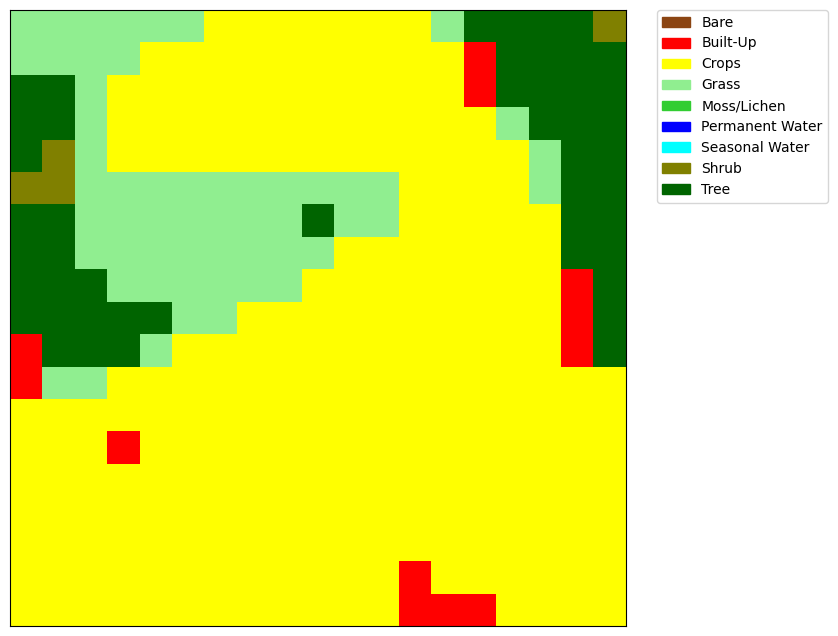

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


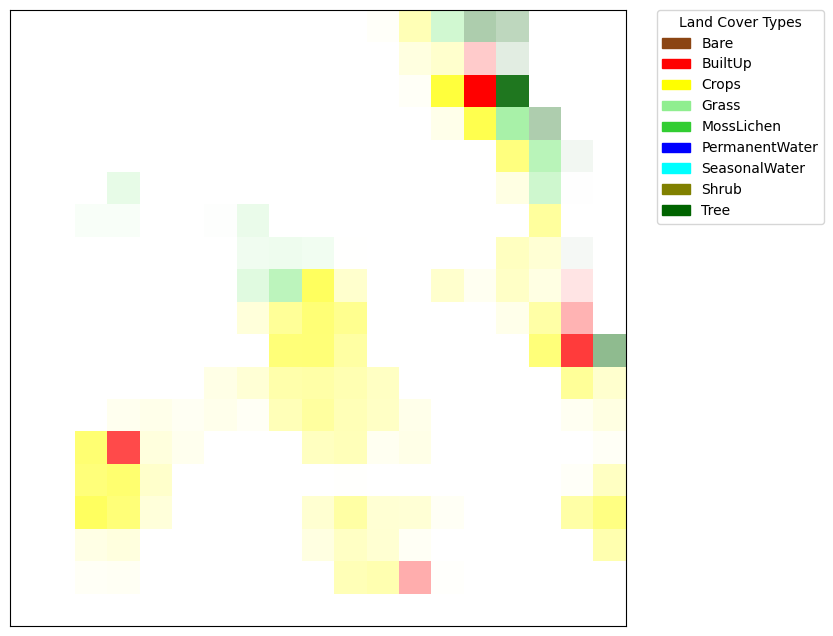

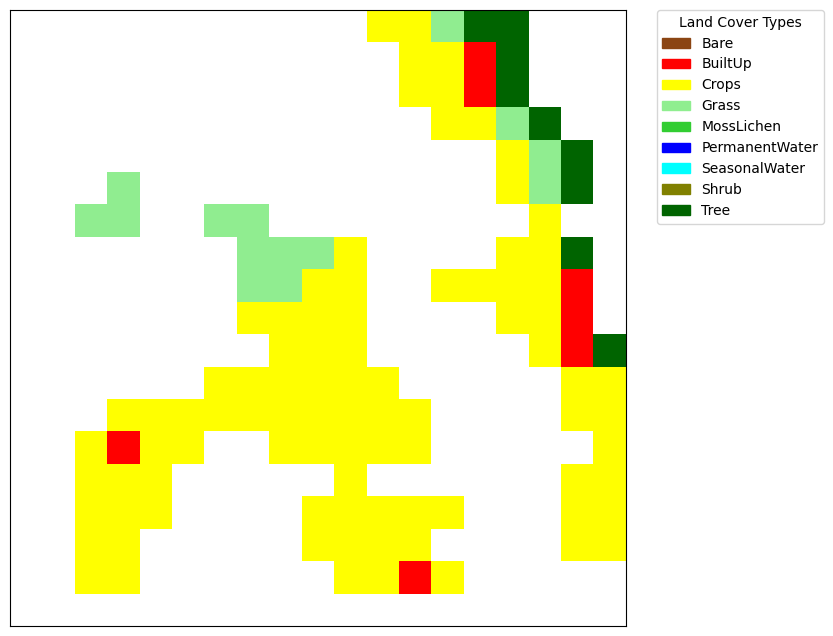

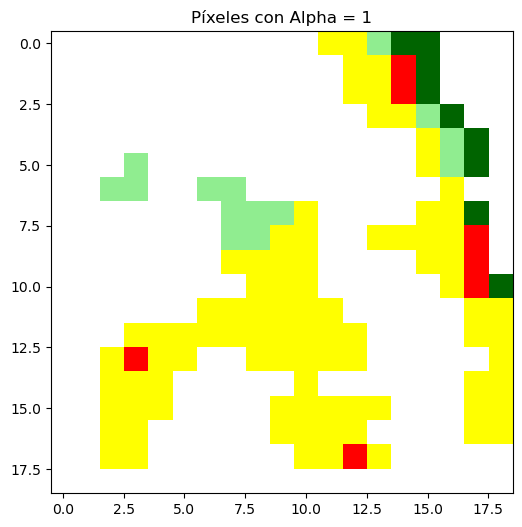

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass     0
1     1   0      Grass     0
2     2   0      Grass     0
3     3   0      Grass     0
4     4   0      Grass     0
..   ..  ..        ...   ...
356  14  18   Built-Up     0
357  15  18      Crops     0
358  16  18      Crops     0
359  17  18      Crops     0
360  18  18      Crops     0

[361 rows x 4 columns]
1


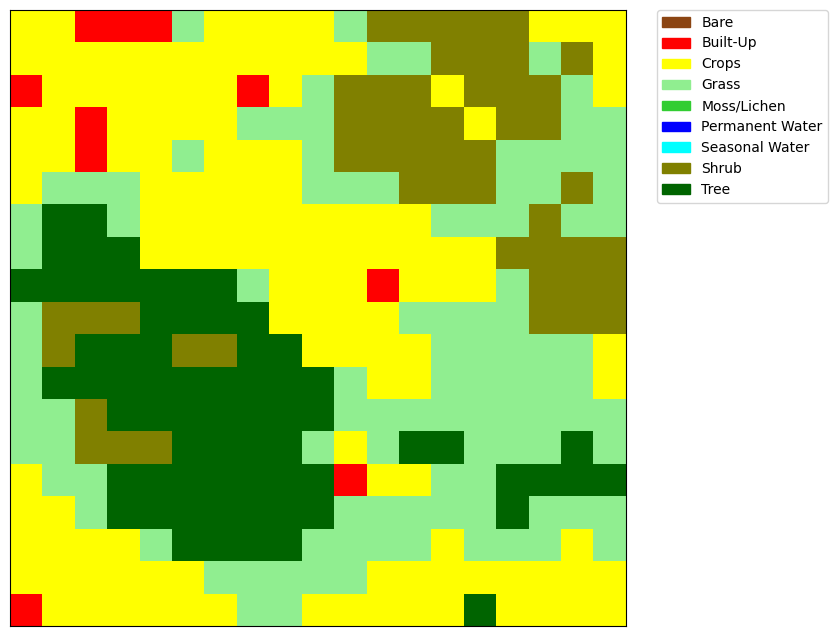

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


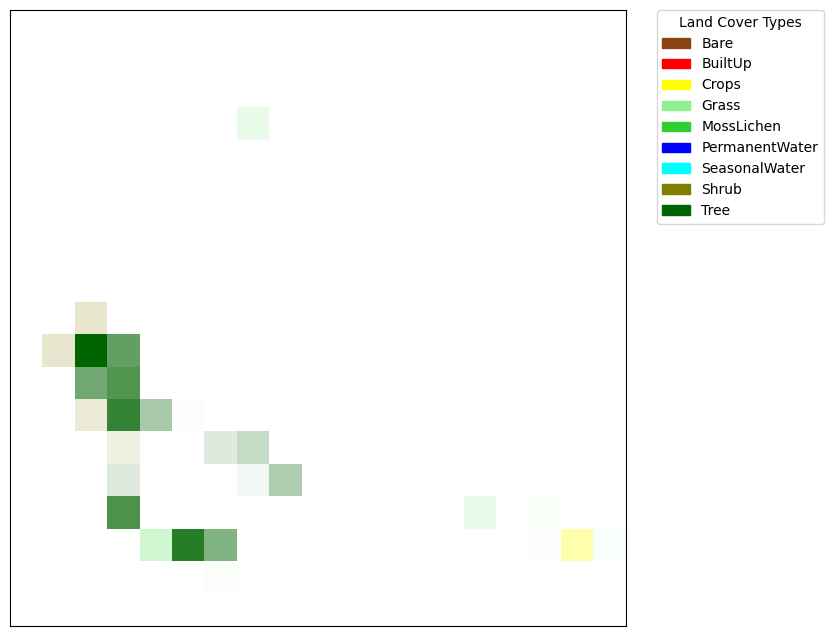

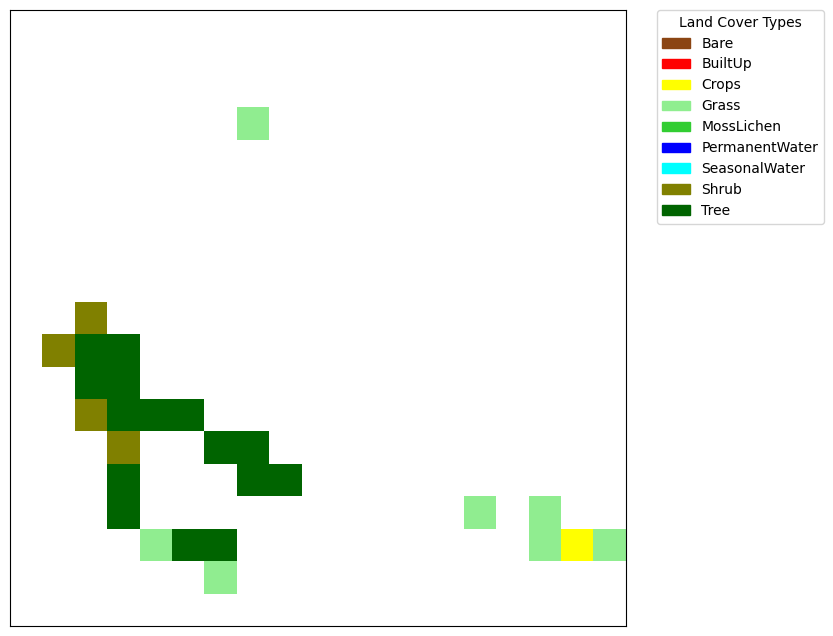

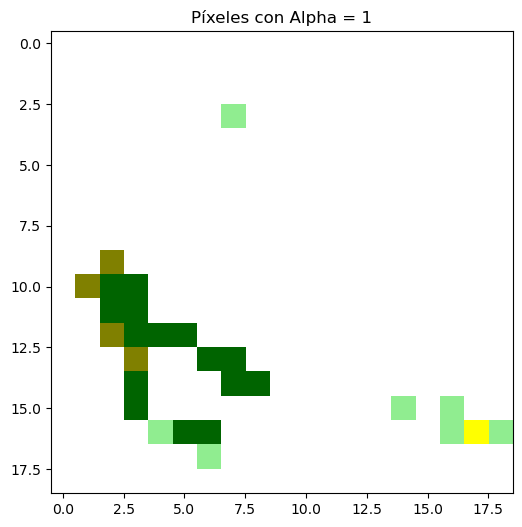

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops     1
1     1   0      Crops     1
2     2   0   Built-Up     1
3     3   0   Built-Up     1
4     4   0   Built-Up     1
..   ..  ..        ...   ...
356  14  18       Tree     1
357  15  18      Crops     1
358  16  18      Crops     1
359  17  18      Crops     1
360  18  18      Crops     1

[361 rows x 4 columns]
2


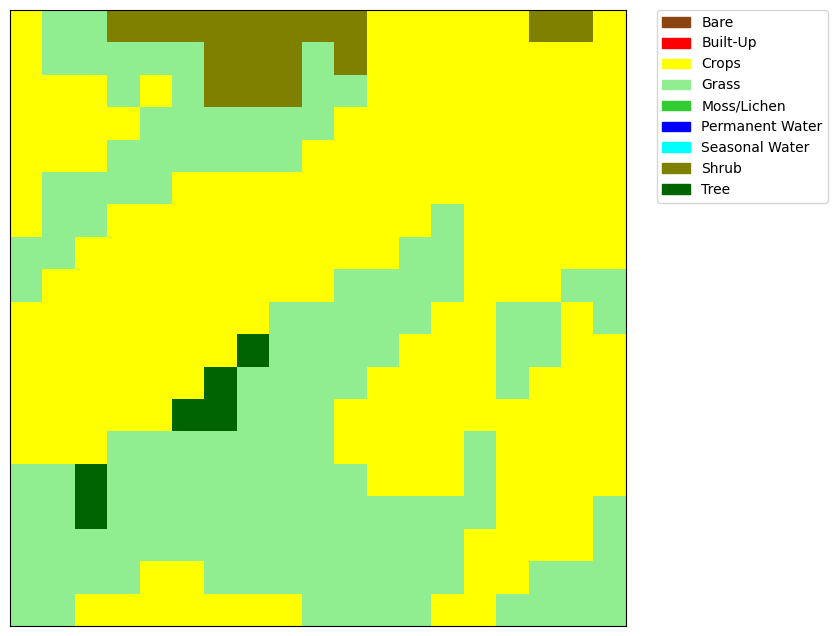

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


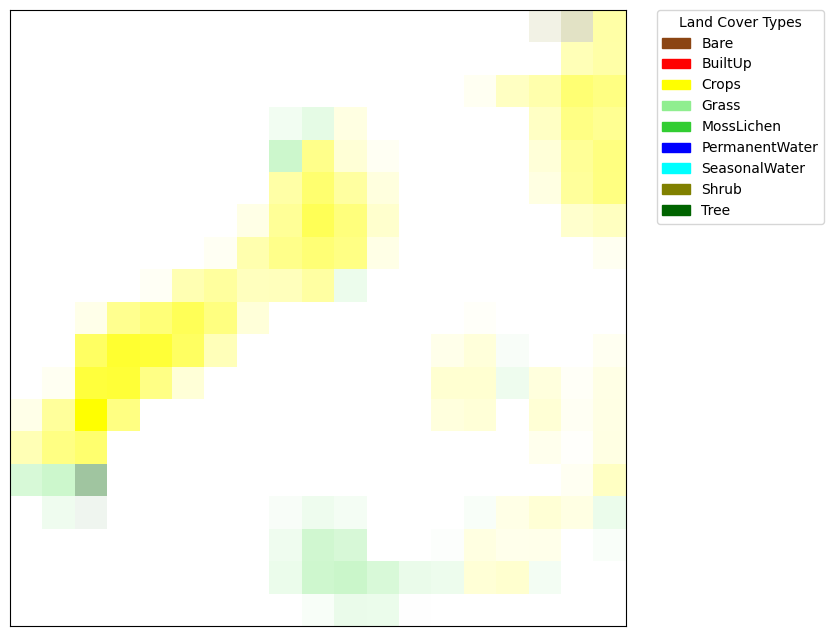

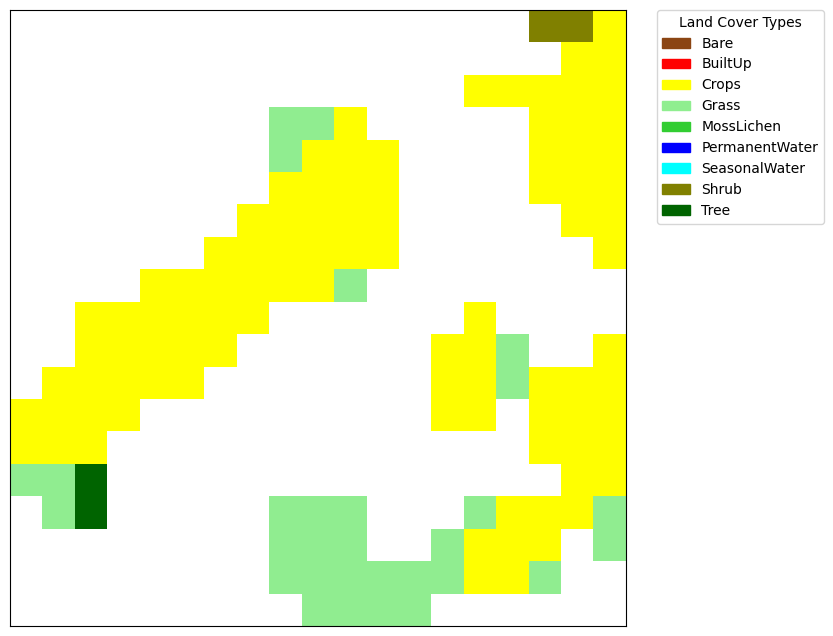

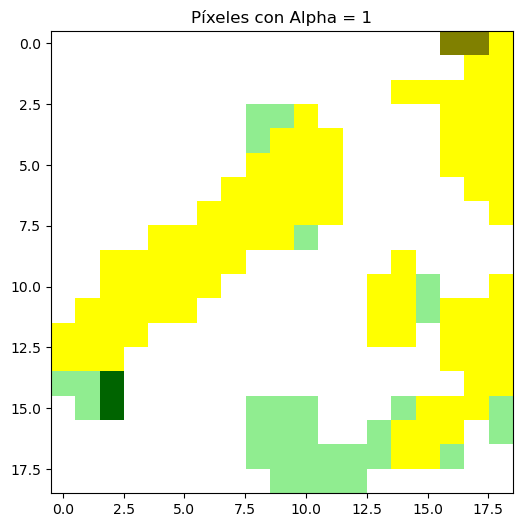

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops     2
1     1   0      Grass     2
2     2   0      Grass     2
3     3   0      Shrub     2
4     4   0      Shrub     2
..   ..  ..        ...   ...
356  14  18      Crops     2
357  15  18      Grass     2
358  16  18      Grass     2
359  17  18      Grass     2
360  18  18      Grass     2

[361 rows x 4 columns]
3


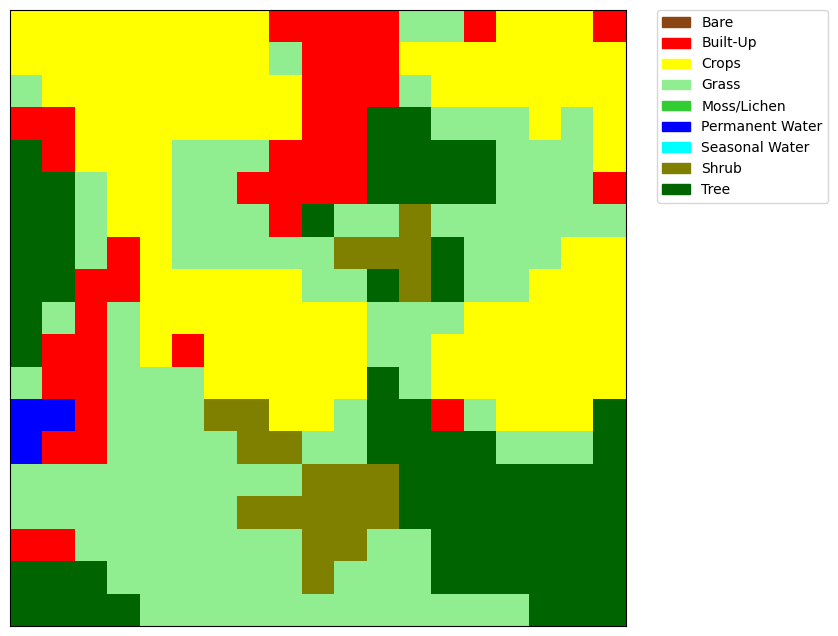

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


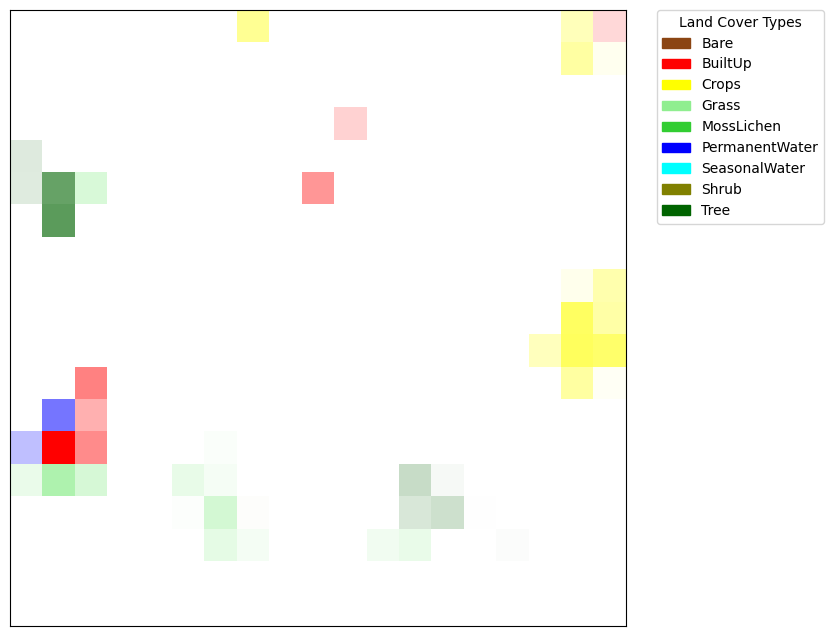

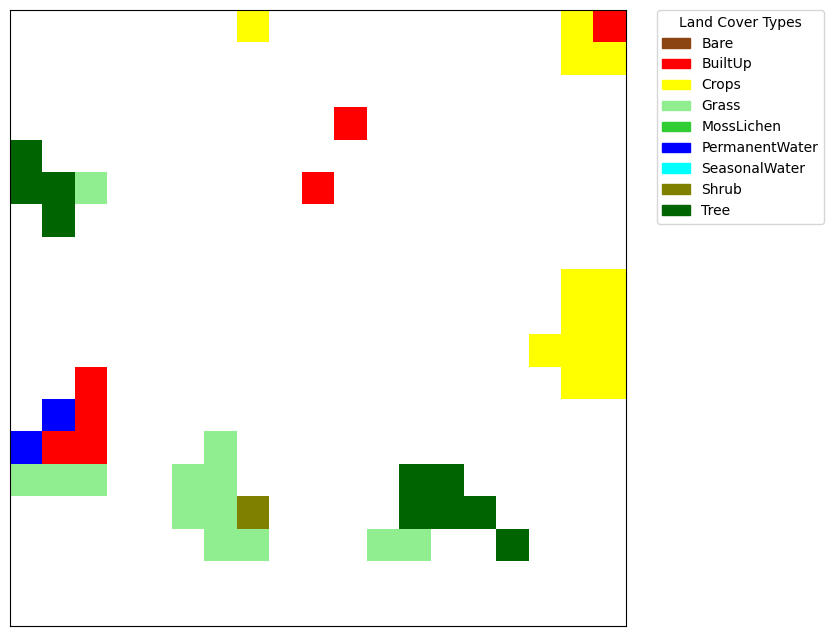

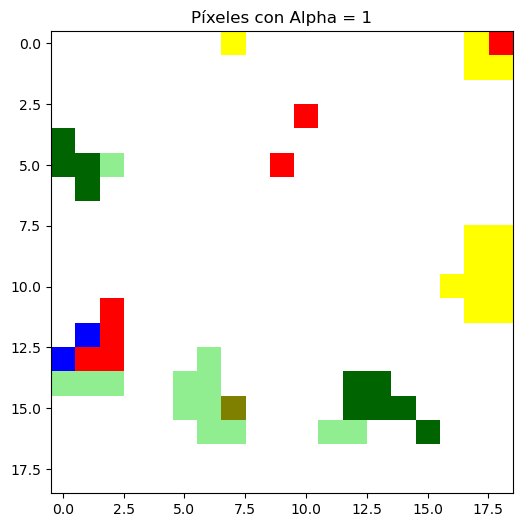

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops     3
1     1   0      Crops     3
2     2   0      Crops     3
3     3   0      Crops     3
4     4   0      Crops     3
..   ..  ..        ...   ...
356  14  18      Grass     3
357  15  18      Grass     3
358  16  18       Tree     3
359  17  18       Tree     3
360  18  18       Tree     3

[361 rows x 4 columns]
4


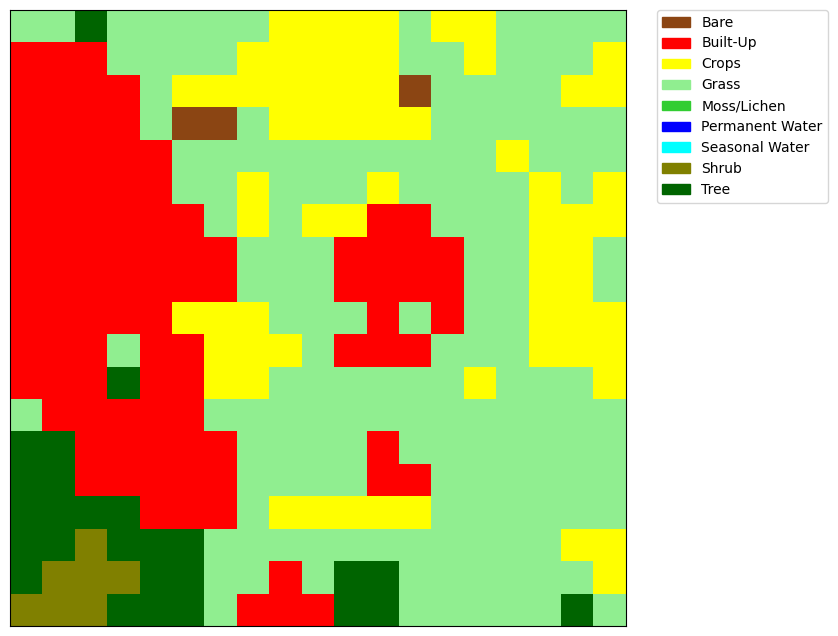

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


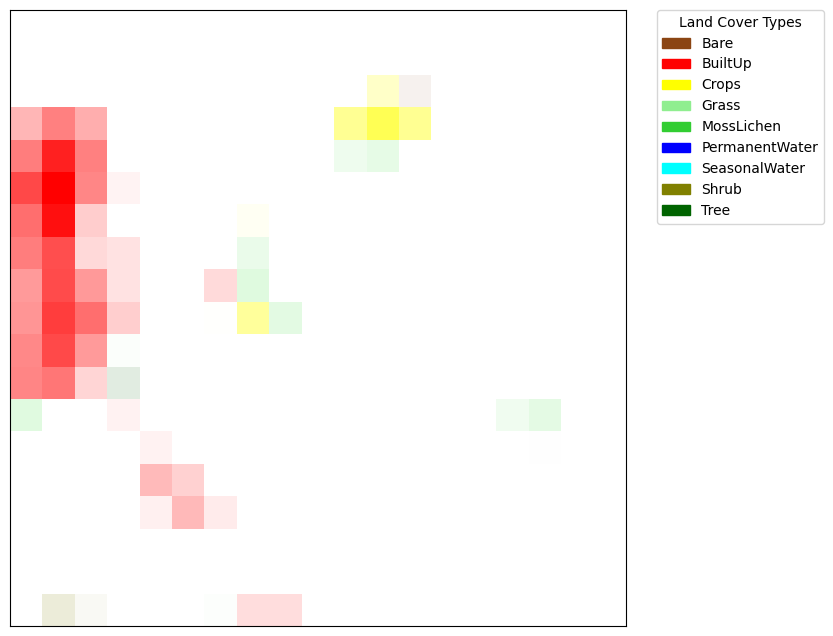

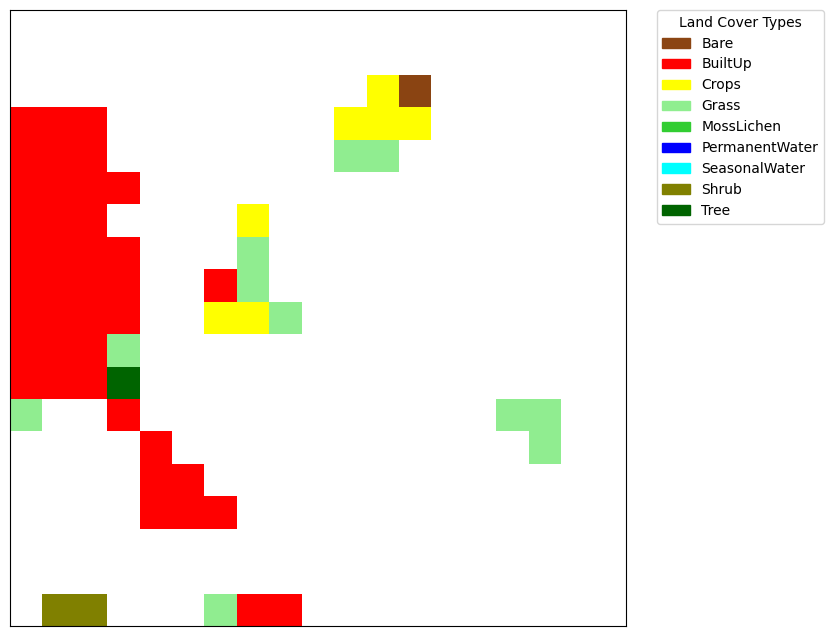

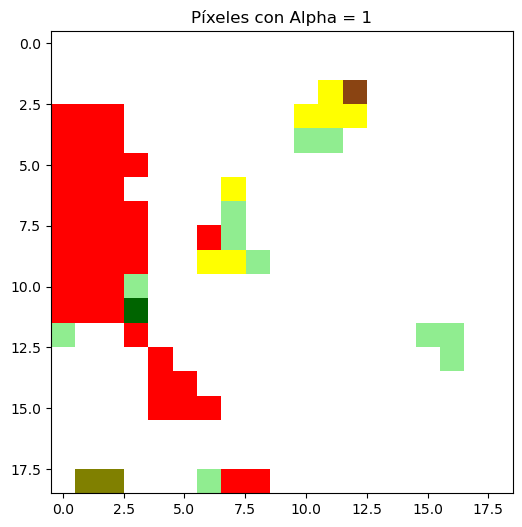

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass     4
1     1   0      Grass     4
2     2   0       Tree     4
3     3   0      Grass     4
4     4   0      Grass     4
..   ..  ..        ...   ...
356  14  18      Grass     4
357  15  18      Grass     4
358  16  18      Grass     4
359  17  18       Tree     4
360  18  18      Grass     4

[361 rows x 4 columns]
5


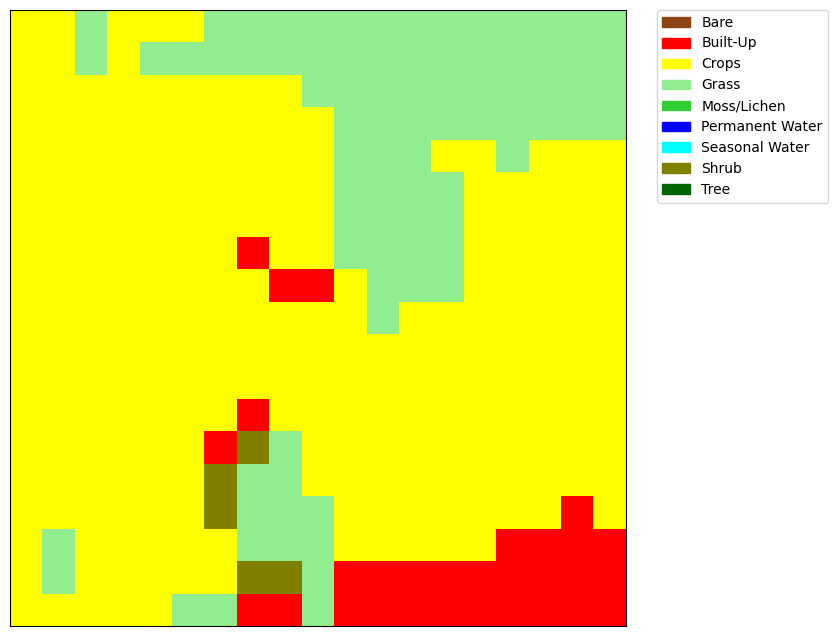

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


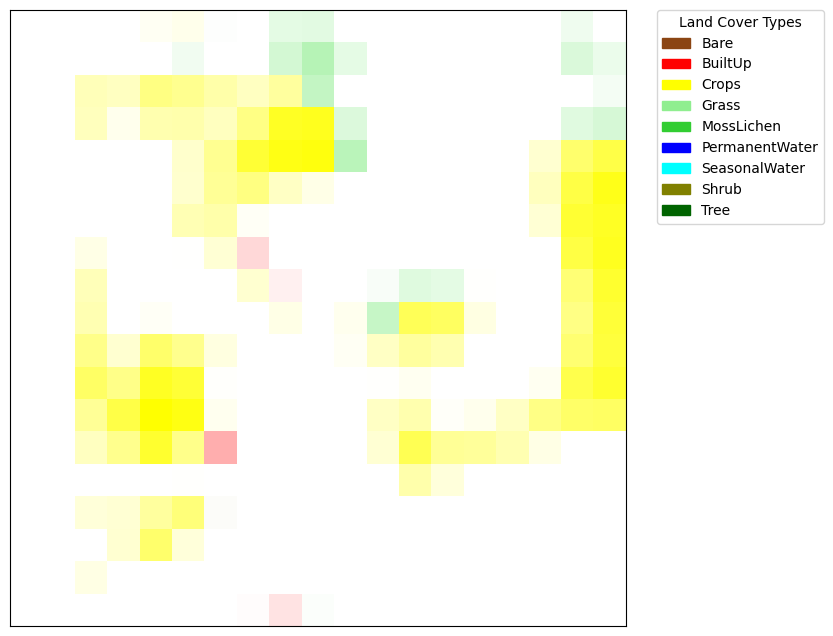

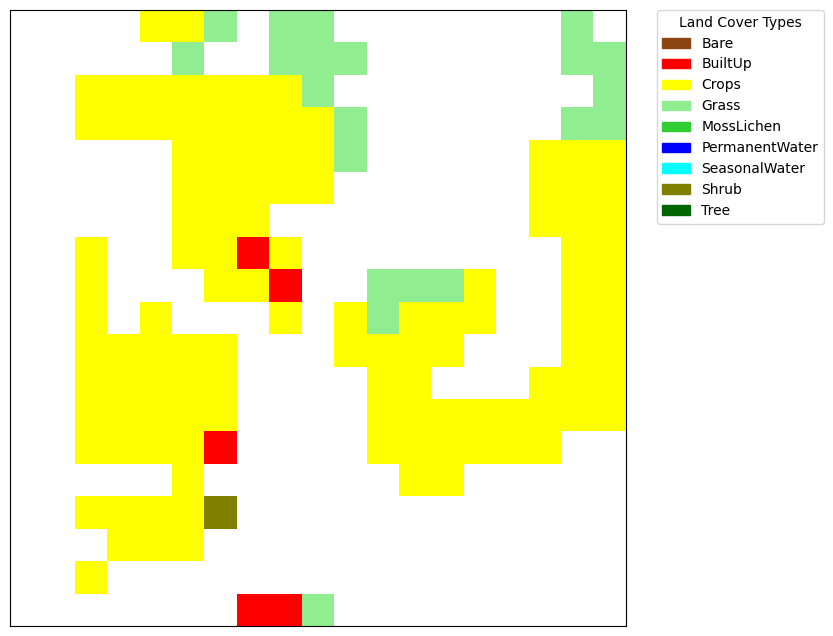

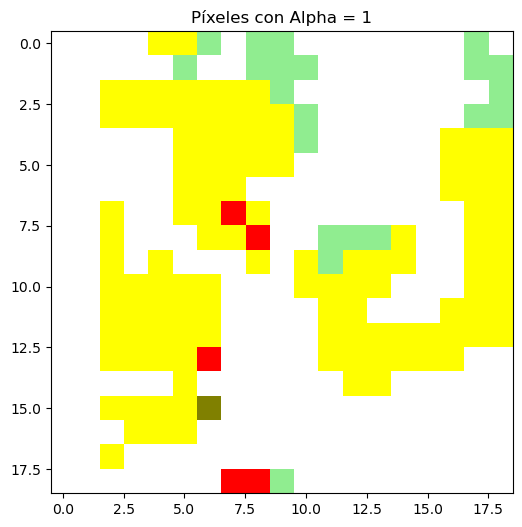

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              1        0.049502
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops     5
1     1   0      Crops     5
2     2   0      Grass     5
3     3   0      Crops     5
4     4   0      Crops     5
..   ..  ..        ...   ...
356  14  18   Built-Up     5
357  15  18   Built-Up     5
358  16  18   Built-Up     5
359  17  18   Built-Up     5
360  18  18   Built-Up     5

[361 rows x 4 columns]
6


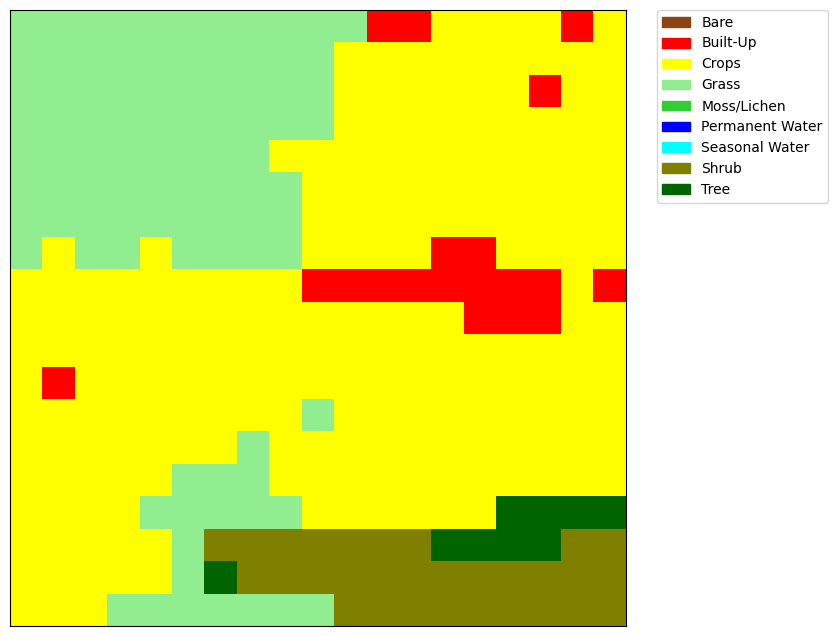

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


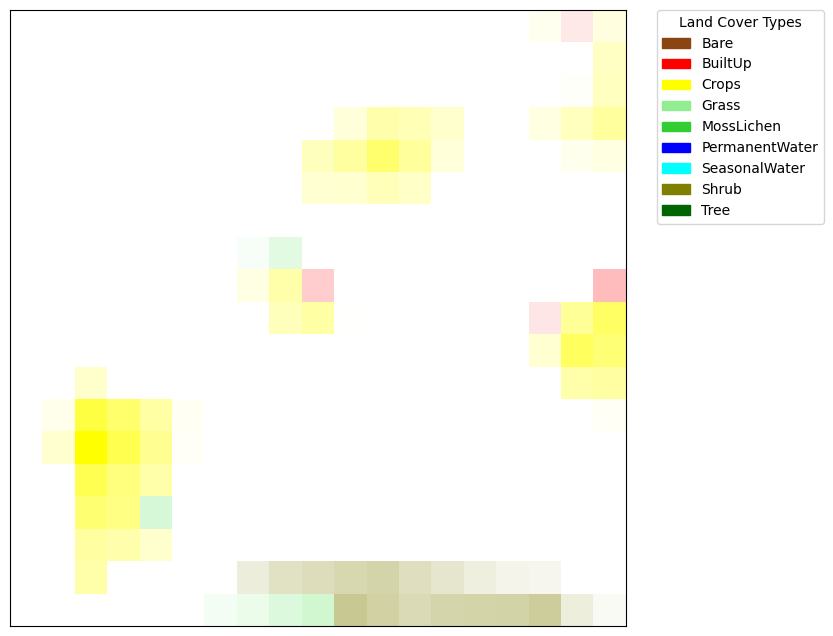

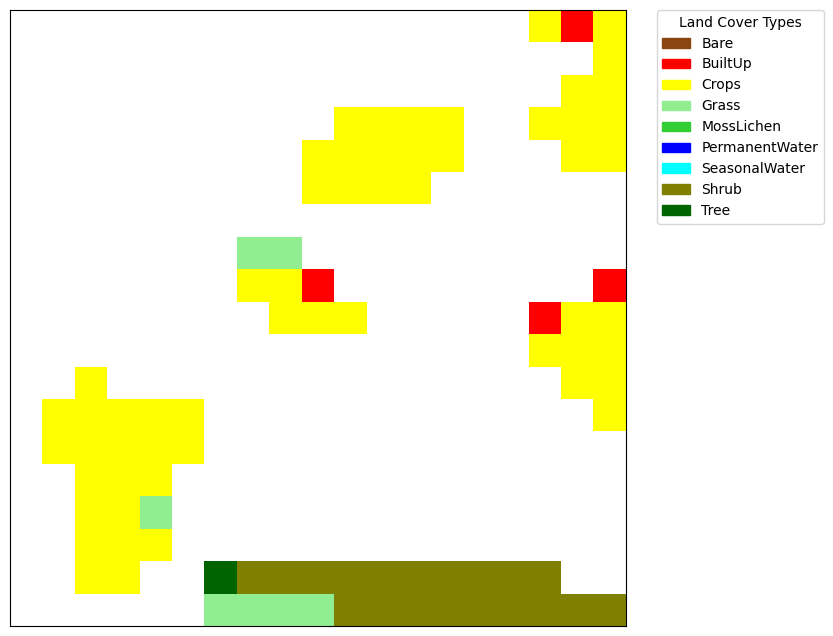

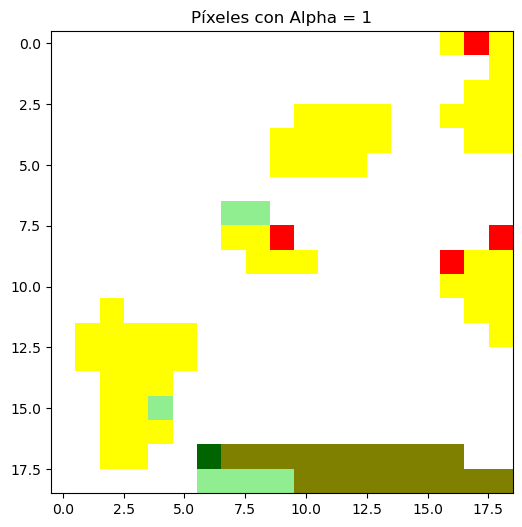

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              6        0.340113
357  18  15              6        0.342755
358  18  16              6        0.390348
359  18  17              6        0.136235
360  18  18              6        0.041539

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass     6
1     1   0      Grass     6
2     2   0      Grass     6
3     3   0      Grass     6
4     4   0      Grass     6
..   ..  ..        ...   ...
356  14  18      Shrub     6
357  15  18      Shrub     6
358  16  18      Shrub     6
359  17  18      Shrub     6
360  18  18      Shrub     6

[361 rows x 4 columns]
7


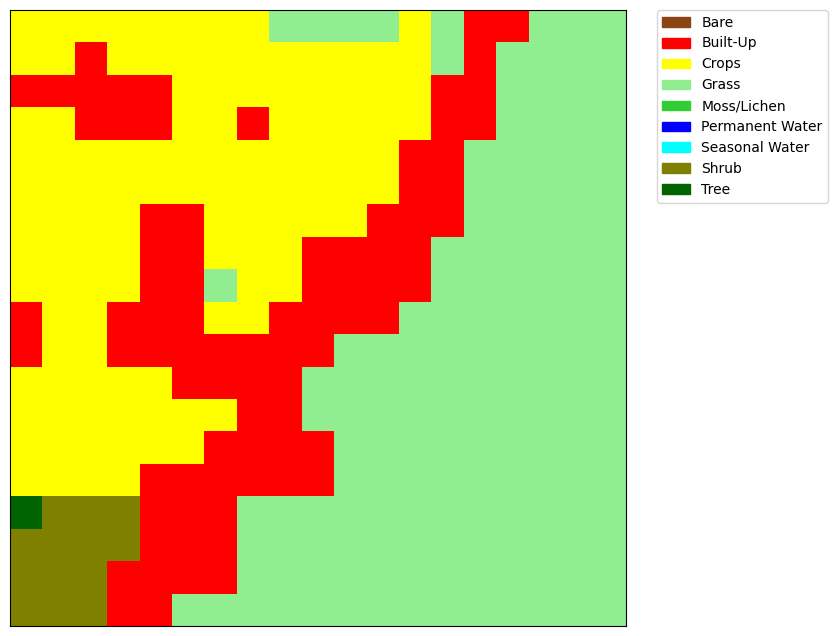

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


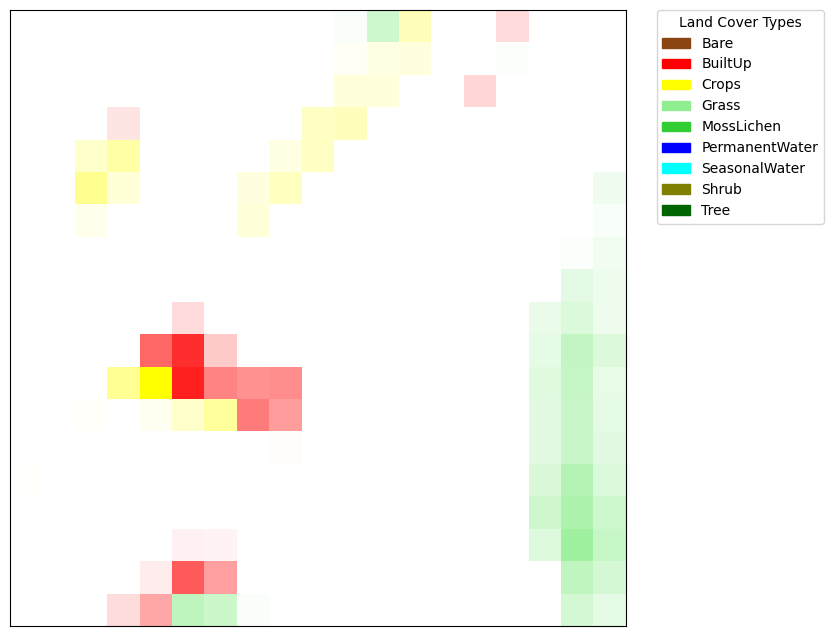

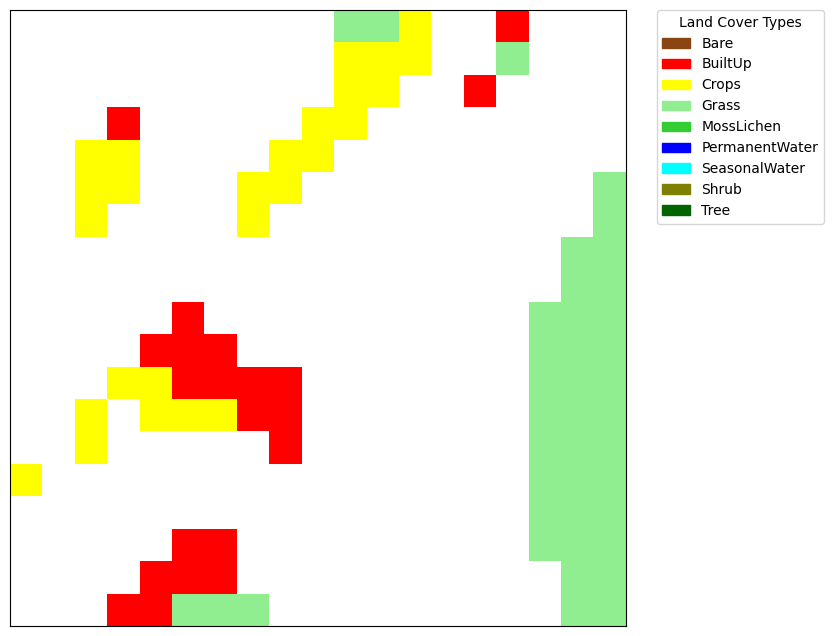

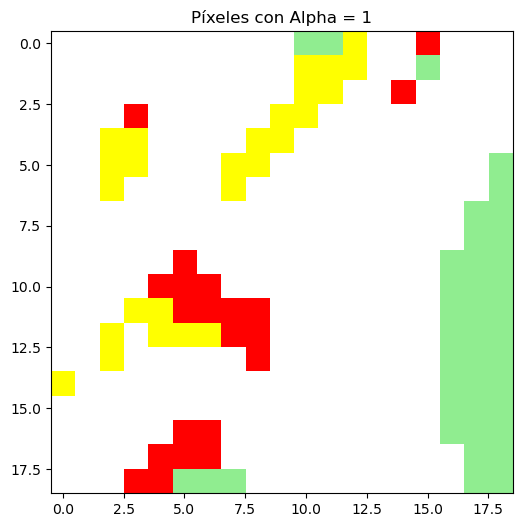

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              4        0.396696
360  18  18              4        0.232619

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops     7
1     1   0      Crops     7
2     2   0      Crops     7
3     3   0      Crops     7
4     4   0      Crops     7
..   ..  ..        ...   ...
356  14  18      Grass     7
357  15  18      Grass     7
358  16  18      Grass     7
359  17  18      Grass     7
360  18  18      Grass     7

[361 rows x 4 columns]
8


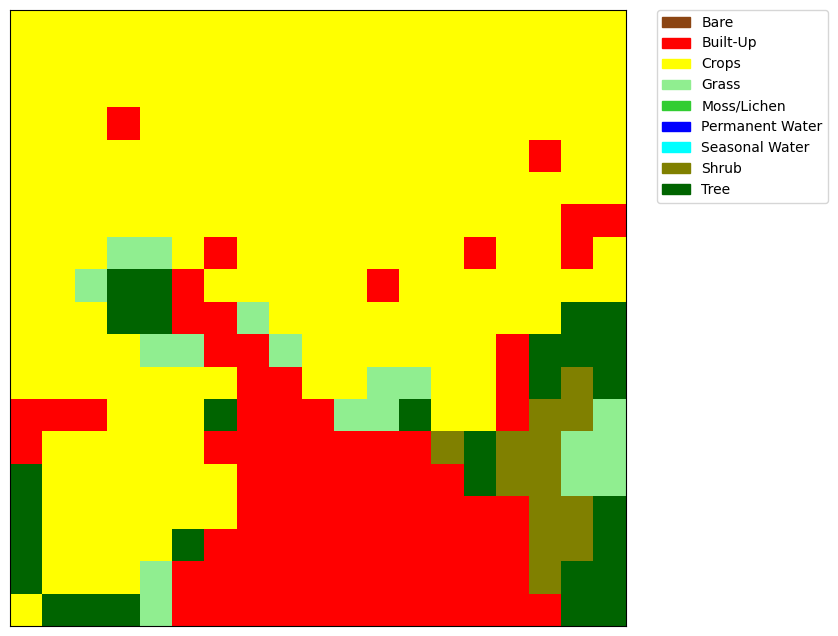

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


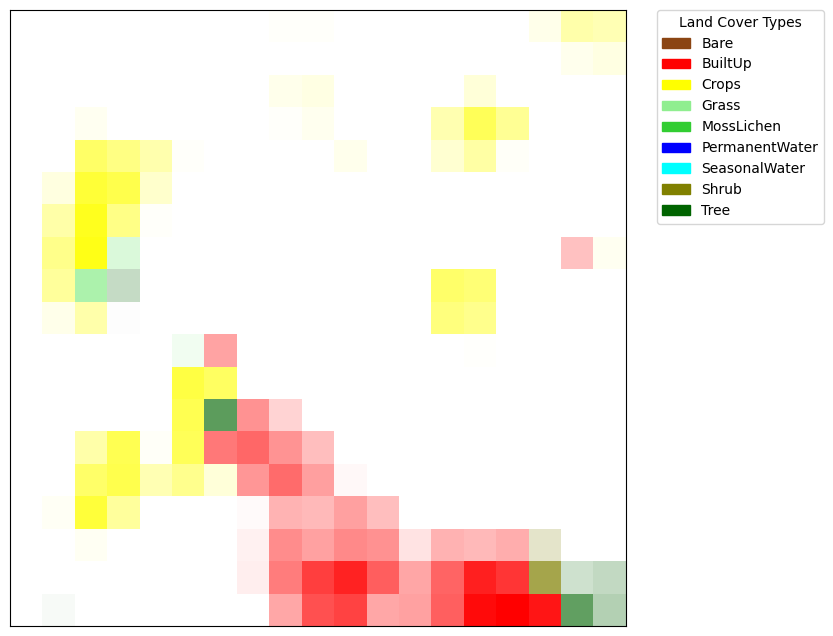

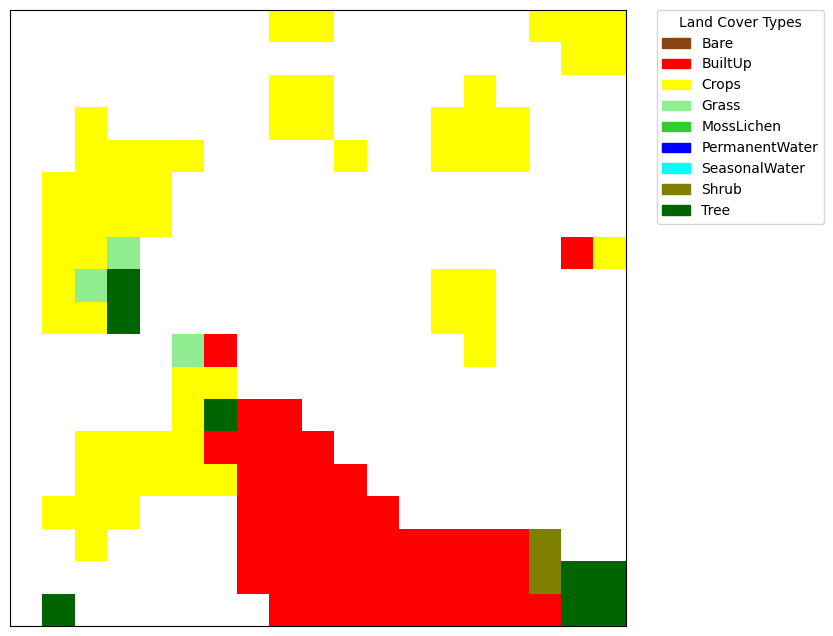

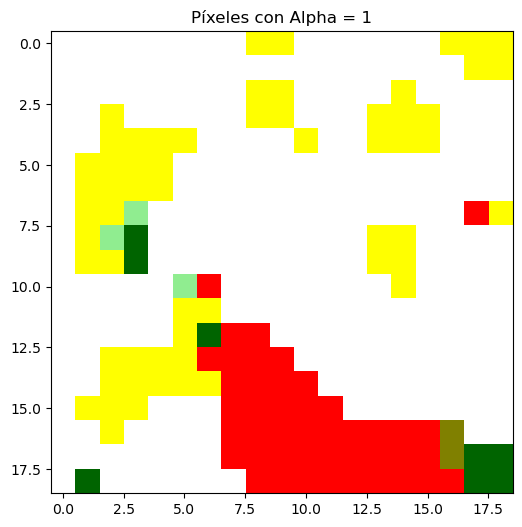

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              8        0.963648
357  18  15              8        1.000000
358  18  16              8        0.918506
359  18  17              8        0.621763
360  18  18              8        0.298996

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops     8
1     1   0      Crops     8
2     2   0      Crops     8
3     3   0      Crops     8
4     4   0      Crops     8
..   ..  ..        ...   ...
356  14  18   Built-Up     8
357  15  18   Built-Up     8
358  16  18   Built-Up     8
359  17  18       Tree     8
360  18  18       Tree     8

[361 rows x 4 columns]
9


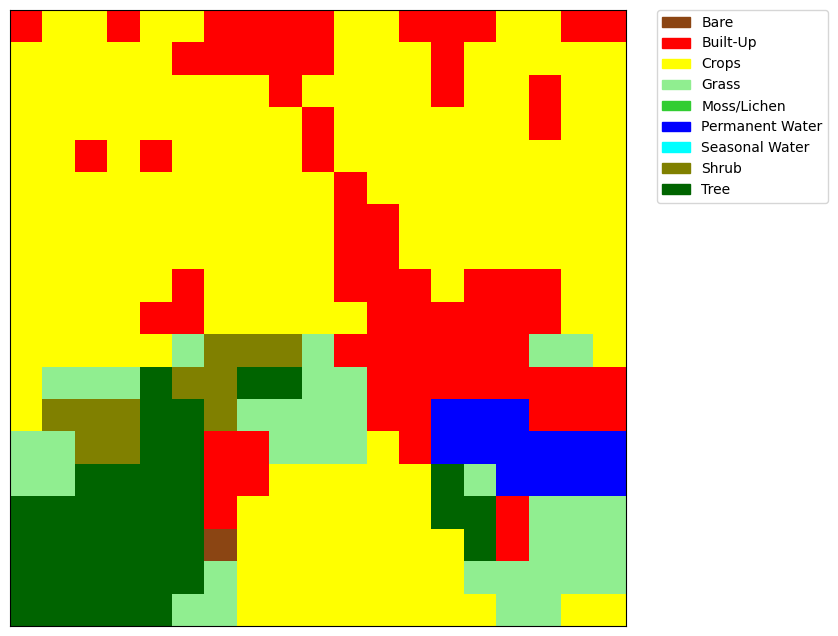

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


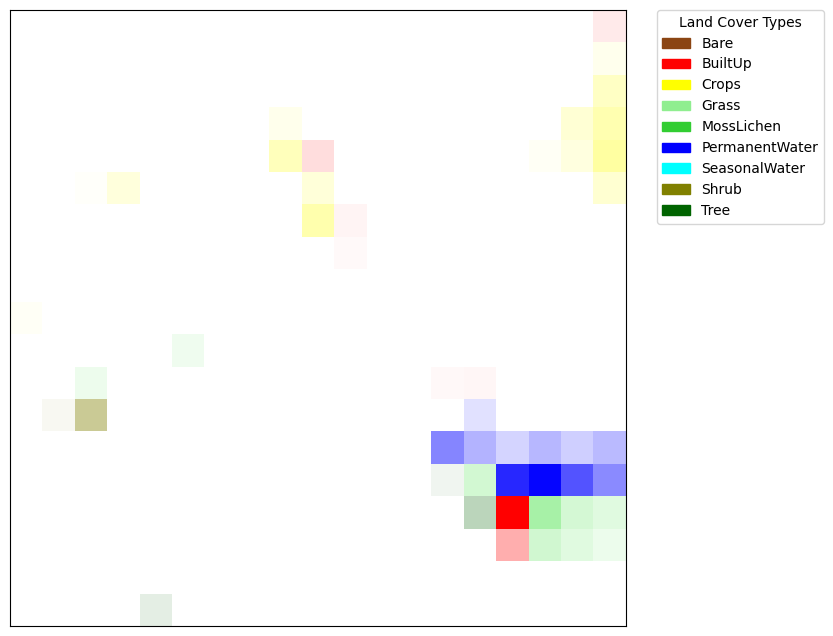

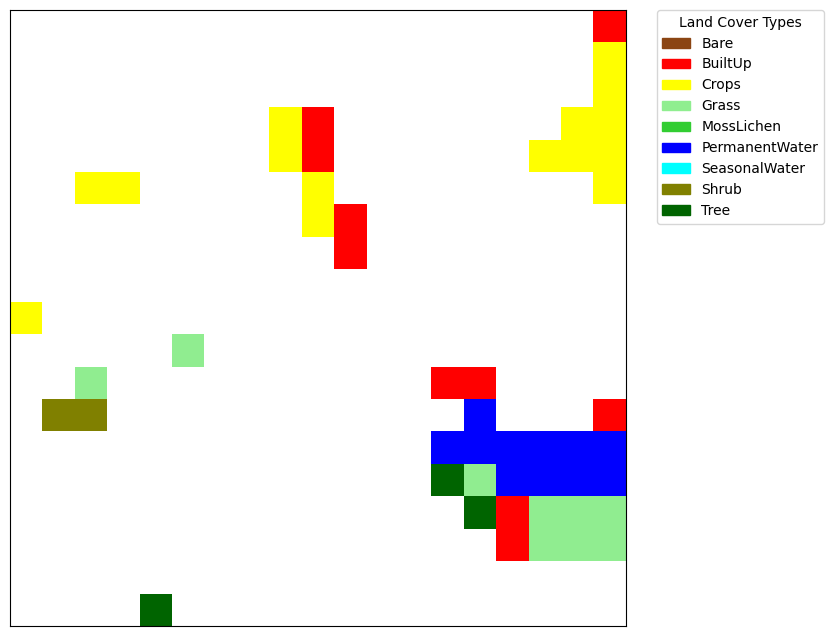

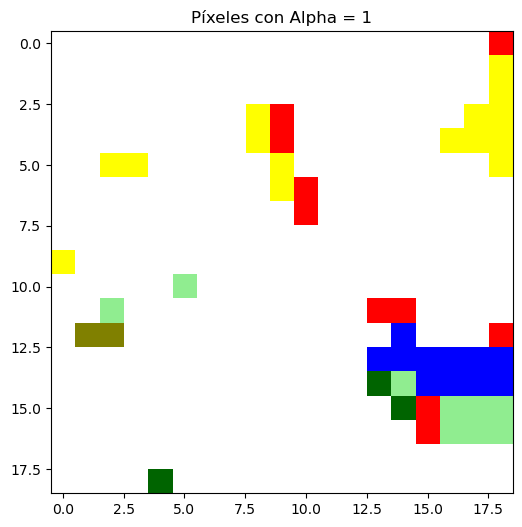

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up     9
1     1   0      Crops     9
2     2   0      Crops     9
3     3   0   Built-Up     9
4     4   0      Crops     9
..   ..  ..        ...   ...
356  14  18      Crops     9
357  15  18      Grass     9
358  16  18      Grass     9
359  17  18      Crops     9
360  18  18      Crops     9

[361 rows x 4 columns]
10


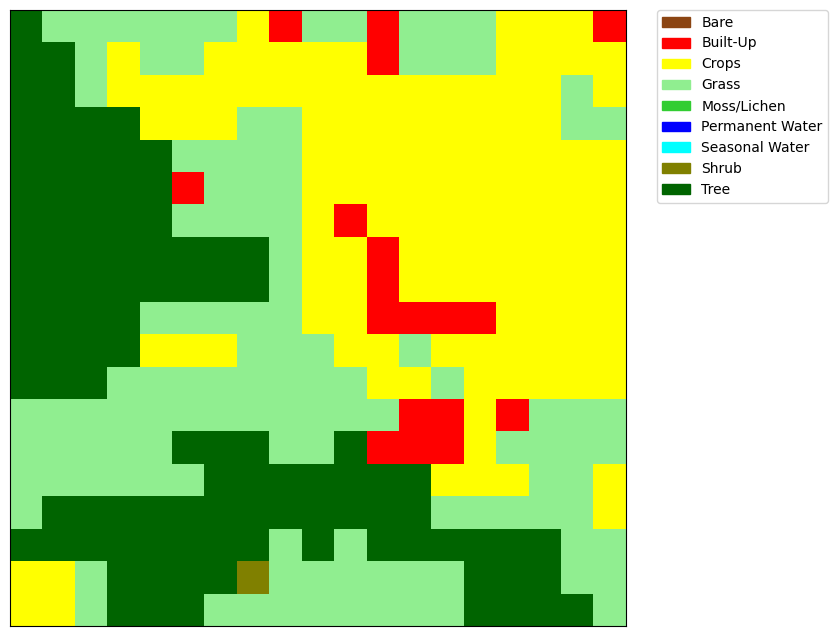

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


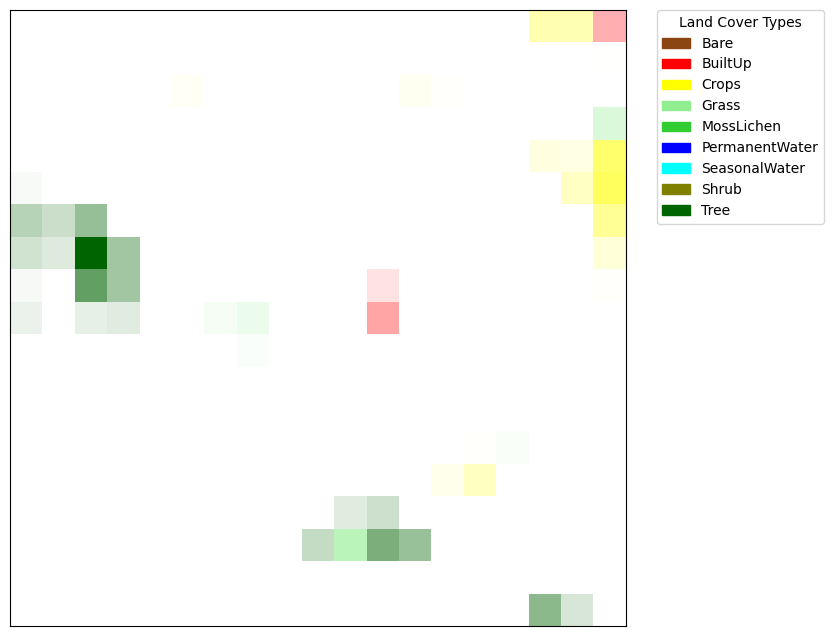

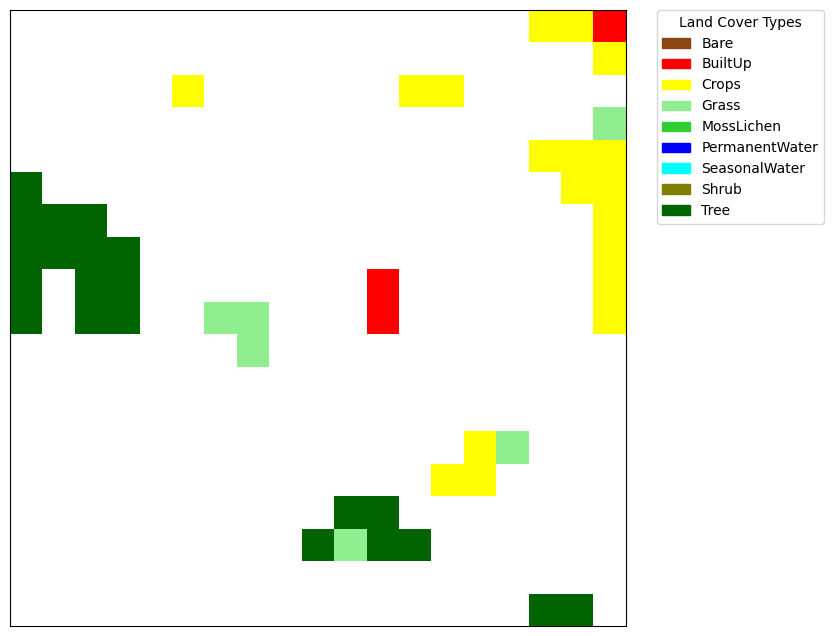

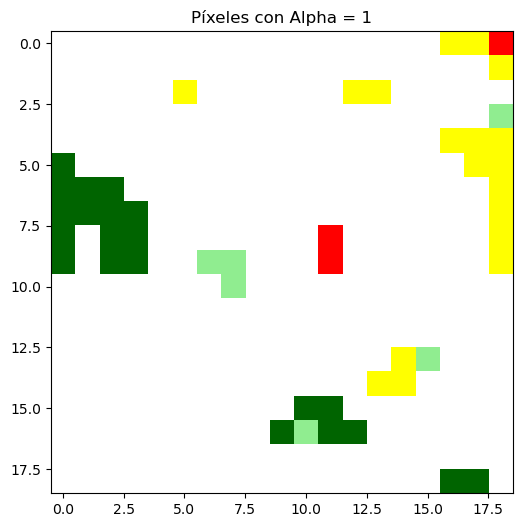

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16             10        0.451724
359  18  17             10        0.157843
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    10
1     1   0      Grass    10
2     2   0      Grass    10
3     3   0      Grass    10
4     4   0      Grass    10
..   ..  ..        ...   ...
356  14  18       Tree    10
357  15  18       Tree    10
358  16  18       Tree    10
359  17  18       Tree    10
360  18  18      Grass    10

[361 rows x 4 columns]
11


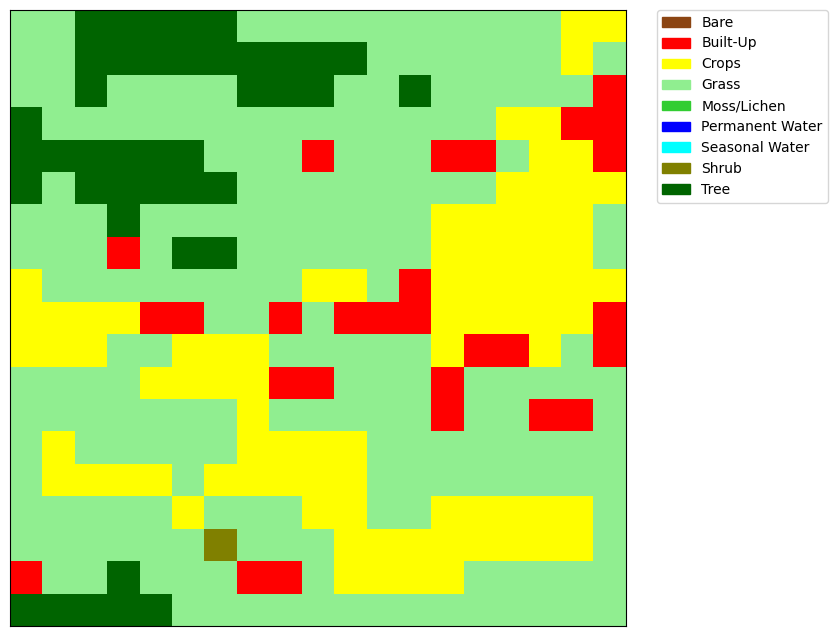

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


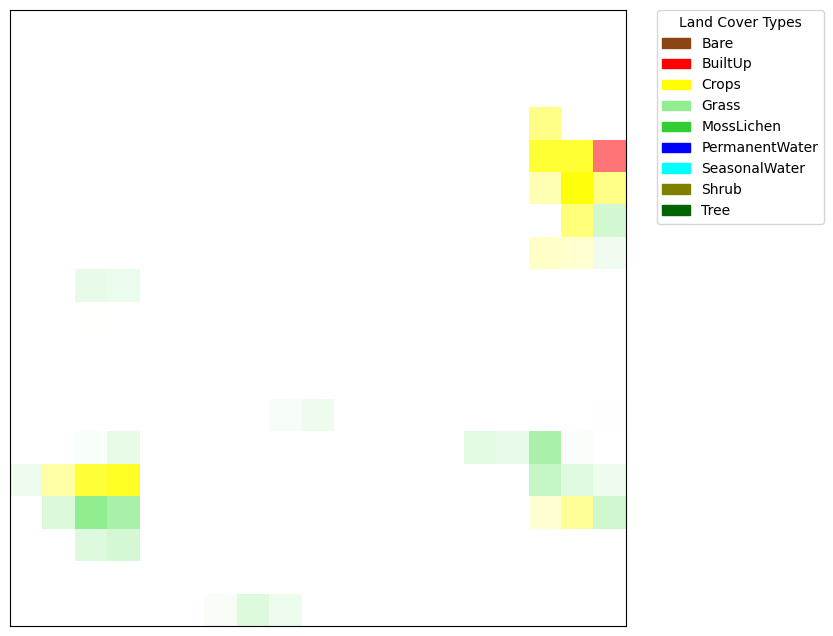

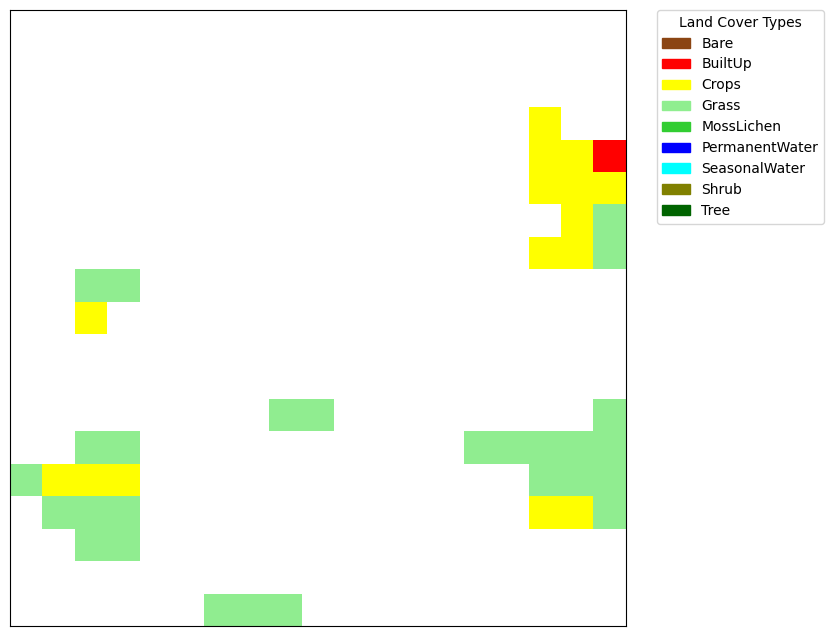

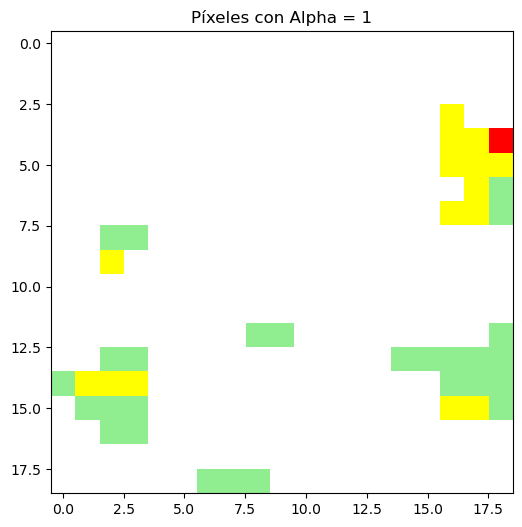

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    11
1     1   0      Grass    11
2     2   0       Tree    11
3     3   0       Tree    11
4     4   0       Tree    11
..   ..  ..        ...   ...
356  14  18      Grass    11
357  15  18      Grass    11
358  16  18      Grass    11
359  17  18      Grass    11
360  18  18      Grass    11

[361 rows x 4 columns]
12


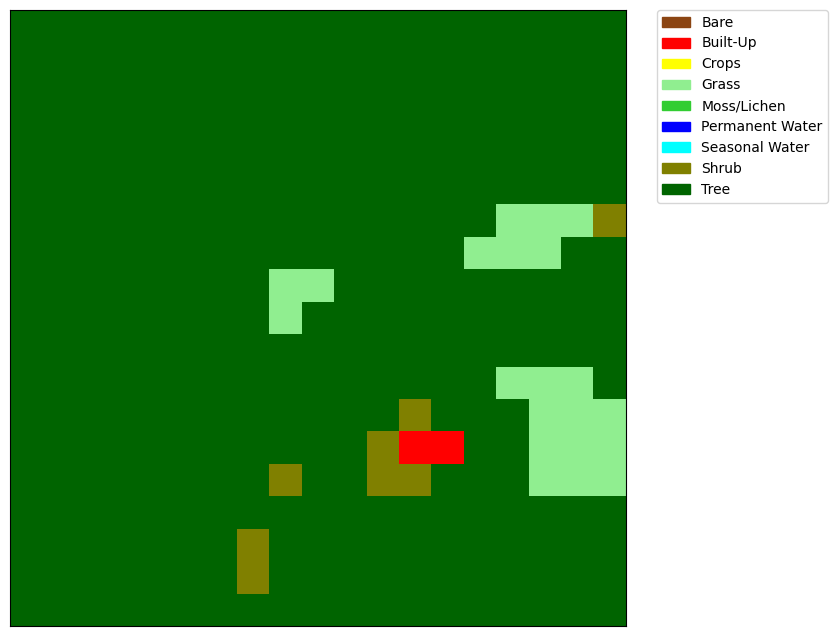

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


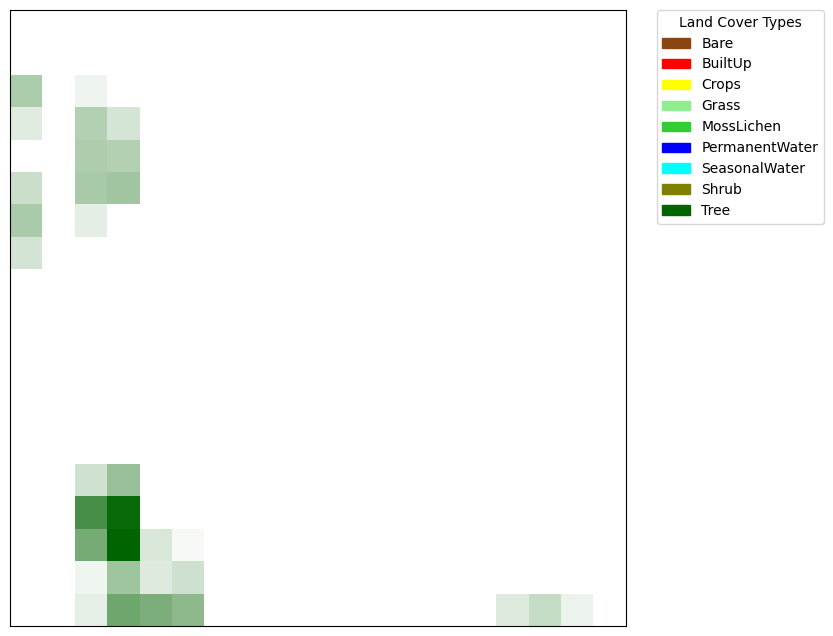

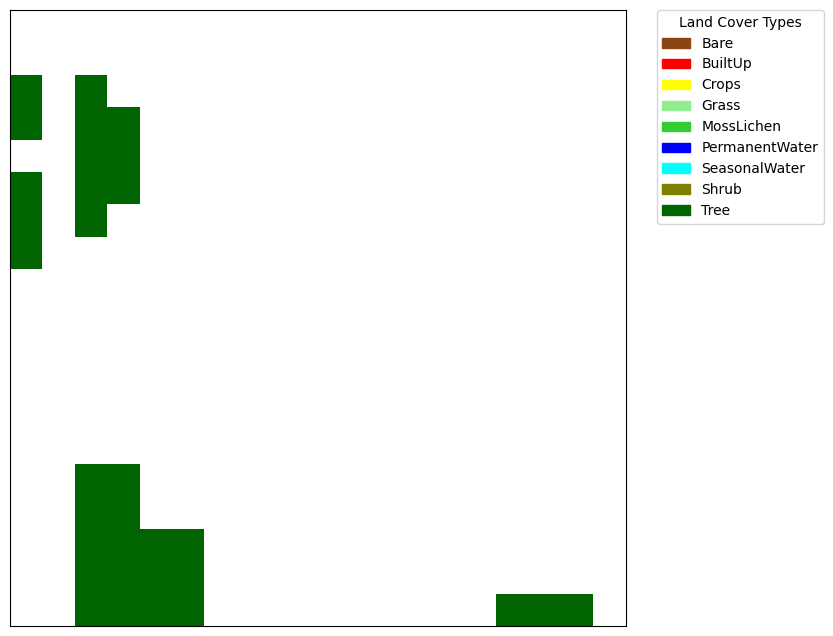

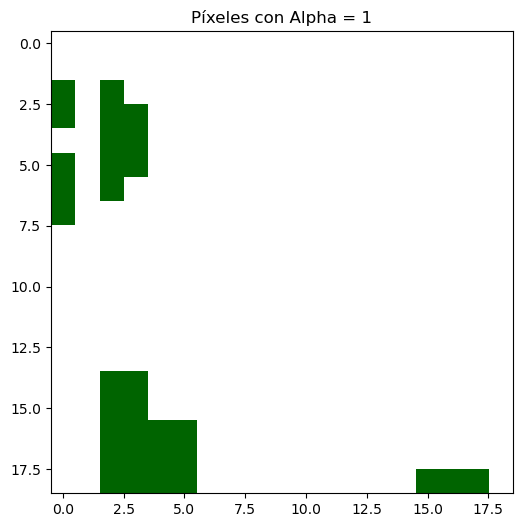

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              5        0.129775
358  18  16              5        0.232126
359  18  17              5        0.077396
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    12
1     1   0       Tree    12
2     2   0       Tree    12
3     3   0       Tree    12
4     4   0       Tree    12
..   ..  ..        ...   ...
356  14  18       Tree    12
357  15  18       Tree    12
358  16  18       Tree    12
359  17  18       Tree    12
360  18  18       Tree    12

[361 rows x 4 columns]
13


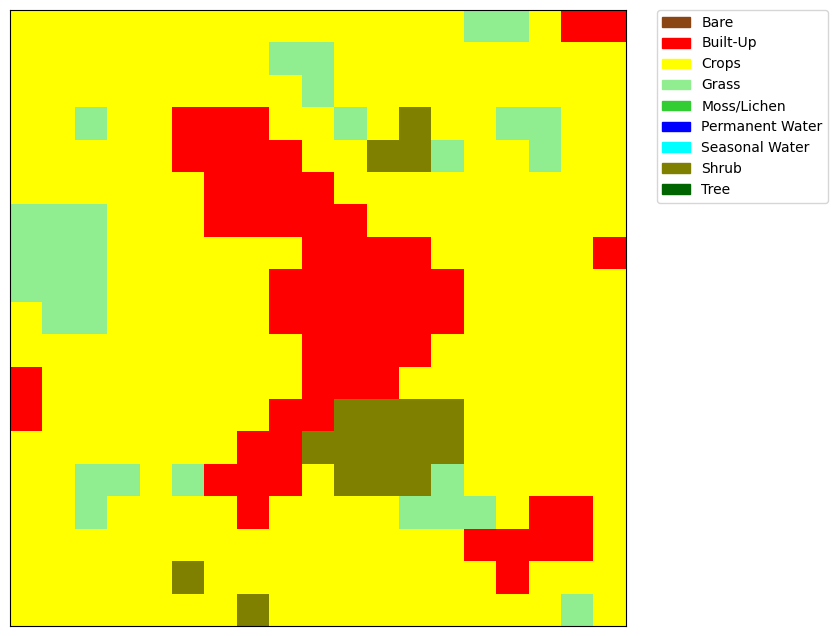

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


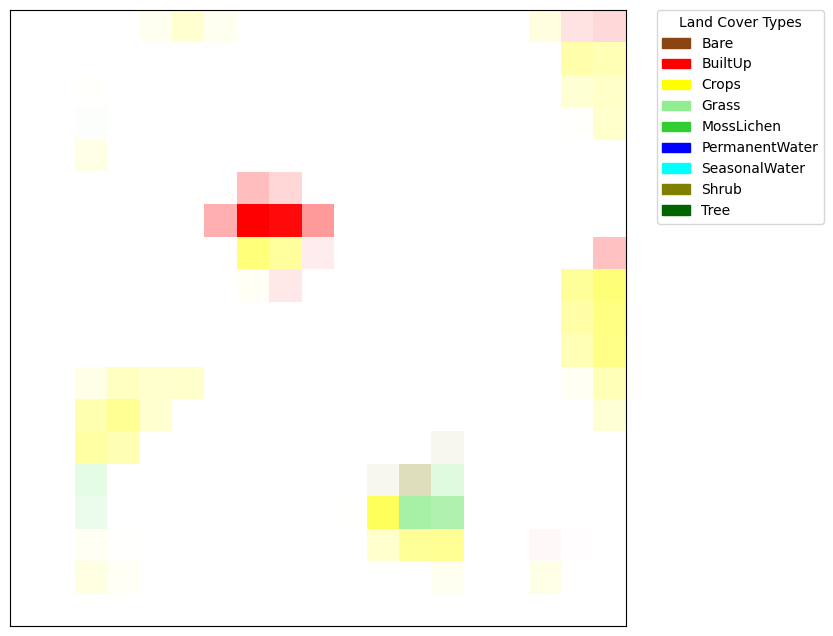

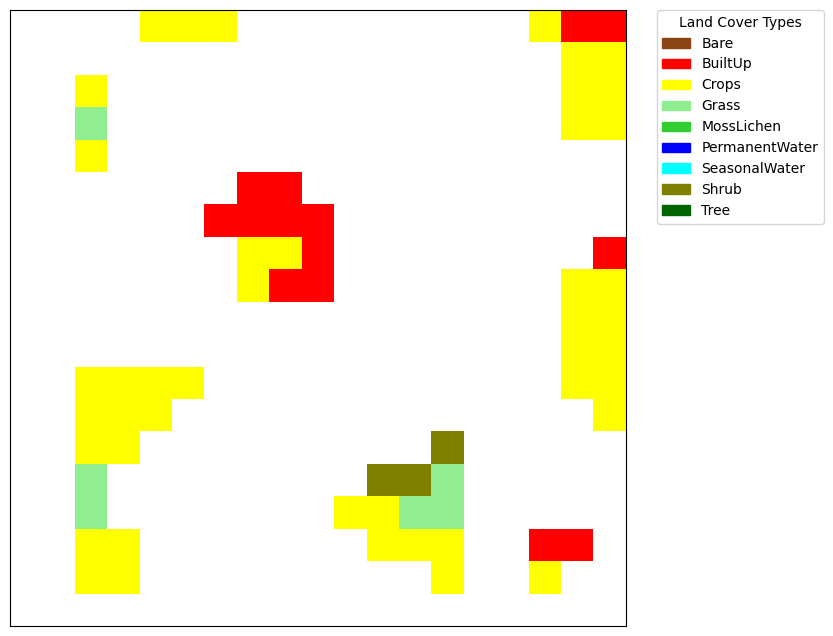

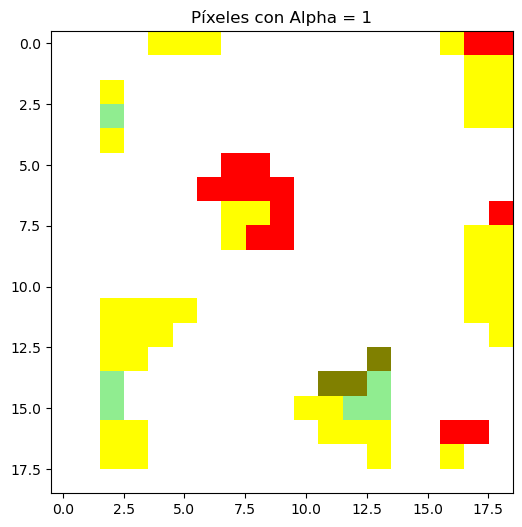

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              1        0.059388
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    13
1     1   0      Crops    13
2     2   0      Crops    13
3     3   0      Crops    13
4     4   0      Crops    13
..   ..  ..        ...   ...
356  14  18      Crops    13
357  15  18      Crops    13
358  16  18      Crops    13
359  17  18      Grass    13
360  18  18      Crops    13

[361 rows x 4 columns]
14


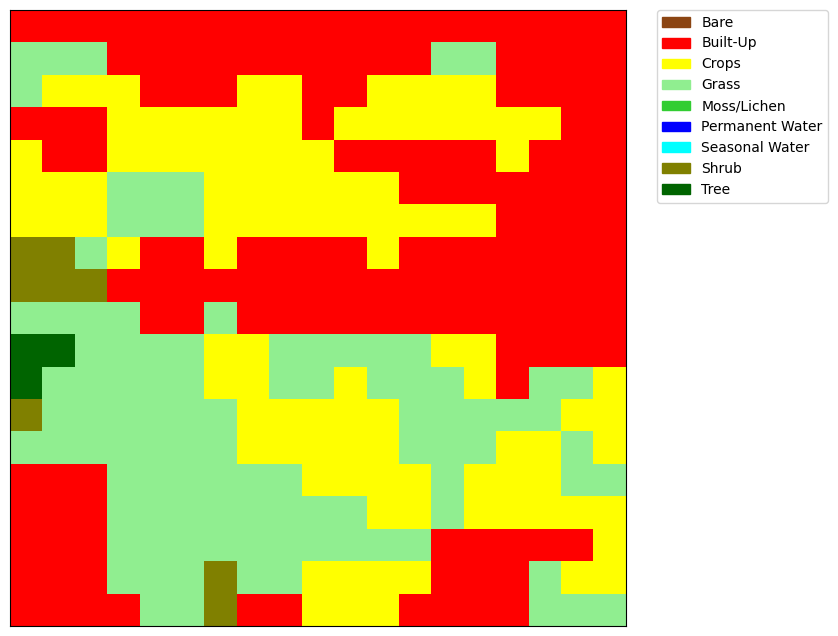

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


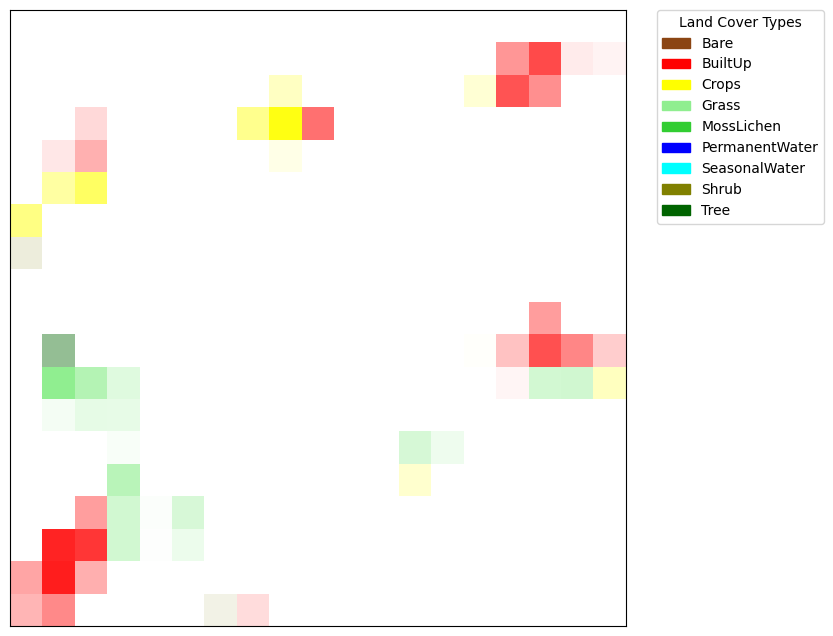

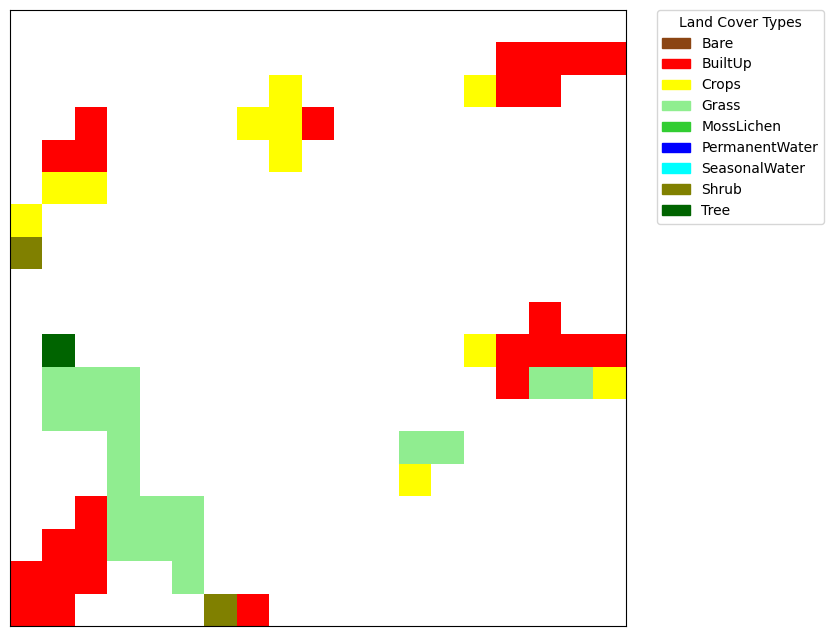

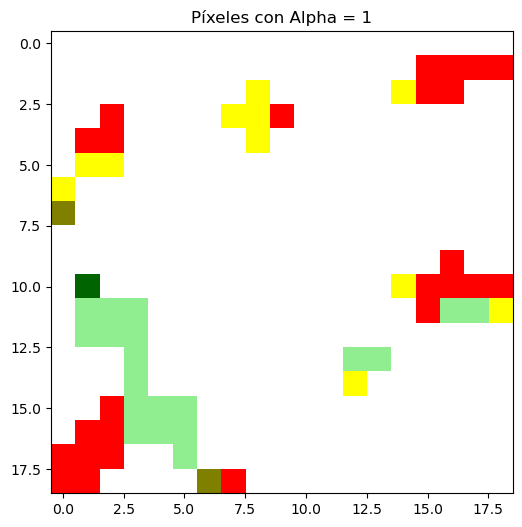

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    14
1     1   0   Built-Up    14
2     2   0   Built-Up    14
3     3   0   Built-Up    14
4     4   0   Built-Up    14
..   ..  ..        ...   ...
356  14  18   Built-Up    14
357  15  18   Built-Up    14
358  16  18      Grass    14
359  17  18      Grass    14
360  18  18      Grass    14

[361 rows x 4 columns]
15


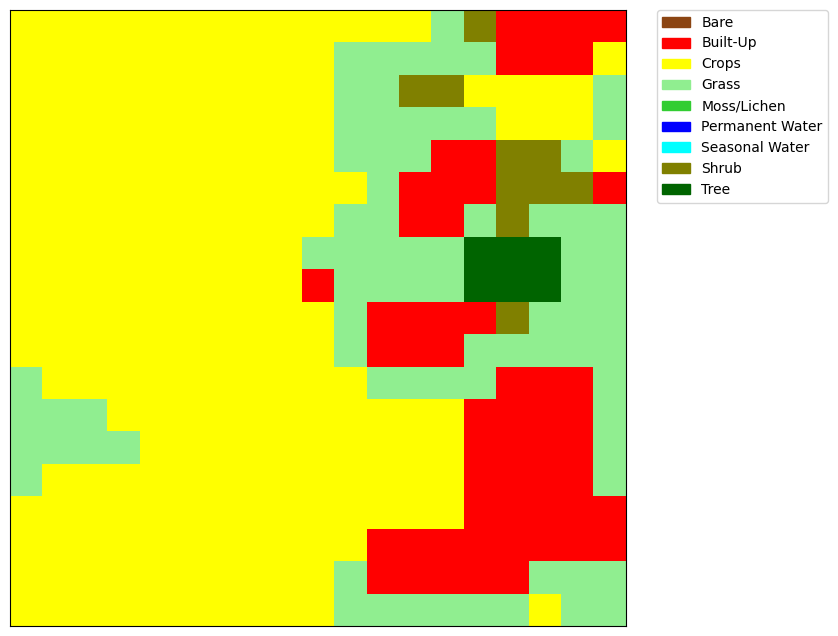

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


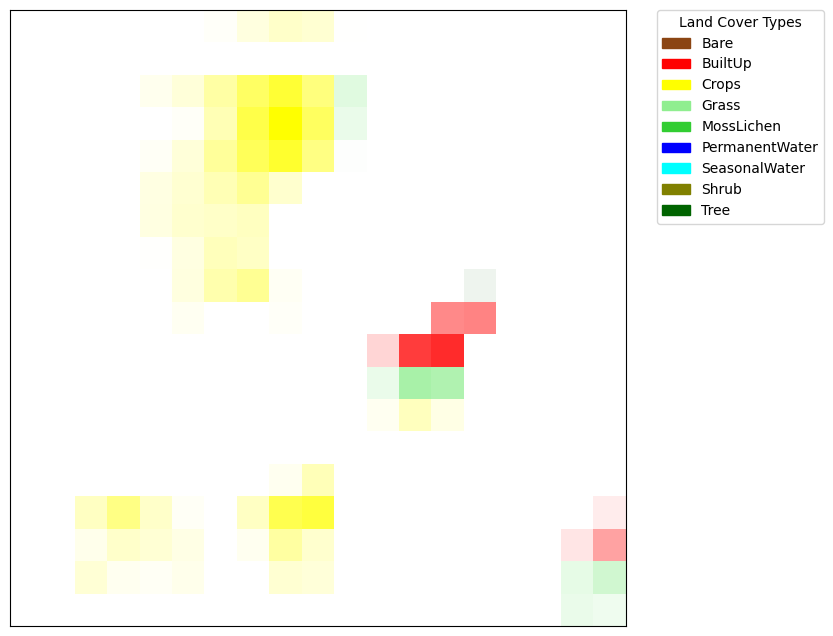

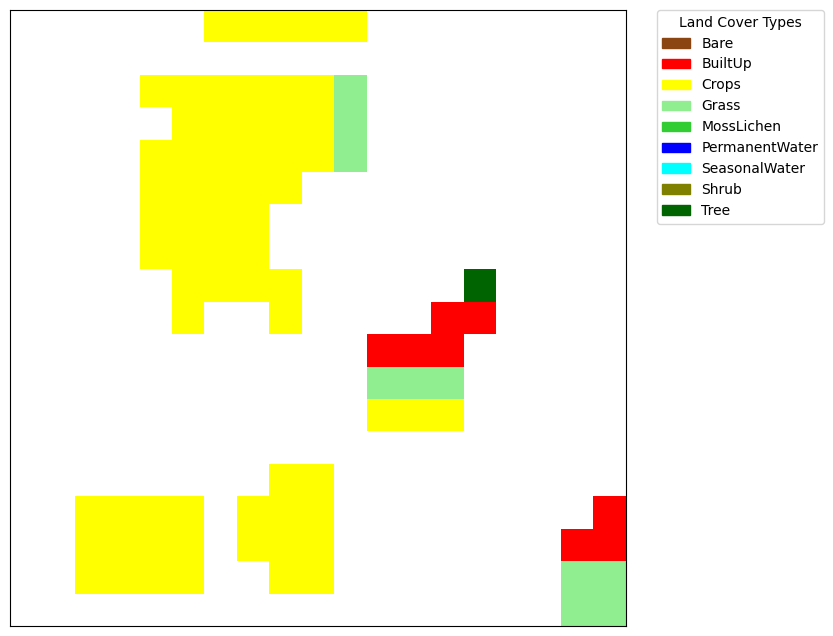

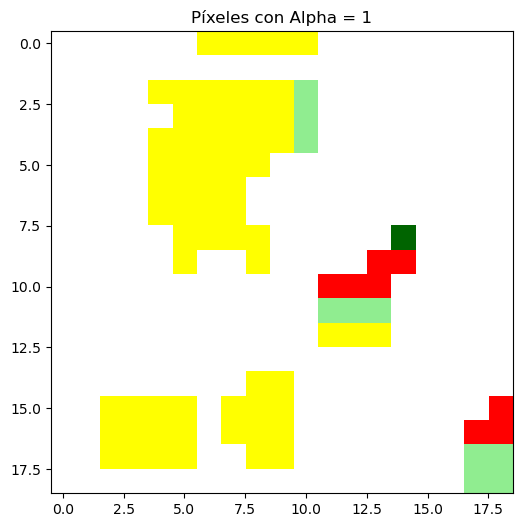

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              6        0.186846
360  18  18              6        0.139956

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    15
1     1   0      Crops    15
2     2   0      Crops    15
3     3   0      Crops    15
4     4   0      Crops    15
..   ..  ..        ...   ...
356  14  18      Grass    15
357  15  18      Grass    15
358  16  18      Crops    15
359  17  18      Grass    15
360  18  18      Grass    15

[361 rows x 4 columns]
16


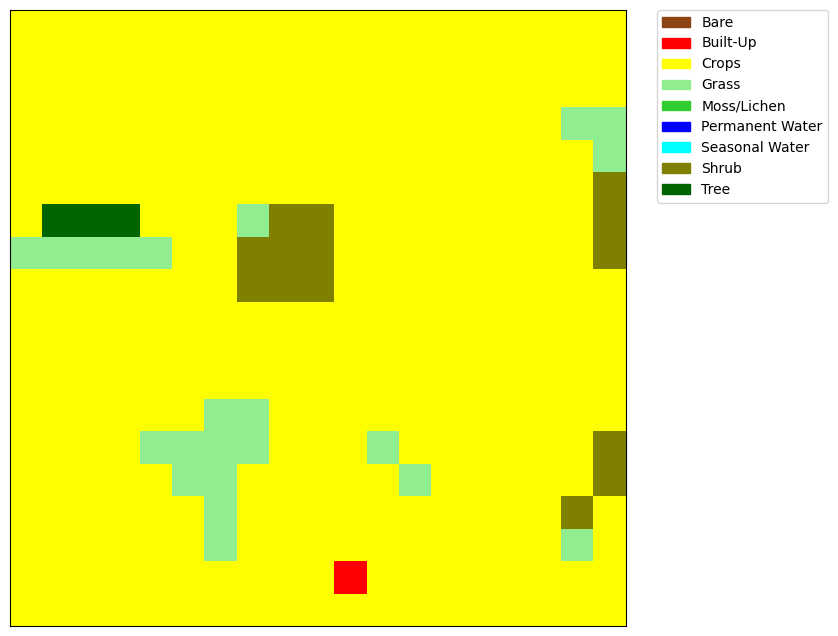

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


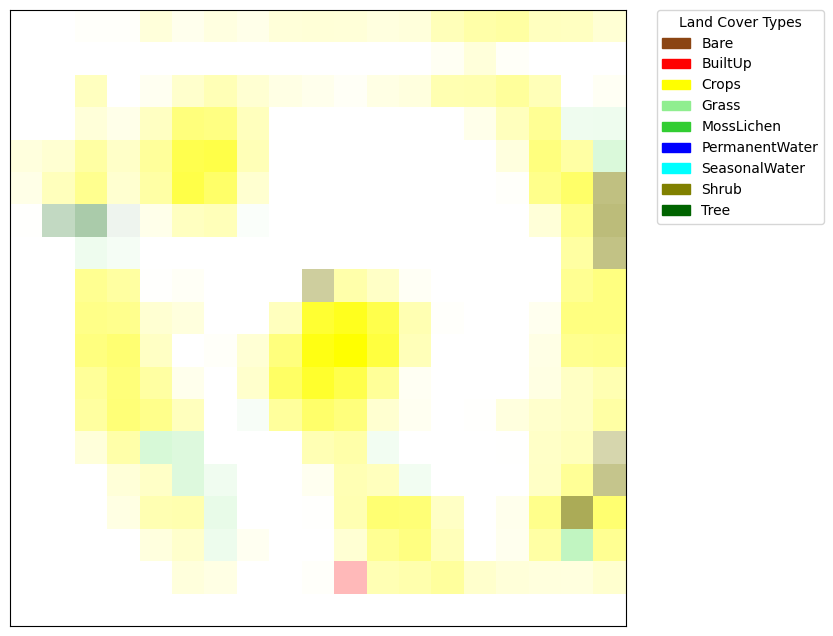

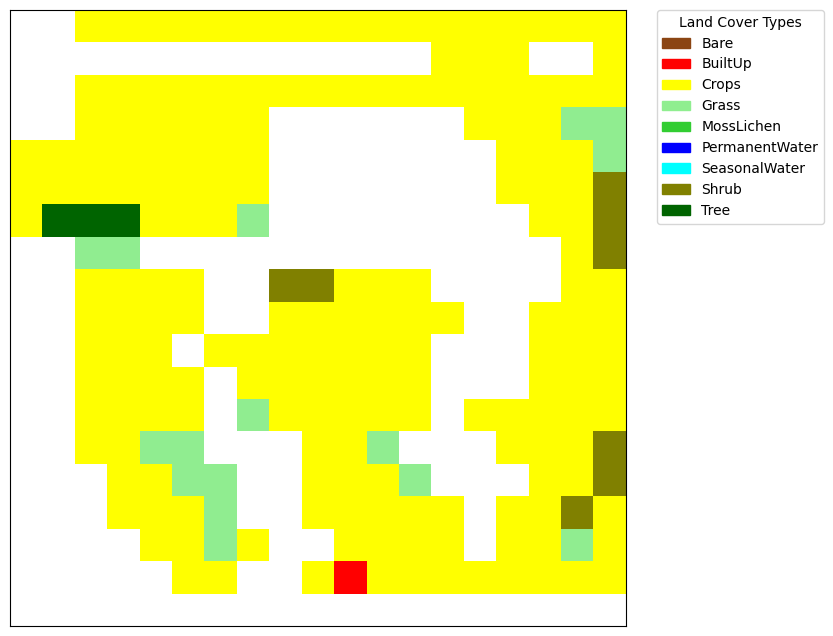

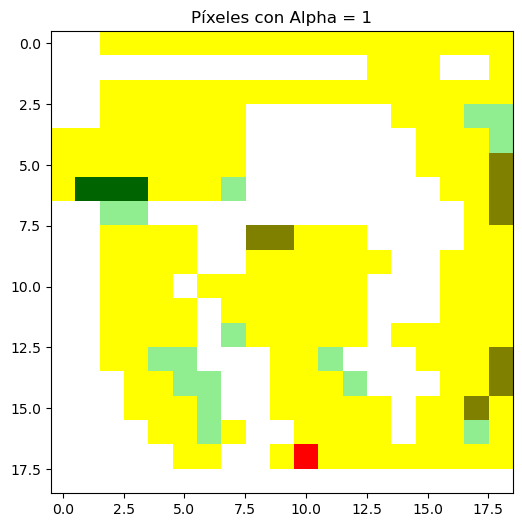

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.021385
3     0   3              1        0.022723
4     0   4              1        0.146336
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    16
1     1   0      Crops    16
2     2   0      Crops    16
3     3   0      Crops    16
4     4   0      Crops    16
..   ..  ..        ...   ...
356  14  18      Crops    16
357  15  18      Crops    16
358  16  18      Crops    16
359  17  18      Crops    16
360  18  18      Crops    16

[361 rows x 4 columns]
17


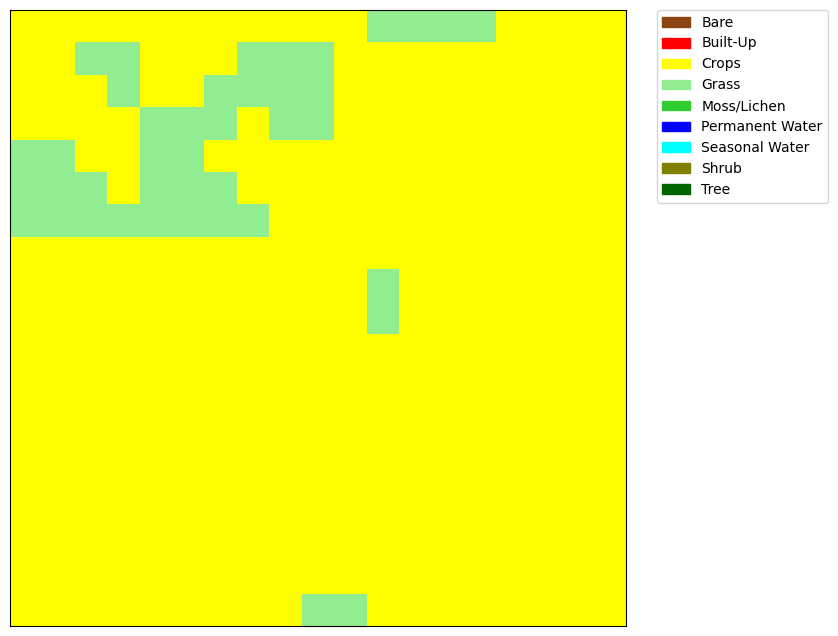

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


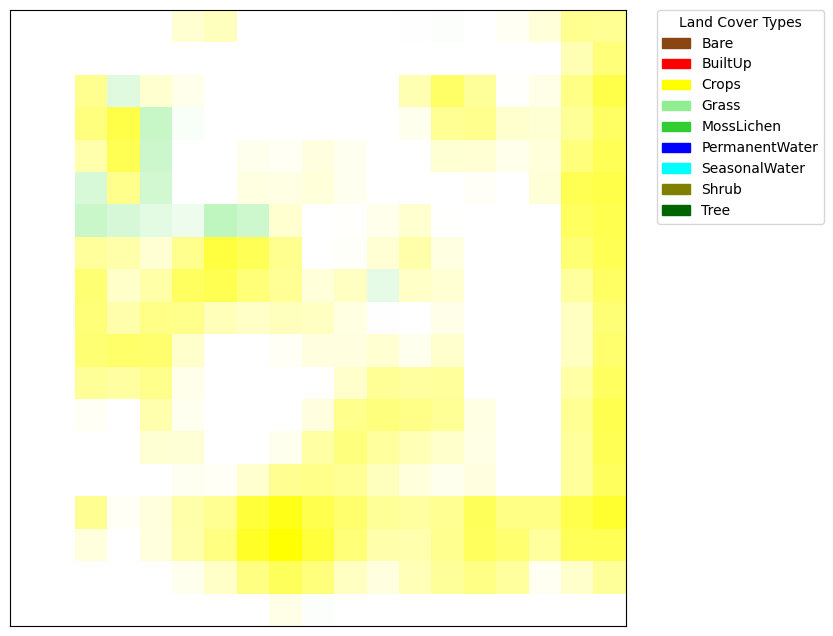

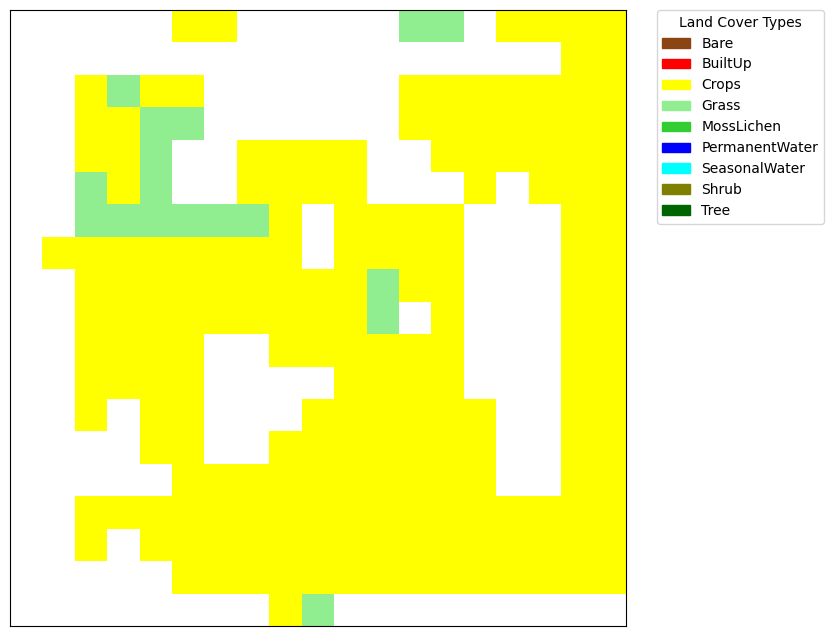

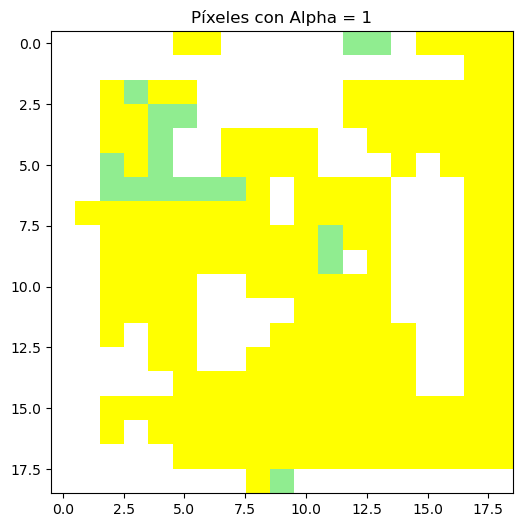

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    17
1     1   0      Crops    17
2     2   0      Crops    17
3     3   0      Crops    17
4     4   0      Crops    17
..   ..  ..        ...   ...
356  14  18      Crops    17
357  15  18      Crops    17
358  16  18      Crops    17
359  17  18      Crops    17
360  18  18      Crops    17

[361 rows x 4 columns]
18


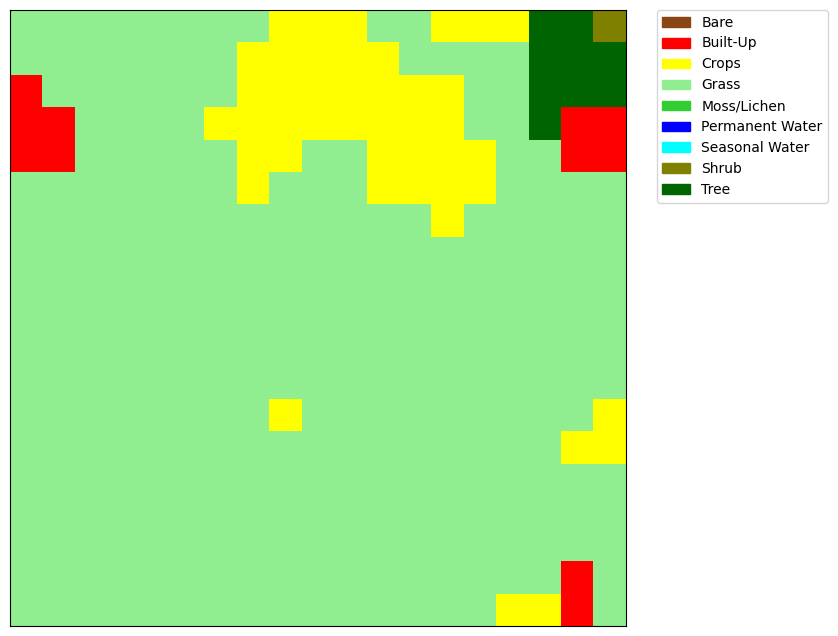

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


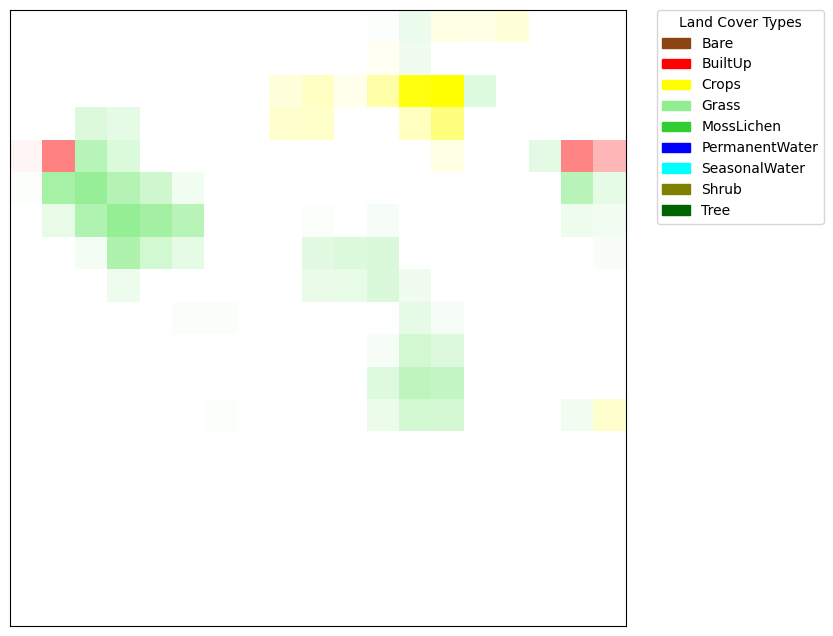

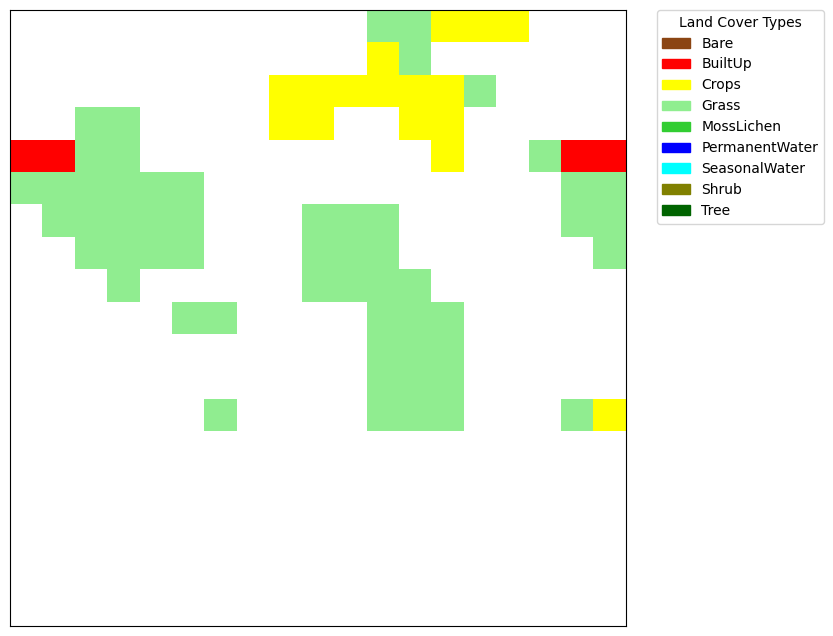

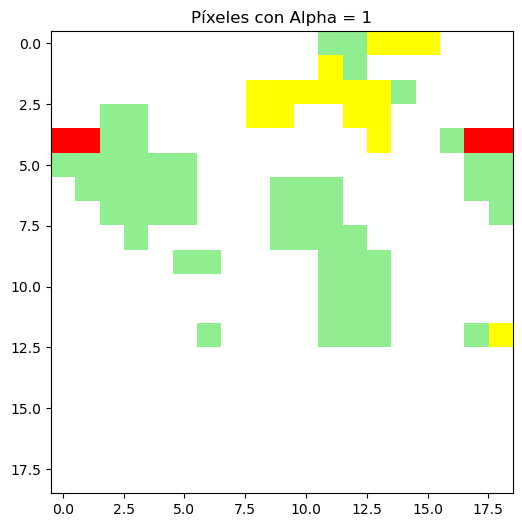

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    18
1     1   0      Grass    18
2     2   0      Grass    18
3     3   0      Grass    18
4     4   0      Grass    18
..   ..  ..        ...   ...
356  14  18      Grass    18
357  15  18      Crops    18
358  16  18      Crops    18
359  17  18   Built-Up    18
360  18  18      Grass    18

[361 rows x 4 columns]
19


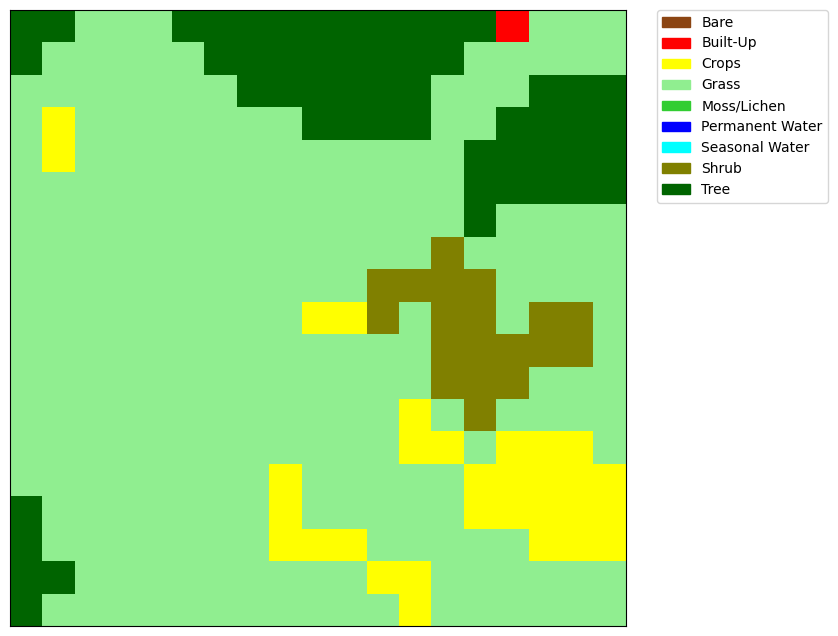

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


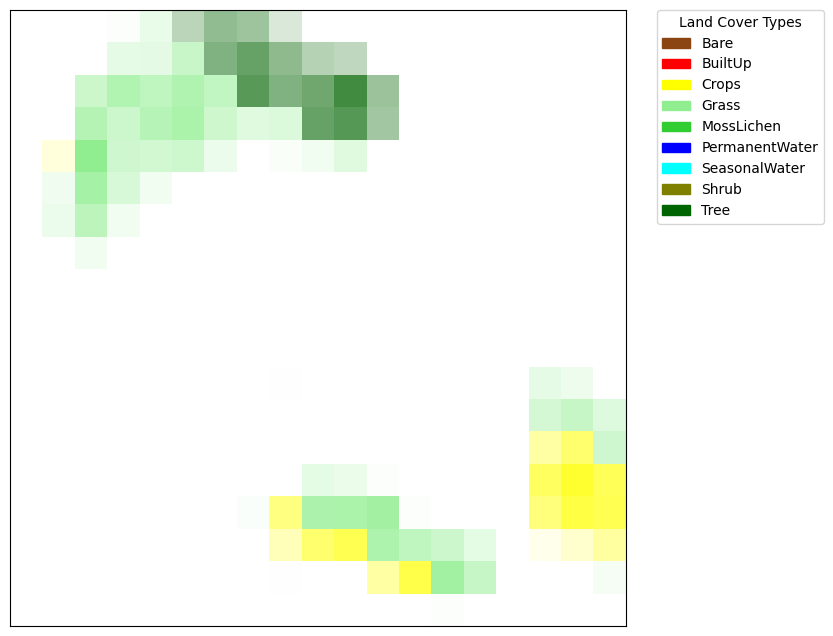

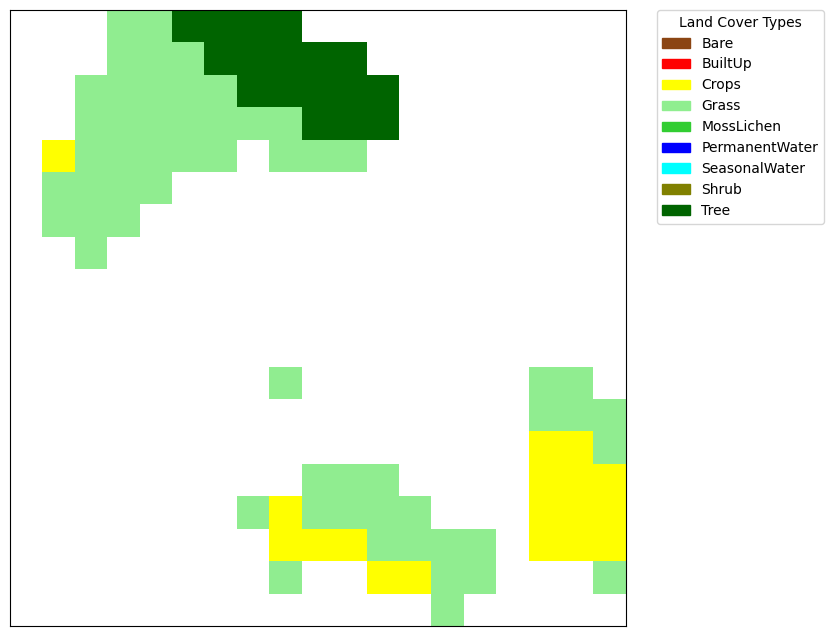

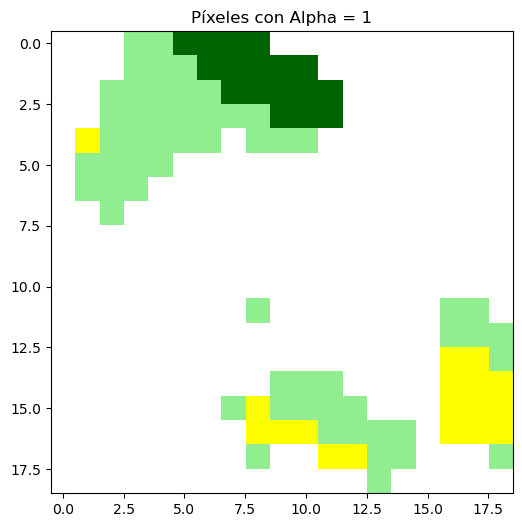

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.035071
4     0   4              1        0.193658
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    19
1     1   0       Tree    19
2     2   0      Grass    19
3     3   0      Grass    19
4     4   0      Grass    19
..   ..  ..        ...   ...
356  14  18      Grass    19
357  15  18      Grass    19
358  16  18      Grass    19
359  17  18      Grass    19
360  18  18      Grass    19

[361 rows x 4 columns]
20


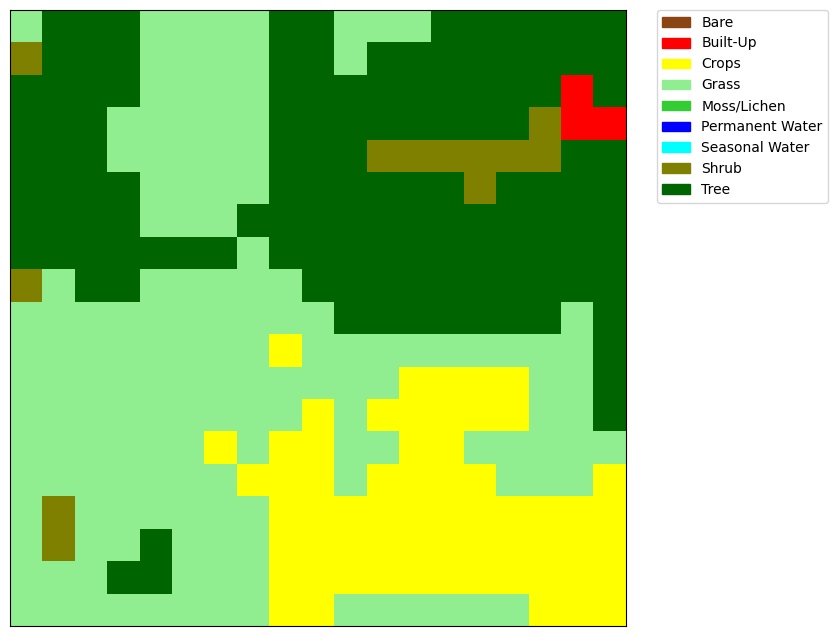

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


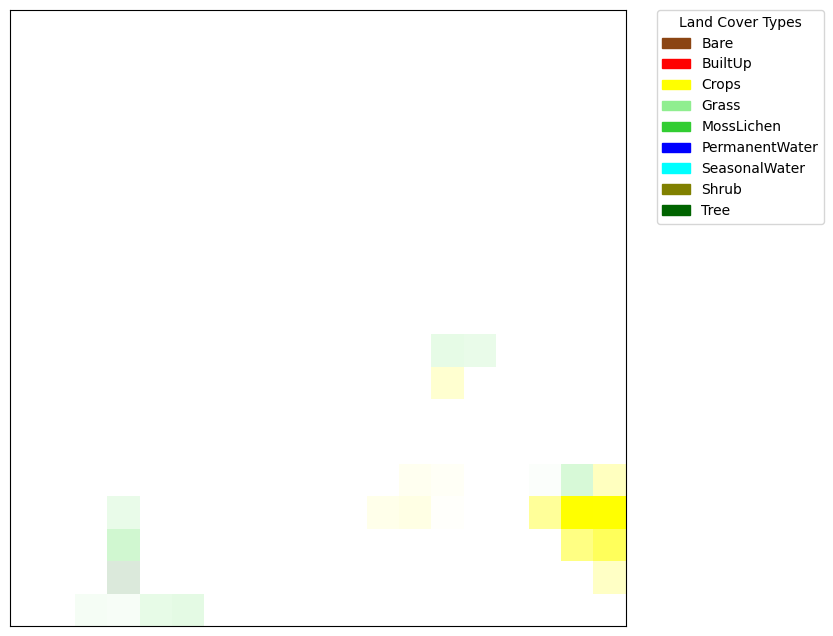

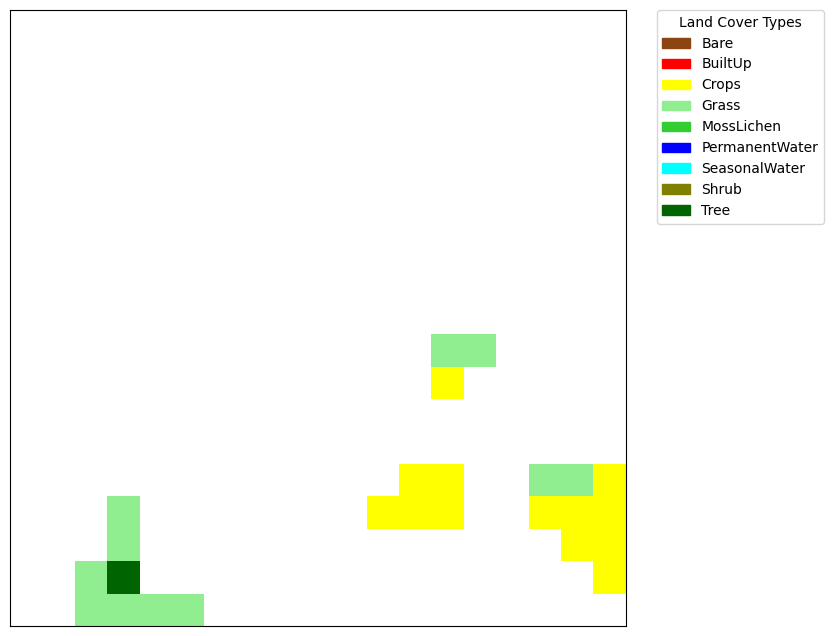

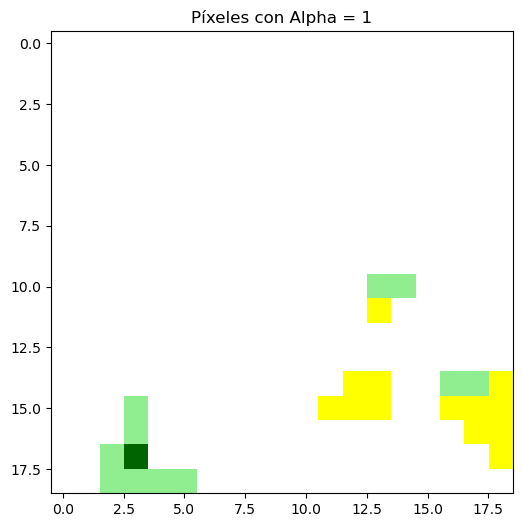

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    20
1     1   0       Tree    20
2     2   0       Tree    20
3     3   0       Tree    20
4     4   0      Grass    20
..   ..  ..        ...   ...
356  14  18      Grass    20
357  15  18      Grass    20
358  16  18      Crops    20
359  17  18      Crops    20
360  18  18      Crops    20

[361 rows x 4 columns]
21


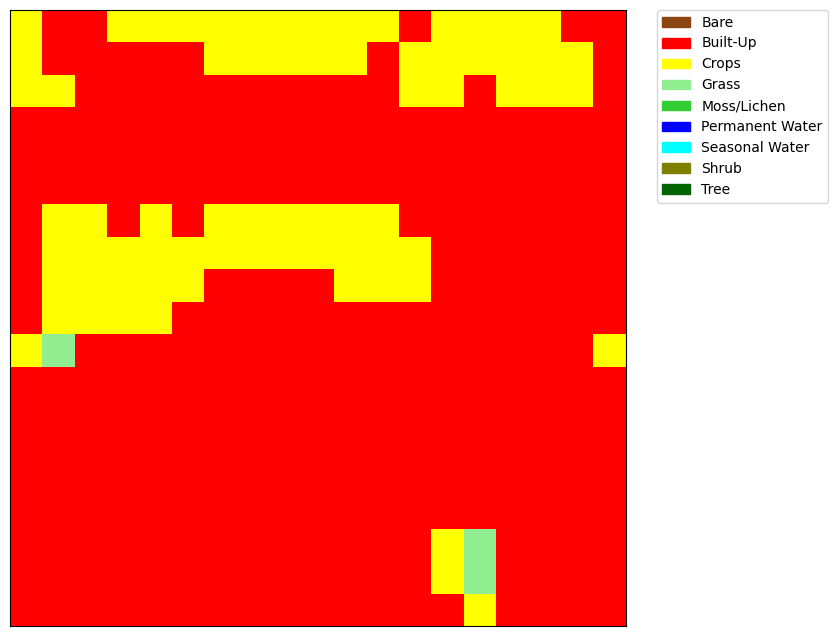

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


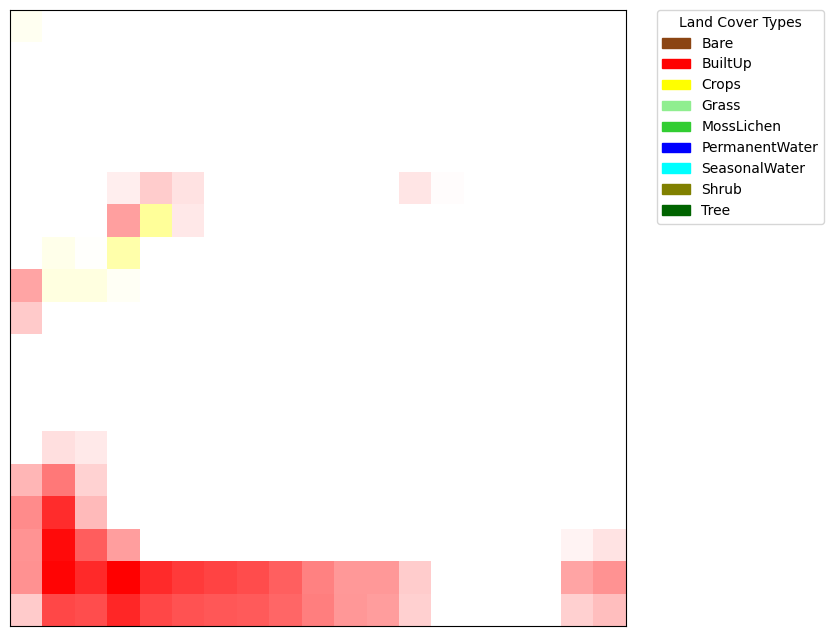

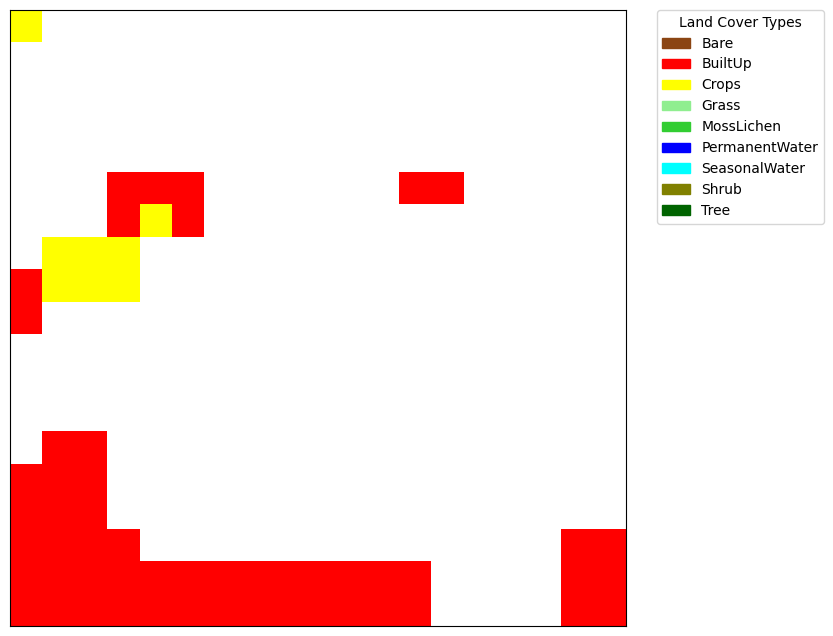

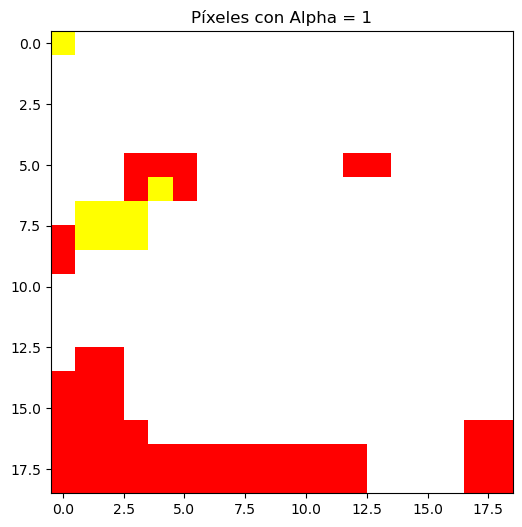

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.056423
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              5        0.186894
360  18  18              5        0.258552

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    21
1     1   0   Built-Up    21
2     2   0   Built-Up    21
3     3   0      Crops    21
4     4   0      Crops    21
..   ..  ..        ...   ...
356  14  18      Crops    21
357  15  18   Built-Up    21
358  16  18   Built-Up    21
359  17  18   Built-Up    21
360  18  18   Built-Up    21

[361 rows x 4 columns]
22


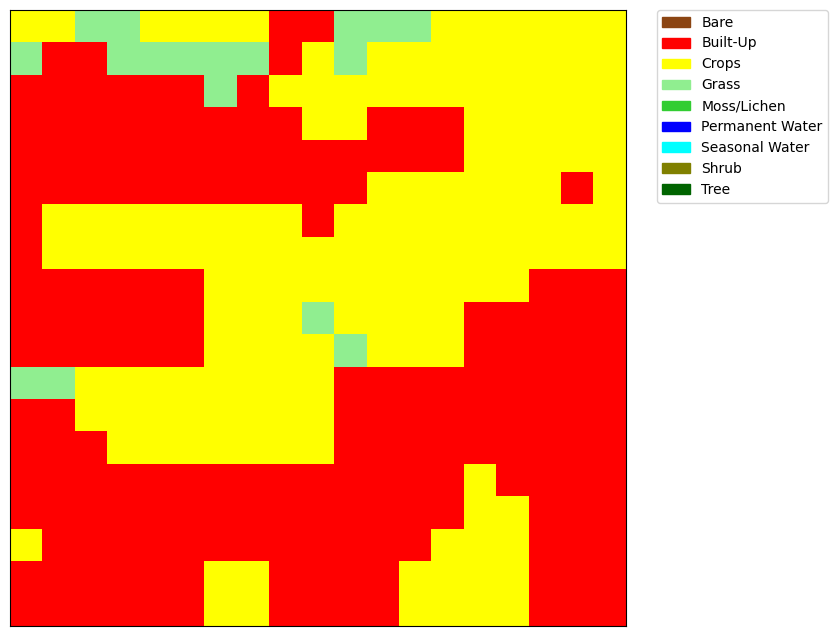

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


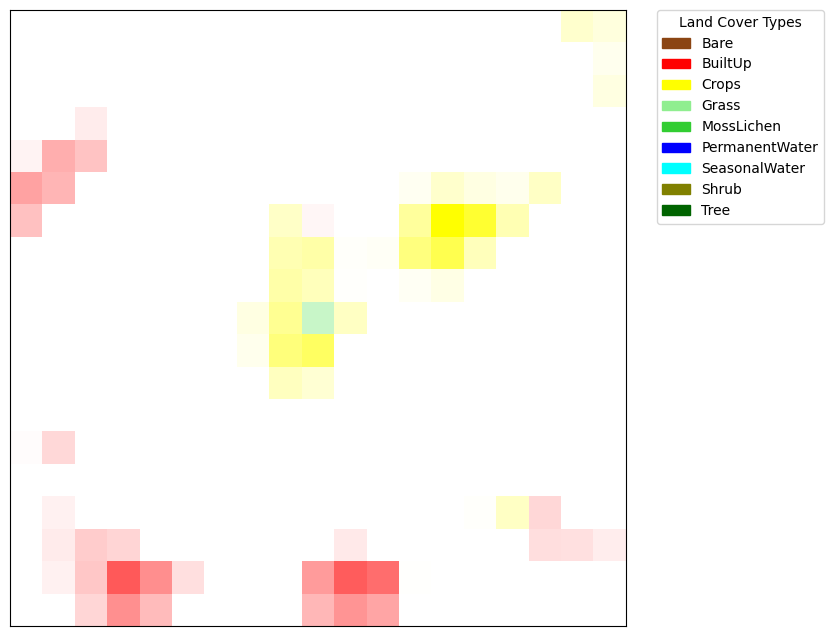

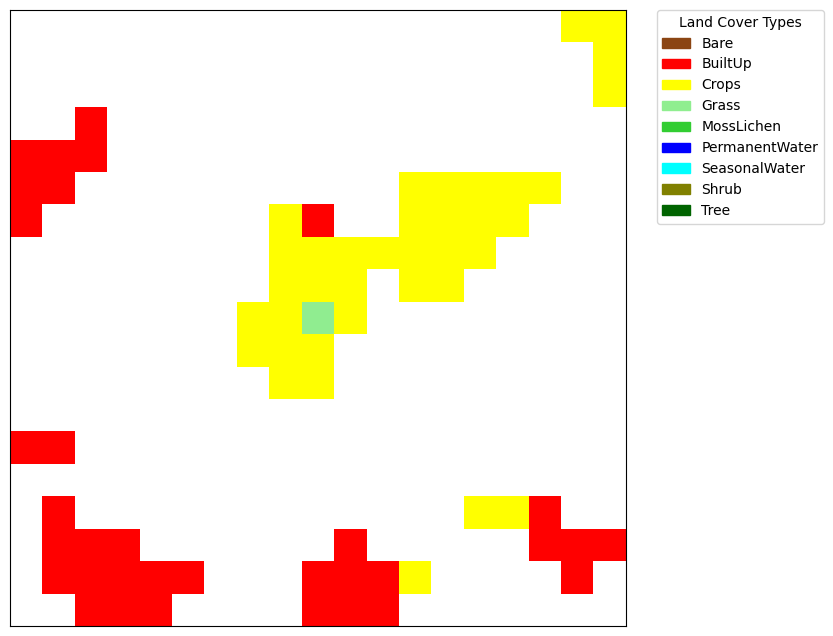

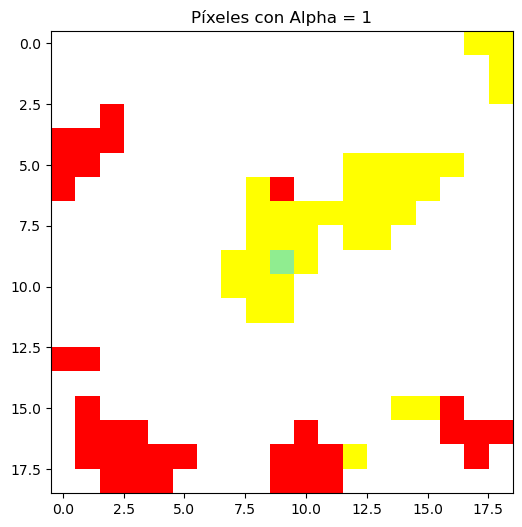

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    22
1     1   0      Crops    22
2     2   0      Grass    22
3     3   0      Grass    22
4     4   0      Crops    22
..   ..  ..        ...   ...
356  14  18      Crops    22
357  15  18      Crops    22
358  16  18   Built-Up    22
359  17  18   Built-Up    22
360  18  18   Built-Up    22

[361 rows x 4 columns]
23


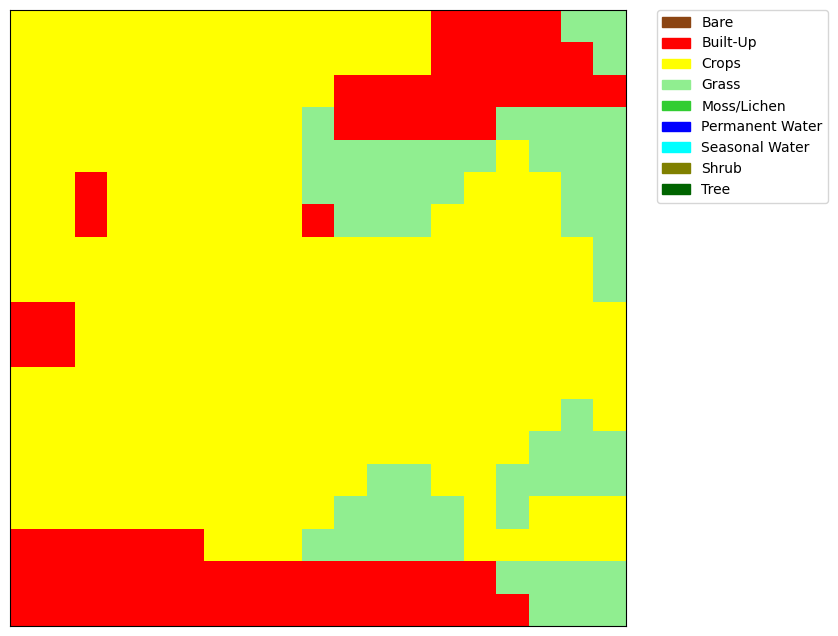

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


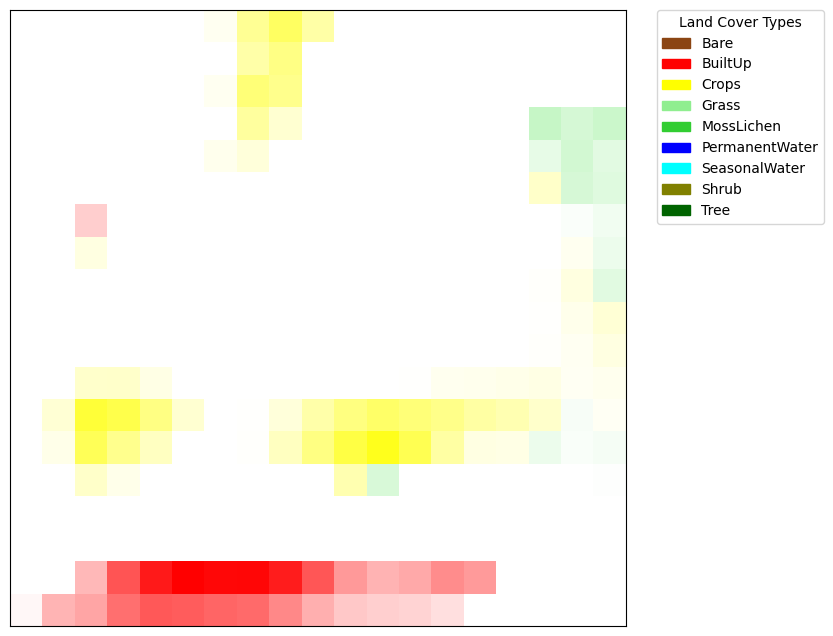

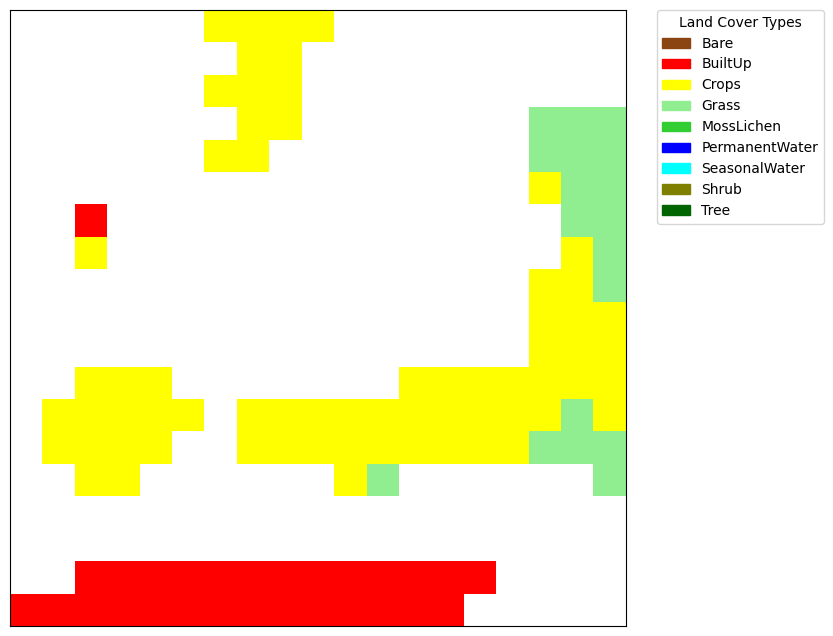

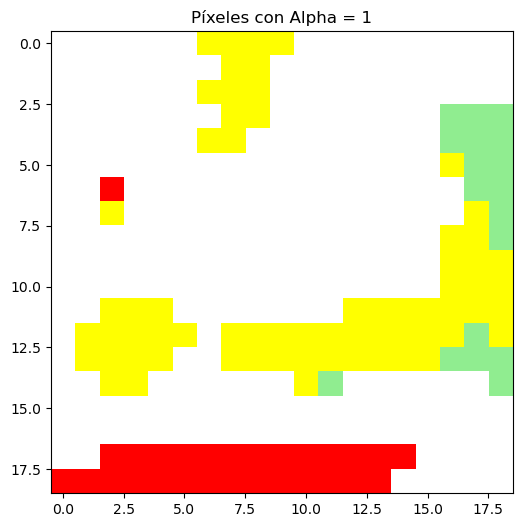

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    23
1     1   0      Crops    23
2     2   0      Crops    23
3     3   0      Crops    23
4     4   0      Crops    23
..   ..  ..        ...   ...
356  14  18   Built-Up    23
357  15  18   Built-Up    23
358  16  18      Grass    23
359  17  18      Grass    23
360  18  18      Grass    23

[361 rows x 4 columns]
24


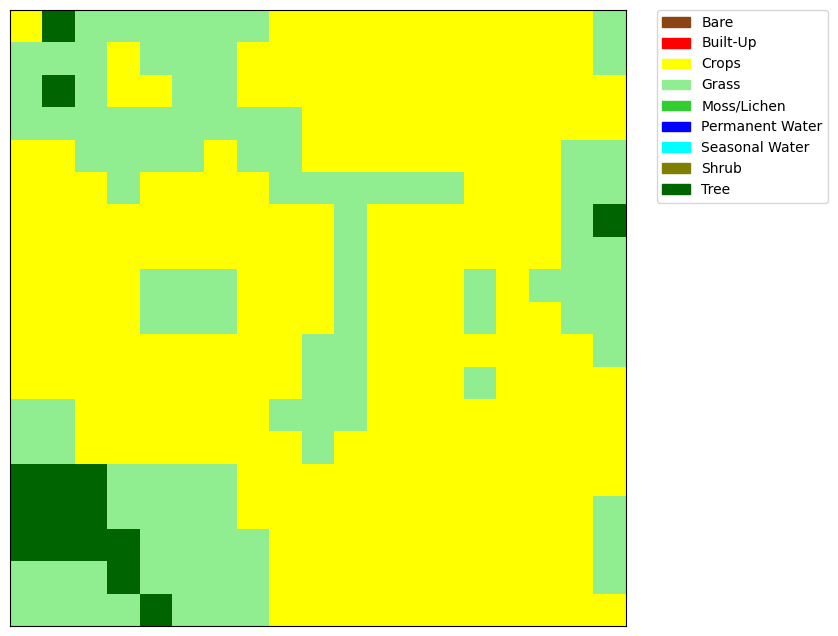

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


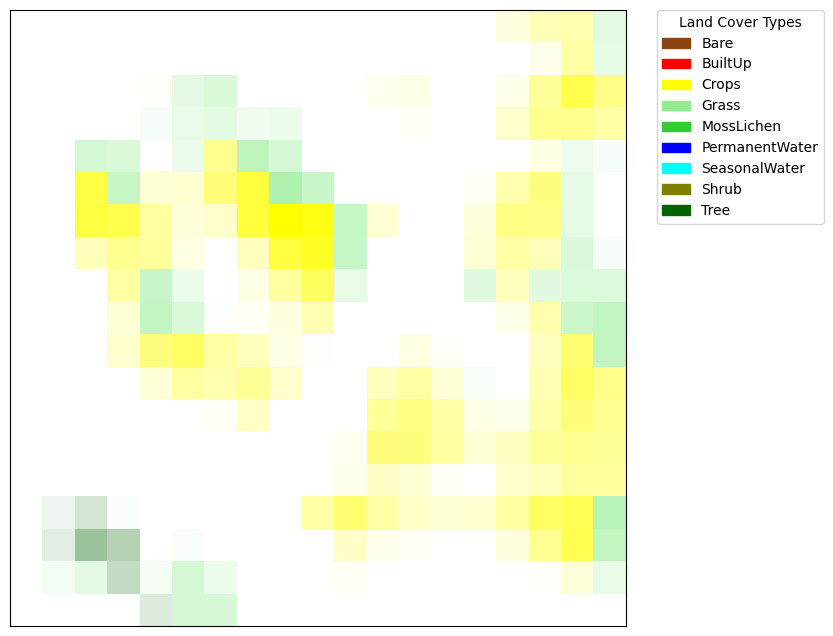

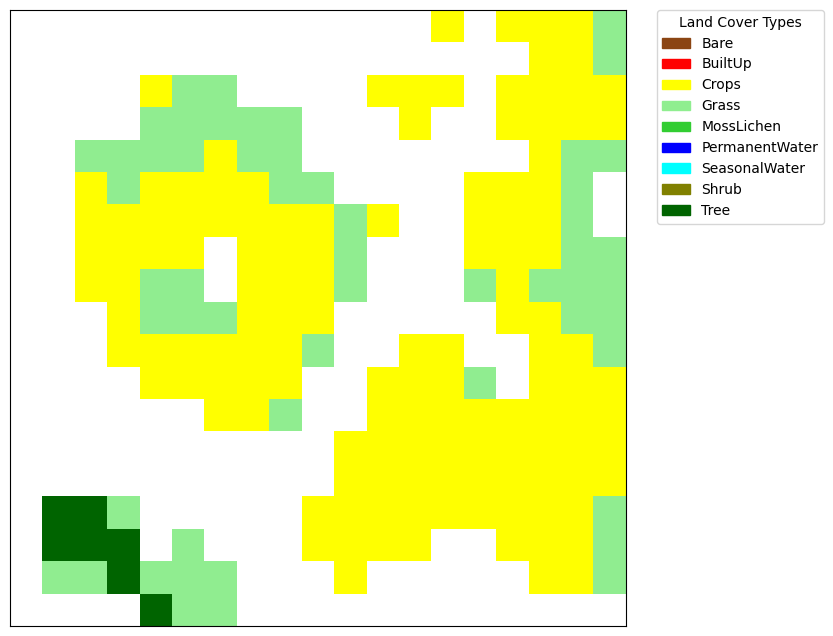

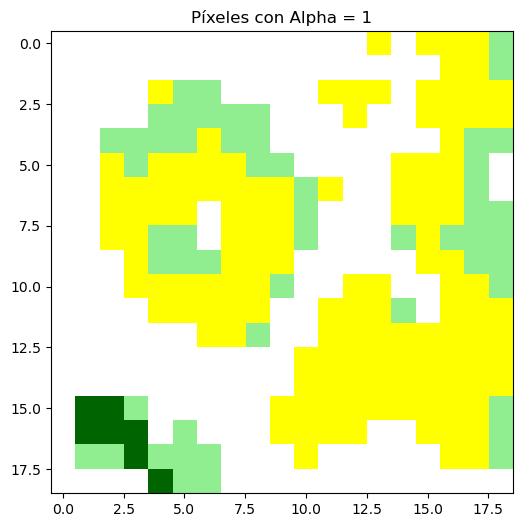

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    24
1     1   0       Tree    24
2     2   0      Grass    24
3     3   0      Grass    24
4     4   0      Grass    24
..   ..  ..        ...   ...
356  14  18      Crops    24
357  15  18      Crops    24
358  16  18      Crops    24
359  17  18      Crops    24
360  18  18      Crops    24

[361 rows x 4 columns]
25


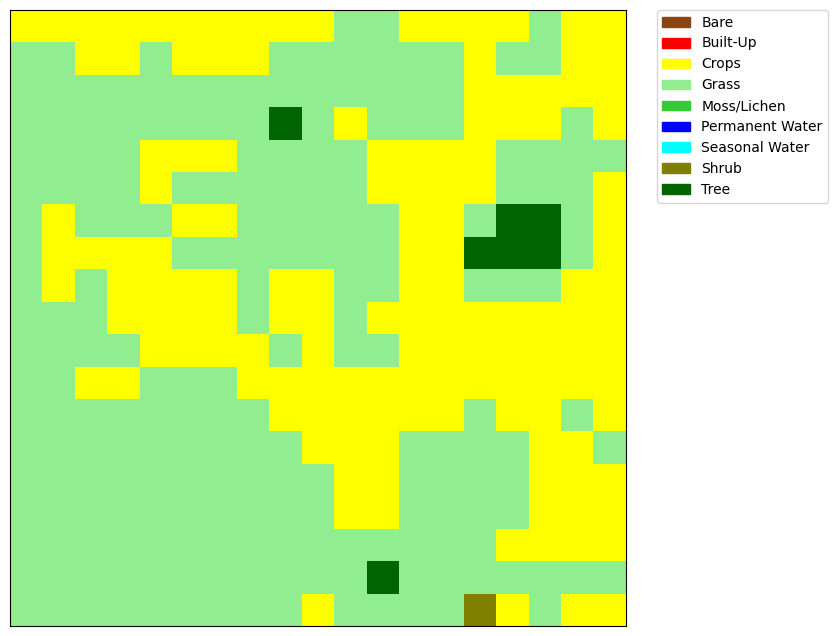

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


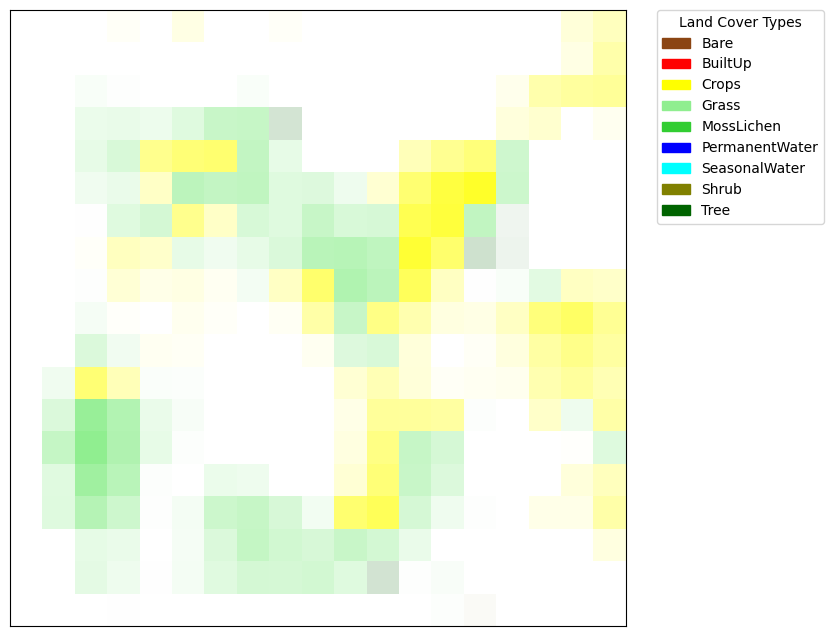

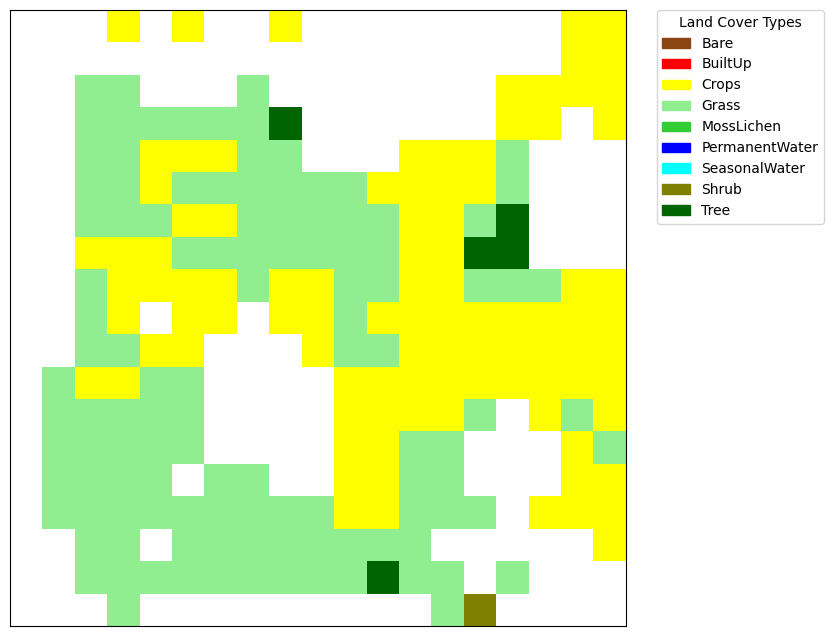

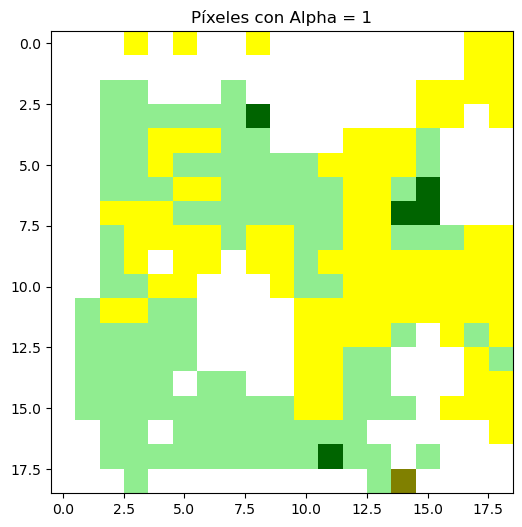

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.032378
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              4        0.036568
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    25
1     1   0      Crops    25
2     2   0      Crops    25
3     3   0      Crops    25
4     4   0      Crops    25
..   ..  ..        ...   ...
356  14  18      Shrub    25
357  15  18      Crops    25
358  16  18      Grass    25
359  17  18      Crops    25
360  18  18      Crops    25

[361 rows x 4 columns]
26


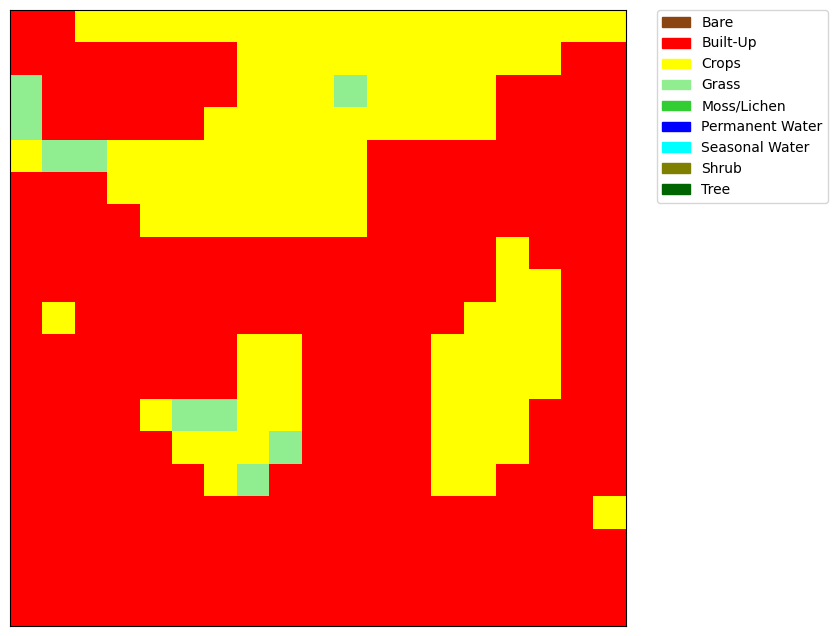

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


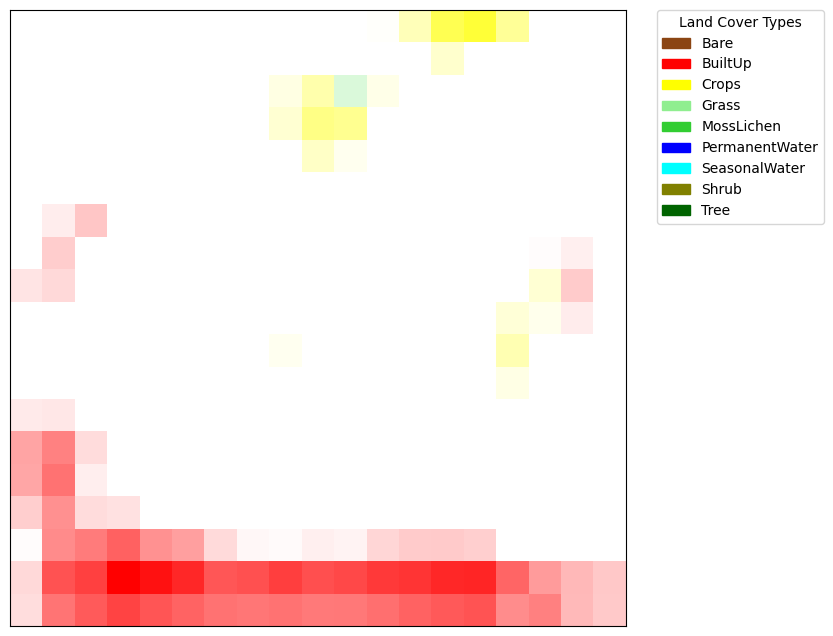

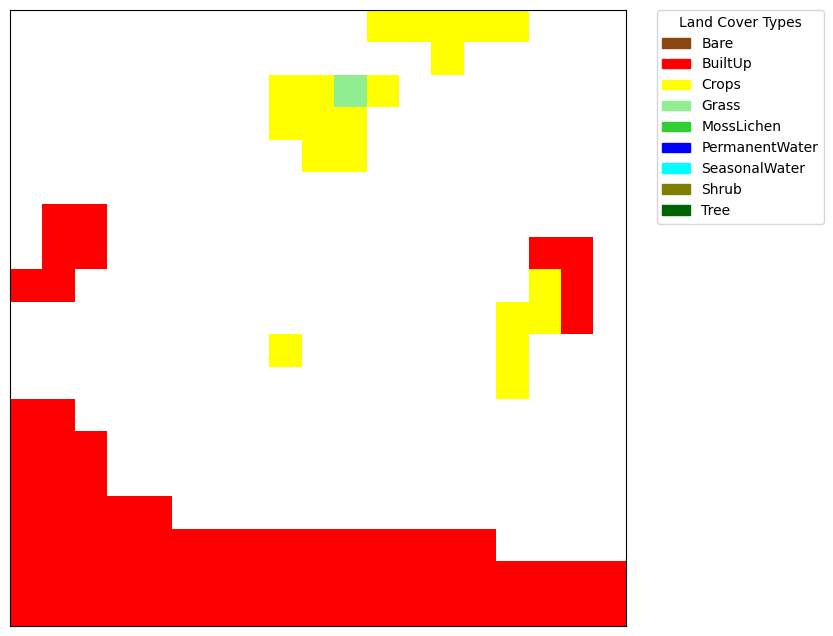

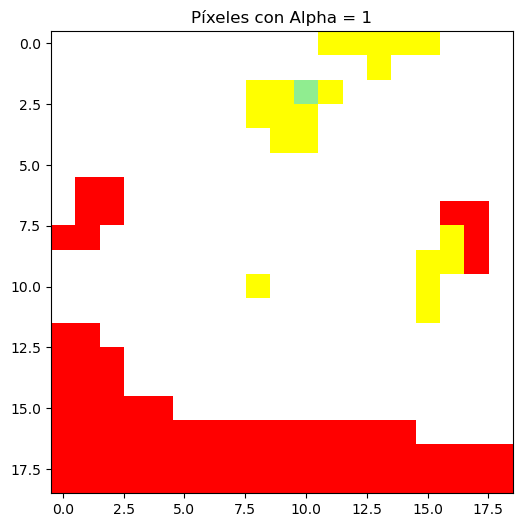

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              6        0.676977
357  18  15              6        0.451323
358  18  16              6        0.499906
359  18  17              6        0.277396
360  18  18              6        0.214236

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    26
1     1   0   Built-Up    26
2     2   0      Crops    26
3     3   0      Crops    26
4     4   0      Crops    26
..   ..  ..        ...   ...
356  14  18   Built-Up    26
357  15  18   Built-Up    26
358  16  18   Built-Up    26
359  17  18   Built-Up    26
360  18  18   Built-Up    26

[361 rows x 4 columns]
27


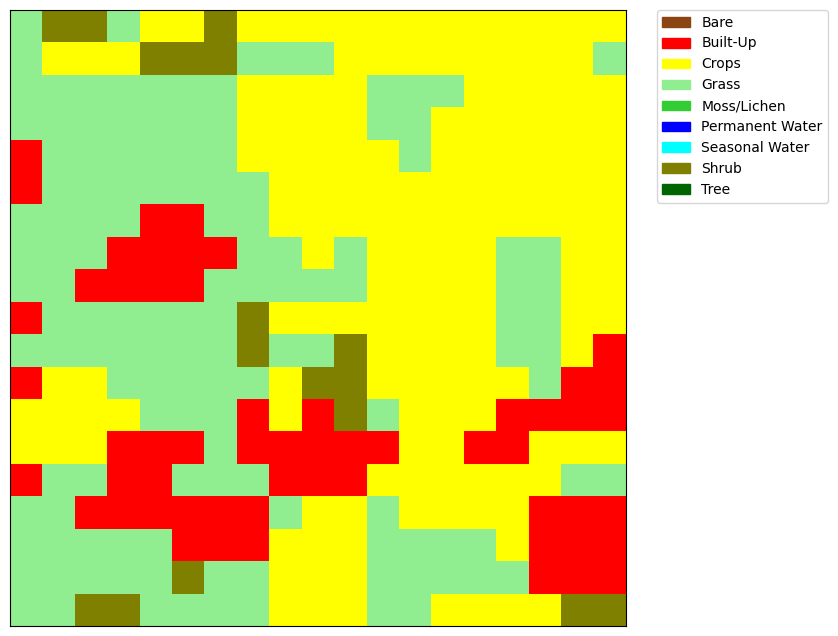

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


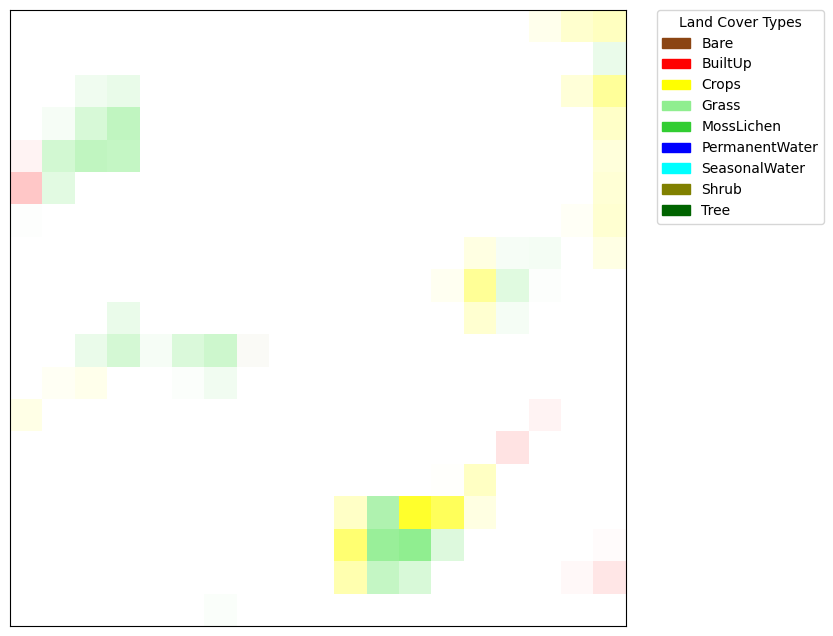

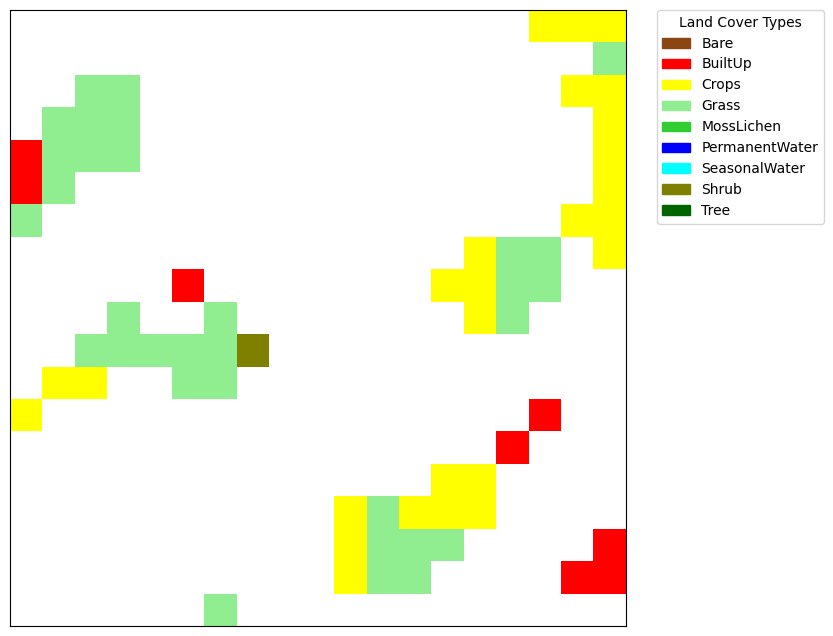

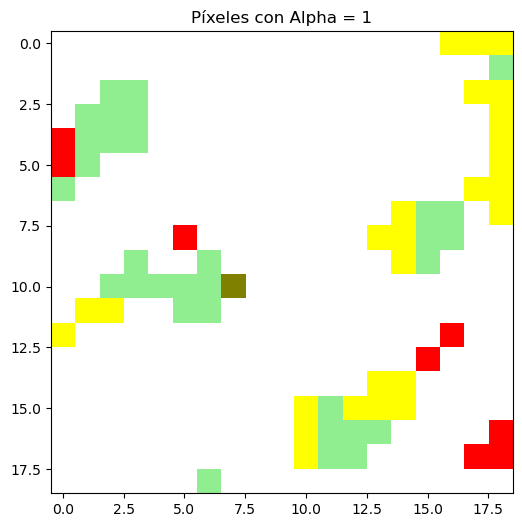

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    27
1     1   0      Shrub    27
2     2   0      Shrub    27
3     3   0      Grass    27
4     4   0      Crops    27
..   ..  ..        ...   ...
356  14  18      Crops    27
357  15  18      Crops    27
358  16  18      Crops    27
359  17  18      Shrub    27
360  18  18      Shrub    27

[361 rows x 4 columns]
28


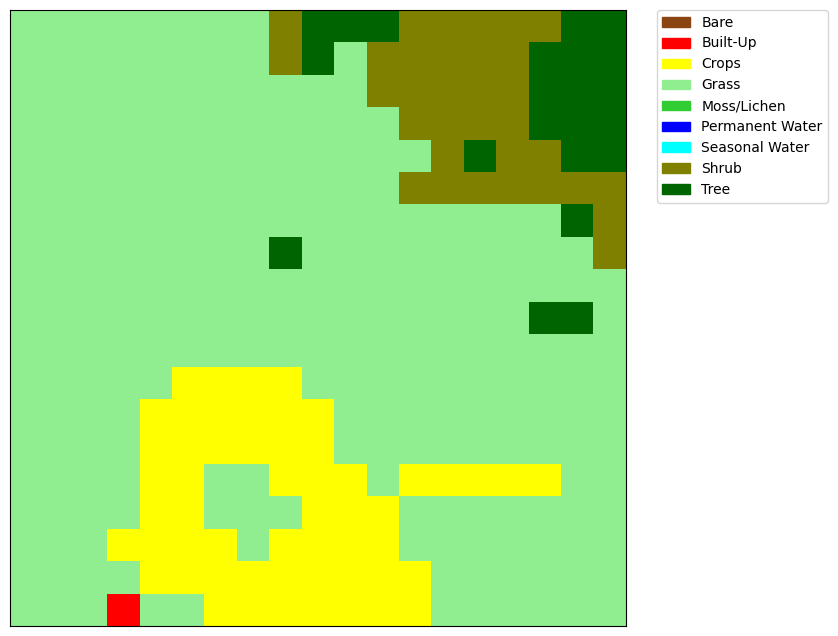

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


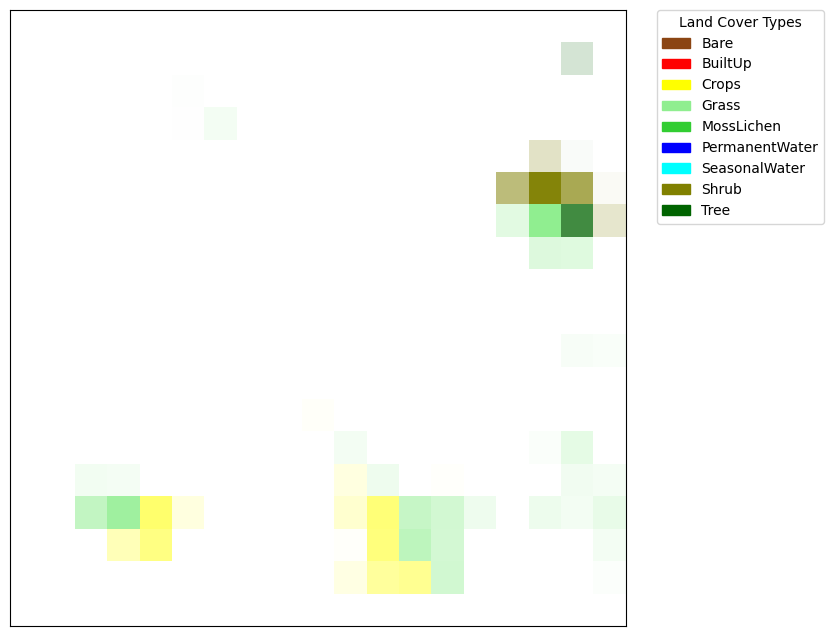

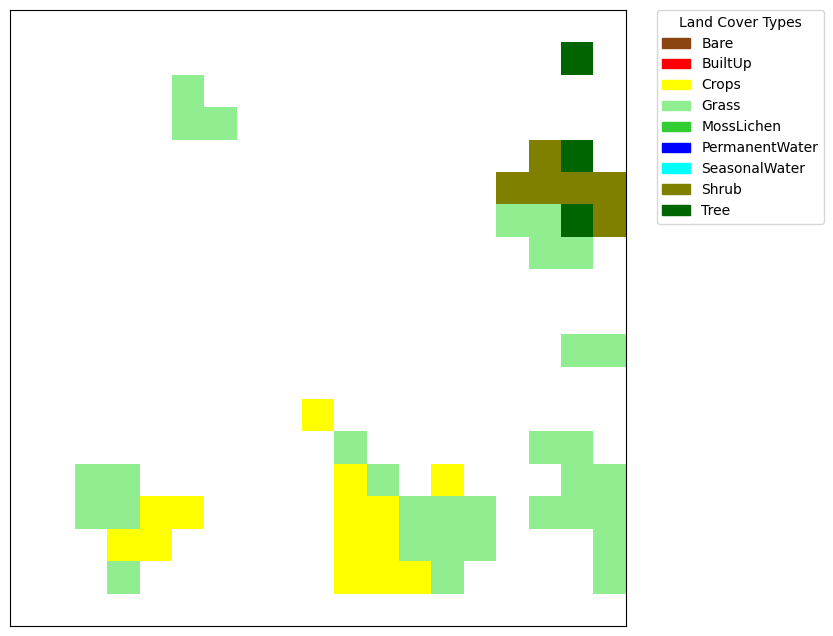

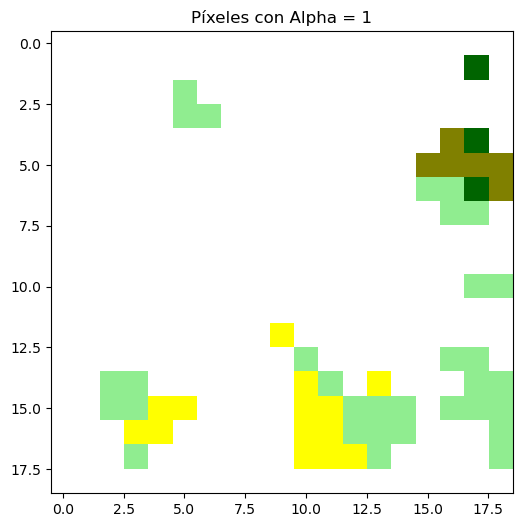

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    28
1     1   0      Grass    28
2     2   0      Grass    28
3     3   0      Grass    28
4     4   0      Grass    28
..   ..  ..        ...   ...
356  14  18      Grass    28
357  15  18      Grass    28
358  16  18      Grass    28
359  17  18      Grass    28
360  18  18      Grass    28

[361 rows x 4 columns]
29


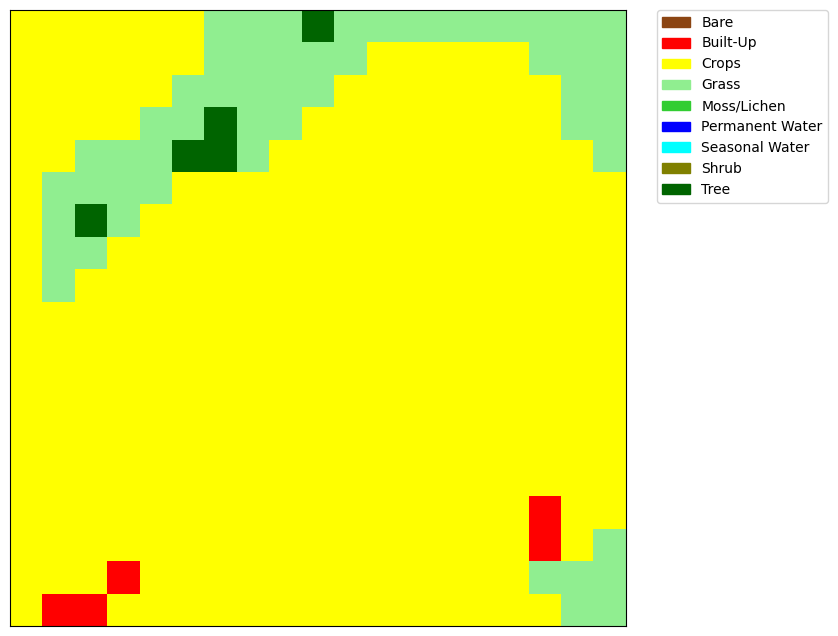

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


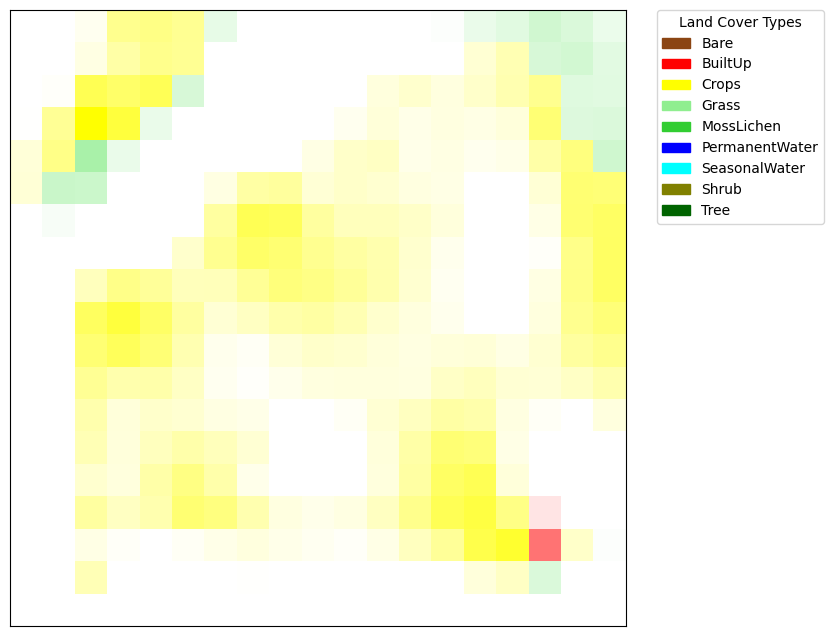

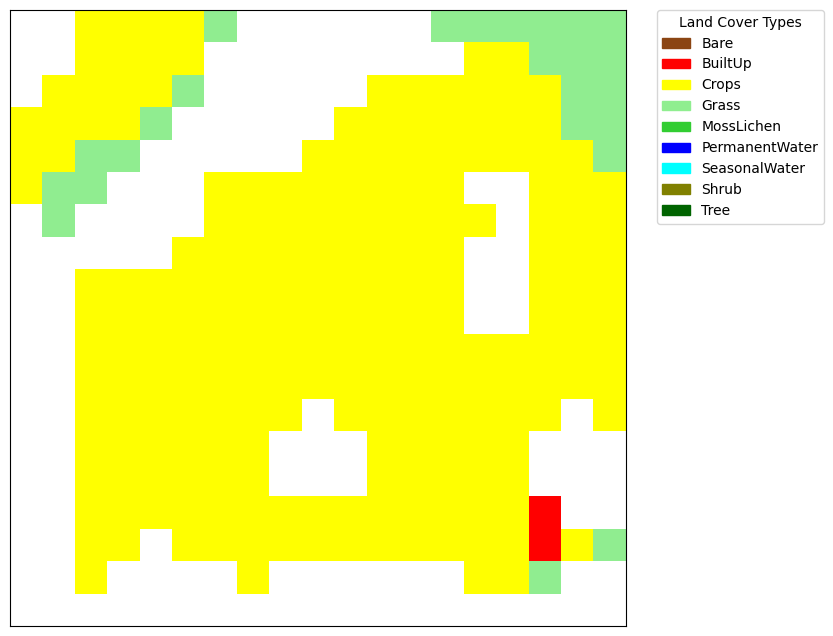

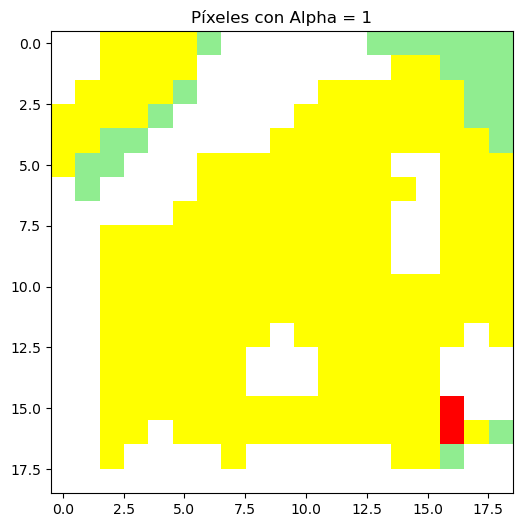

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.061122
3     0   3              1        0.443873
4     0   4              1        0.482073
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    29
1     1   0      Crops    29
2     2   0      Crops    29
3     3   0      Crops    29
4     4   0      Crops    29
..   ..  ..        ...   ...
356  14  18      Crops    29
357  15  18      Crops    29
358  16  18      Crops    29
359  17  18      Grass    29
360  18  18      Grass    29

[361 rows x 4 columns]
30


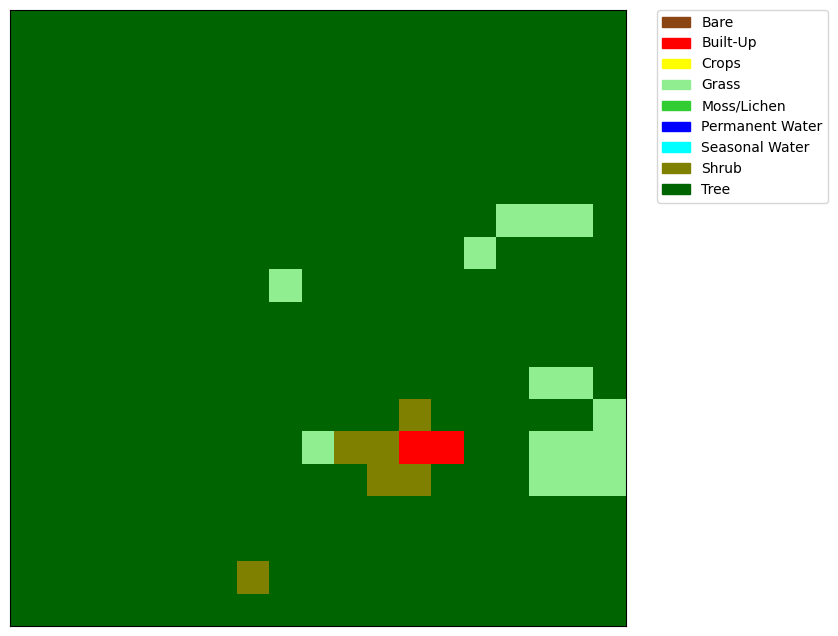

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


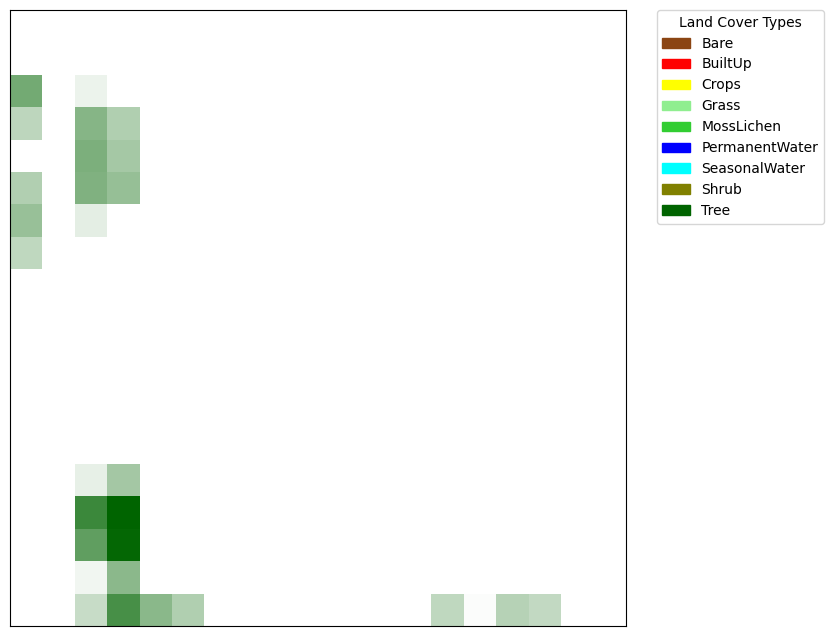

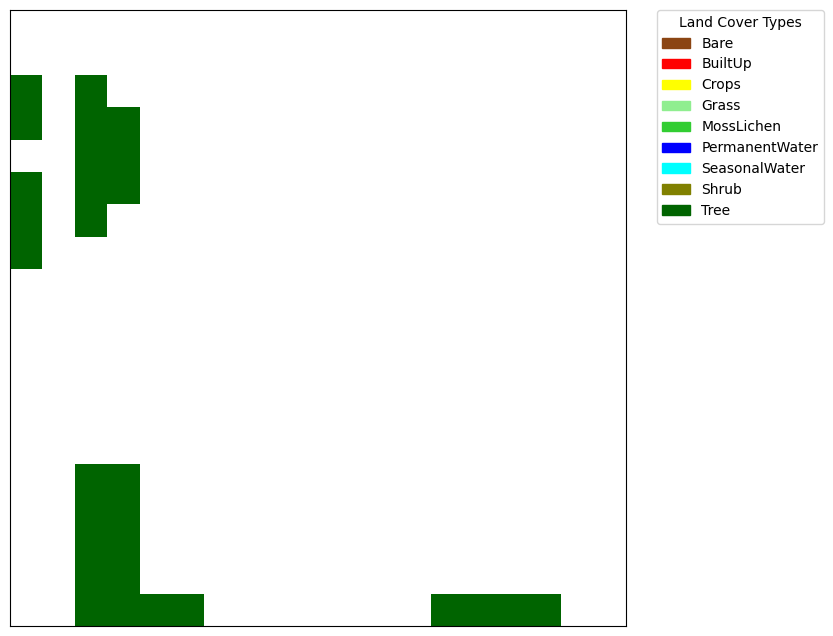

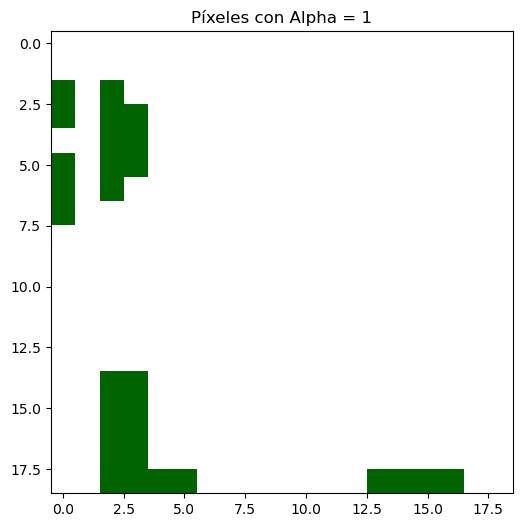

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              5        0.015973
357  18  15              5        0.286401
358  18  16              5        0.242561
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    30
1     1   0       Tree    30
2     2   0       Tree    30
3     3   0       Tree    30
4     4   0       Tree    30
..   ..  ..        ...   ...
356  14  18       Tree    30
357  15  18       Tree    30
358  16  18       Tree    30
359  17  18       Tree    30
360  18  18       Tree    30

[361 rows x 4 columns]
31


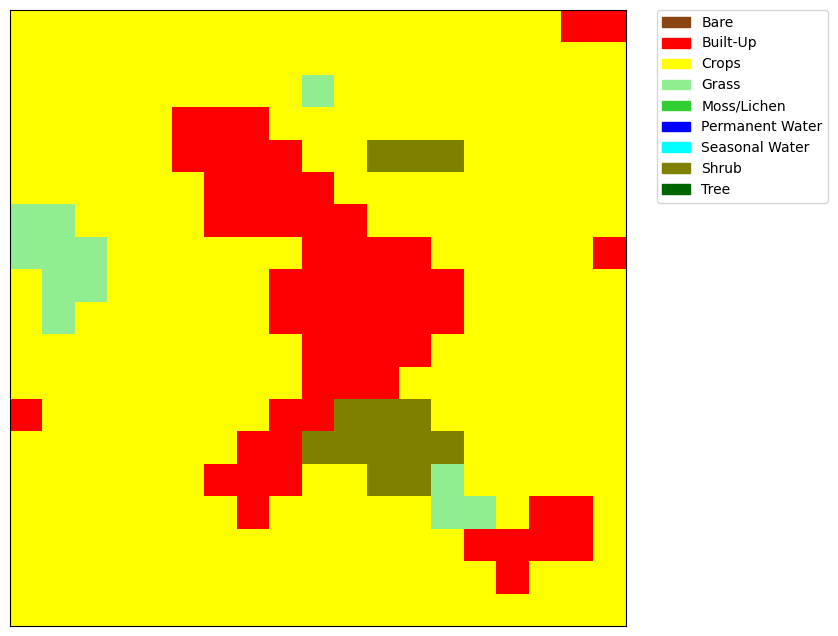

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


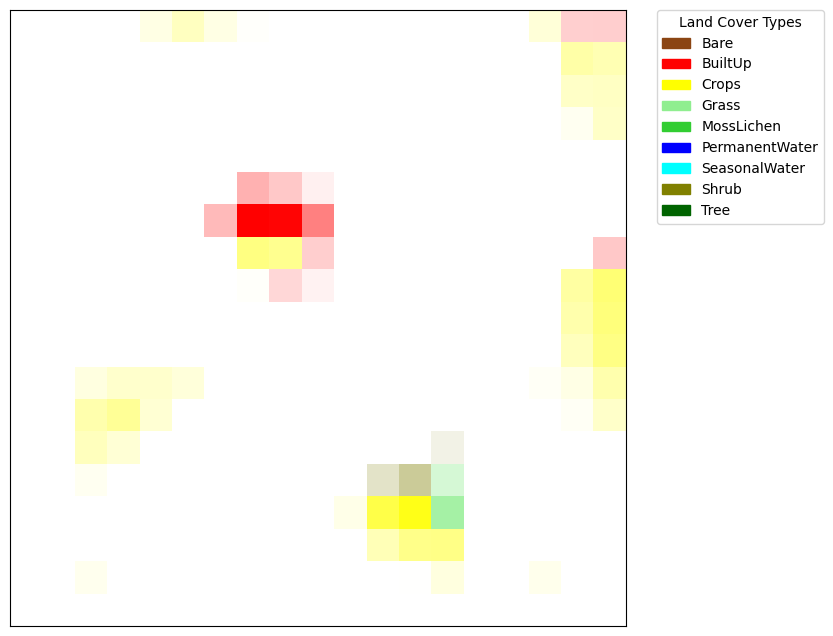

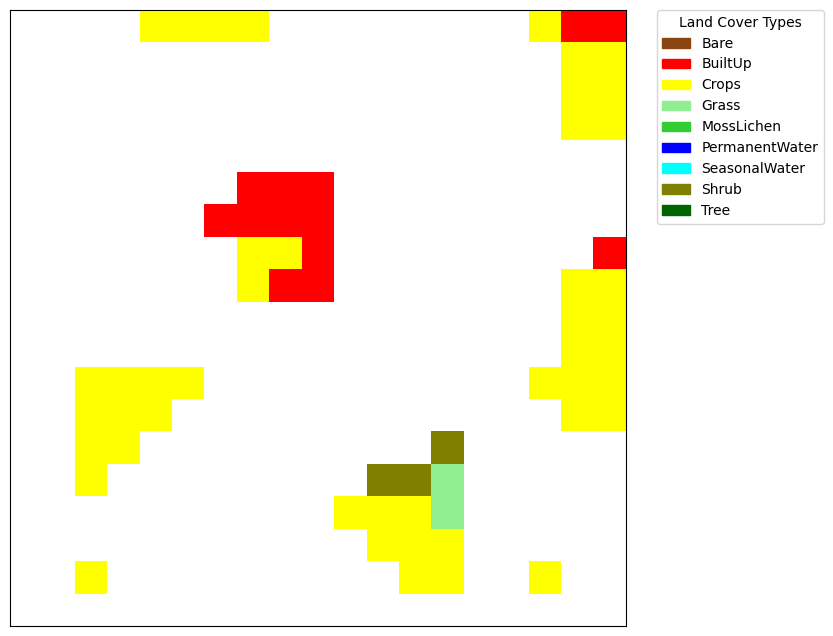

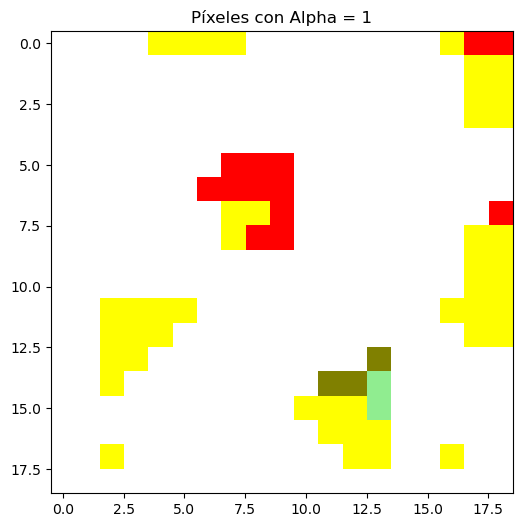

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              1        0.106258
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    31
1     1   0      Crops    31
2     2   0      Crops    31
3     3   0      Crops    31
4     4   0      Crops    31
..   ..  ..        ...   ...
356  14  18      Crops    31
357  15  18      Crops    31
358  16  18      Crops    31
359  17  18      Crops    31
360  18  18      Crops    31

[361 rows x 4 columns]
32


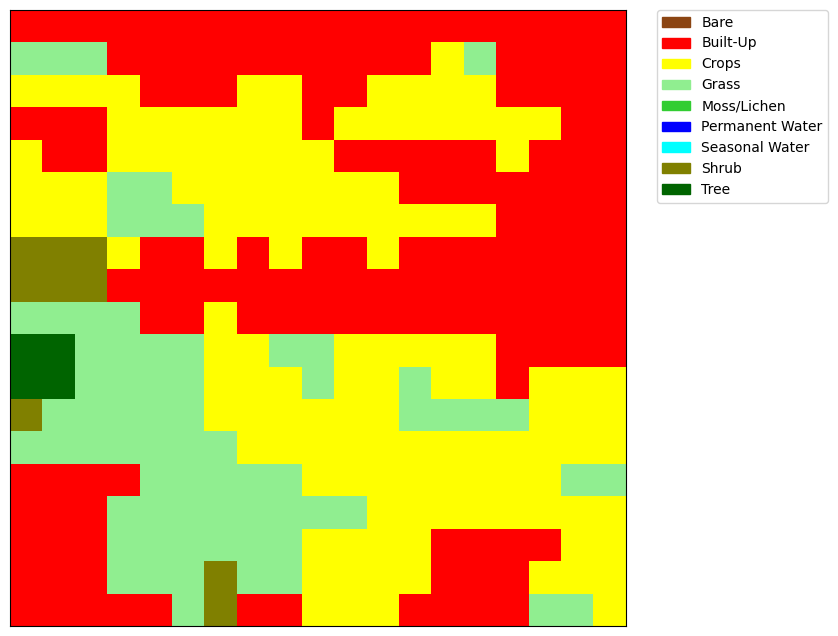

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


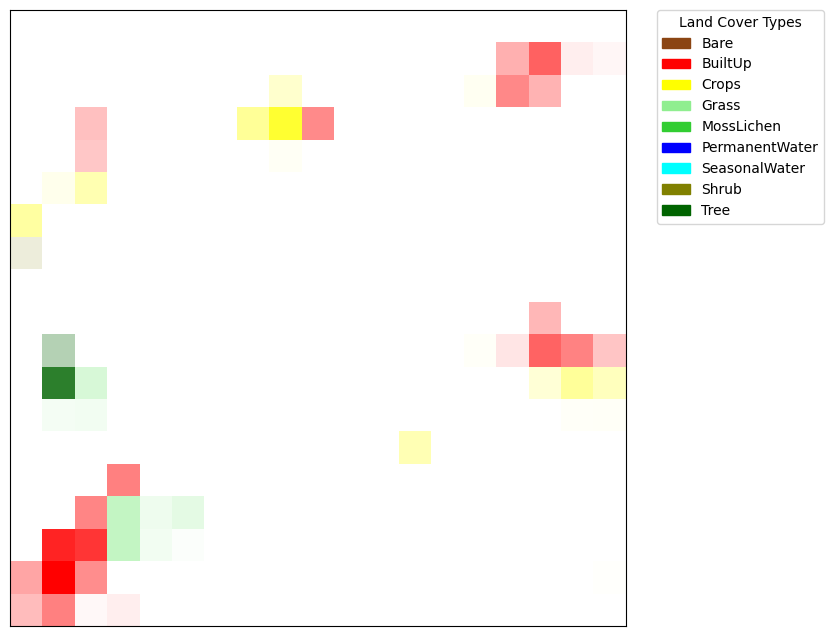

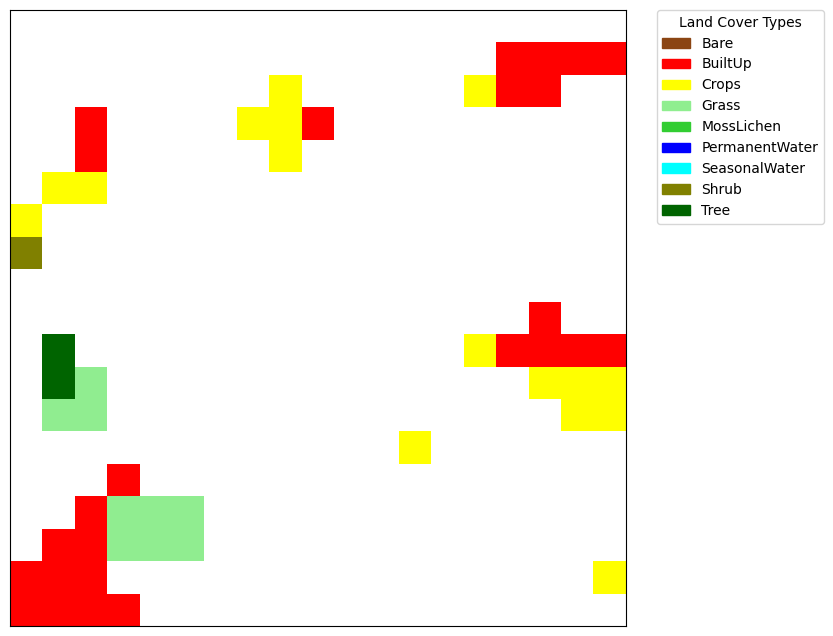

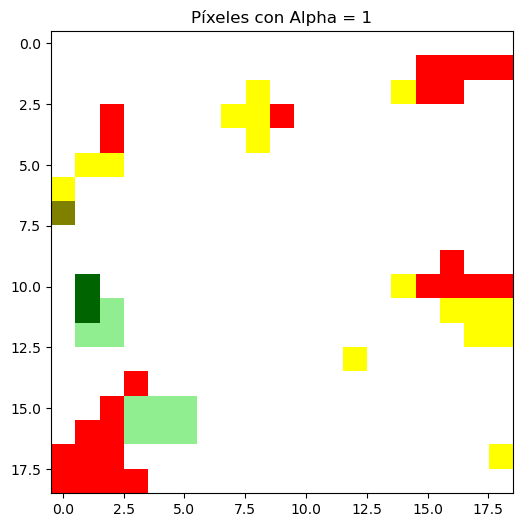

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    32
1     1   0   Built-Up    32
2     2   0   Built-Up    32
3     3   0   Built-Up    32
4     4   0   Built-Up    32
..   ..  ..        ...   ...
356  14  18   Built-Up    32
357  15  18   Built-Up    32
358  16  18      Grass    32
359  17  18      Grass    32
360  18  18      Crops    32

[361 rows x 4 columns]
33


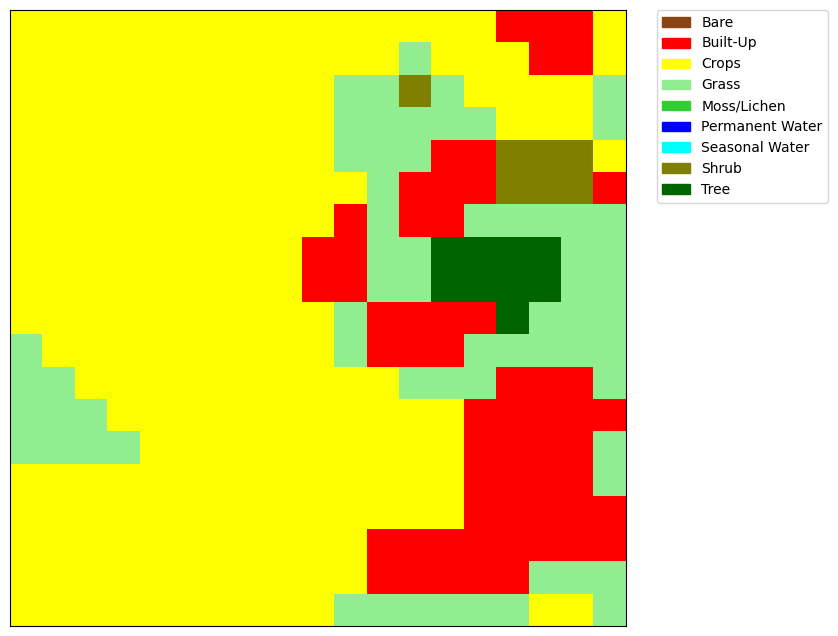

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


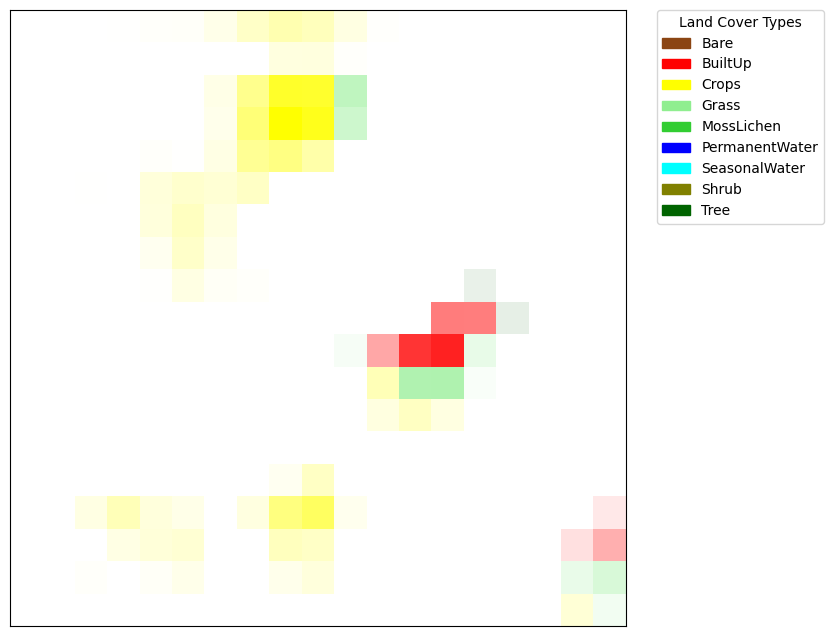

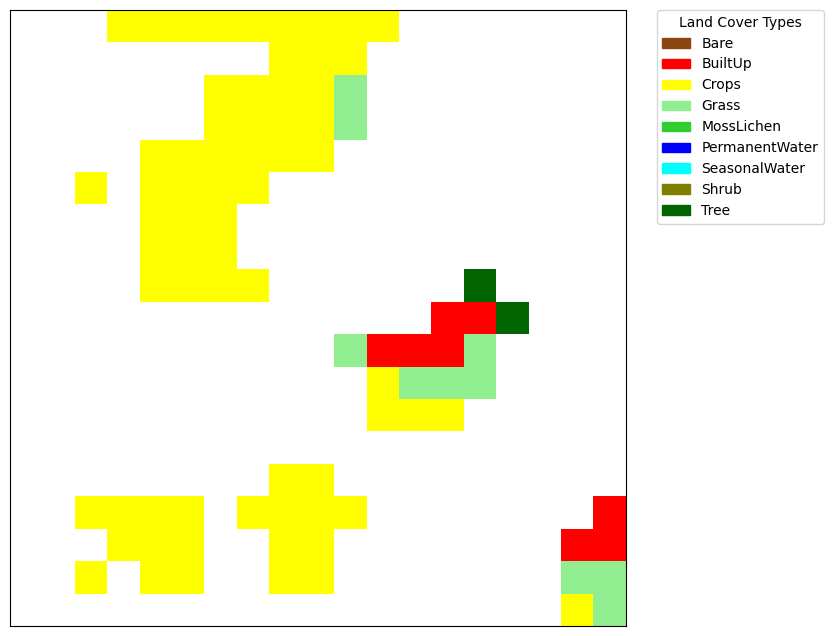

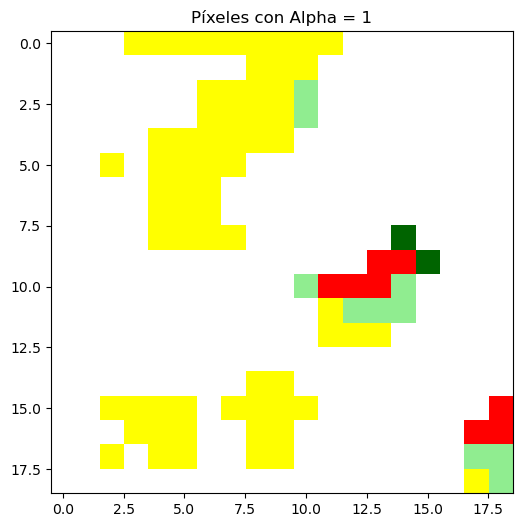

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.004371
4     0   4              1        0.019667
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              6        0.164486
360  18  18              6        0.115426

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    33
1     1   0      Crops    33
2     2   0      Crops    33
3     3   0      Crops    33
4     4   0      Crops    33
..   ..  ..        ...   ...
356  14  18      Grass    33
357  15  18      Grass    33
358  16  18      Crops    33
359  17  18      Crops    33
360  18  18      Grass    33

[361 rows x 4 columns]
34


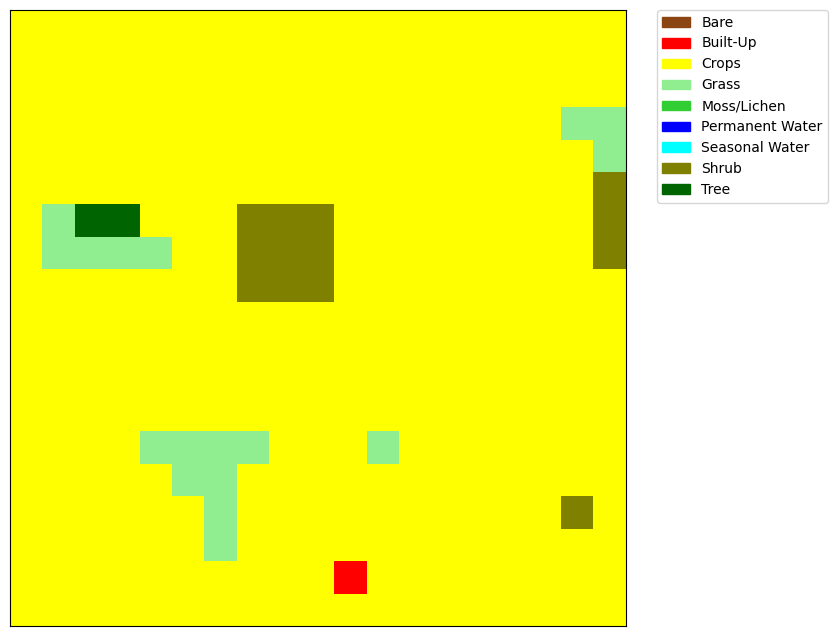

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


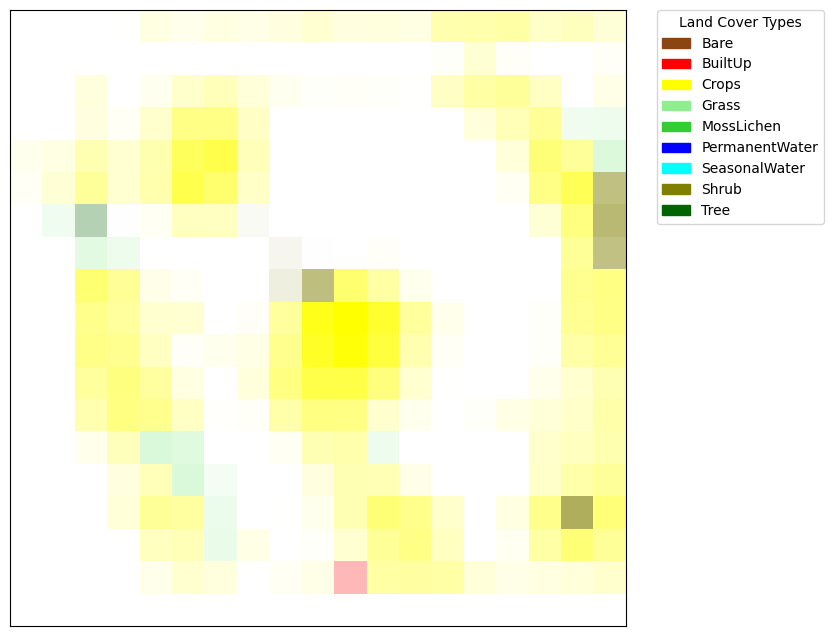

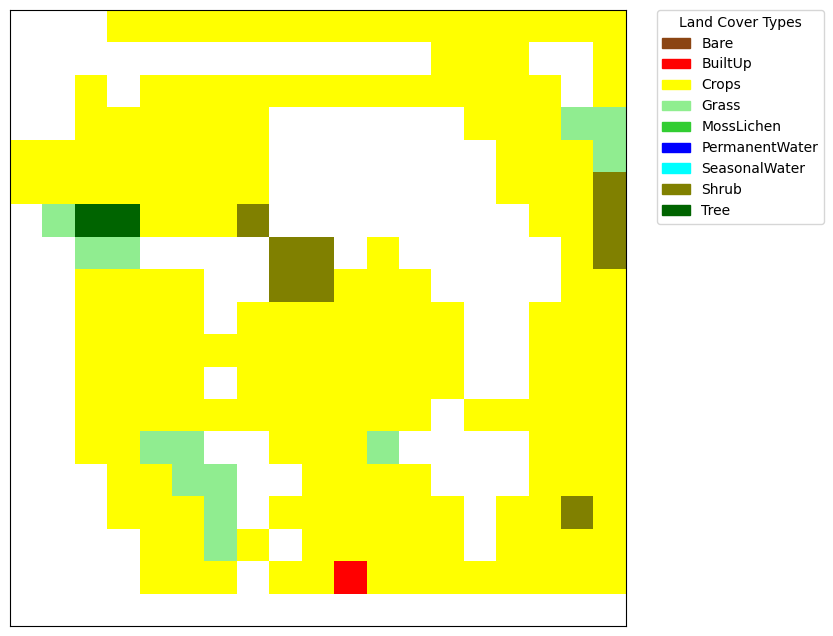

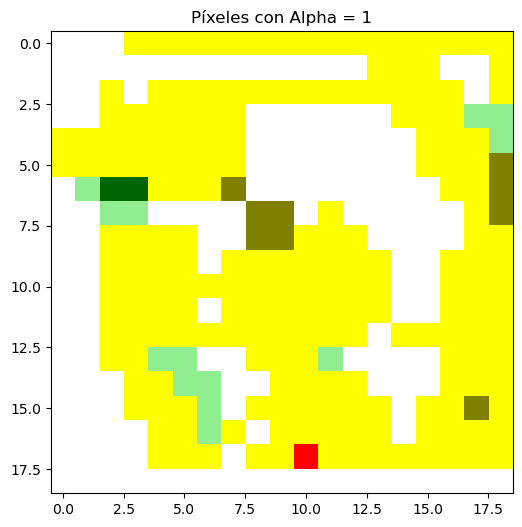

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.008245
4     0   4              1        0.115086
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    34
1     1   0      Crops    34
2     2   0      Crops    34
3     3   0      Crops    34
4     4   0      Crops    34
..   ..  ..        ...   ...
356  14  18      Crops    34
357  15  18      Crops    34
358  16  18      Crops    34
359  17  18      Crops    34
360  18  18      Crops    34

[361 rows x 4 columns]
35


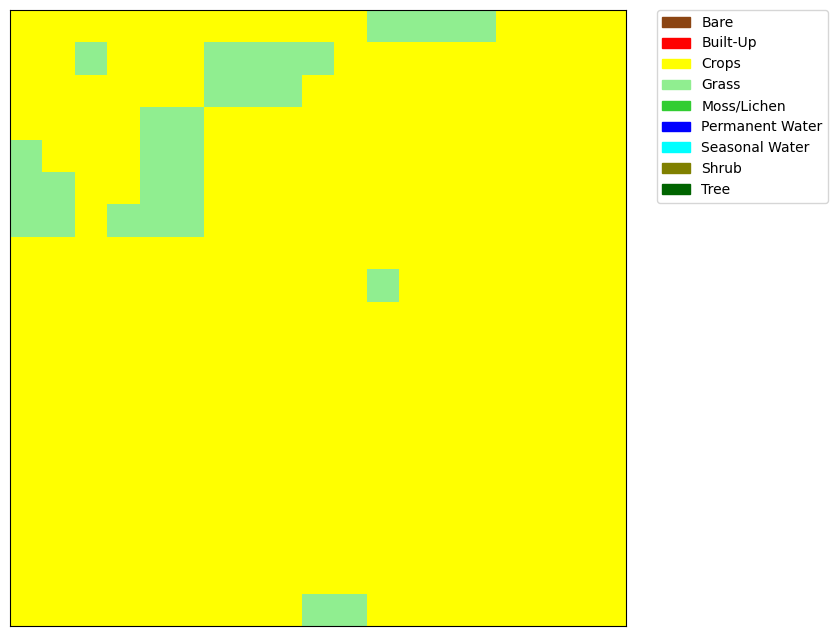

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


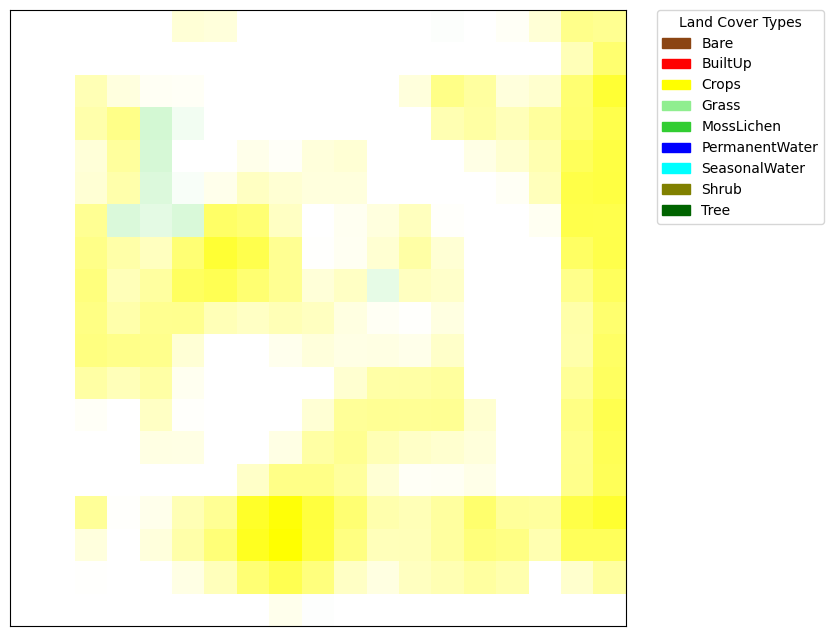

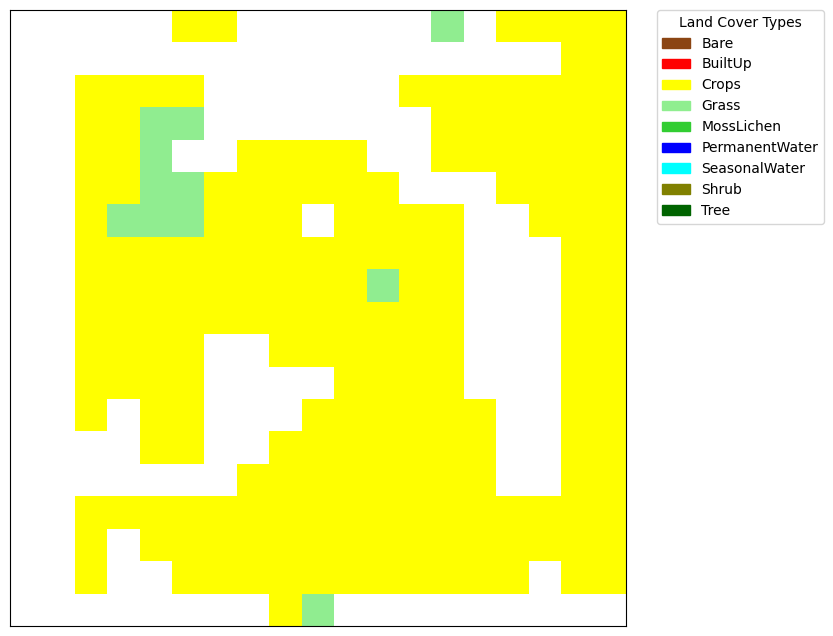

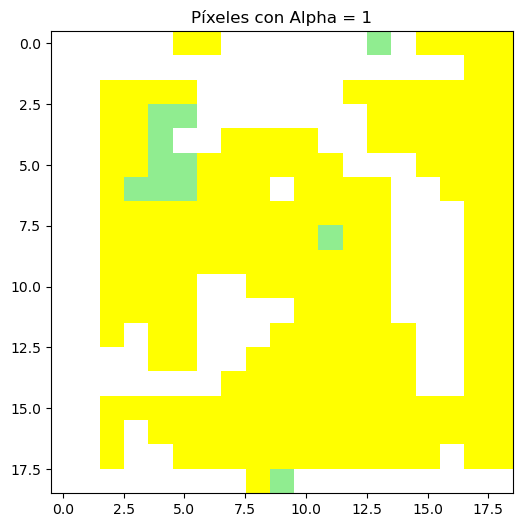

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    35
1     1   0      Crops    35
2     2   0      Crops    35
3     3   0      Crops    35
4     4   0      Crops    35
..   ..  ..        ...   ...
356  14  18      Crops    35
357  15  18      Crops    35
358  16  18      Crops    35
359  17  18      Crops    35
360  18  18      Crops    35

[361 rows x 4 columns]
36


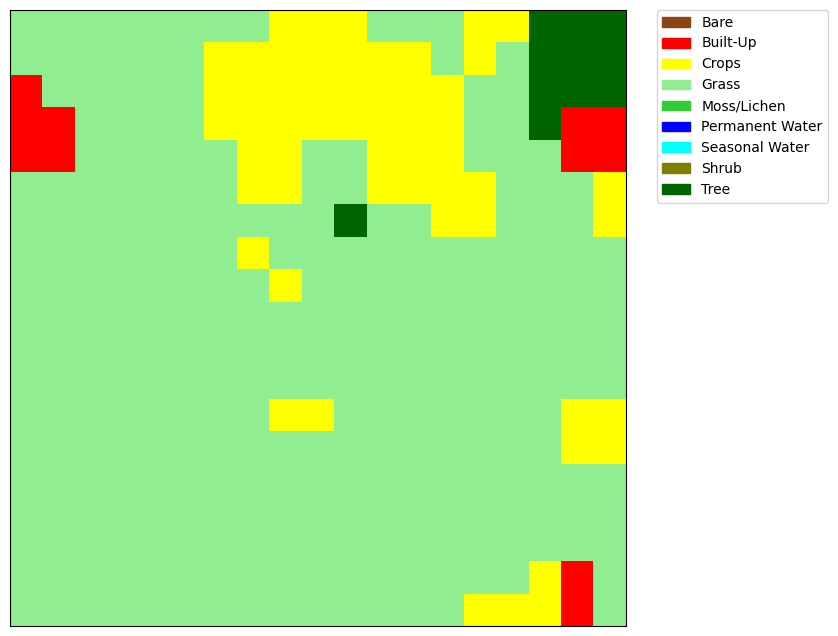

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


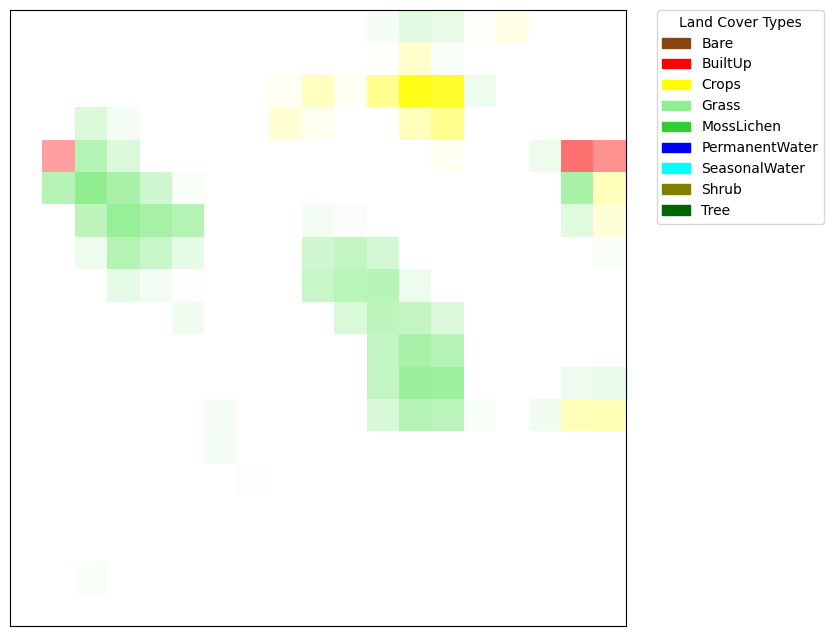

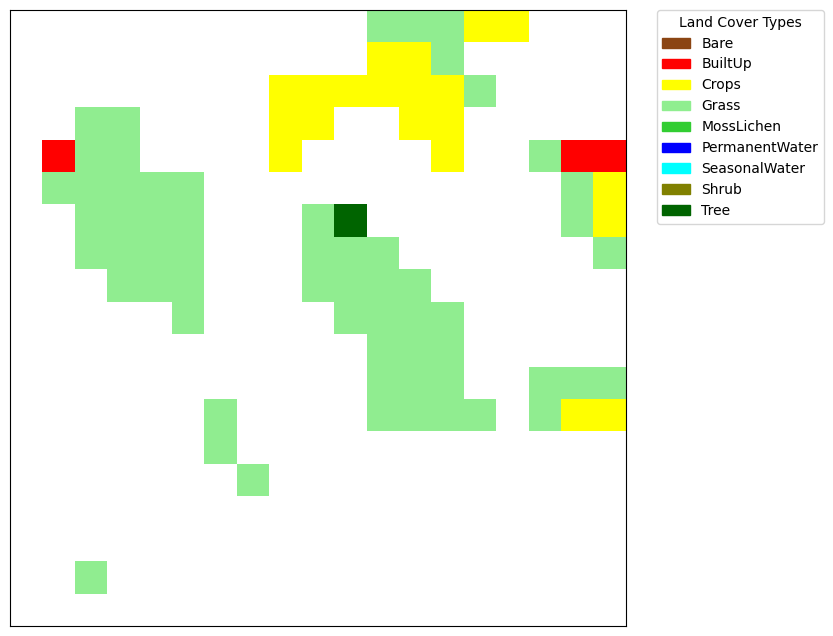

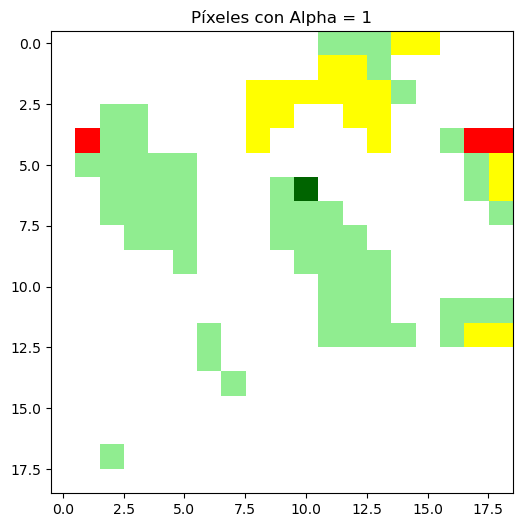

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    36
1     1   0      Grass    36
2     2   0      Grass    36
3     3   0      Grass    36
4     4   0      Grass    36
..   ..  ..        ...   ...
356  14  18      Crops    36
357  15  18      Crops    36
358  16  18      Crops    36
359  17  18   Built-Up    36
360  18  18      Grass    36

[361 rows x 4 columns]
37


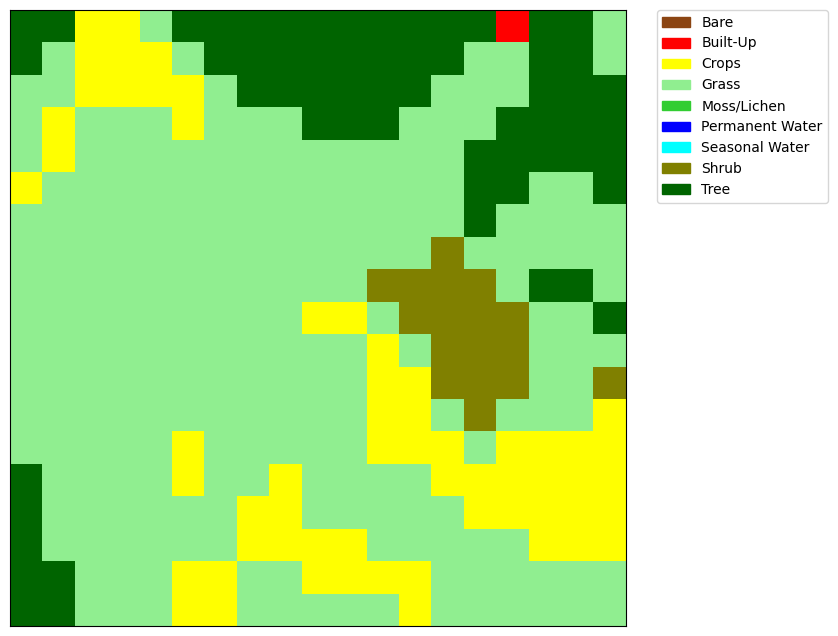

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


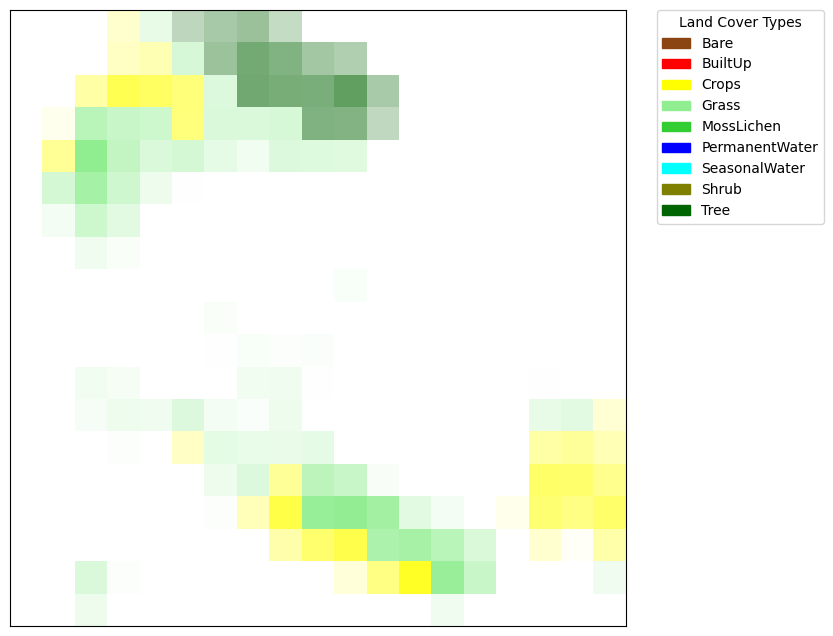

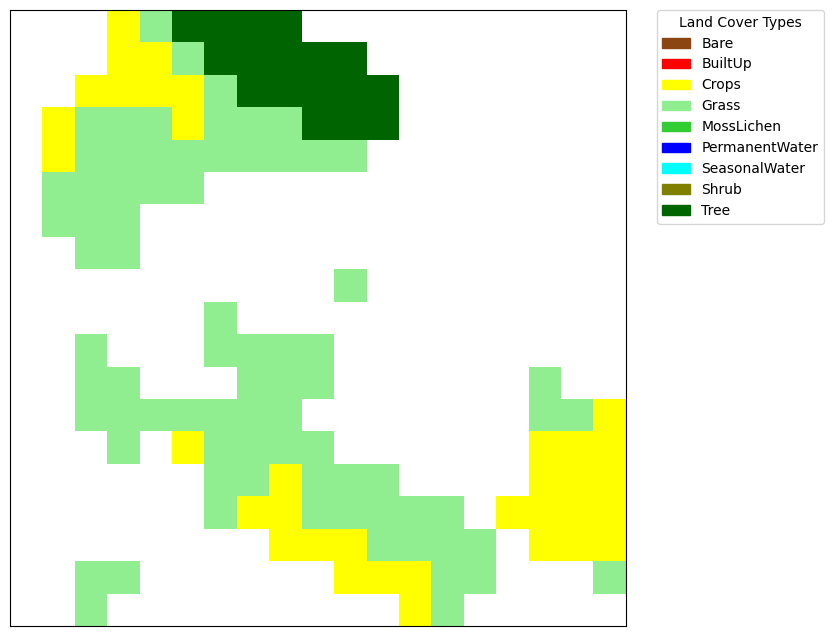

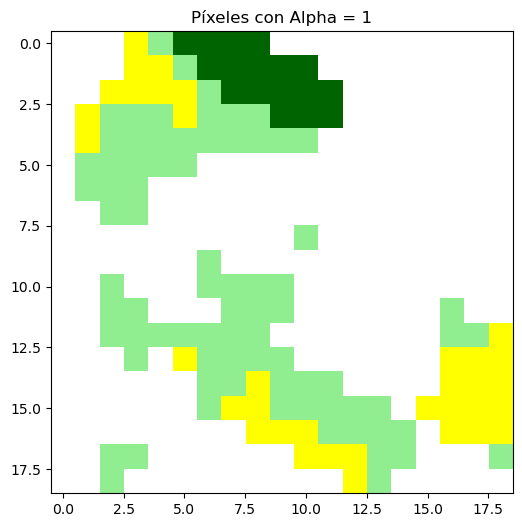

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.192418
4     0   4              1        0.211840
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    37
1     1   0       Tree    37
2     2   0      Crops    37
3     3   0      Crops    37
4     4   0      Grass    37
..   ..  ..        ...   ...
356  14  18      Grass    37
357  15  18      Grass    37
358  16  18      Grass    37
359  17  18      Grass    37
360  18  18      Grass    37

[361 rows x 4 columns]
38


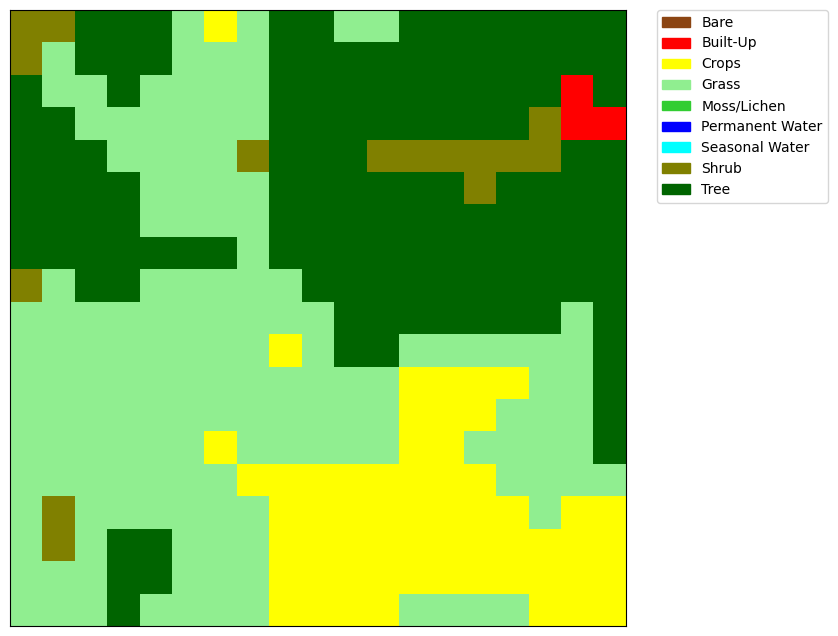

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


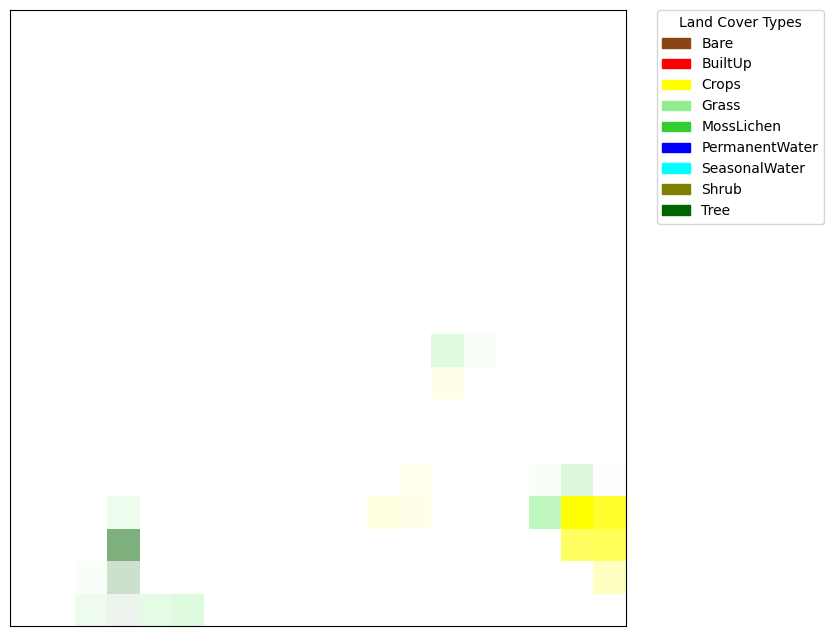

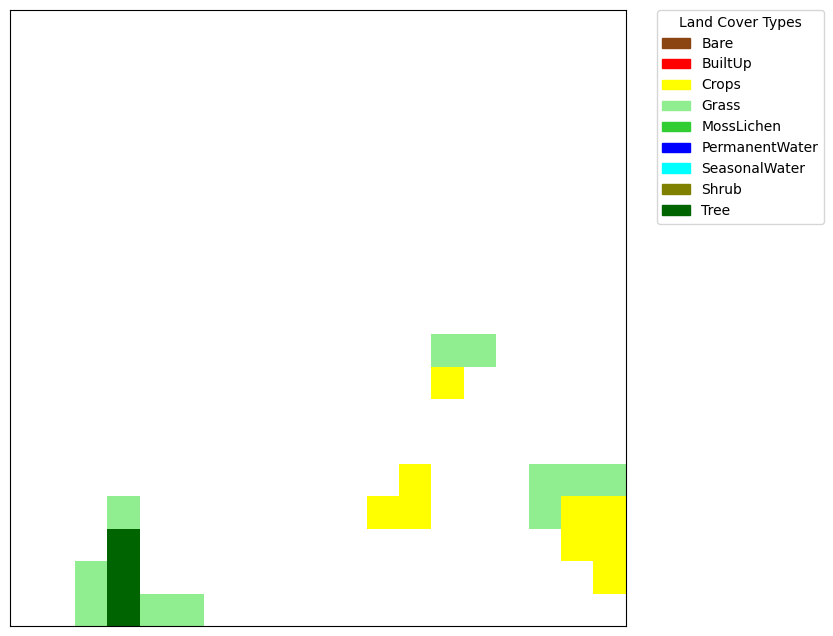

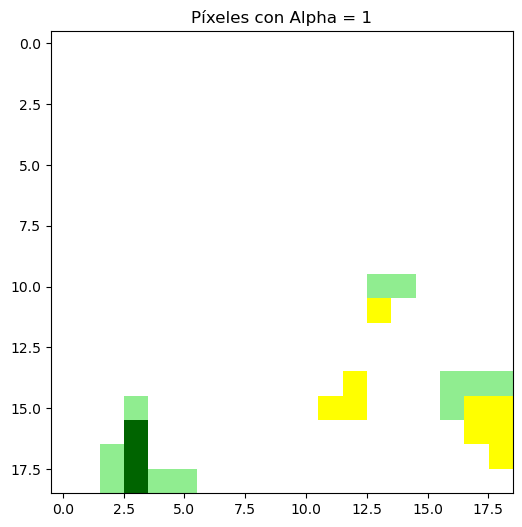

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Shrub    38
1     1   0      Shrub    38
2     2   0       Tree    38
3     3   0       Tree    38
4     4   0       Tree    38
..   ..  ..        ...   ...
356  14  18      Grass    38
357  15  18      Grass    38
358  16  18      Crops    38
359  17  18      Crops    38
360  18  18      Crops    38

[361 rows x 4 columns]
39


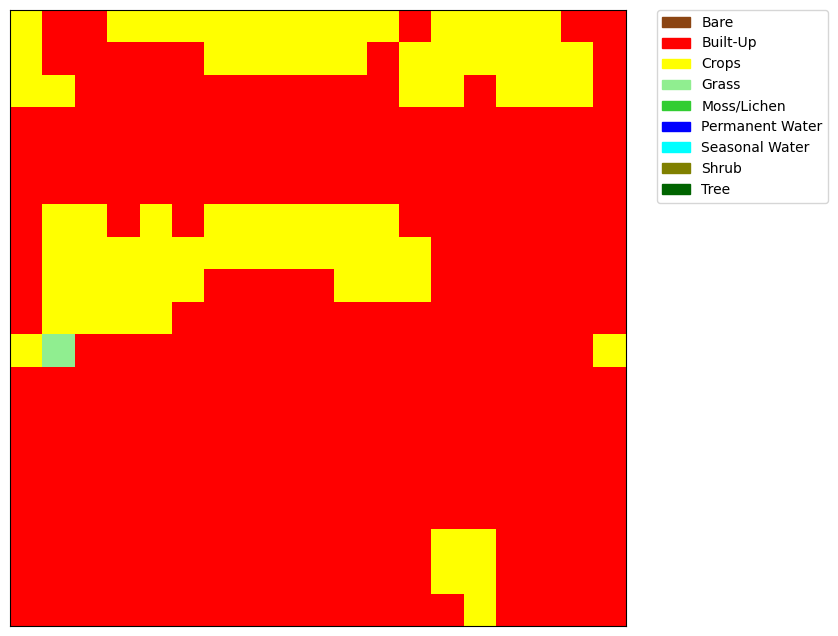

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


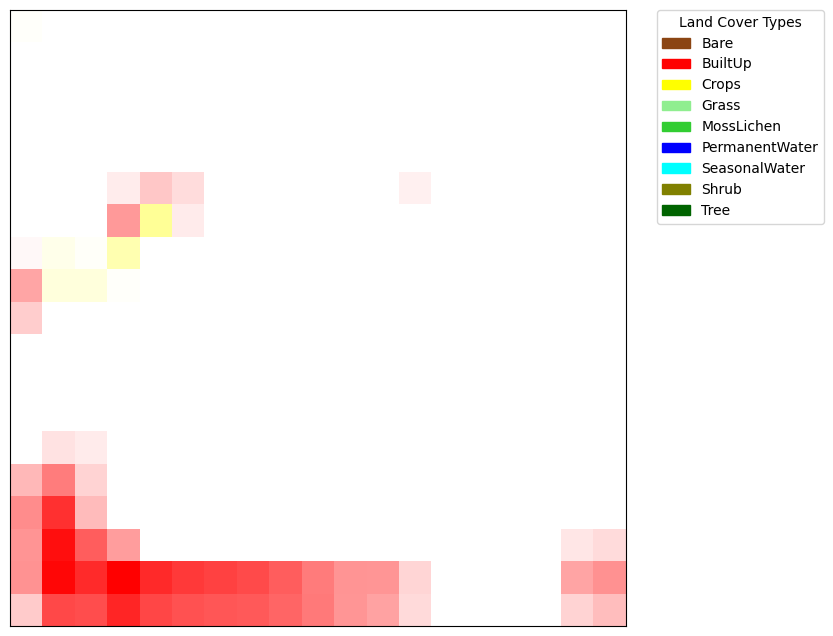

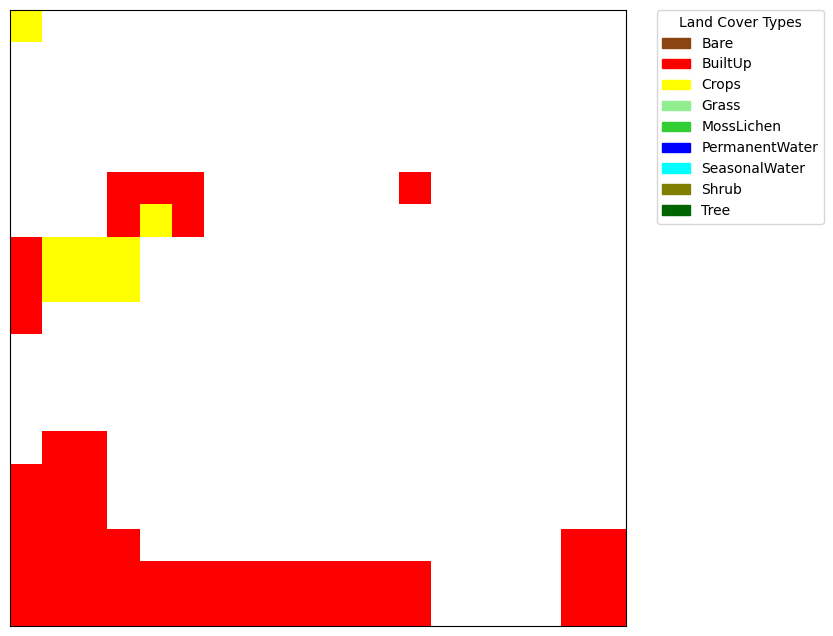

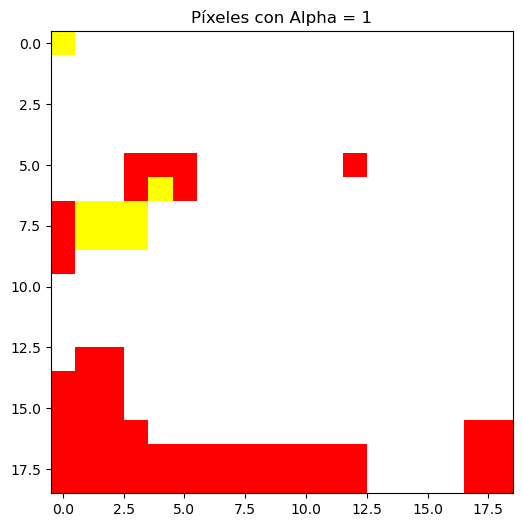

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.021808
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              5        0.174815
360  18  18              5        0.259028

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    39
1     1   0   Built-Up    39
2     2   0   Built-Up    39
3     3   0      Crops    39
4     4   0      Crops    39
..   ..  ..        ...   ...
356  14  18      Crops    39
357  15  18   Built-Up    39
358  16  18   Built-Up    39
359  17  18   Built-Up    39
360  18  18   Built-Up    39

[361 rows x 4 columns]
40


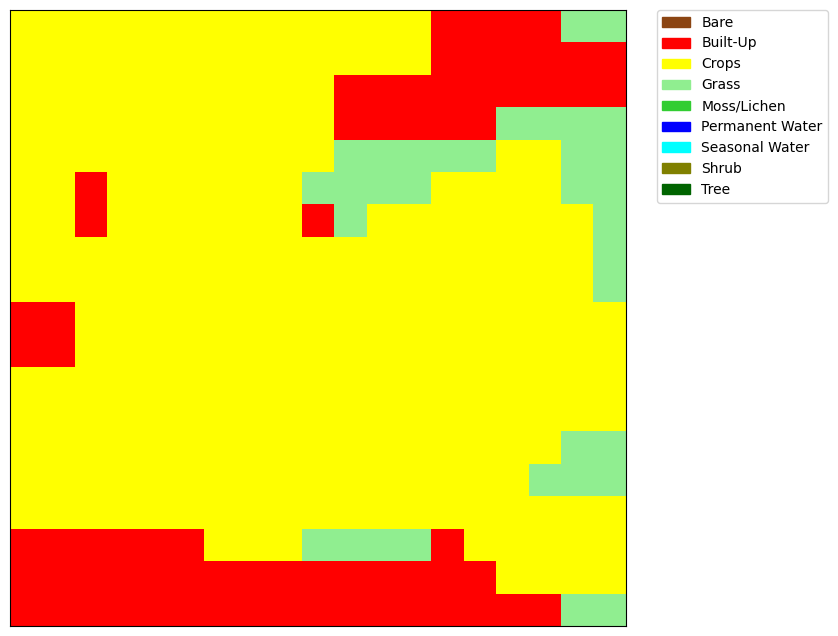

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


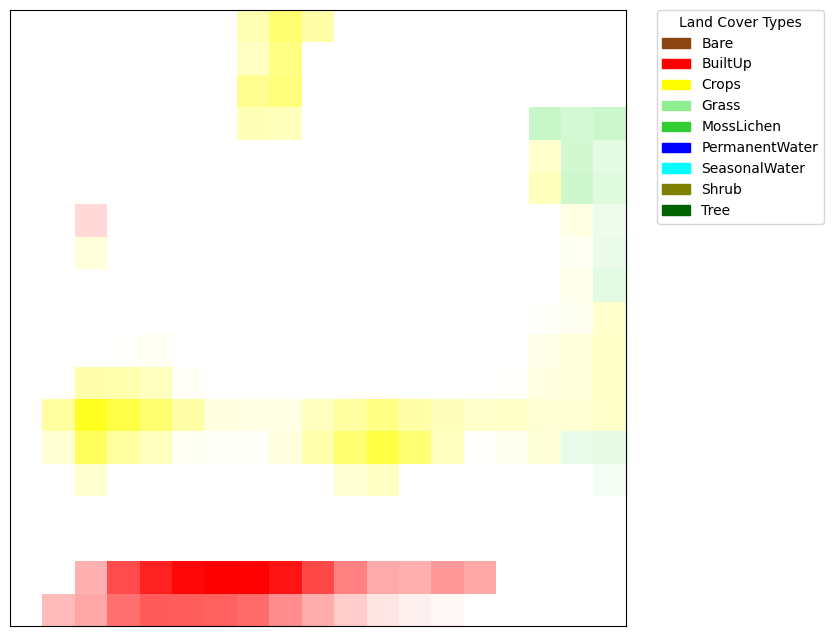

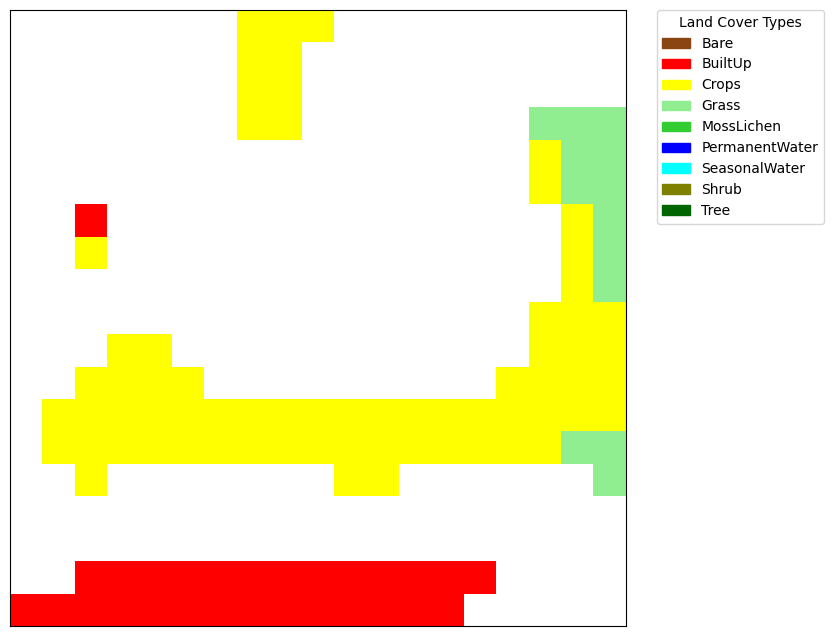

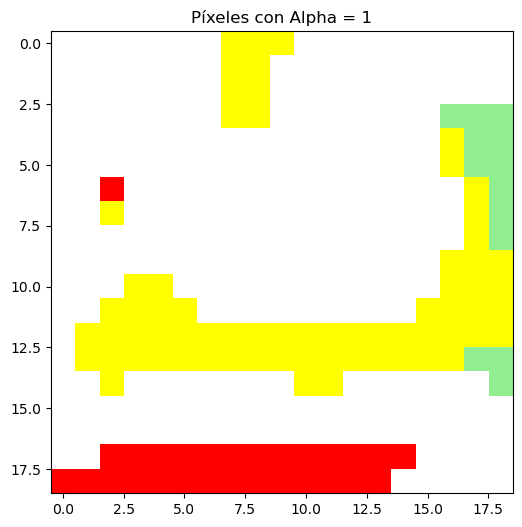

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    40
1     1   0      Crops    40
2     2   0      Crops    40
3     3   0      Crops    40
4     4   0      Crops    40
..   ..  ..        ...   ...
356  14  18   Built-Up    40
357  15  18   Built-Up    40
358  16  18   Built-Up    40
359  17  18      Grass    40
360  18  18      Grass    40

[361 rows x 4 columns]
41


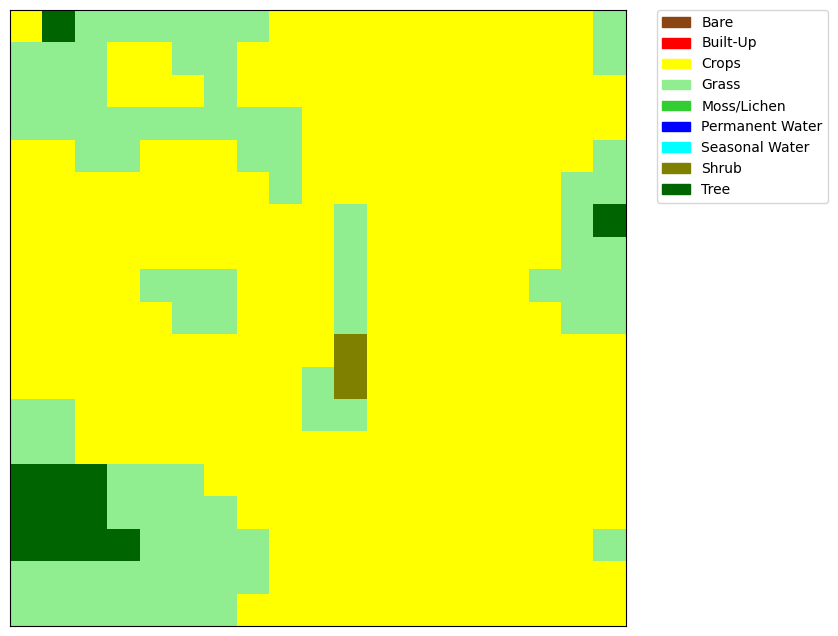

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


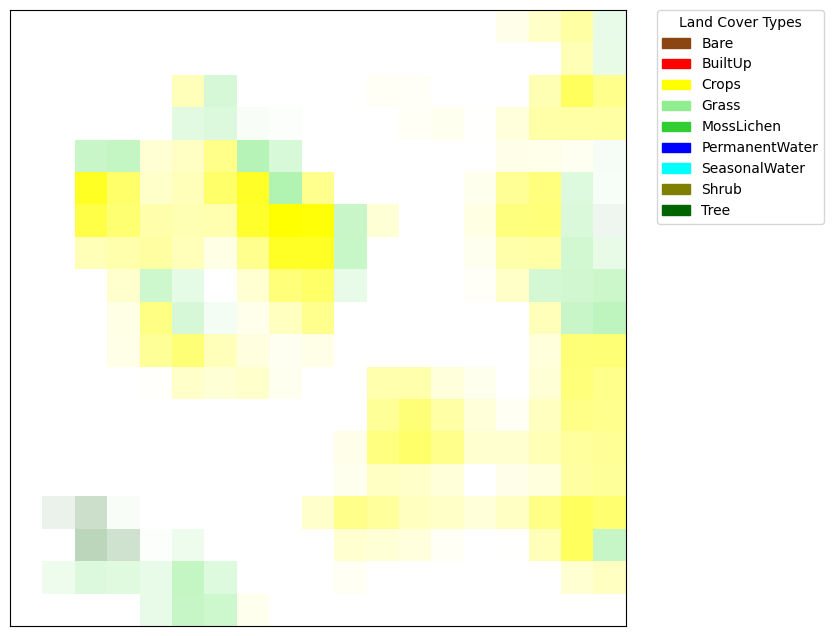

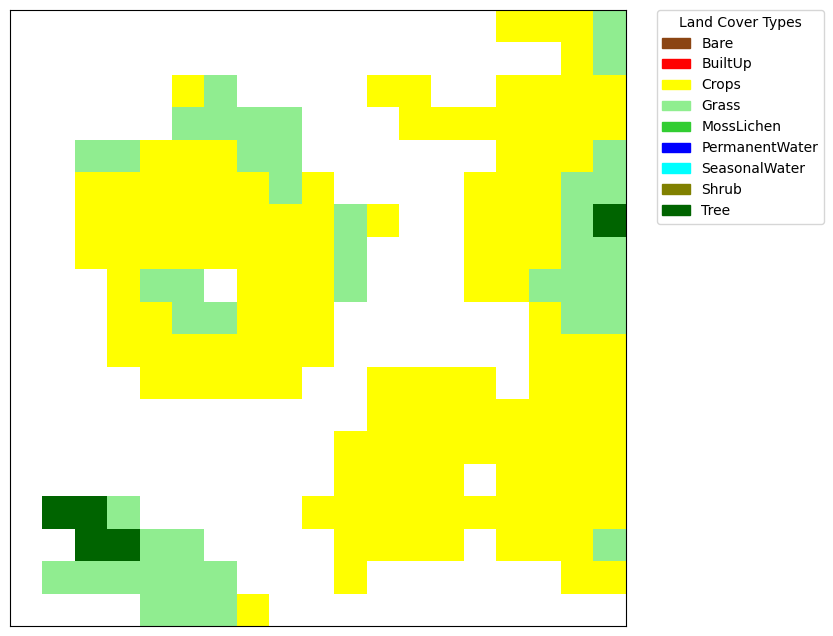

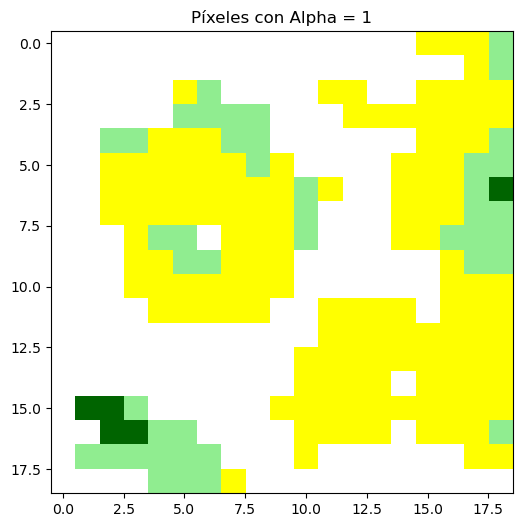

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    41
1     1   0       Tree    41
2     2   0      Grass    41
3     3   0      Grass    41
4     4   0      Grass    41
..   ..  ..        ...   ...
356  14  18      Crops    41
357  15  18      Crops    41
358  16  18      Crops    41
359  17  18      Crops    41
360  18  18      Crops    41

[361 rows x 4 columns]
42


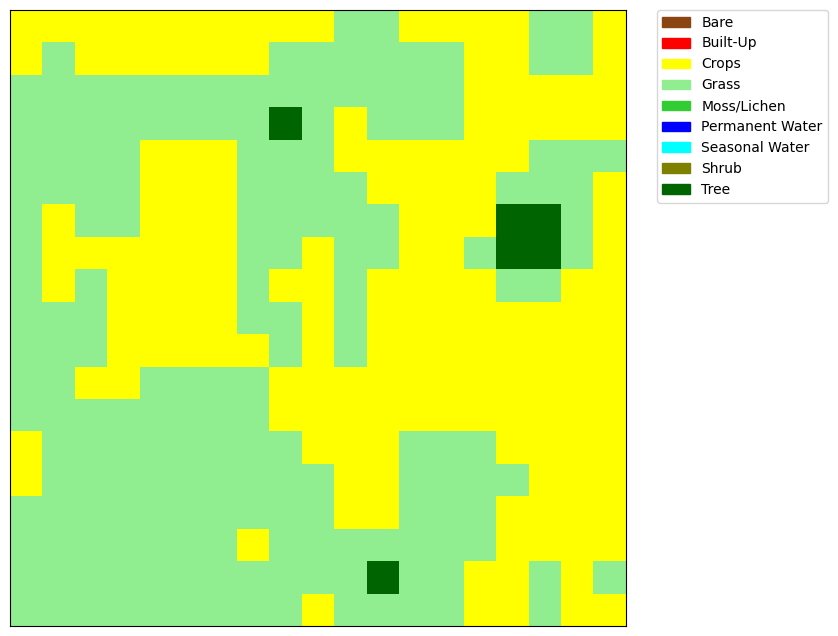

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


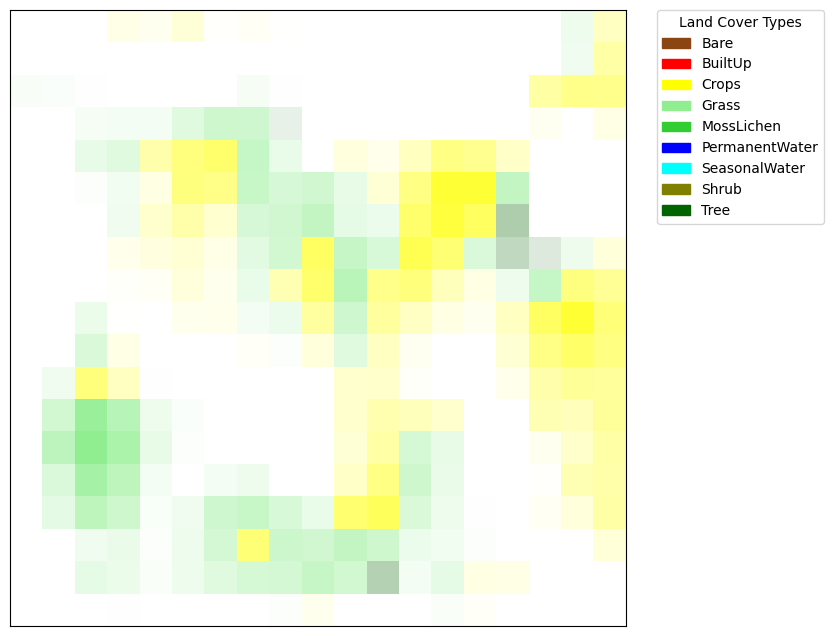

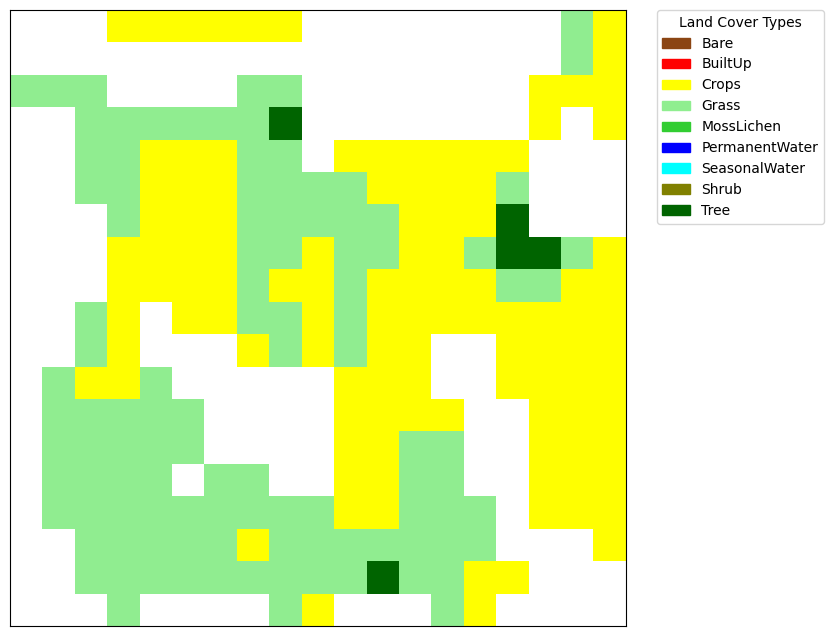

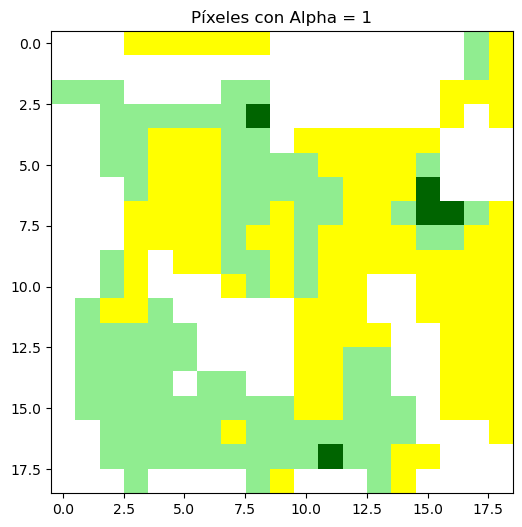

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.094596
4     0   4              1        0.062958
..   ..  ..            ...             ...
356  18  14              2        0.031637
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    42
1     1   0      Crops    42
2     2   0      Crops    42
3     3   0      Crops    42
4     4   0      Crops    42
..   ..  ..        ...   ...
356  14  18      Crops    42
357  15  18      Crops    42
358  16  18      Grass    42
359  17  18      Crops    42
360  18  18      Crops    42

[361 rows x 4 columns]
43


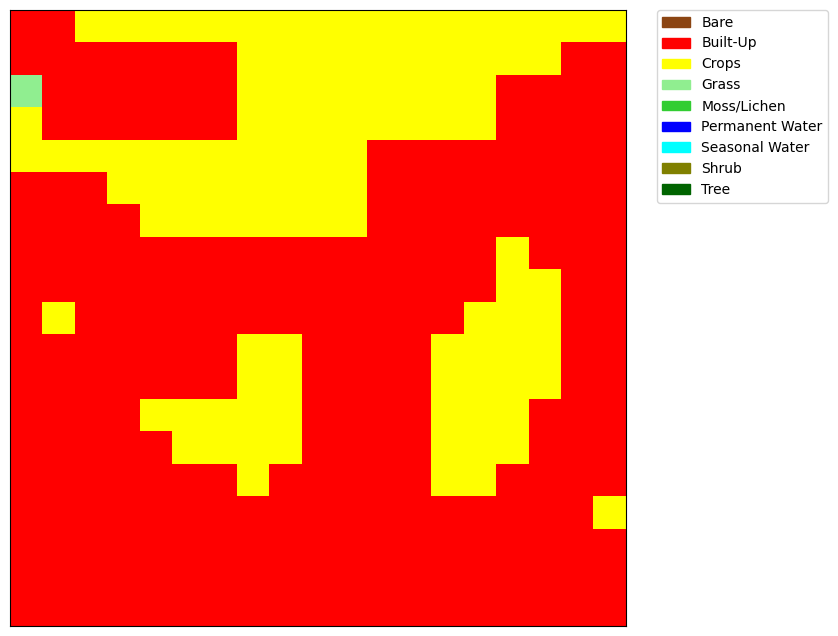

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


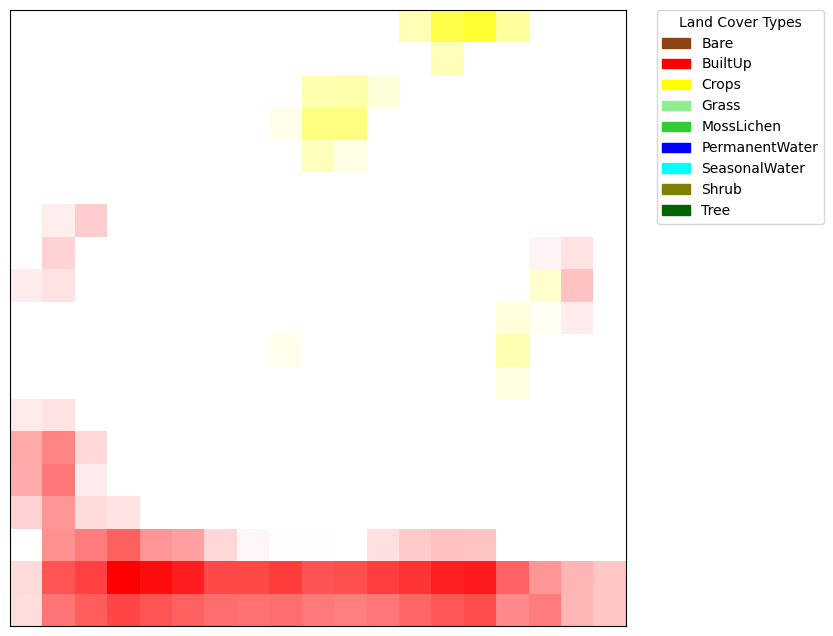

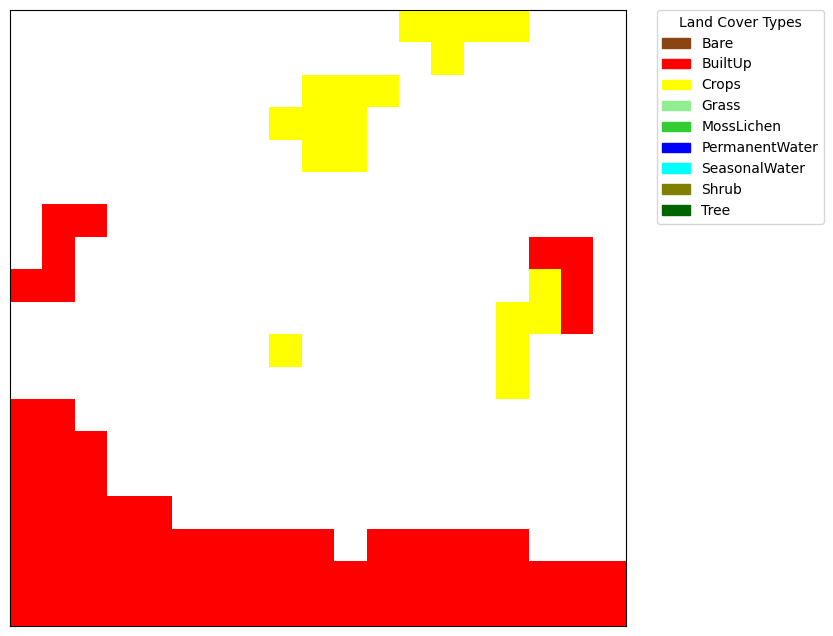

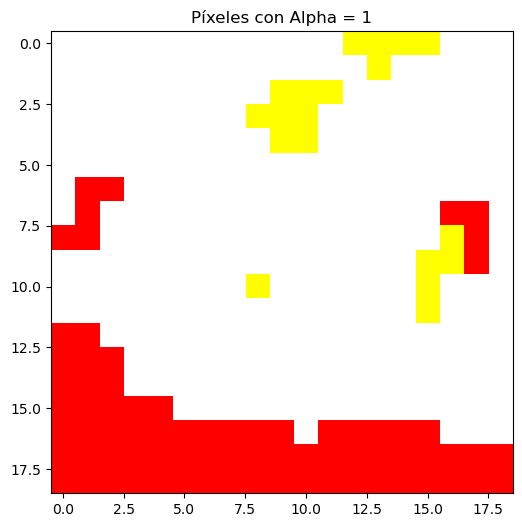

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              6        0.701172
357  18  15              6        0.466647
358  18  16              6        0.517509
359  18  17              6        0.290411
360  18  18              6        0.226245

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    43
1     1   0   Built-Up    43
2     2   0      Crops    43
3     3   0      Crops    43
4     4   0      Crops    43
..   ..  ..        ...   ...
356  14  18   Built-Up    43
357  15  18   Built-Up    43
358  16  18   Built-Up    43
359  17  18   Built-Up    43
360  18  18   Built-Up    43

[361 rows x 4 columns]
44


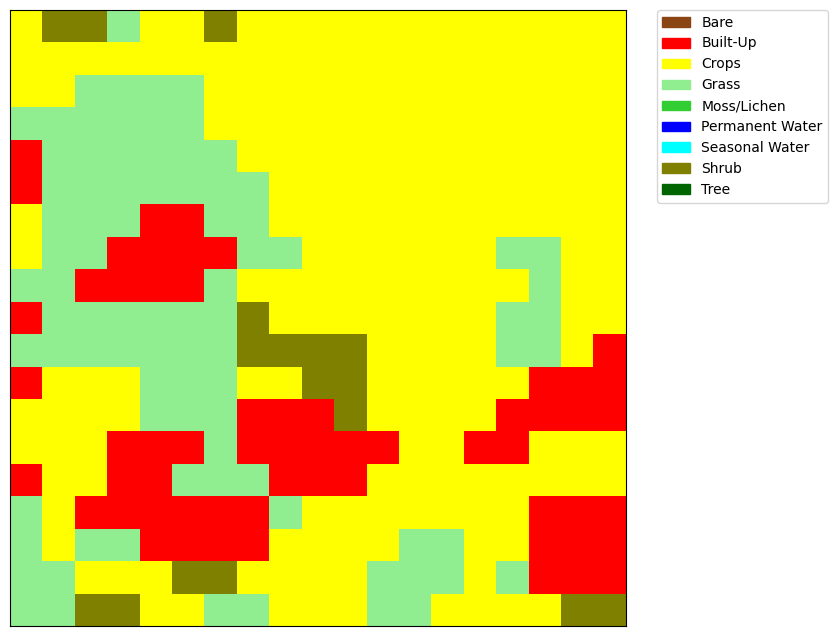

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


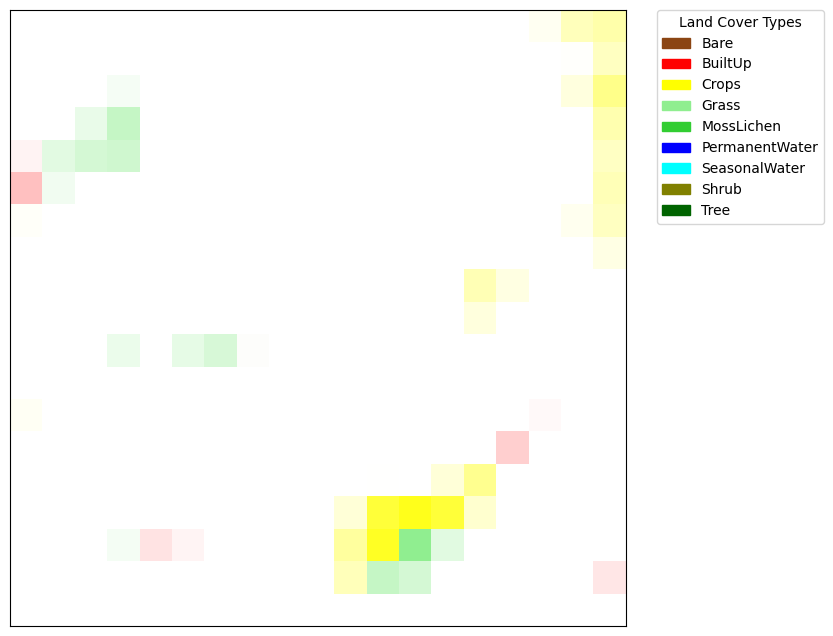

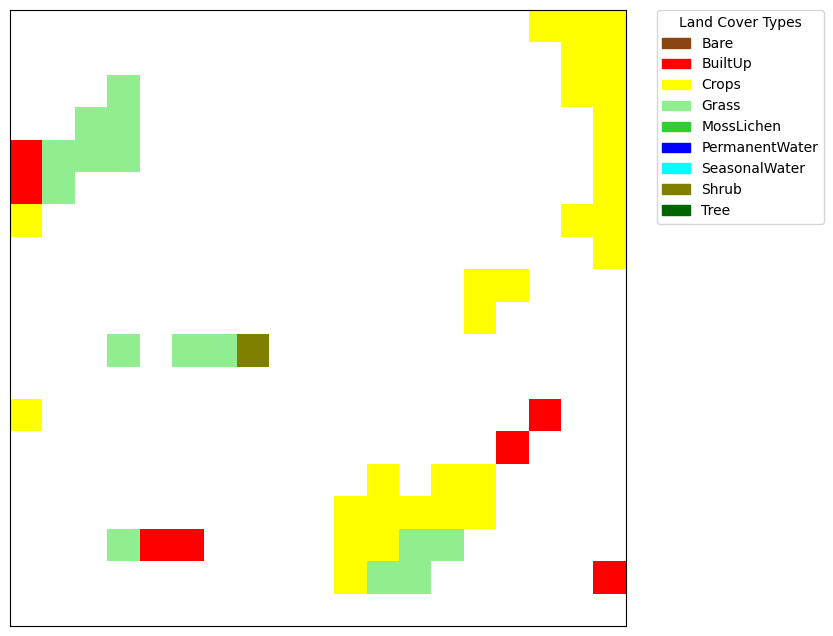

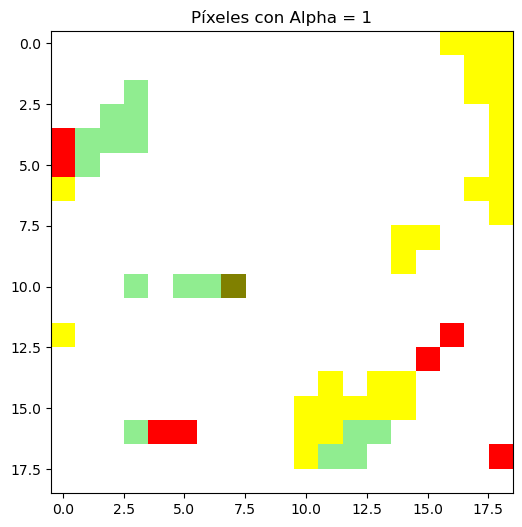

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    44
1     1   0      Shrub    44
2     2   0      Shrub    44
3     3   0      Grass    44
4     4   0      Crops    44
..   ..  ..        ...   ...
356  14  18      Crops    44
357  15  18      Crops    44
358  16  18      Crops    44
359  17  18      Shrub    44
360  18  18      Shrub    44

[361 rows x 4 columns]
45


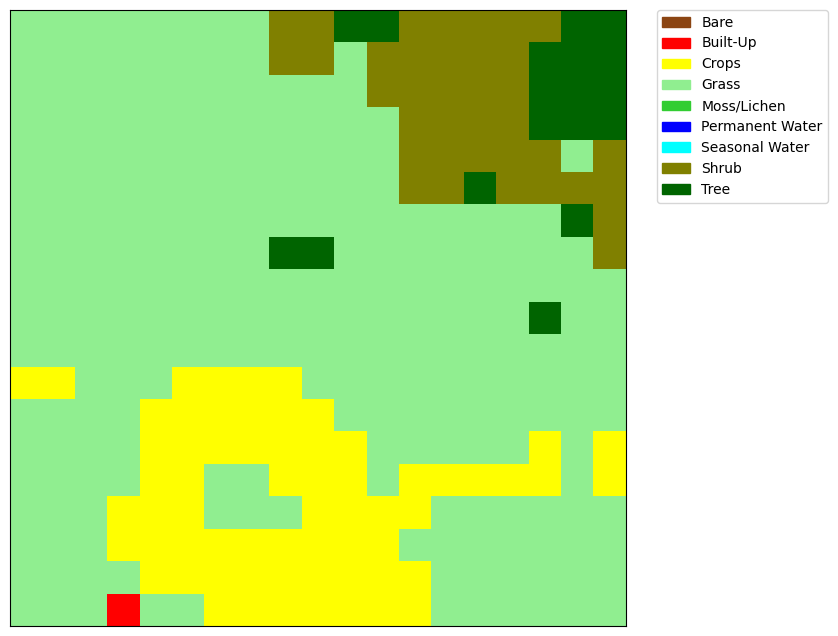

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


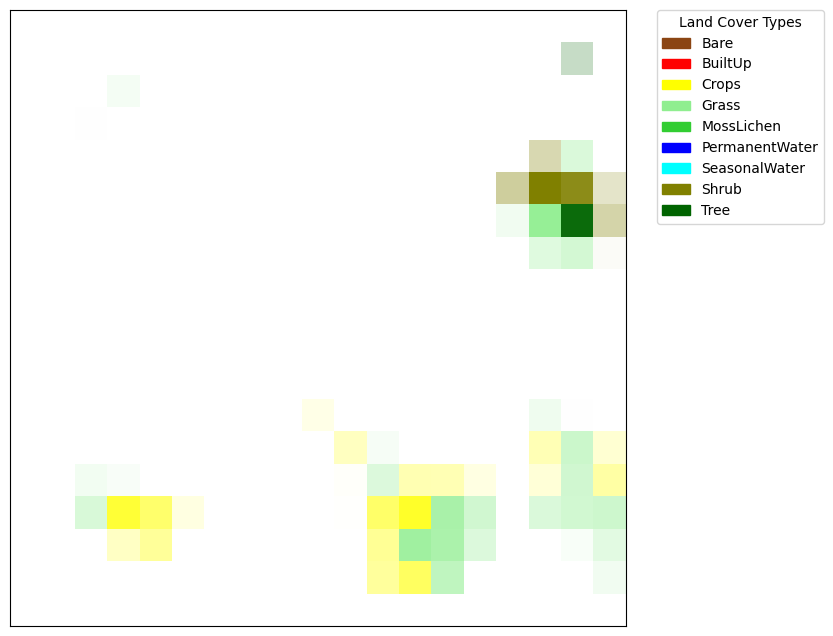

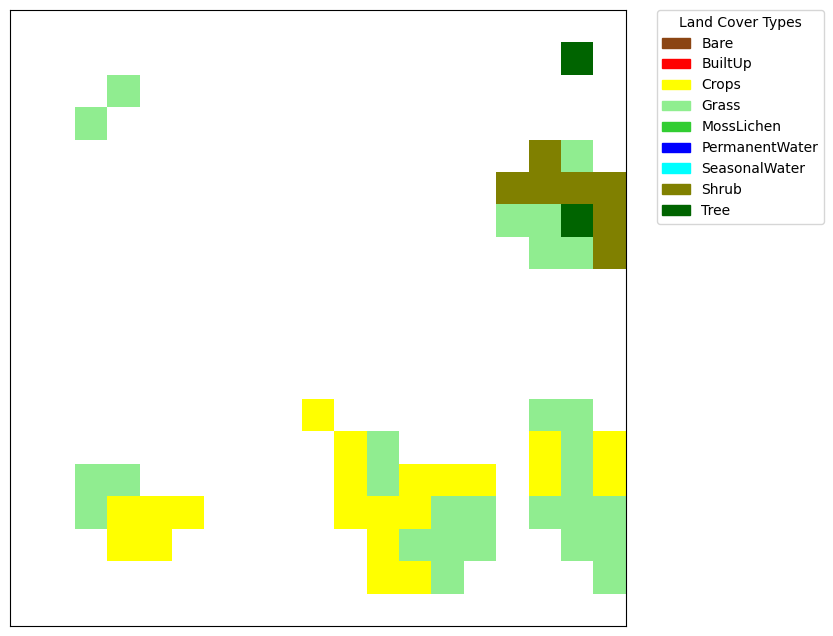

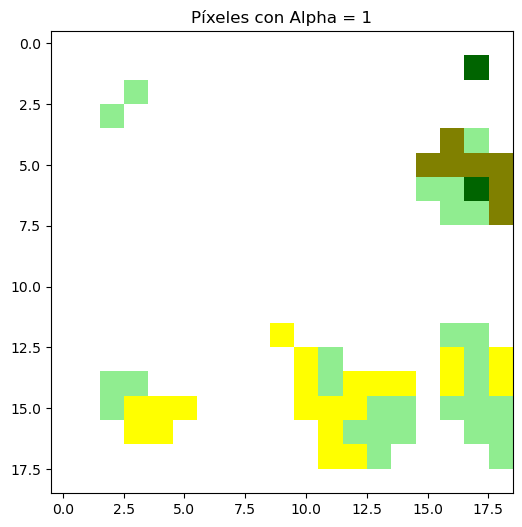

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    45
1     1   0      Grass    45
2     2   0      Grass    45
3     3   0      Grass    45
4     4   0      Grass    45
..   ..  ..        ...   ...
356  14  18      Grass    45
357  15  18      Grass    45
358  16  18      Grass    45
359  17  18      Grass    45
360  18  18      Grass    45

[361 rows x 4 columns]
46


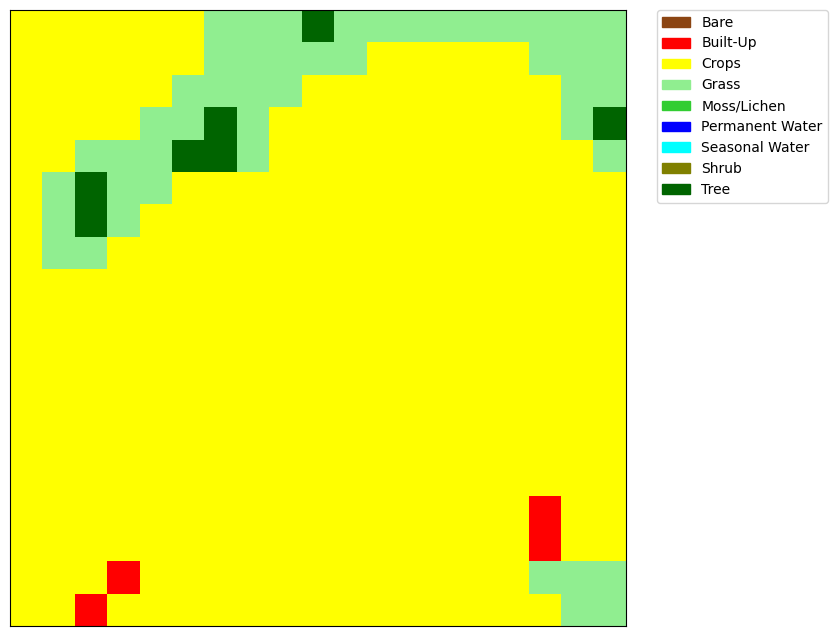

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


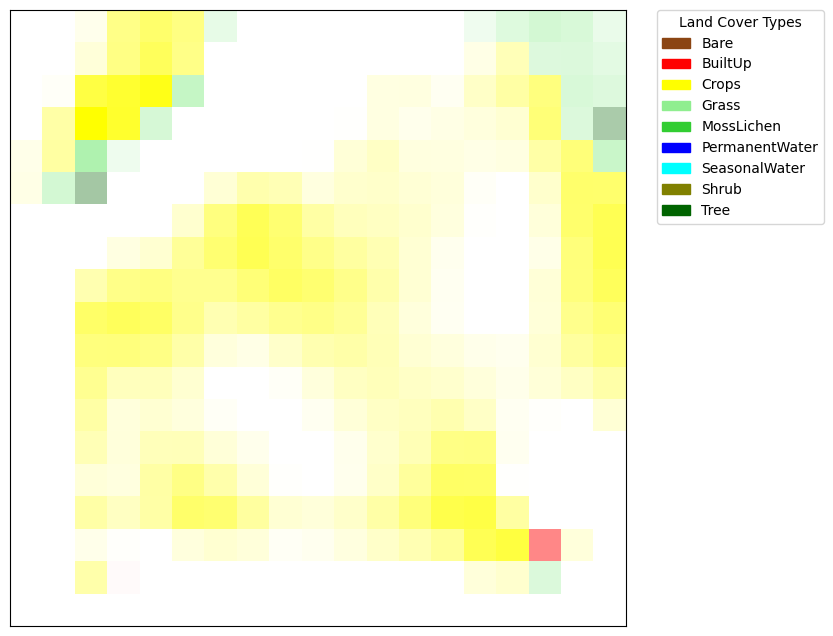

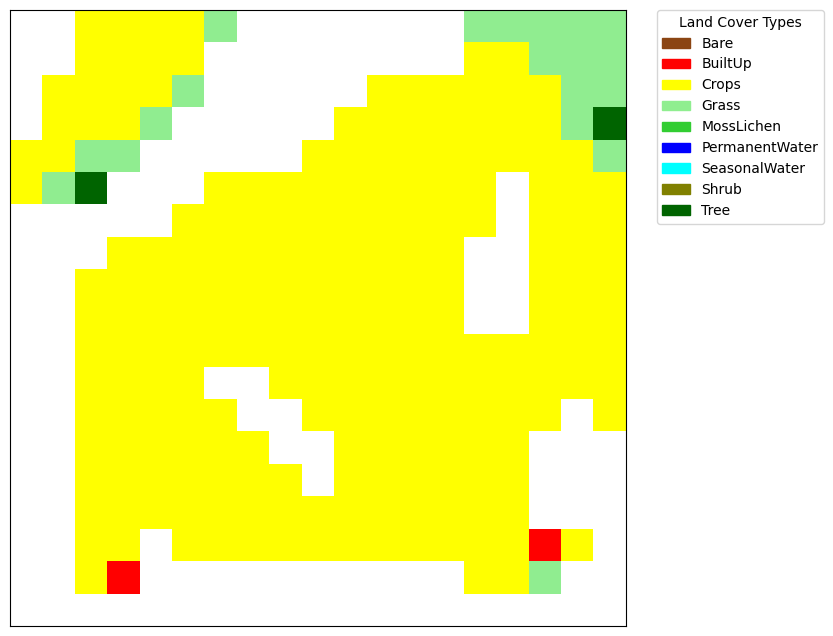

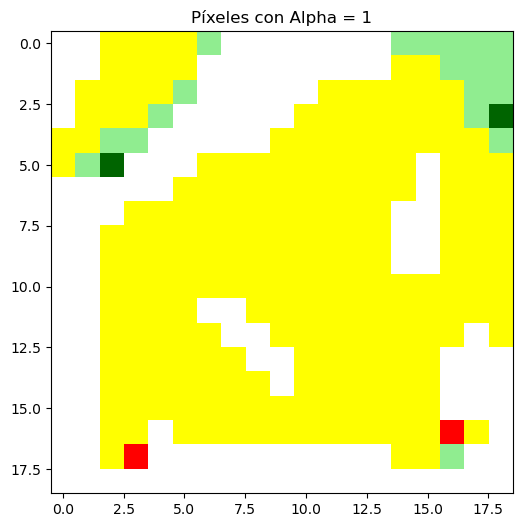

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.076079
3     0   3              1        0.473416
4     0   4              1        0.581721
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    46
1     1   0      Crops    46
2     2   0      Crops    46
3     3   0      Crops    46
4     4   0      Crops    46
..   ..  ..        ...   ...
356  14  18      Crops    46
357  15  18      Crops    46
358  16  18      Crops    46
359  17  18      Grass    46
360  18  18      Grass    46

[361 rows x 4 columns]
47


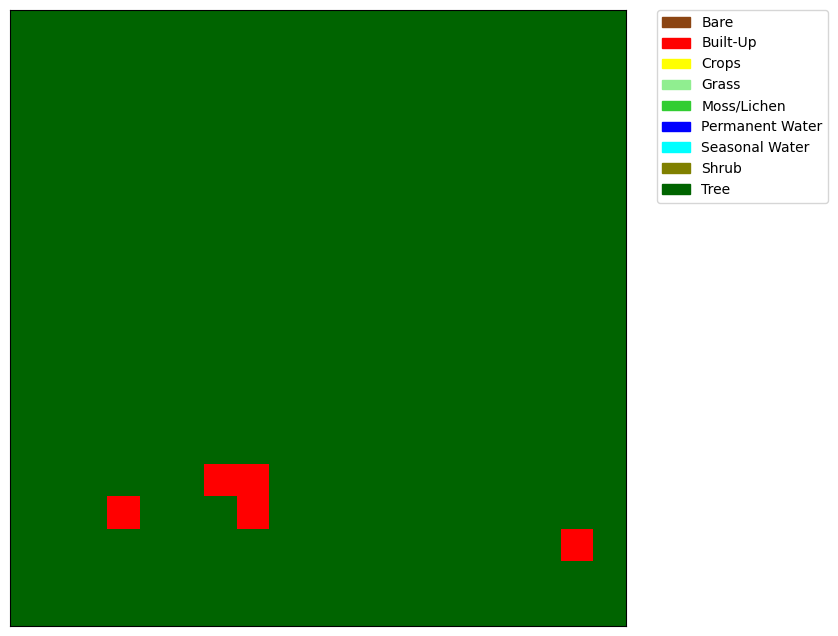

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


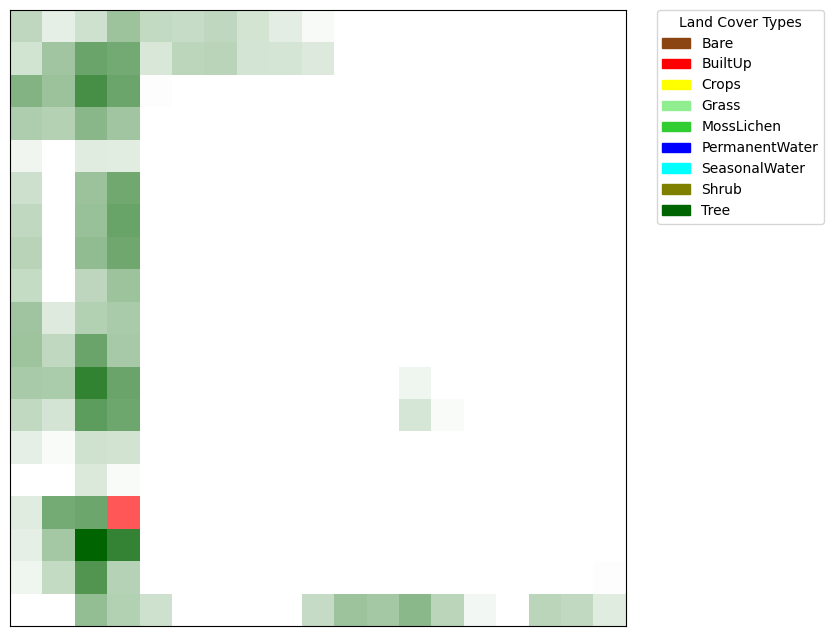

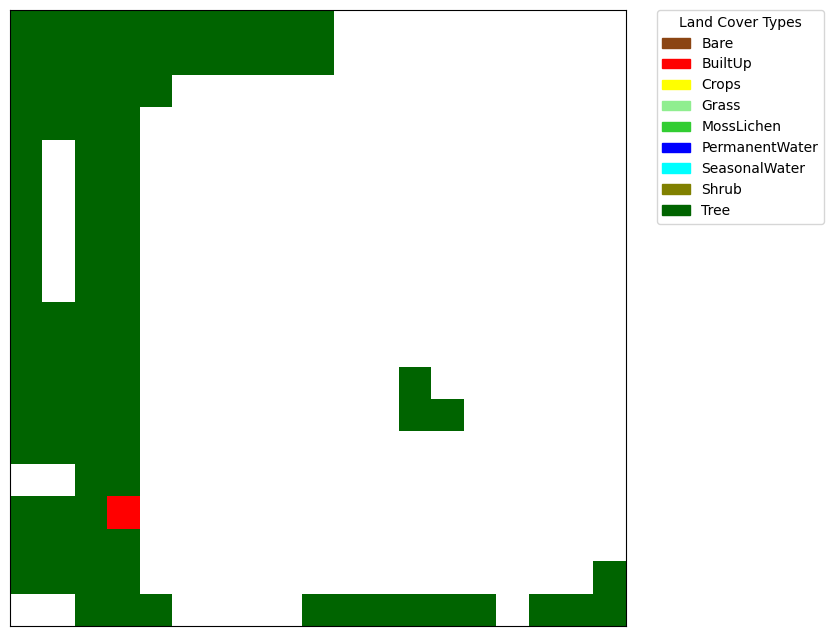

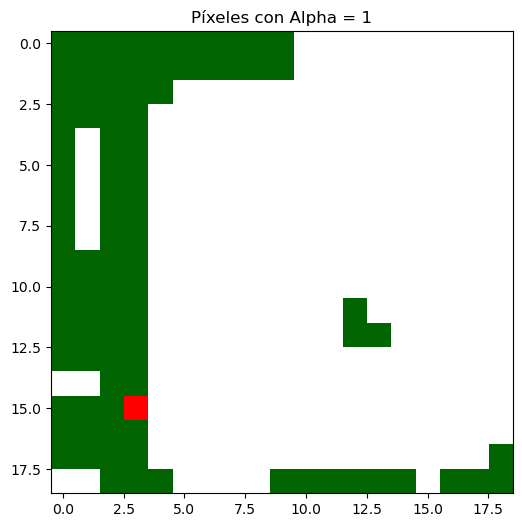

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.255002
1     0   1              1        0.104683
2     0   2              1        0.192303
3     0   3              1        0.386954
4     0   4              1        0.239285
..   ..  ..            ...             ...
356  18  14              4        0.049681
357  18  15              0        0.000000
358  18  16              3        0.266708
359  18  17              3        0.245138
360  18  18              3        0.118318

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    47
1     1   0       Tree    47
2     2   0       Tree    47
3     3   0       Tree    47
4     4   0       Tree    47
..   ..  ..        ...   ...
356  14  18       Tree    47
357  15  18       Tree    47
358  16  18       Tree    47
359  17  18       Tree    47
360  18  18       Tree    47

[361 rows x 4 columns]
48


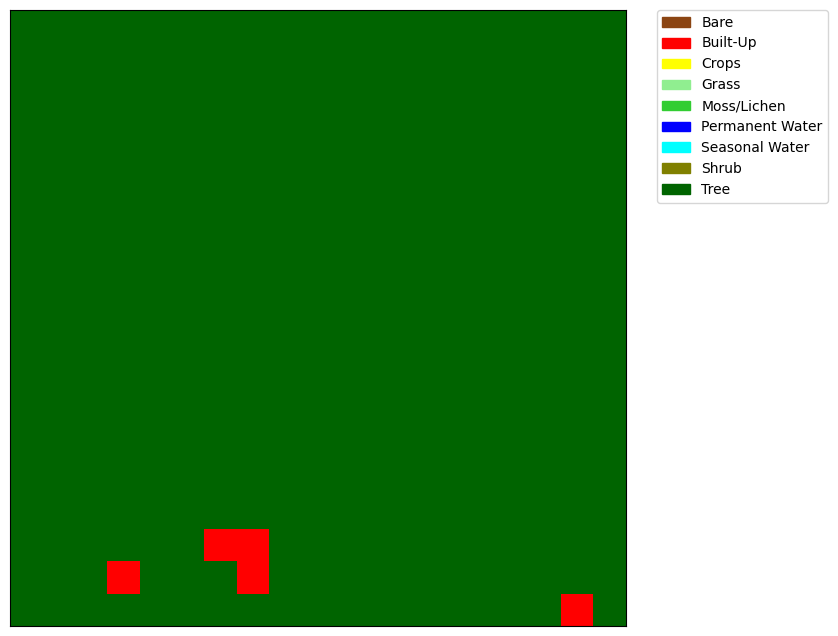

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


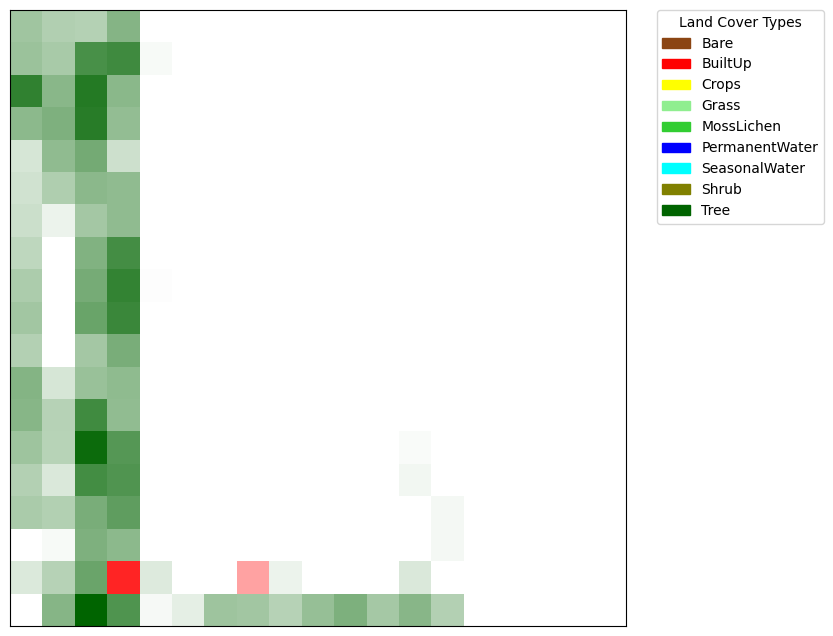

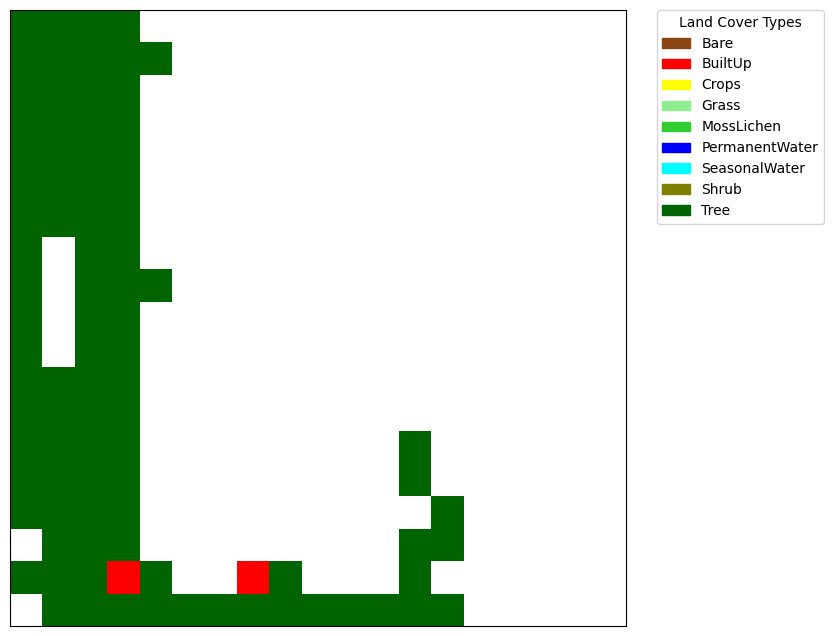

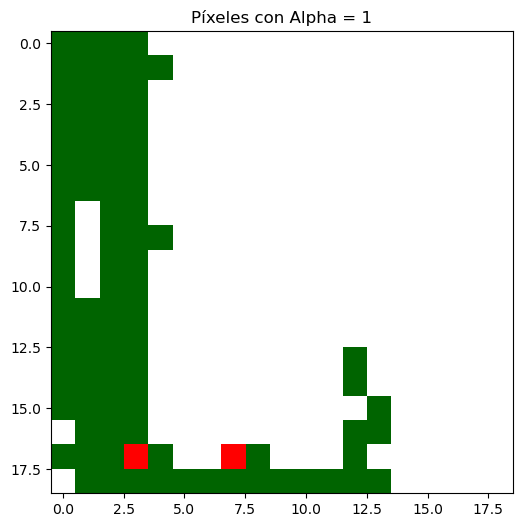

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.376397
1     0   1              1        0.307610
2     0   2              1        0.297926
3     0   3              1        0.480417
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    48
1     1   0       Tree    48
2     2   0       Tree    48
3     3   0       Tree    48
4     4   0       Tree    48
..   ..  ..        ...   ...
356  14  18       Tree    48
357  15  18       Tree    48
358  16  18       Tree    48
359  17  18   Built-Up    48
360  18  18       Tree    48

[361 rows x 4 columns]
49


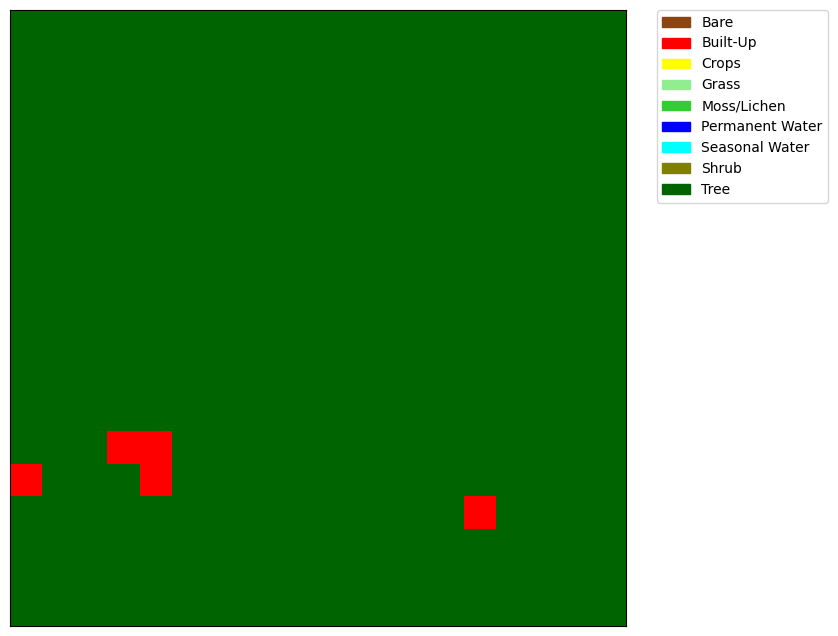

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


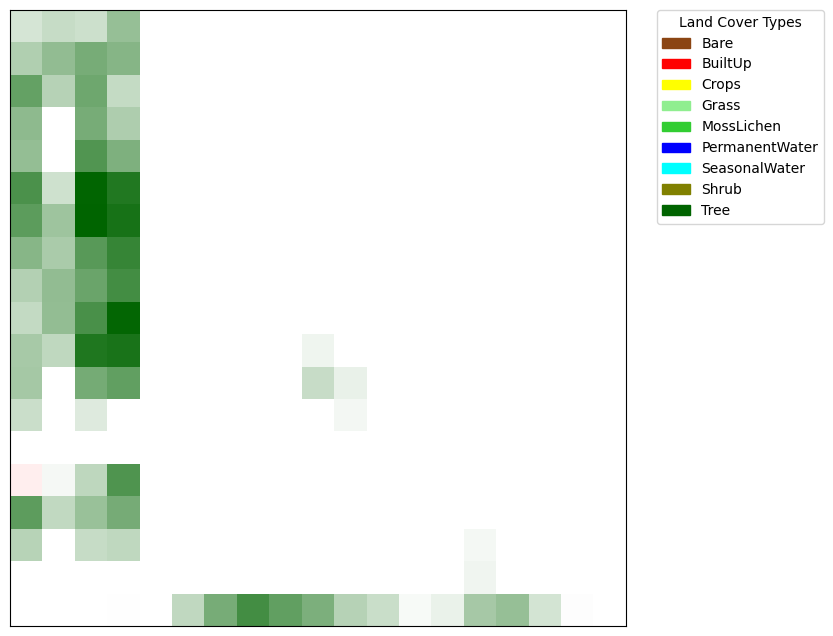

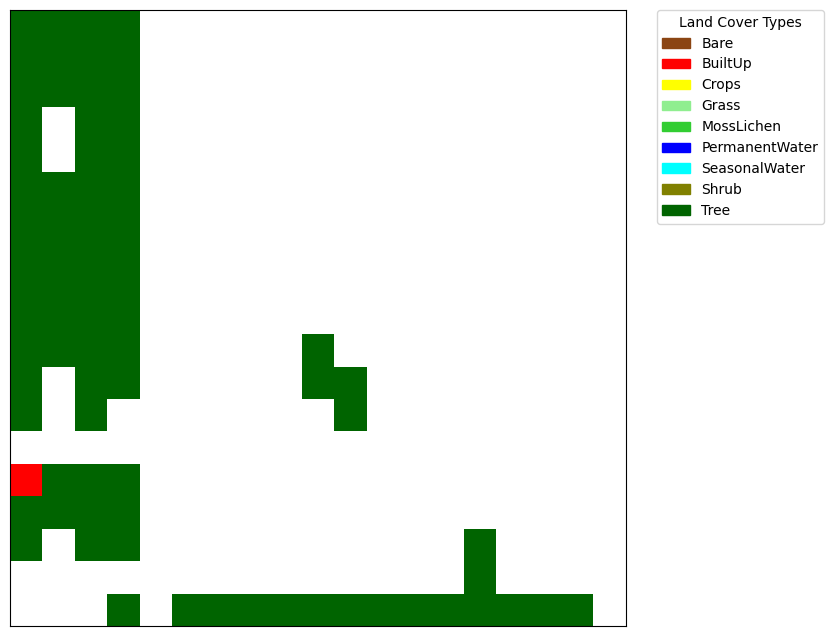

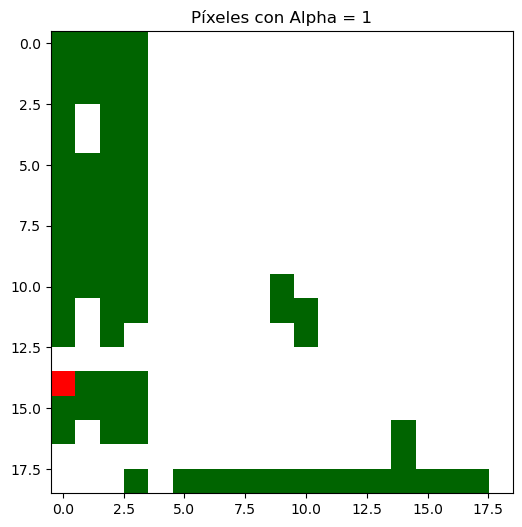

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.165317
1     0   1              1        0.225979
2     0   2              1        0.202246
3     0   3              1        0.413155
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              4        0.349176
357  18  15              4        0.414828
358  18  16              4        0.176088
359  18  17              4        0.010433
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    49
1     1   0       Tree    49
2     2   0       Tree    49
3     3   0       Tree    49
4     4   0       Tree    49
..   ..  ..        ...   ...
356  14  18       Tree    49
357  15  18       Tree    49
358  16  18       Tree    49
359  17  18       Tree    49
360  18  18       Tree    49

[361 rows x 4 columns]
50


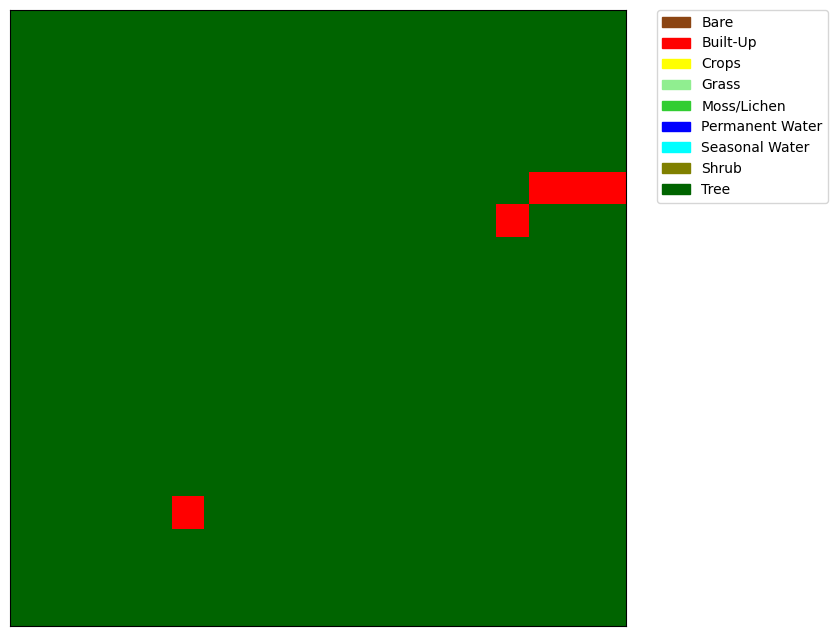

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


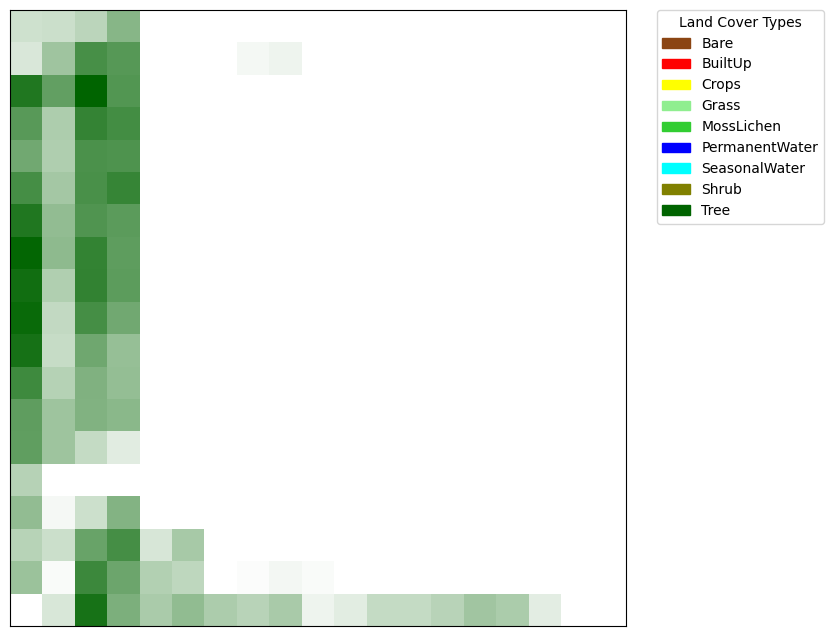

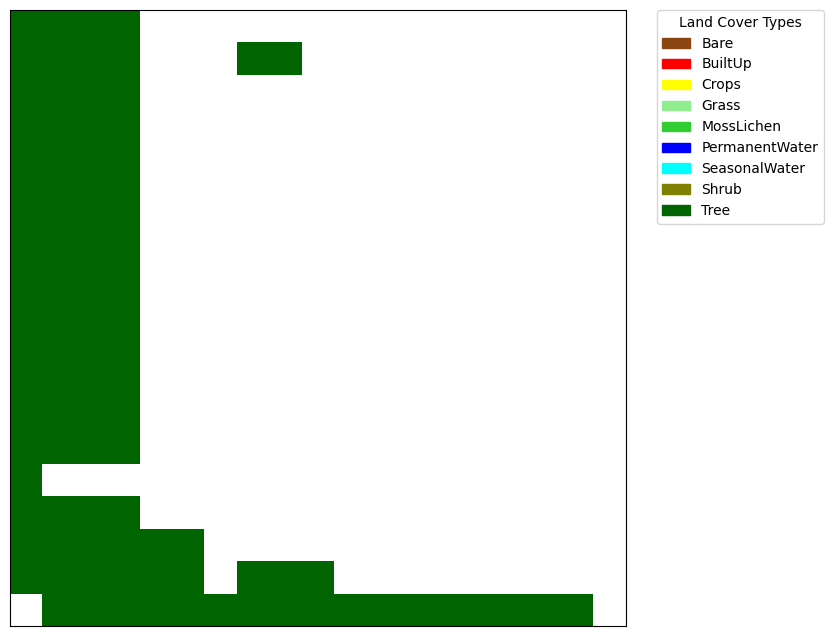

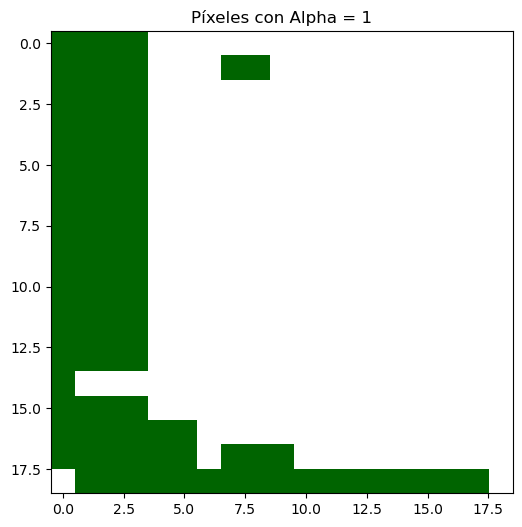

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.195884
1     0   1              1        0.207741
2     0   2              1        0.266959
3     0   3              1        0.472316
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              1        0.372468
357  18  15              1        0.329695
358  18  16              1        0.111131
359  18  17              1        0.002129
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    50
1     1   0       Tree    50
2     2   0       Tree    50
3     3   0       Tree    50
4     4   0       Tree    50
..   ..  ..        ...   ...
356  14  18       Tree    50
357  15  18       Tree    50
358  16  18       Tree    50
359  17  18       Tree    50
360  18  18       Tree    50

[361 rows x 4 columns]
51


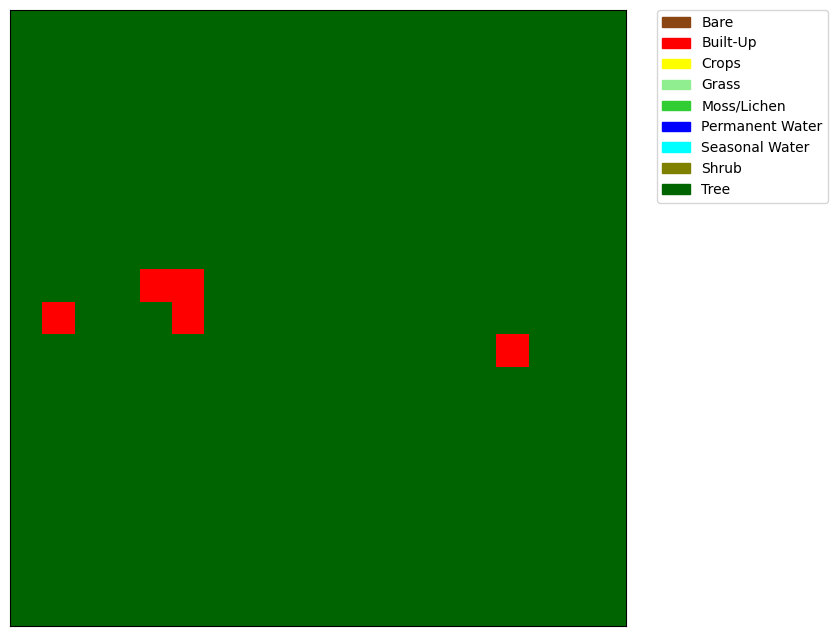

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


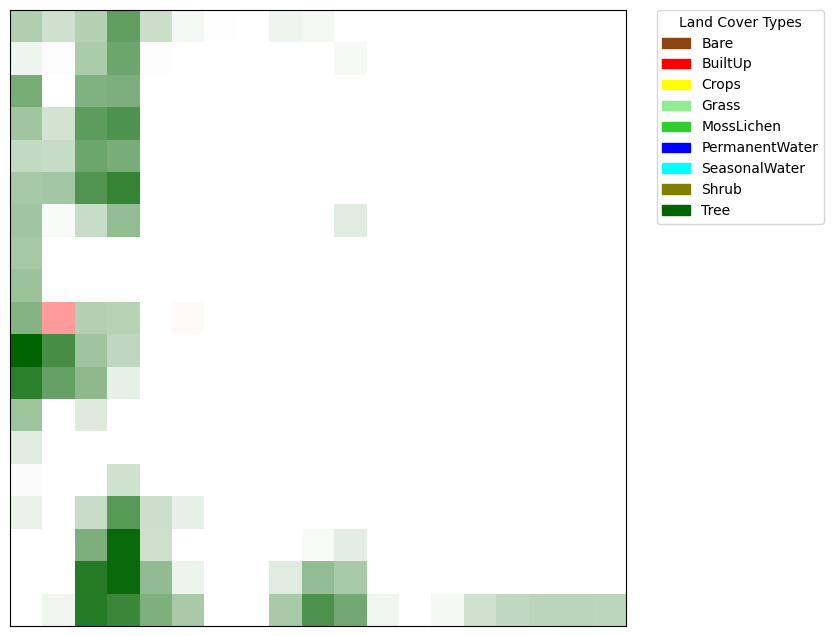

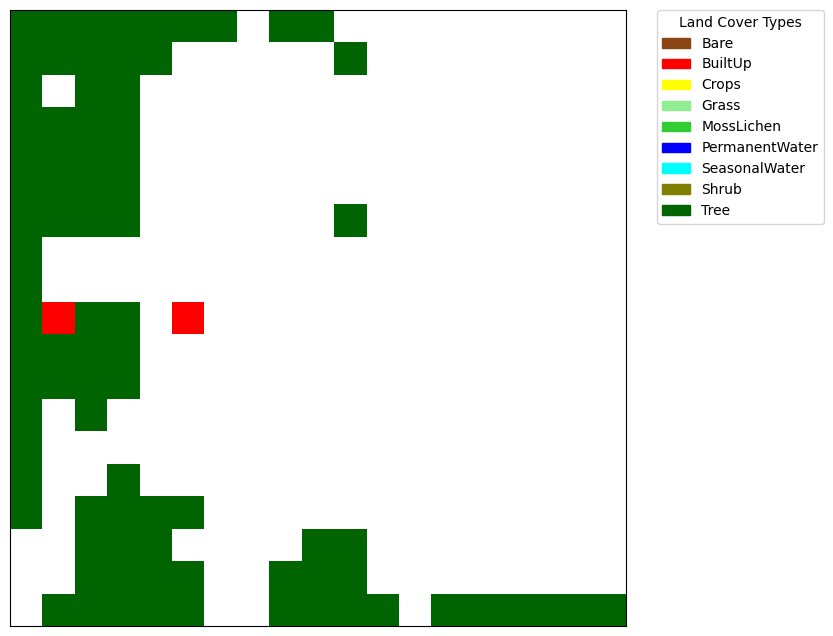

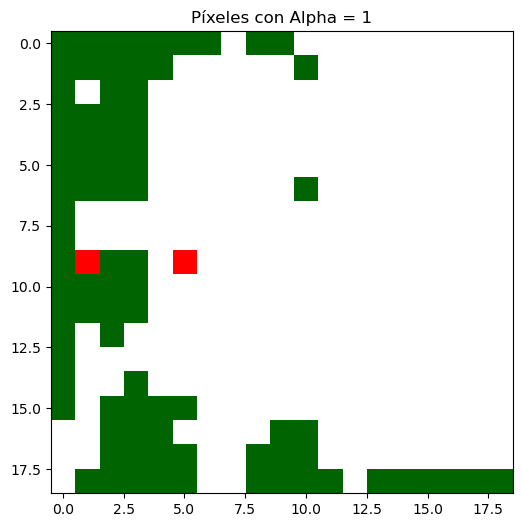

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.311679
1     0   1              1        0.192246
2     0   2              1        0.304694
3     0   3              1        0.623766
4     0   4              1        0.210139
..   ..  ..            ...             ...
356  18  14              7        0.188667
357  18  15              7        0.252438
358  18  16              7        0.269427
359  18  17              7        0.275953
360  18  18              7        0.265337

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    51
1     1   0       Tree    51
2     2   0       Tree    51
3     3   0       Tree    51
4     4   0       Tree    51
..   ..  ..        ...   ...
356  14  18       Tree    51
357  15  18       Tree    51
358  16  18       Tree    51
359  17  18       Tree    51
360  18  18       Tree    51

[361 rows x 4 columns]
52


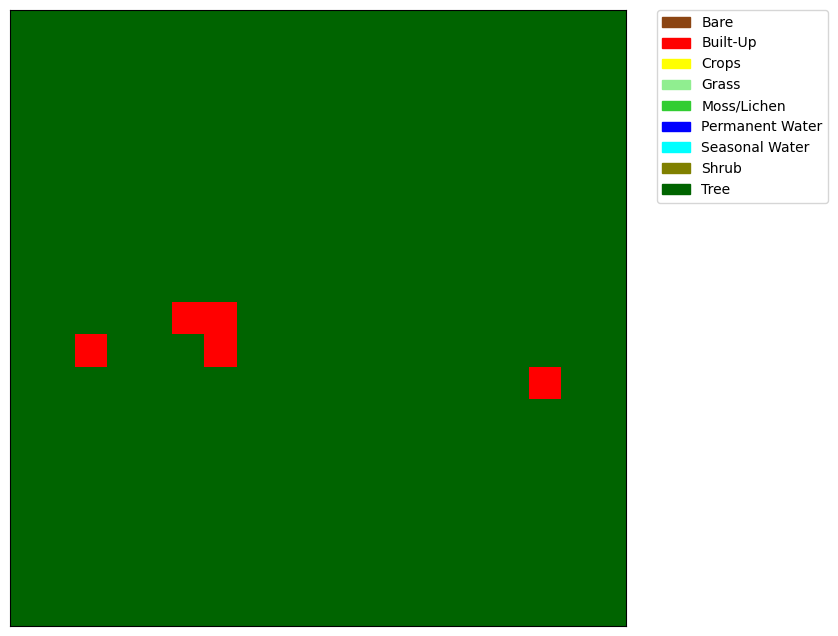

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


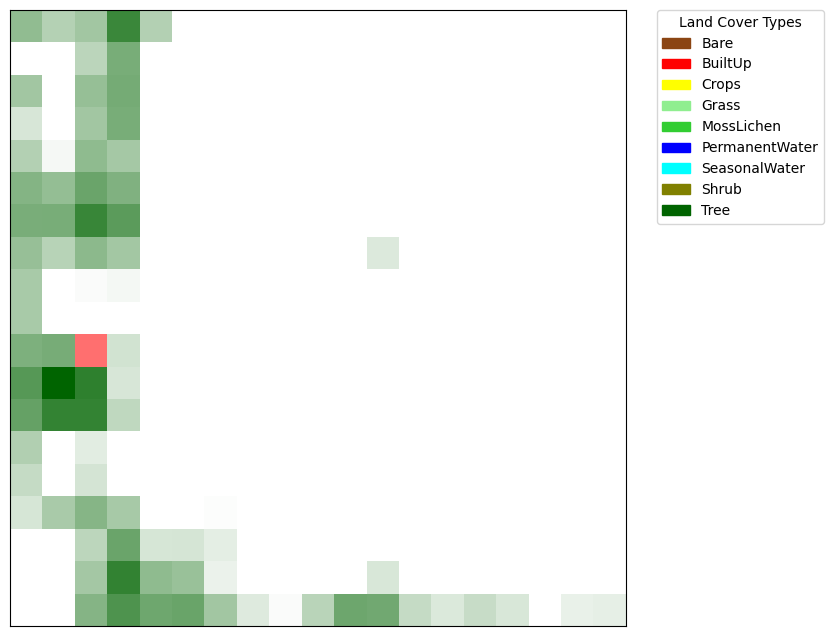

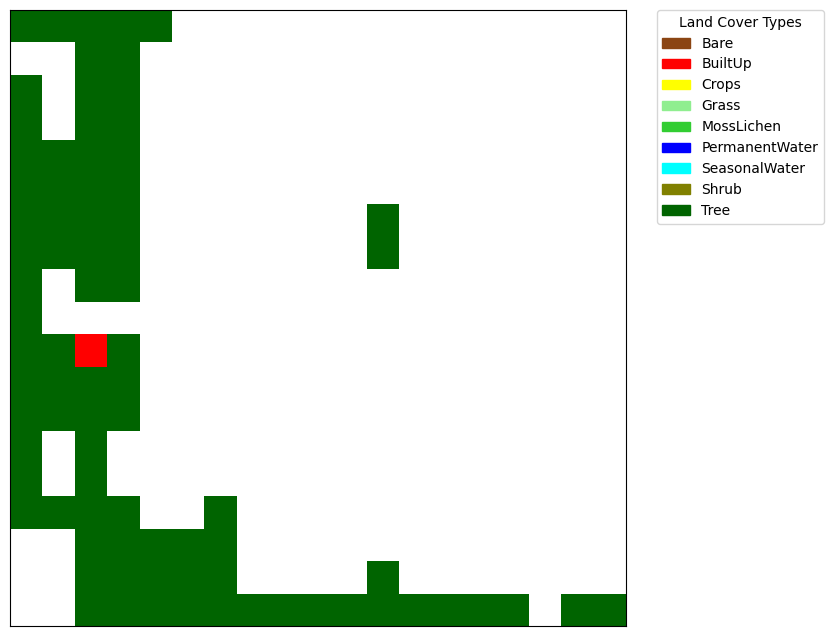

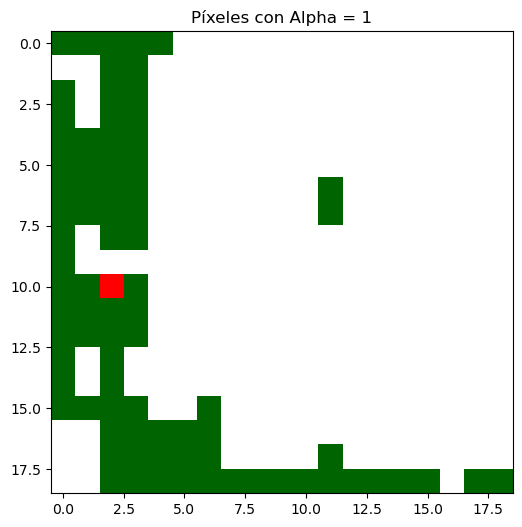

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.434302
1     0   1              1        0.297266
2     0   2              1        0.365798
3     0   3              1        0.775578
4     0   4              1        0.301466
..   ..  ..            ...             ...
356  18  14              1        0.221970
357  18  15              1        0.156006
358  18  16              0        0.000000
359  18  17              3        0.089143
360  18  18              3        0.100636

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    52
1     1   0       Tree    52
2     2   0       Tree    52
3     3   0       Tree    52
4     4   0       Tree    52
..   ..  ..        ...   ...
356  14  18       Tree    52
357  15  18       Tree    52
358  16  18       Tree    52
359  17  18       Tree    52
360  18  18       Tree    52

[361 rows x 4 columns]
53


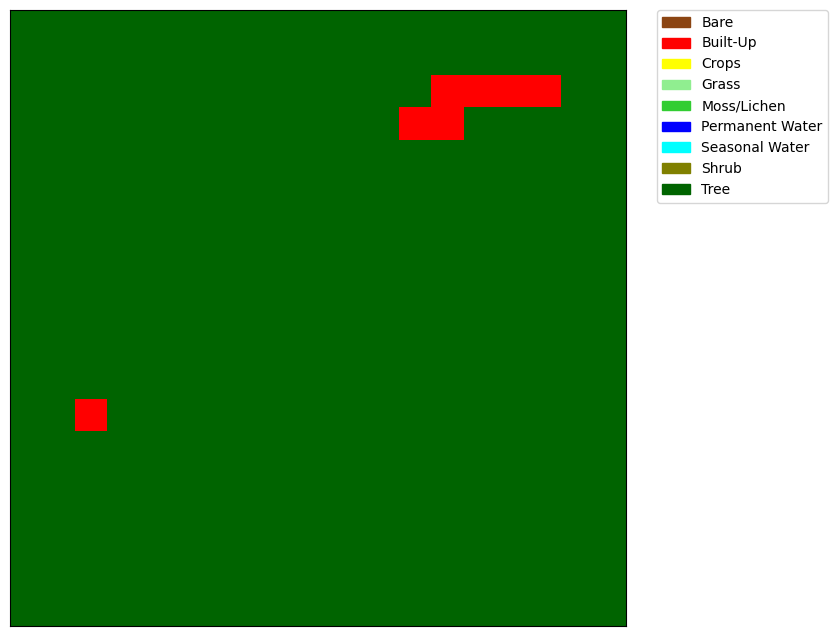

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


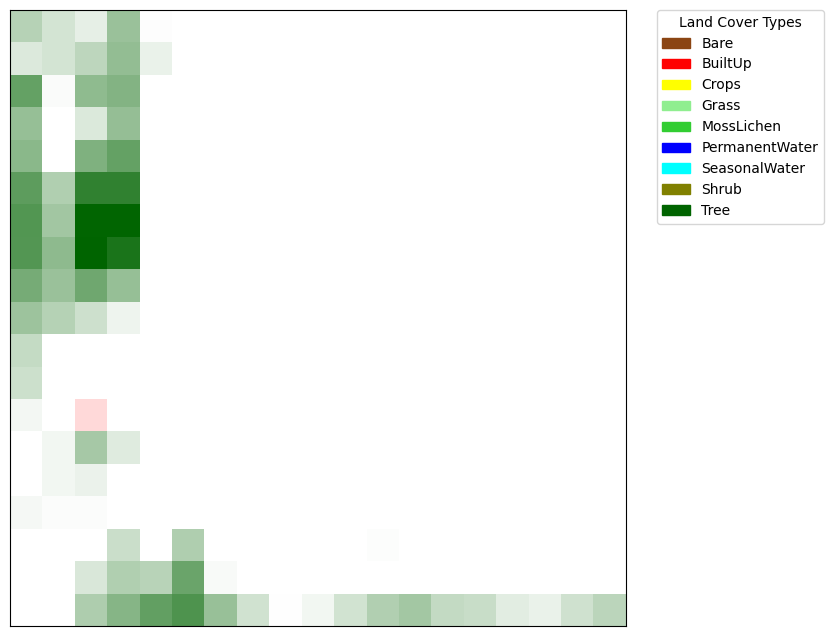

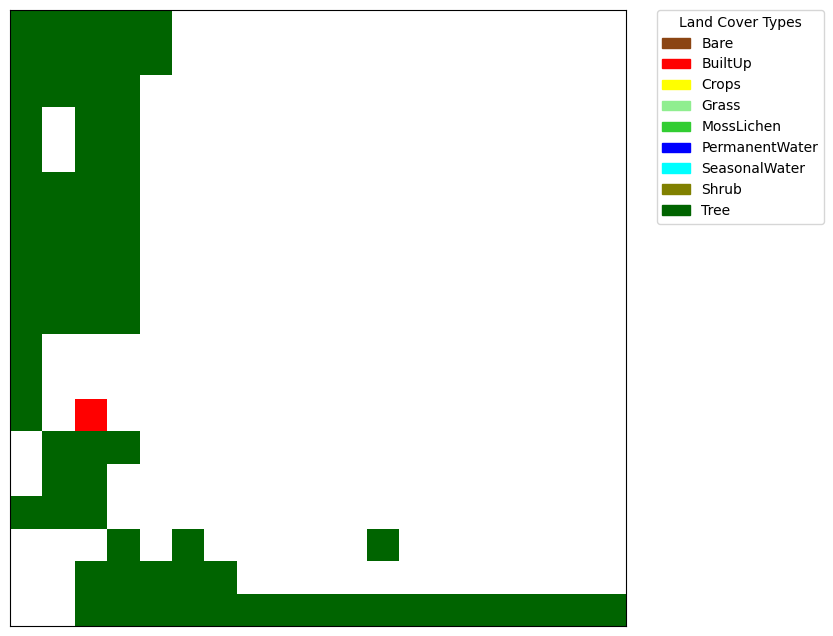

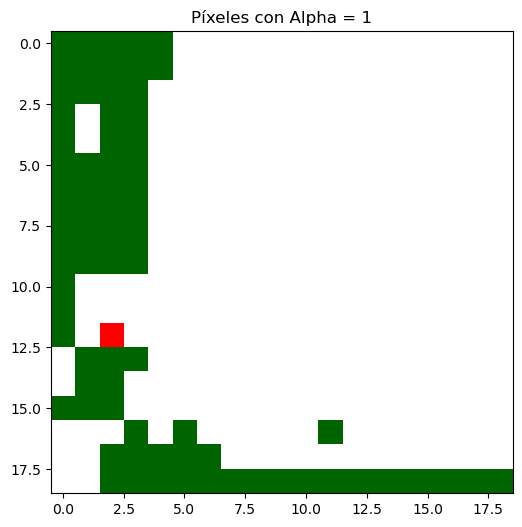

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.289893
1     0   1              1        0.176375
2     0   2              1        0.098077
3     0   3              1        0.397124
4     0   4              1        0.009875
..   ..  ..            ...             ...
356  18  14              1        0.219389
357  18  15              1        0.117033
358  18  16              1        0.084089
359  18  17              1        0.191074
360  18  18              1        0.269698

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    53
1     1   0       Tree    53
2     2   0       Tree    53
3     3   0       Tree    53
4     4   0       Tree    53
..   ..  ..        ...   ...
356  14  18       Tree    53
357  15  18       Tree    53
358  16  18       Tree    53
359  17  18       Tree    53
360  18  18       Tree    53

[361 rows x 4 columns]
54


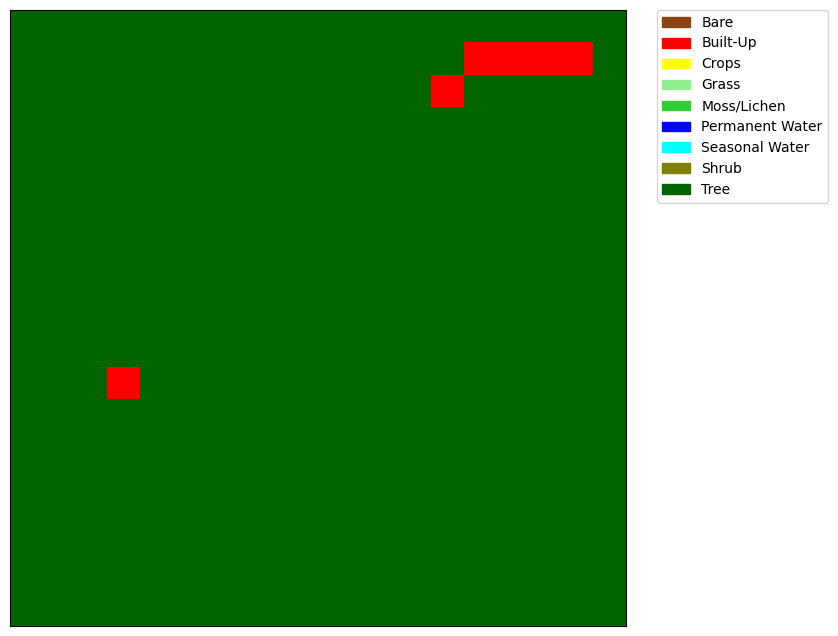

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


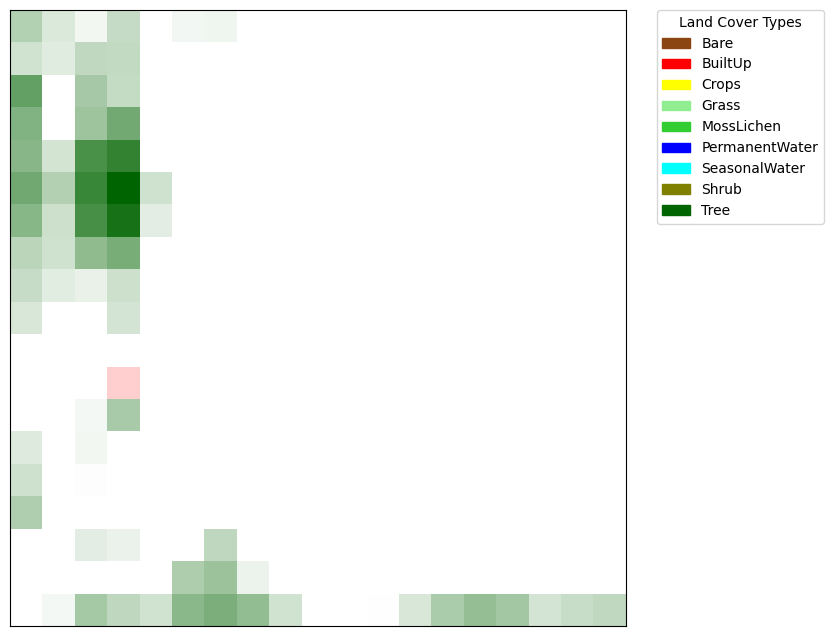

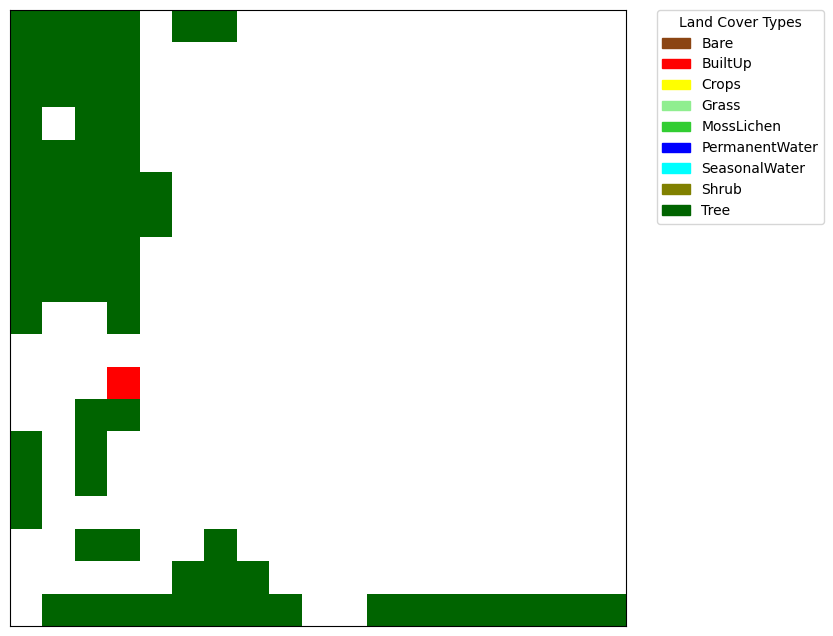

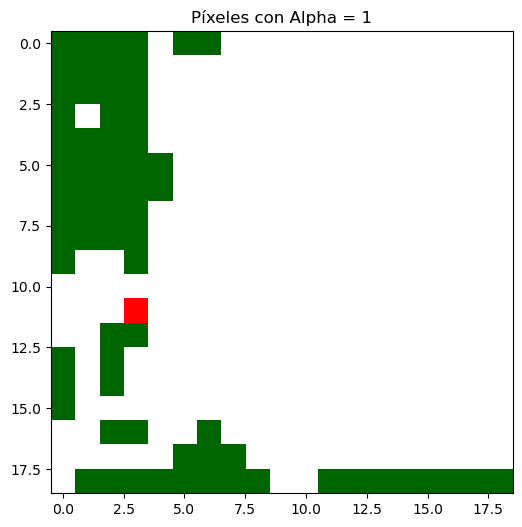

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.304903
1     0   1              1        0.142411
2     0   2              1        0.052947
3     0   3              1        0.228464
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              7        0.417560
357  18  15              7        0.360916
358  18  16              7        0.171820
359  18  17              7        0.218501
360  18  18              7        0.254709

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    54
1     1   0       Tree    54
2     2   0       Tree    54
3     3   0       Tree    54
4     4   0       Tree    54
..   ..  ..        ...   ...
356  14  18       Tree    54
357  15  18       Tree    54
358  16  18       Tree    54
359  17  18       Tree    54
360  18  18       Tree    54

[361 rows x 4 columns]
55


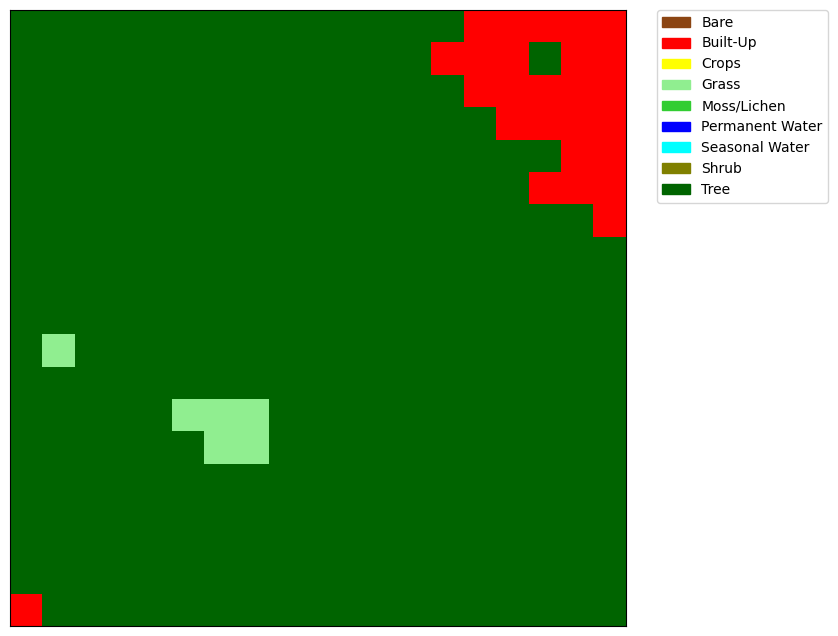

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


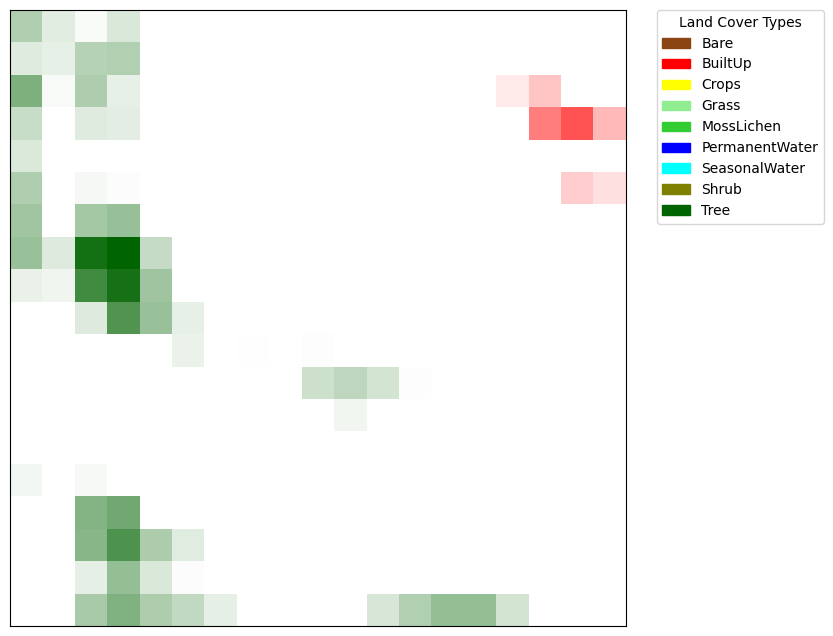

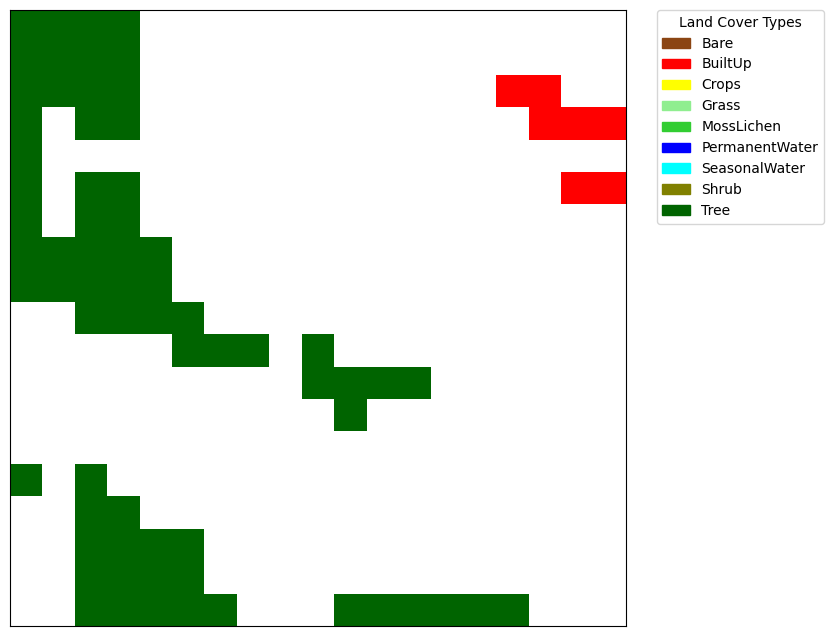

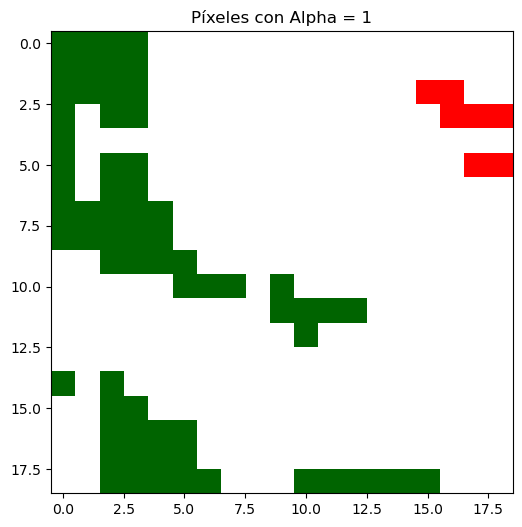

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.312244
1     0   1              1        0.117266
2     0   2              1        0.024319
3     0   3              1        0.146069
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              7        0.419954
357  18  15              7        0.175998
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    55
1     1   0       Tree    55
2     2   0       Tree    55
3     3   0       Tree    55
4     4   0       Tree    55
..   ..  ..        ...   ...
356  14  18       Tree    55
357  15  18       Tree    55
358  16  18       Tree    55
359  17  18       Tree    55
360  18  18       Tree    55

[361 rows x 4 columns]
56


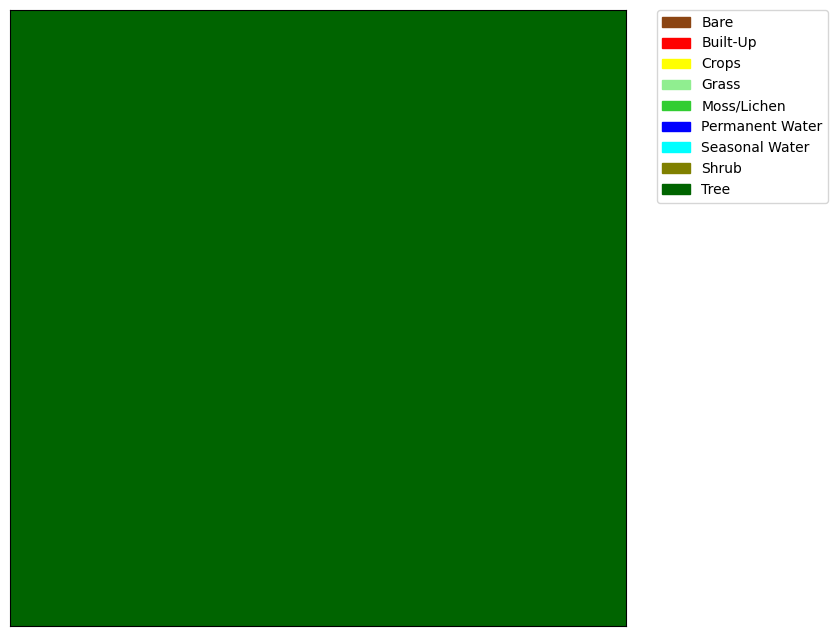

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


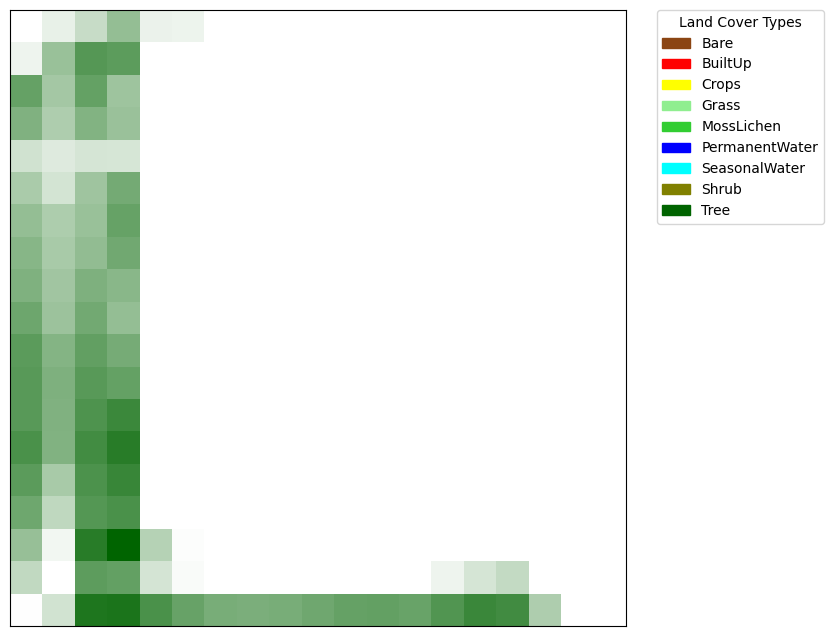

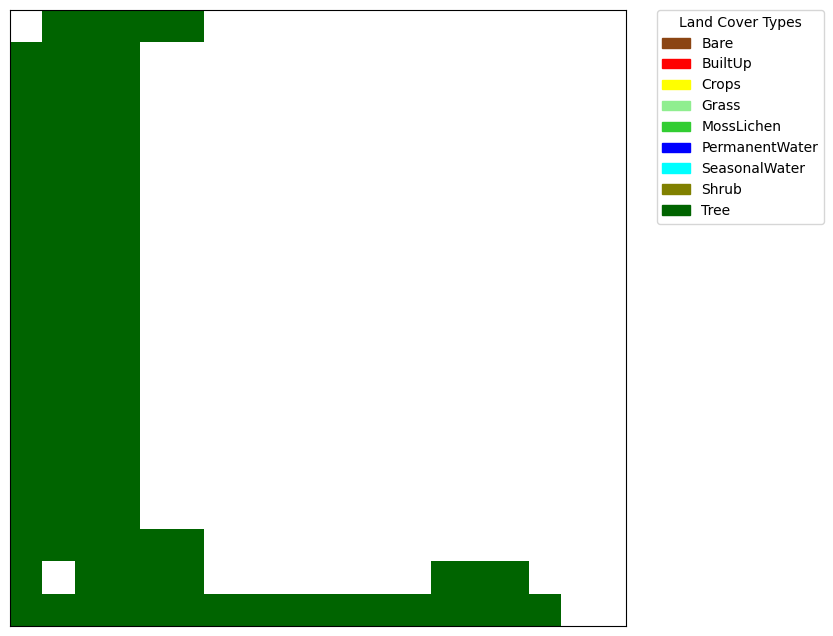

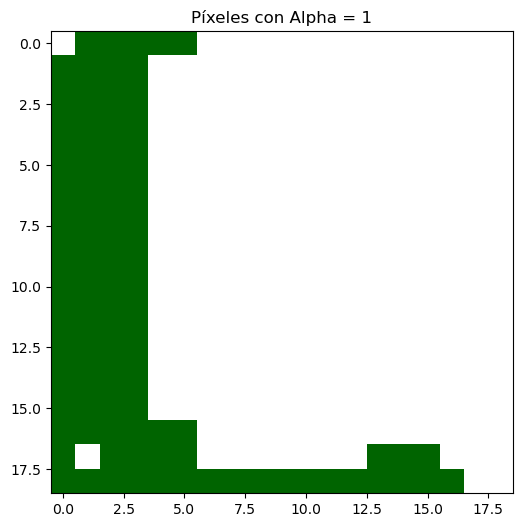

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              1        0.090331
2     0   2              1        0.219802
3     0   3              1        0.422251
4     0   4              1        0.078580
..   ..  ..            ...             ...
356  18  14              1        0.775823
357  18  15              1        0.745545
358  18  16              1        0.318281
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    56
1     1   0       Tree    56
2     2   0       Tree    56
3     3   0       Tree    56
4     4   0       Tree    56
..   ..  ..        ...   ...
356  14  18       Tree    56
357  15  18       Tree    56
358  16  18       Tree    56
359  17  18       Tree    56
360  18  18       Tree    56

[361 rows x 4 columns]
57


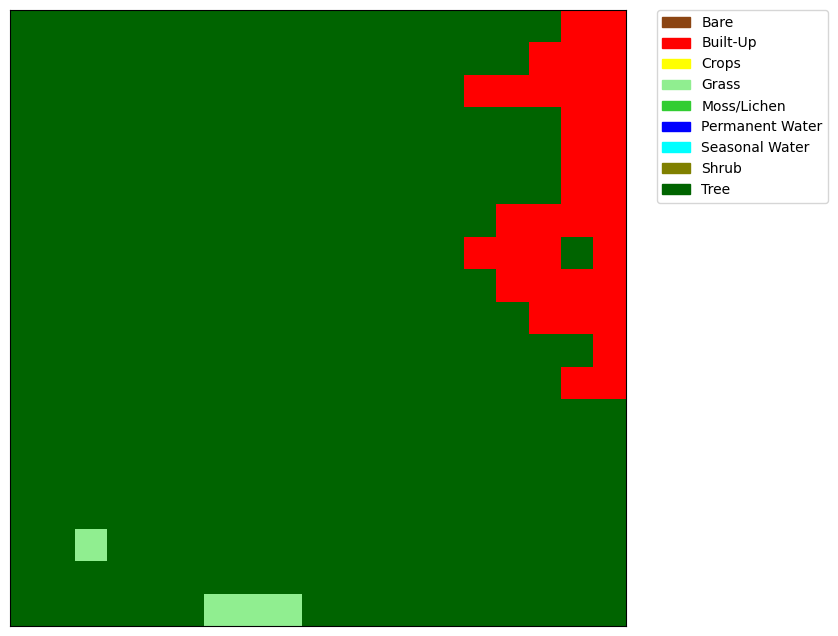

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


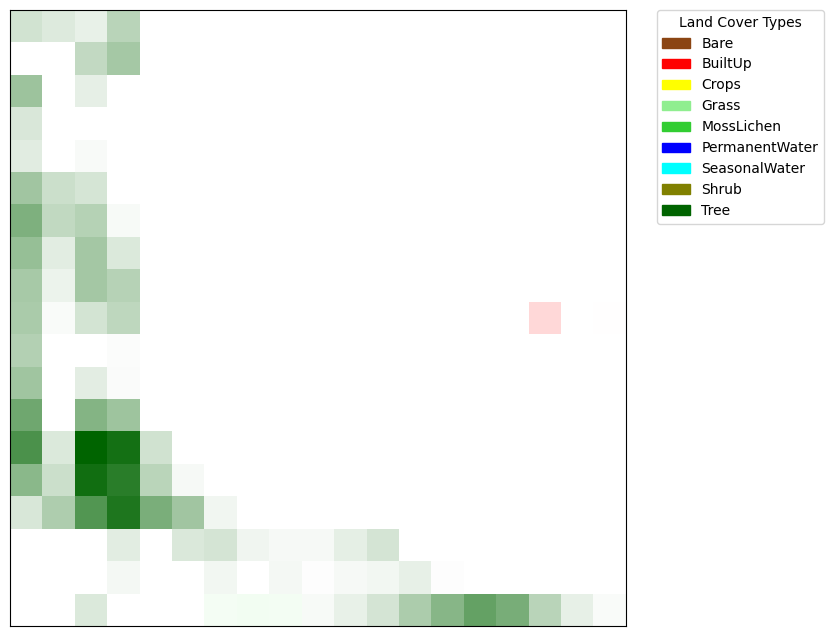

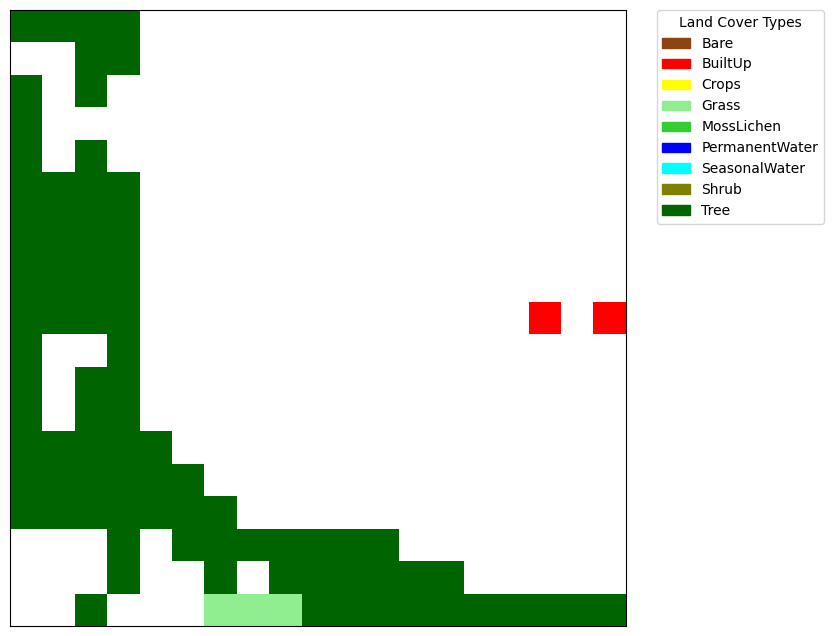

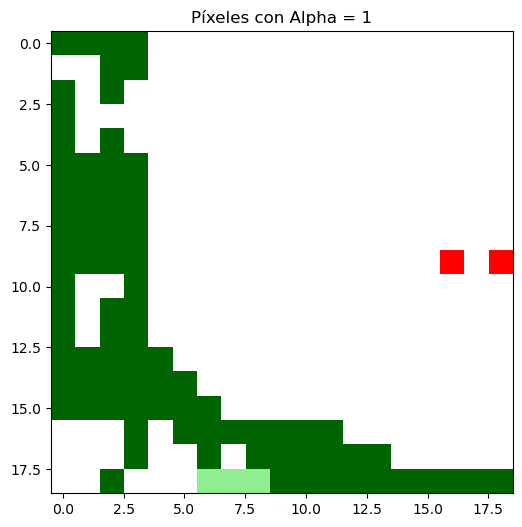

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.183021
1     0   1              1        0.136116
2     0   2              1        0.093514
3     0   3              1        0.277528
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              2        0.608806
357  18  15              2        0.532628
358  18  16              2        0.276832
359  18  17              2        0.097289
360  18  18              2        0.025737

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    57
1     1   0       Tree    57
2     2   0       Tree    57
3     3   0       Tree    57
4     4   0       Tree    57
..   ..  ..        ...   ...
356  14  18       Tree    57
357  15  18       Tree    57
358  16  18       Tree    57
359  17  18       Tree    57
360  18  18       Tree    57

[361 rows x 4 columns]
58


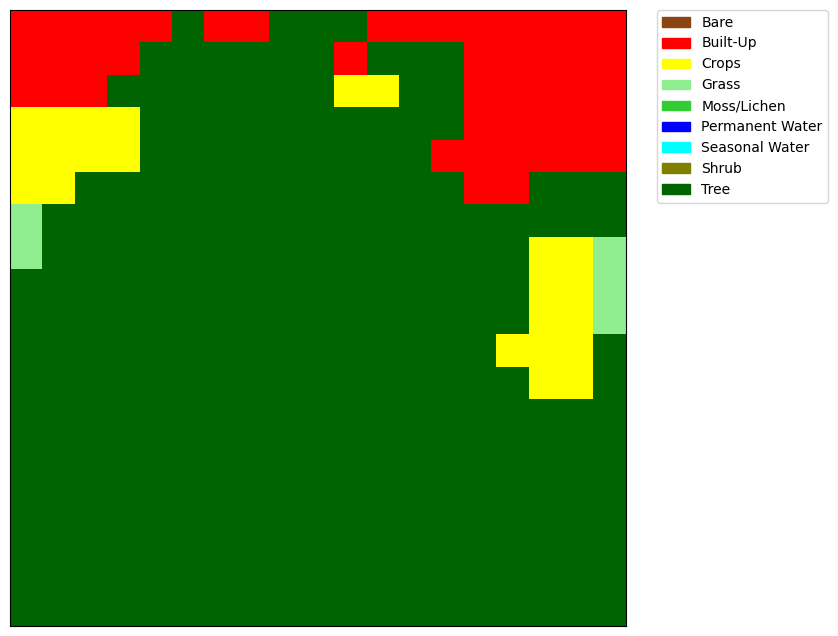

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


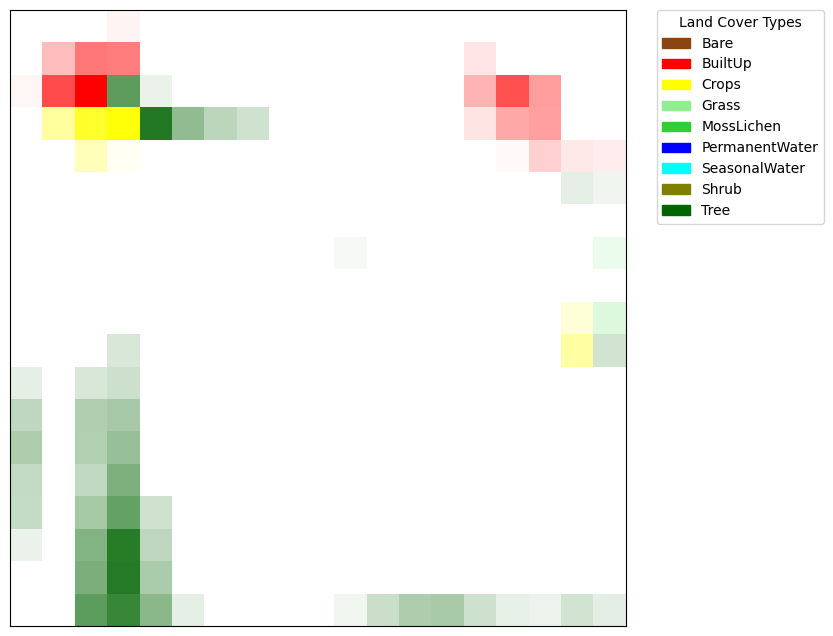

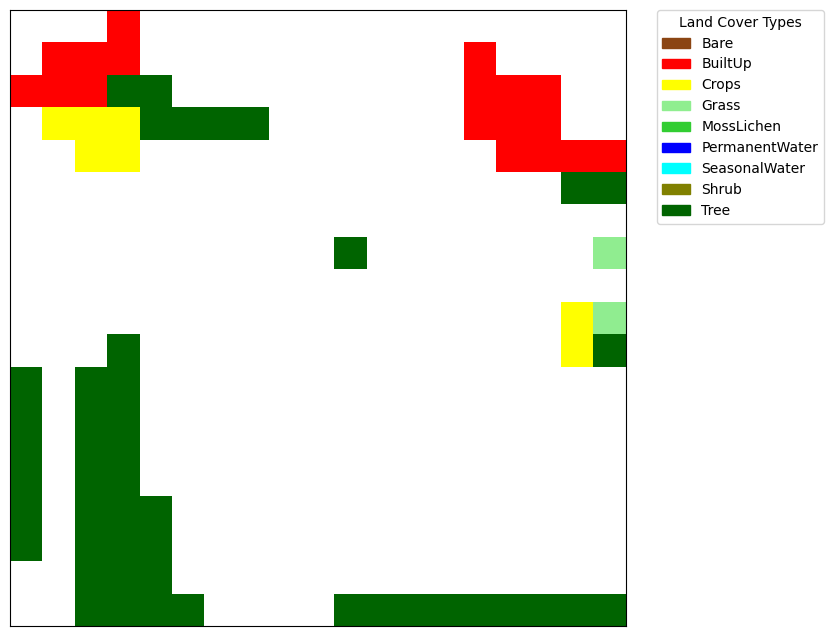

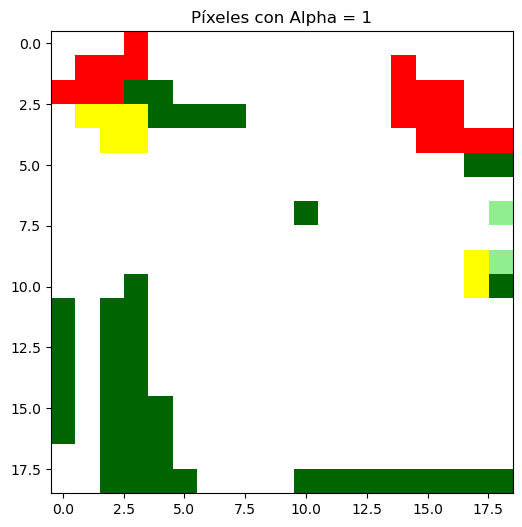

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.044549
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              8        0.196027
357  18  15              8        0.094118
358  18  16              8        0.076960
359  18  17              8        0.184165
360  18  18              8        0.109733

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    58
1     1   0   Built-Up    58
2     2   0   Built-Up    58
3     3   0   Built-Up    58
4     4   0   Built-Up    58
..   ..  ..        ...   ...
356  14  18       Tree    58
357  15  18       Tree    58
358  16  18       Tree    58
359  17  18       Tree    58
360  18  18       Tree    58

[361 rows x 4 columns]
59


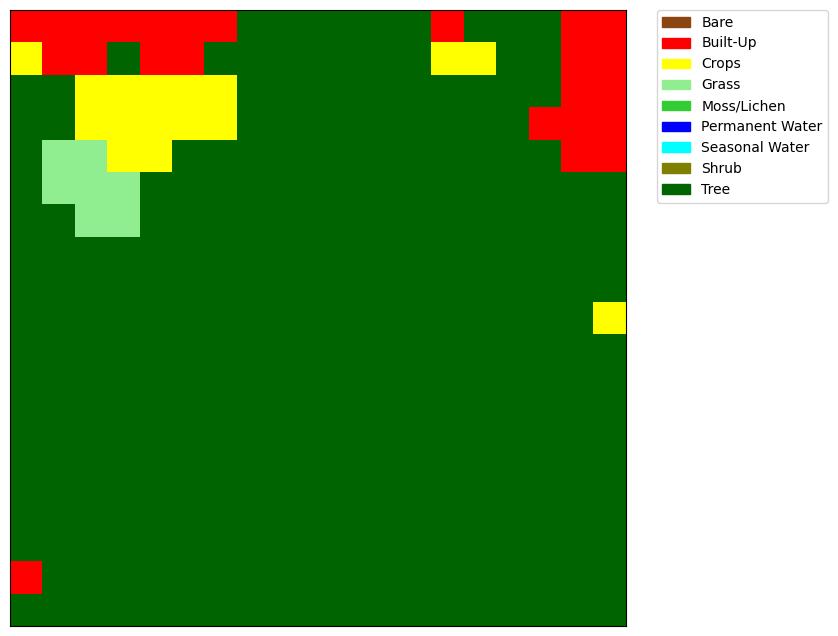

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


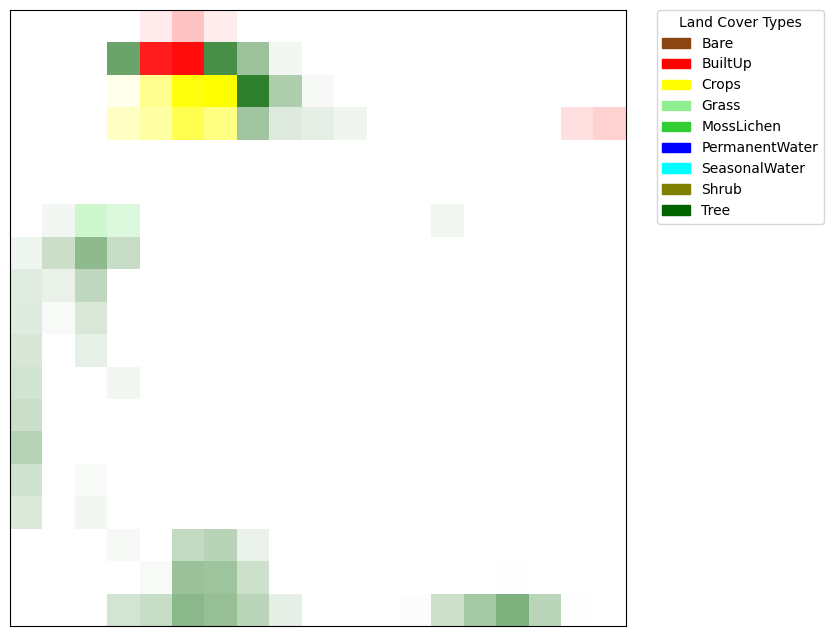

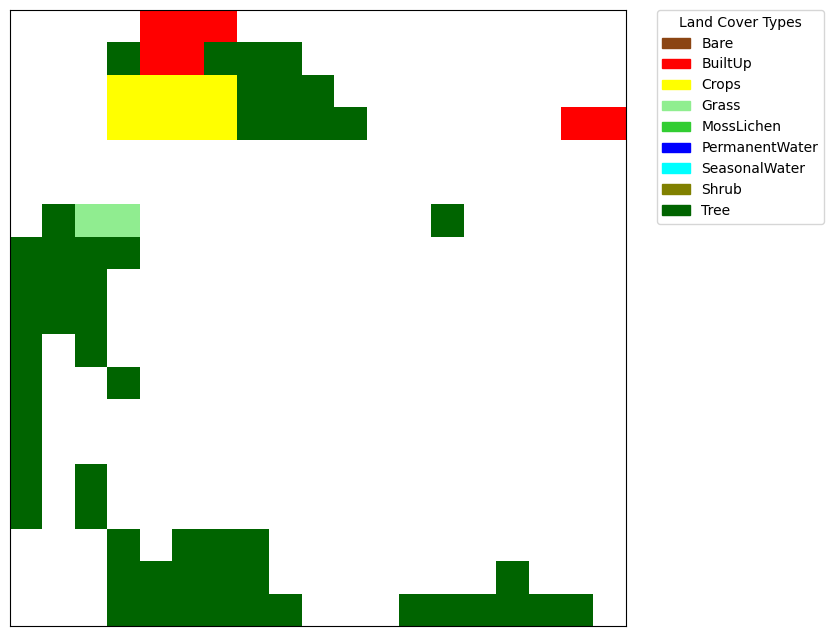

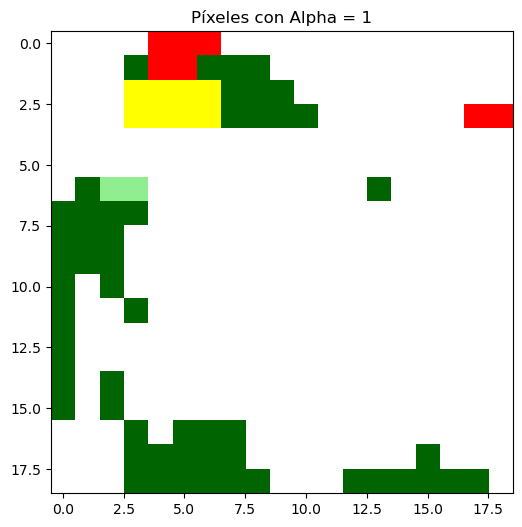

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              1        0.079277
..   ..  ..            ...             ...
356  18  14              6        0.355076
357  18  15              6        0.504782
358  18  16              6        0.270890
359  18  17              6        0.004601
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    59
1     1   0   Built-Up    59
2     2   0   Built-Up    59
3     3   0   Built-Up    59
4     4   0   Built-Up    59
..   ..  ..        ...   ...
356  14  18       Tree    59
357  15  18       Tree    59
358  16  18       Tree    59
359  17  18       Tree    59
360  18  18       Tree    59

[361 rows x 4 columns]
60


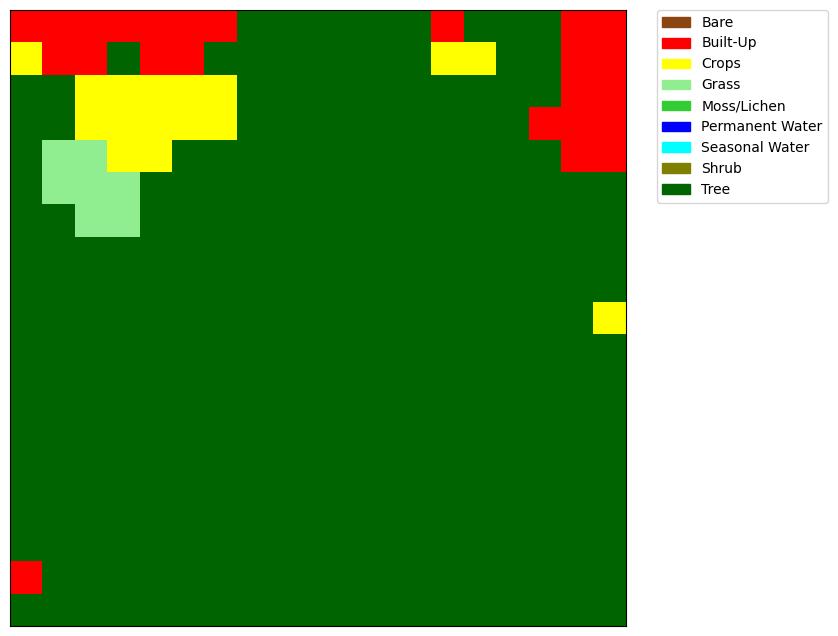

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


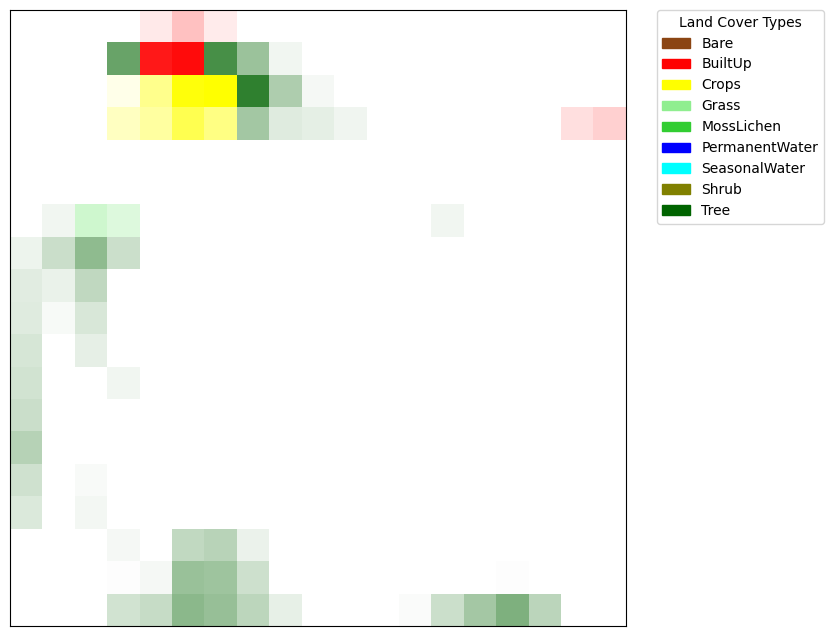

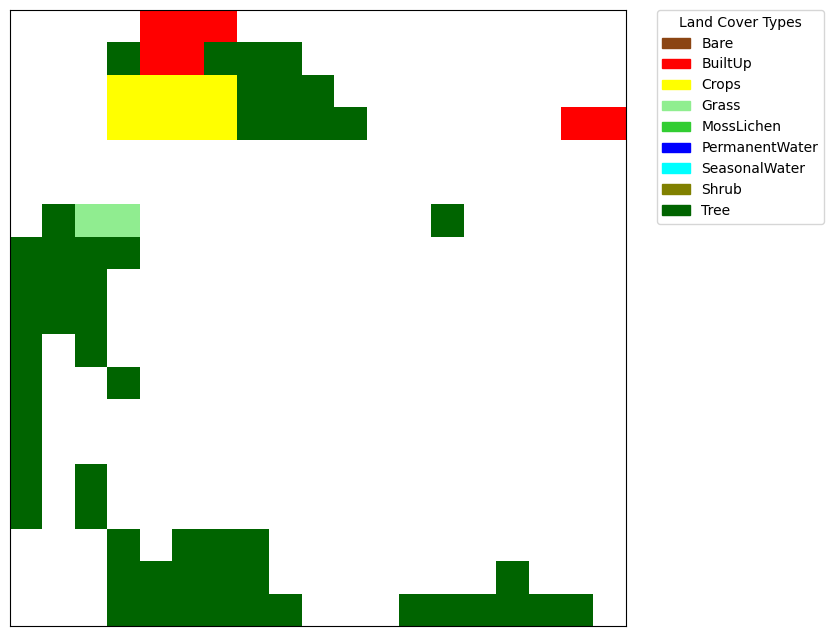

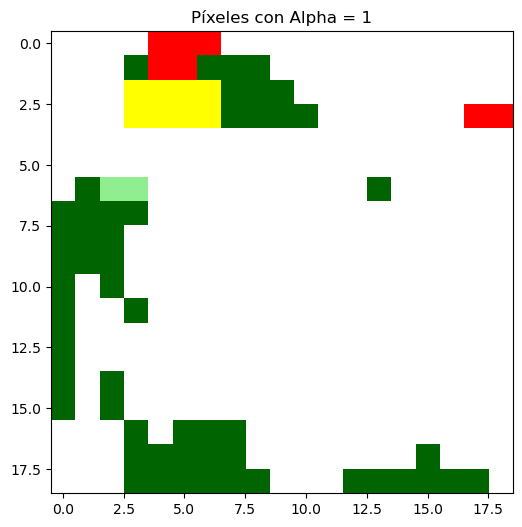

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              1        0.089680
..   ..  ..            ...             ...
356  18  14              6        0.359362
357  18  15              6        0.506034
358  18  16              6        0.266976
359  18  17              6        0.001746
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    60
1     1   0   Built-Up    60
2     2   0   Built-Up    60
3     3   0   Built-Up    60
4     4   0   Built-Up    60
..   ..  ..        ...   ...
356  14  18       Tree    60
357  15  18       Tree    60
358  16  18       Tree    60
359  17  18       Tree    60
360  18  18       Tree    60

[361 rows x 4 columns]
61


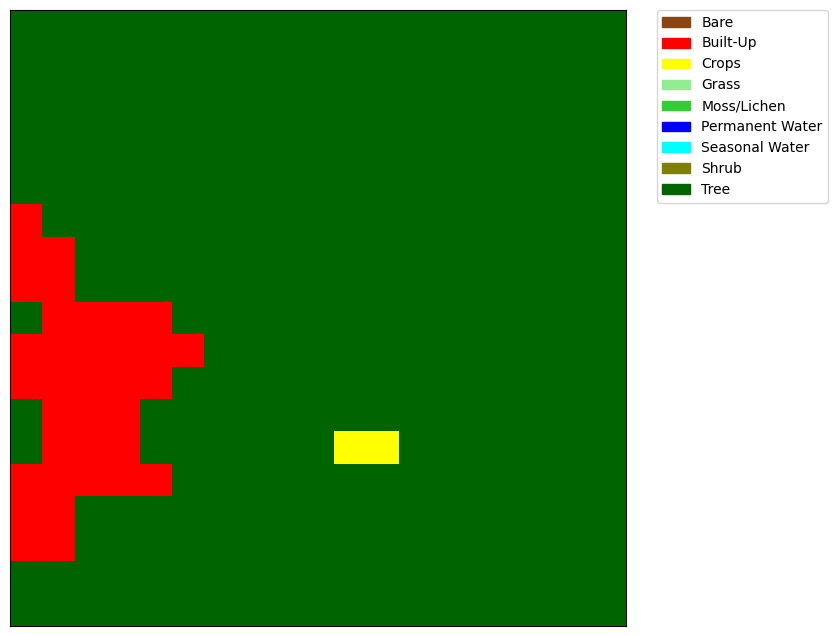

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


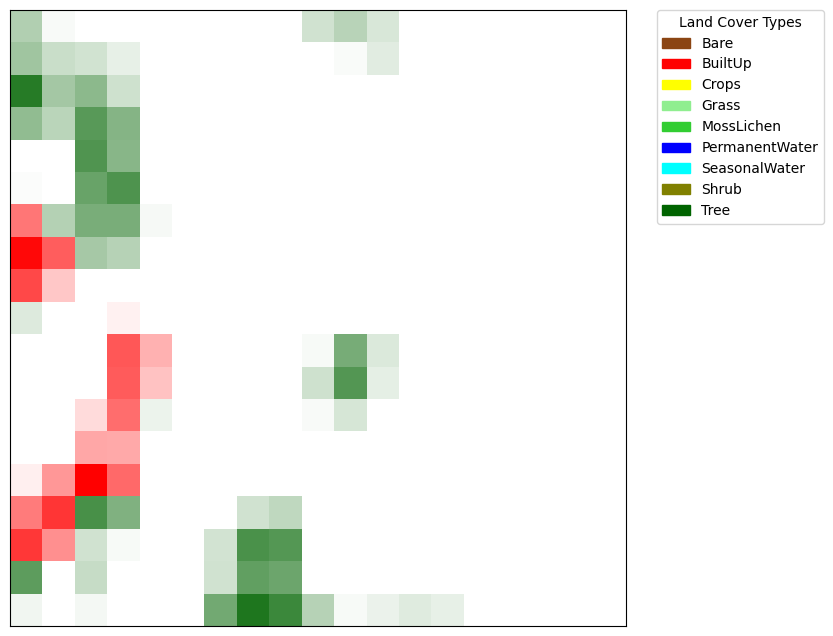

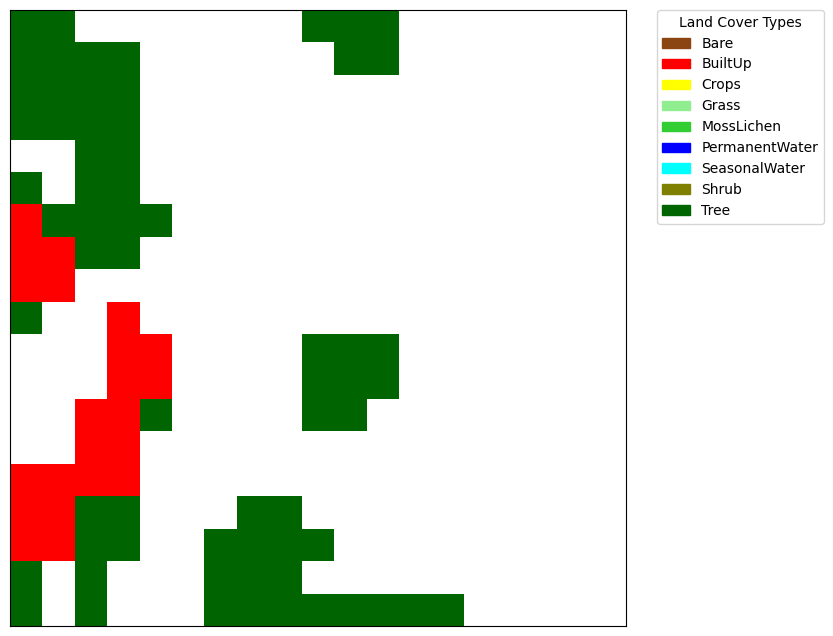

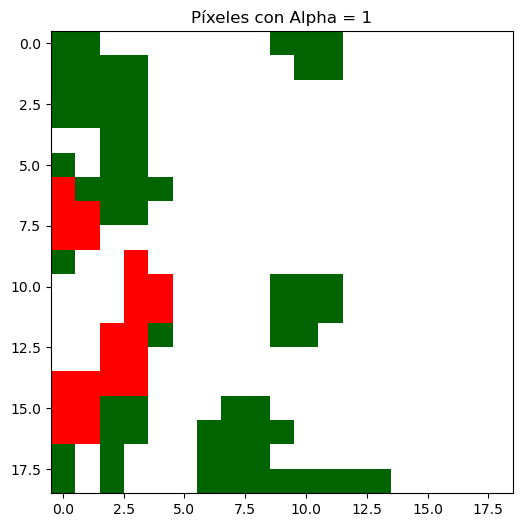

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.307272
1     0   1              1        0.027647
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    61
1     1   0       Tree    61
2     2   0       Tree    61
3     3   0       Tree    61
4     4   0       Tree    61
..   ..  ..        ...   ...
356  14  18       Tree    61
357  15  18       Tree    61
358  16  18       Tree    61
359  17  18       Tree    61
360  18  18       Tree    61

[361 rows x 4 columns]
62


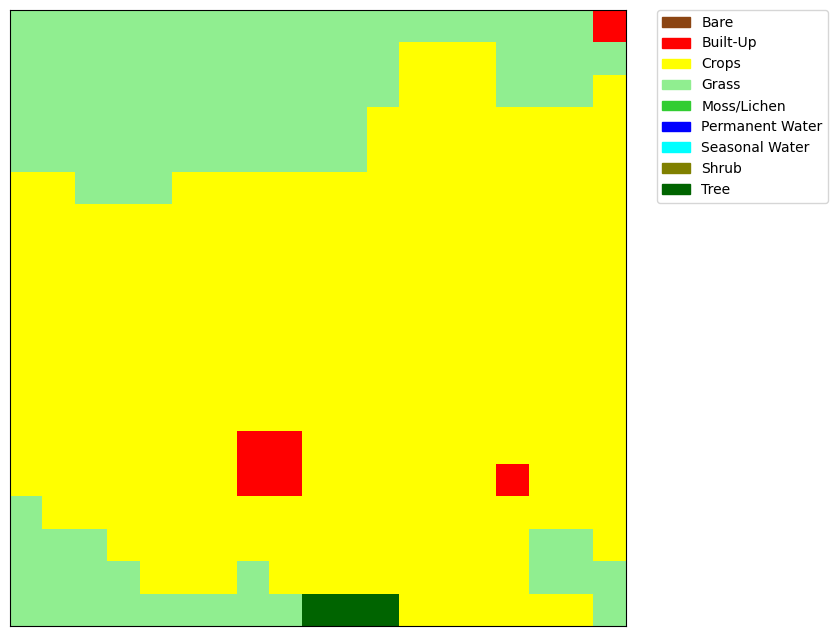

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


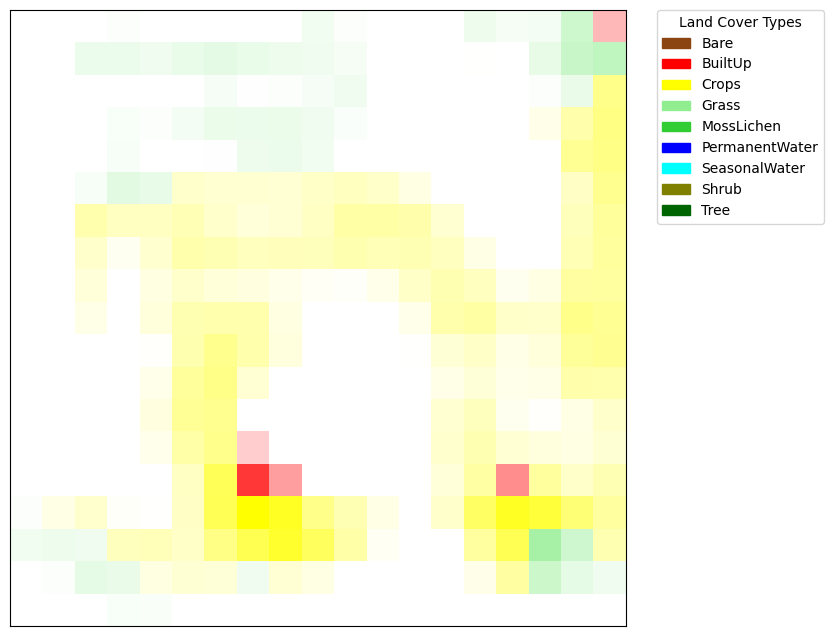

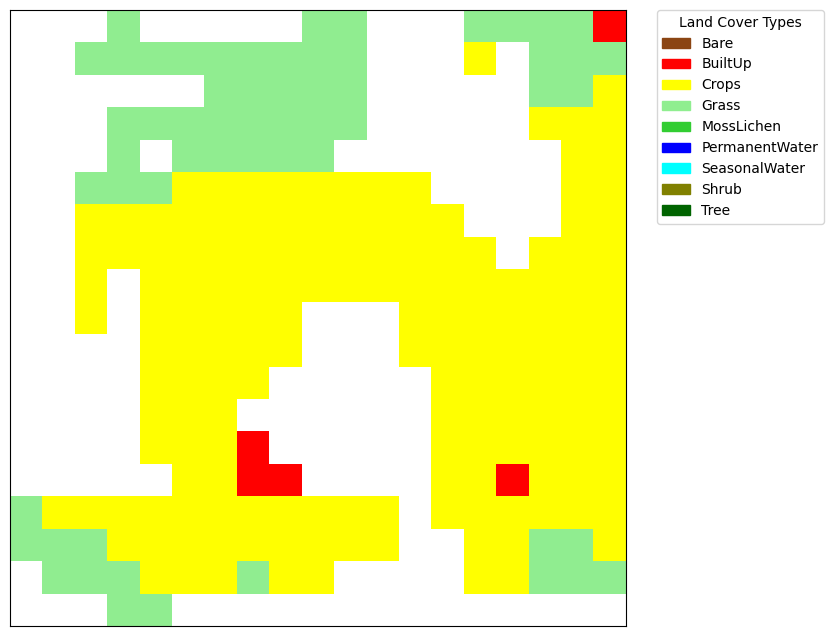

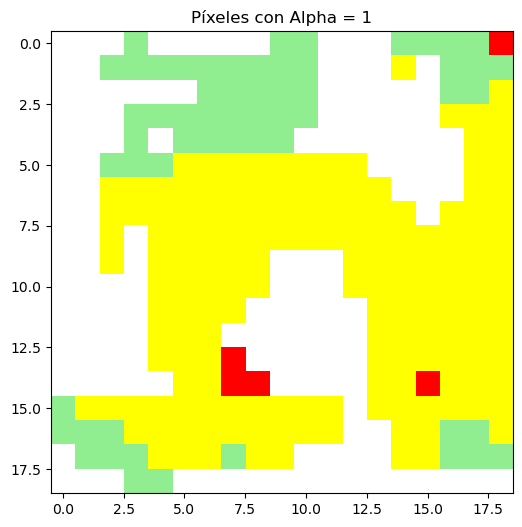

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.022374
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    62
1     1   0      Grass    62
2     2   0      Grass    62
3     3   0      Grass    62
4     4   0      Grass    62
..   ..  ..        ...   ...
356  14  18      Crops    62
357  15  18      Crops    62
358  16  18      Crops    62
359  17  18      Crops    62
360  18  18      Grass    62

[361 rows x 4 columns]
63


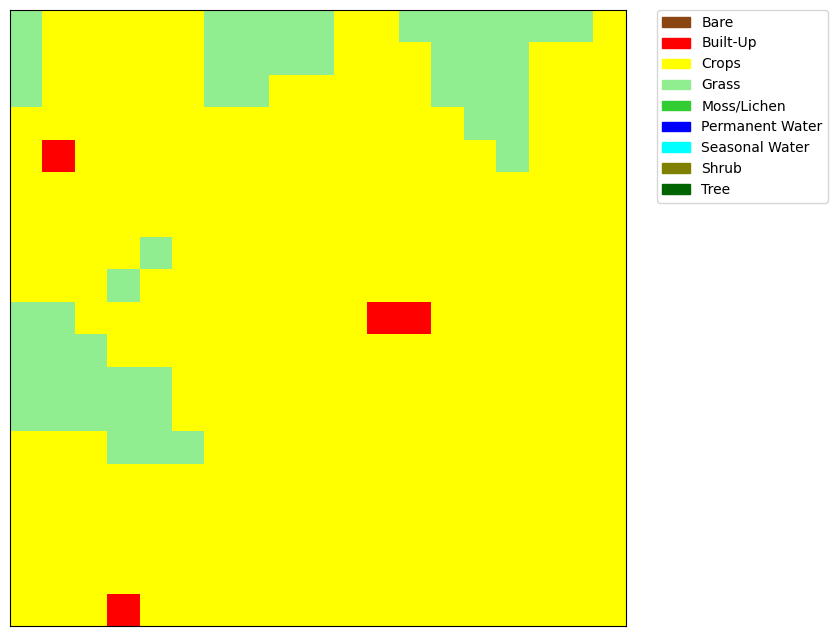

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


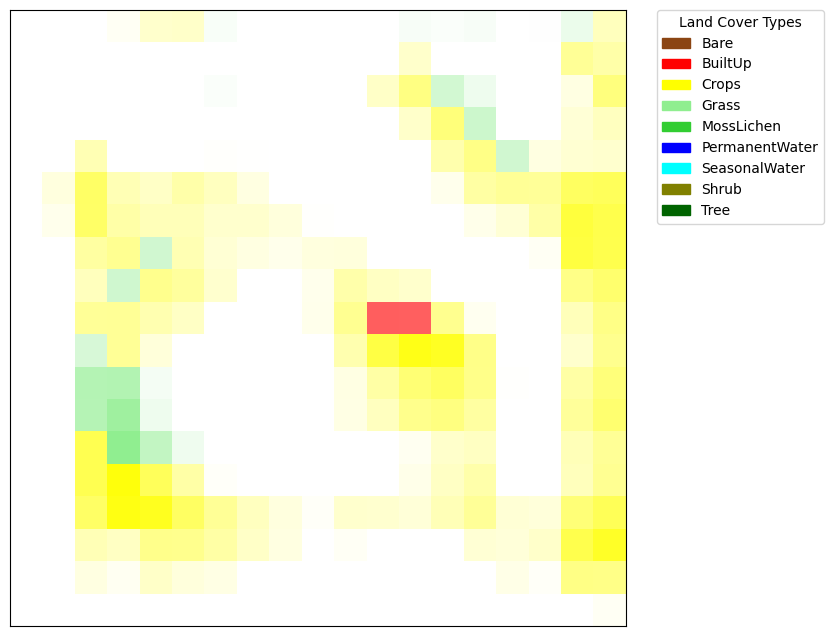

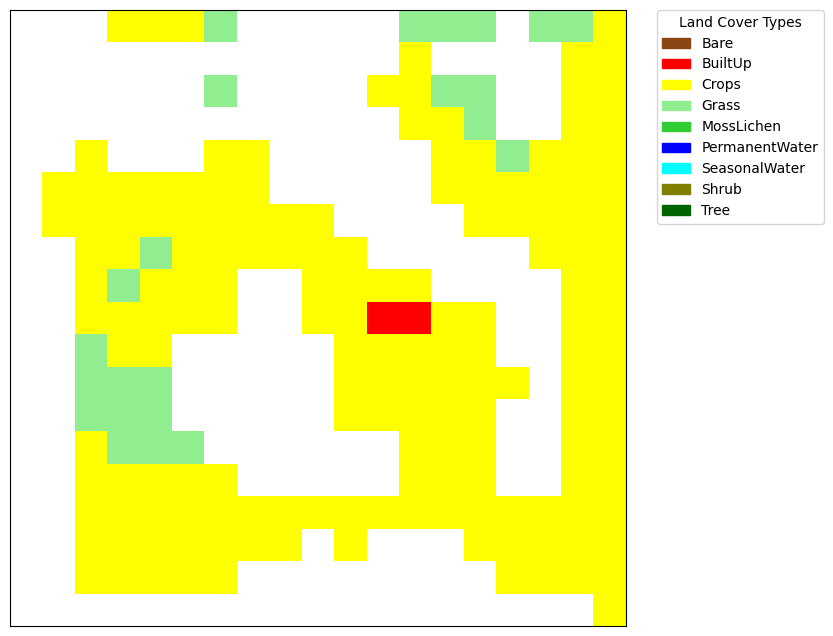

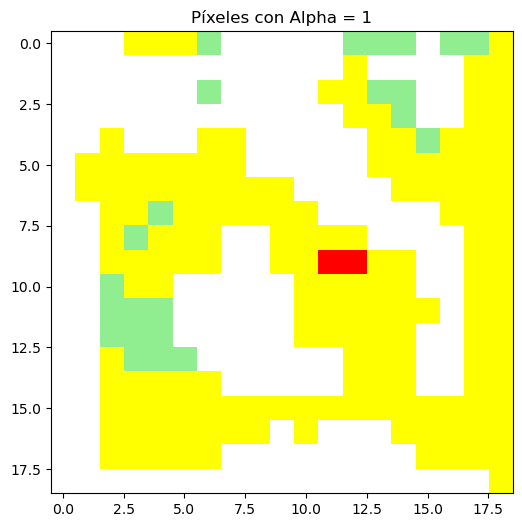

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.045853
4     0   4              1        0.203826
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              2        0.043199

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    63
1     1   0      Crops    63
2     2   0      Crops    63
3     3   0      Crops    63
4     4   0      Crops    63
..   ..  ..        ...   ...
356  14  18      Crops    63
357  15  18      Crops    63
358  16  18      Crops    63
359  17  18      Crops    63
360  18  18      Crops    63

[361 rows x 4 columns]
64


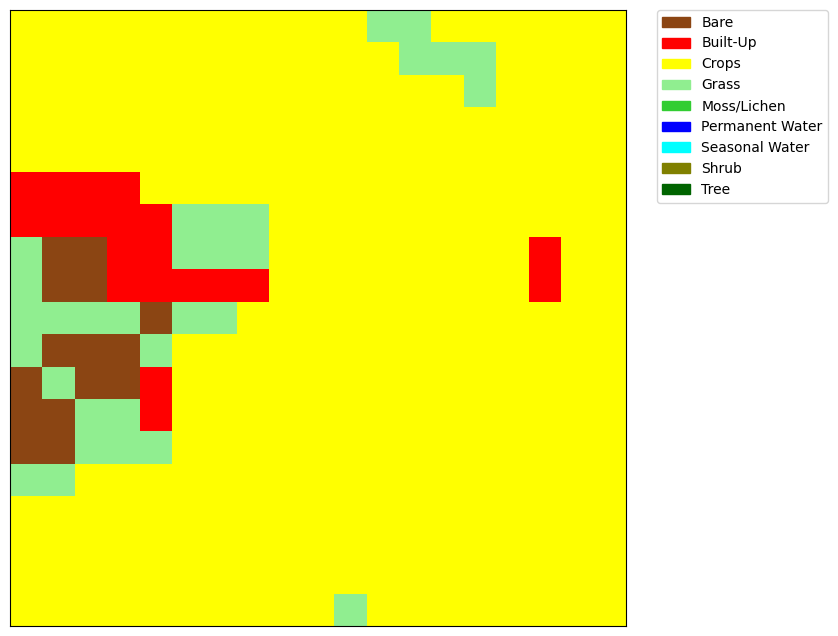

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


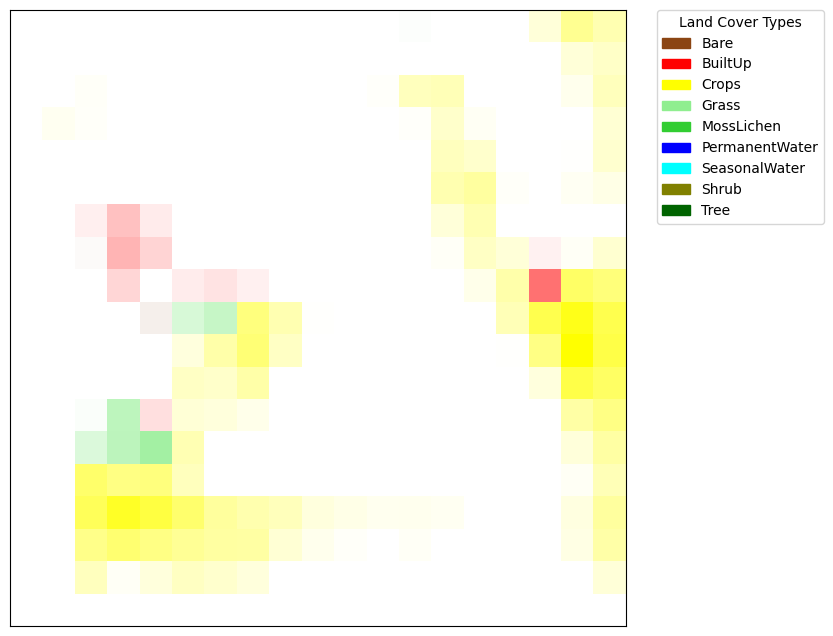

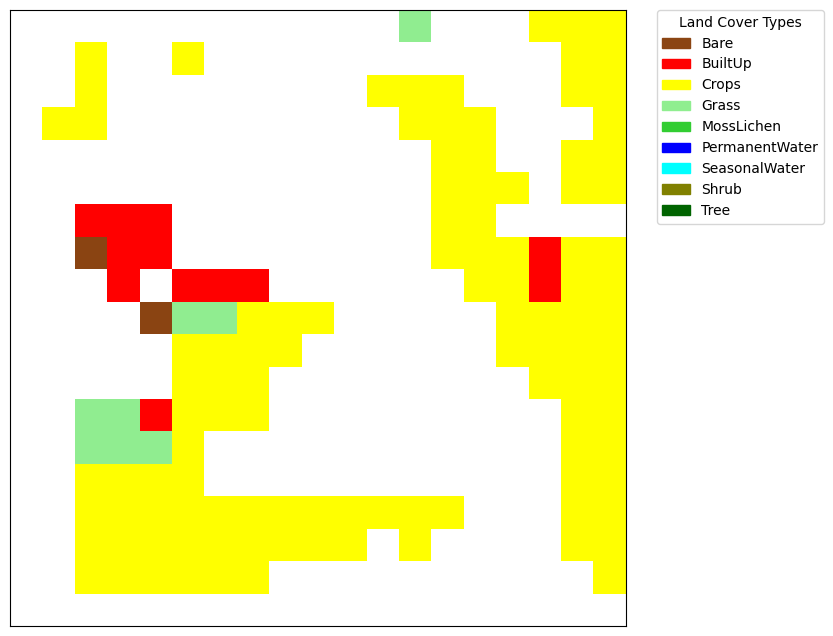

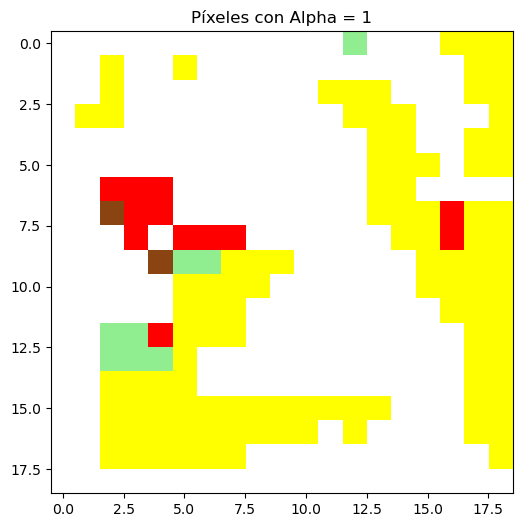

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    64
1     1   0      Crops    64
2     2   0      Crops    64
3     3   0      Crops    64
4     4   0      Crops    64
..   ..  ..        ...   ...
356  14  18      Crops    64
357  15  18      Crops    64
358  16  18      Crops    64
359  17  18      Crops    64
360  18  18      Crops    64

[361 rows x 4 columns]
65


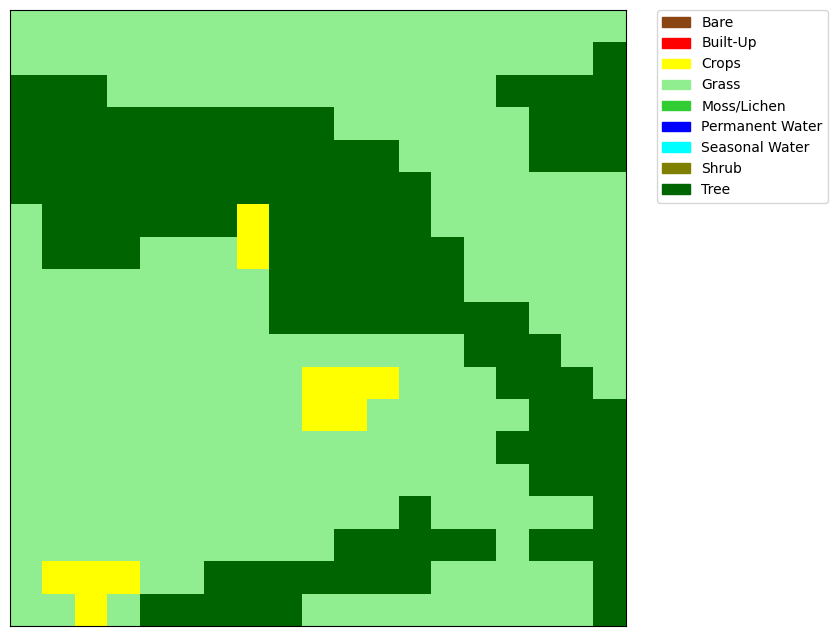

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


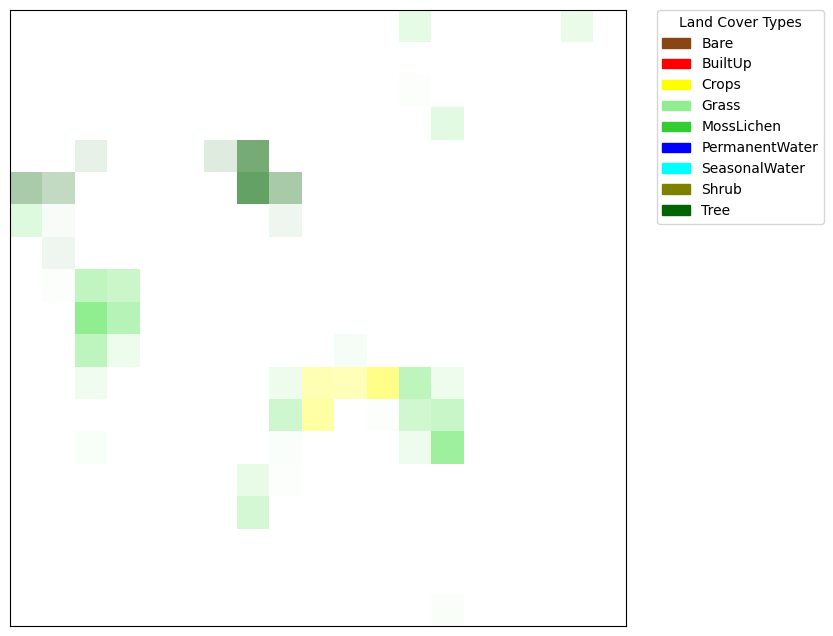

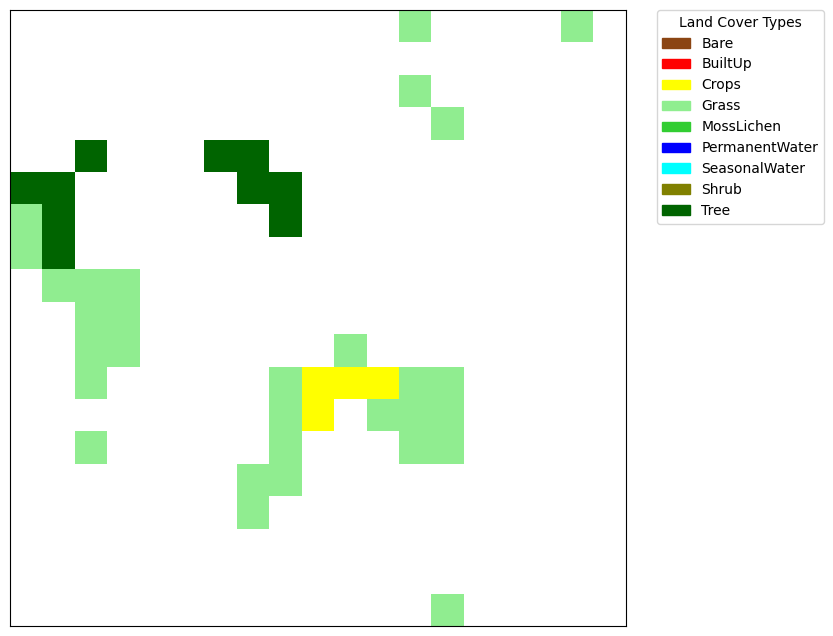

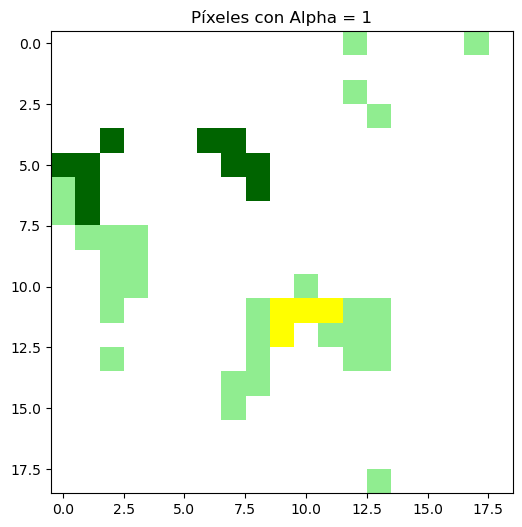

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    65
1     1   0      Grass    65
2     2   0      Grass    65
3     3   0      Grass    65
4     4   0      Grass    65
..   ..  ..        ...   ...
356  14  18      Grass    65
357  15  18      Grass    65
358  16  18      Grass    65
359  17  18      Grass    65
360  18  18       Tree    65

[361 rows x 4 columns]
66


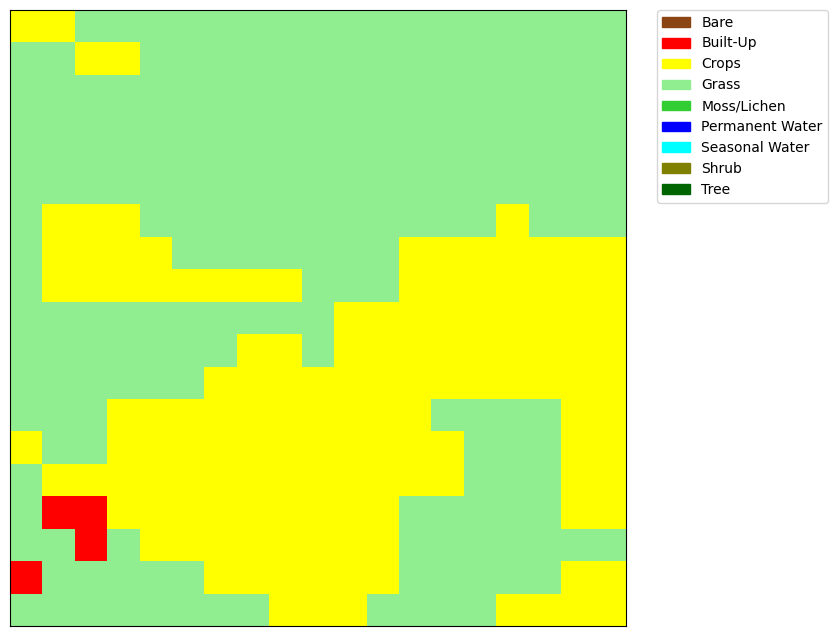

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


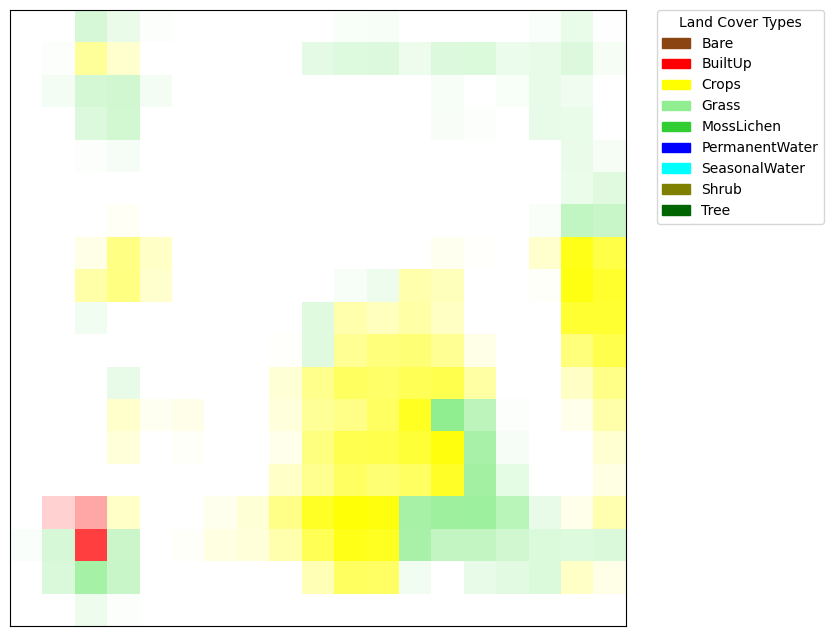

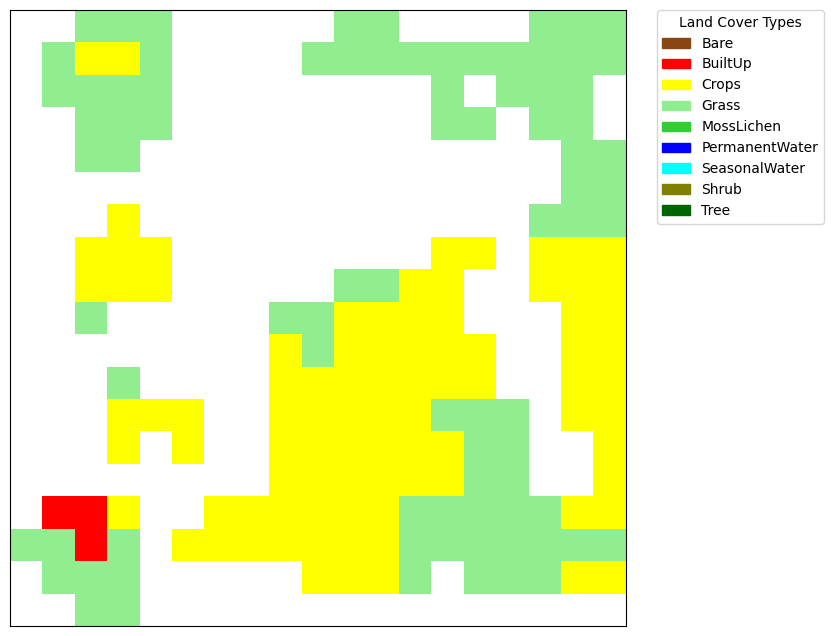

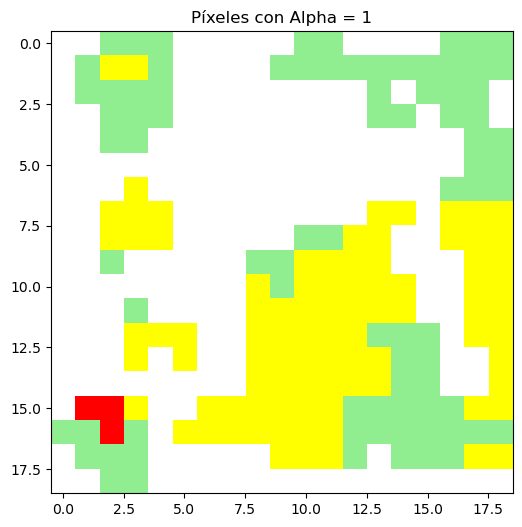

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.362203
3     0   3              1        0.186128
4     0   4              1        0.028279
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    66
1     1   0      Crops    66
2     2   0      Grass    66
3     3   0      Grass    66
4     4   0      Grass    66
..   ..  ..        ...   ...
356  14  18      Grass    66
357  15  18      Crops    66
358  16  18      Crops    66
359  17  18      Crops    66
360  18  18      Crops    66

[361 rows x 4 columns]
67


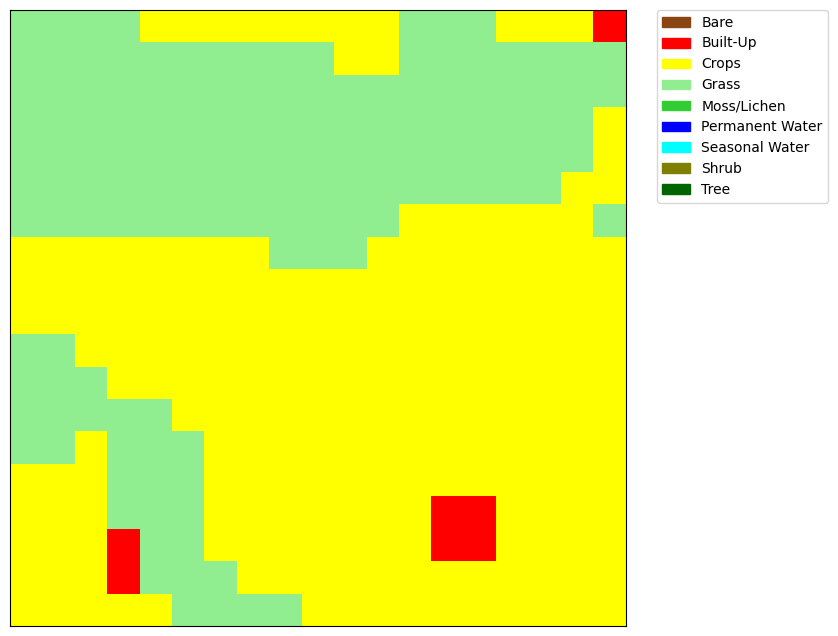

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


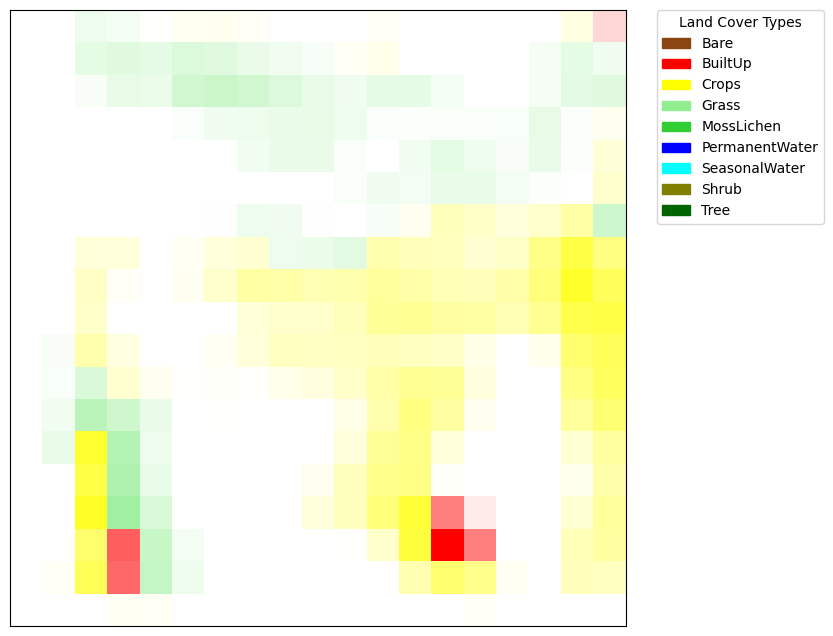

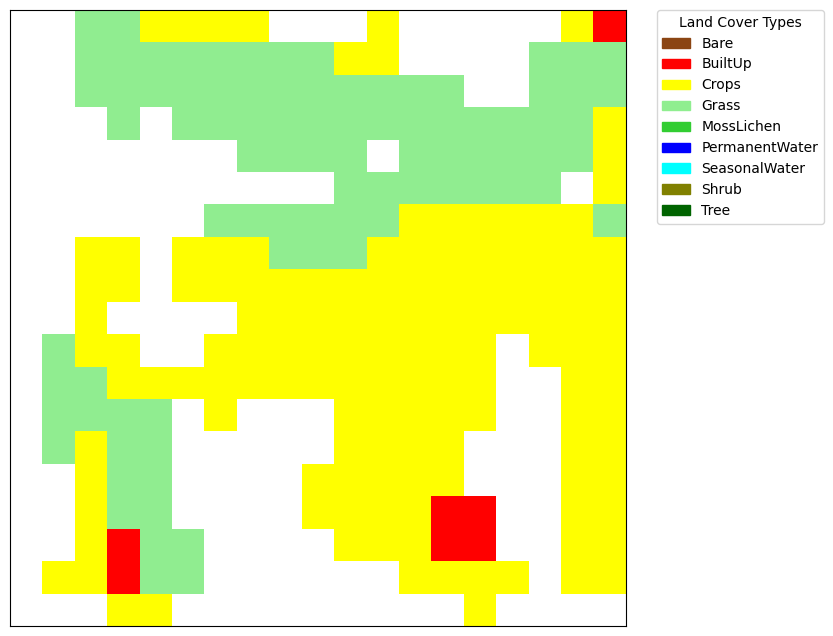

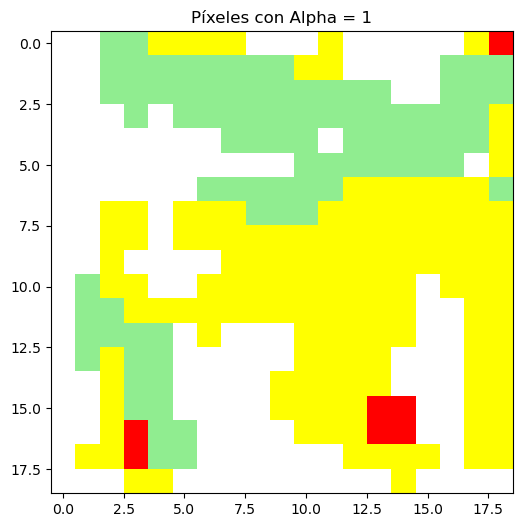

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.145773
3     0   3              1        0.105608
4     0   4              1        0.009872
..   ..  ..            ...             ...
356  18  14              1        0.027690
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    67
1     1   0      Grass    67
2     2   0      Grass    67
3     3   0      Grass    67
4     4   0      Crops    67
..   ..  ..        ...   ...
356  14  18      Crops    67
357  15  18      Crops    67
358  16  18      Crops    67
359  17  18      Crops    67
360  18  18      Crops    67

[361 rows x 4 columns]
68


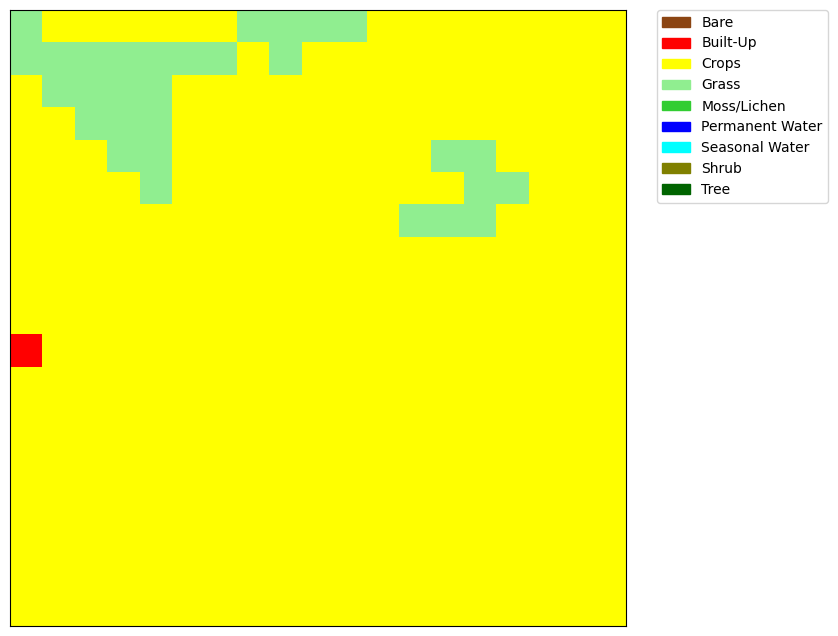

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


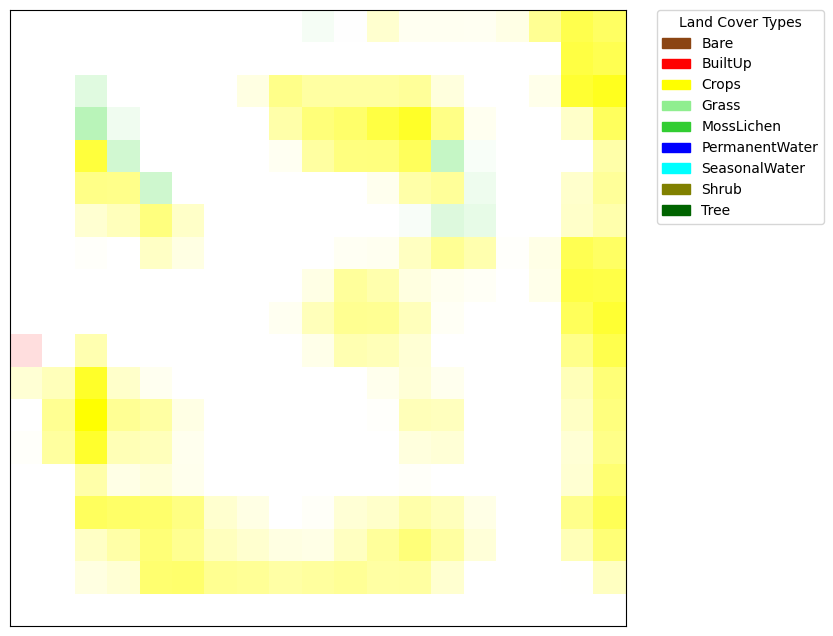

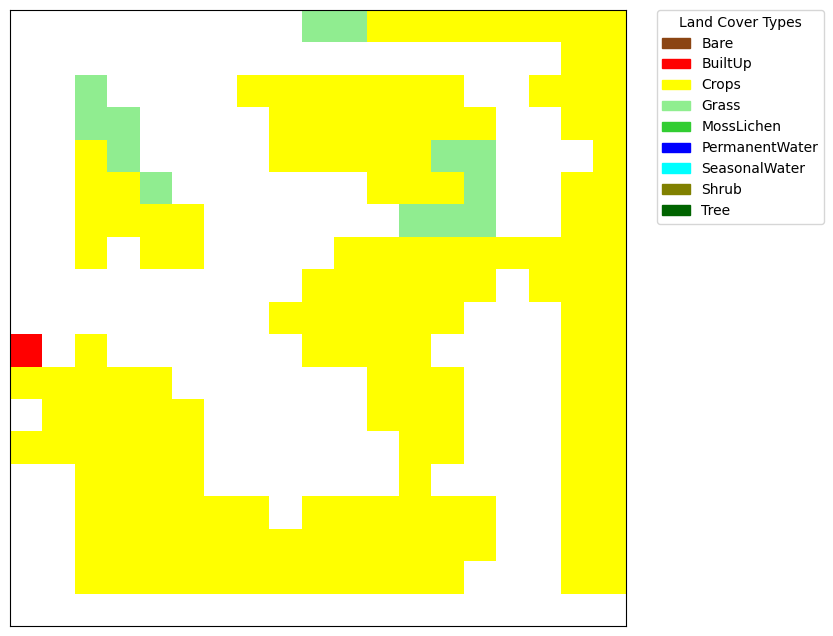

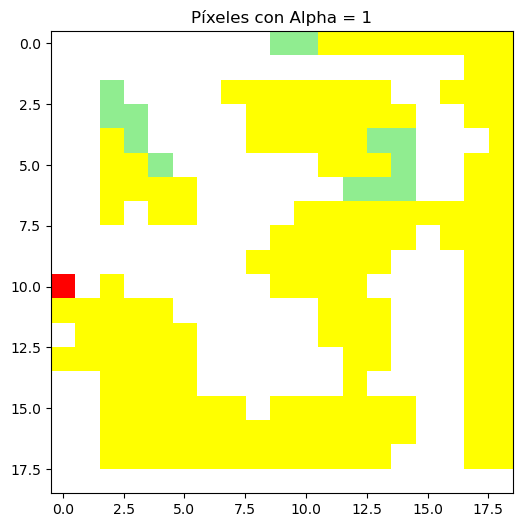

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    68
1     1   0      Crops    68
2     2   0      Crops    68
3     3   0      Crops    68
4     4   0      Crops    68
..   ..  ..        ...   ...
356  14  18      Crops    68
357  15  18      Crops    68
358  16  18      Crops    68
359  17  18      Crops    68
360  18  18      Crops    68

[361 rows x 4 columns]
69


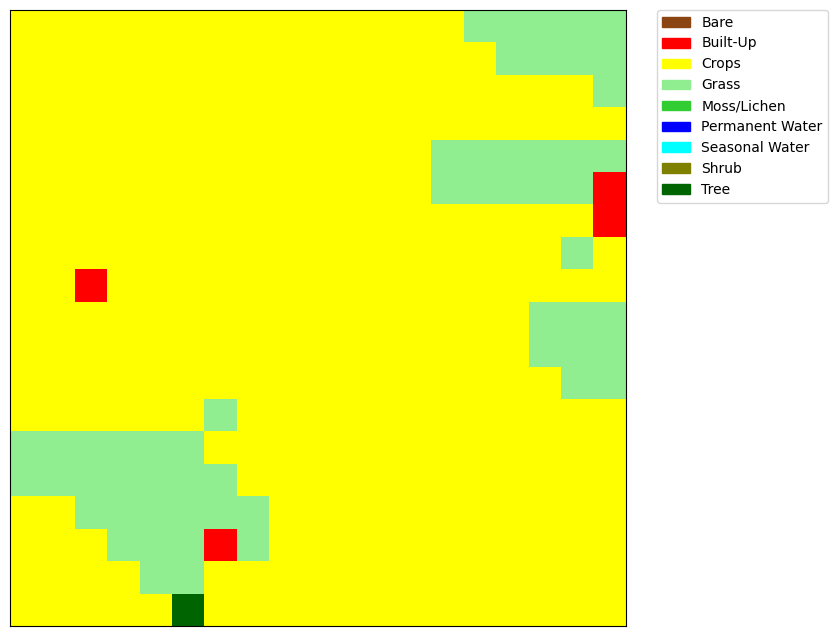

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


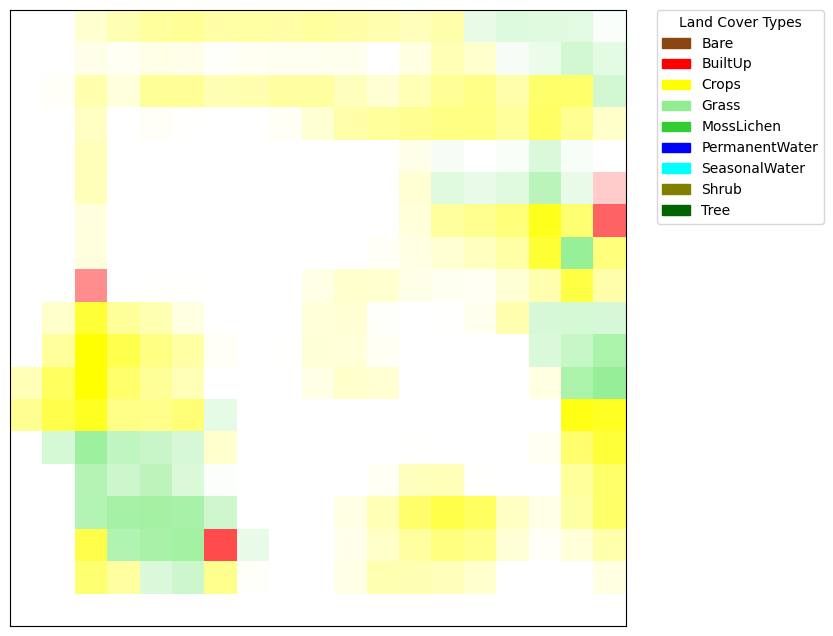

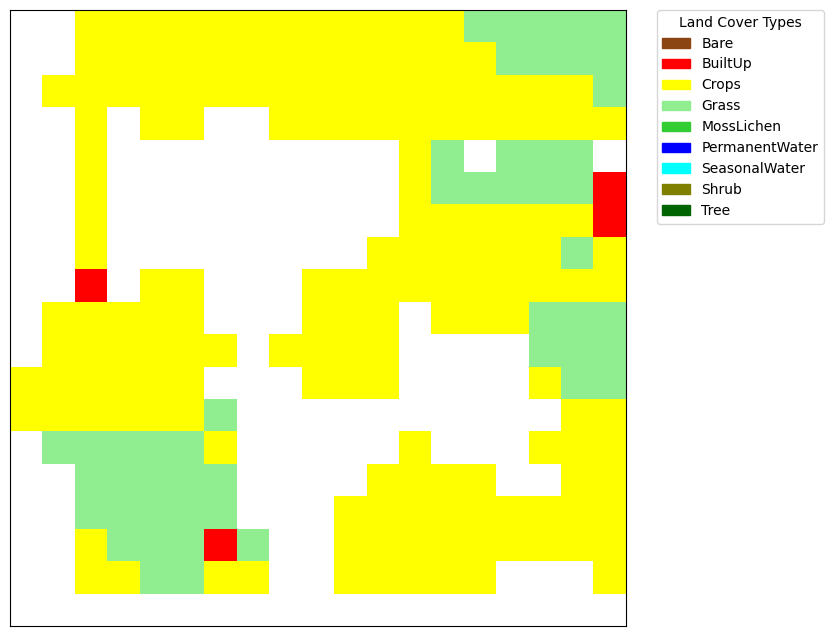

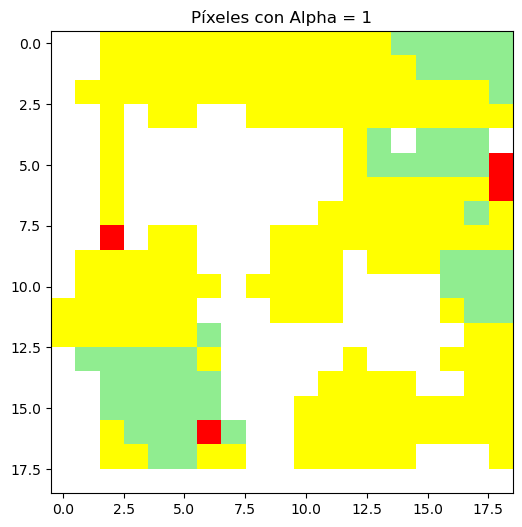

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.191368
3     0   3              1        0.298239
4     0   4              1        0.385342
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    69
1     1   0      Crops    69
2     2   0      Crops    69
3     3   0      Crops    69
4     4   0      Crops    69
..   ..  ..        ...   ...
356  14  18      Crops    69
357  15  18      Crops    69
358  16  18      Crops    69
359  17  18      Crops    69
360  18  18      Crops    69

[361 rows x 4 columns]
70


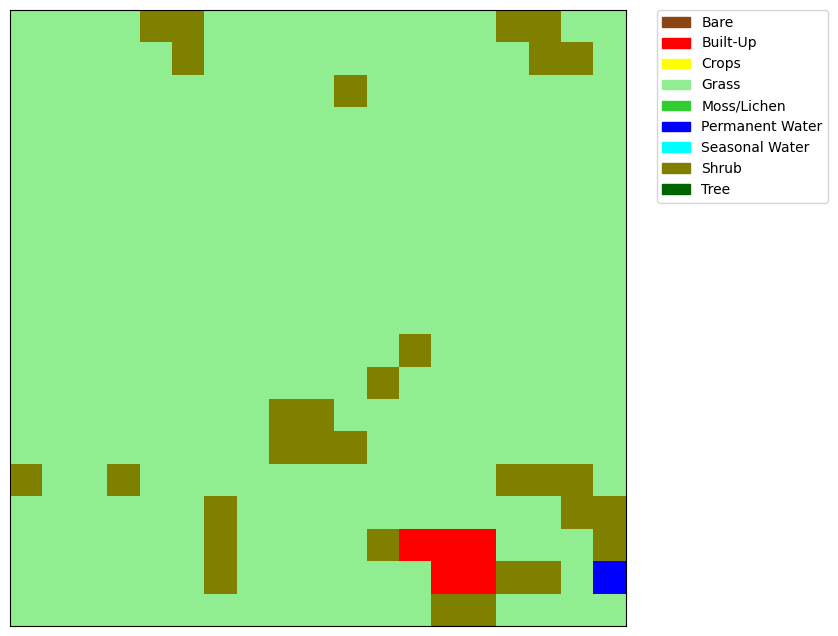

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


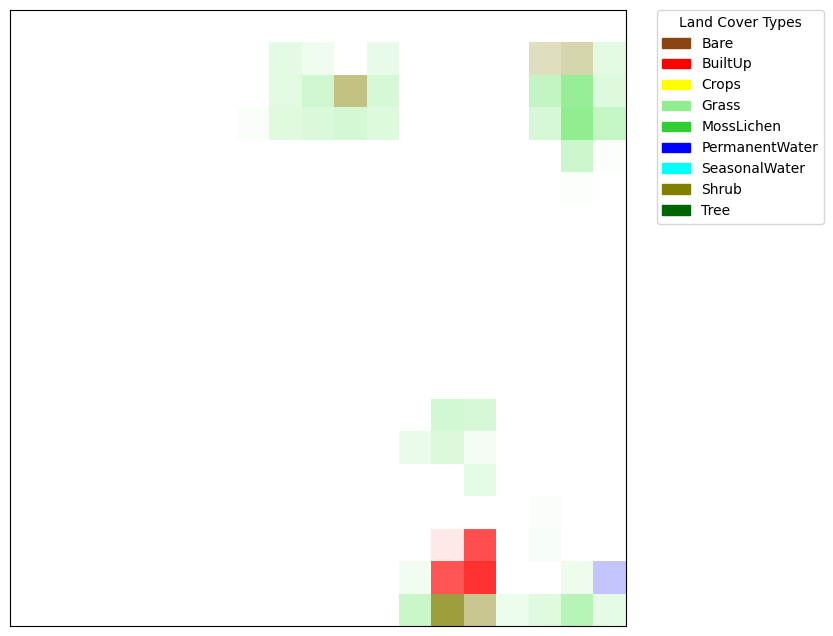

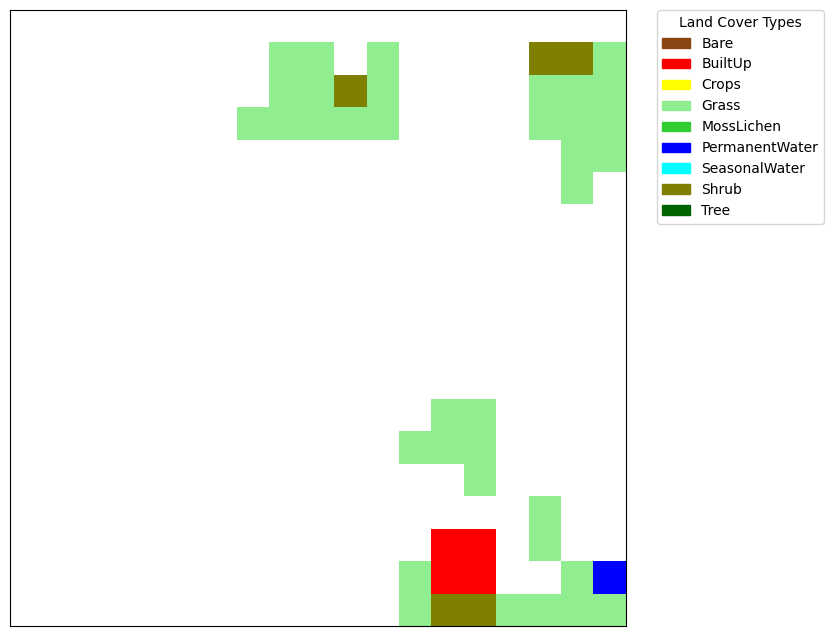

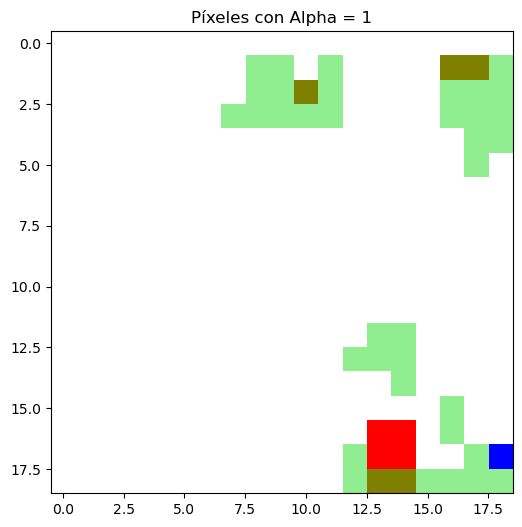

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              4        0.442872
357  18  15              4        0.165599
358  18  16              4        0.273322
359  18  17              4        0.643247
360  18  18              4        0.220237

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    70
1     1   0      Grass    70
2     2   0      Grass    70
3     3   0      Grass    70
4     4   0      Shrub    70
..   ..  ..        ...   ...
356  14  18      Shrub    70
357  15  18      Grass    70
358  16  18      Grass    70
359  17  18      Grass    70
360  18  18      Grass    70

[361 rows x 4 columns]
71


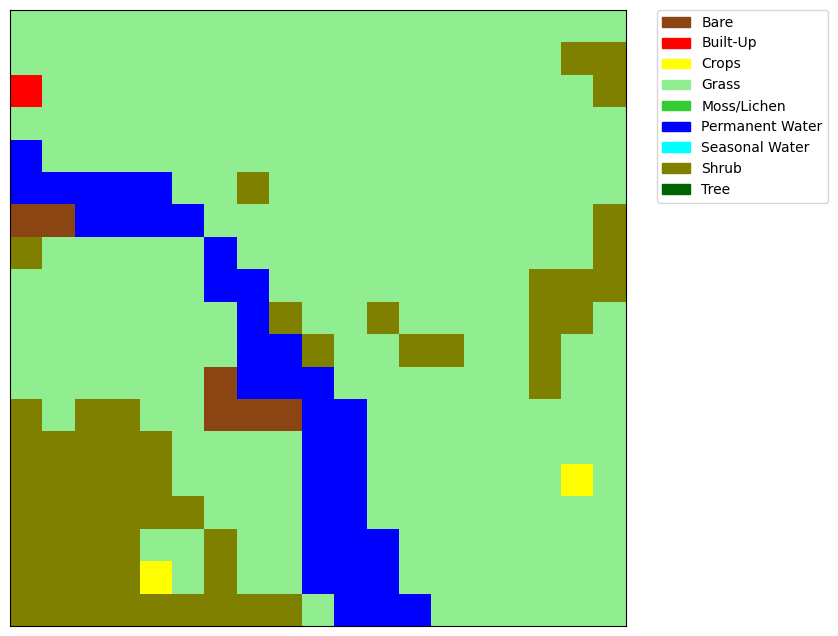

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


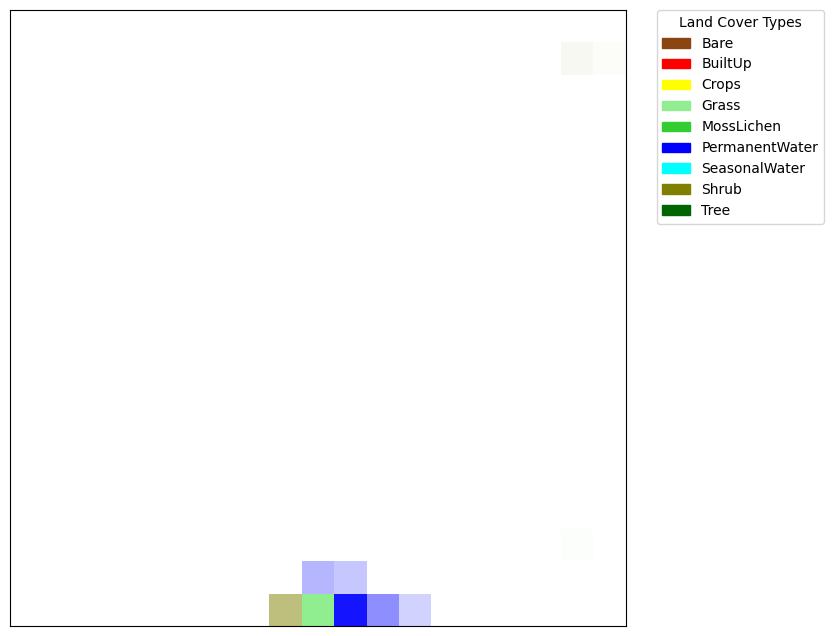

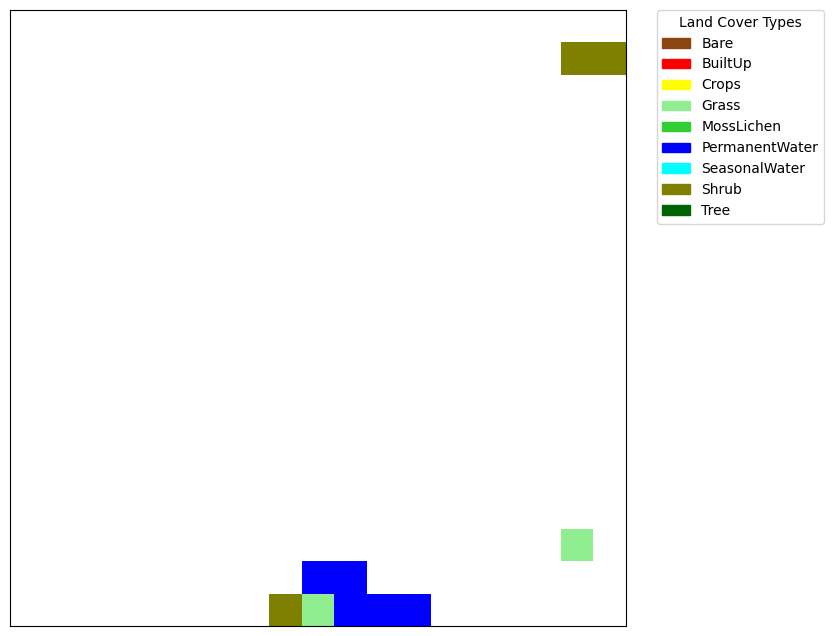

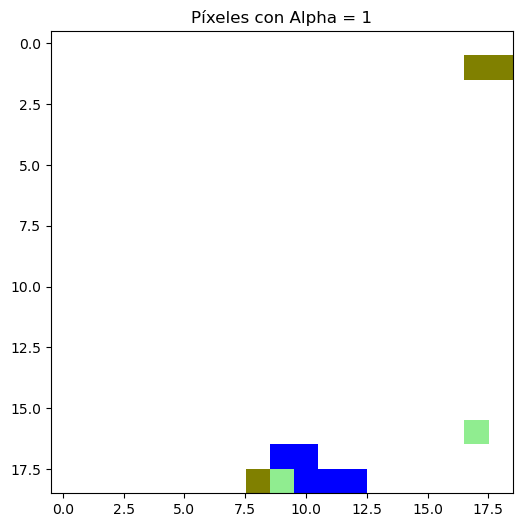

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    71
1     1   0      Grass    71
2     2   0      Grass    71
3     3   0      Grass    71
4     4   0      Grass    71
..   ..  ..        ...   ...
356  14  18      Grass    71
357  15  18      Grass    71
358  16  18      Grass    71
359  17  18      Grass    71
360  18  18      Grass    71

[361 rows x 4 columns]
72


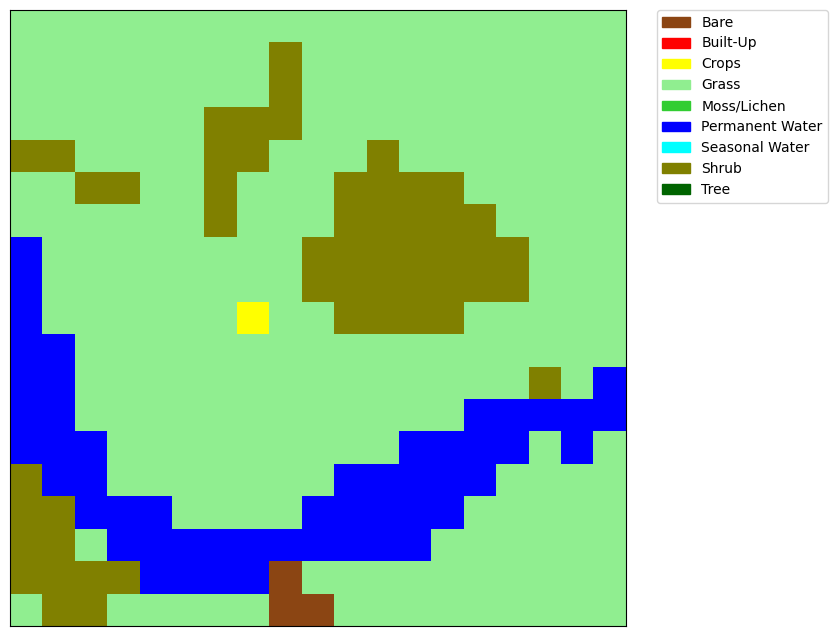

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


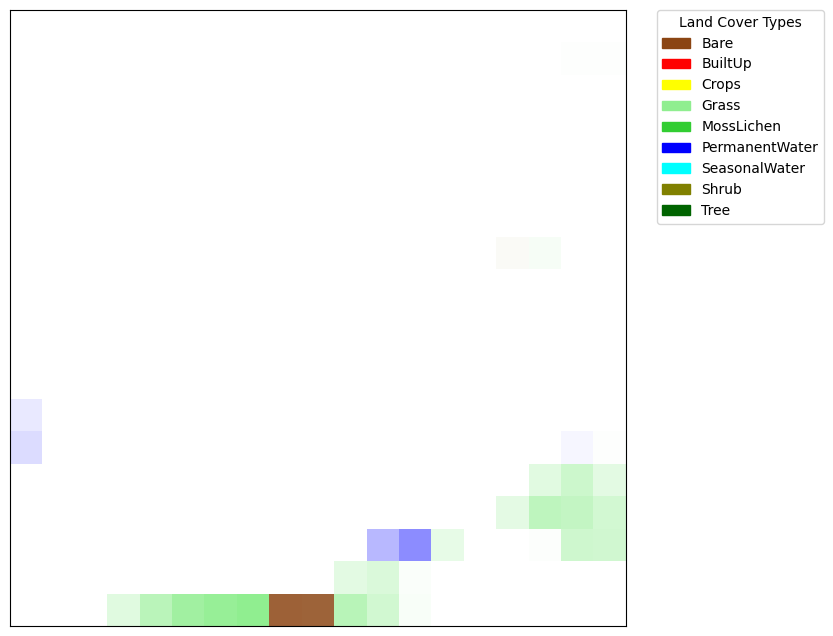

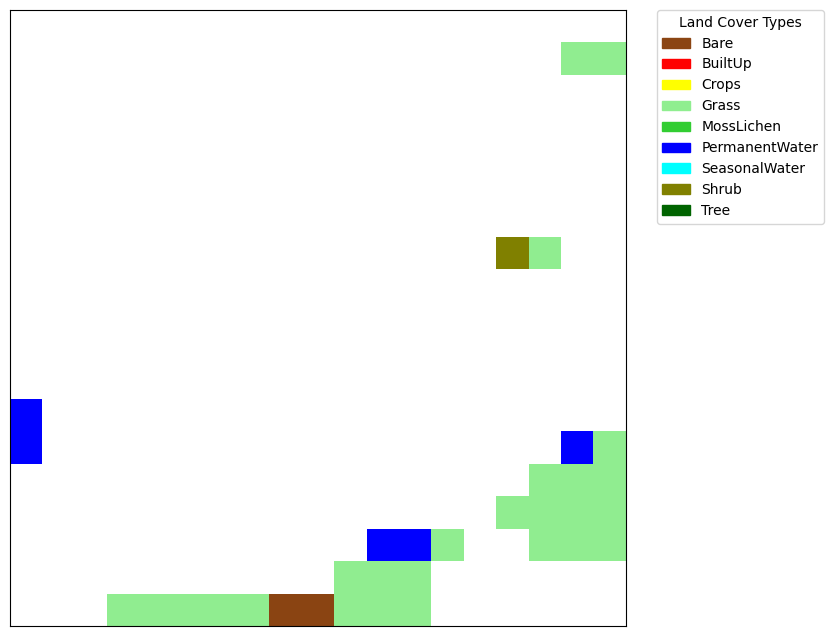

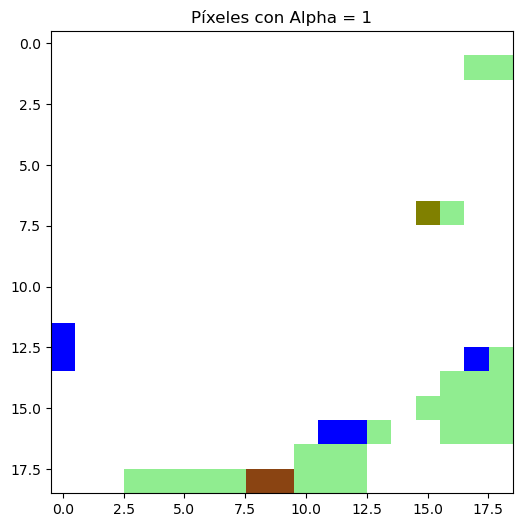

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    72
1     1   0      Grass    72
2     2   0      Grass    72
3     3   0      Grass    72
4     4   0      Grass    72
..   ..  ..        ...   ...
356  14  18      Grass    72
357  15  18      Grass    72
358  16  18      Grass    72
359  17  18      Grass    72
360  18  18      Grass    72

[361 rows x 4 columns]
73


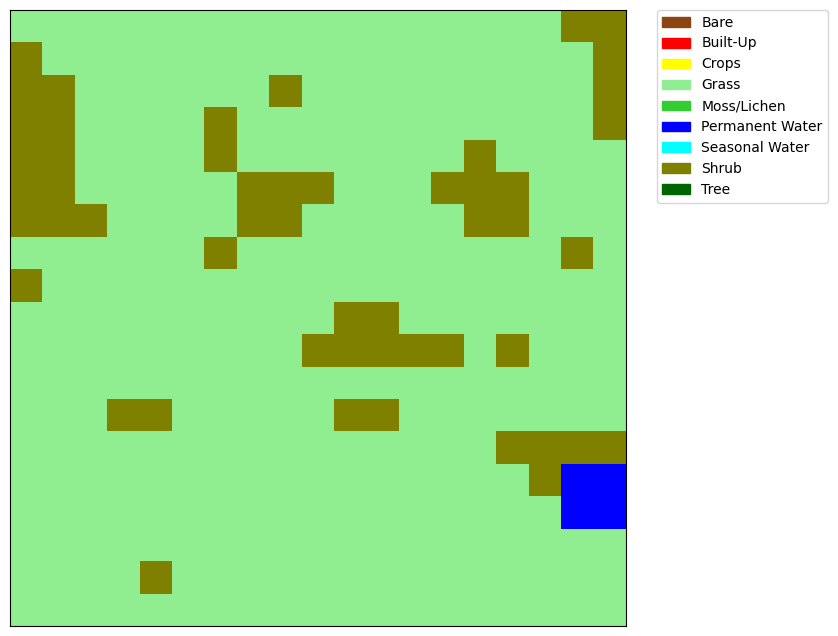

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


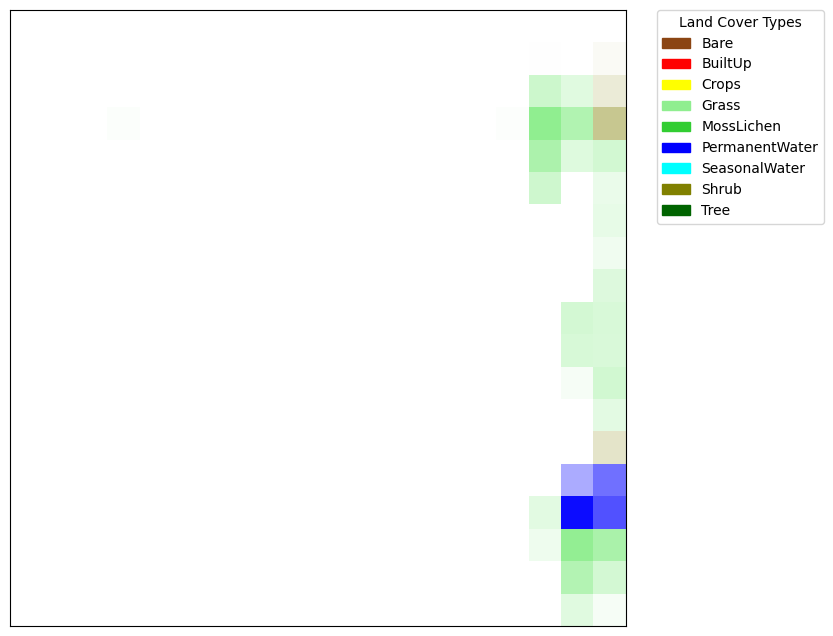

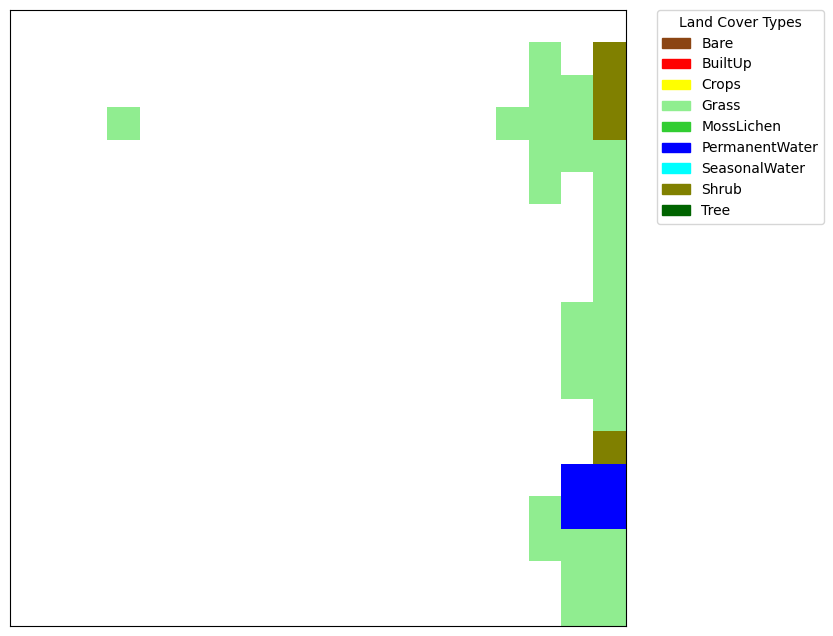

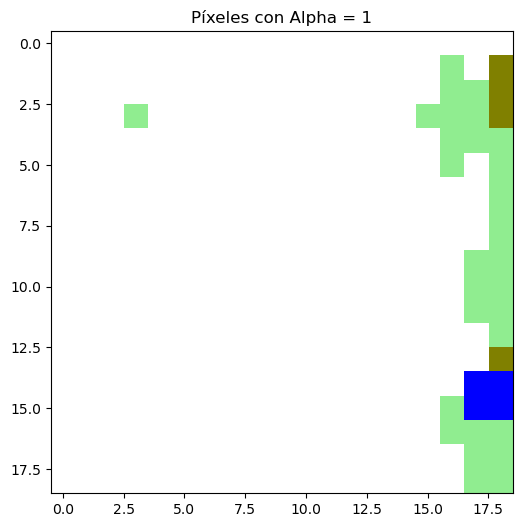

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              1        0.276106
360  18  18              1        0.075162

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    73
1     1   0      Grass    73
2     2   0      Grass    73
3     3   0      Grass    73
4     4   0      Grass    73
..   ..  ..        ...   ...
356  14  18      Grass    73
357  15  18      Grass    73
358  16  18      Grass    73
359  17  18      Grass    73
360  18  18      Grass    73

[361 rows x 4 columns]
74


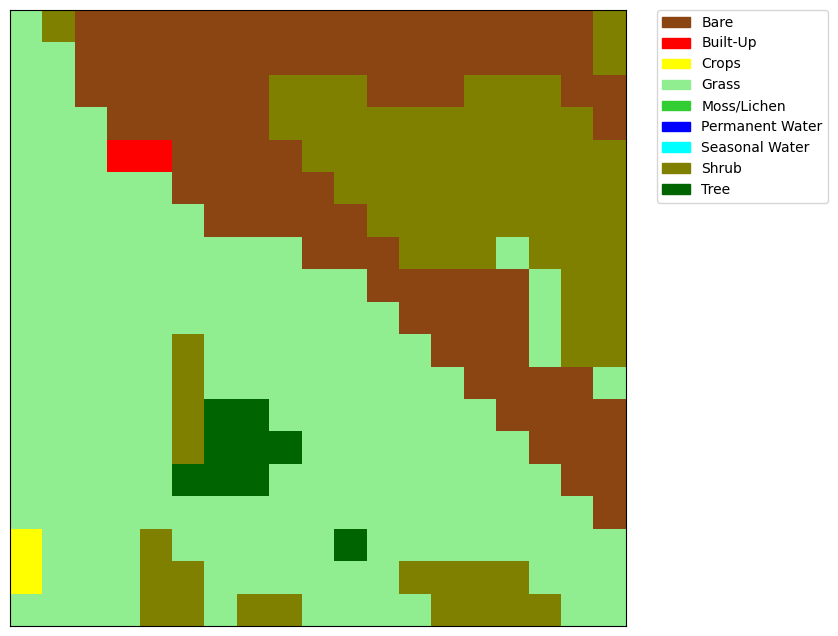

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


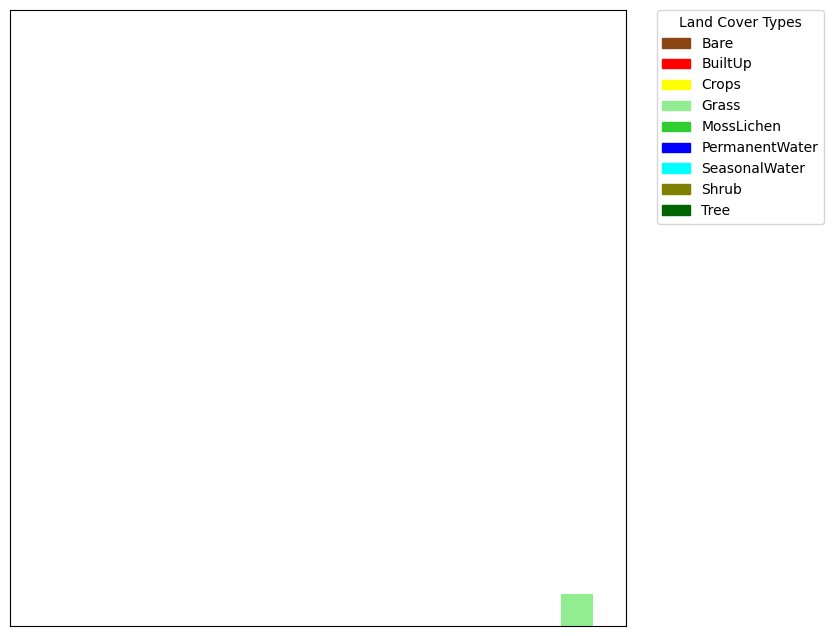

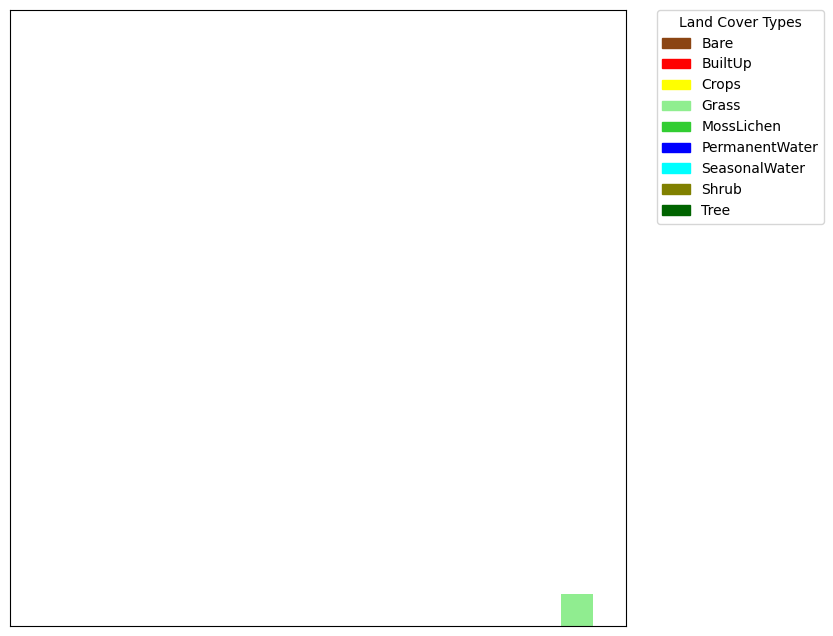

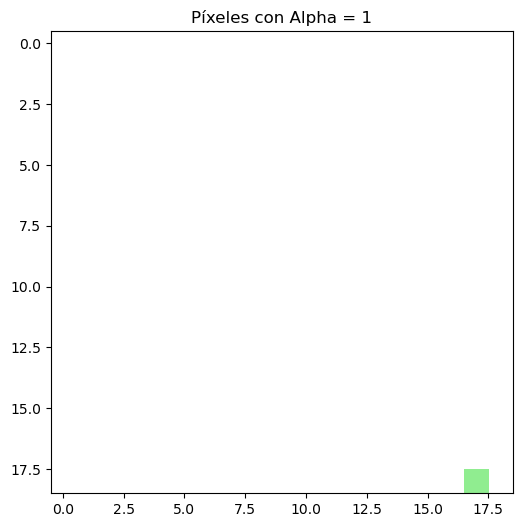

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              1             1.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    74
1     1   0      Shrub    74
2     2   0       Bare    74
3     3   0       Bare    74
4     4   0       Bare    74
..   ..  ..        ...   ...
356  14  18      Shrub    74
357  15  18      Shrub    74
358  16  18      Shrub    74
359  17  18      Grass    74
360  18  18      Grass    74

[361 rows x 4 columns]
75


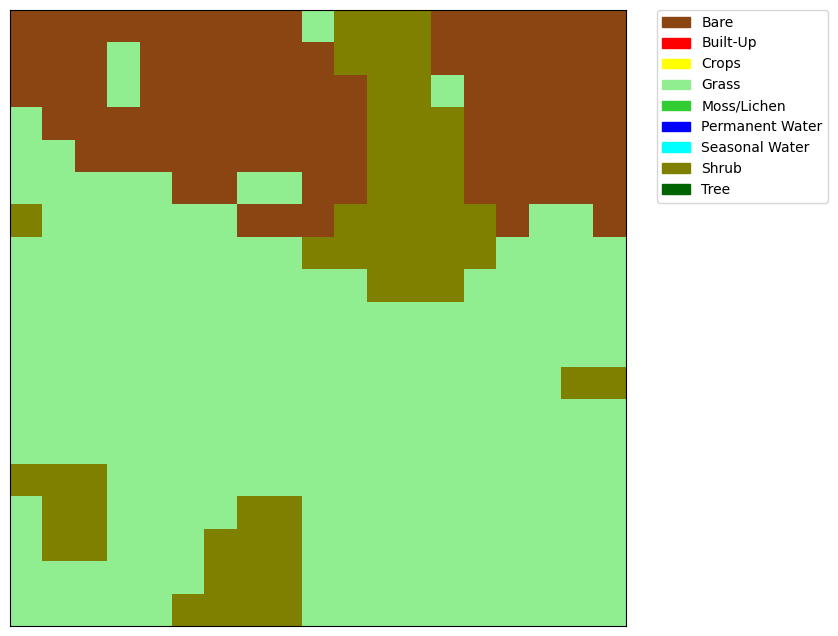

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


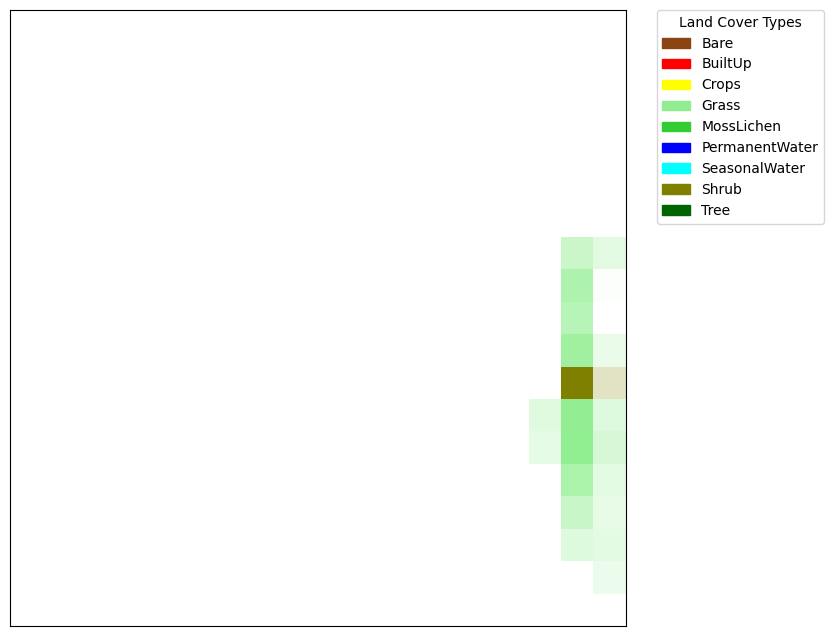

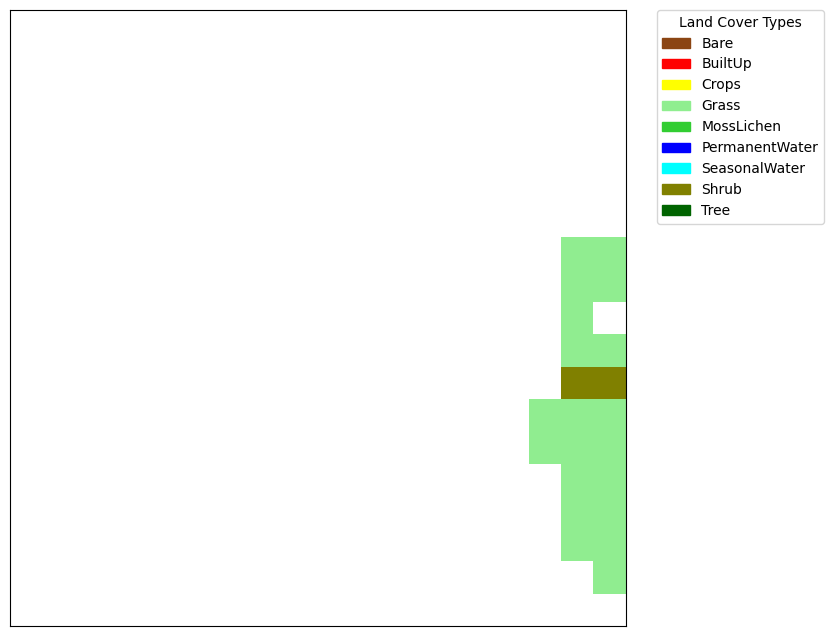

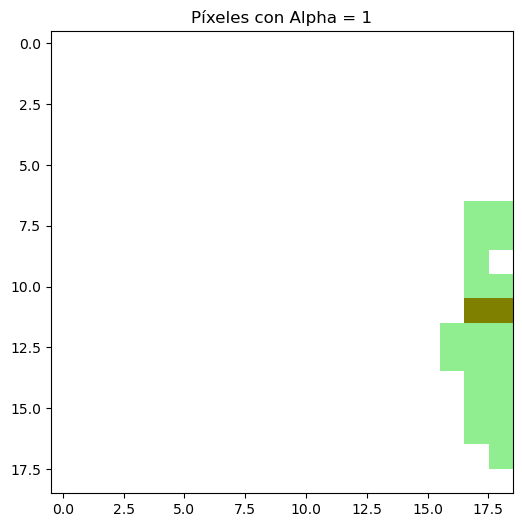

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Bare    75
1     1   0       Bare    75
2     2   0       Bare    75
3     3   0       Bare    75
4     4   0       Bare    75
..   ..  ..        ...   ...
356  14  18      Grass    75
357  15  18      Grass    75
358  16  18      Grass    75
359  17  18      Grass    75
360  18  18      Grass    75

[361 rows x 4 columns]
76


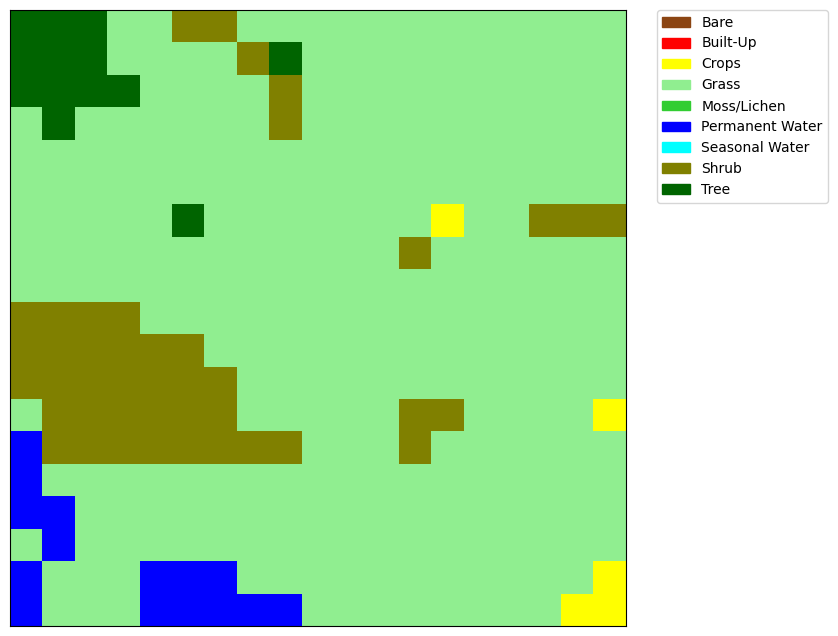

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


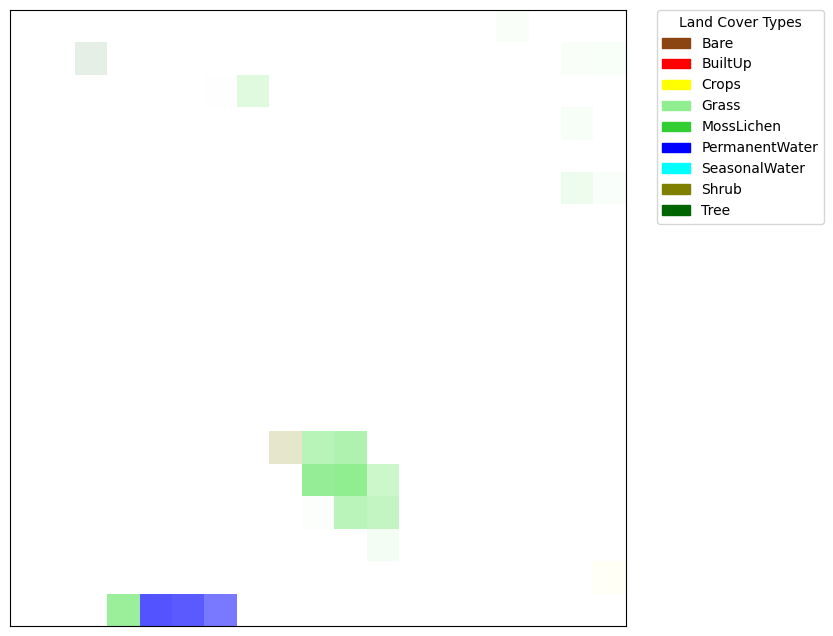

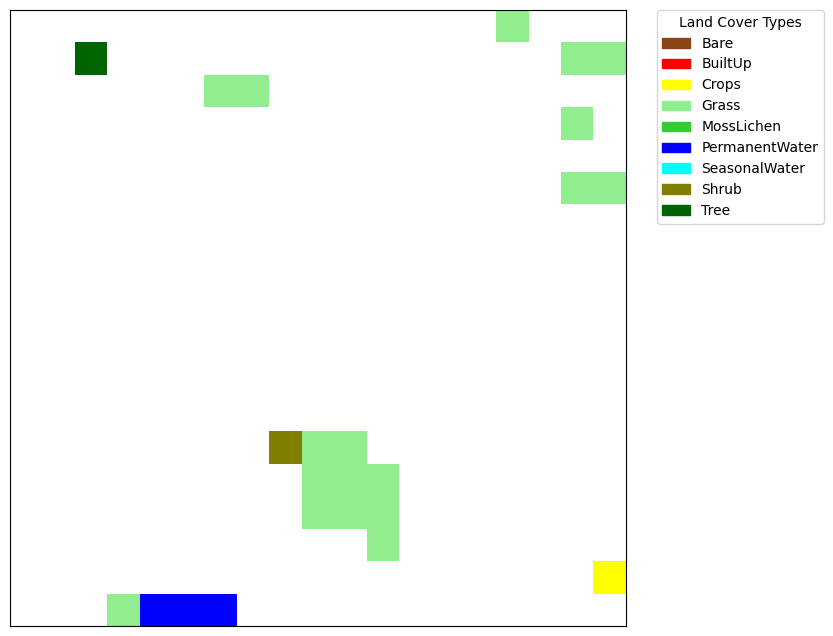

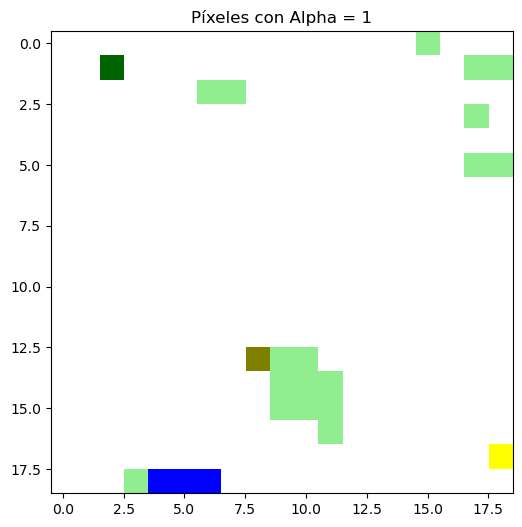

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    76
1     1   0       Tree    76
2     2   0       Tree    76
3     3   0      Grass    76
4     4   0      Grass    76
..   ..  ..        ...   ...
356  14  18      Grass    76
357  15  18      Grass    76
358  16  18      Grass    76
359  17  18      Crops    76
360  18  18      Crops    76

[361 rows x 4 columns]
77


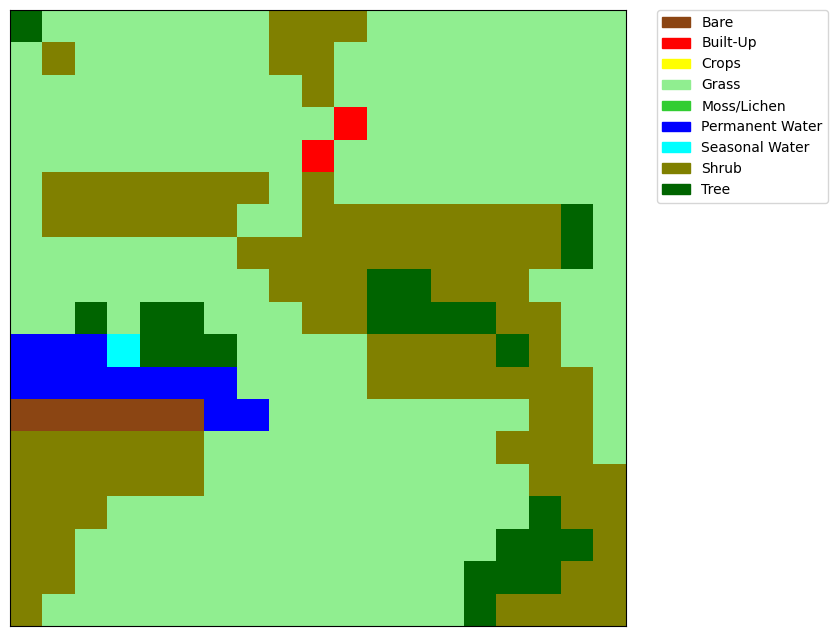

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


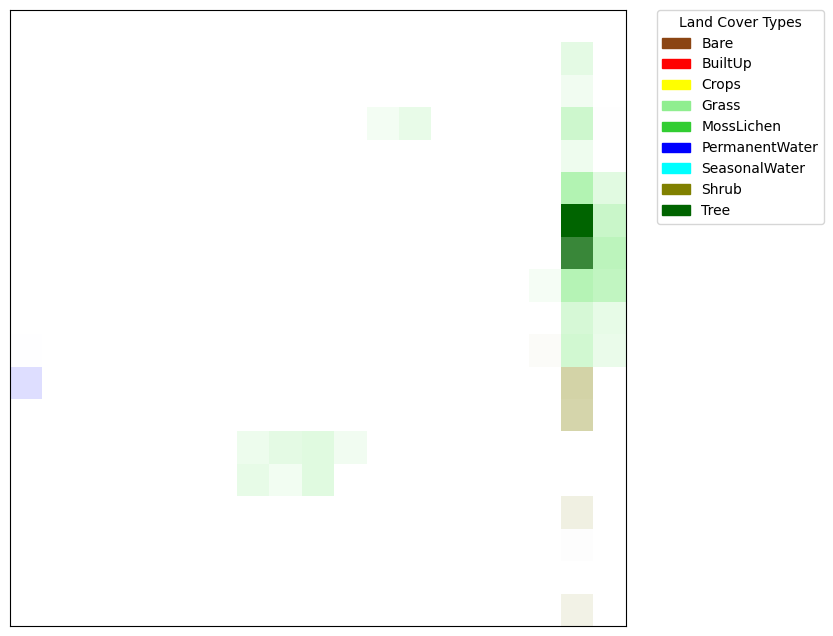

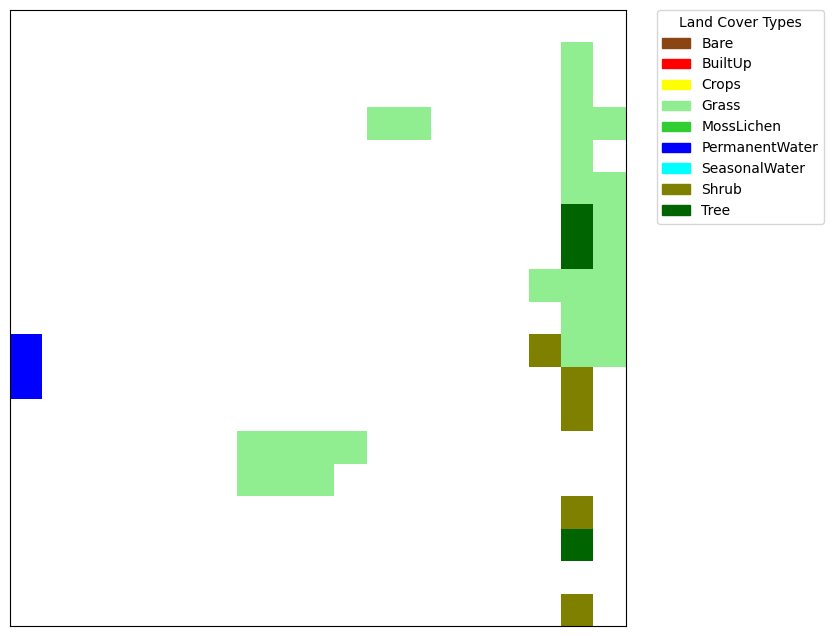

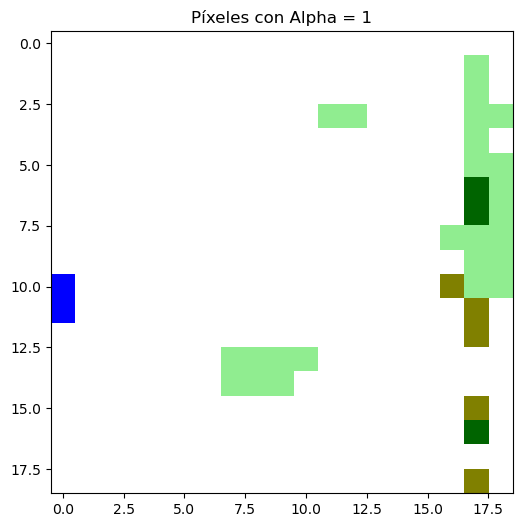

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              6        0.101523
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    77
1     1   0      Grass    77
2     2   0      Grass    77
3     3   0      Grass    77
4     4   0      Grass    77
..   ..  ..        ...   ...
356  14  18       Tree    77
357  15  18      Shrub    77
358  16  18      Shrub    77
359  17  18      Shrub    77
360  18  18      Shrub    77

[361 rows x 4 columns]
78


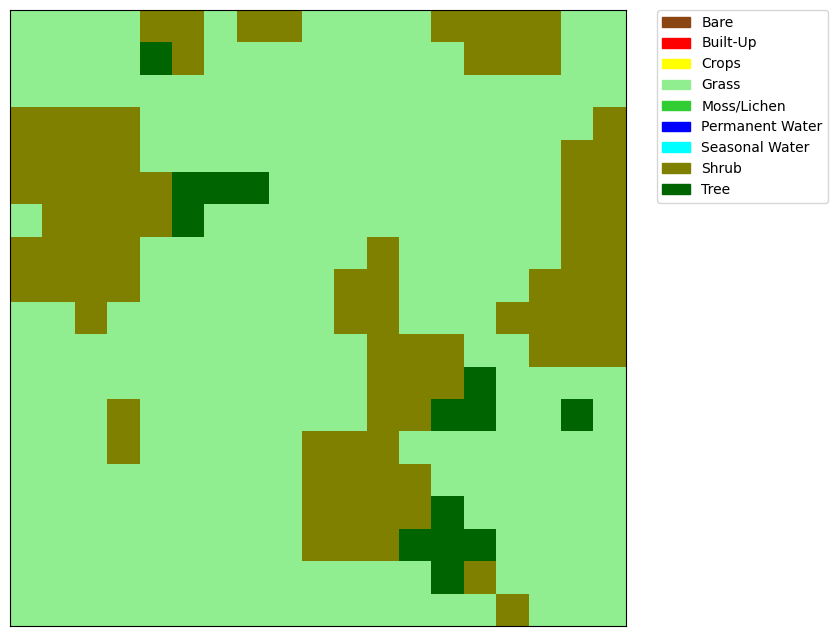

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


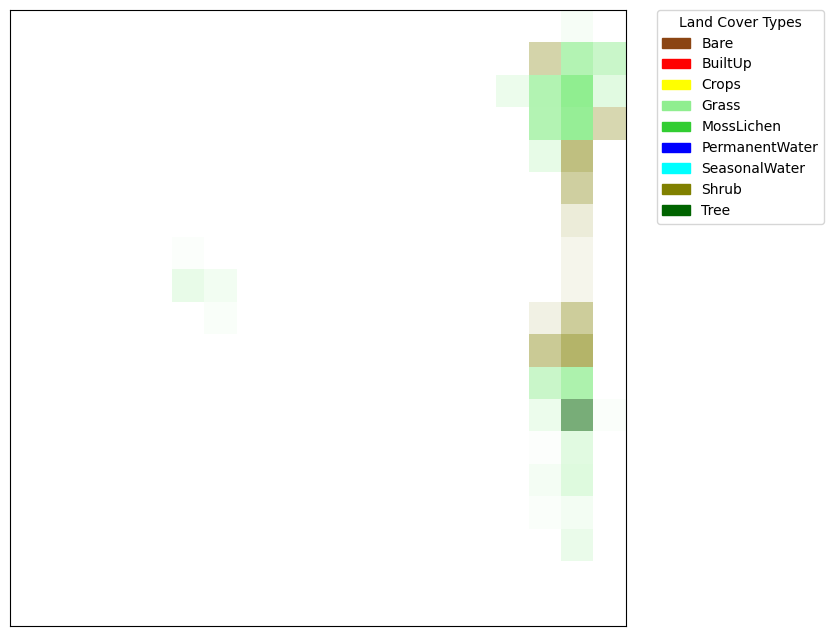

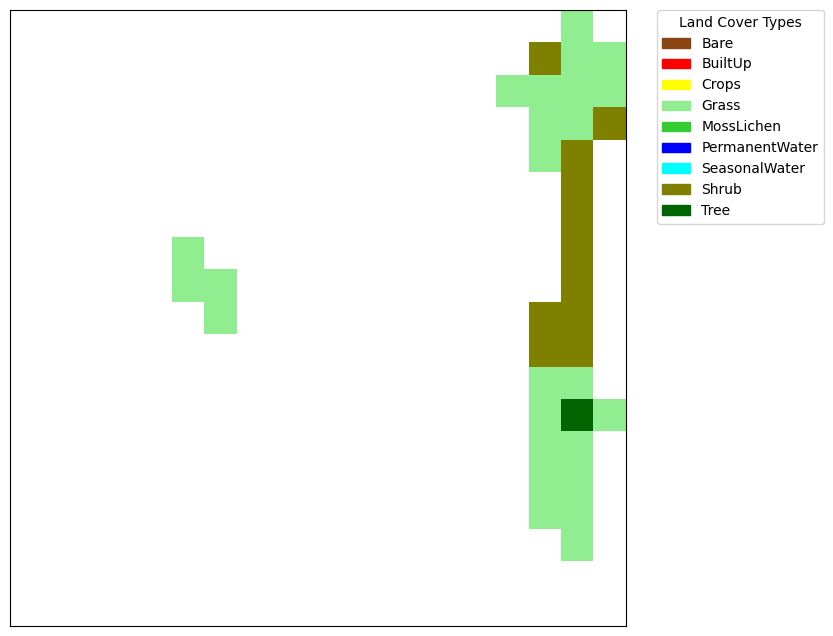

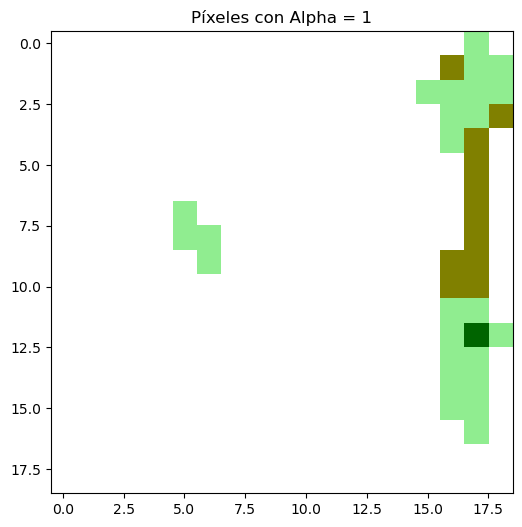

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    78
1     1   0      Grass    78
2     2   0      Grass    78
3     3   0      Grass    78
4     4   0      Shrub    78
..   ..  ..        ...   ...
356  14  18      Grass    78
357  15  18      Shrub    78
358  16  18      Grass    78
359  17  18      Grass    78
360  18  18      Grass    78

[361 rows x 4 columns]
79


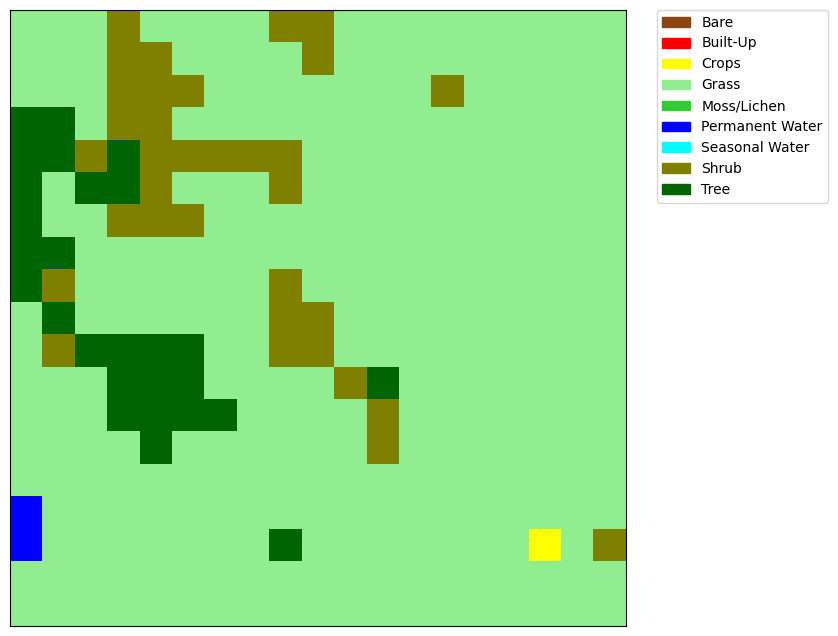

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


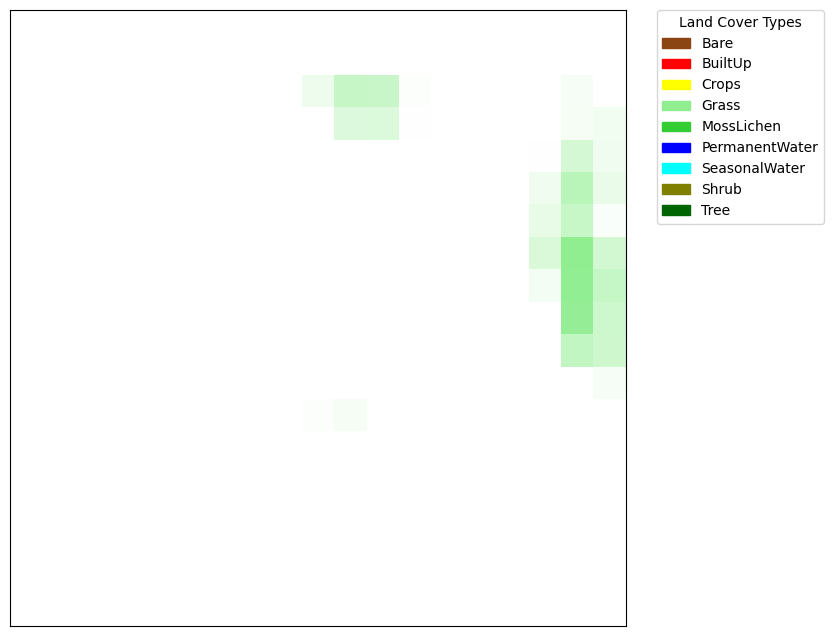

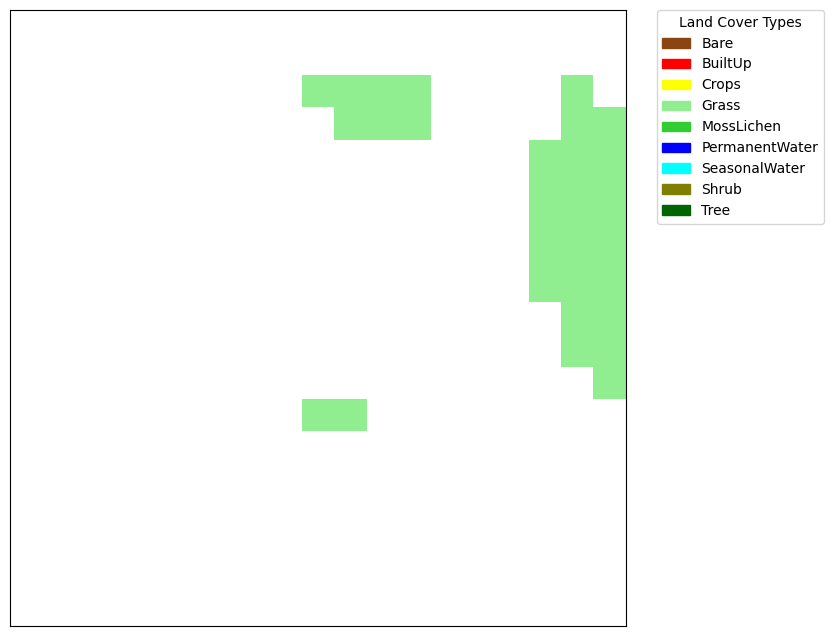

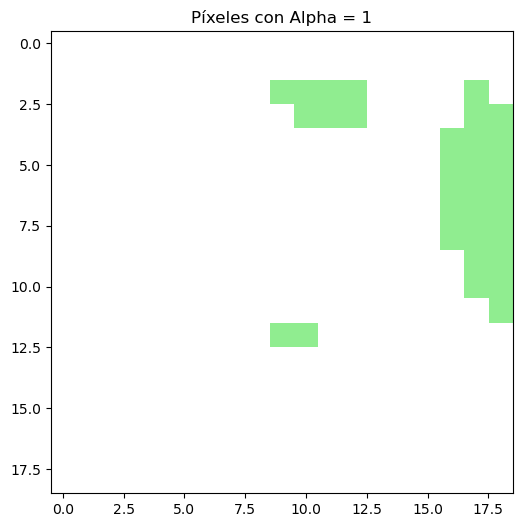

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    79
1     1   0      Grass    79
2     2   0      Grass    79
3     3   0      Shrub    79
4     4   0      Grass    79
..   ..  ..        ...   ...
356  14  18      Grass    79
357  15  18      Grass    79
358  16  18      Grass    79
359  17  18      Grass    79
360  18  18      Grass    79

[361 rows x 4 columns]
80


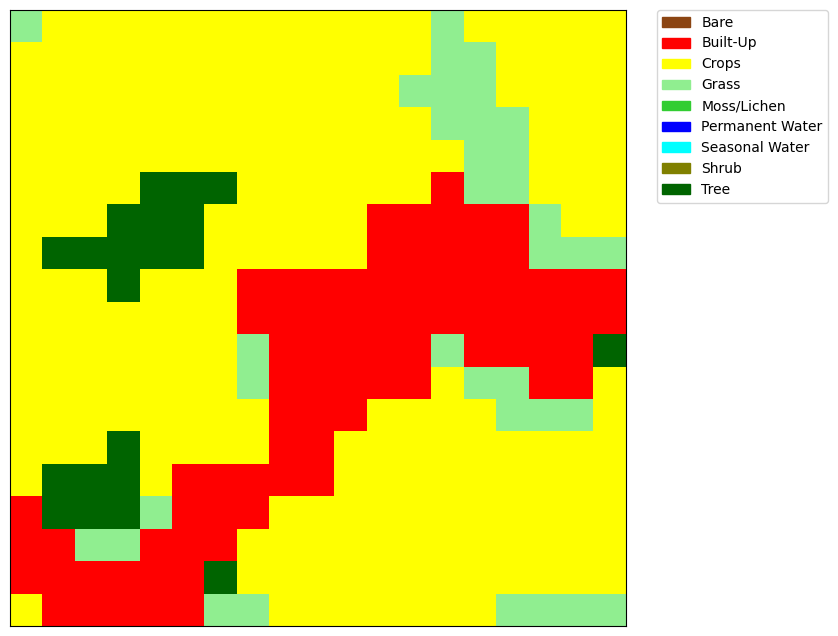

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


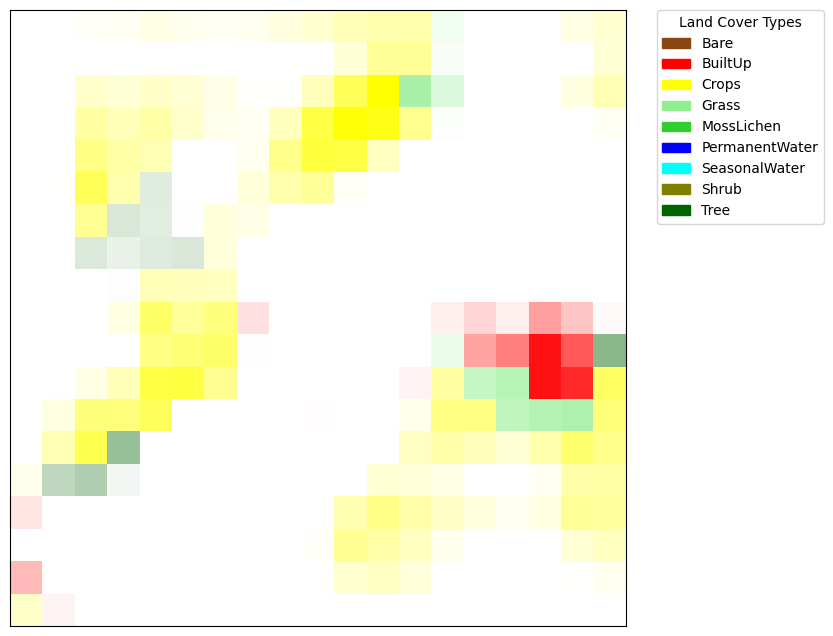

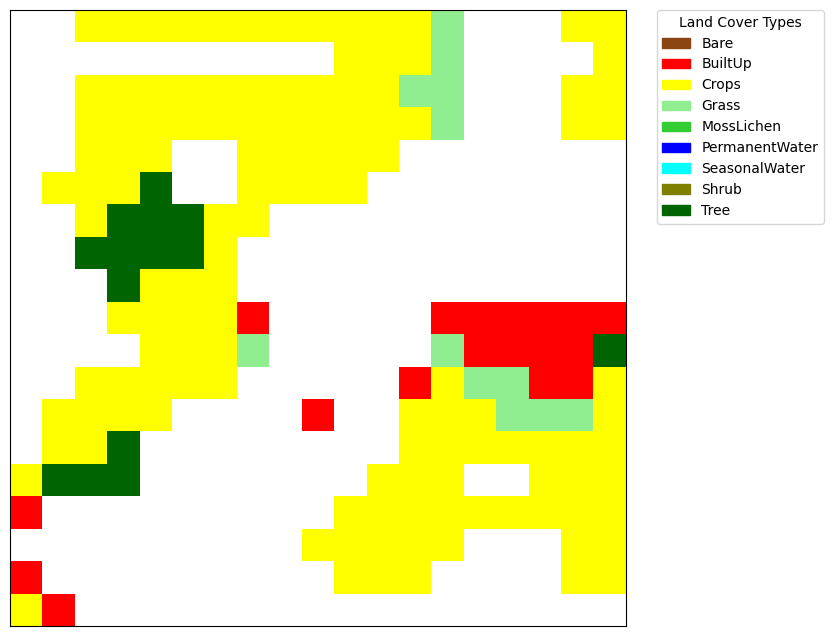

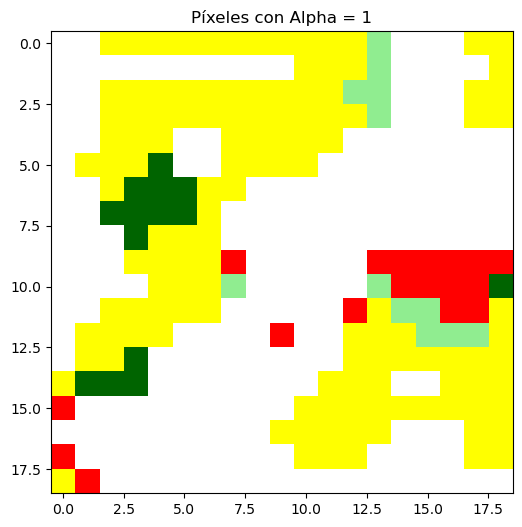

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.034842
3     0   3              1        0.050070
4     0   4              1        0.103911
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    80
1     1   0      Crops    80
2     2   0      Crops    80
3     3   0      Crops    80
4     4   0      Crops    80
..   ..  ..        ...   ...
356  14  18      Crops    80
357  15  18      Grass    80
358  16  18      Grass    80
359  17  18      Grass    80
360  18  18      Grass    80

[361 rows x 4 columns]
81


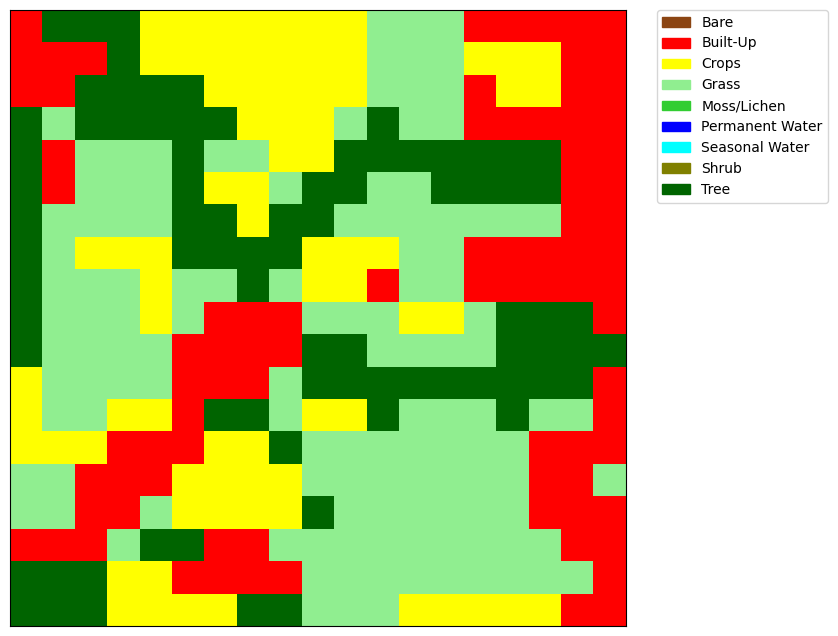

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


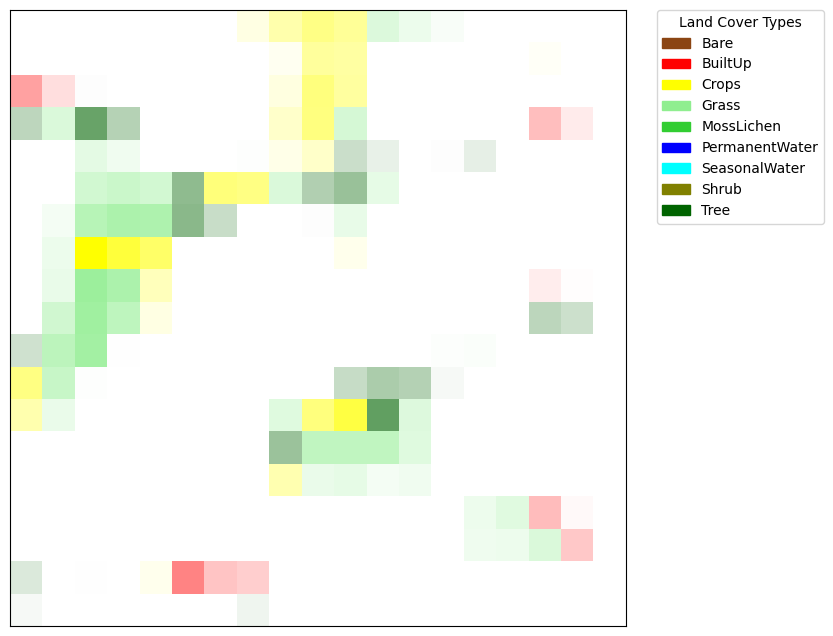

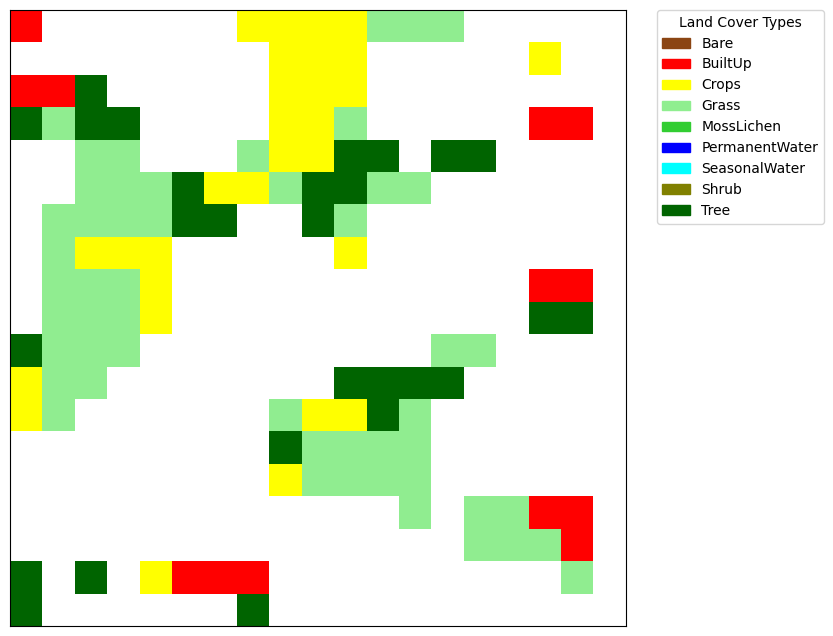

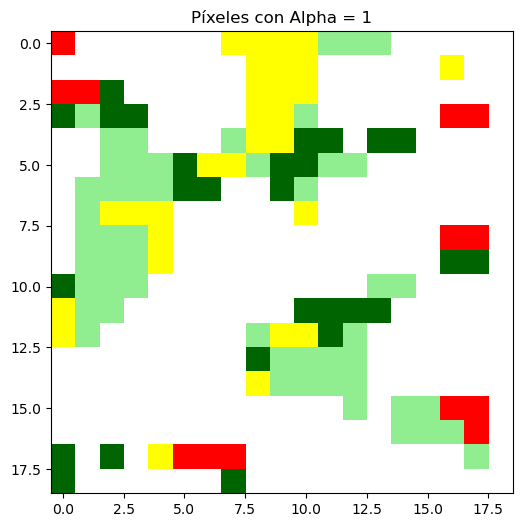

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1         0.00104
1     0   1              0         0.00000
2     0   2              0         0.00000
3     0   3              0         0.00000
4     0   4              0         0.00000
..   ..  ..            ...             ...
356  18  14              0         0.00000
357  18  15              0         0.00000
358  18  16              0         0.00000
359  18  17              0         0.00000
360  18  18              0         0.00000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    81
1     1   0       Tree    81
2     2   0       Tree    81
3     3   0       Tree    81
4     4   0      Crops    81
..   ..  ..        ...   ...
356  14  18      Crops    81
357  15  18      Crops    81
358  16  18      Crops    81
359  17  18   Built-Up    81
360  18  18   Built-Up    81

[361 rows x 4 columns]
82


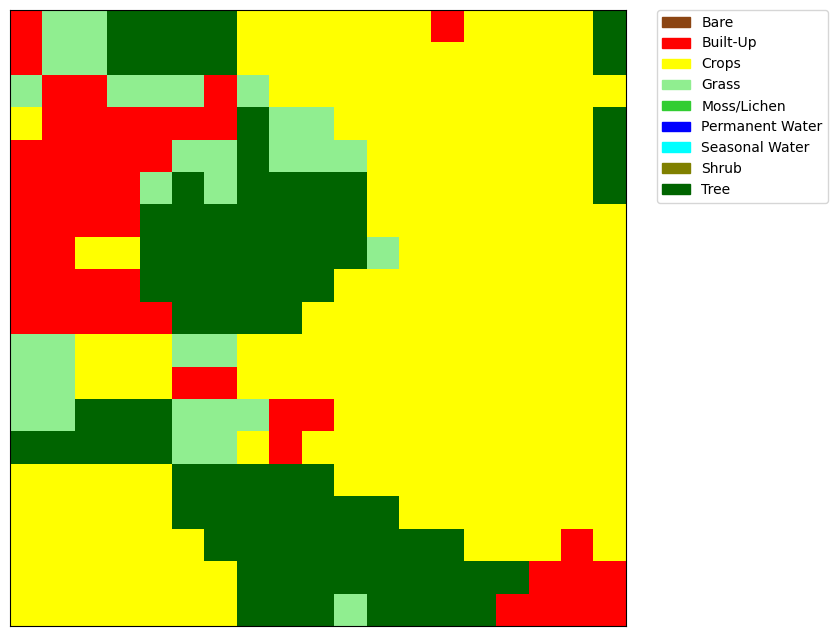

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


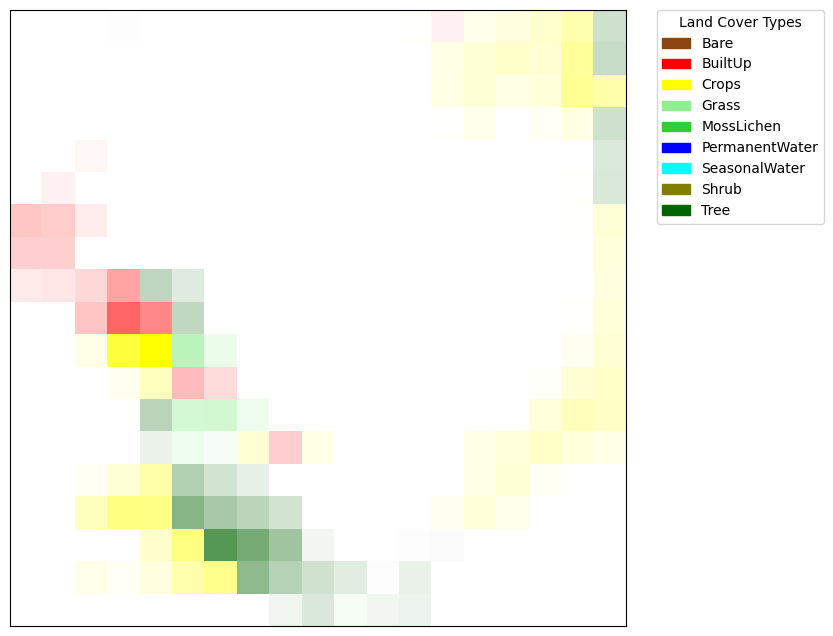

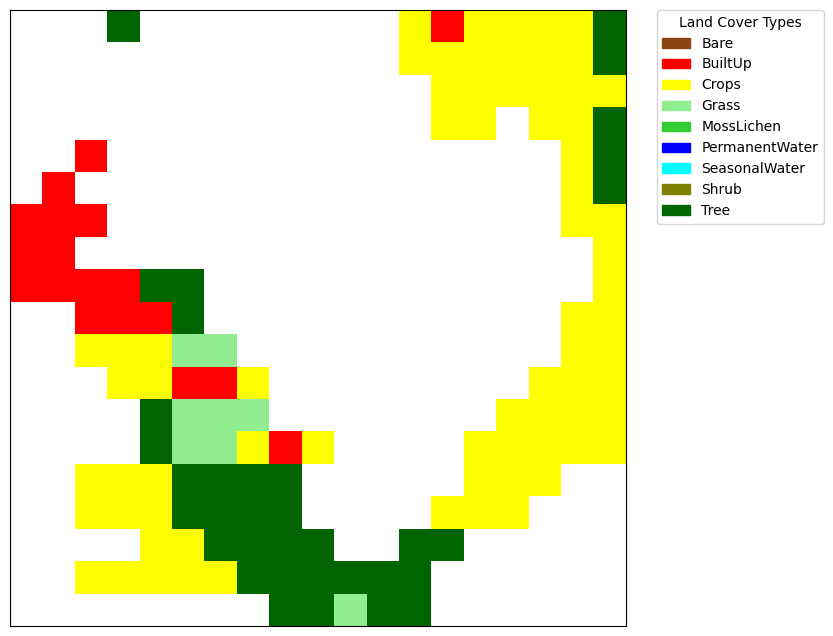

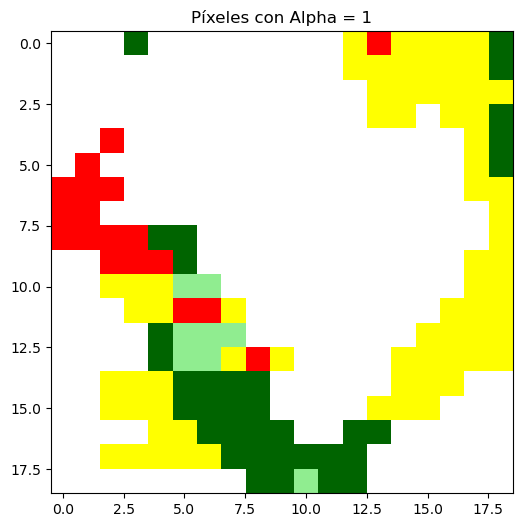

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.011804
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    82
1     1   0      Grass    82
2     2   0      Grass    82
3     3   0       Tree    82
4     4   0       Tree    82
..   ..  ..        ...   ...
356  14  18       Tree    82
357  15  18   Built-Up    82
358  16  18   Built-Up    82
359  17  18   Built-Up    82
360  18  18   Built-Up    82

[361 rows x 4 columns]
83


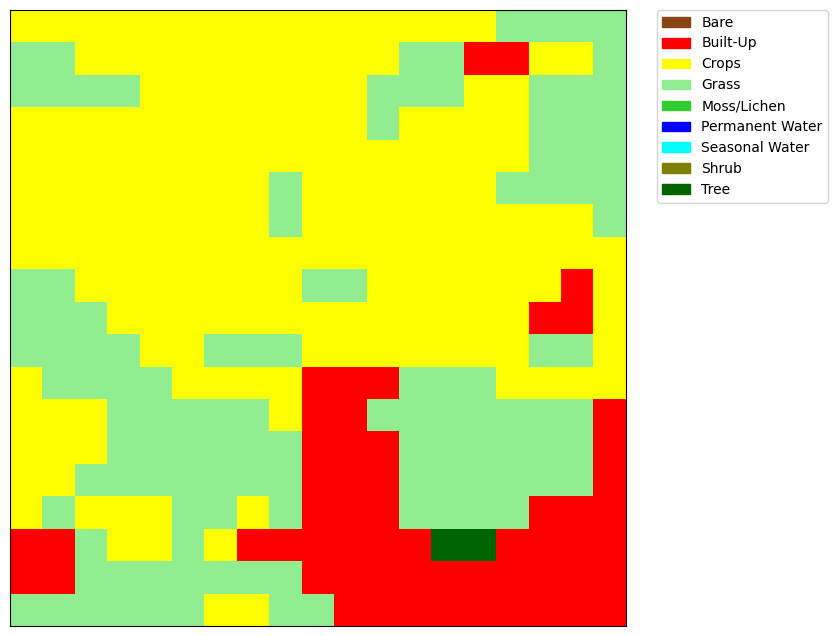

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


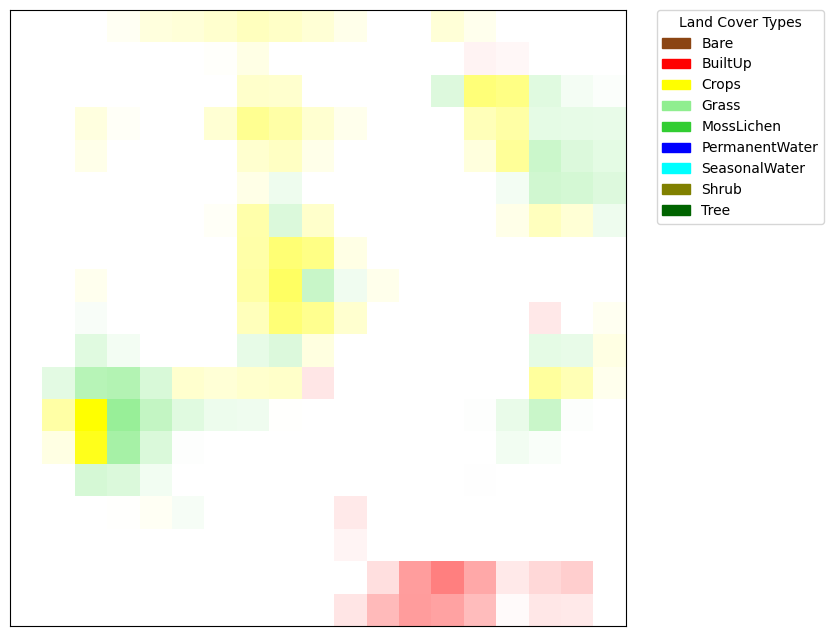

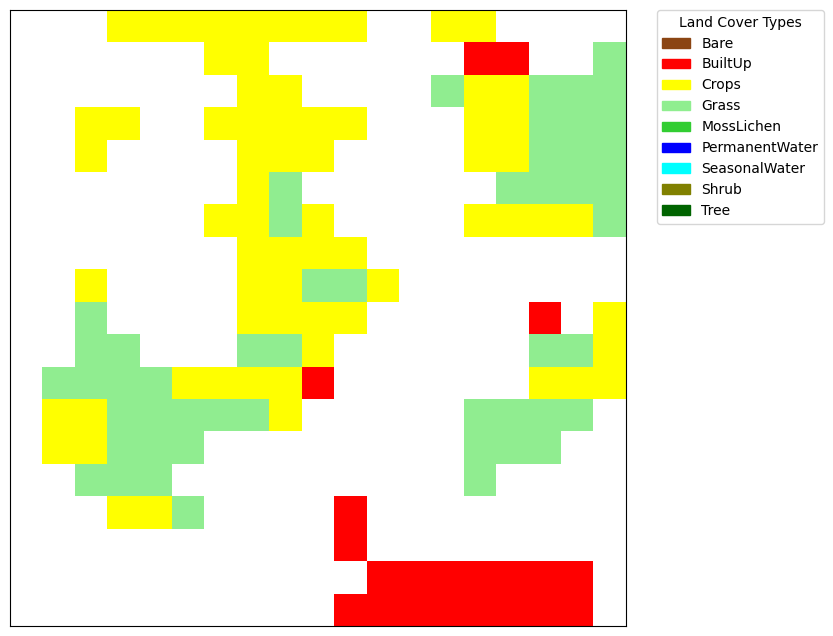

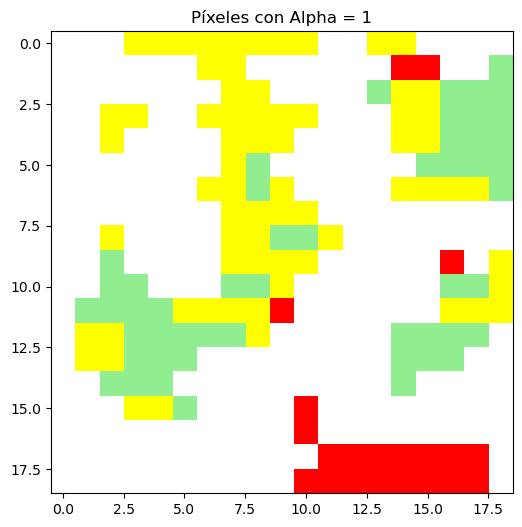

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.049663
4     0   4              1        0.134385
..   ..  ..            ...             ...
356  18  14              5        0.266290
357  18  15              5        0.020036
358  18  16              5        0.095472
359  18  17              5        0.086884
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    83
1     1   0      Crops    83
2     2   0      Crops    83
3     3   0      Crops    83
4     4   0      Crops    83
..   ..  ..        ...   ...
356  14  18   Built-Up    83
357  15  18   Built-Up    83
358  16  18   Built-Up    83
359  17  18   Built-Up    83
360  18  18   Built-Up    83

[361 rows x 4 columns]
84


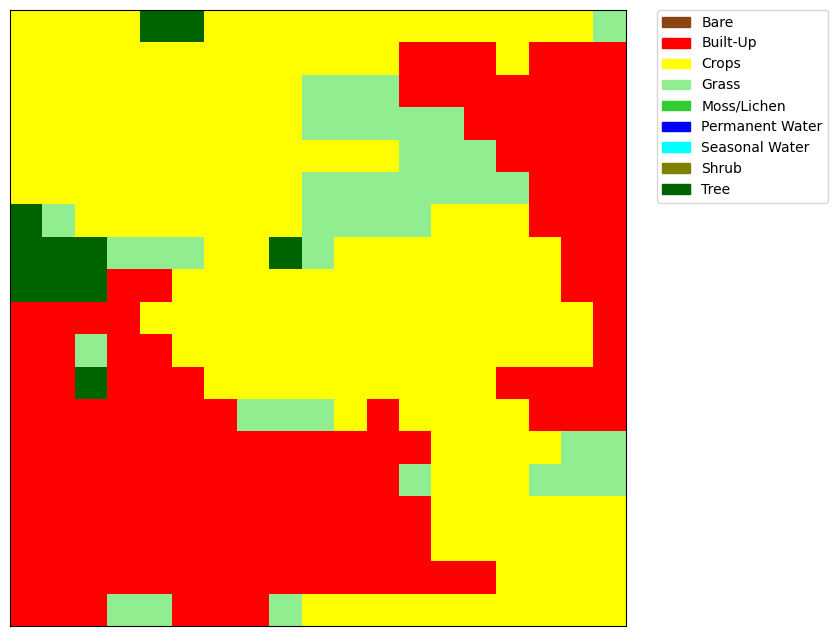

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


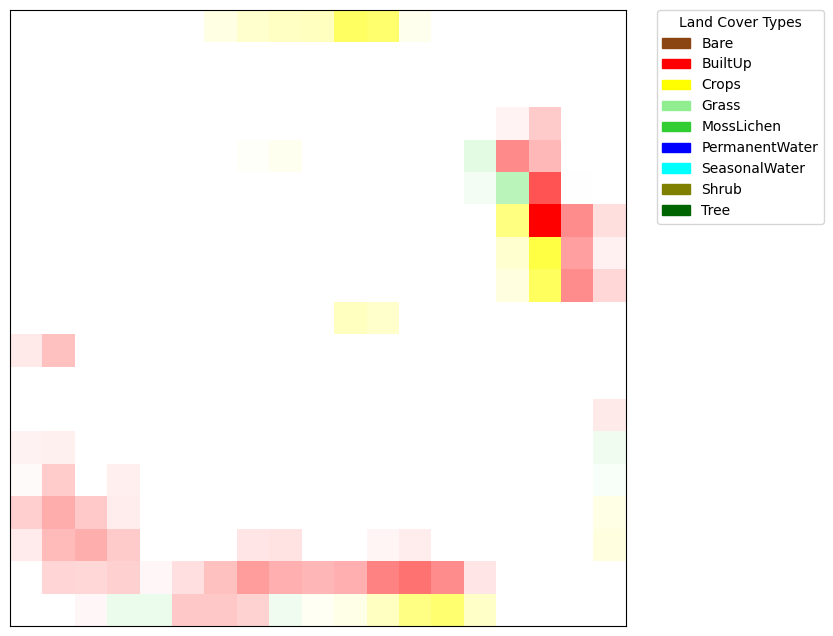

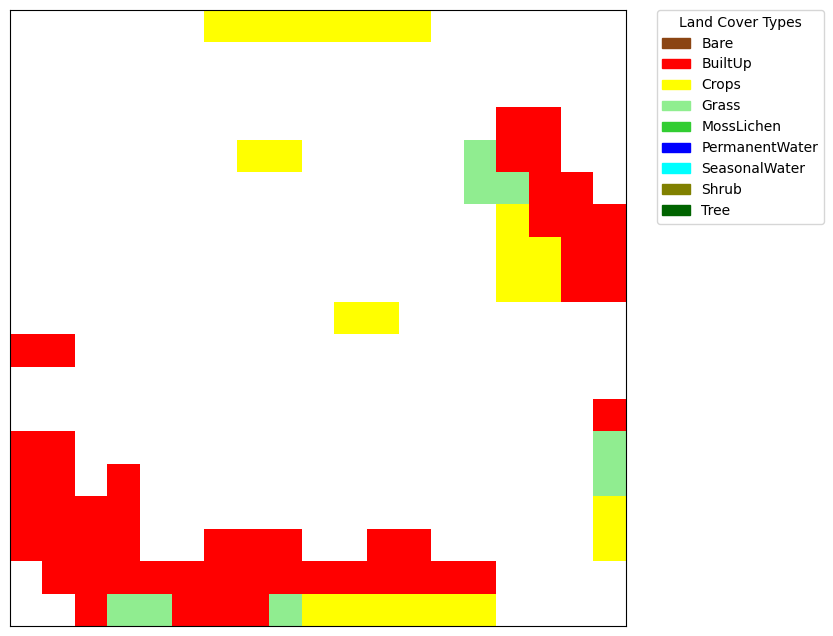

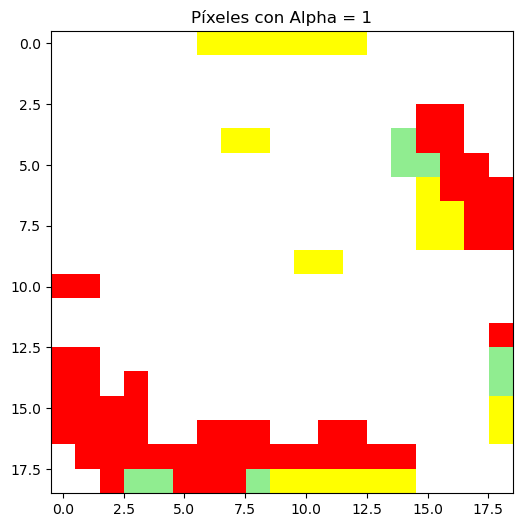

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              7        0.221678
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    84
1     1   0      Crops    84
2     2   0      Crops    84
3     3   0      Crops    84
4     4   0       Tree    84
..   ..  ..        ...   ...
356  14  18      Crops    84
357  15  18      Crops    84
358  16  18      Crops    84
359  17  18      Crops    84
360  18  18      Crops    84

[361 rows x 4 columns]
85


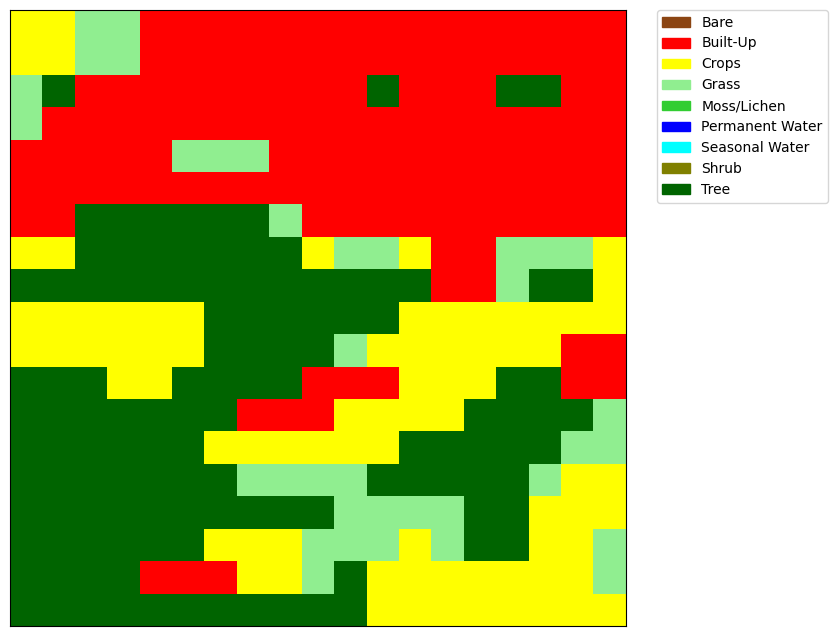

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


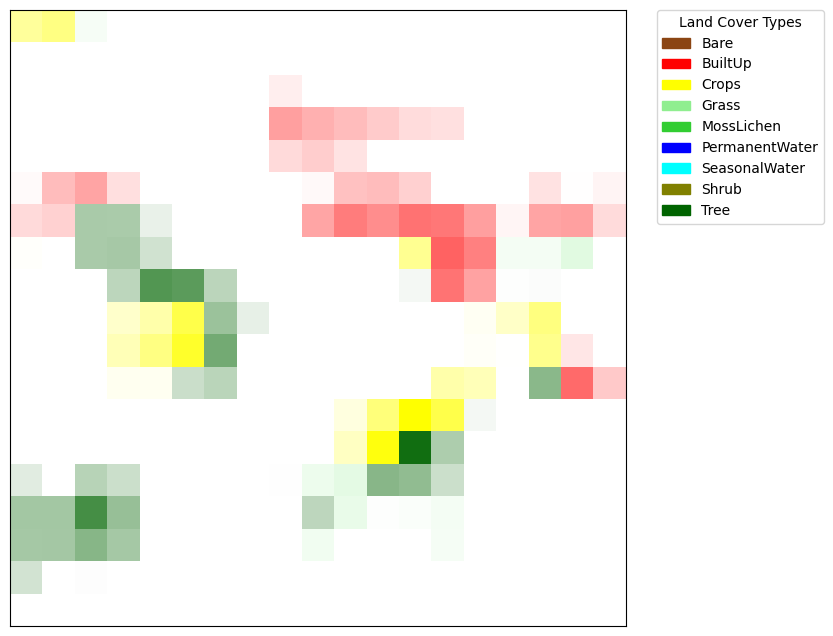

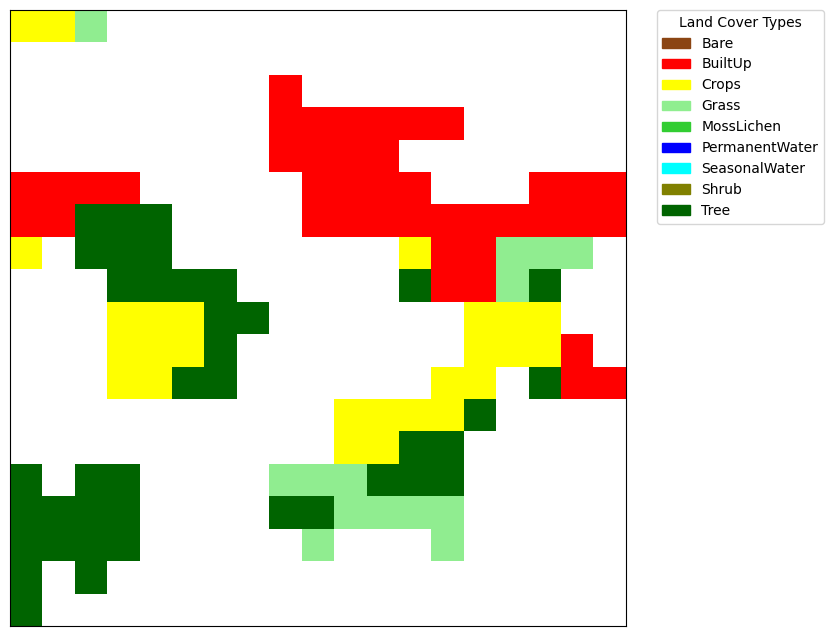

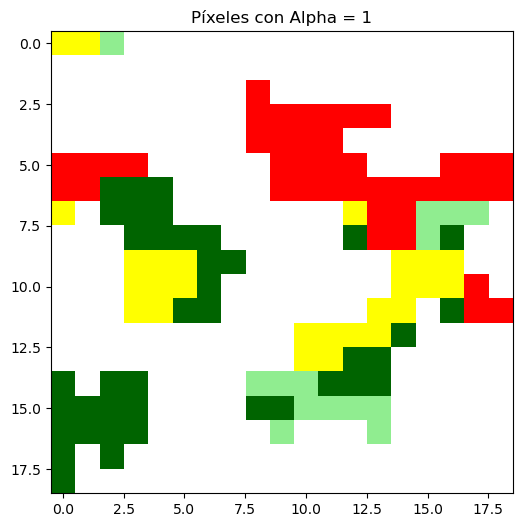

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.393473
1     0   1              1        0.490341
2     0   2              1        0.079150
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    85
1     1   0      Crops    85
2     2   0      Grass    85
3     3   0      Grass    85
4     4   0   Built-Up    85
..   ..  ..        ...   ...
356  14  18      Crops    85
357  15  18      Crops    85
358  16  18      Crops    85
359  17  18      Crops    85
360  18  18      Crops    85

[361 rows x 4 columns]
86


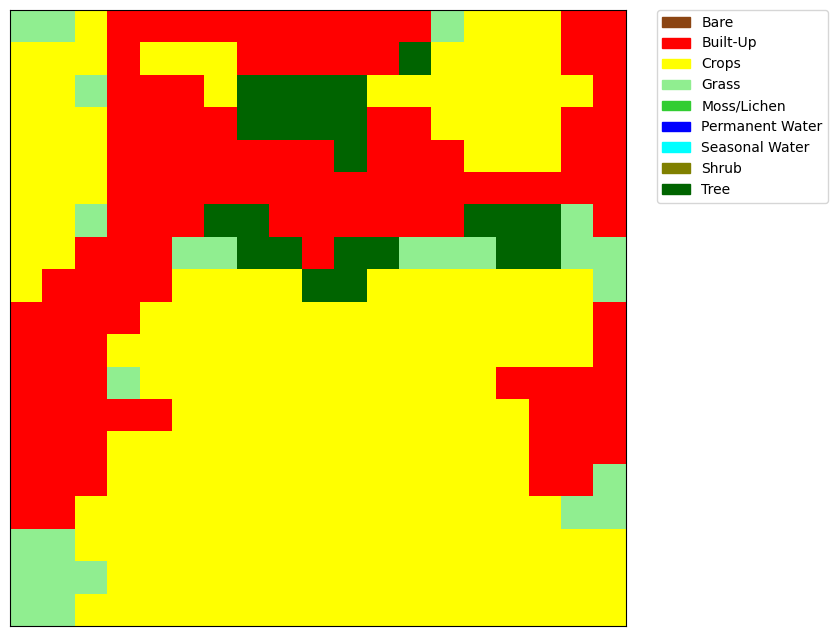

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


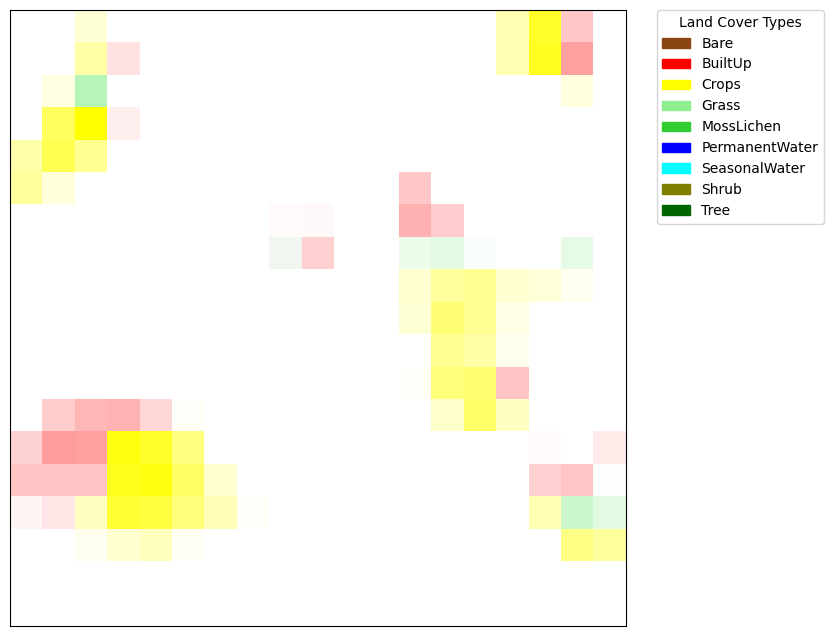

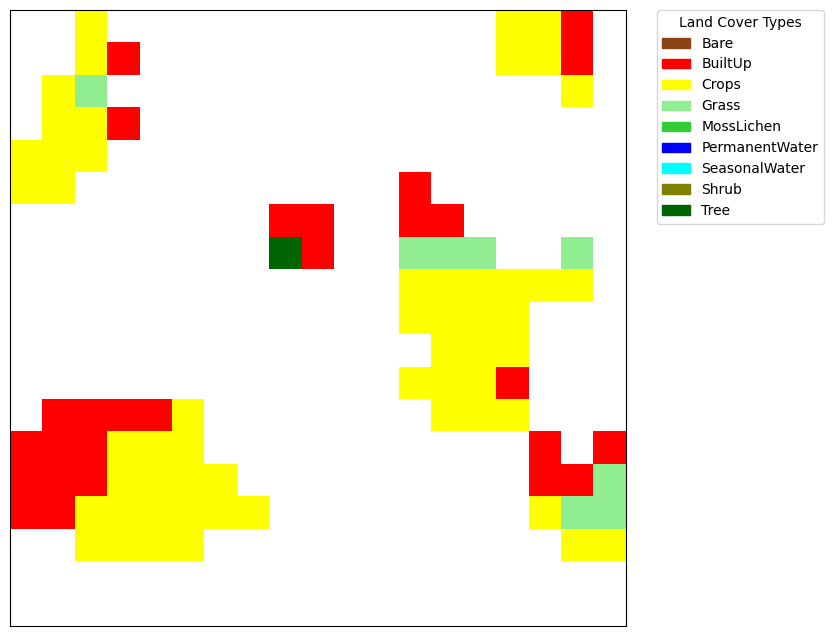

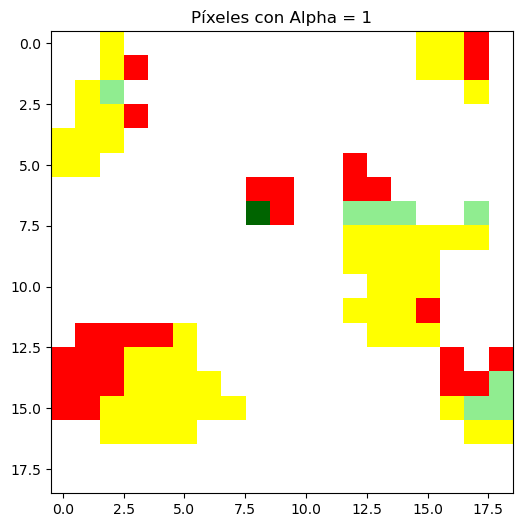

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.166025
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass    86
1     1   0      Grass    86
2     2   0      Crops    86
3     3   0   Built-Up    86
4     4   0   Built-Up    86
..   ..  ..        ...   ...
356  14  18      Crops    86
357  15  18      Crops    86
358  16  18      Crops    86
359  17  18      Crops    86
360  18  18      Crops    86

[361 rows x 4 columns]
87


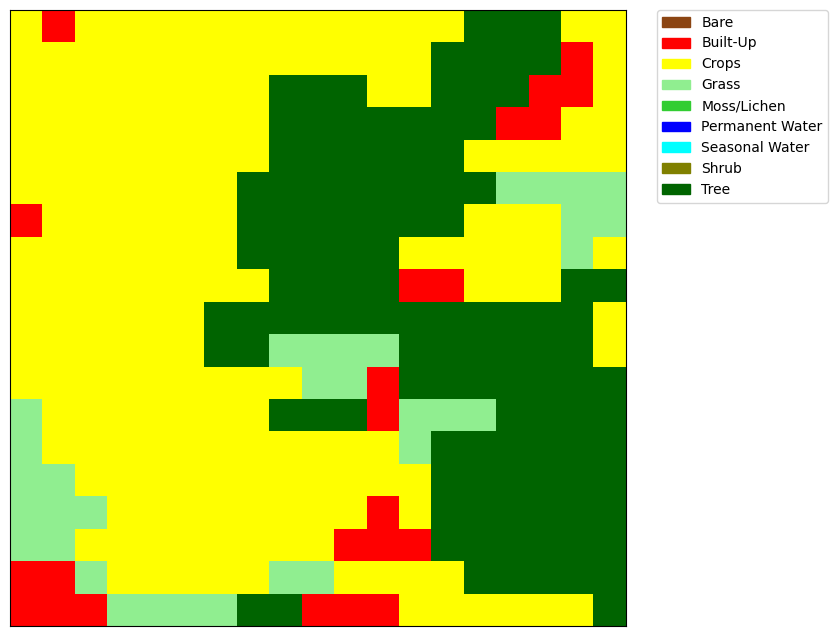

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


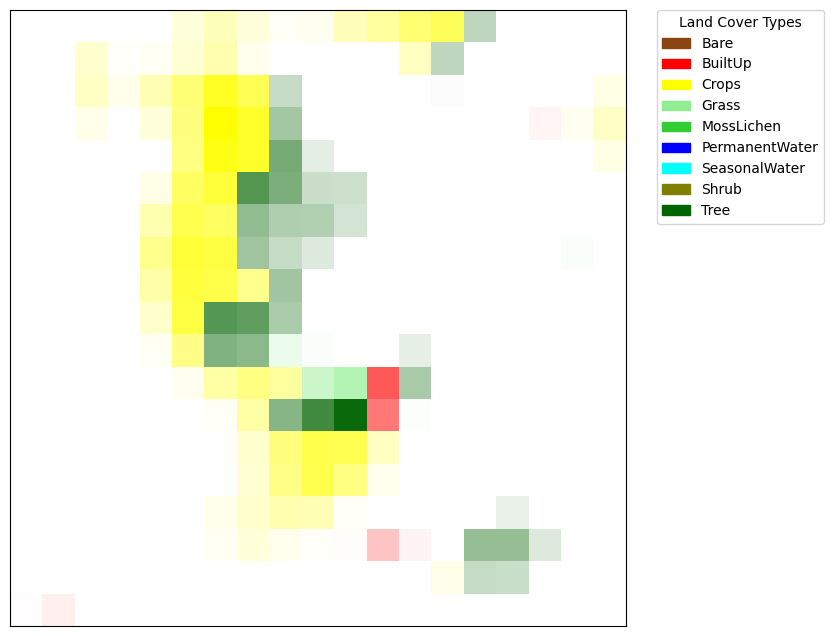

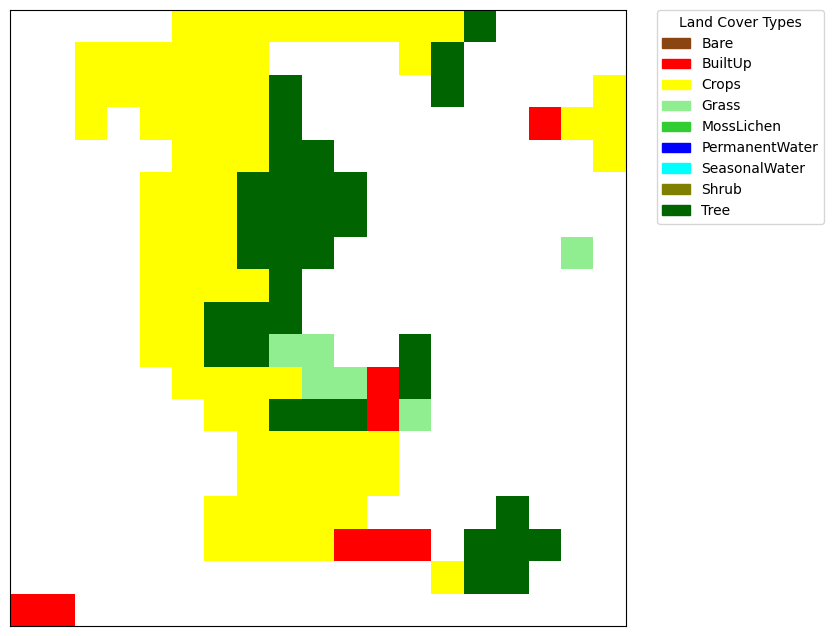

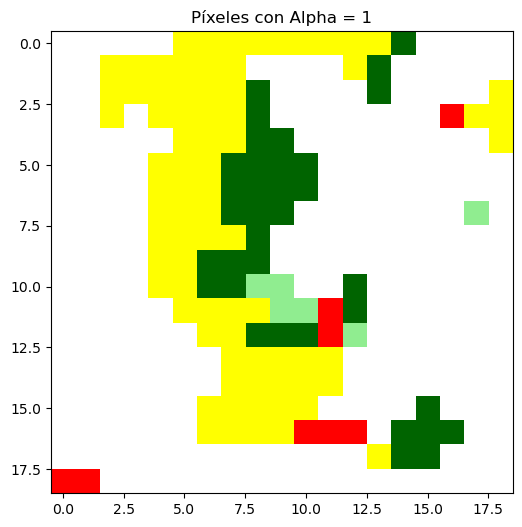

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    87
1     1   0   Built-Up    87
2     2   0      Crops    87
3     3   0      Crops    87
4     4   0      Crops    87
..   ..  ..        ...   ...
356  14  18      Crops    87
357  15  18      Crops    87
358  16  18      Crops    87
359  17  18      Crops    87
360  18  18       Tree    87

[361 rows x 4 columns]
88


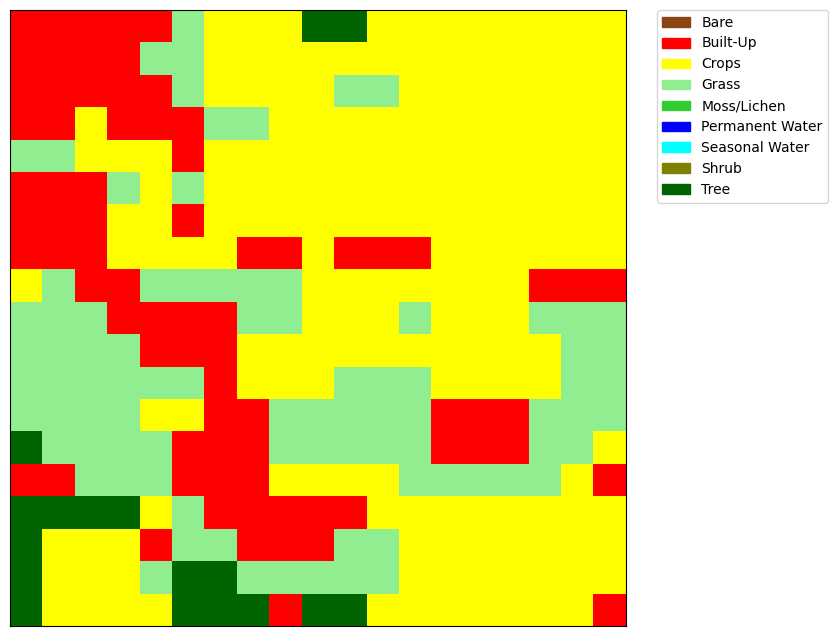

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


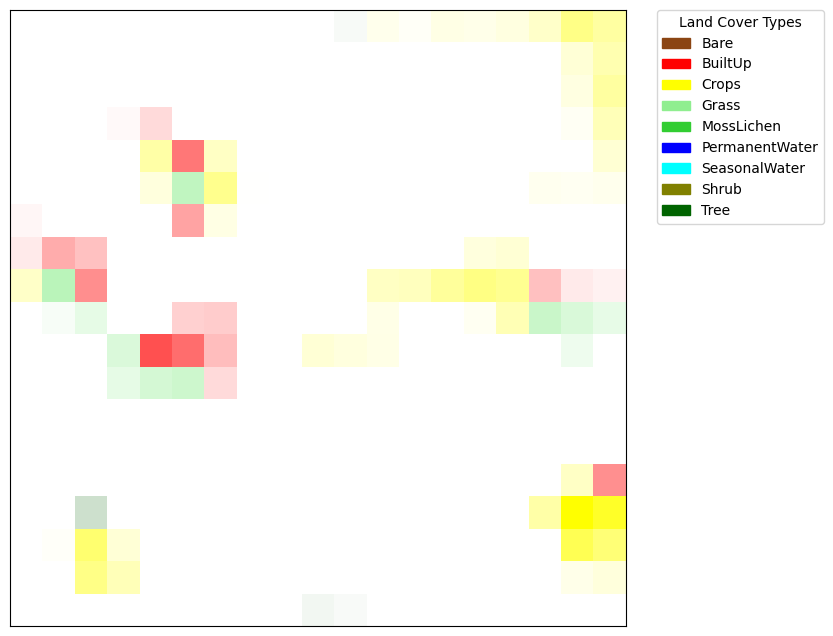

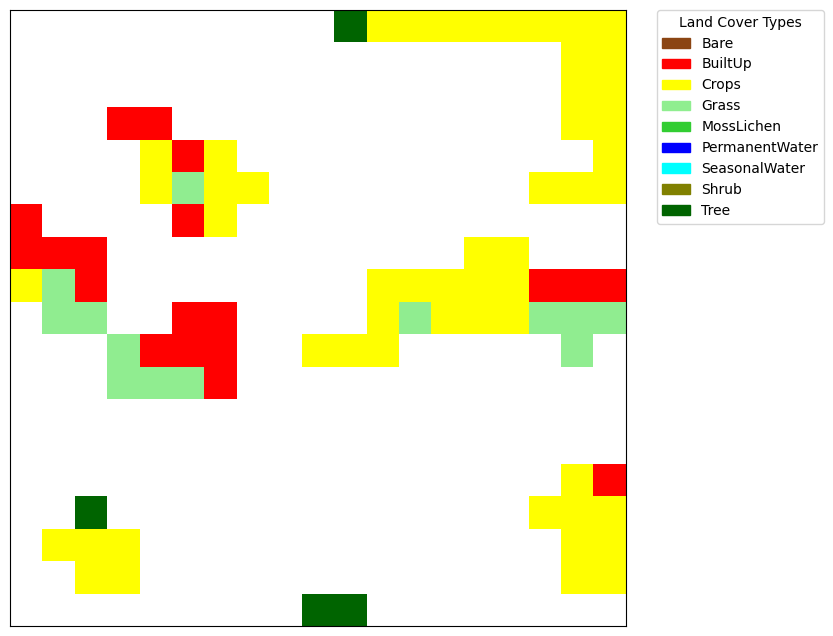

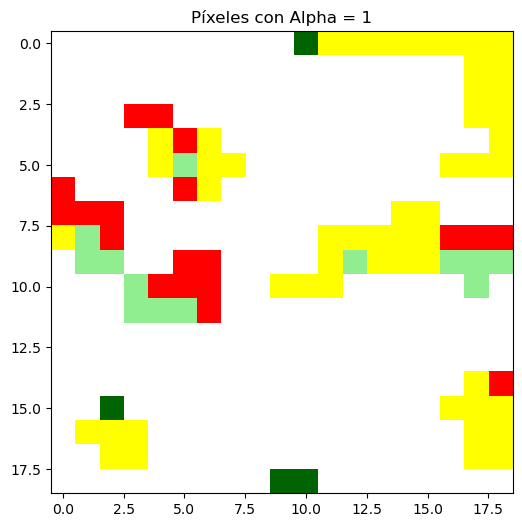

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    88
1     1   0   Built-Up    88
2     2   0   Built-Up    88
3     3   0   Built-Up    88
4     4   0   Built-Up    88
..   ..  ..        ...   ...
356  14  18      Crops    88
357  15  18      Crops    88
358  16  18      Crops    88
359  17  18      Crops    88
360  18  18   Built-Up    88

[361 rows x 4 columns]
89


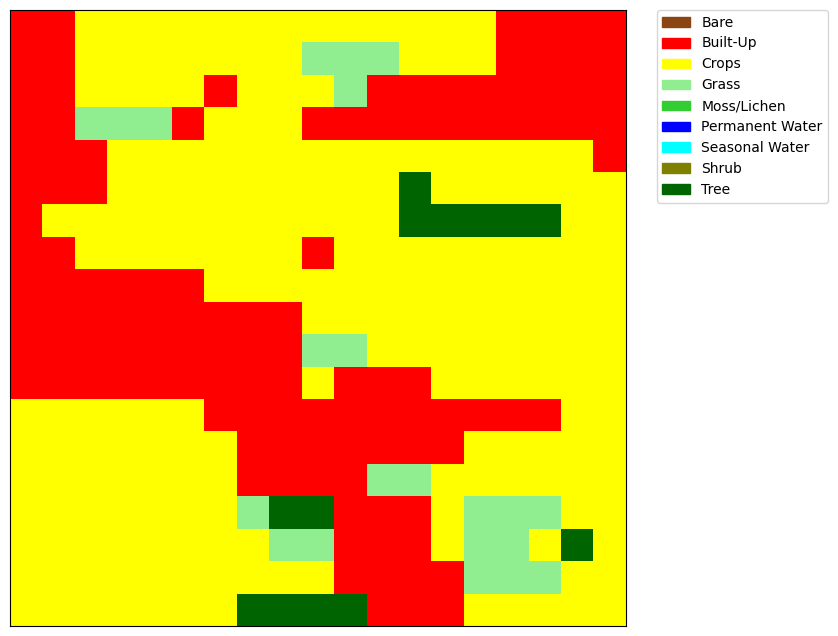

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


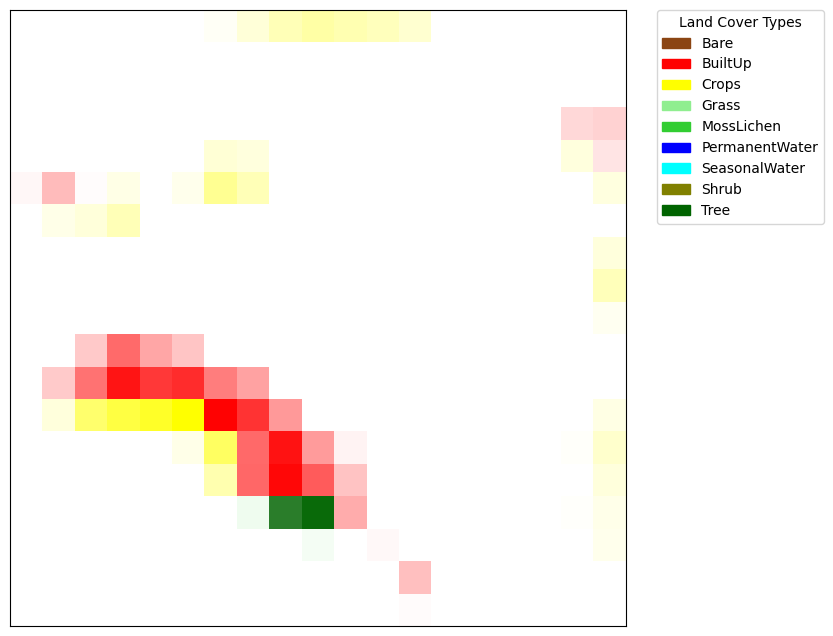

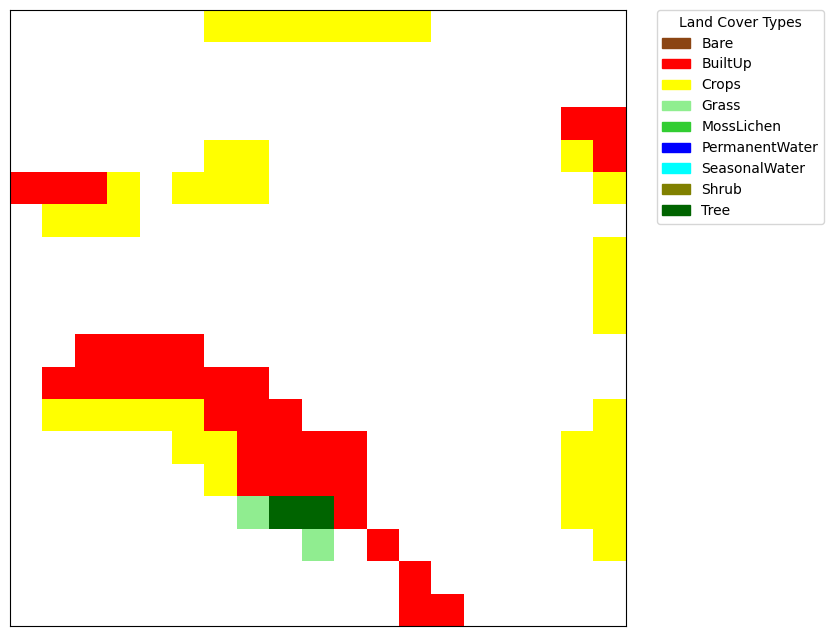

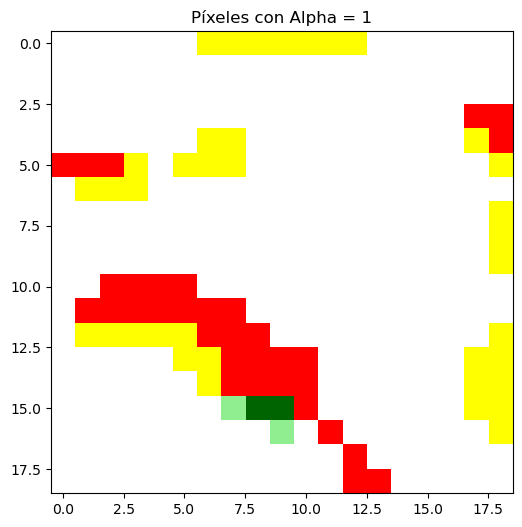

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    89
1     1   0   Built-Up    89
2     2   0      Crops    89
3     3   0      Crops    89
4     4   0      Crops    89
..   ..  ..        ...   ...
356  14  18      Crops    89
357  15  18      Crops    89
358  16  18      Crops    89
359  17  18      Crops    89
360  18  18      Crops    89

[361 rows x 4 columns]
90


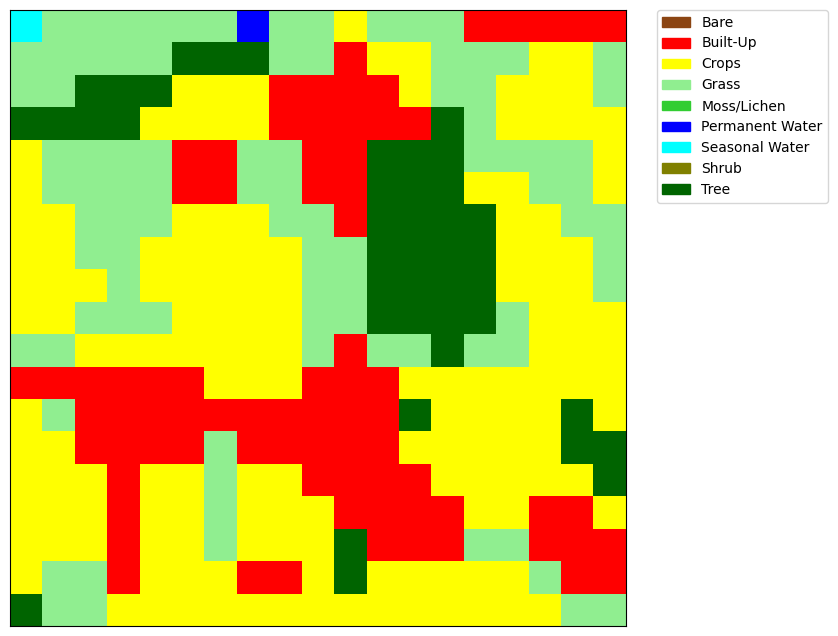

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


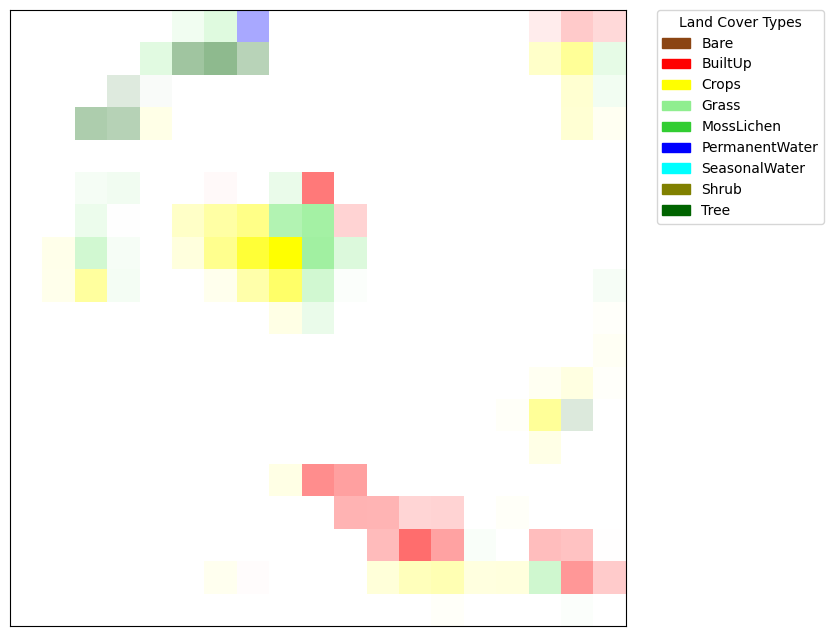

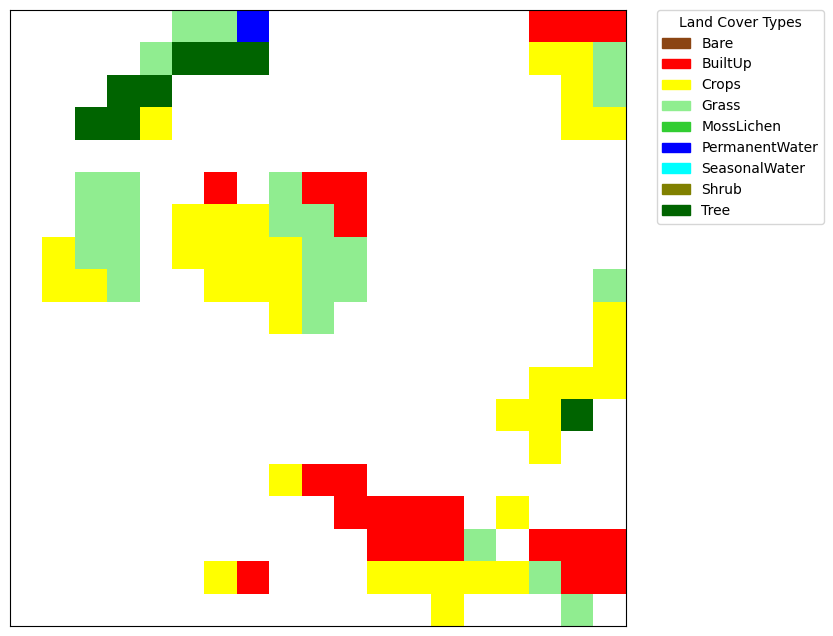

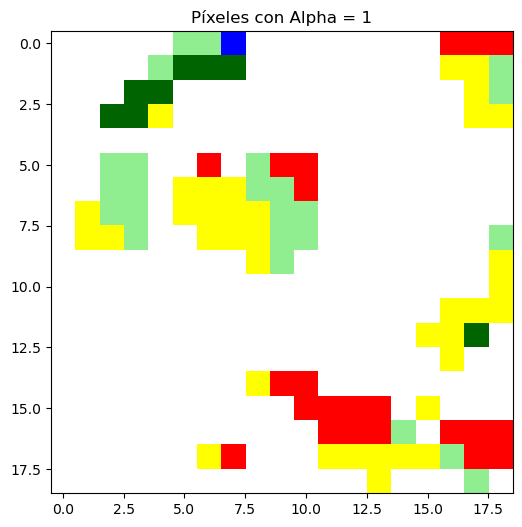

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              6        0.035322
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y      land_cover  site
0     0   0  Seasonal Water    90
1     1   0           Grass    90
2     2   0           Grass    90
3     3   0           Grass    90
4     4   0           Grass    90
..   ..  ..             ...   ...
356  14  18           Crops    90
357  15  18           Crops    90
358  16  18           Crops    90
359  17  18           Grass    90
360  18 

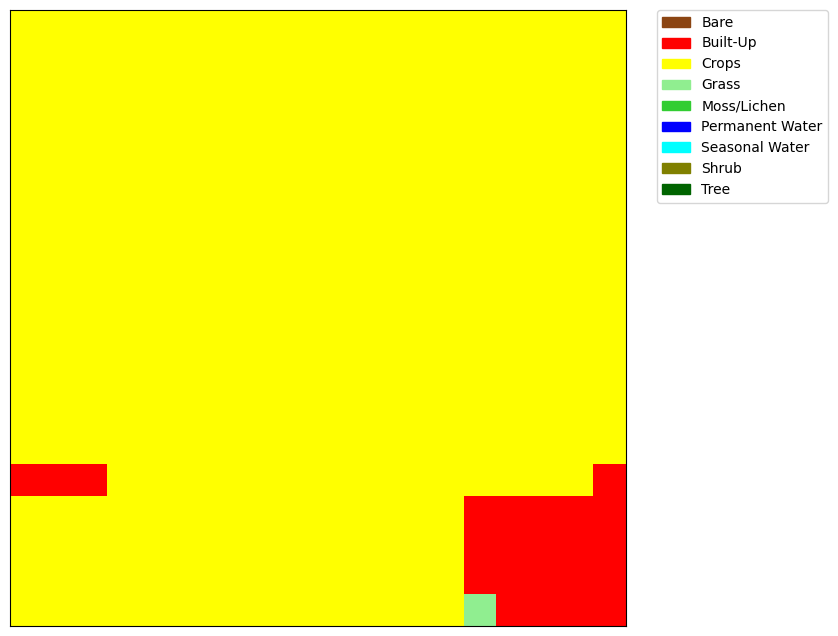

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


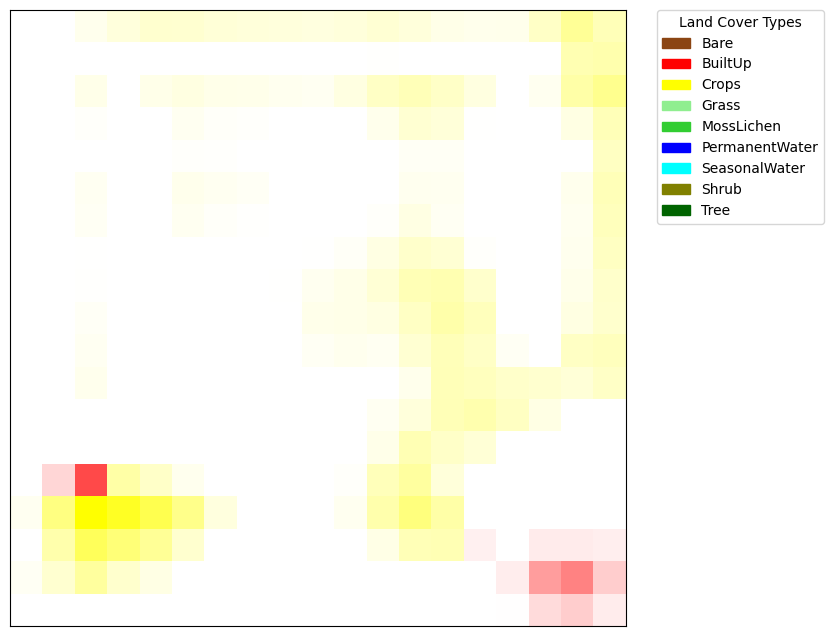

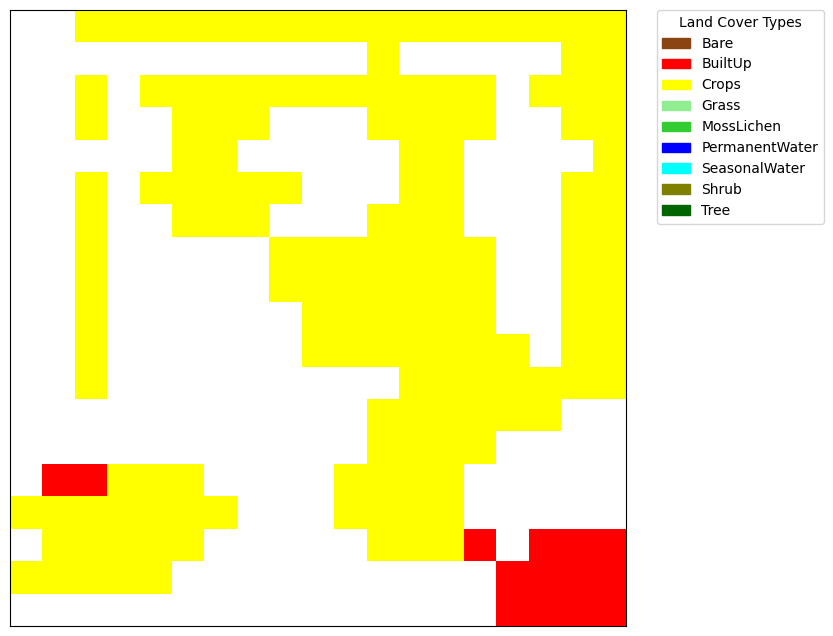

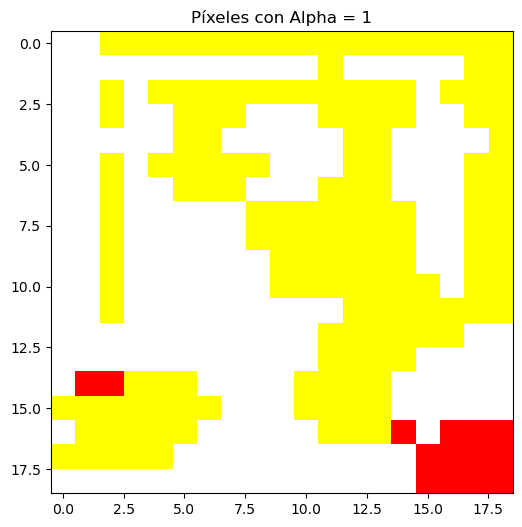

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.073249
3     0   3              1        0.137520
4     0   4              1        0.190355
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              1        0.004173
358  18  16              1        0.143432
359  18  17              1        0.196181
360  18  18              1        0.077048

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    91
1     1   0      Crops    91
2     2   0      Crops    91
3     3   0      Crops    91
4     4   0      Crops    91
..   ..  ..        ...   ...
356  14  18      Grass    91
357  15  18   Built-Up    91
358  16  18   Built-Up    91
359  17  18   Built-Up    91
360  18  18   Built-Up    91

[361 rows x 4 columns]
92


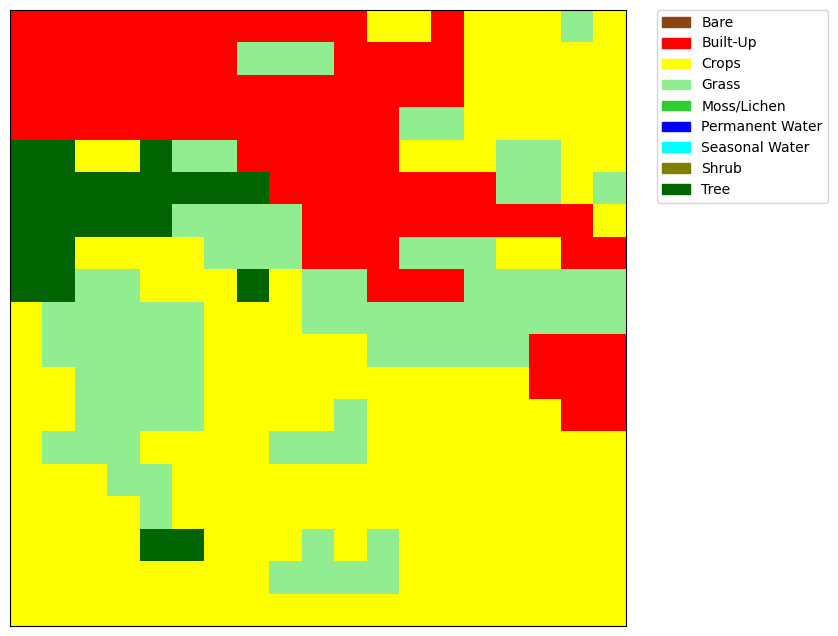

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


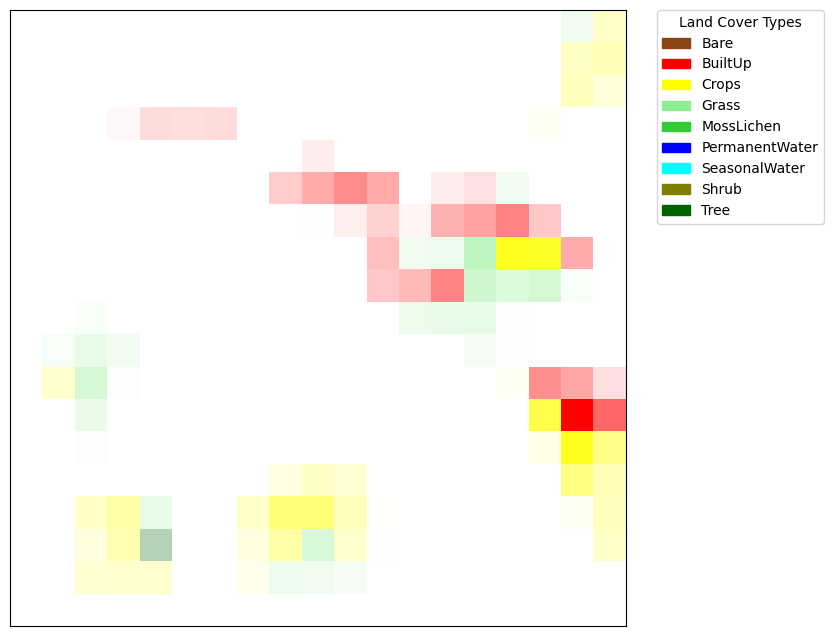

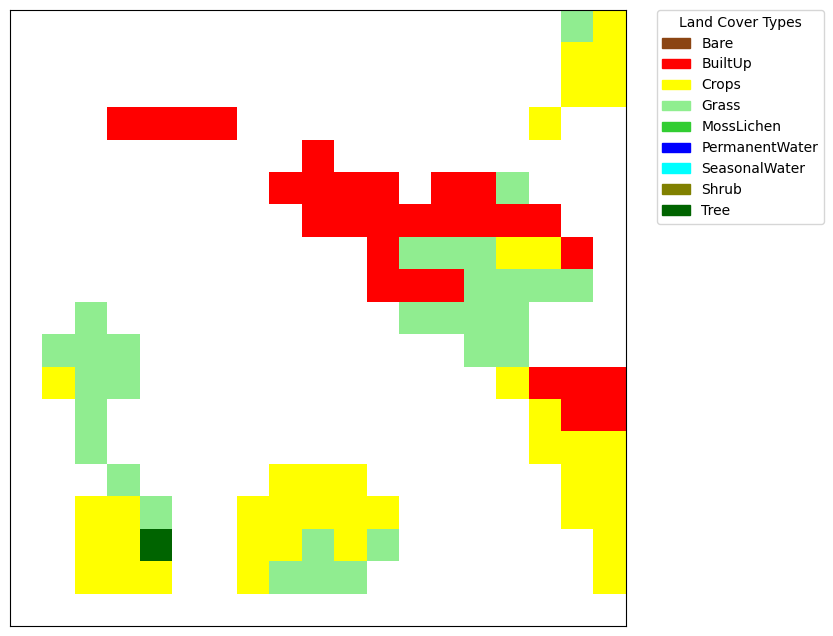

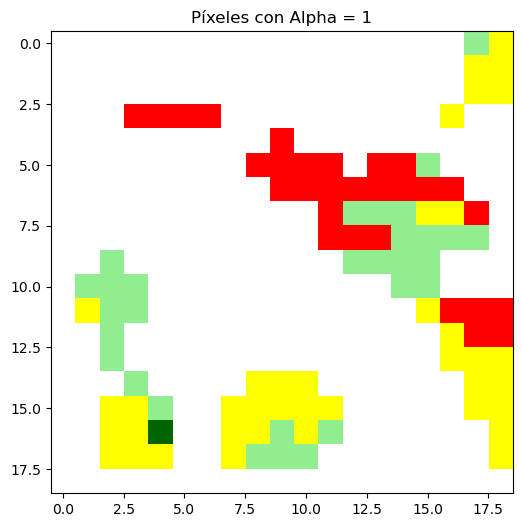

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    92
1     1   0   Built-Up    92
2     2   0   Built-Up    92
3     3   0   Built-Up    92
4     4   0   Built-Up    92
..   ..  ..        ...   ...
356  14  18      Crops    92
357  15  18      Crops    92
358  16  18      Crops    92
359  17  18      Crops    92
360  18  18      Crops    92

[361 rows x 4 columns]
93


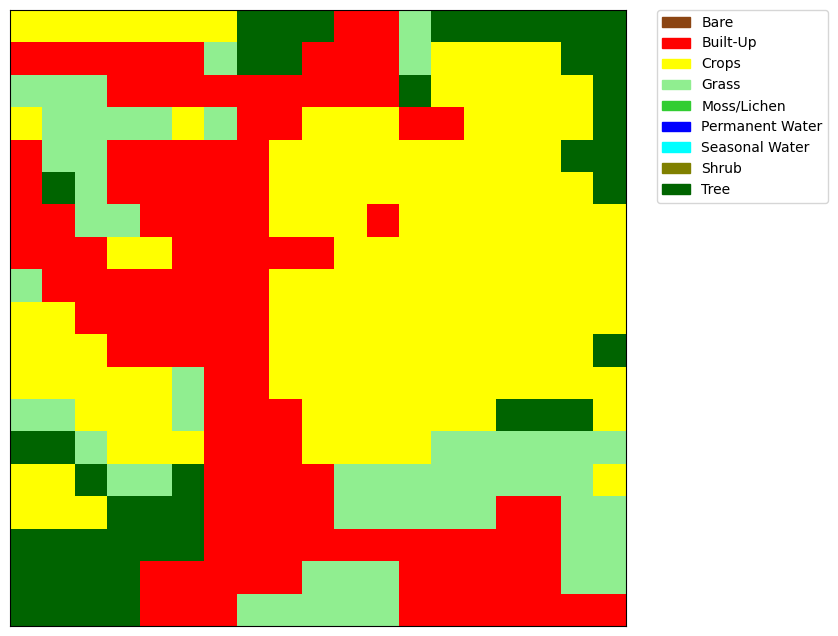

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


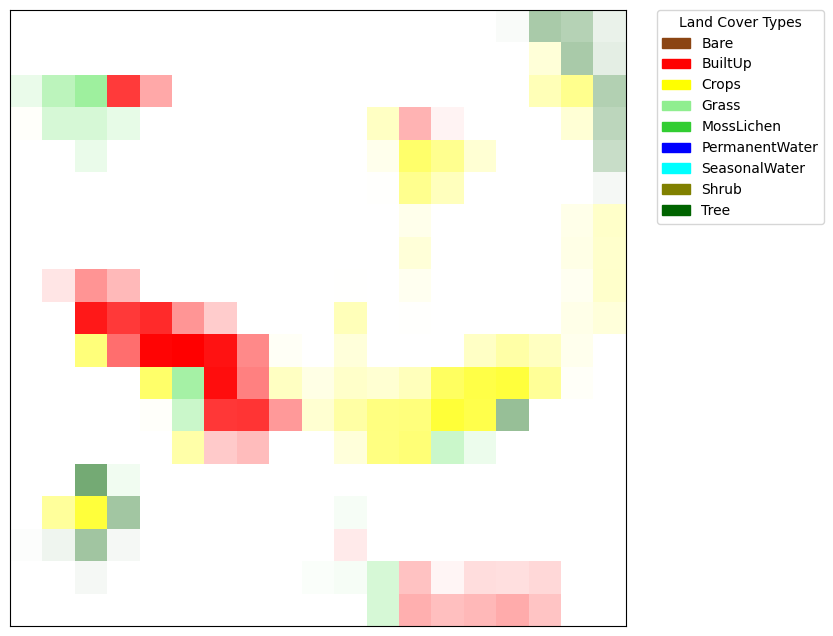

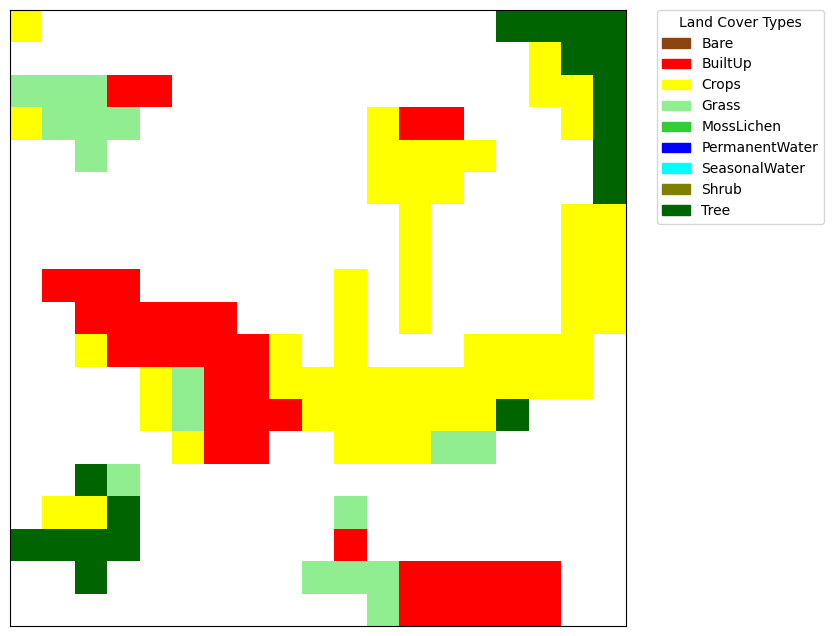

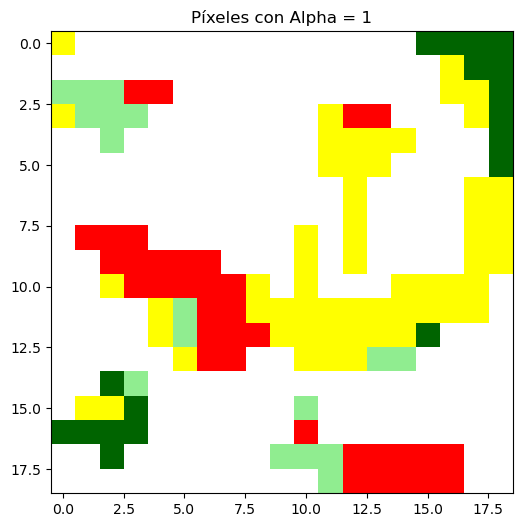

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.001604
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              6        0.280750
357  18  15              6        0.331997
358  18  16              6        0.232771
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    93
1     1   0      Crops    93
2     2   0      Crops    93
3     3   0      Crops    93
4     4   0      Crops    93
..   ..  ..        ...   ...
356  14  18   Built-Up    93
357  15  18   Built-Up    93
358  16  18   Built-Up    93
359  17  18   Built-Up    93
360  18  18   Built-Up    93

[361 rows x 4 columns]
94


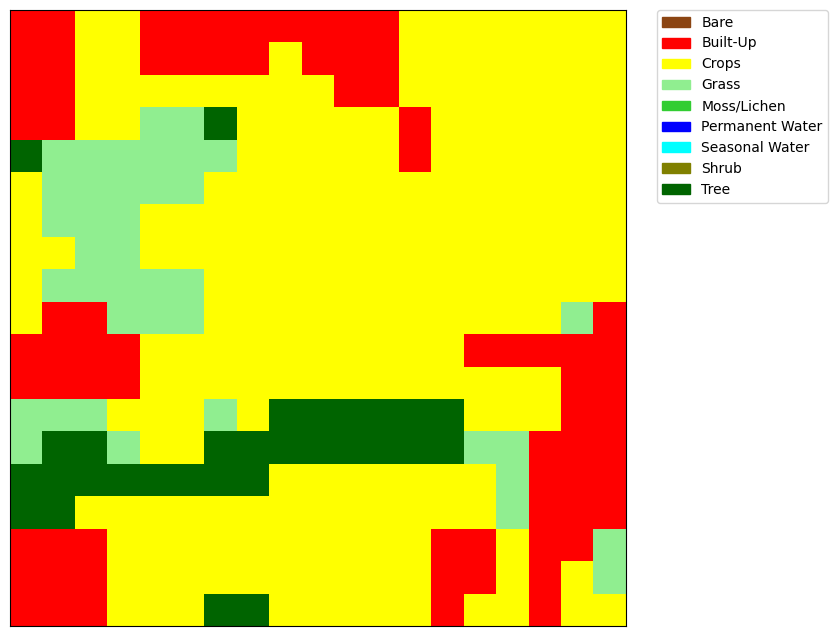

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


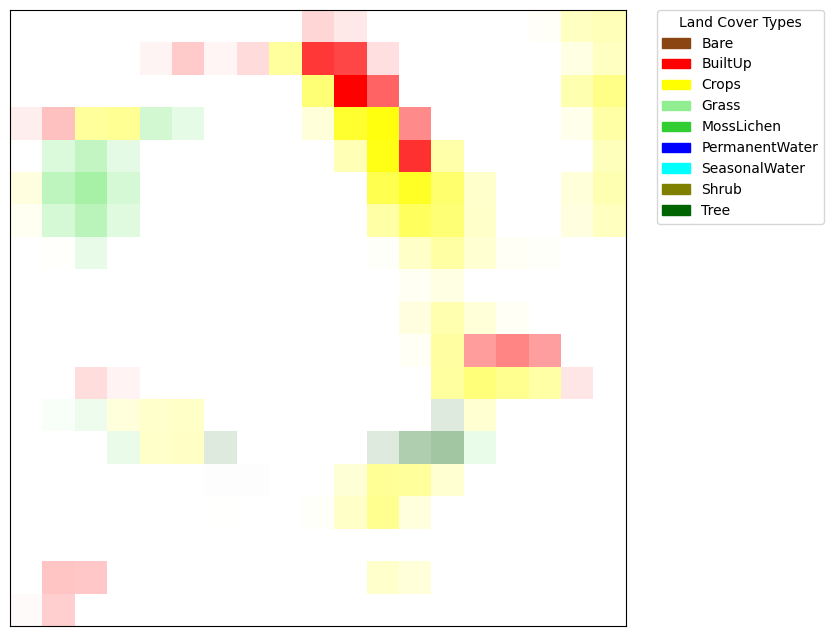

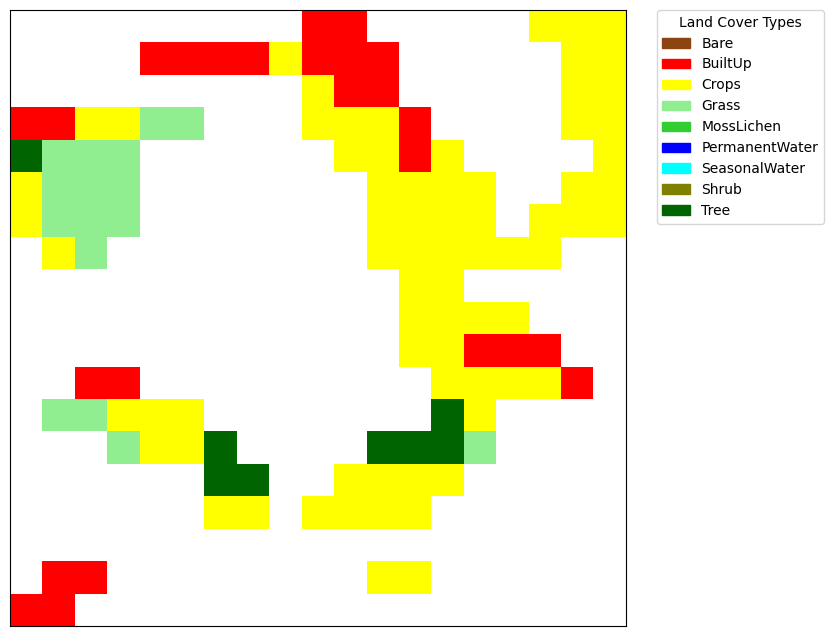

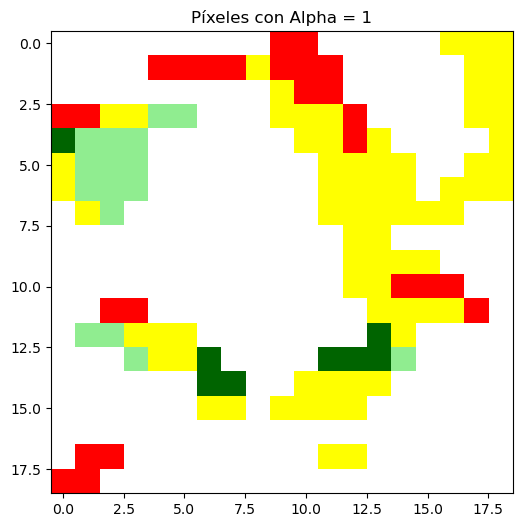

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    94
1     1   0   Built-Up    94
2     2   0      Crops    94
3     3   0      Crops    94
4     4   0   Built-Up    94
..   ..  ..        ...   ...
356  14  18      Crops    94
357  15  18      Crops    94
358  16  18   Built-Up    94
359  17  18      Crops    94
360  18  18      Crops    94

[361 rows x 4 columns]
95


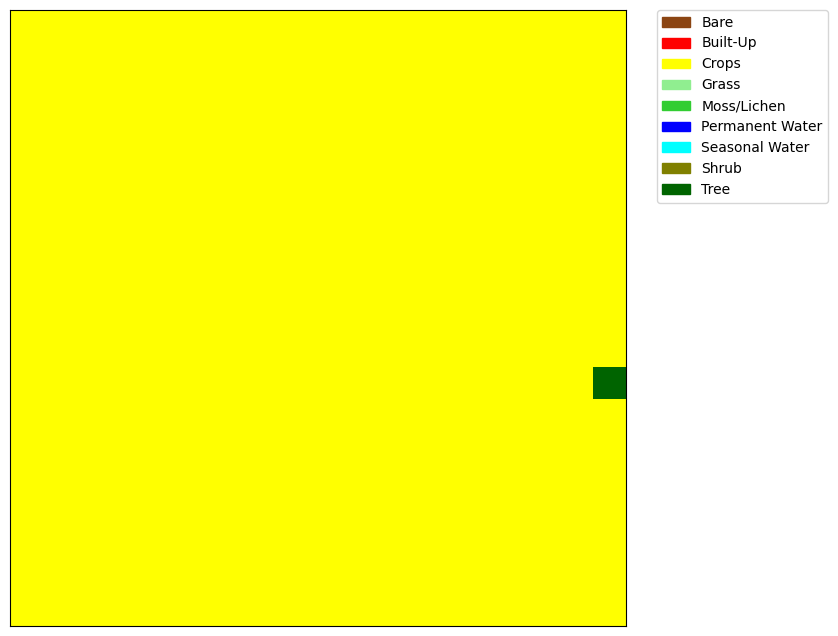

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


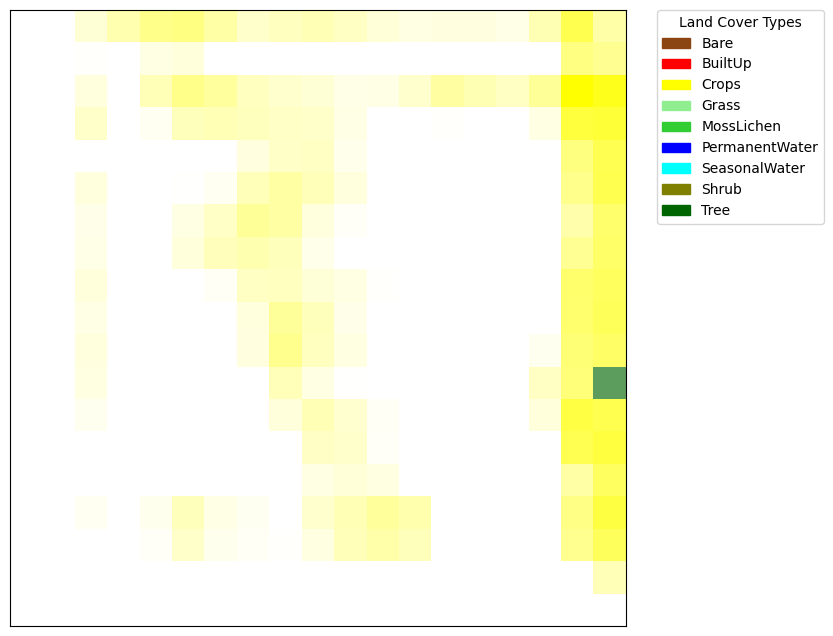

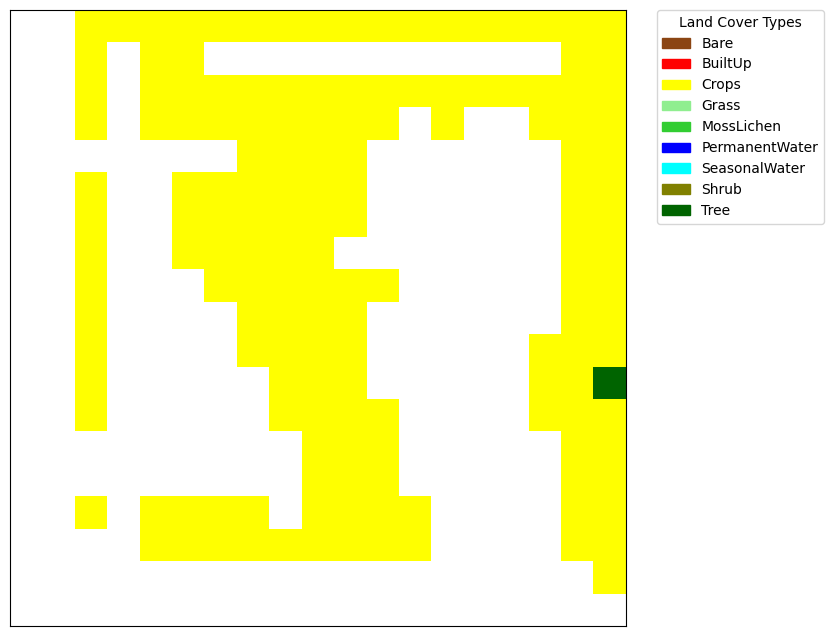

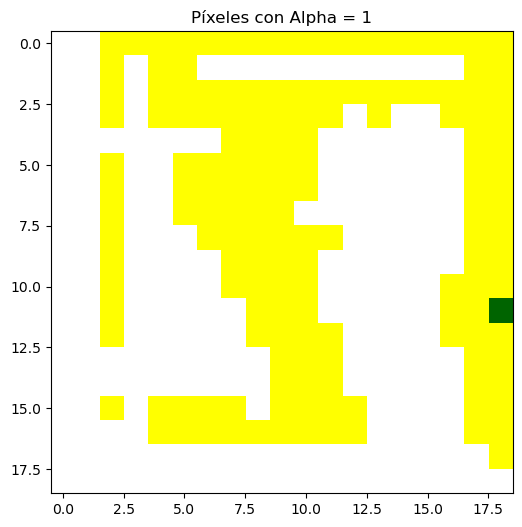

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.165607
3     0   3              1        0.317166
4     0   4              1        0.460419
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    95
1     1   0      Crops    95
2     2   0      Crops    95
3     3   0      Crops    95
4     4   0      Crops    95
..   ..  ..        ...   ...
356  14  18      Crops    95
357  15  18      Crops    95
358  16  18      Crops    95
359  17  18      Crops    95
360  18  18      Crops    95

[361 rows x 4 columns]
96


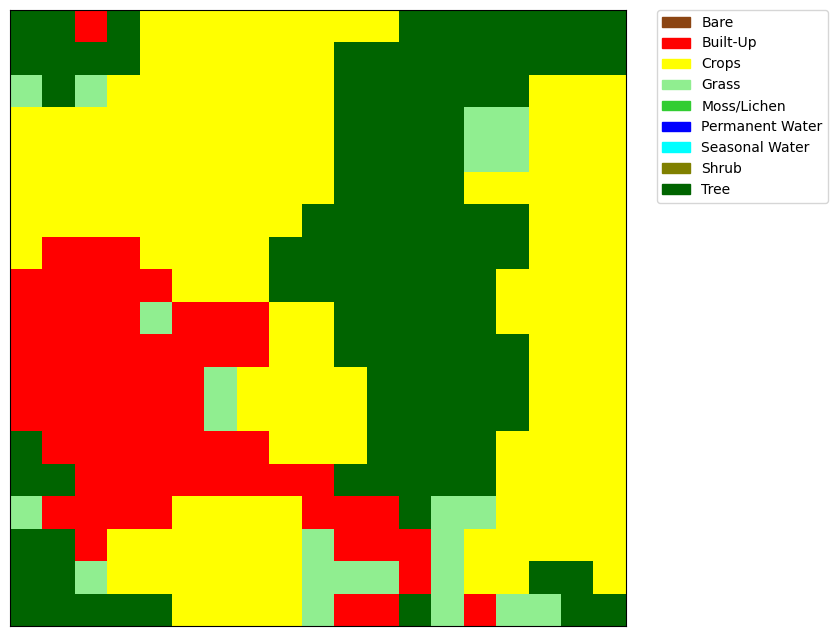

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


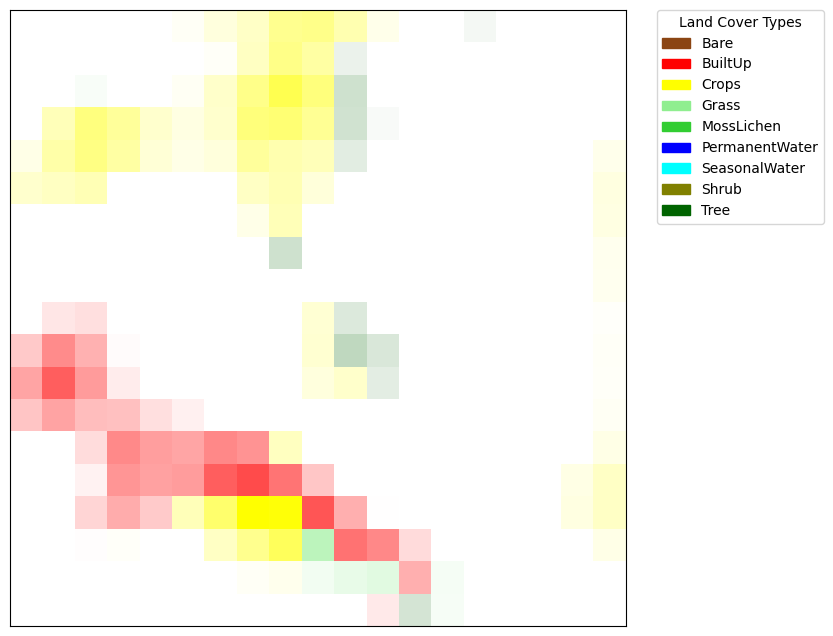

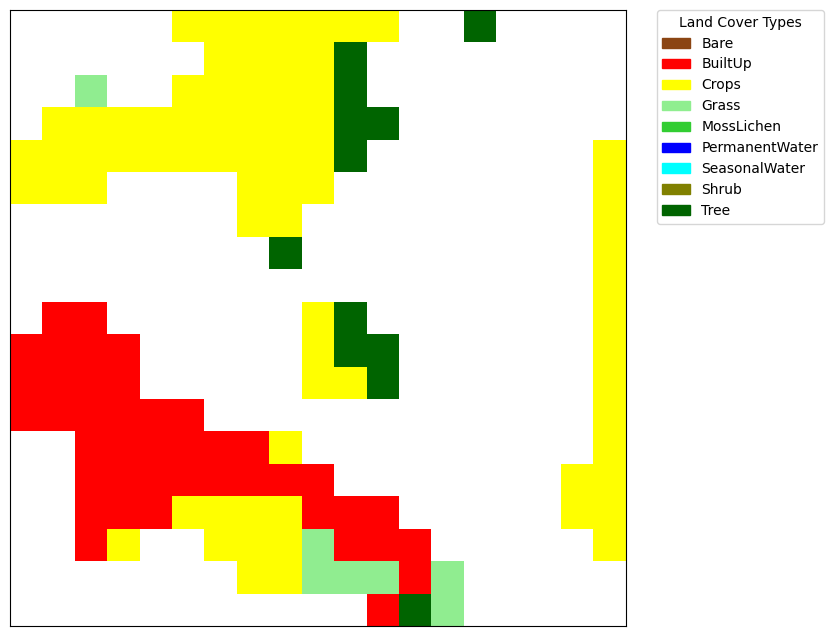

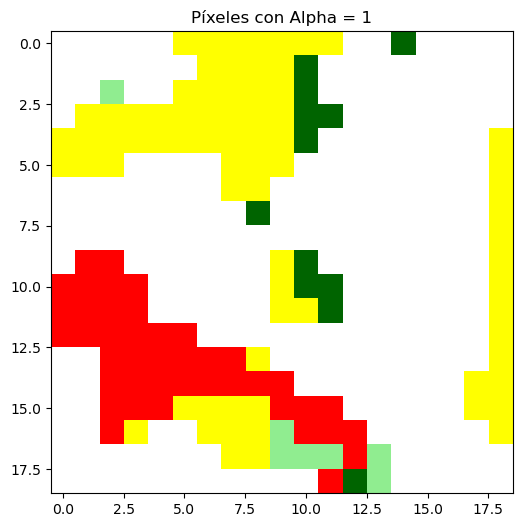

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree    96
1     1   0       Tree    96
2     2   0   Built-Up    96
3     3   0       Tree    96
4     4   0      Crops    96
..   ..  ..        ...   ...
356  14  18   Built-Up    96
357  15  18      Grass    96
358  16  18      Grass    96
359  17  18       Tree    96
360  18  18       Tree    96

[361 rows x 4 columns]
97


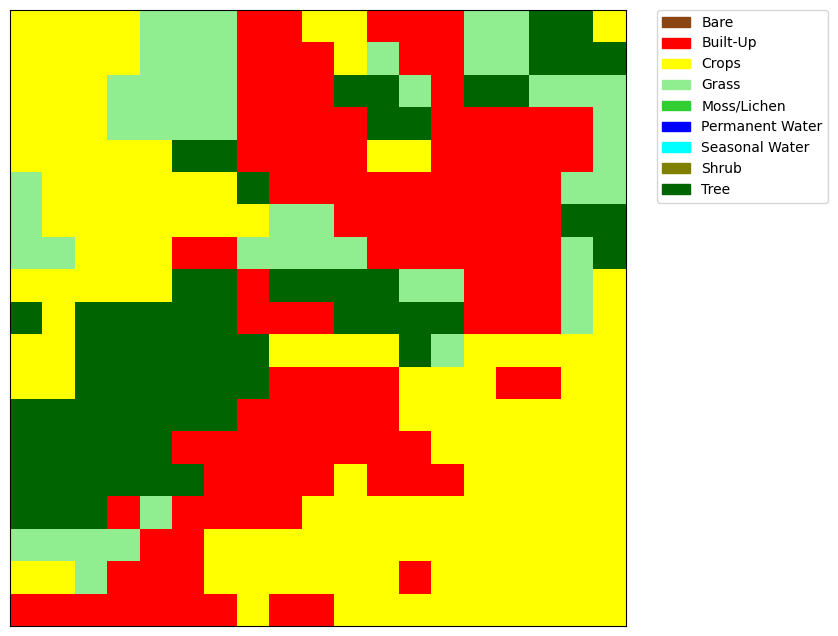

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


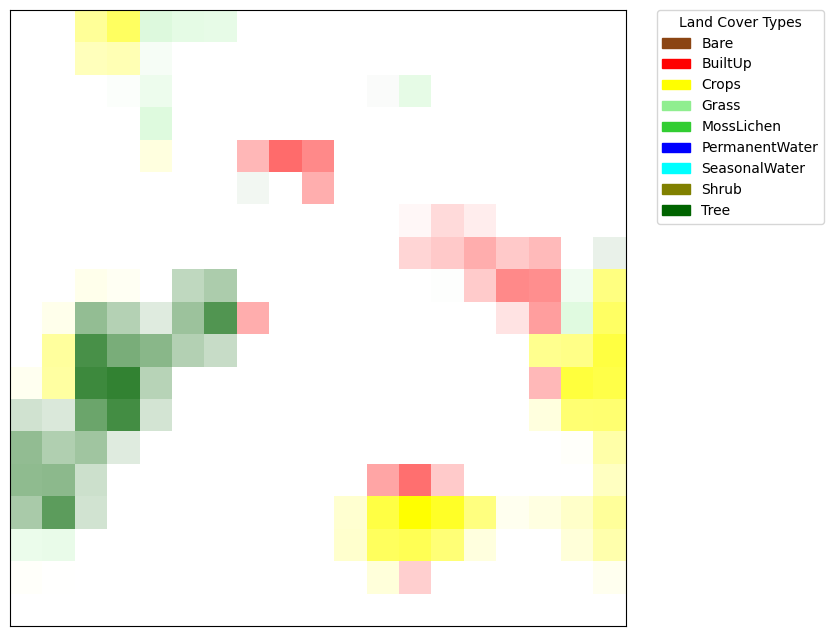

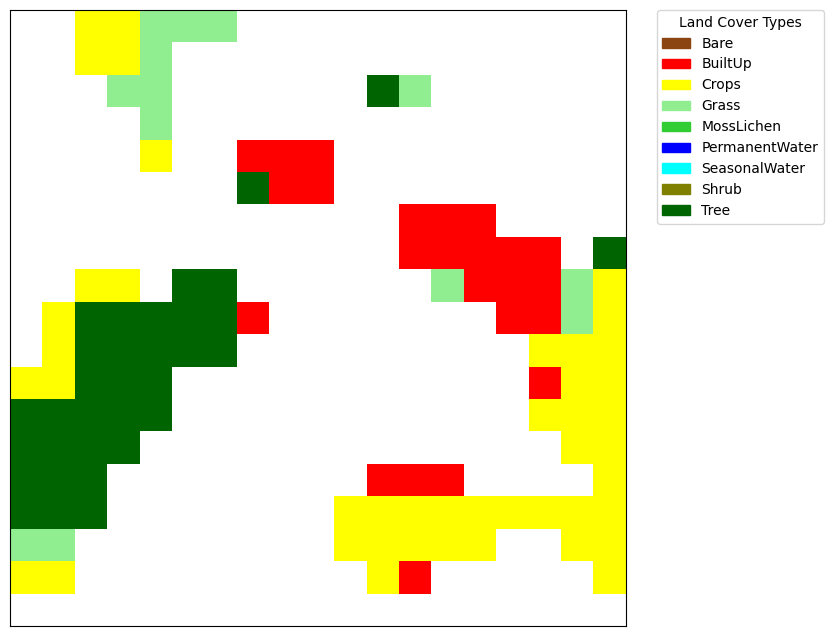

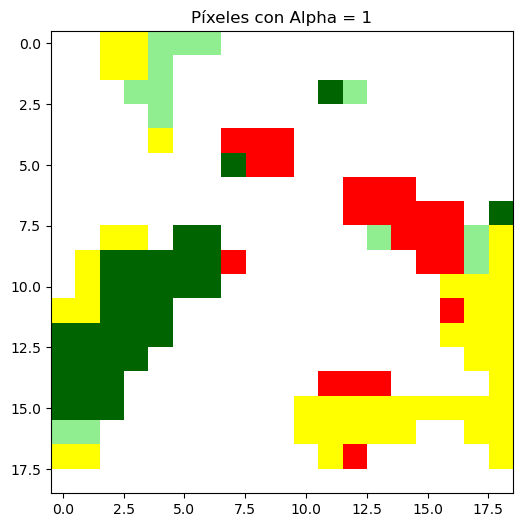

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.407097
3     0   3              1        0.626061
4     0   4              1        0.299757
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    97
1     1   0      Crops    97
2     2   0      Crops    97
3     3   0      Crops    97
4     4   0      Grass    97
..   ..  ..        ...   ...
356  14  18      Crops    97
357  15  18      Crops    97
358  16  18      Crops    97
359  17  18      Crops    97
360  18  18      Crops    97

[361 rows x 4 columns]
98


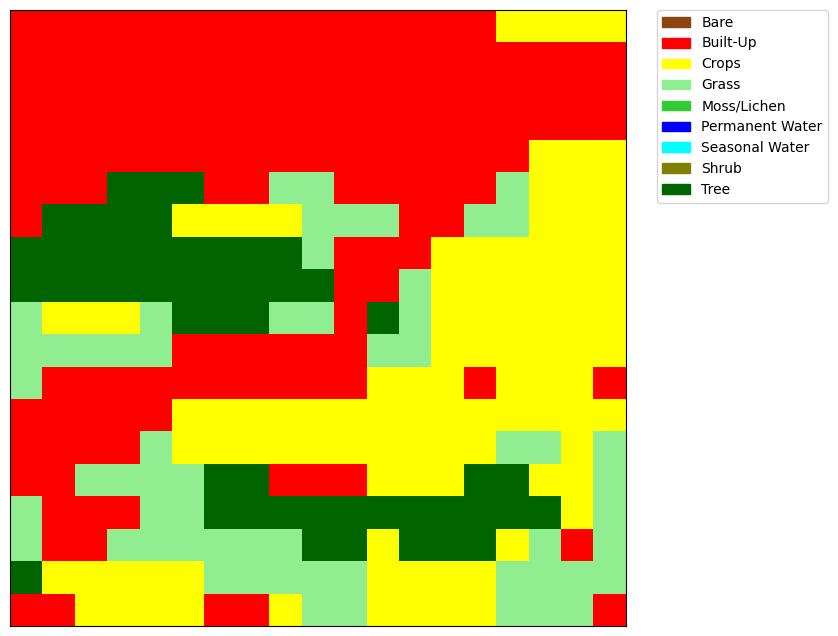

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


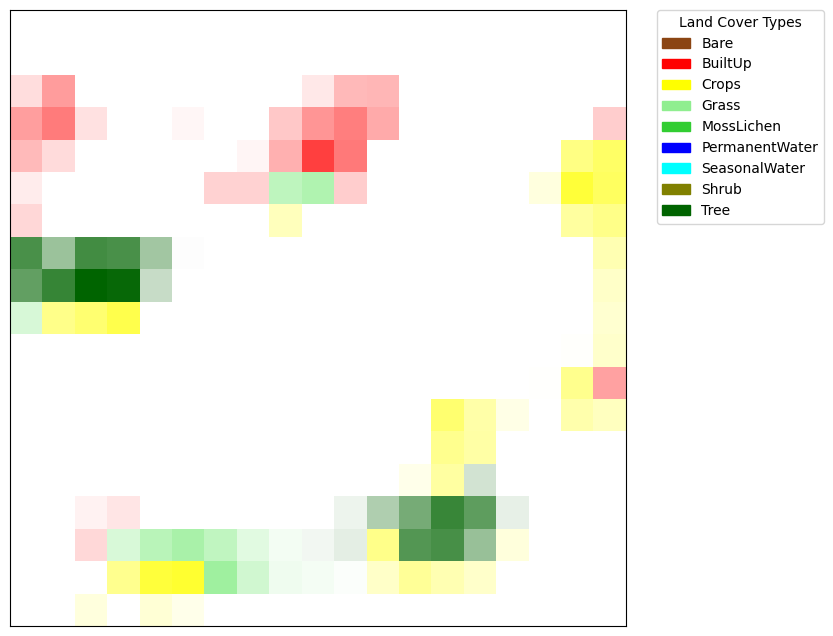

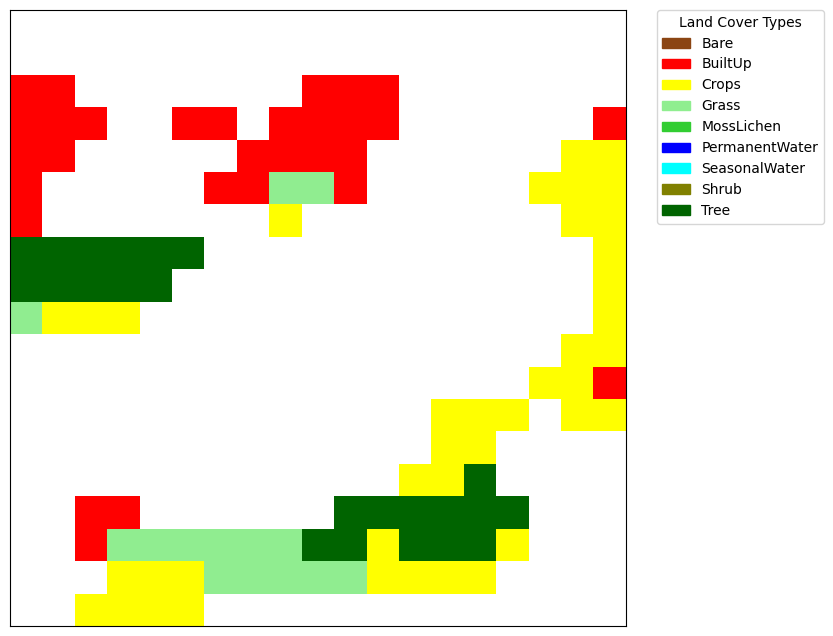

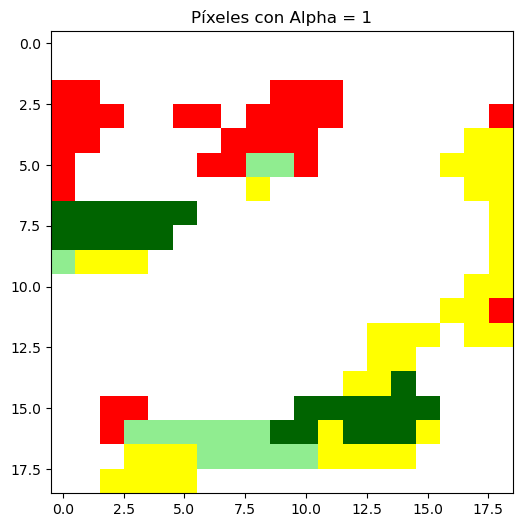

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up    98
1     1   0   Built-Up    98
2     2   0   Built-Up    98
3     3   0   Built-Up    98
4     4   0   Built-Up    98
..   ..  ..        ...   ...
356  14  18      Crops    98
357  15  18      Grass    98
358  16  18      Grass    98
359  17  18      Grass    98
360  18  18   Built-Up    98

[361 rows x 4 columns]
99


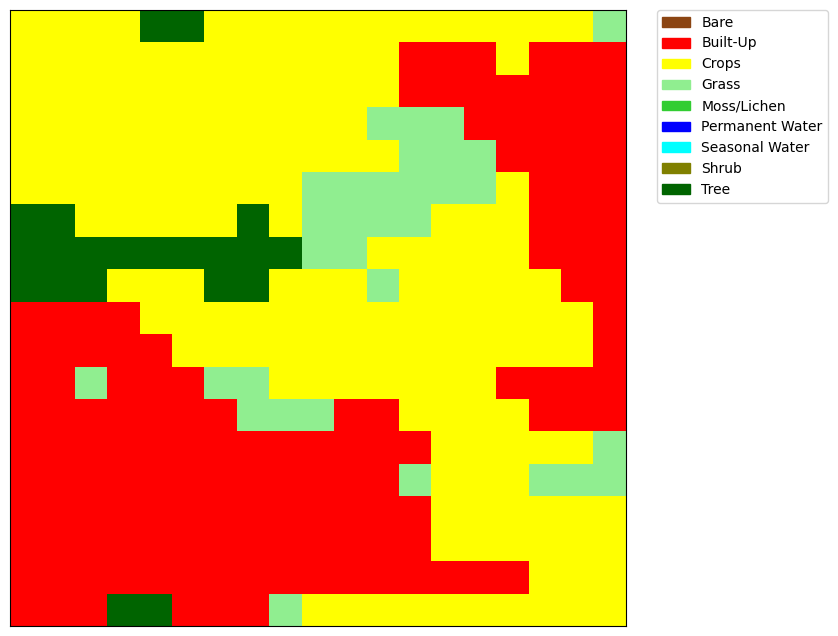

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


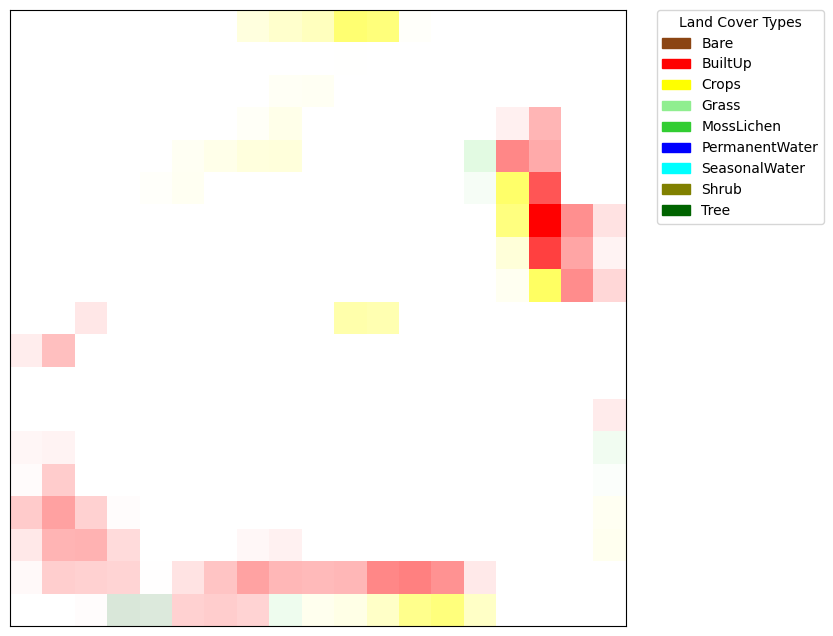

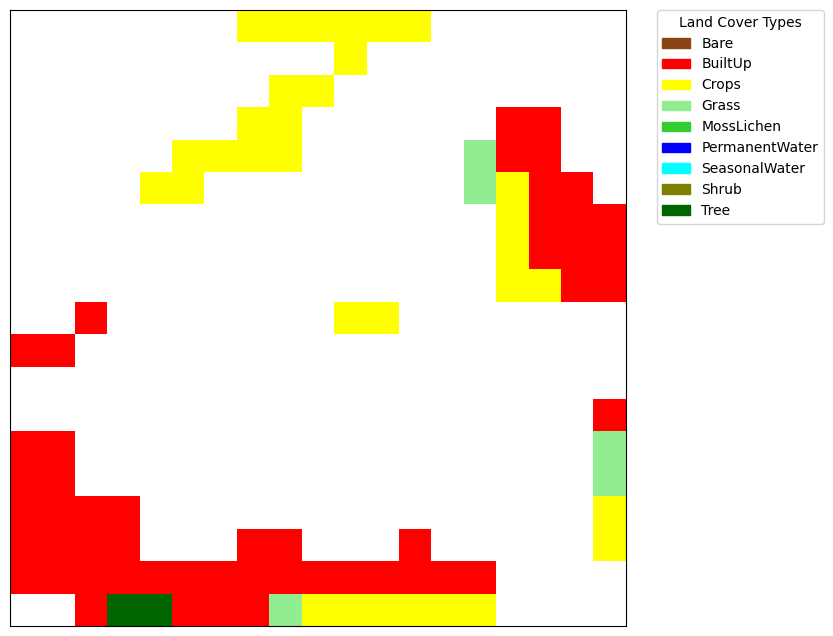

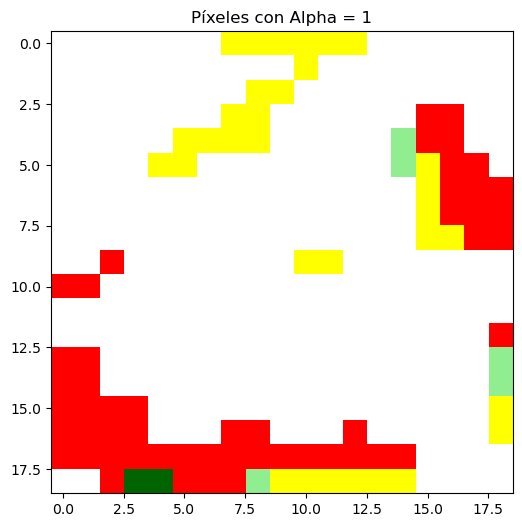

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              6        0.223691
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops    99
1     1   0      Crops    99
2     2   0      Crops    99
3     3   0      Crops    99
4     4   0       Tree    99
..   ..  ..        ...   ...
356  14  18      Crops    99
357  15  18      Crops    99
358  16  18      Crops    99
359  17  18      Crops    99
360  18  18      Crops    99

[361 rows x 4 columns]
100


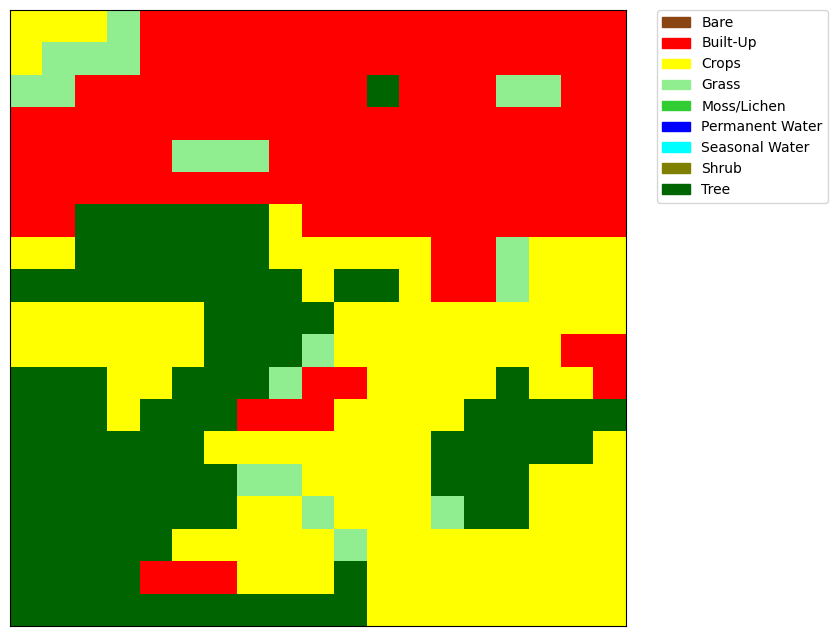

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


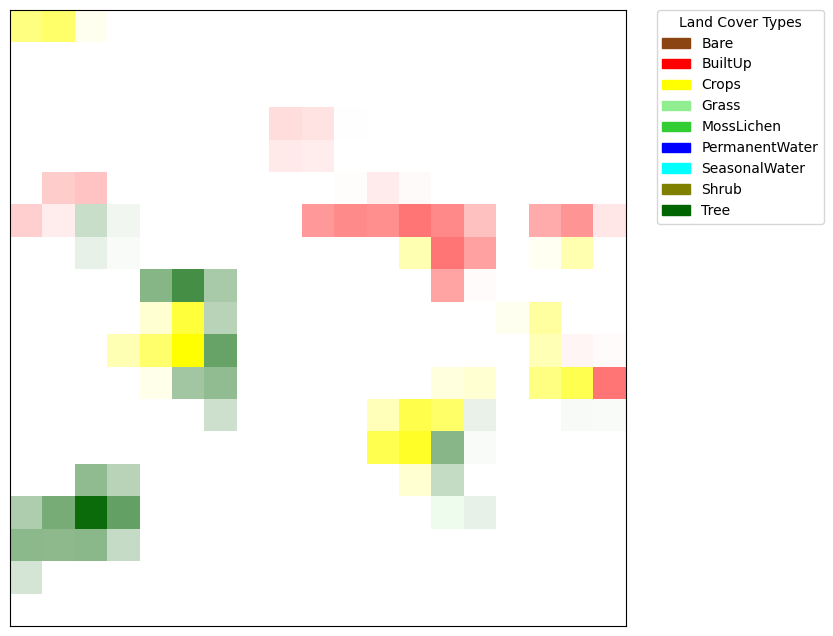

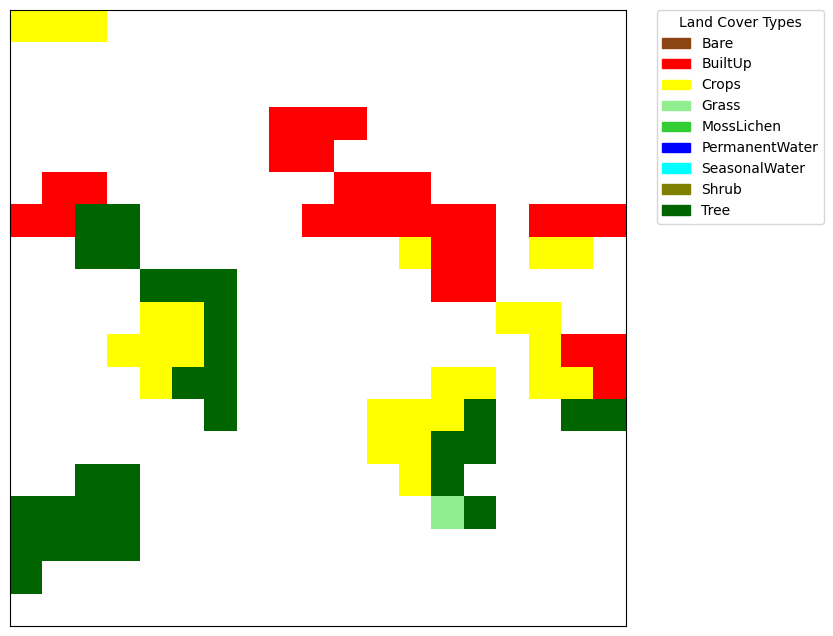

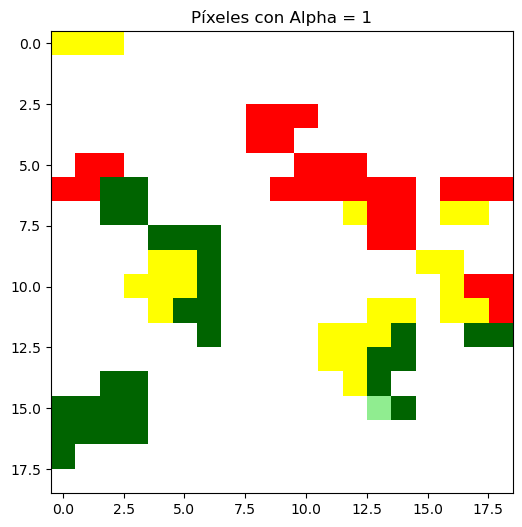

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.498229
1     0   1              1        0.587640
2     0   2              1        0.063949
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   100
1     1   0      Crops   100
2     2   0      Crops   100
3     3   0      Grass   100
4     4   0   Built-Up   100
..   ..  ..        ...   ...
356  14  18      Crops   100
357  15  18      Crops   100
358  16  18      Crops   100
359  17  18      Crops   100
360  18  18      Crops   100

[361 rows x 4 columns]
101


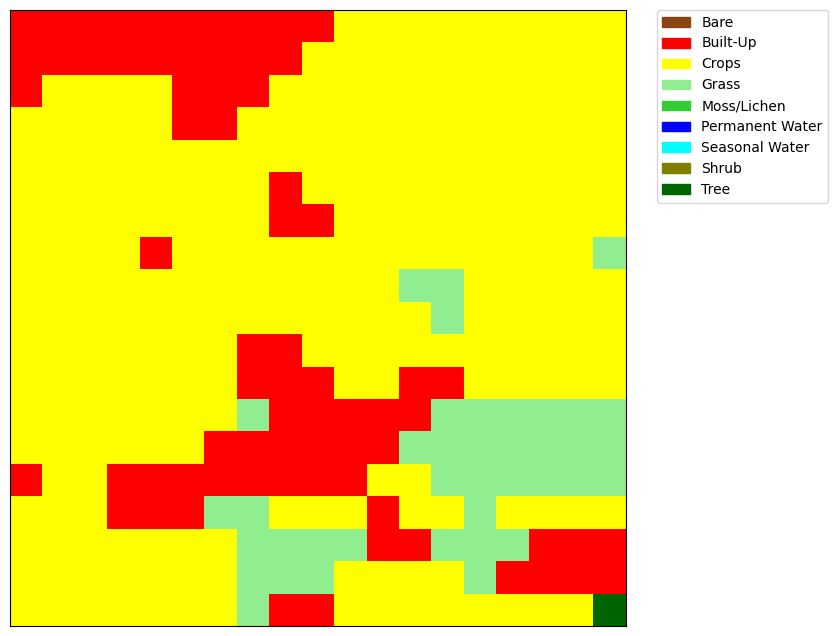

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


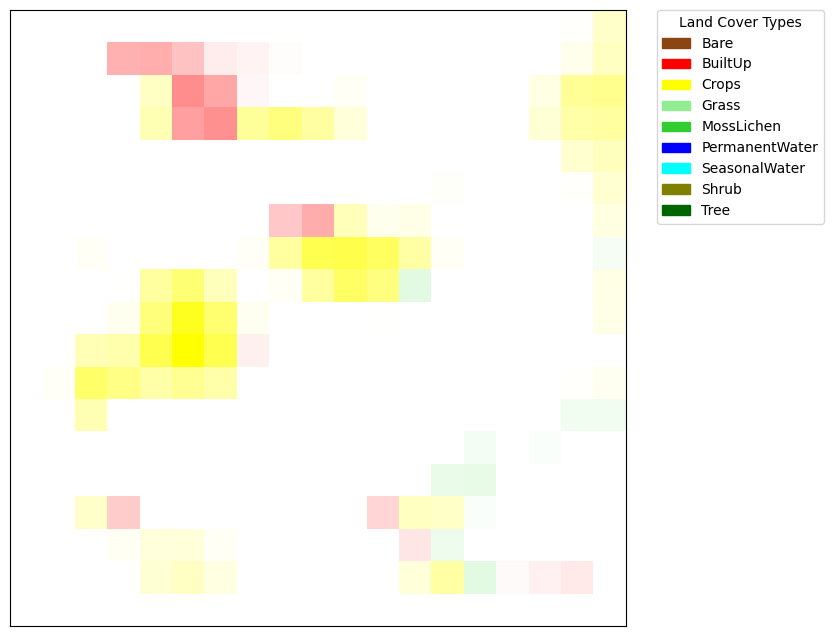

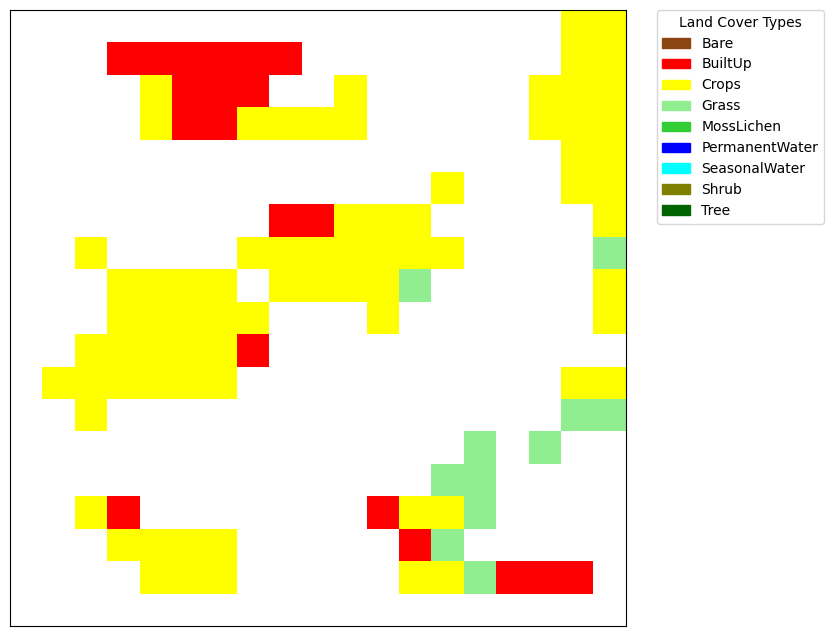

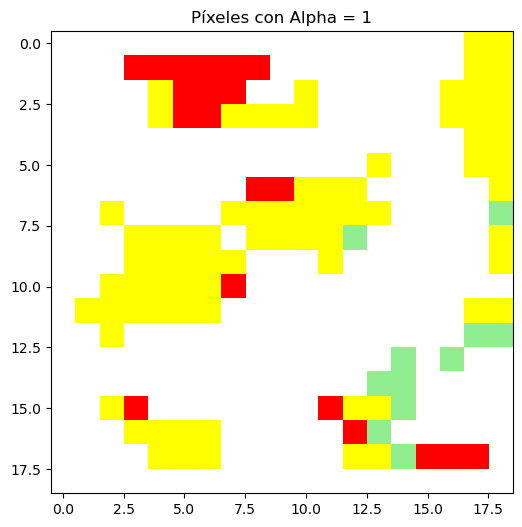

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up   101
1     1   0   Built-Up   101
2     2   0   Built-Up   101
3     3   0   Built-Up   101
4     4   0   Built-Up   101
..   ..  ..        ...   ...
356  14  18      Crops   101
357  15  18      Crops   101
358  16  18      Crops   101
359  17  18      Crops   101
360  18  18       Tree   101

[361 rows x 4 columns]
102


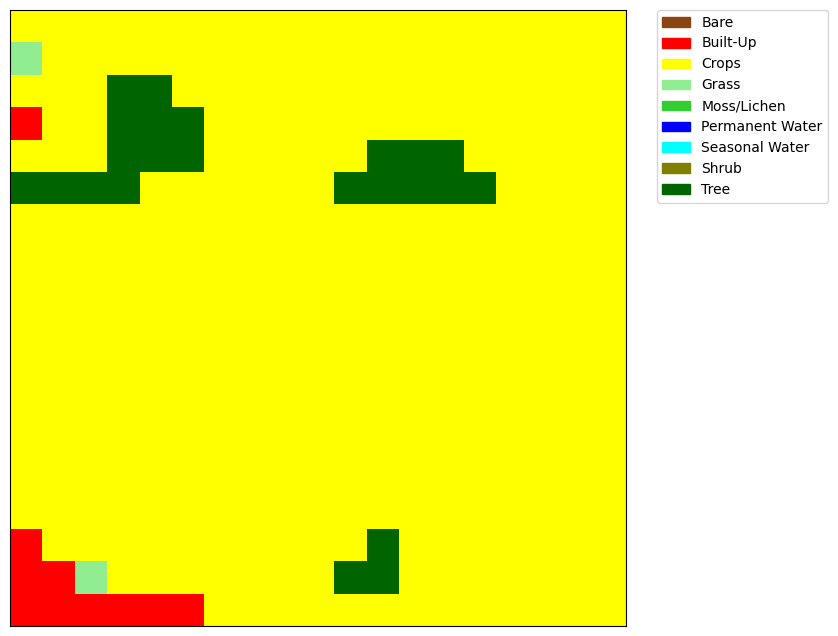

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


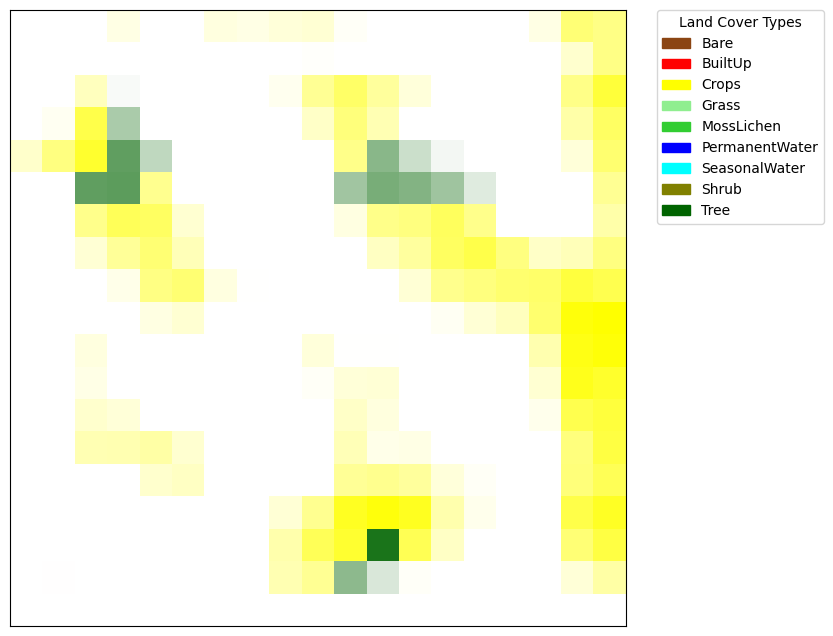

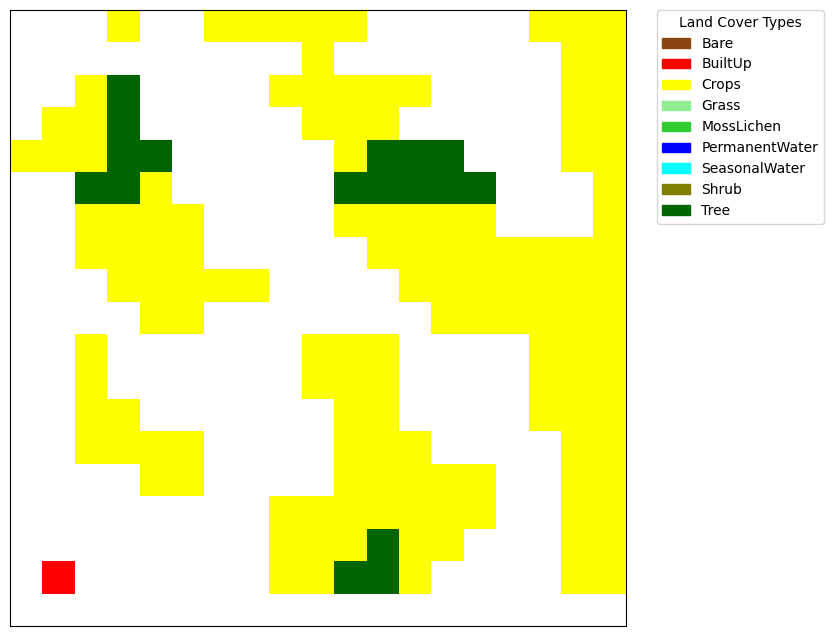

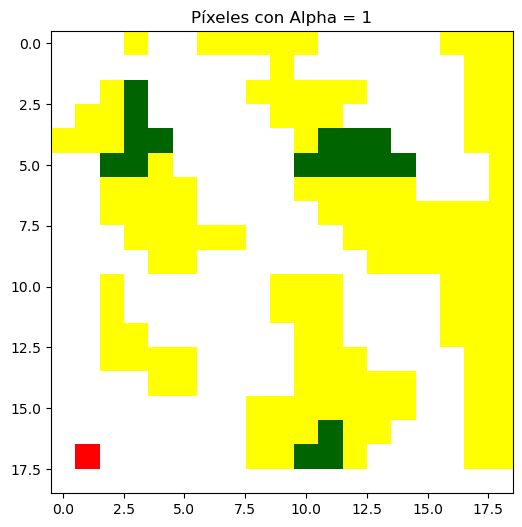

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.108073
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   102
1     1   0      Crops   102
2     2   0      Crops   102
3     3   0      Crops   102
4     4   0      Crops   102
..   ..  ..        ...   ...
356  14  18      Crops   102
357  15  18      Crops   102
358  16  18      Crops   102
359  17  18      Crops   102
360  18  18      Crops   102

[361 rows x 4 columns]
103


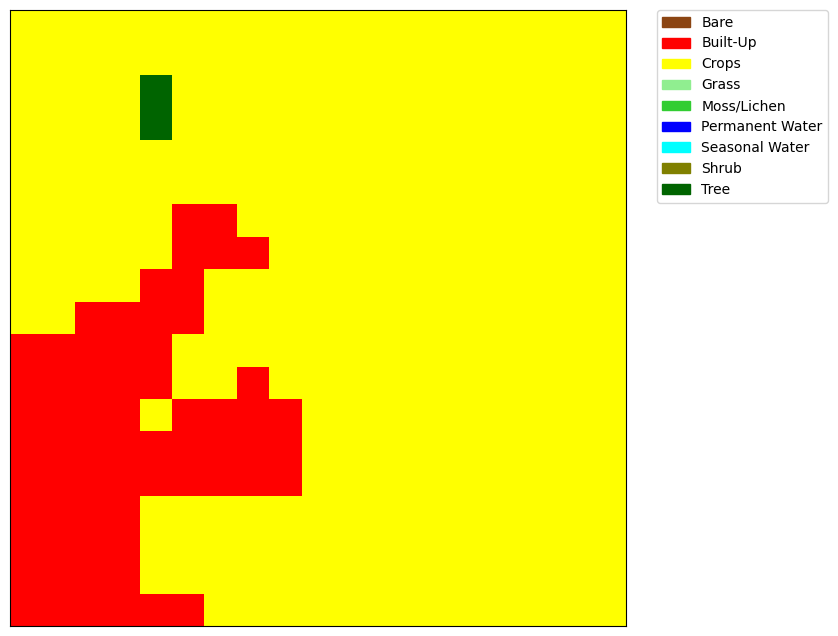

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


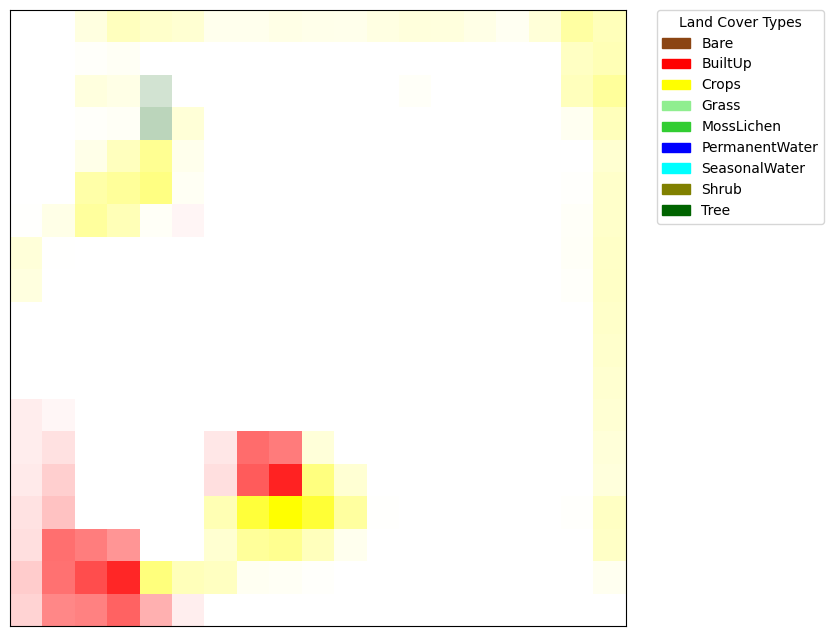

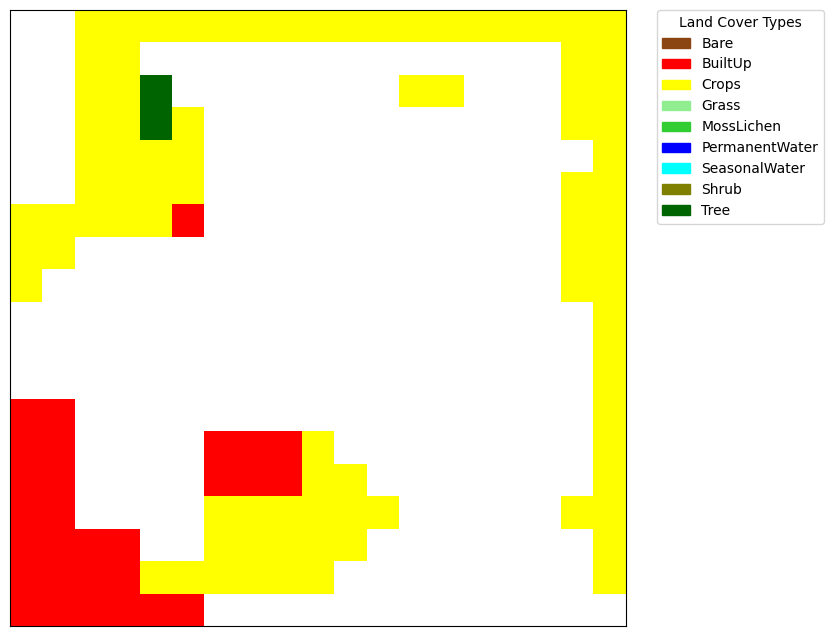

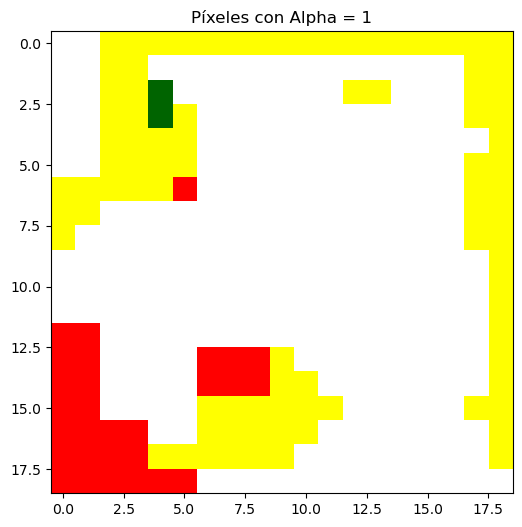

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.121972
3     0   3              1        0.258006
4     0   4              1        0.206206
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   103
1     1   0      Crops   103
2     2   0      Crops   103
3     3   0      Crops   103
4     4   0      Crops   103
..   ..  ..        ...   ...
356  14  18      Crops   103
357  15  18      Crops   103
358  16  18      Crops   103
359  17  18      Crops   103
360  18  18      Crops   103

[361 rows x 4 columns]
104


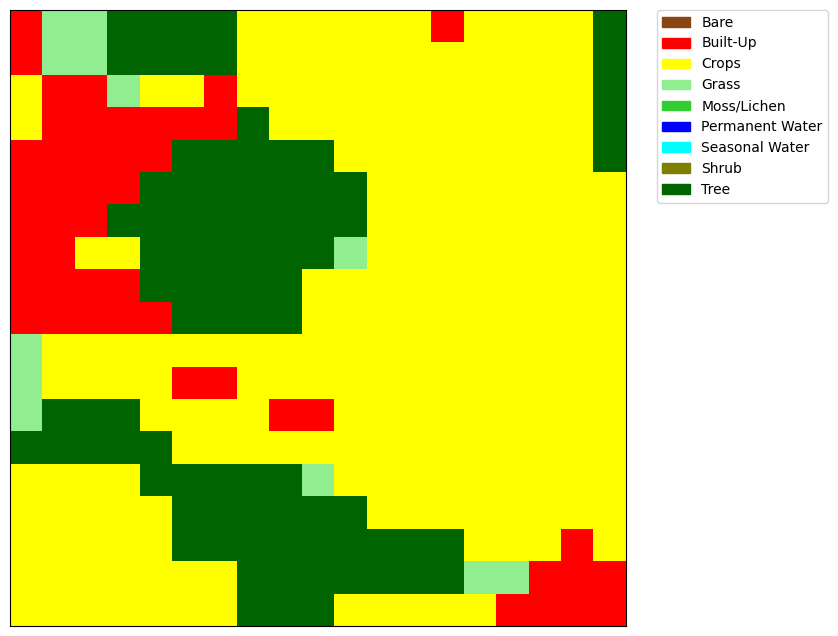

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


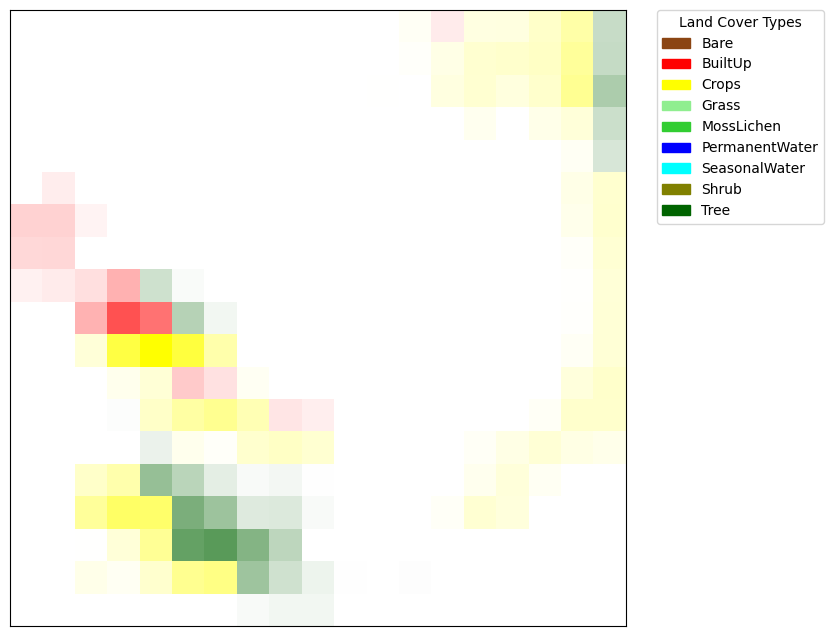

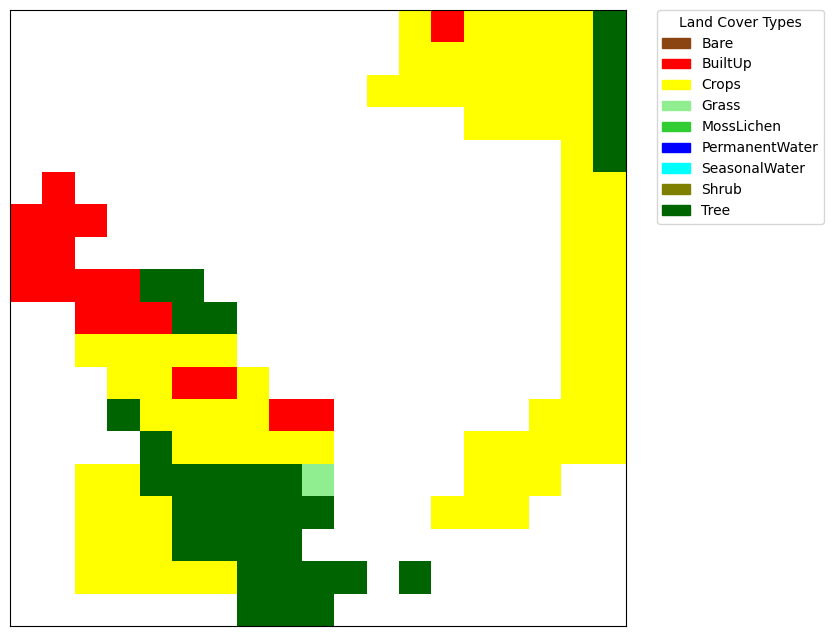

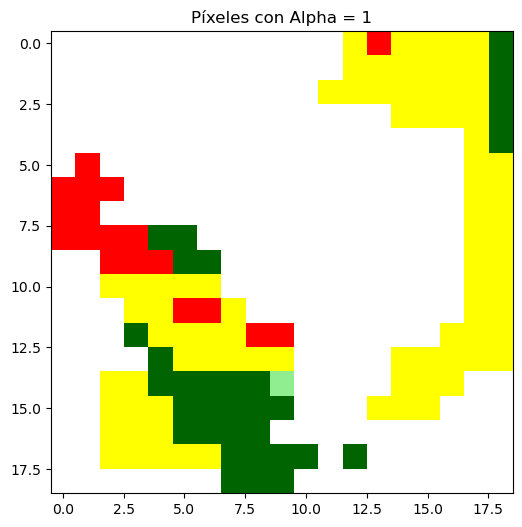

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up   104
1     1   0      Grass   104
2     2   0      Grass   104
3     3   0       Tree   104
4     4   0       Tree   104
..   ..  ..        ...   ...
356  14  18      Crops   104
357  15  18   Built-Up   104
358  16  18   Built-Up   104
359  17  18   Built-Up   104
360  18  18   Built-Up   104

[361 rows x 4 columns]
105


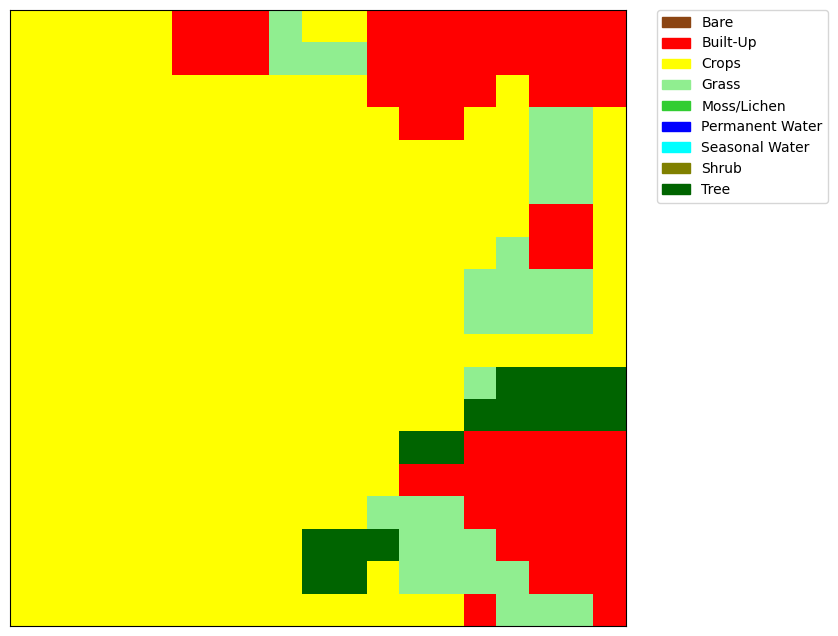

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


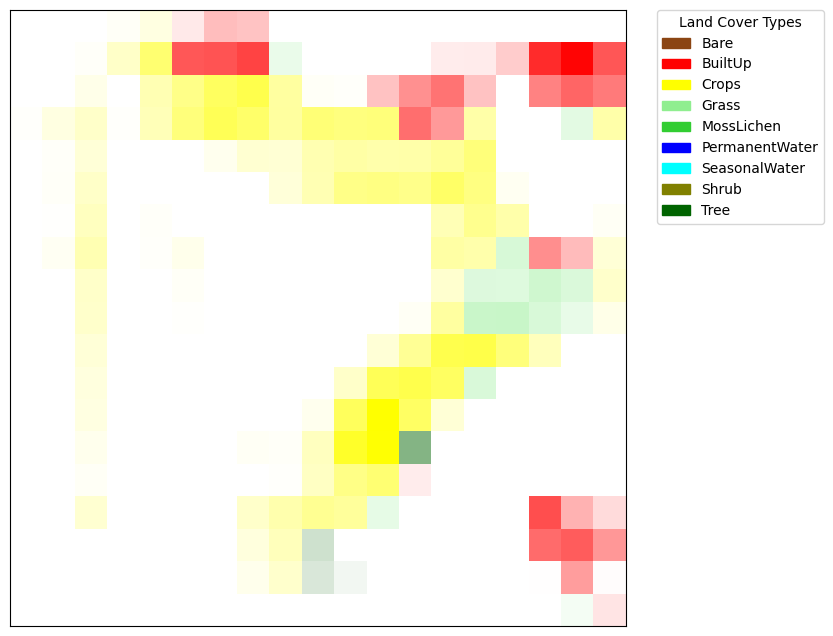

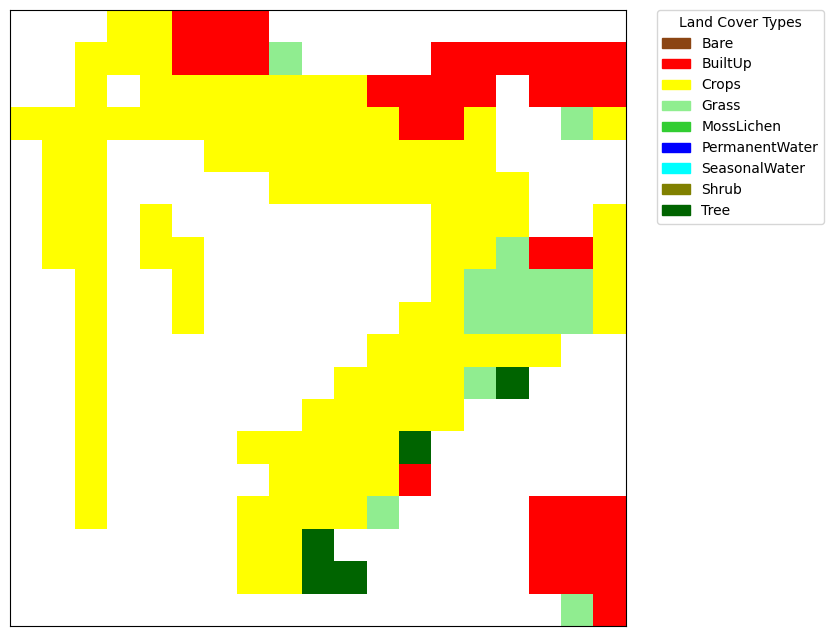

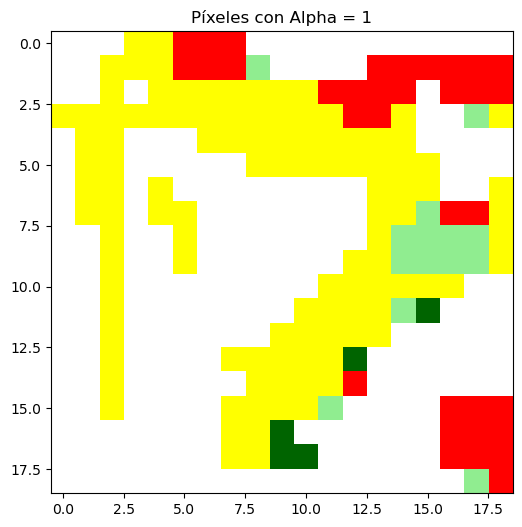

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.032180
4     0   4              1        0.119888
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              3        0.094285
360  18  18              3        0.107963

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   105
1     1   0      Crops   105
2     2   0      Crops   105
3     3   0      Crops   105
4     4   0      Crops   105
..   ..  ..        ...   ...
356  14  18   Built-Up   105
357  15  18      Grass   105
358  16  18      Grass   105
359  17  18      Grass   105
360  18  18   Built-Up   105

[361 rows x 4 columns]
106


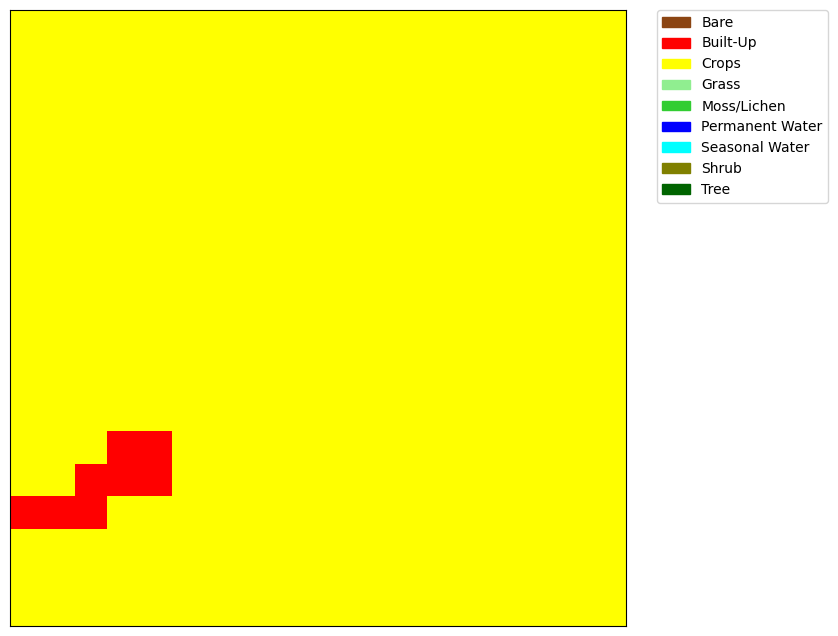

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


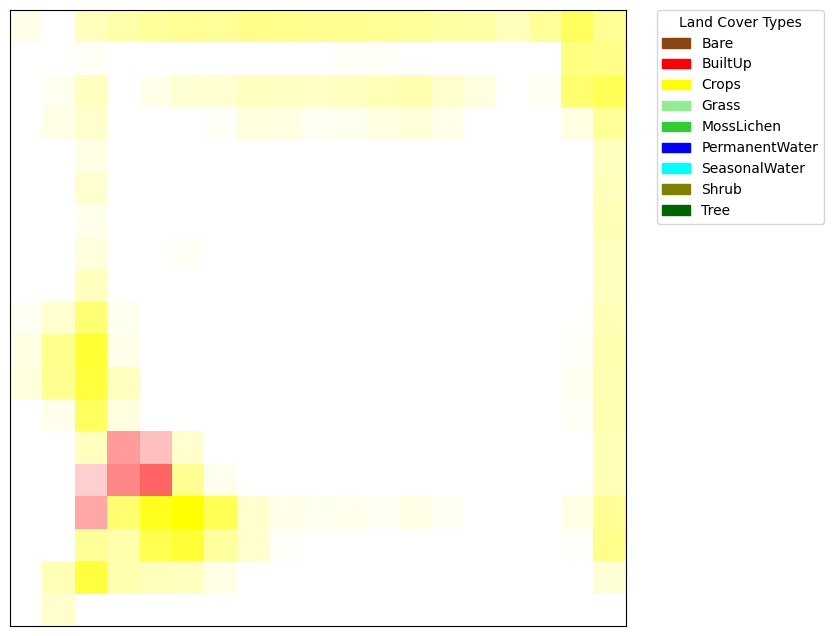

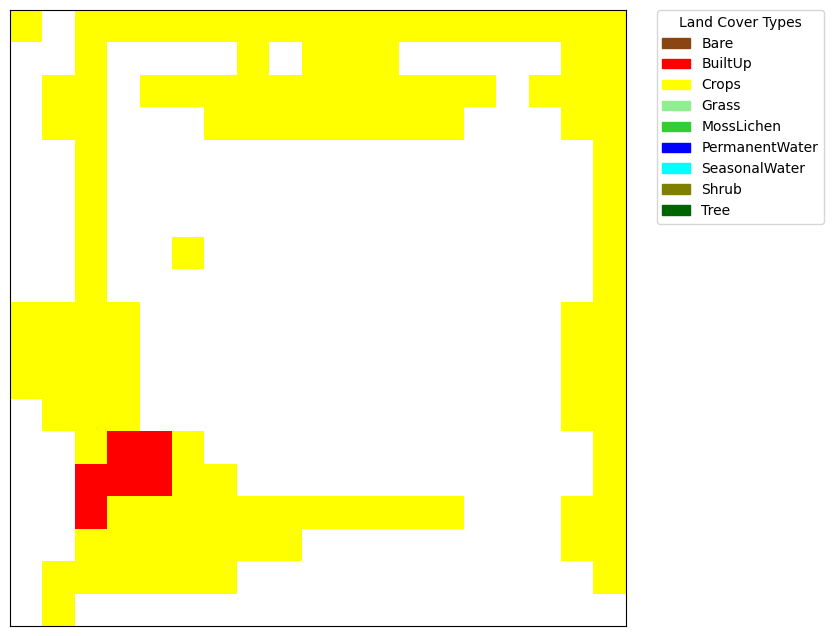

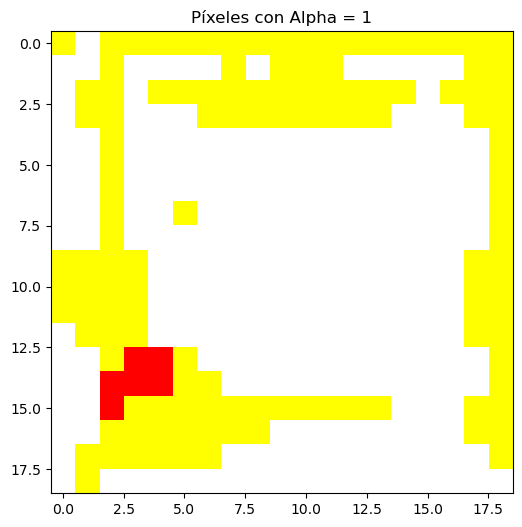

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.088148
1     0   1              0        0.000000
2     0   2              2        0.270567
3     0   3              2        0.334969
4     0   4              2        0.389841
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   106
1     1   0      Crops   106
2     2   0      Crops   106
3     3   0      Crops   106
4     4   0      Crops   106
..   ..  ..        ...   ...
356  14  18      Crops   106
357  15  18      Crops   106
358  16  18      Crops   106
359  17  18      Crops   106
360  18  18      Crops   106

[361 rows x 4 columns]
107


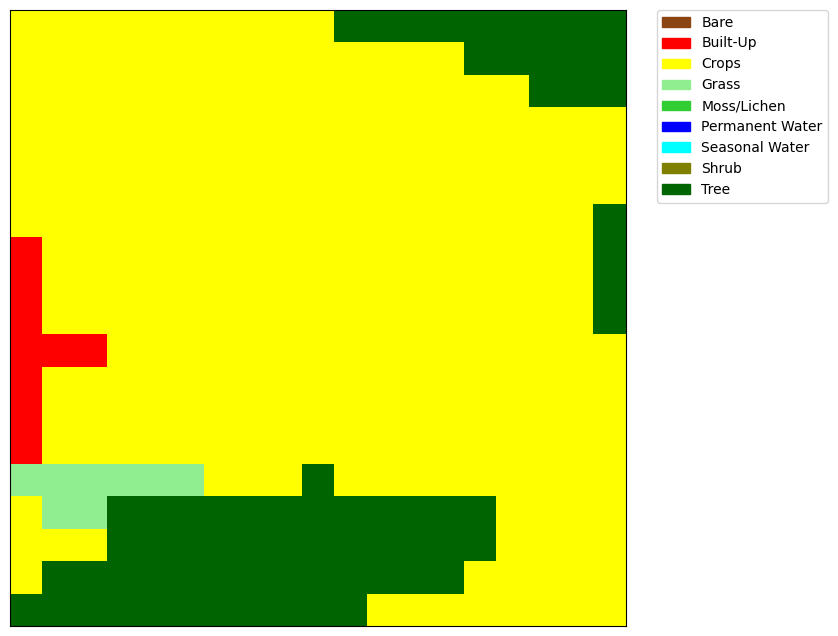

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


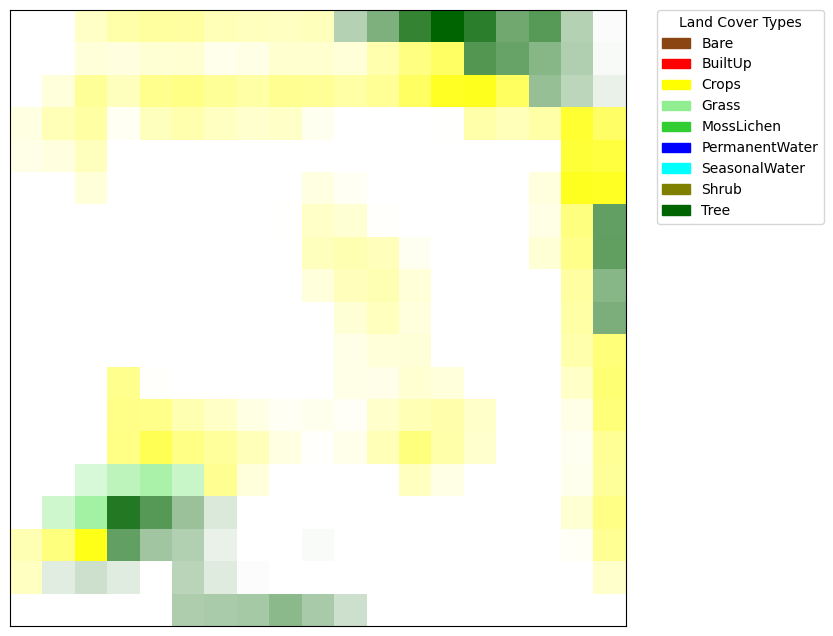

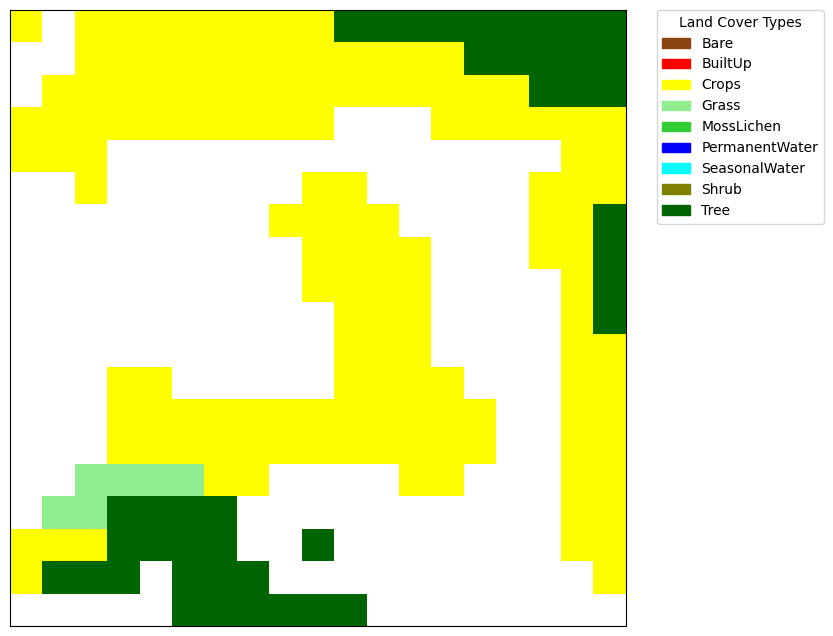

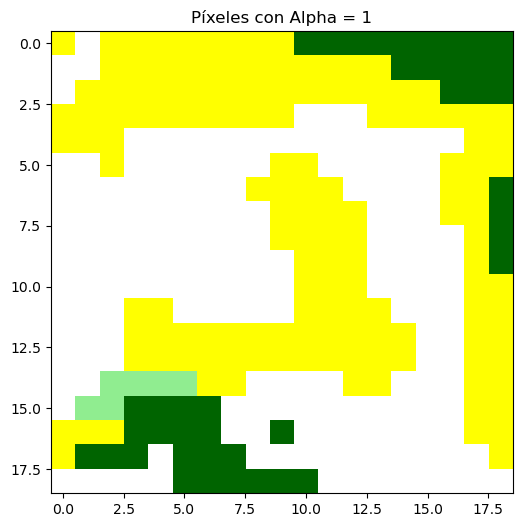

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.001608
1     0   1              0        0.000000
2     0   2              2        0.225635
3     0   3              2        0.339057
4     0   4              2        0.378428
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   107
1     1   0      Crops   107
2     2   0      Crops   107
3     3   0      Crops   107
4     4   0      Crops   107
..   ..  ..        ...   ...
356  14  18      Crops   107
357  15  18      Crops   107
358  16  18      Crops   107
359  17  18      Crops   107
360  18  18      Crops   107

[361 rows x 4 columns]
108


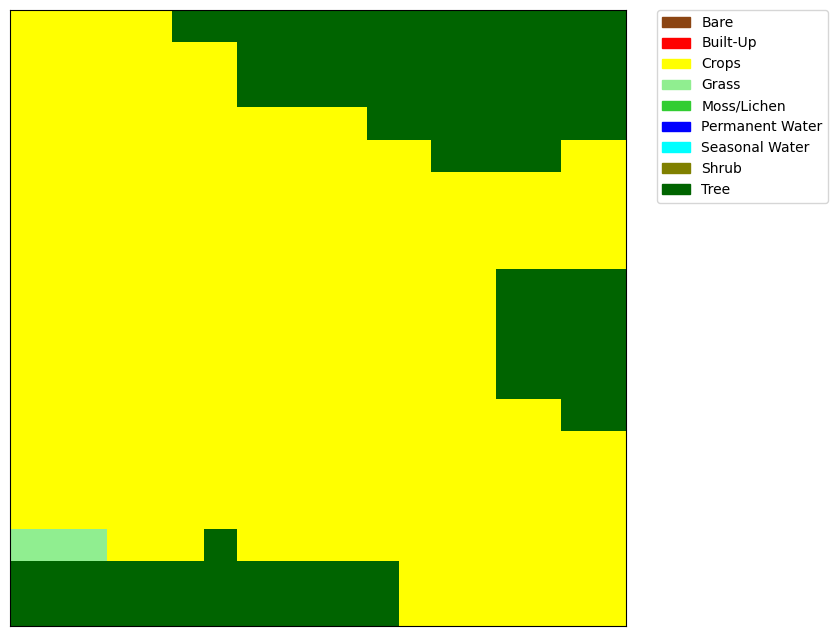

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


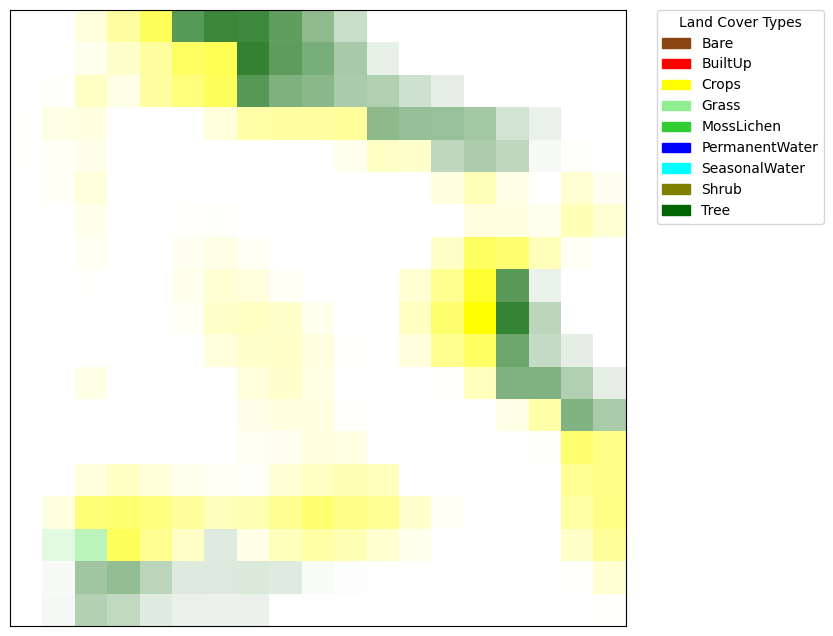

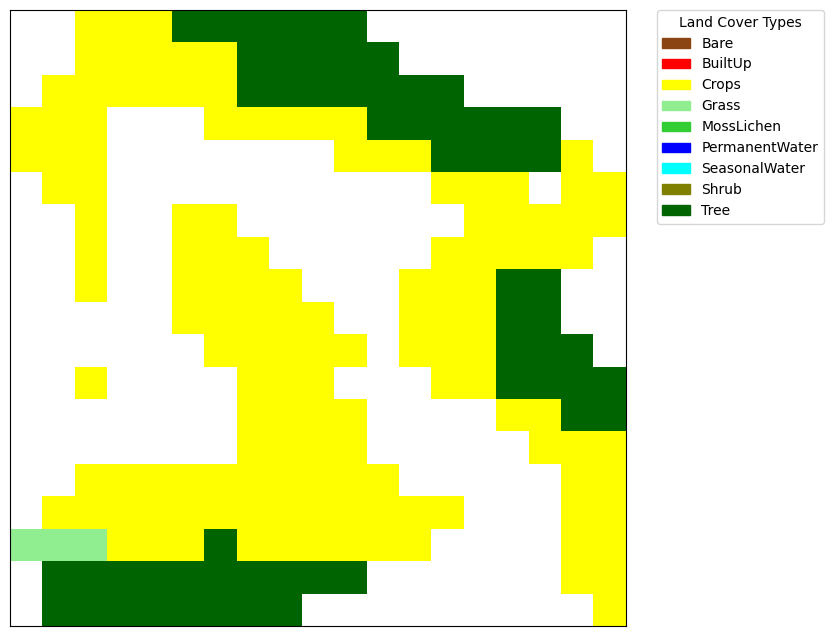

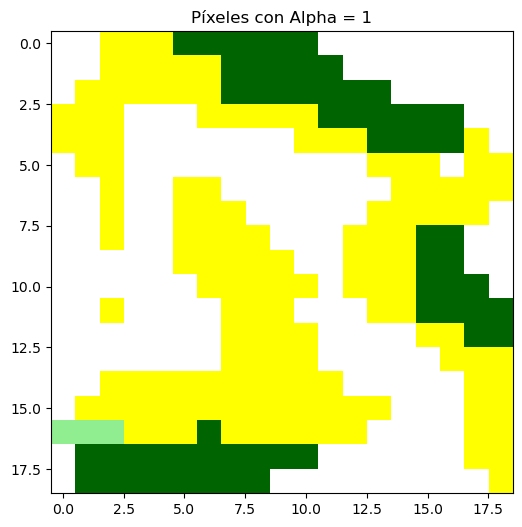

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.141371
3     0   3              1        0.374158
4     0   4              1        0.651805
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              1        0.009363

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   108
1     1   0      Crops   108
2     2   0      Crops   108
3     3   0      Crops   108
4     4   0      Crops   108
..   ..  ..        ...   ...
356  14  18      Crops   108
357  15  18      Crops   108
358  16  18      Crops   108
359  17  18      Crops   108
360  18  18      Crops   108

[361 rows x 4 columns]
109


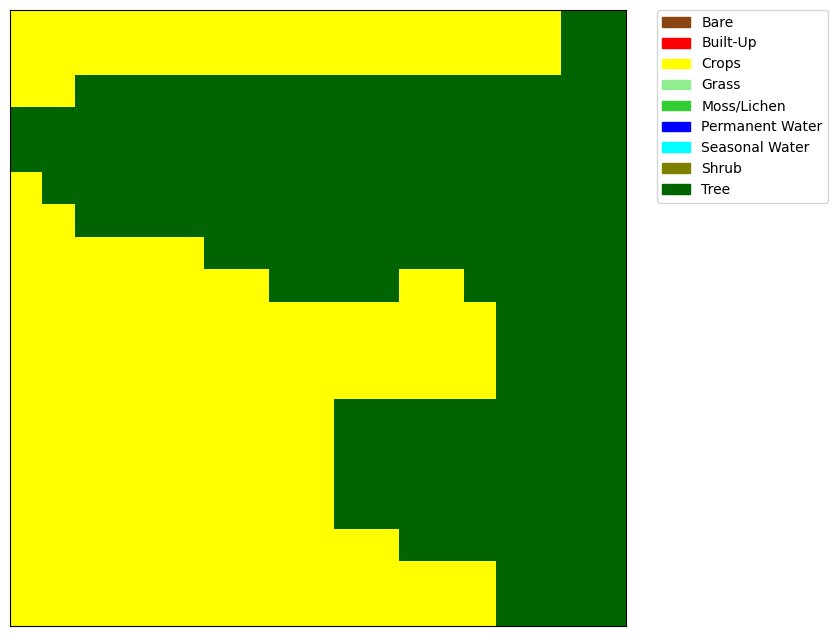

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


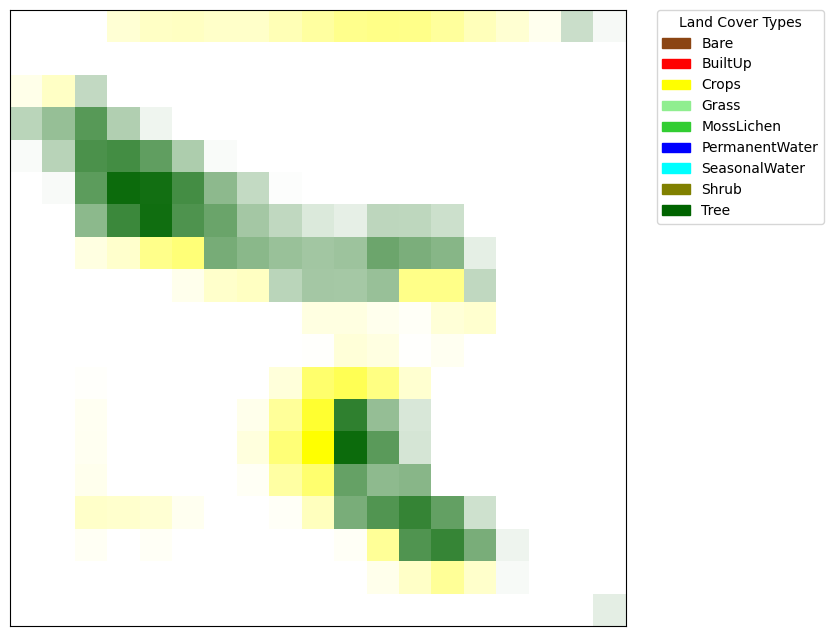

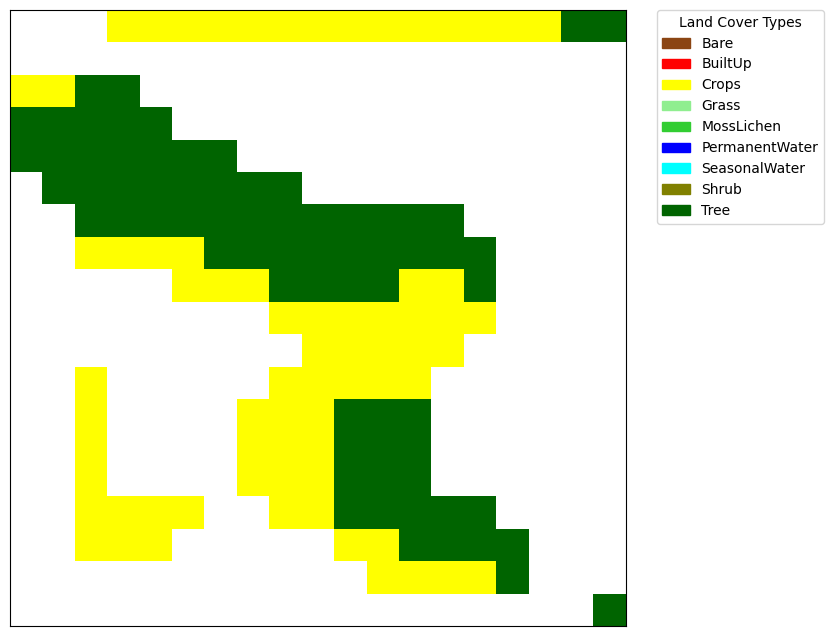

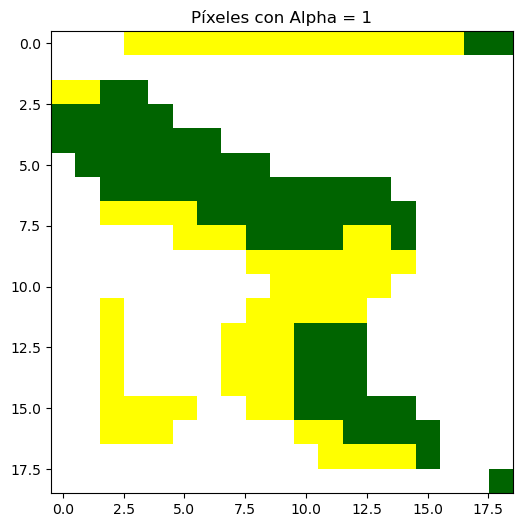

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.170862
4     0   4              1        0.227910
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              4        0.106445

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   109
1     1   0      Crops   109
2     2   0      Crops   109
3     3   0      Crops   109
4     4   0      Crops   109
..   ..  ..        ...   ...
356  14  18      Crops   109
357  15  18       Tree   109
358  16  18       Tree   109
359  17  18       Tree   109
360  18  18       Tree   109

[361 rows x 4 columns]
110


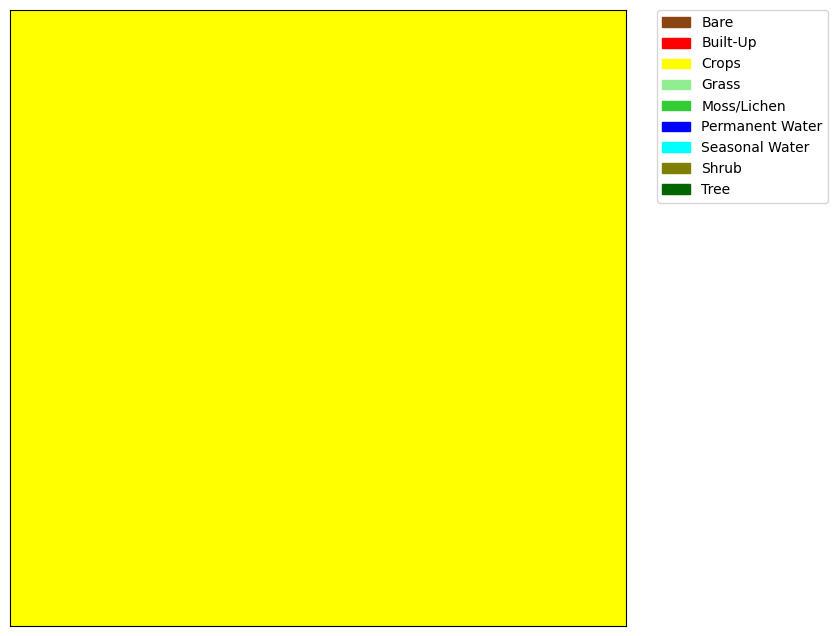

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


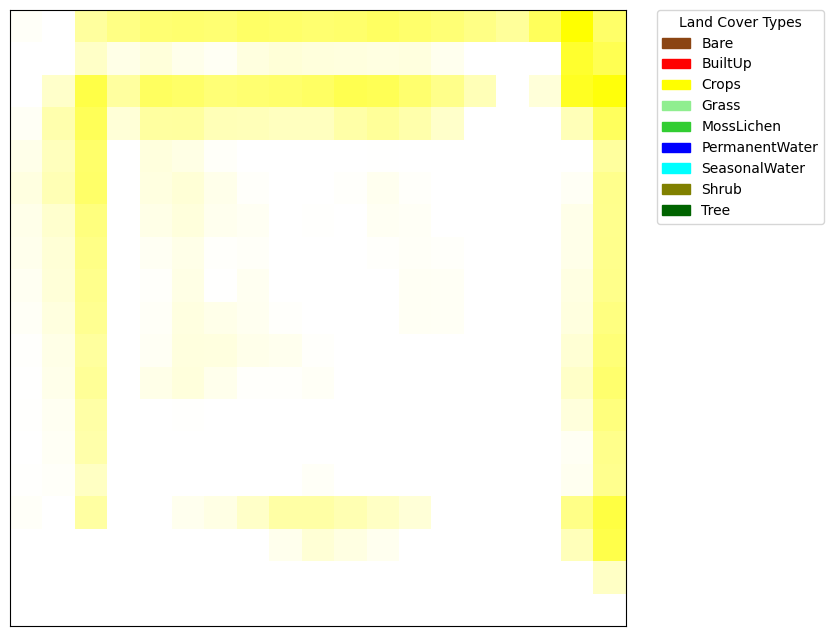

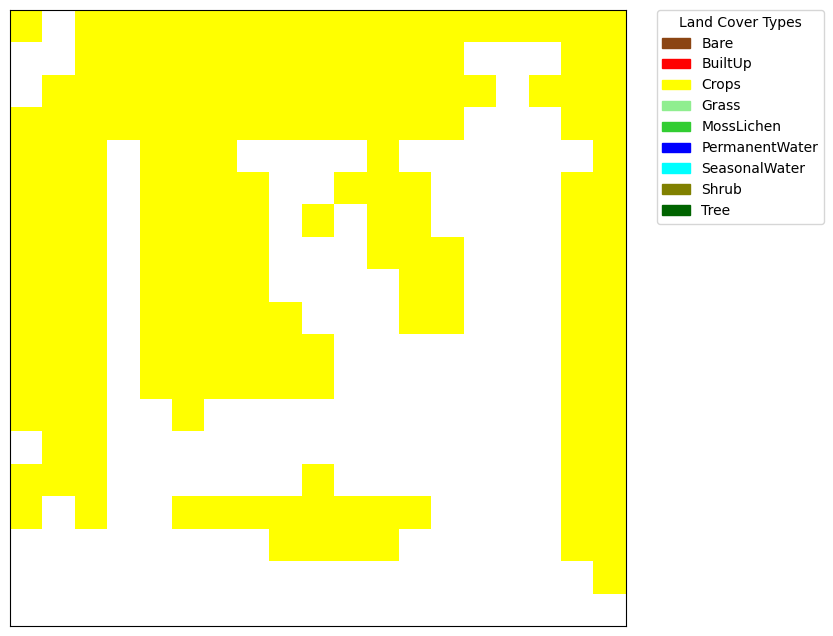

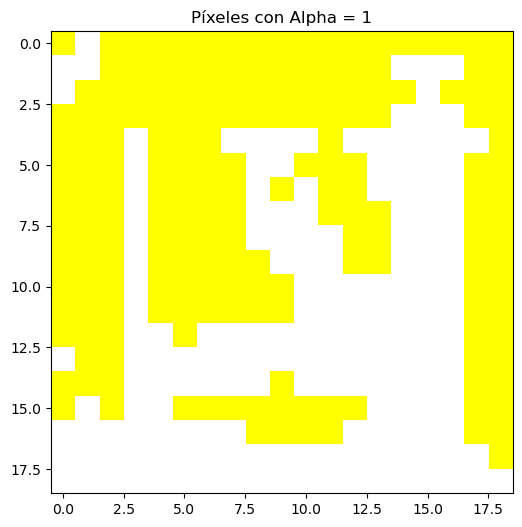

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.027746
1     0   1              0        0.000000
2     0   2              2        0.382377
3     0   3              2        0.485690
4     0   4              2        0.555551
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   110
1     1   0      Crops   110
2     2   0      Crops   110
3     3   0      Crops   110
4     4   0      Crops   110
..   ..  ..        ...   ...
356  14  18      Crops   110
357  15  18      Crops   110
358  16  18      Crops   110
359  17  18      Crops   110
360  18  18      Crops   110

[361 rows x 4 columns]
111


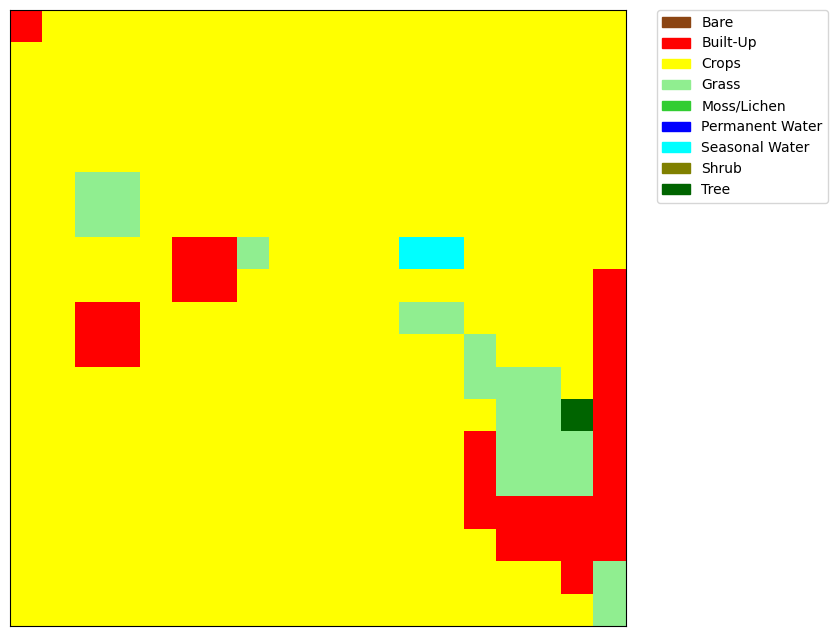

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


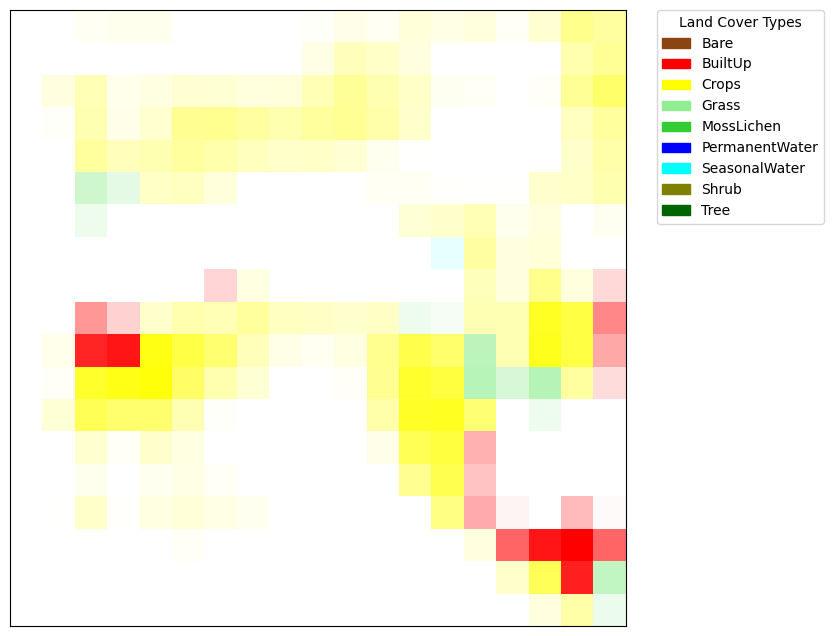

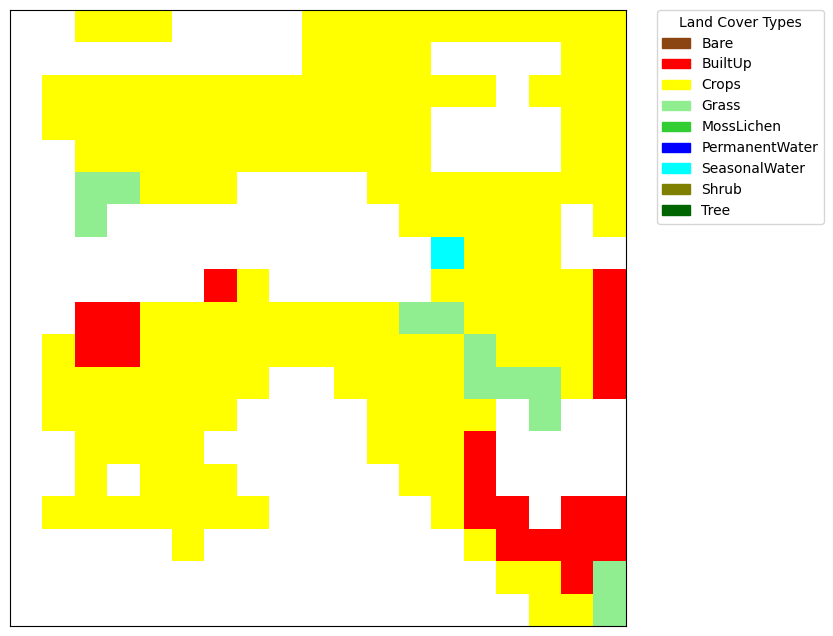

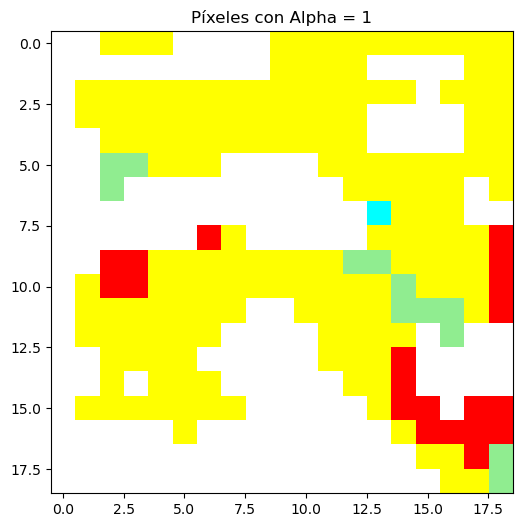

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.048343
3     0   3              1        0.072346
4     0   4              1        0.067174
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              2        0.128136
359  18  17              2        0.346852
360  18  18              2        0.171985

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up   111
1     1   0      Crops   111
2     2   0      Crops   111
3     3   0      Crops   111
4     4   0      Crops   111
..   ..  ..        ...   ...
356  14  18      Crops   111
357  15  18      Crops   111
358  16  18      Crops   111
359  17  18      Crops   111
360  18  18      Grass   111

[361 rows x 4 columns]
112


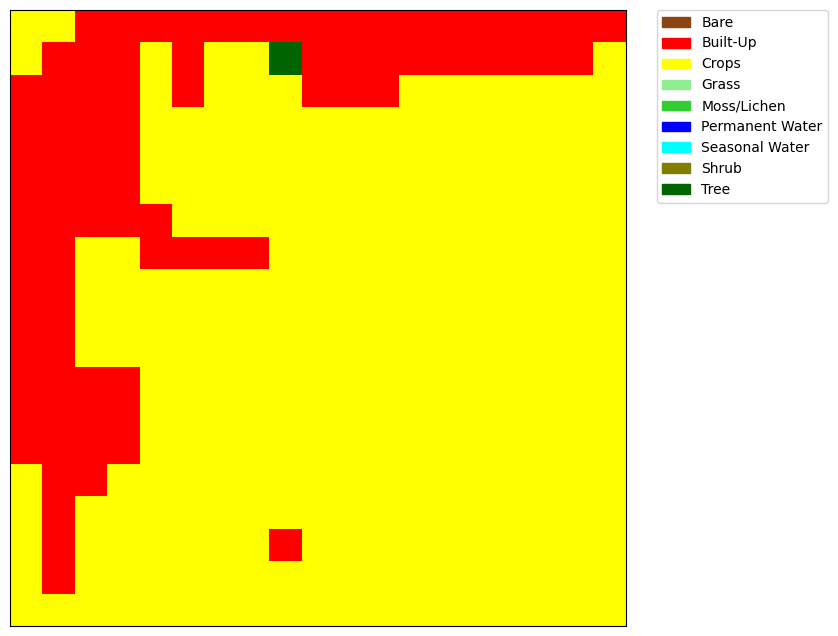

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


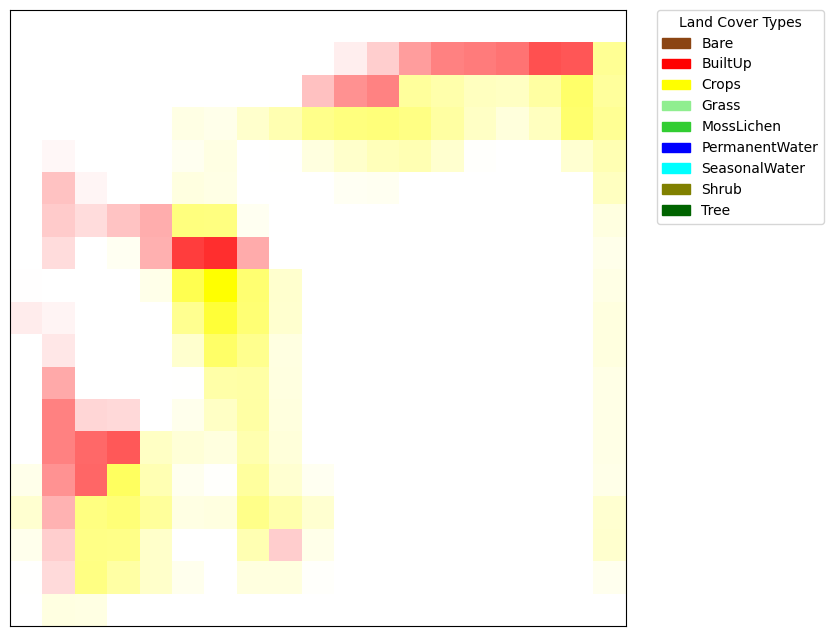

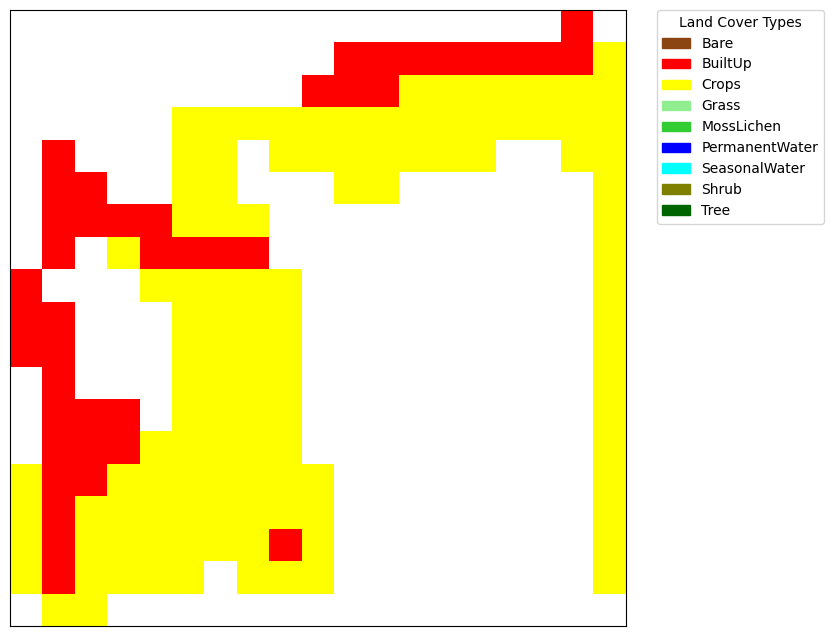

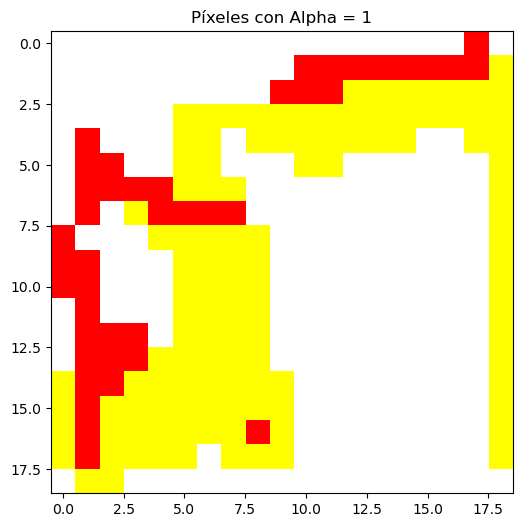

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   112
1     1   0      Crops   112
2     2   0   Built-Up   112
3     3   0   Built-Up   112
4     4   0   Built-Up   112
..   ..  ..        ...   ...
356  14  18      Crops   112
357  15  18      Crops   112
358  16  18      Crops   112
359  17  18      Crops   112
360  18  18      Crops   112

[361 rows x 4 columns]
113


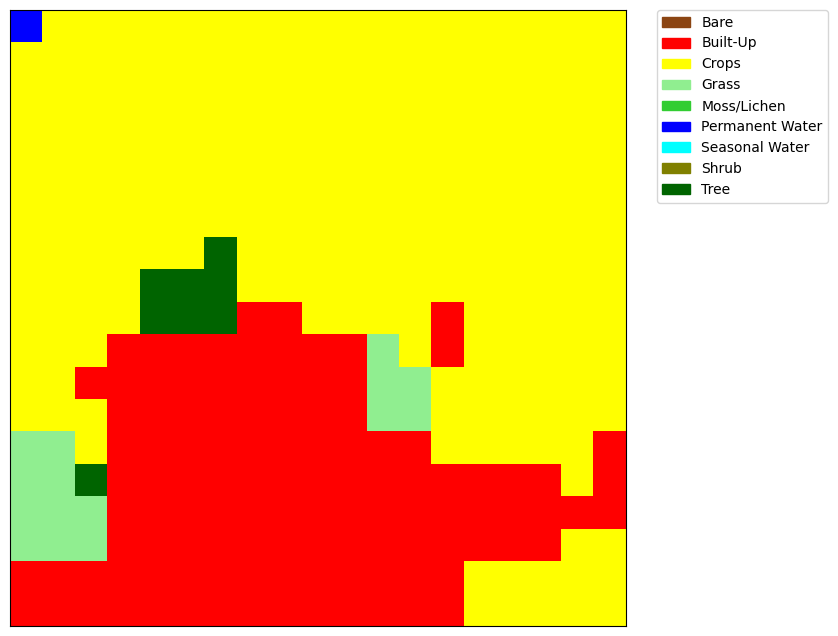

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


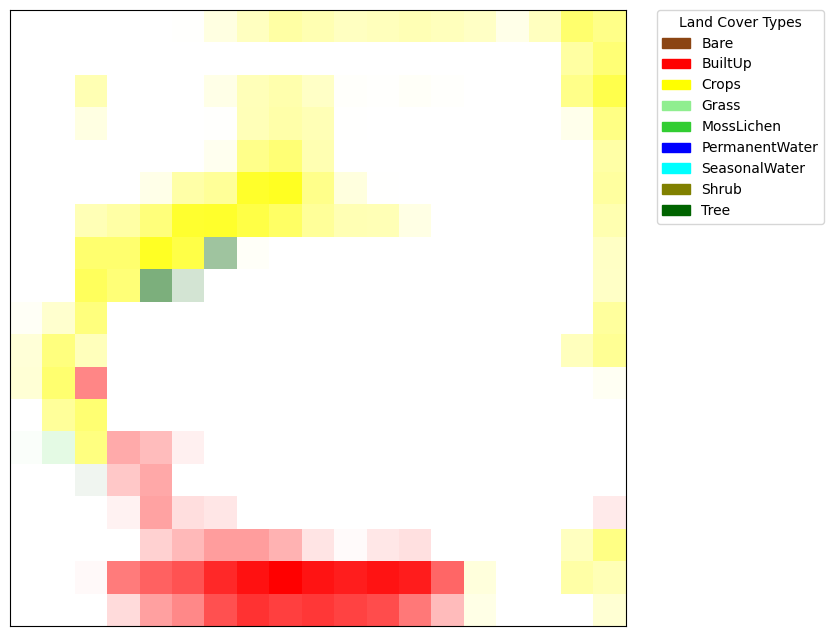

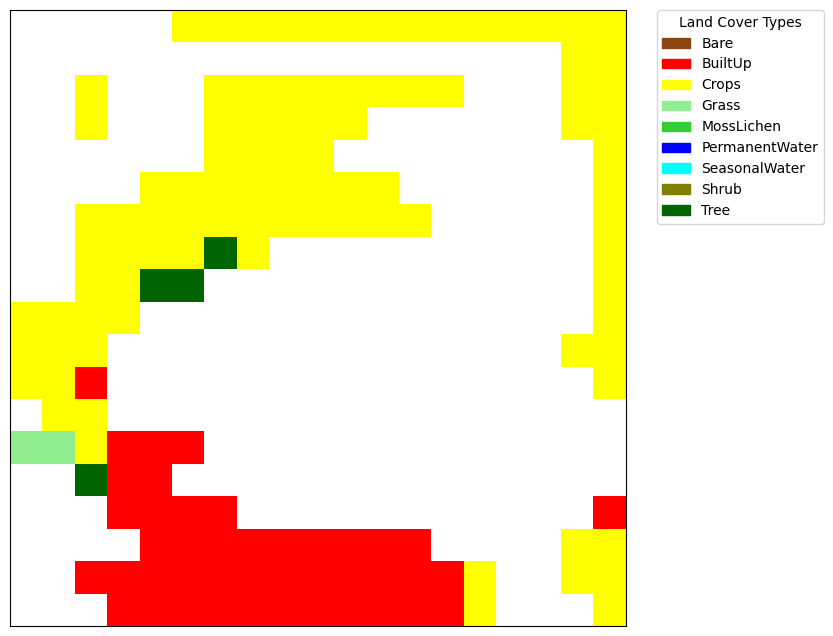

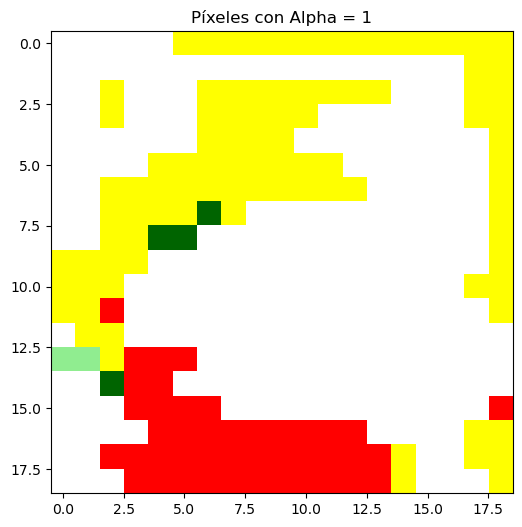

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              3        0.098997
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              4        0.172768

[361 rows x 4 columns]
      x   y       land_cover  site
0     0   0  Permanent Water   113
1     1   0            Crops   113
2     2   0            Crops   113
3     3   0            Crops   113
4     4   0            Crops   113
..   ..  ..              ...   ...
356  14  18            Crops   113
357  15  18            Crops   113
358  16  18            Crops   113
359  17  18            Crops   1

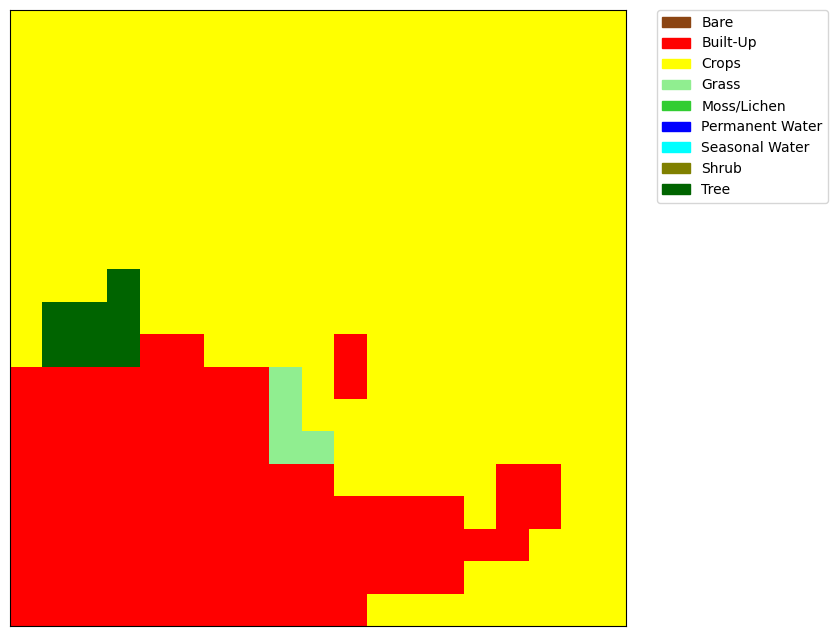

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


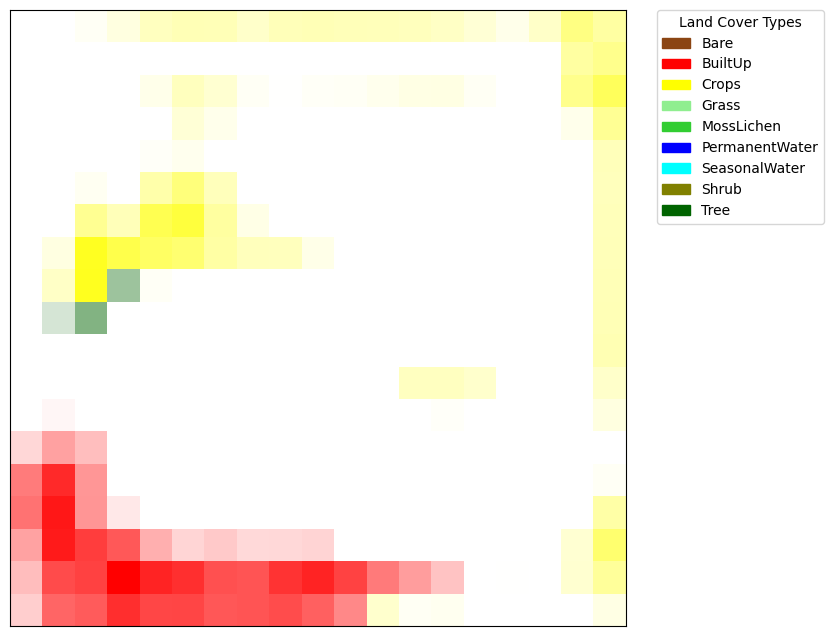

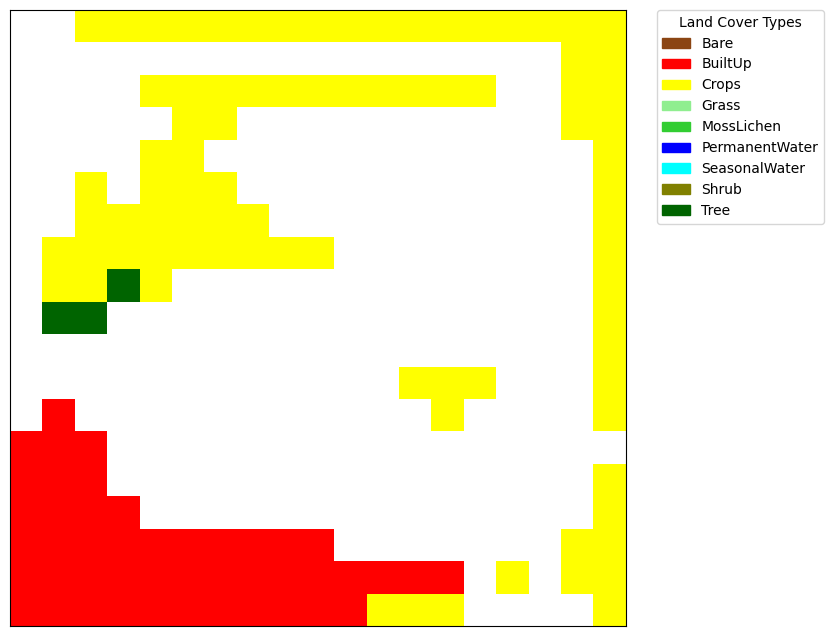

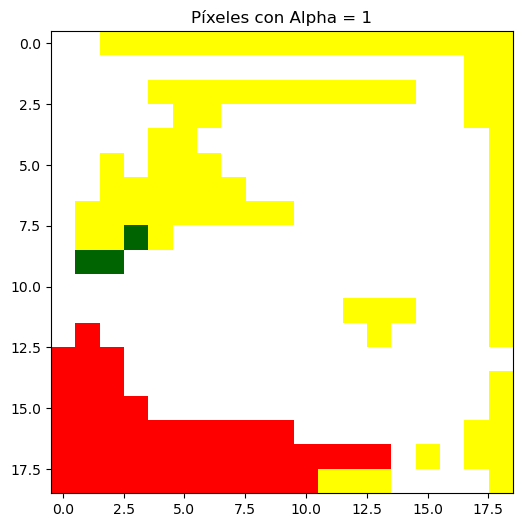

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.040599
3     0   3              1        0.123687
4     0   4              1        0.253191
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              5        0.108139

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   114
1     1   0      Crops   114
2     2   0      Crops   114
3     3   0      Crops   114
4     4   0      Crops   114
..   ..  ..        ...   ...
356  14  18      Crops   114
357  15  18      Crops   114
358  16  18      Crops   114
359  17  18      Crops   114
360  18  18      Crops   114

[361 rows x 4 columns]
115


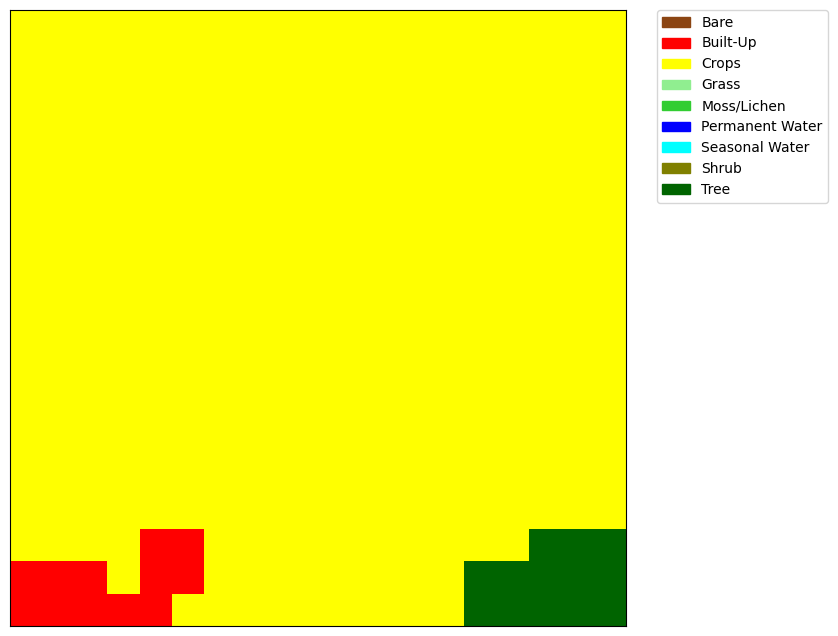

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


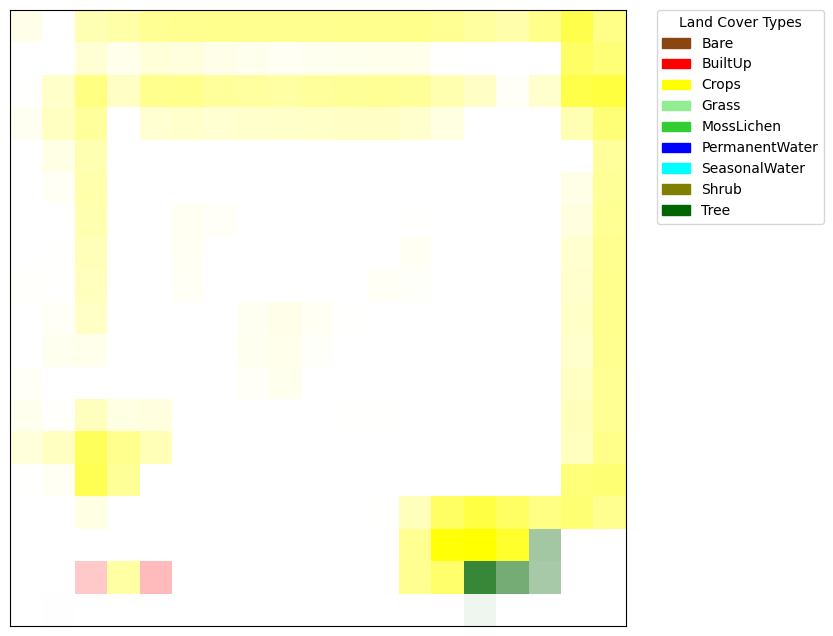

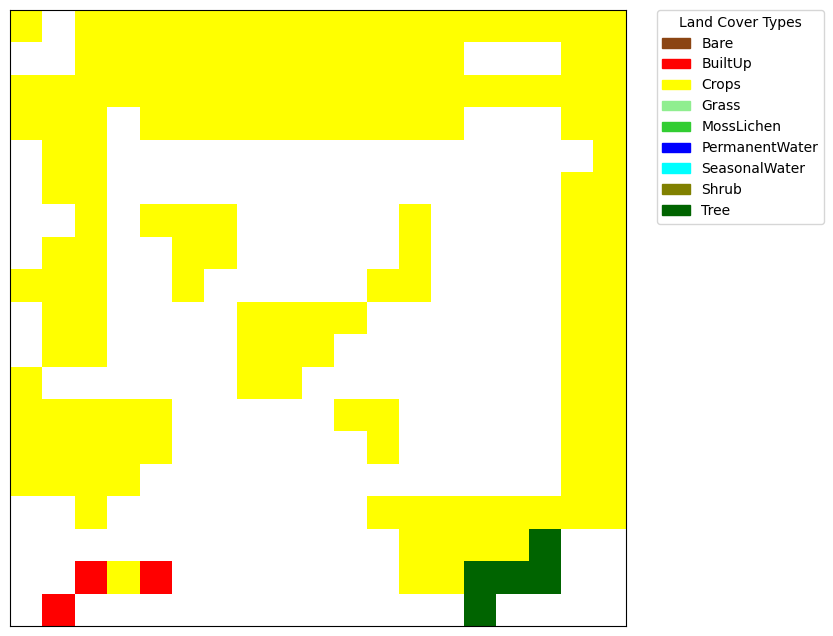

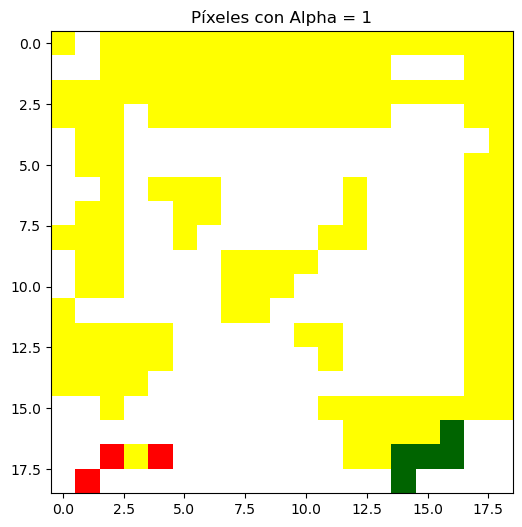

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.089853
1     0   1              0        0.000000
2     0   2              2        0.298759
3     0   3              2        0.348777
4     0   4              2        0.423845
..   ..  ..            ...             ...
356  18  14              2        0.065537
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   115
1     1   0      Crops   115
2     2   0      Crops   115
3     3   0      Crops   115
4     4   0      Crops   115
..   ..  ..        ...   ...
356  14  18       Tree   115
357  15  18       Tree   115
358  16  18       Tree   115
359  17  18       Tree   115
360  18  18       Tree   115

[361 rows x 4 columns]
116


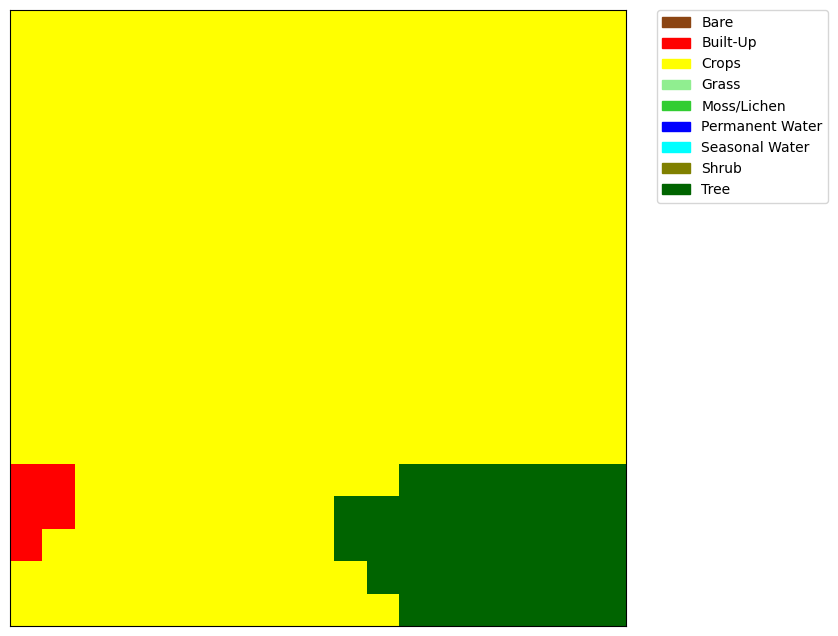

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


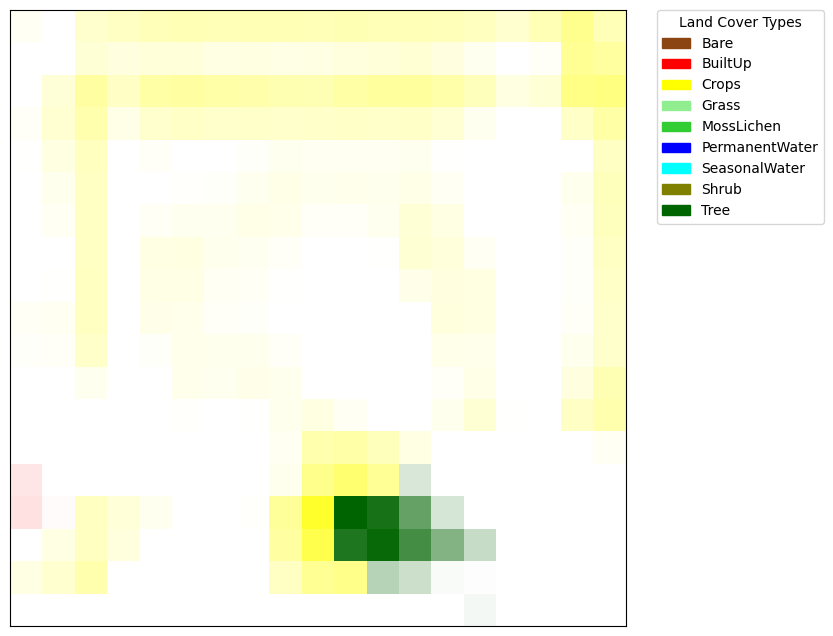

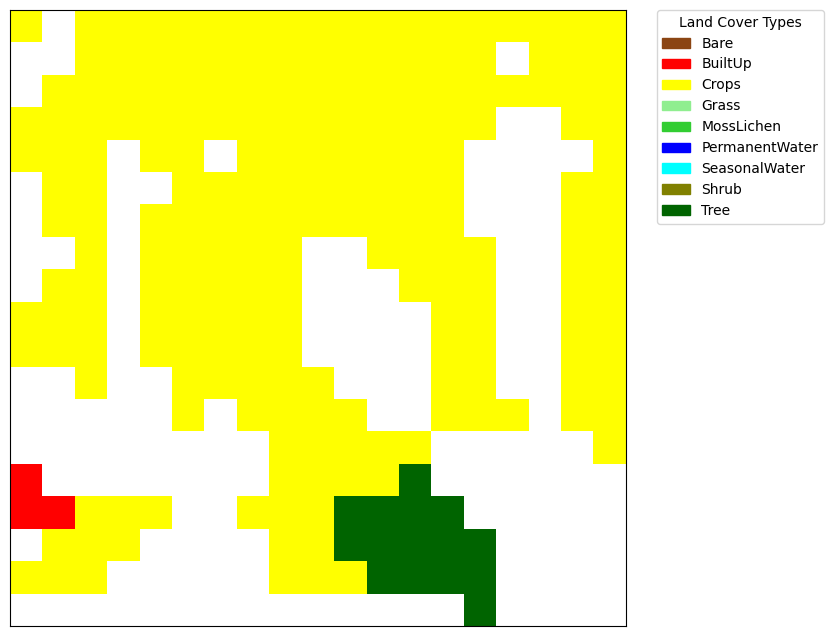

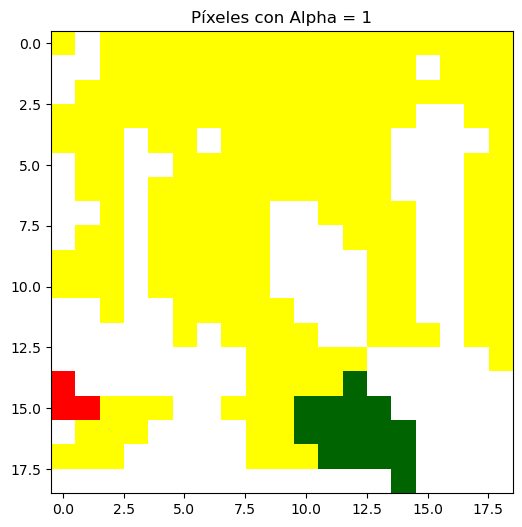

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.044832
1     0   1              0        0.000000
2     0   2              2        0.199670
3     0   3              2        0.235530
4     0   4              2        0.277229
..   ..  ..            ...             ...
356  18  14              2        0.043347
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   116
1     1   0      Crops   116
2     2   0      Crops   116
3     3   0      Crops   116
4     4   0      Crops   116
..   ..  ..        ...   ...
356  14  18       Tree   116
357  15  18       Tree   116
358  16  18       Tree   116
359  17  18       Tree   116
360  18  18       Tree   116

[361 rows x 4 columns]
117


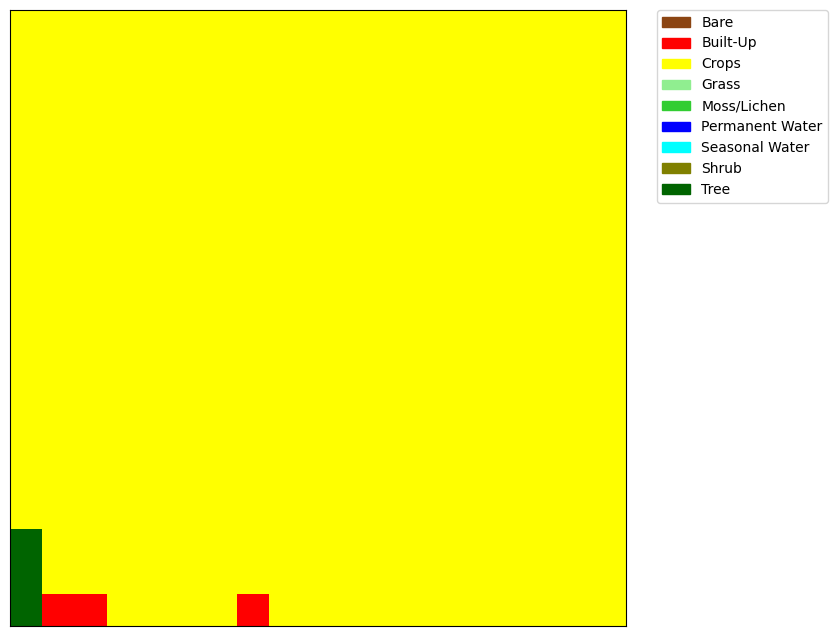

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


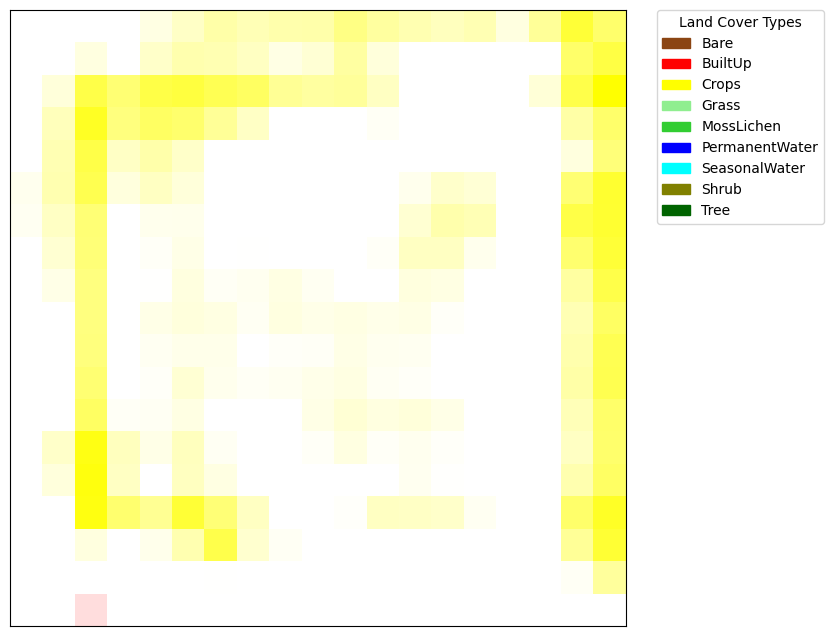

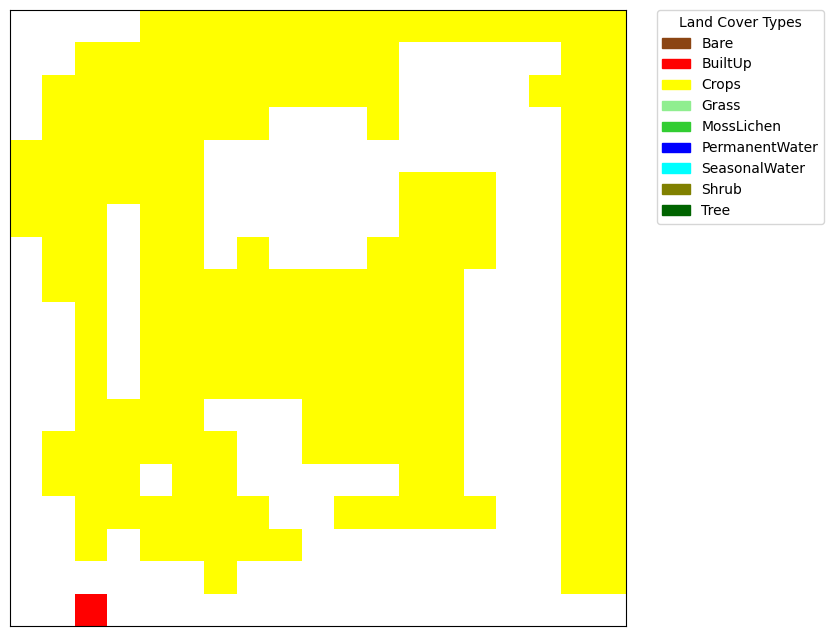

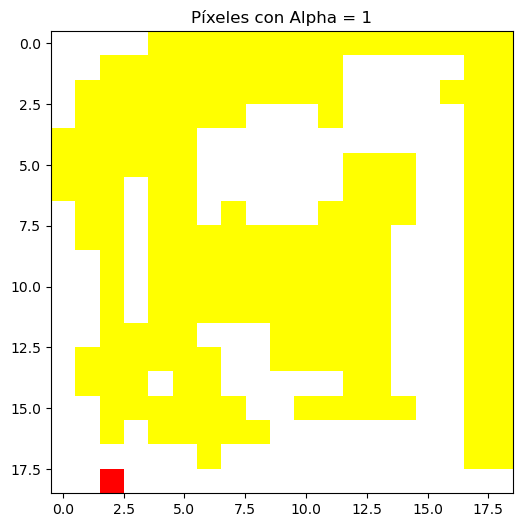

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              1        0.112991
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   117
1     1   0      Crops   117
2     2   0      Crops   117
3     3   0      Crops   117
4     4   0      Crops   117
..   ..  ..        ...   ...
356  14  18      Crops   117
357  15  18      Crops   117
358  16  18      Crops   117
359  17  18      Crops   117
360  18  18      Crops   117

[361 rows x 4 columns]
118


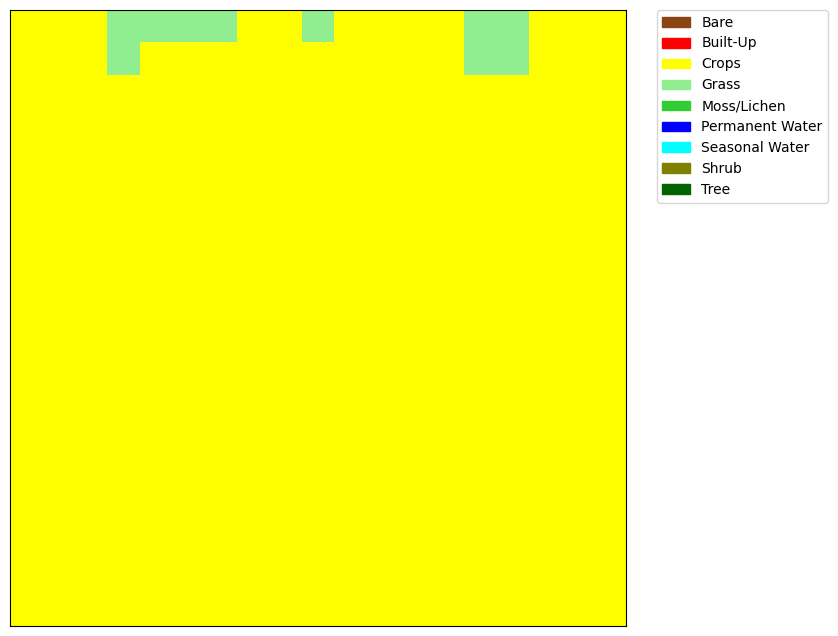

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


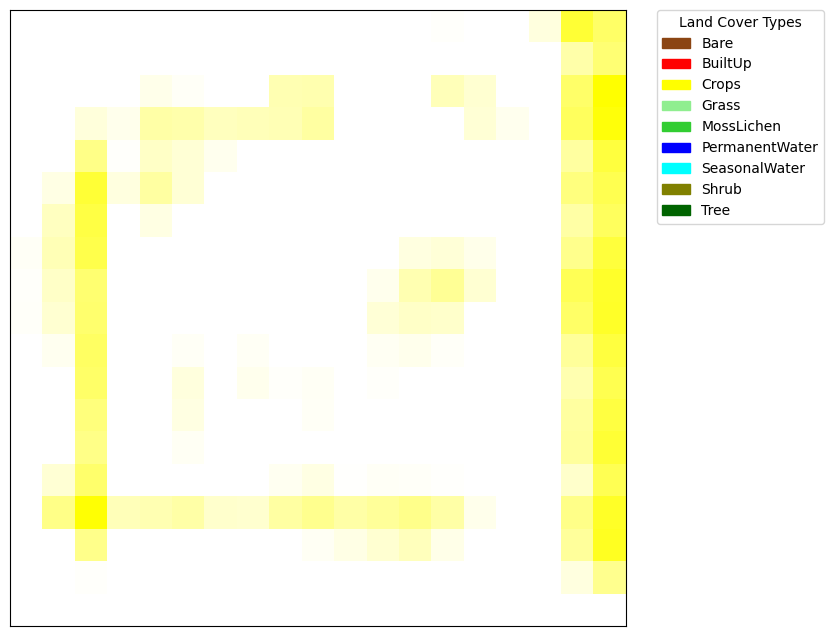

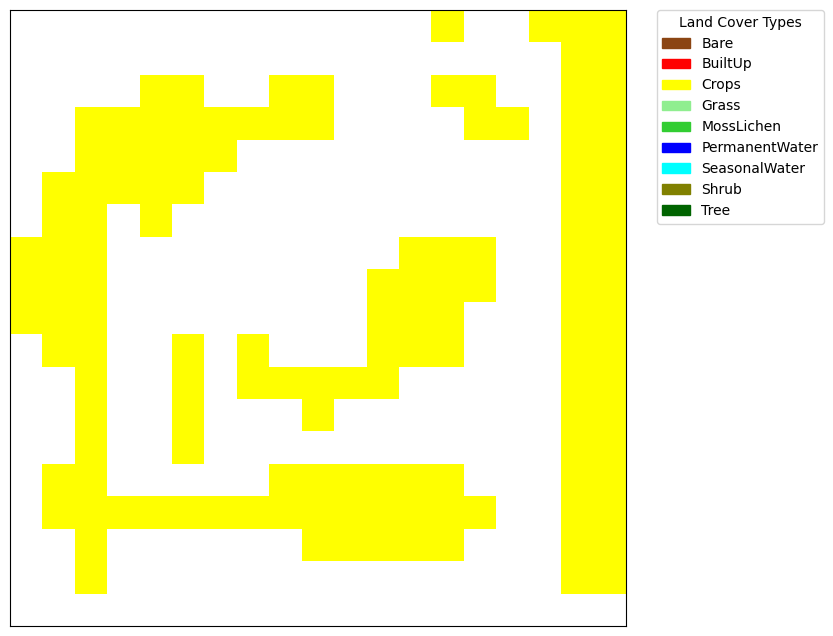

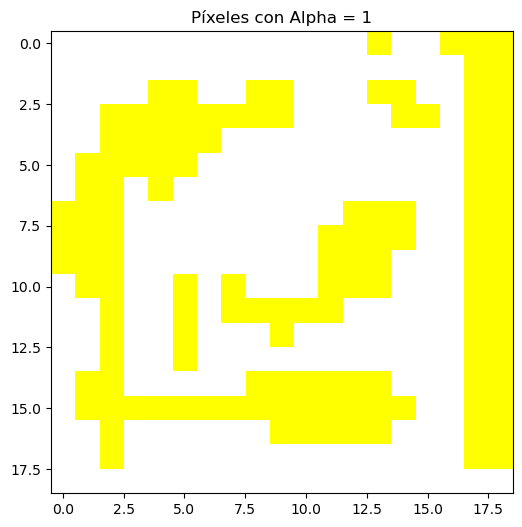

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   118
1     1   0      Crops   118
2     2   0      Crops   118
3     3   0      Grass   118
4     4   0      Grass   118
..   ..  ..        ...   ...
356  14  18      Crops   118
357  15  18      Crops   118
358  16  18      Crops   118
359  17  18      Crops   118
360  18  18      Crops   118

[361 rows x 4 columns]
119


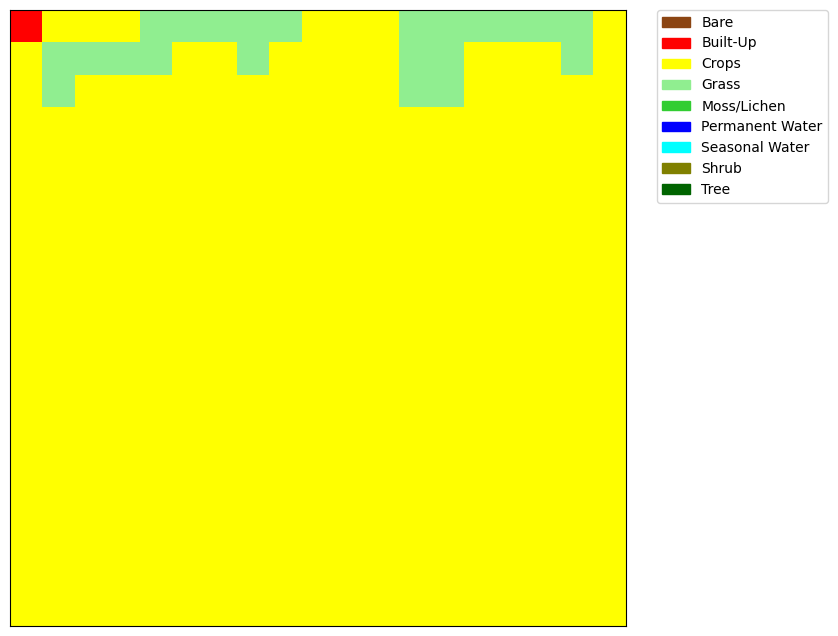

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


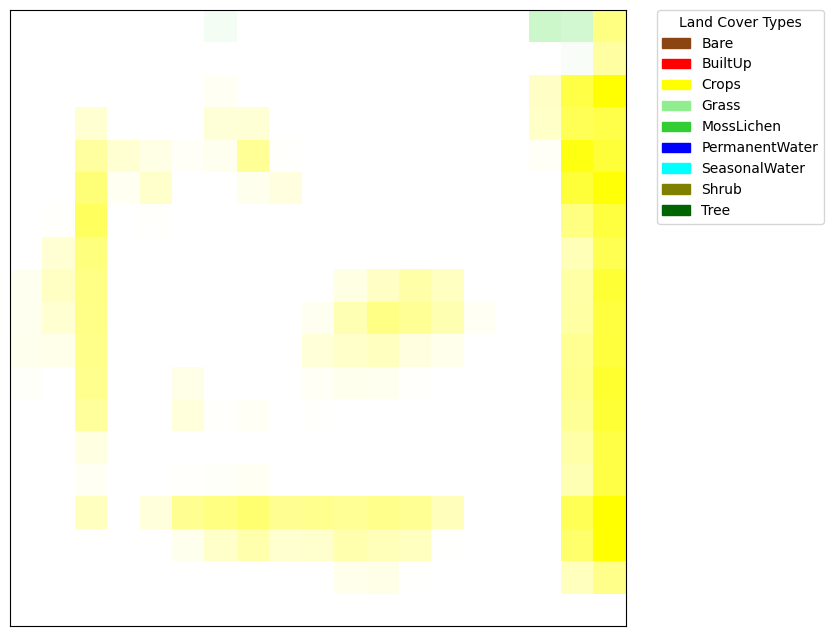

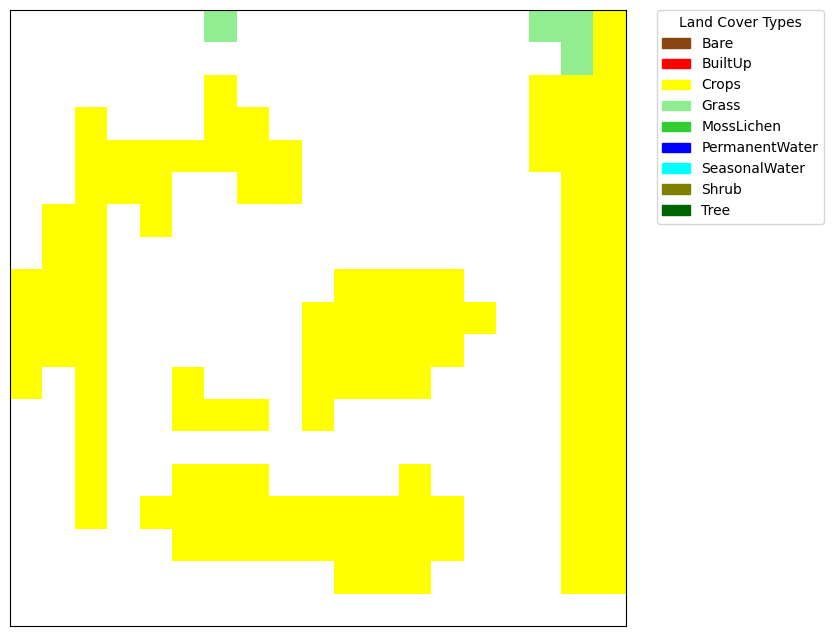

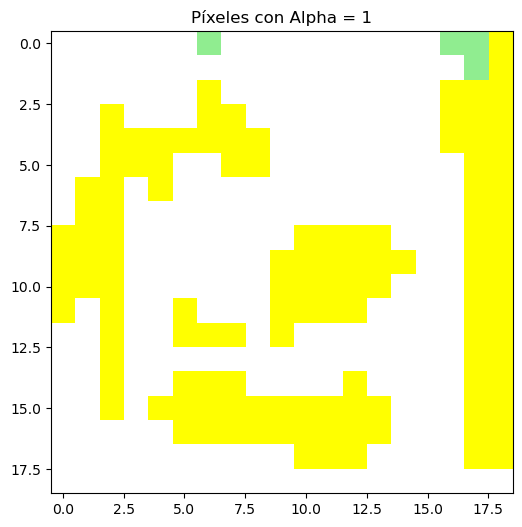

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0   Built-Up   119
1     1   0      Crops   119
2     2   0      Crops   119
3     3   0      Crops   119
4     4   0      Grass   119
..   ..  ..        ...   ...
356  14  18      Crops   119
357  15  18      Crops   119
358  16  18      Crops   119
359  17  18      Crops   119
360  18  18      Crops   119

[361 rows x 4 columns]
120


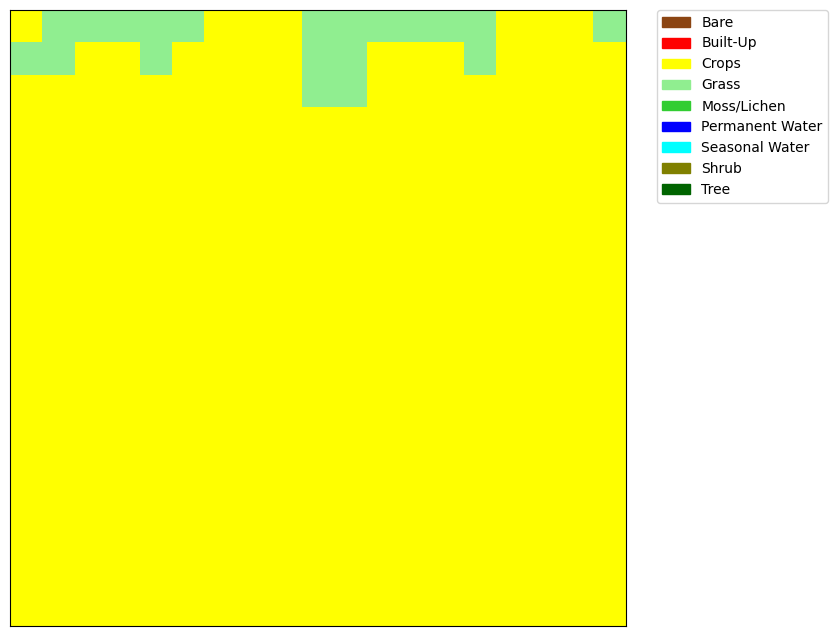

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


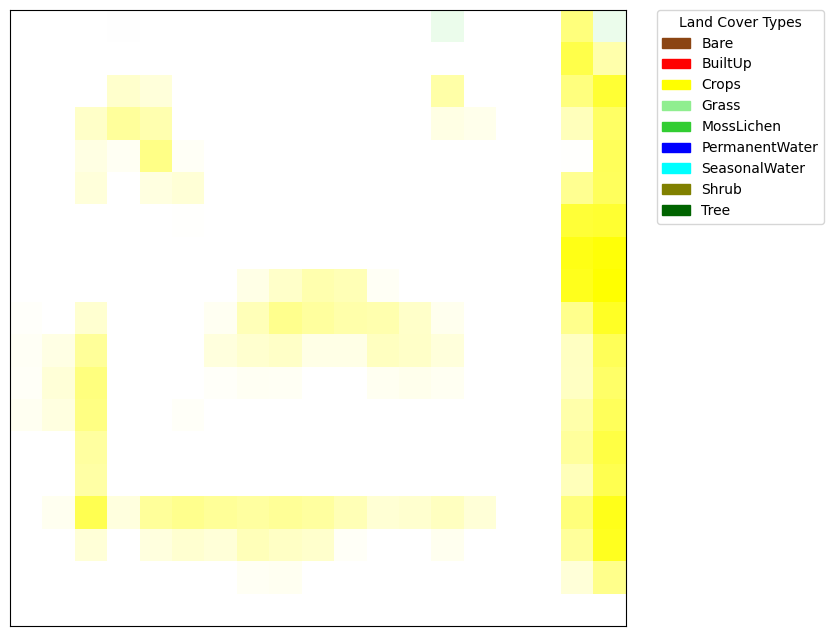

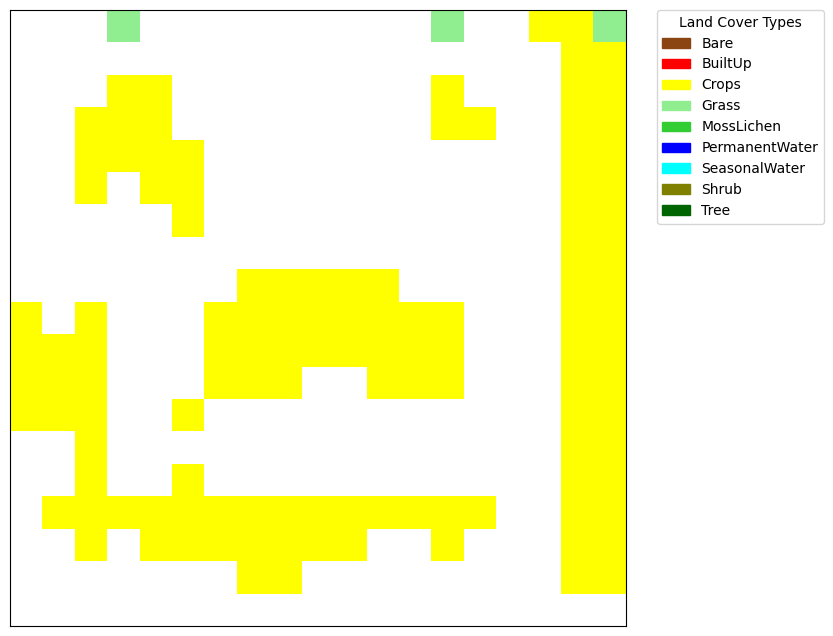

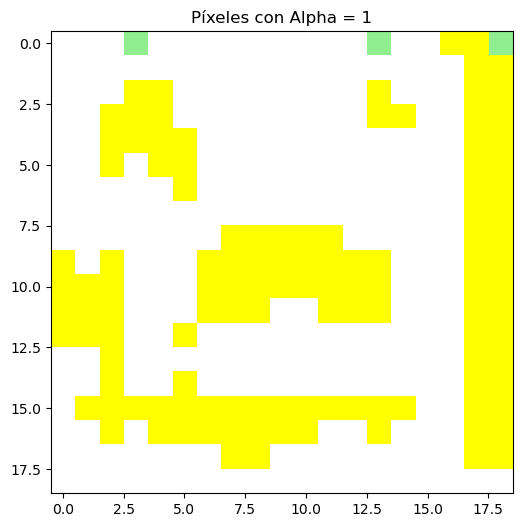

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0         0.00000
1     0   1              0         0.00000
2     0   2              0         0.00000
3     0   3              1         0.01075
4     0   4              0         0.00000
..   ..  ..            ...             ...
356  18  14              0         0.00000
357  18  15              0         0.00000
358  18  16              0         0.00000
359  18  17              0         0.00000
360  18  18              0         0.00000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   120
1     1   0      Grass   120
2     2   0      Grass   120
3     3   0      Grass   120
4     4   0      Grass   120
..   ..  ..        ...   ...
356  14  18      Crops   120
357  15  18      Crops   120
358  16  18      Crops   120
359  17  18      Crops   120
360  18  18      Crops   120

[361 rows x 4 columns]
121


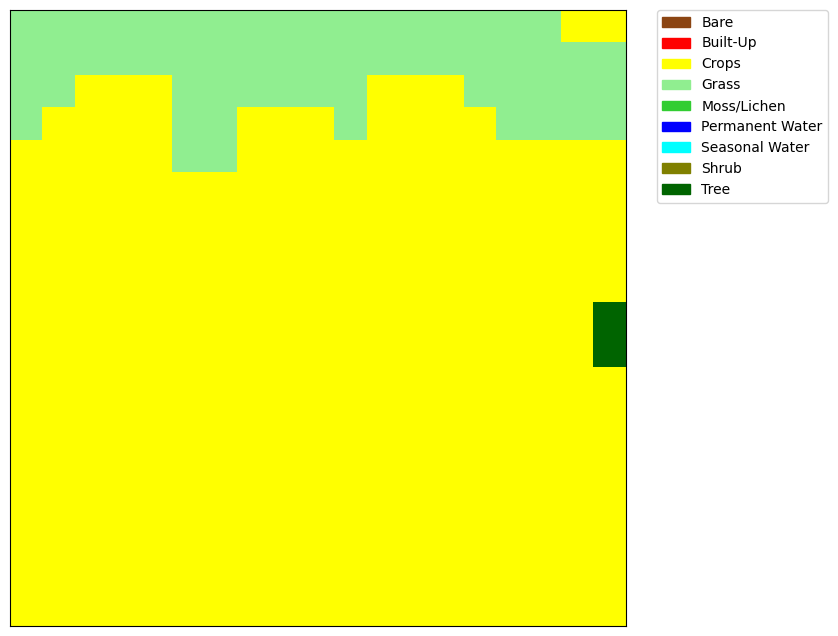

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


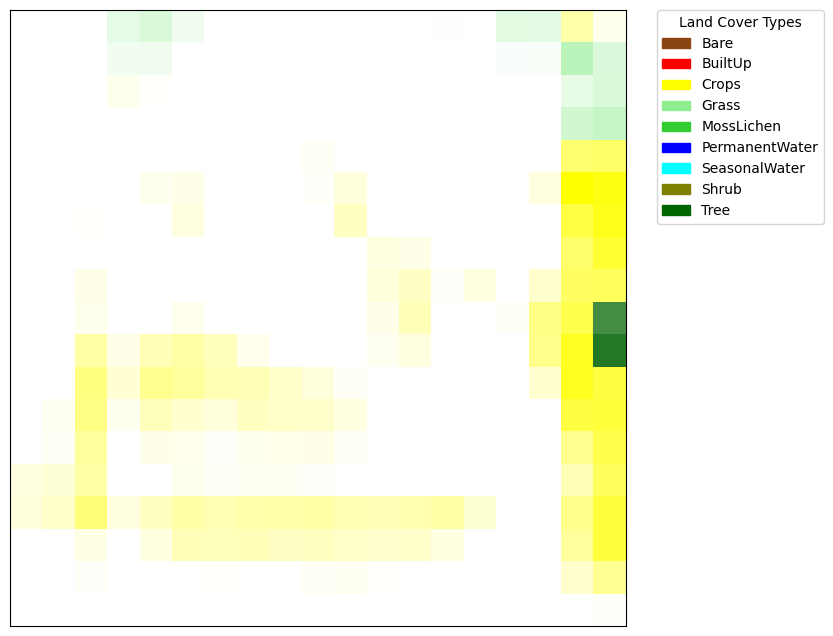

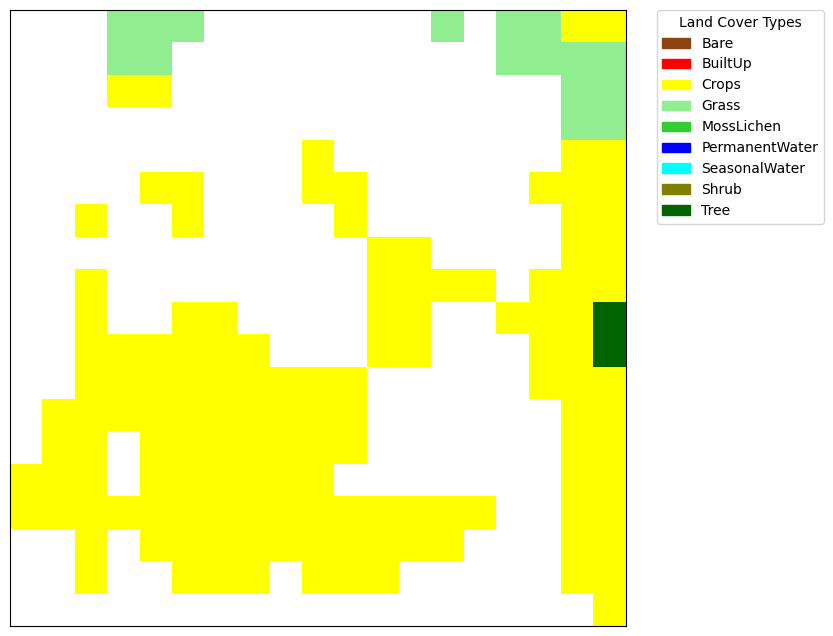

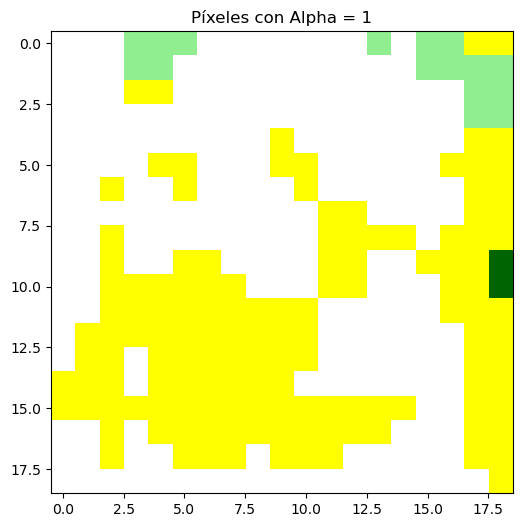

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.229013
4     0   4              1        0.340192
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              3        0.026634

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass   121
1     1   0      Grass   121
2     2   0      Grass   121
3     3   0      Grass   121
4     4   0      Grass   121
..   ..  ..        ...   ...
356  14  18      Crops   121
357  15  18      Crops   121
358  16  18      Crops   121
359  17  18      Crops   121
360  18  18      Crops   121

[361 rows x 4 columns]
122


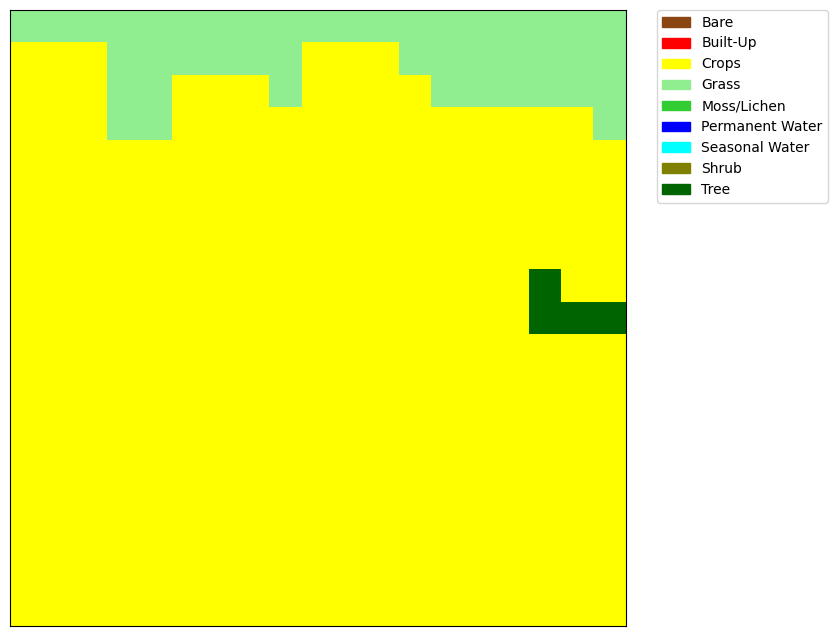

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


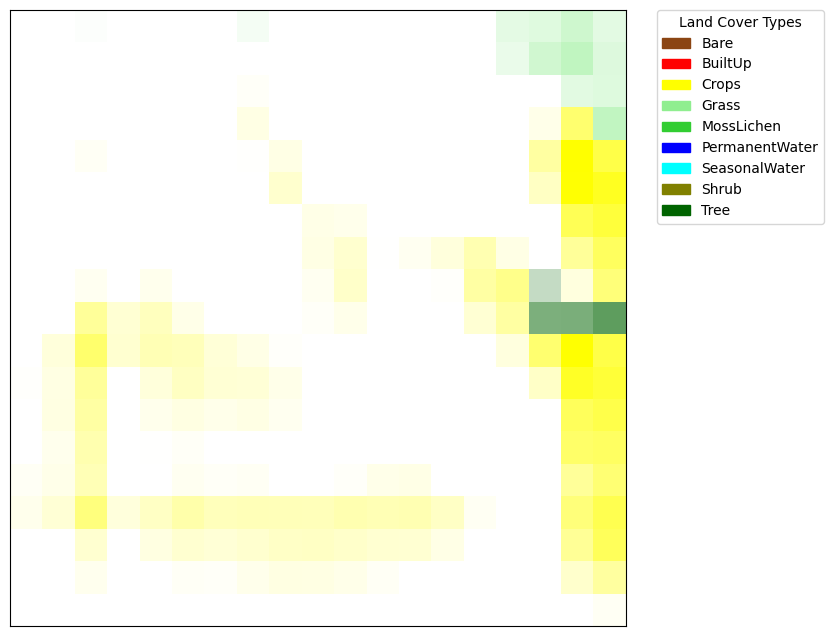

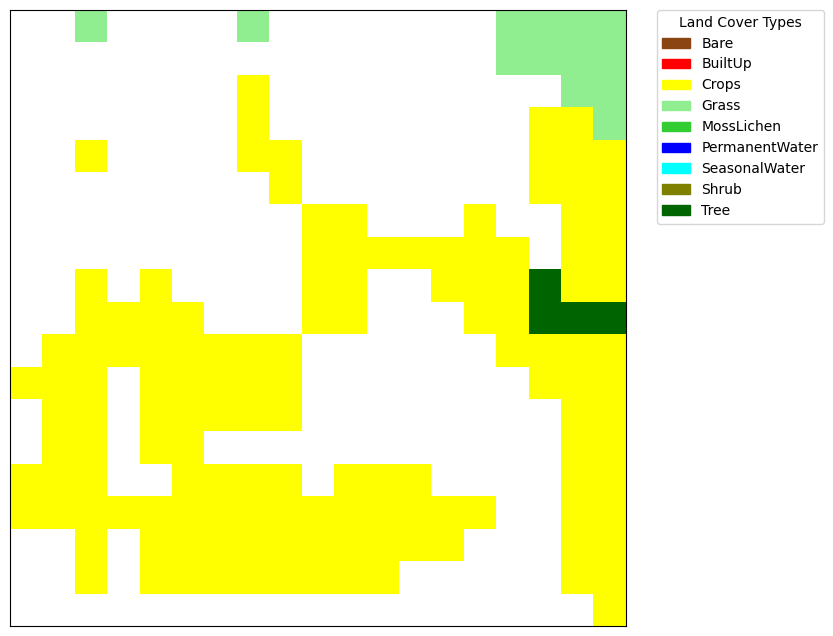

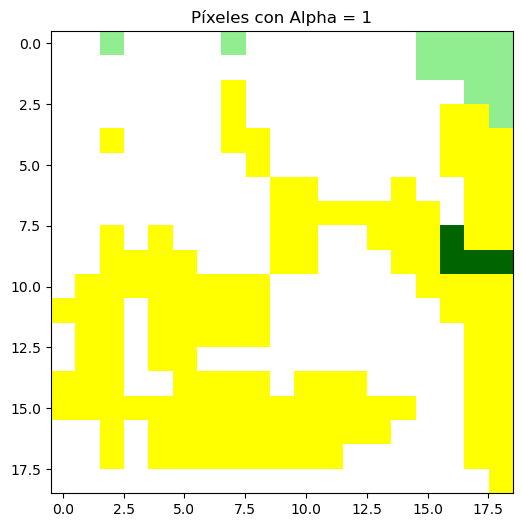

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.025661
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              3        0.043755

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Grass   122
1     1   0      Grass   122
2     2   0      Grass   122
3     3   0      Grass   122
4     4   0      Grass   122
..   ..  ..        ...   ...
356  14  18      Crops   122
357  15  18      Crops   122
358  16  18      Crops   122
359  17  18      Crops   122
360  18  18      Crops   122

[361 rows x 4 columns]
123


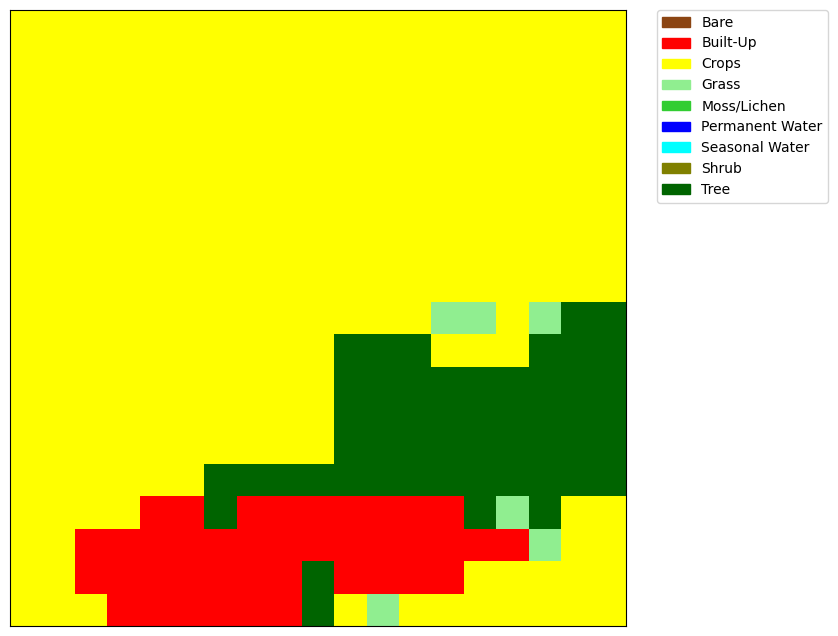

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


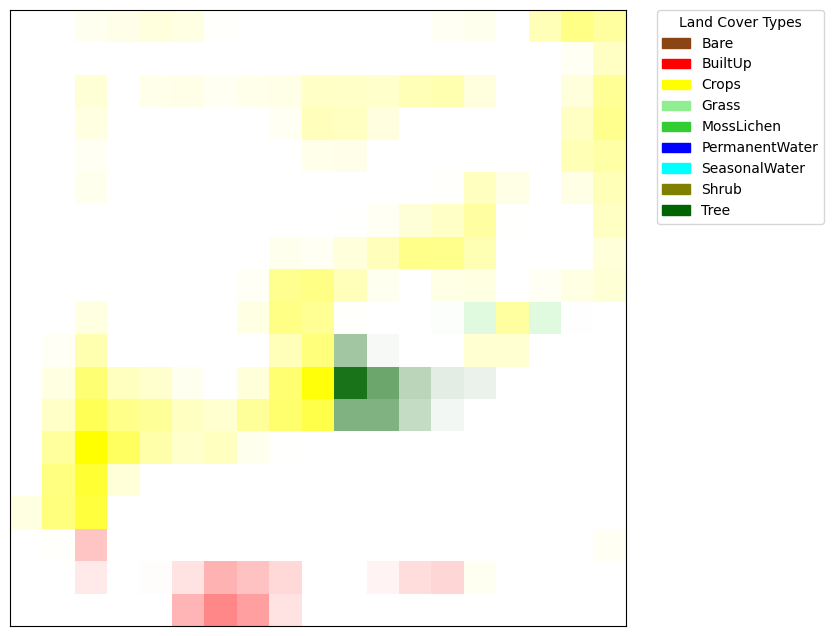

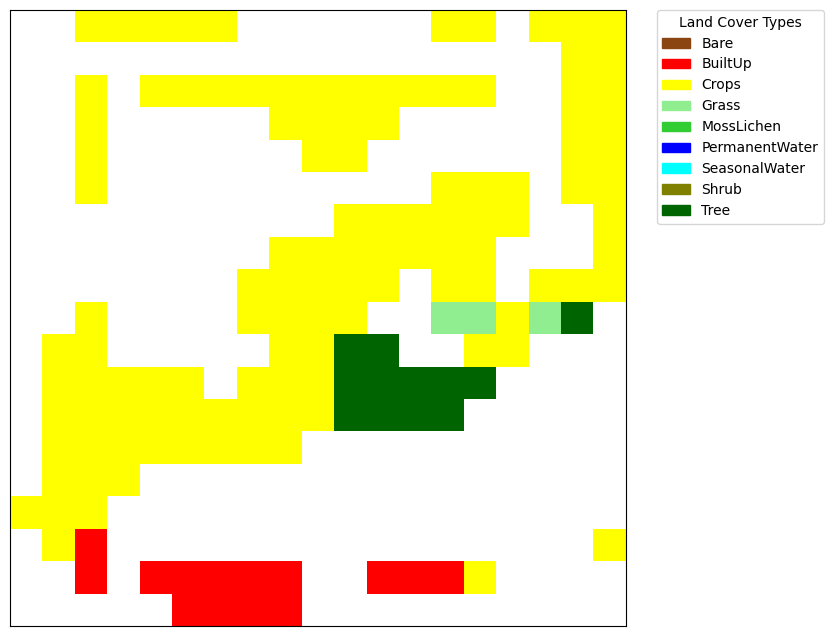

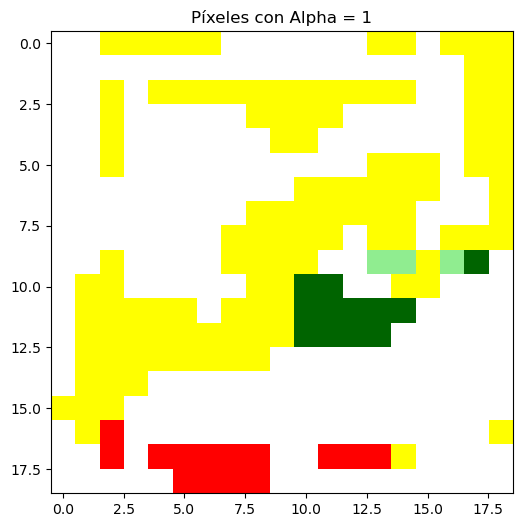

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.066307
3     0   3              1        0.088920
4     0   4              1        0.134784
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   123
1     1   0      Crops   123
2     2   0      Crops   123
3     3   0      Crops   123
4     4   0      Crops   123
..   ..  ..        ...   ...
356  14  18      Crops   123
357  15  18      Crops   123
358  16  18      Crops   123
359  17  18      Crops   123
360  18  18      Crops   123

[361 rows x 4 columns]
124


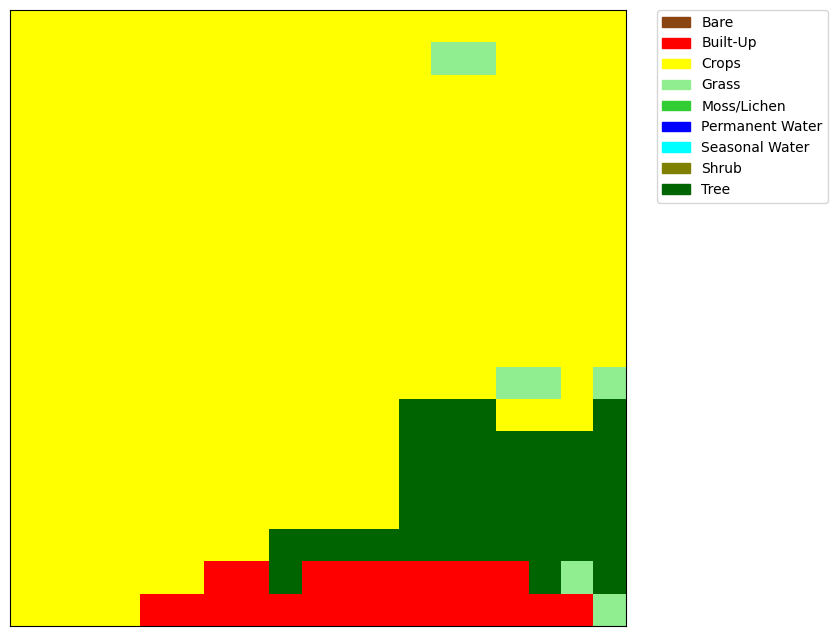

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


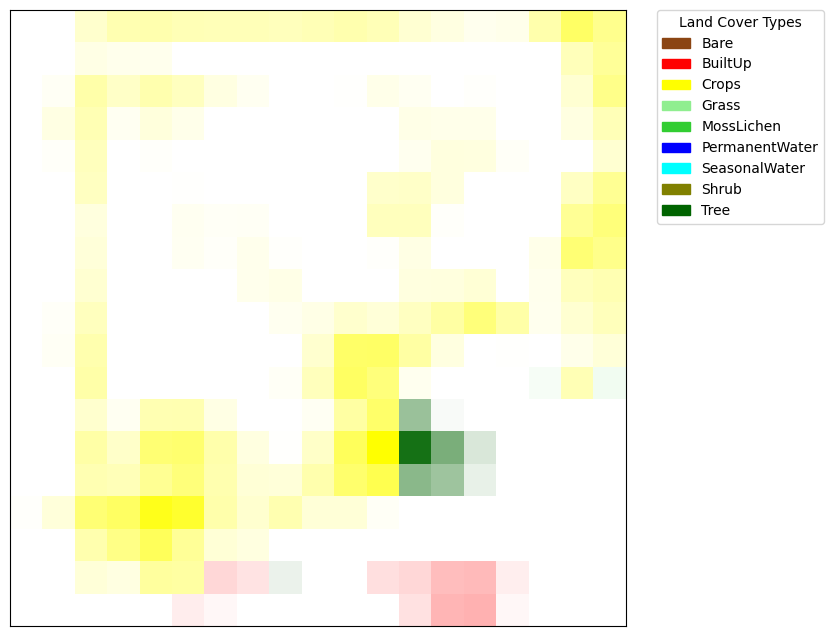

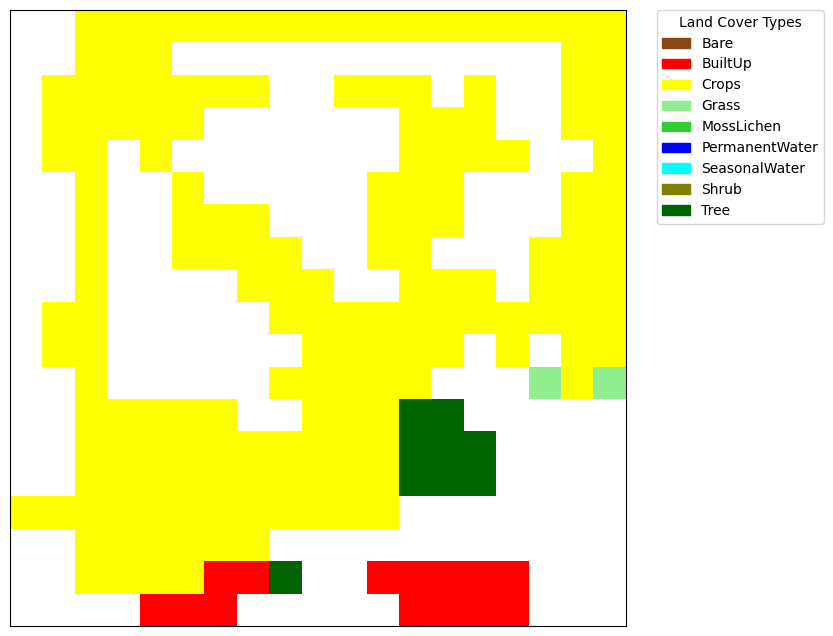

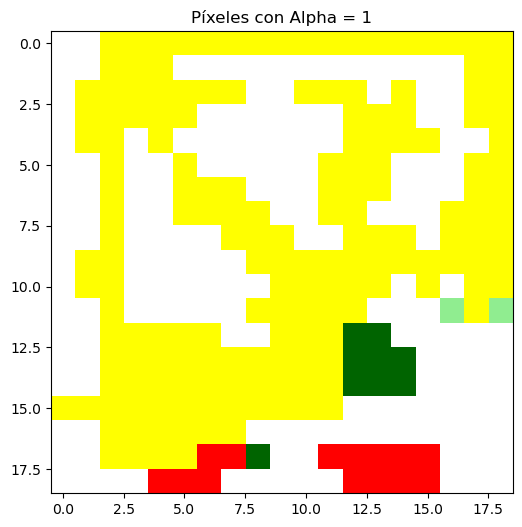

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.199297
3     0   3              1        0.307453
4     0   4              1        0.318408
..   ..  ..            ...             ...
356  18  14              2        0.306705
357  18  15              2        0.034353
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   124
1     1   0      Crops   124
2     2   0      Crops   124
3     3   0      Crops   124
4     4   0      Crops   124
..   ..  ..        ...   ...
356  14  18   Built-Up   124
357  15  18   Built-Up   124
358  16  18   Built-Up   124
359  17  18   Built-Up   124
360  18  18      Grass   124

[361 rows x 4 columns]
125


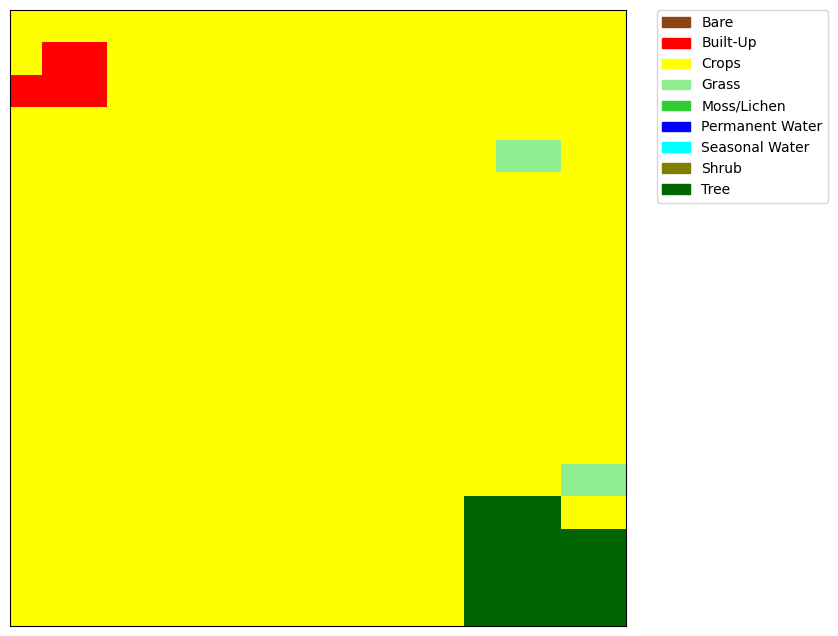

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


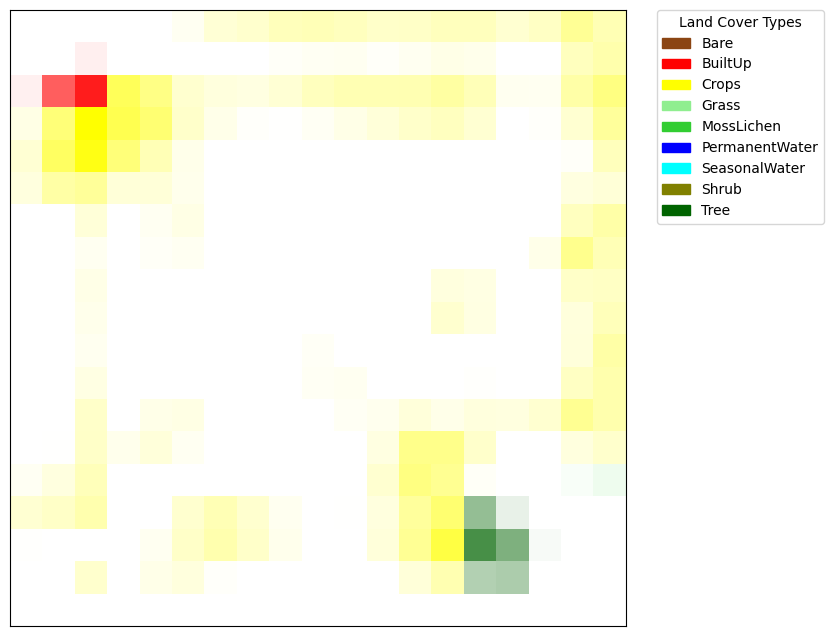

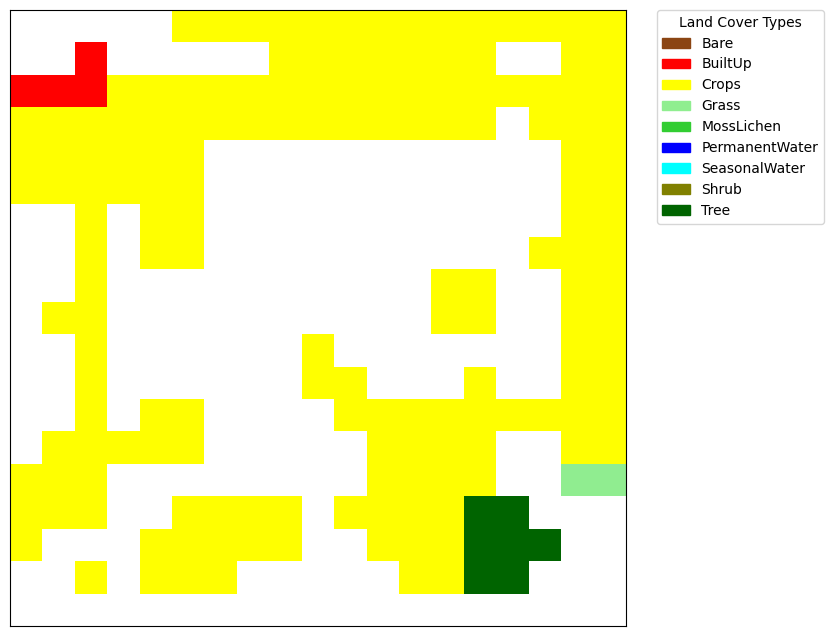

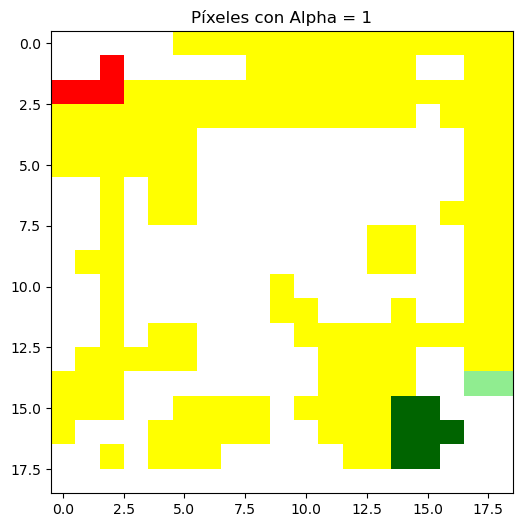

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   125
1     1   0      Crops   125
2     2   0      Crops   125
3     3   0      Crops   125
4     4   0      Crops   125
..   ..  ..        ...   ...
356  14  18       Tree   125
357  15  18       Tree   125
358  16  18       Tree   125
359  17  18       Tree   125
360  18  18       Tree   125

[361 rows x 4 columns]
126


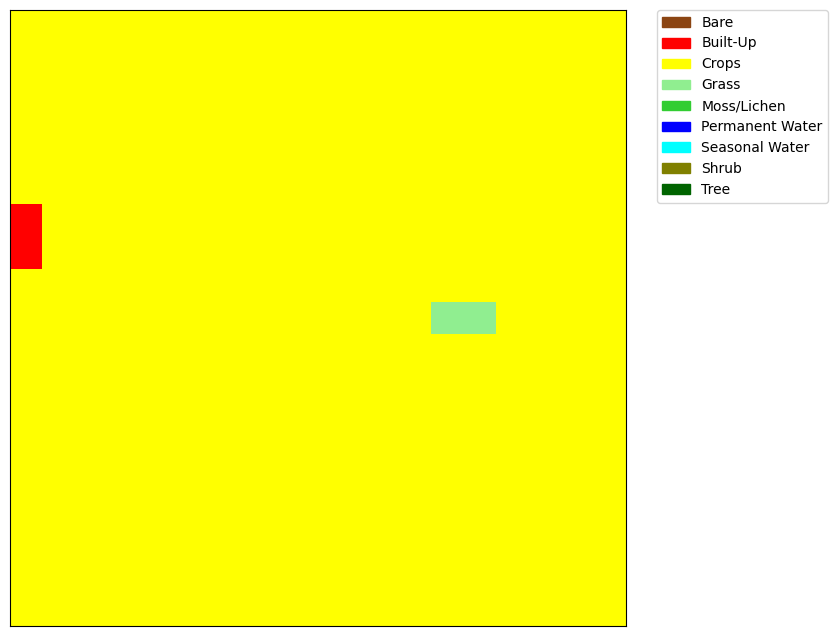

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


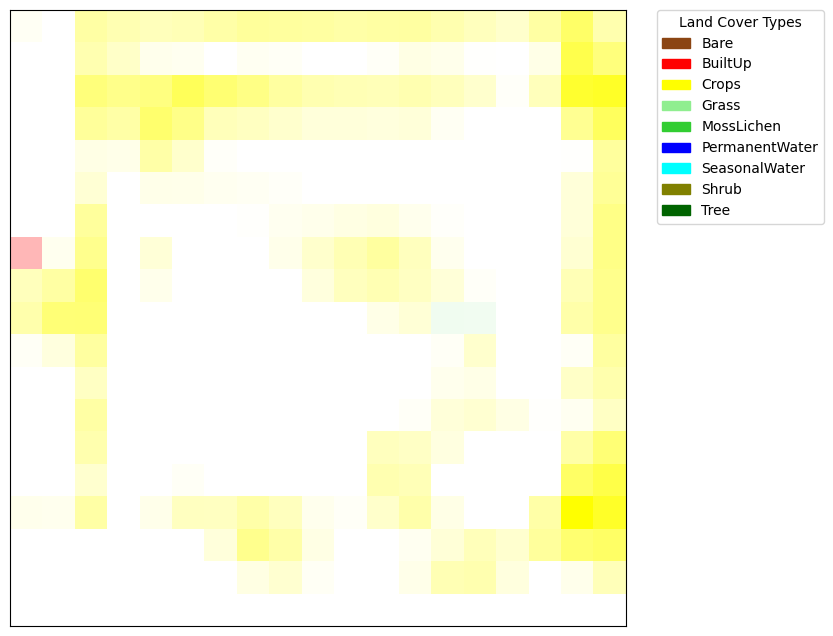

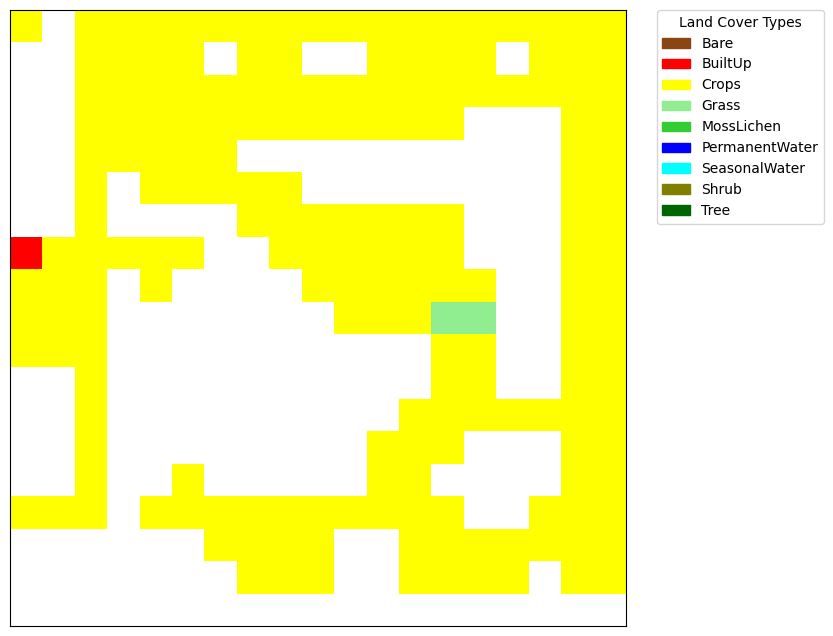

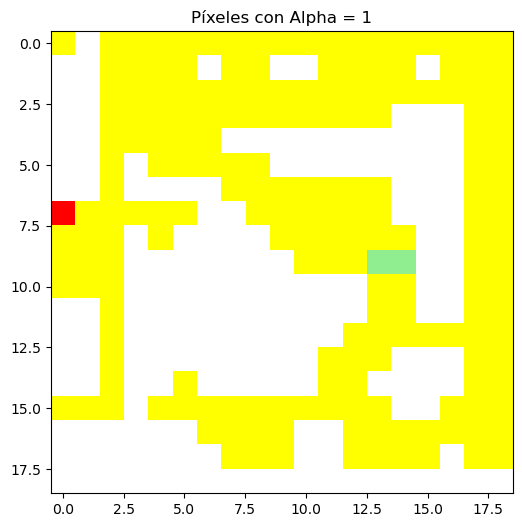

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.043739
1     0   1              0        0.000000
2     0   2              2        0.357710
3     0   3              2        0.305437
4     0   4              2        0.268350
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   126
1     1   0      Crops   126
2     2   0      Crops   126
3     3   0      Crops   126
4     4   0      Crops   126
..   ..  ..        ...   ...
356  14  18      Crops   126
357  15  18      Crops   126
358  16  18      Crops   126
359  17  18      Crops   126
360  18  18      Crops   126

[361 rows x 4 columns]
127


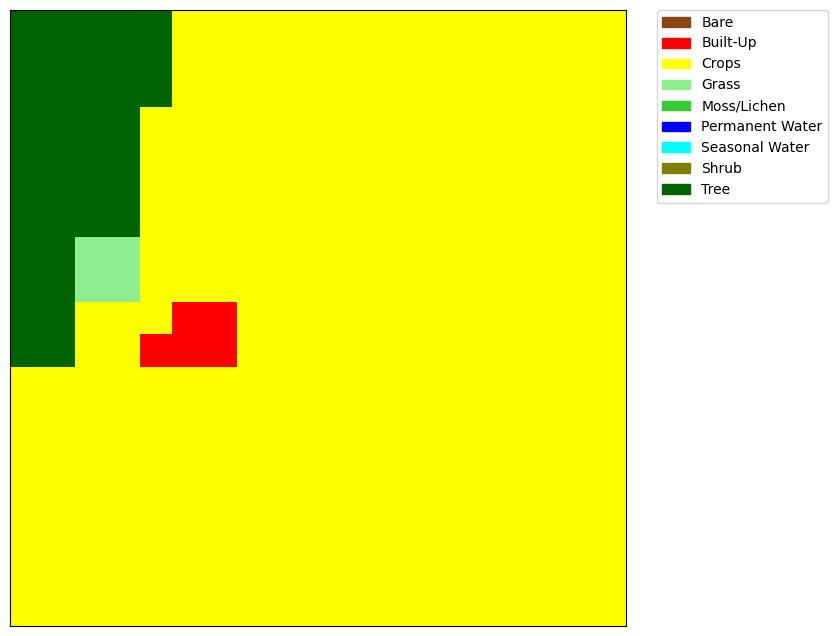

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


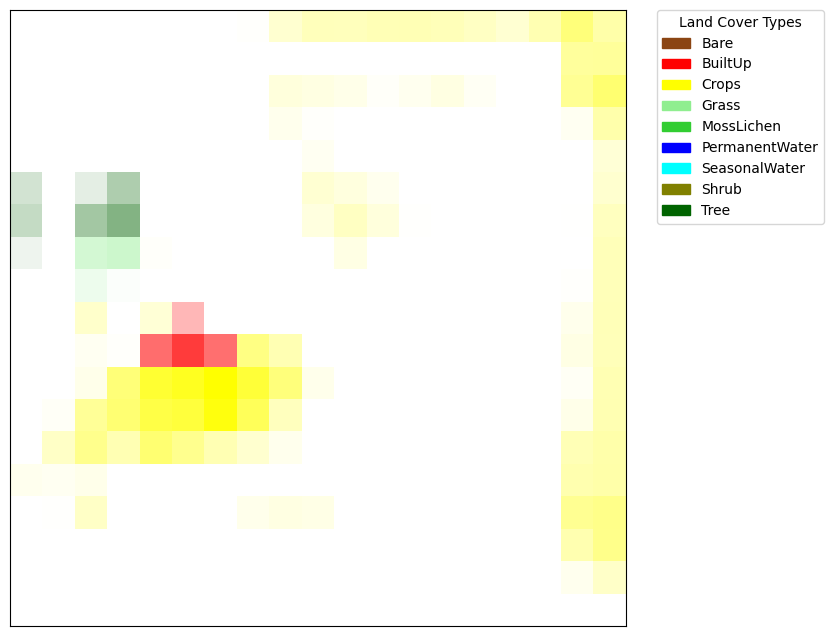

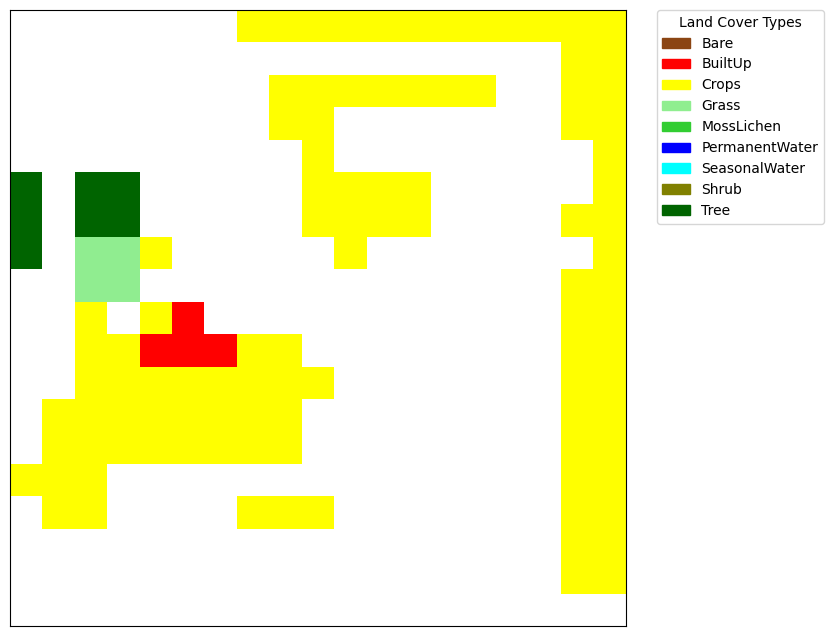

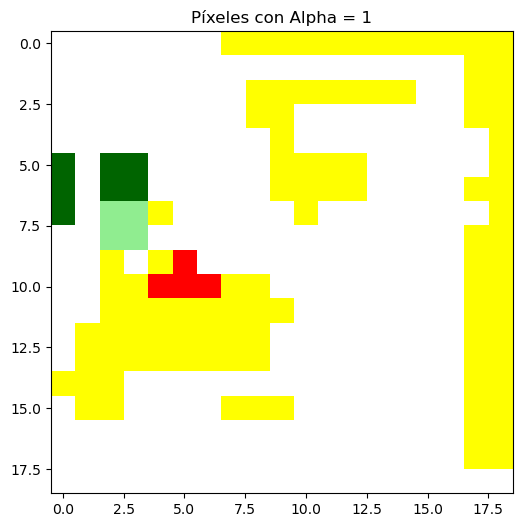

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   127
1     1   0       Tree   127
2     2   0       Tree   127
3     3   0       Tree   127
4     4   0       Tree   127
..   ..  ..        ...   ...
356  14  18      Crops   127
357  15  18      Crops   127
358  16  18      Crops   127
359  17  18      Crops   127
360  18  18      Crops   127

[361 rows x 4 columns]
128


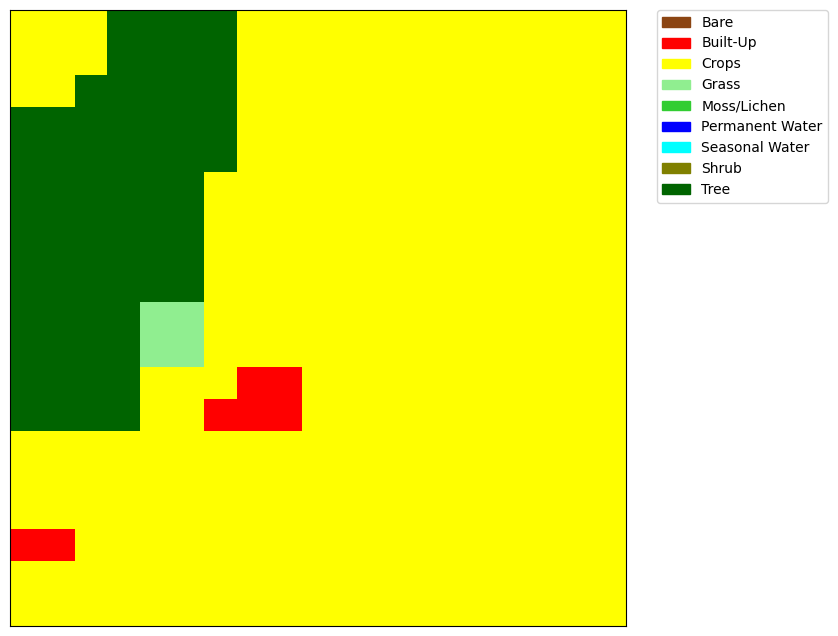

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


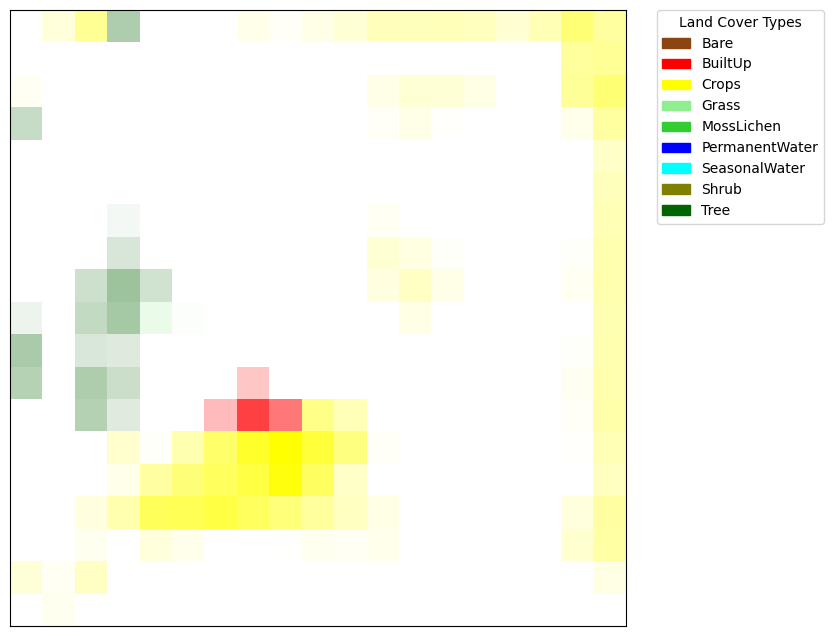

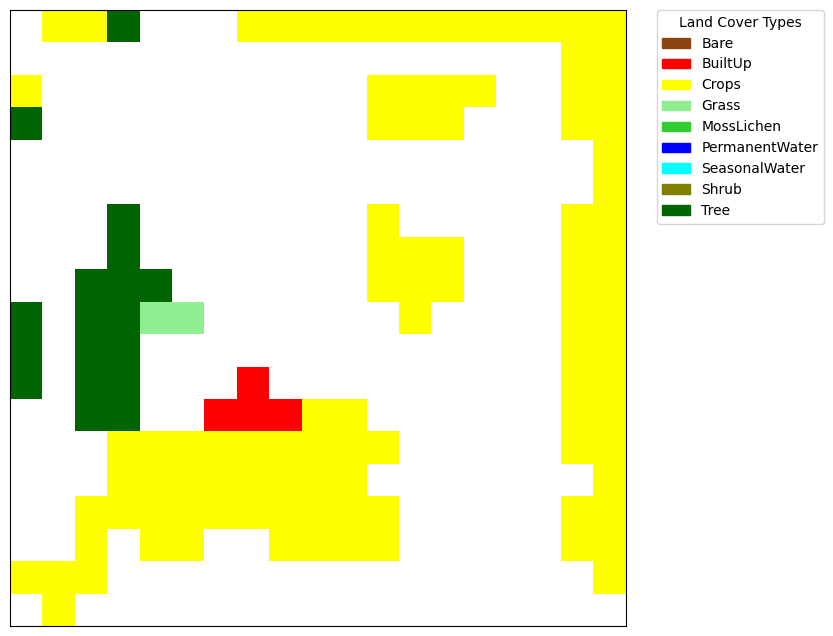

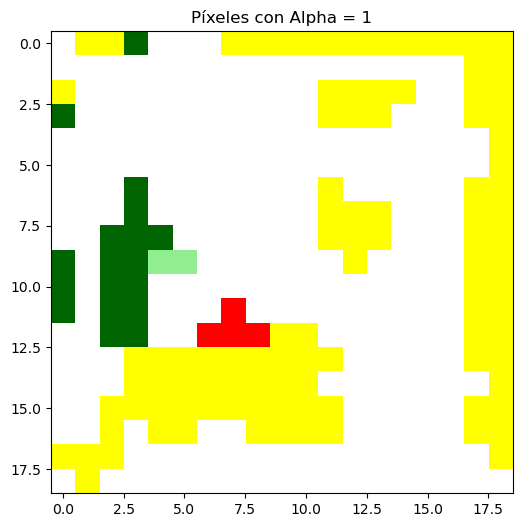

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              1        0.143519
2     0   2              1        0.425146
3     0   3              1        0.320534
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   128
1     1   0      Crops   128
2     2   0      Crops   128
3     3   0       Tree   128
4     4   0       Tree   128
..   ..  ..        ...   ...
356  14  18      Crops   128
357  15  18      Crops   128
358  16  18      Crops   128
359  17  18      Crops   128
360  18  18      Crops   128

[361 rows x 4 columns]
129


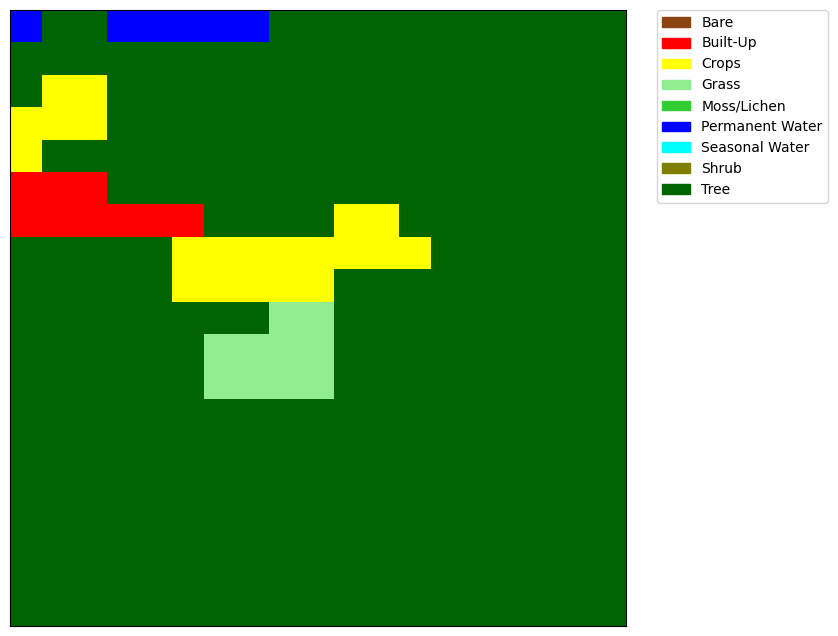

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


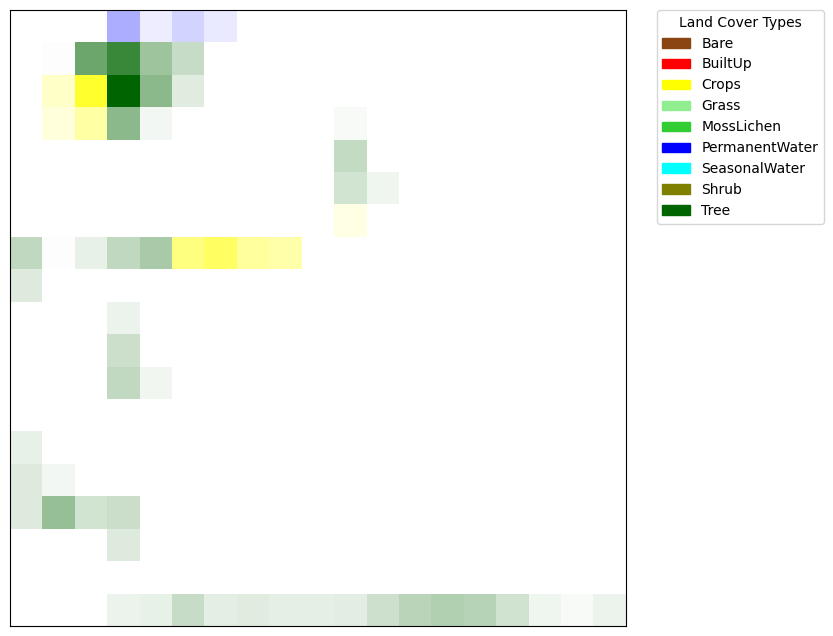

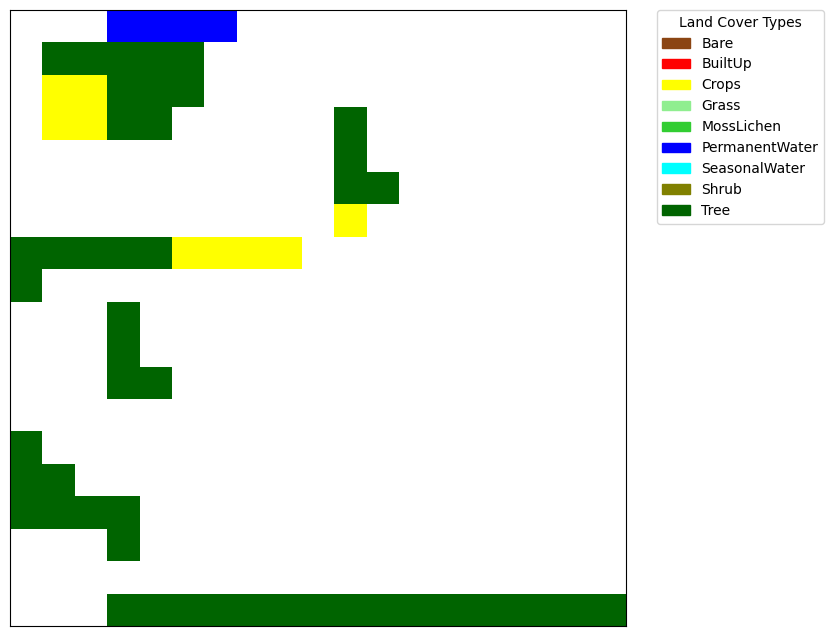

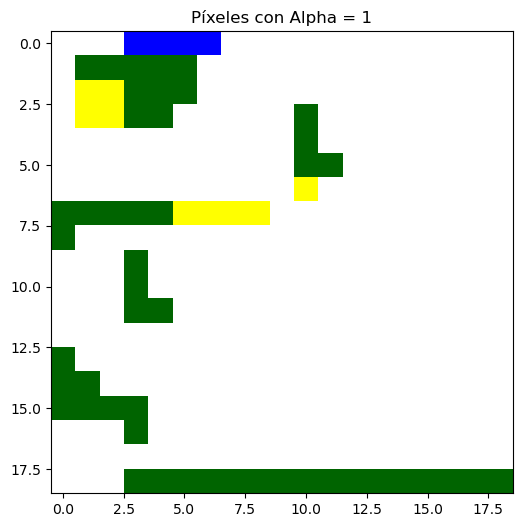

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.322453
4     0   4              1        0.071784
..   ..  ..            ...             ...
356  18  14              6        0.285678
357  18  15              6        0.184493
358  18  16              6        0.064560
359  18  17              6        0.029168
360  18  18              6        0.076963

[361 rows x 4 columns]
      x   y       land_cover  site
0     0   0  Permanent Water   129
1     1   0             Tree   129
2     2   0             Tree   129
3     3   0  Permanent Water   129
4     4   0  Permanent Water   129
..   ..  ..              ...   ...
356  14  18             Tree   129
357  15  18             Tree   129
358  16  18             Tree   129
359  17  18             Tree   1

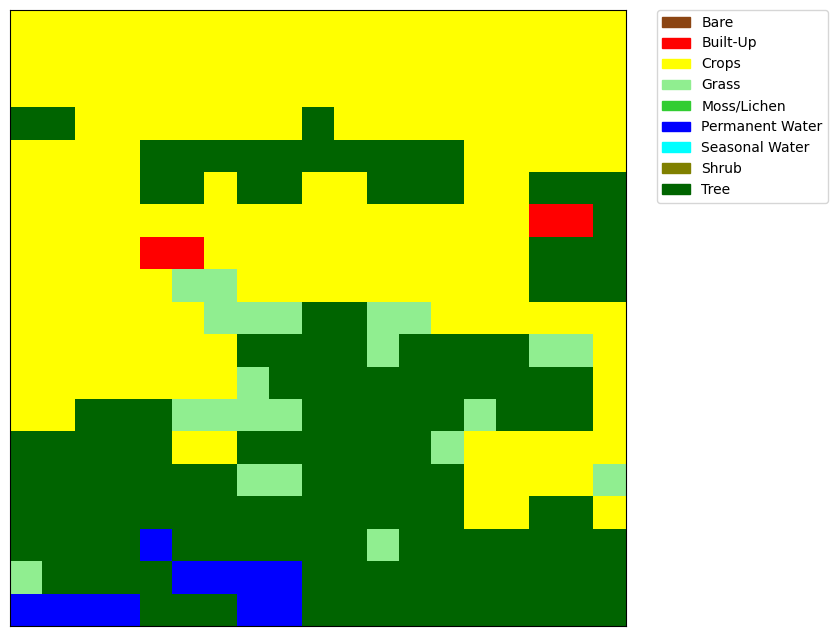

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


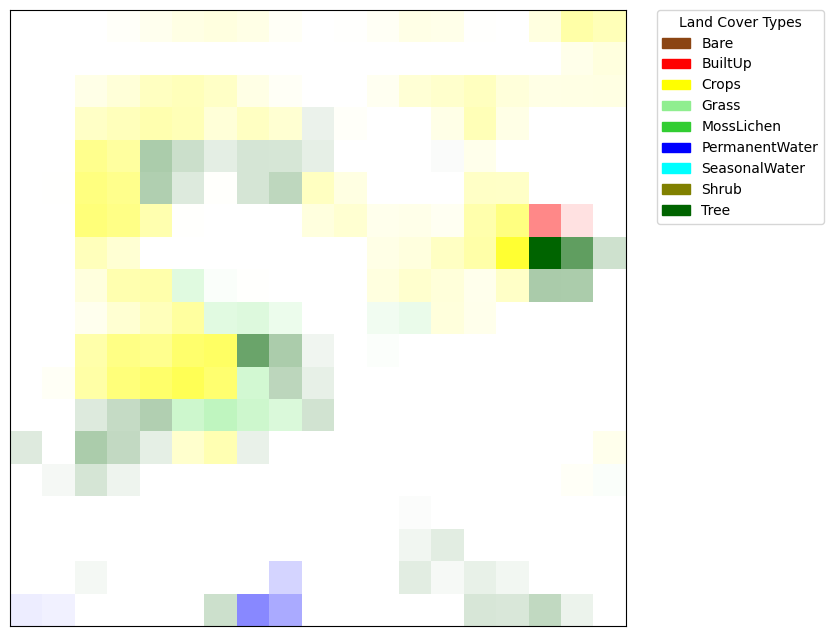

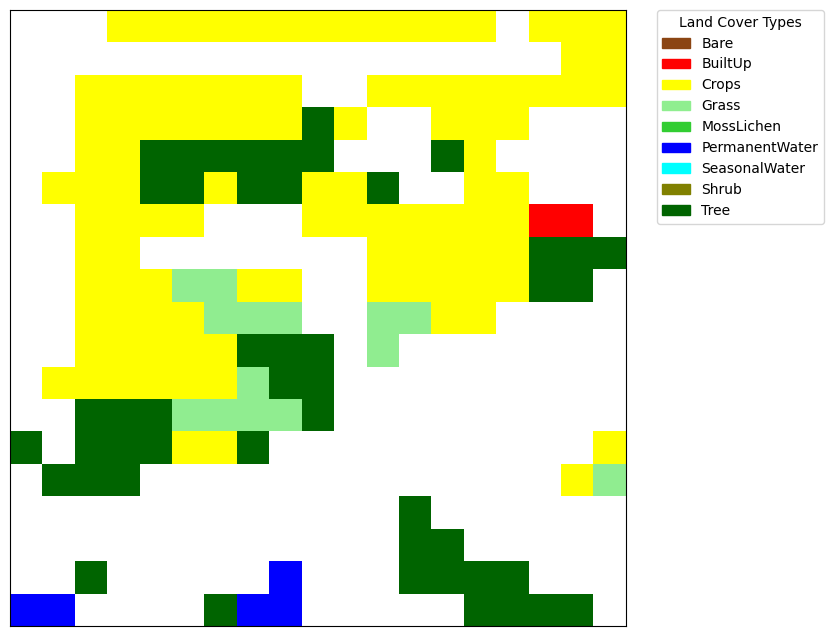

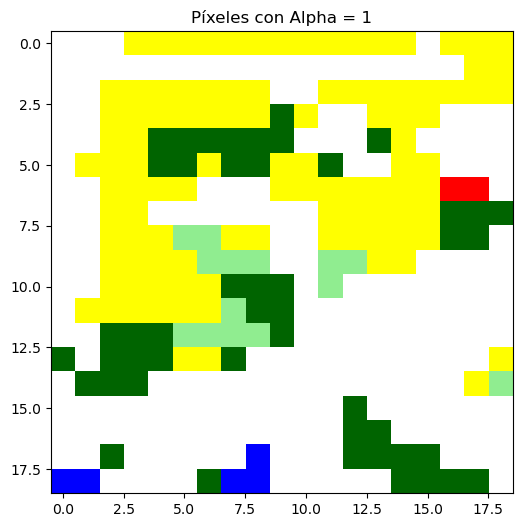

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.024449
4     0   4              1        0.067619
..   ..  ..            ...             ...
356  18  14              4        0.158211
357  18  15              4        0.152554
358  18  16              4        0.244155
359  18  17              4        0.075411
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   130
1     1   0      Crops   130
2     2   0      Crops   130
3     3   0      Crops   130
4     4   0      Crops   130
..   ..  ..        ...   ...
356  14  18       Tree   130
357  15  18       Tree   130
358  16  18       Tree   130
359  17  18       Tree   130
360  18  18       Tree   130

[361 rows x 4 columns]
131


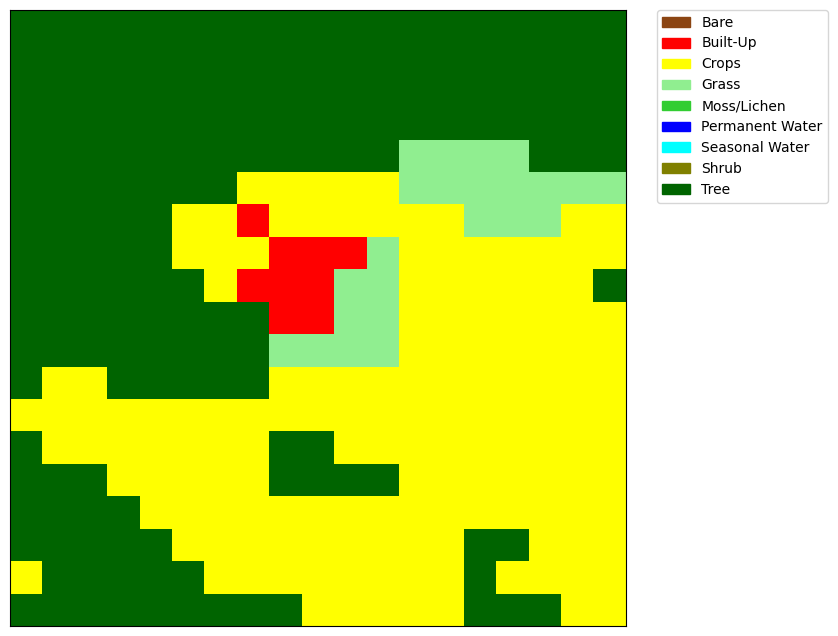

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


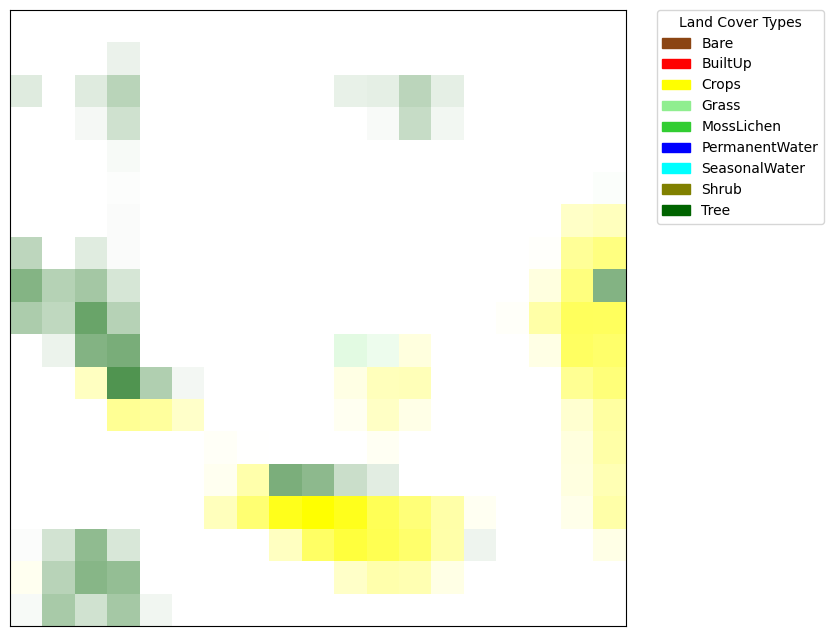

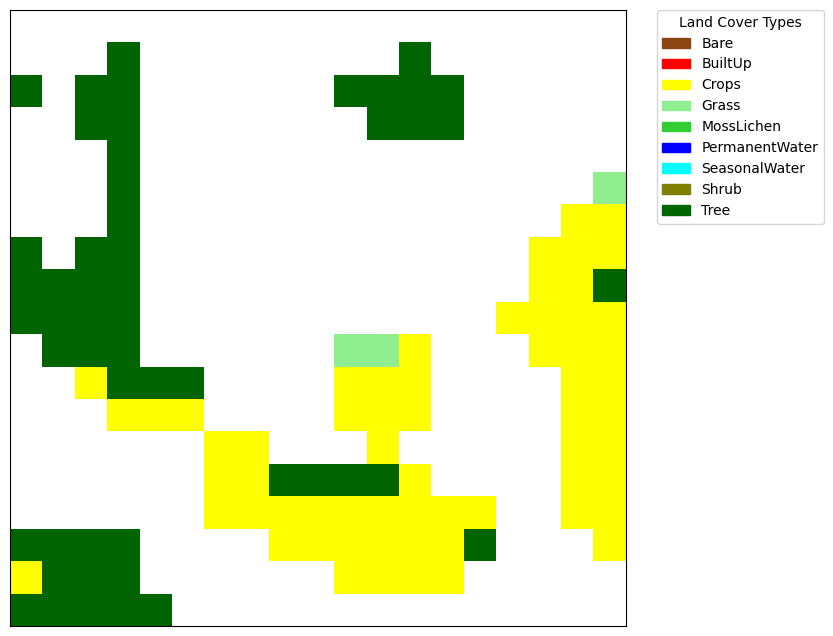

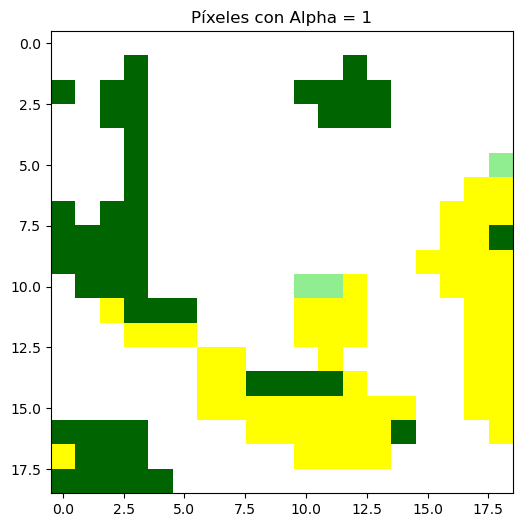

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   131
1     1   0       Tree   131
2     2   0       Tree   131
3     3   0       Tree   131
4     4   0       Tree   131
..   ..  ..        ...   ...
356  14  18       Tree   131
357  15  18       Tree   131
358  16  18       Tree   131
359  17  18      Crops   131
360  18  18      Crops   131

[361 rows x 4 columns]
132


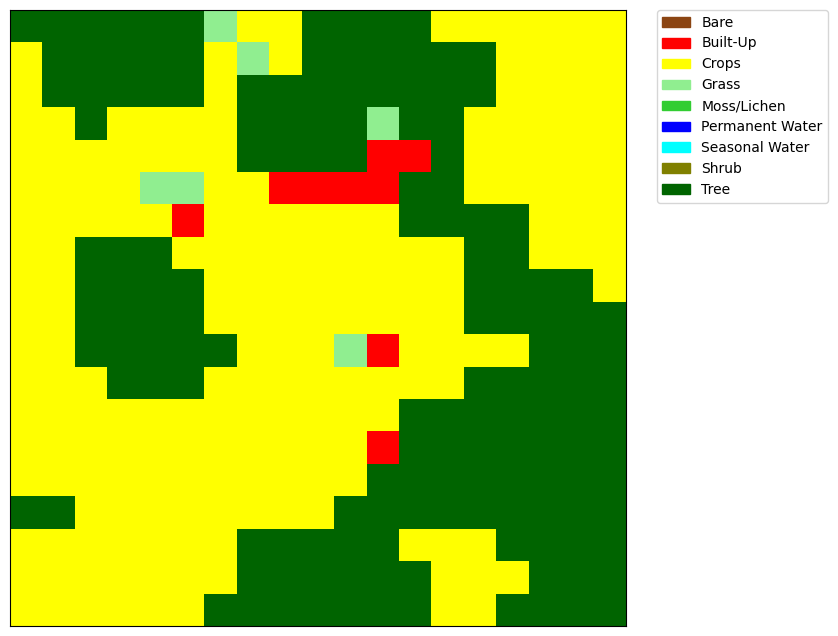

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


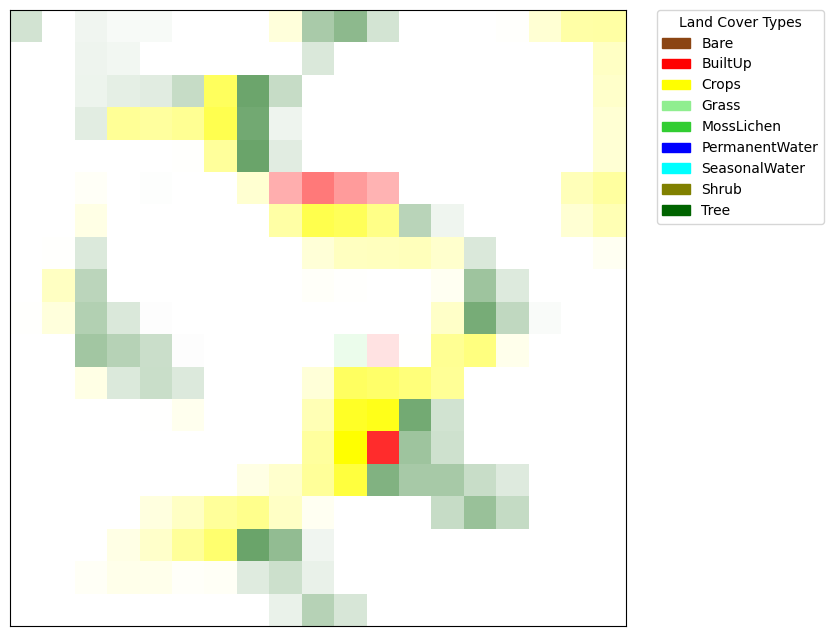

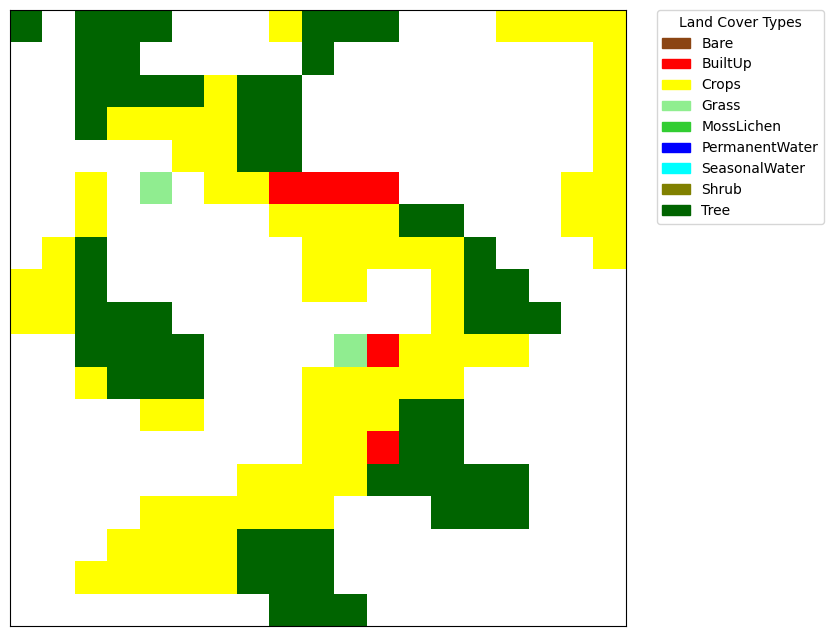

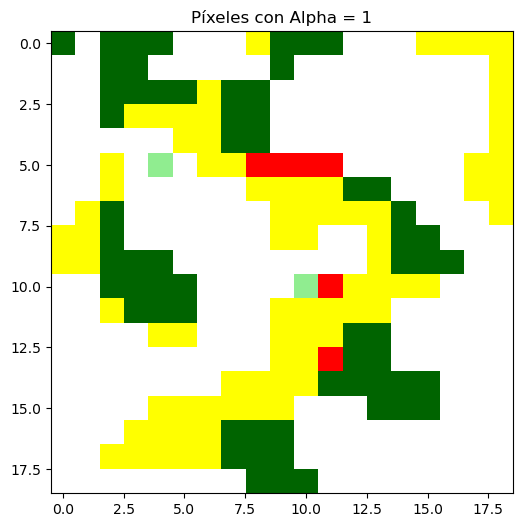

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.179912
1     0   1              0        0.000000
2     0   2              2        0.062628
3     0   3              2        0.031979
4     0   4              2        0.034343
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   132
1     1   0       Tree   132
2     2   0       Tree   132
3     3   0       Tree   132
4     4   0       Tree   132
..   ..  ..        ...   ...
356  14  18      Crops   132
357  15  18       Tree   132
358  16  18       Tree   132
359  17  18       Tree   132
360  18  18       Tree   132

[361 rows x 4 columns]
133


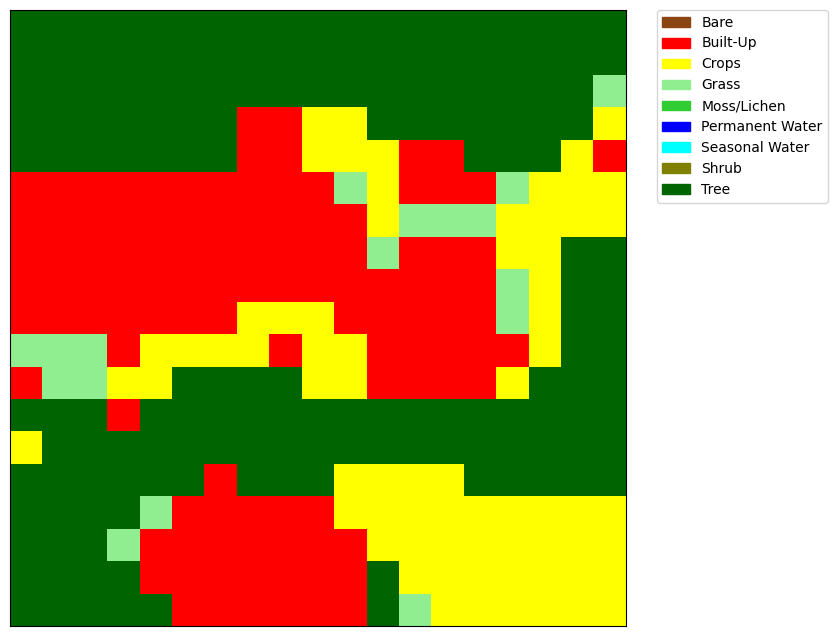

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


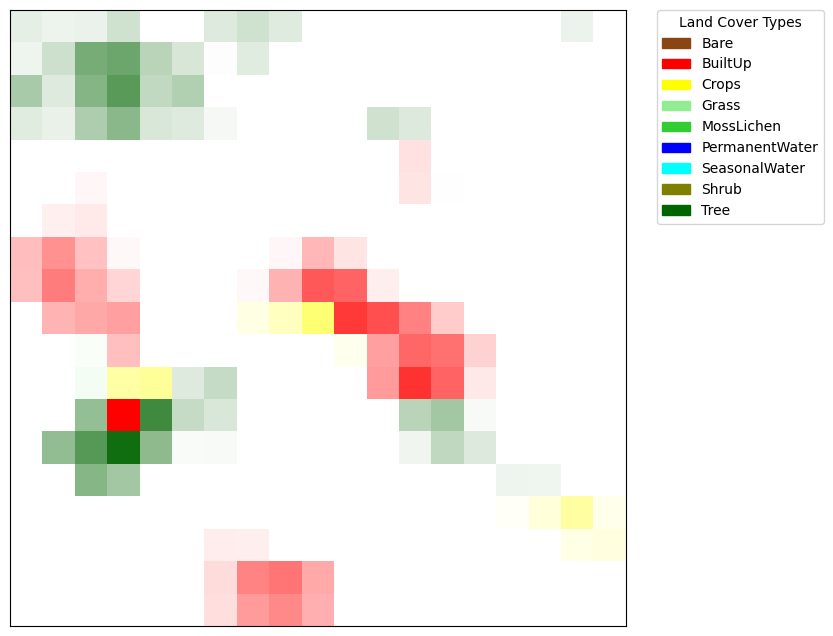

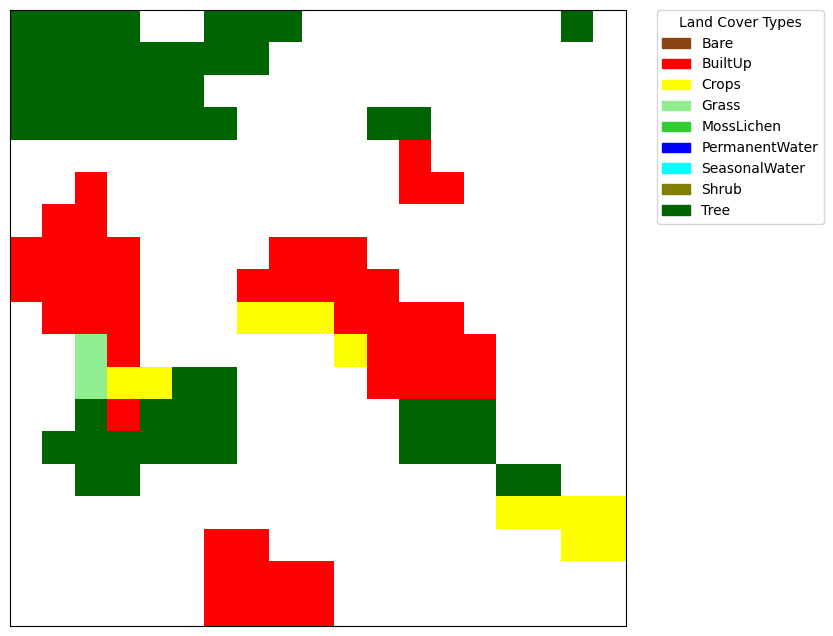

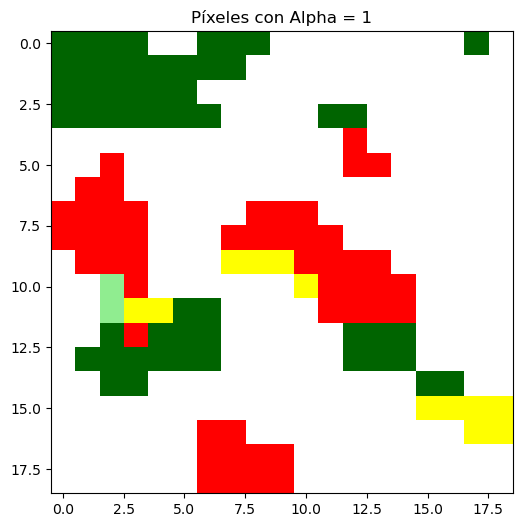

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.104643
1     0   1              1        0.073671
2     0   2              1        0.080091
3     0   3              1        0.189854
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   133
1     1   0       Tree   133
2     2   0       Tree   133
3     3   0       Tree   133
4     4   0       Tree   133
..   ..  ..        ...   ...
356  14  18      Crops   133
357  15  18      Crops   133
358  16  18      Crops   133
359  17  18      Crops   133
360  18  18      Crops   133

[361 rows x 4 columns]
134


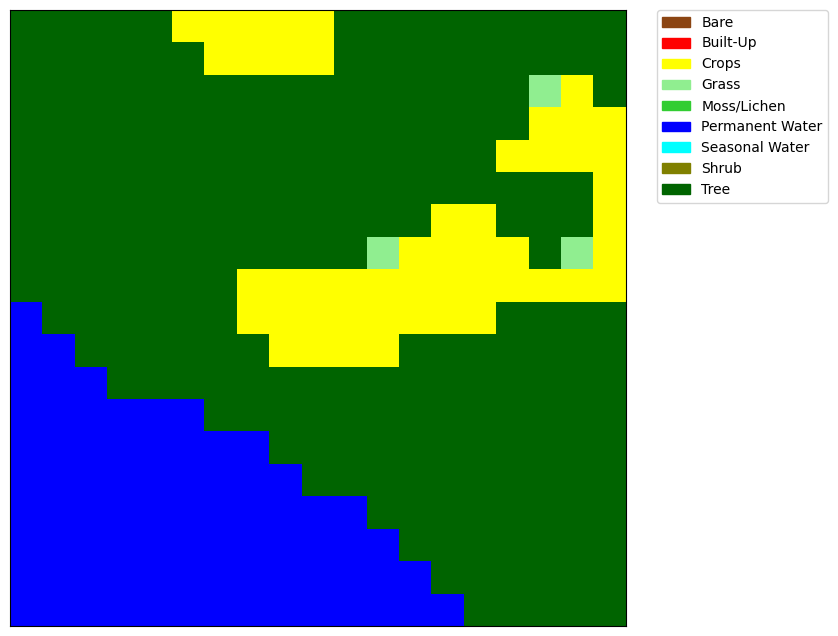

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


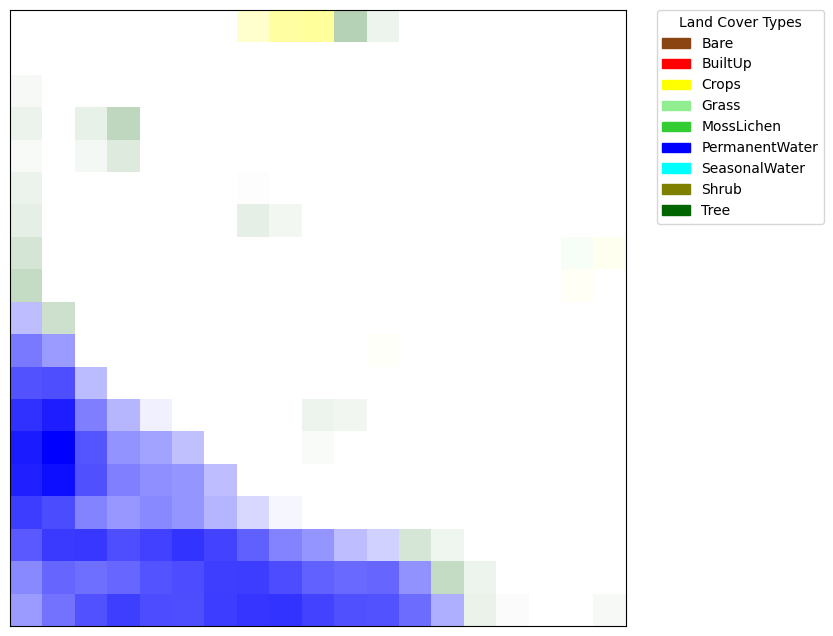

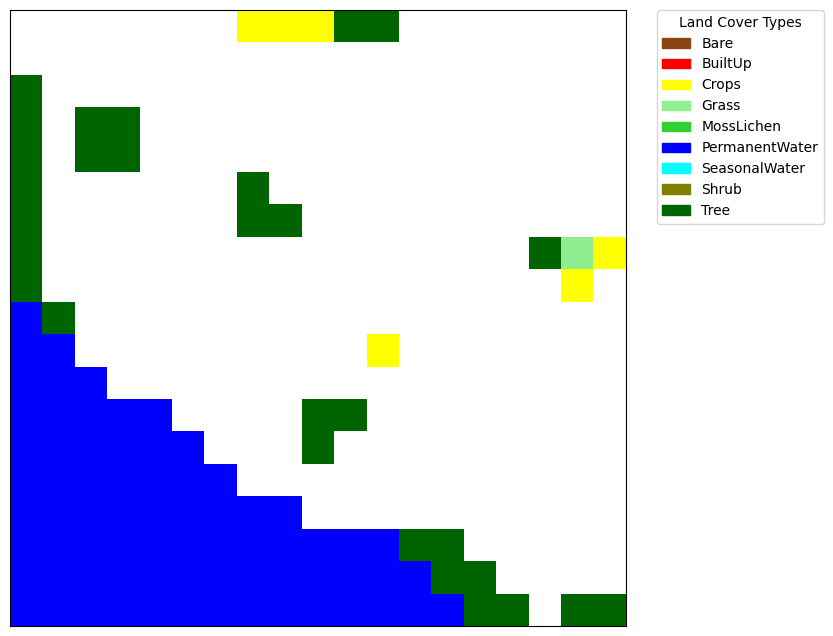

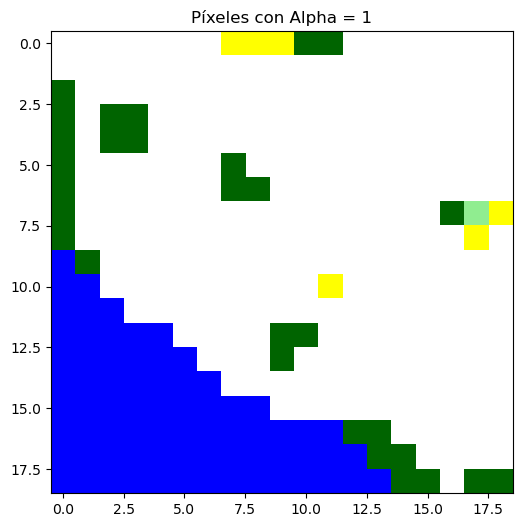

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              2        0.085354
357  18  15              2        0.021540
358  18  16              0        0.000000
359  18  17              8        0.000011
360  18  18              8        0.039086

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   134
1     1   0       Tree   134
2     2   0       Tree   134
3     3   0       Tree   134
4     4   0       Tree   134
..   ..  ..        ...   ...
356  14  18       Tree   134
357  15  18       Tree   134
358  16  18       Tree   134
359  17  18       Tree   134
360  18  18       Tree   134

[361 rows x 4 columns]
135


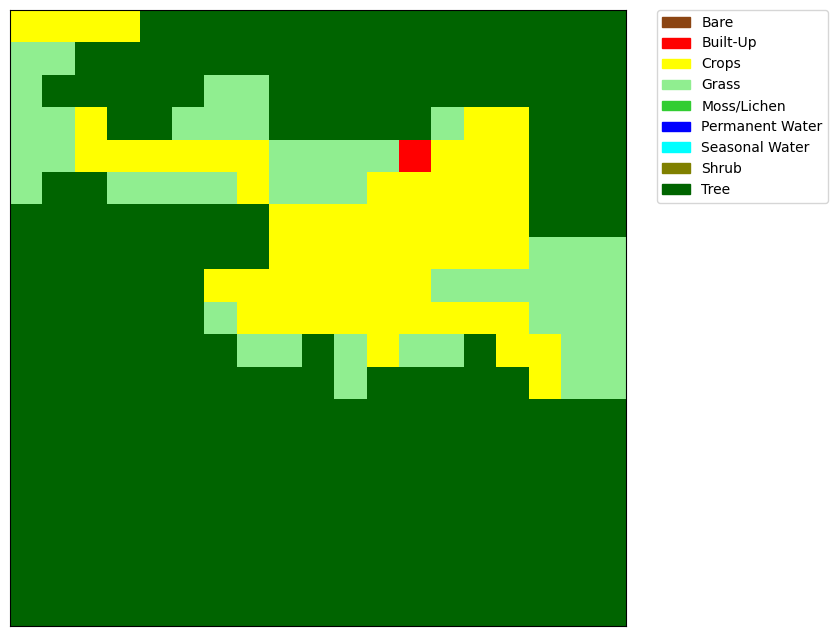

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


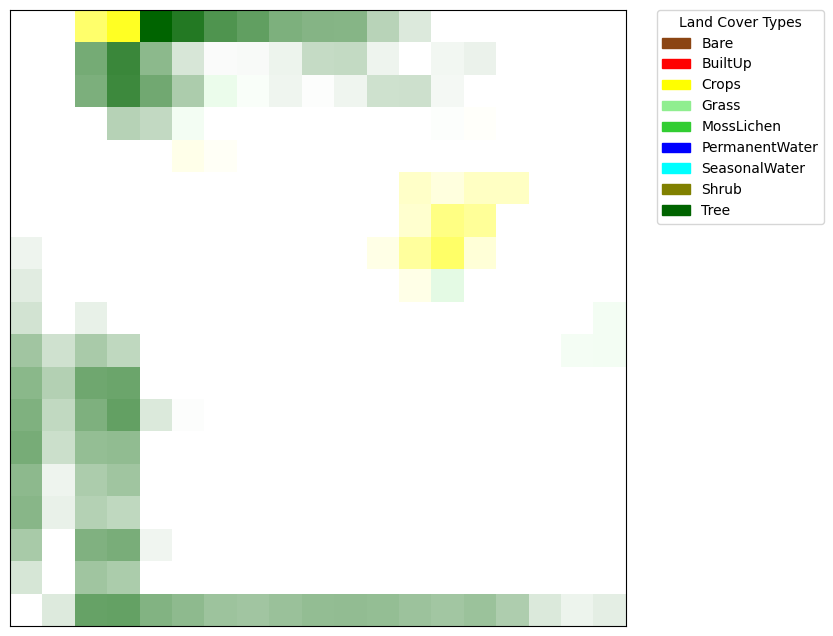

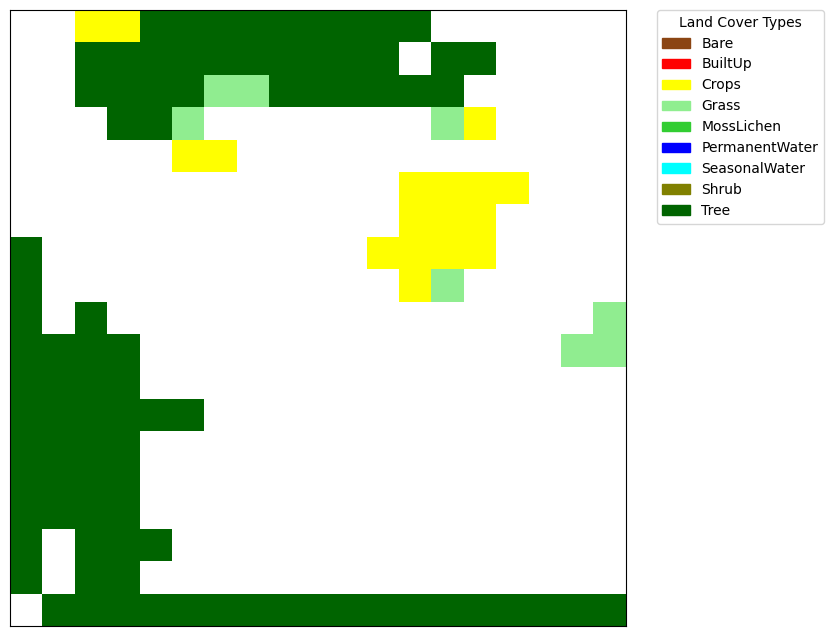

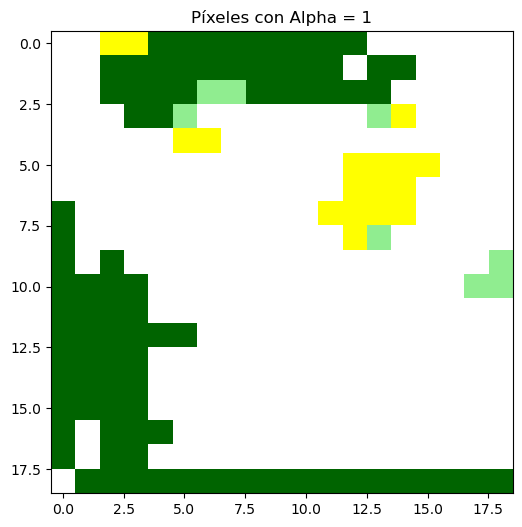

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.581740
3     0   3              1        0.865089
4     0   4              1        1.000000
..   ..  ..            ...             ...
356  18  14              3        0.394927
357  18  15              3        0.319914
358  18  16              3        0.144112
359  18  17              3        0.071405
360  18  18              3        0.106174

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   135
1     1   0      Crops   135
2     2   0      Crops   135
3     3   0      Crops   135
4     4   0       Tree   135
..   ..  ..        ...   ...
356  14  18       Tree   135
357  15  18       Tree   135
358  16  18       Tree   135
359  17  18       Tree   135
360  18  18       Tree   135

[361 rows x 4 columns]
136


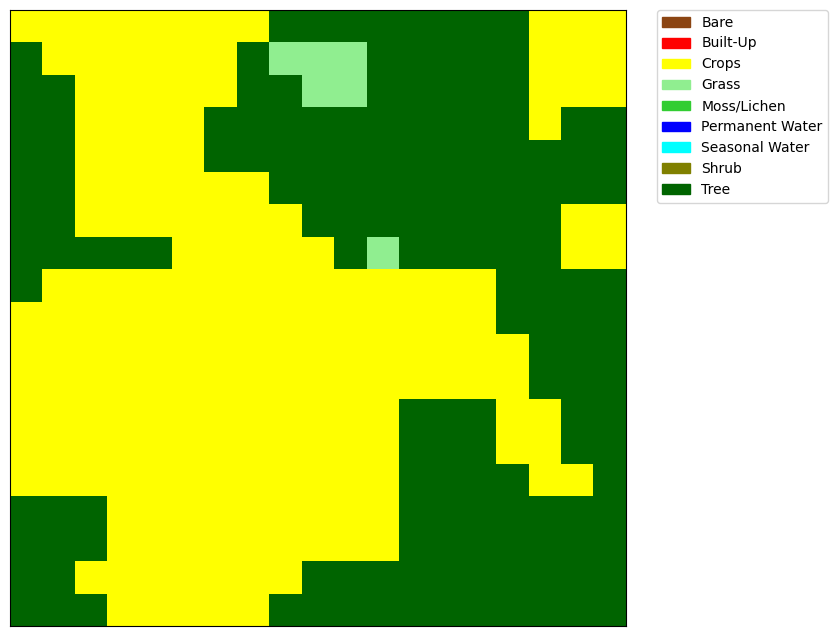

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


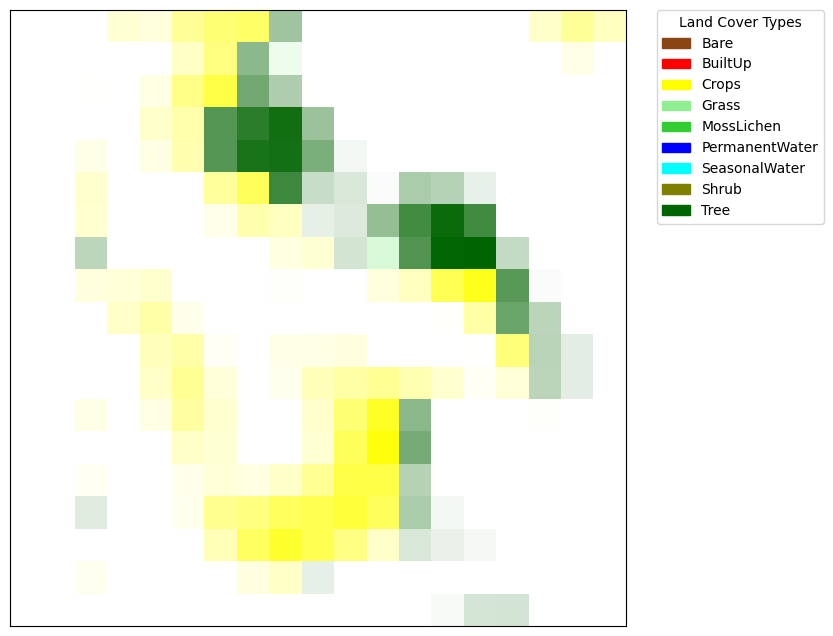

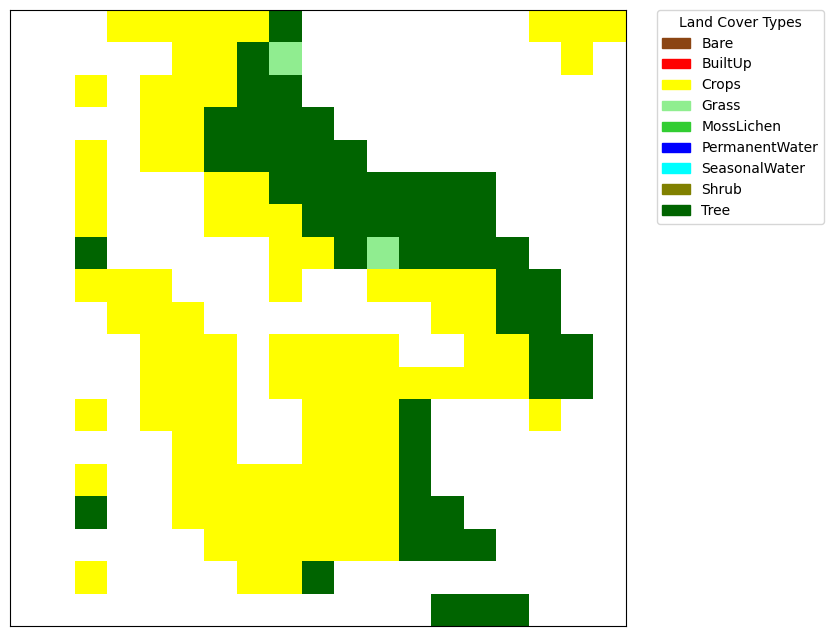

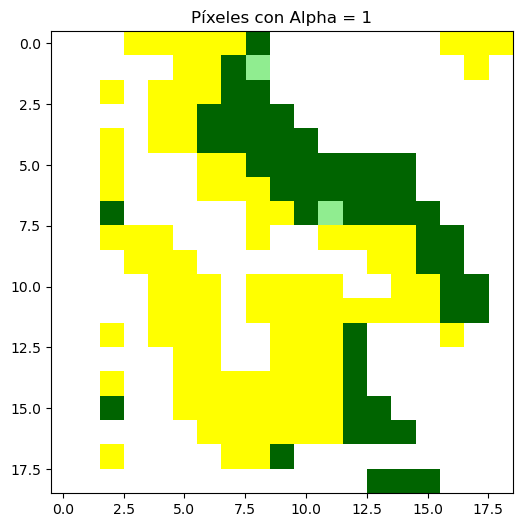

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.175120
4     0   4              1        0.141178
..   ..  ..            ...             ...
356  18  14              7        0.166486
357  18  15              7        0.169623
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   136
1     1   0      Crops   136
2     2   0      Crops   136
3     3   0      Crops   136
4     4   0      Crops   136
..   ..  ..        ...   ...
356  14  18       Tree   136
357  15  18       Tree   136
358  16  18       Tree   136
359  17  18       Tree   136
360  18  18       Tree   136

[361 rows x 4 columns]
137


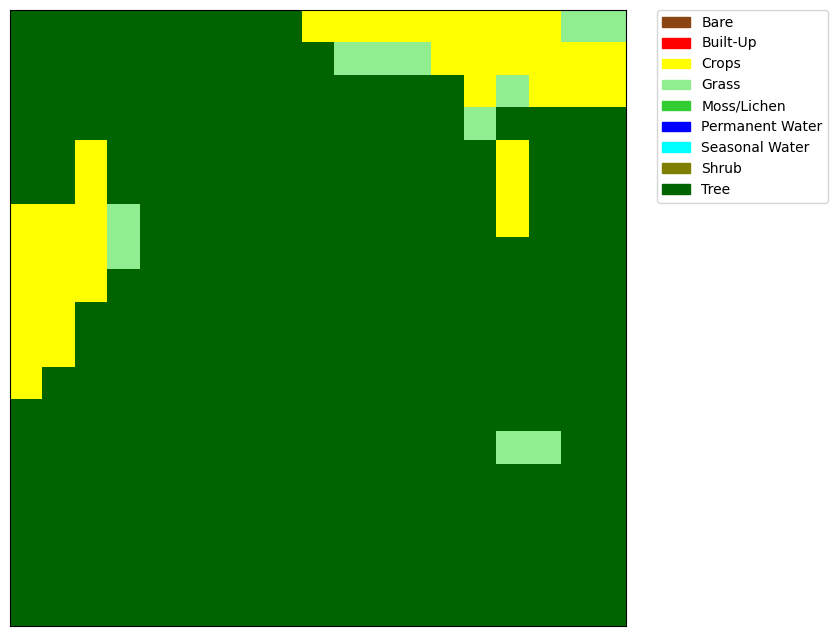

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


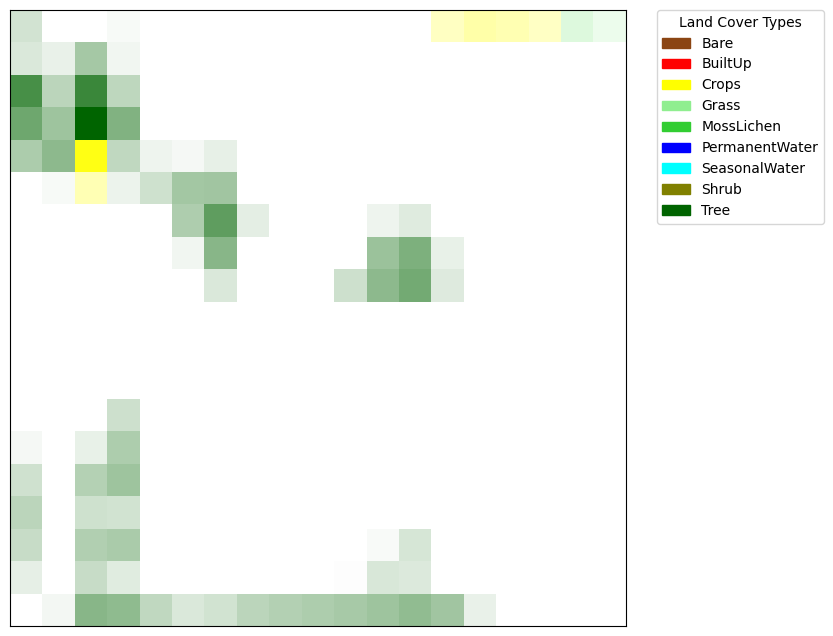

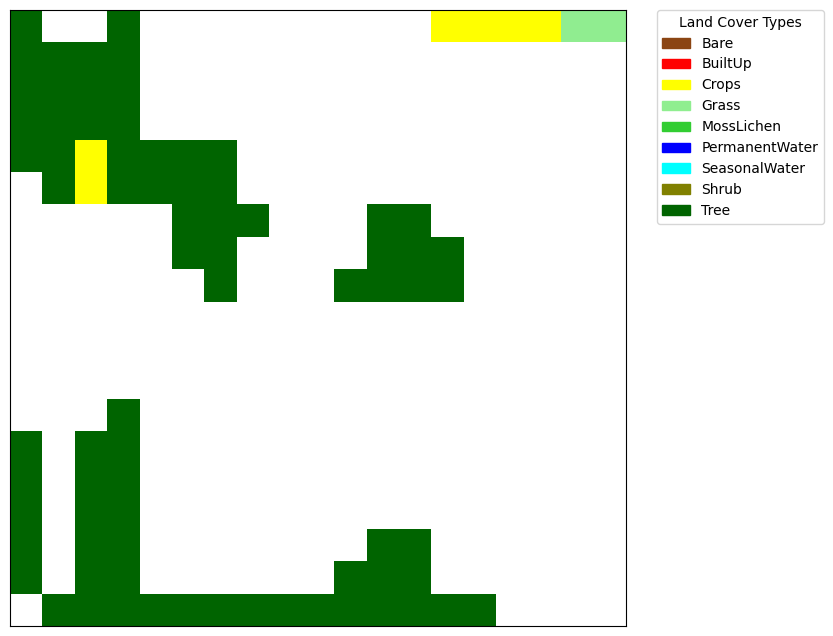

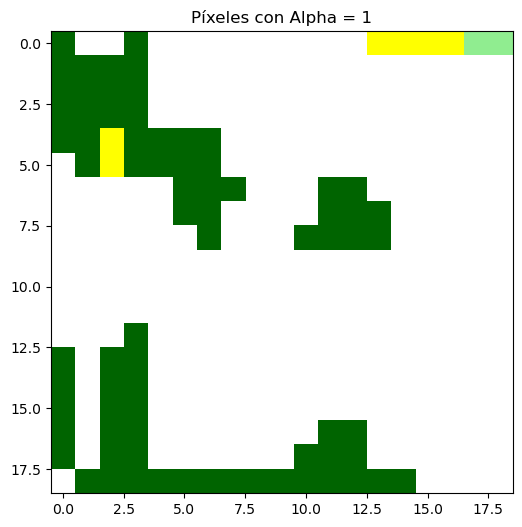

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.177083
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.033050
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              4        0.089425
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   137
1     1   0       Tree   137
2     2   0       Tree   137
3     3   0       Tree   137
4     4   0       Tree   137
..   ..  ..        ...   ...
356  14  18       Tree   137
357  15  18       Tree   137
358  16  18       Tree   137
359  17  18       Tree   137
360  18  18       Tree   137

[361 rows x 4 columns]
138


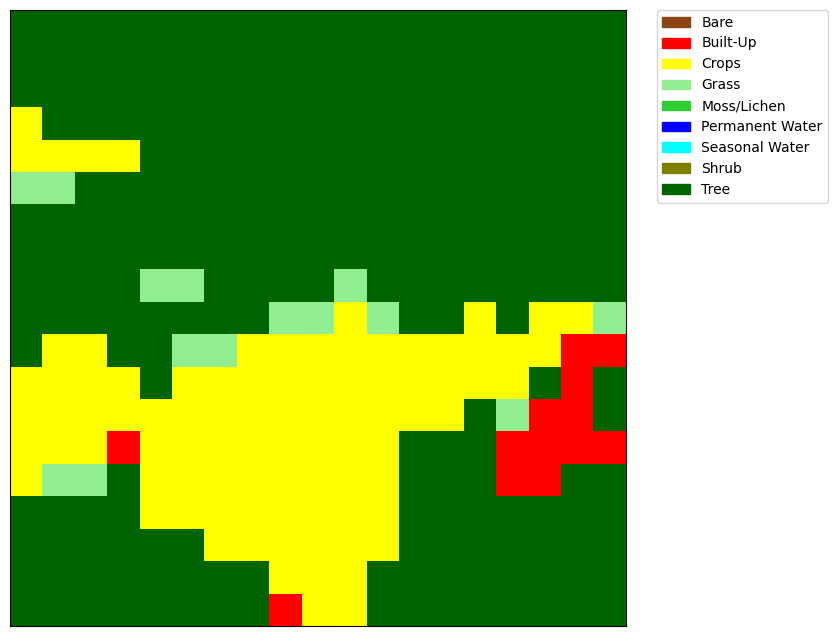

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


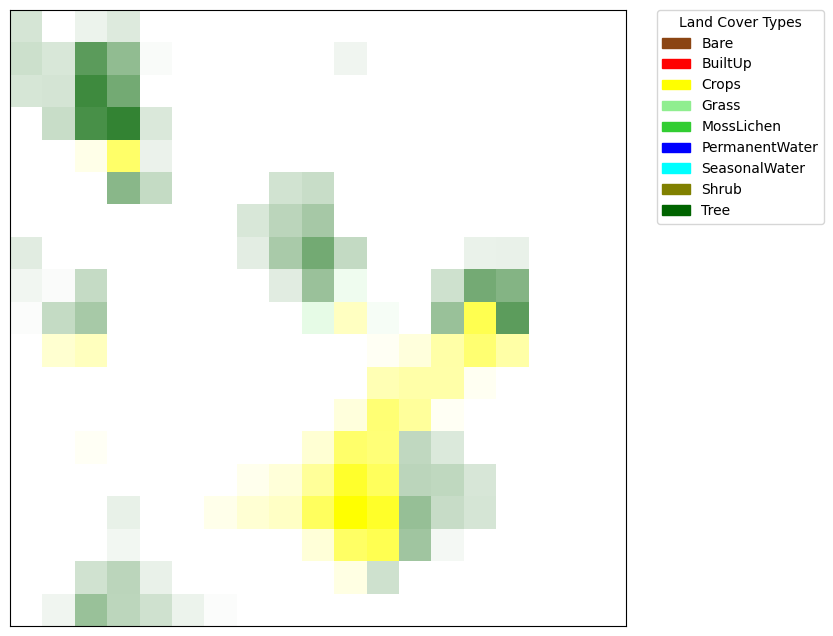

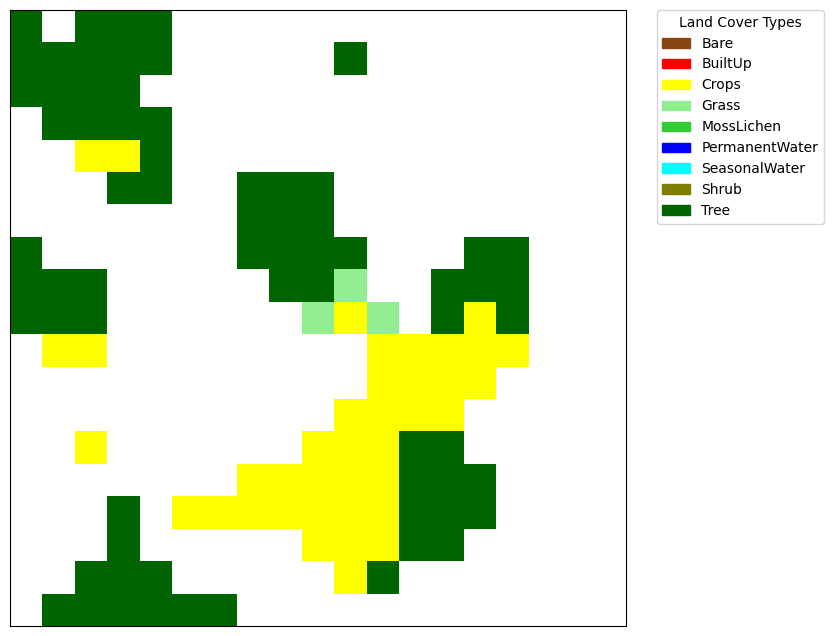

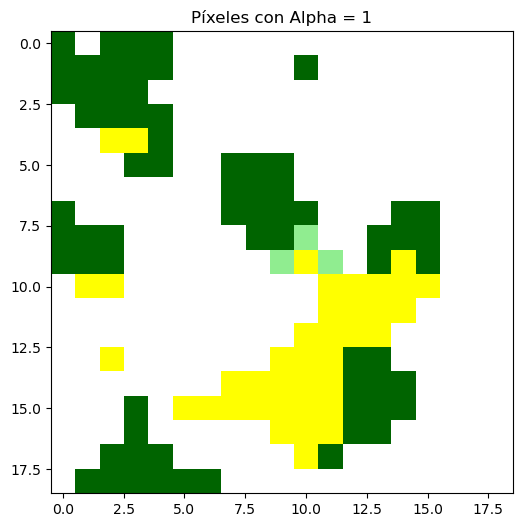

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.164888
1     0   1              0        0.000000
2     0   2              1        0.076168
3     0   3              1        0.134622
4     0   4              1        0.003273
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   138
1     1   0       Tree   138
2     2   0       Tree   138
3     3   0       Tree   138
4     4   0       Tree   138
..   ..  ..        ...   ...
356  14  18       Tree   138
357  15  18       Tree   138
358  16  18       Tree   138
359  17  18       Tree   138
360  18  18       Tree   138

[361 rows x 4 columns]
139


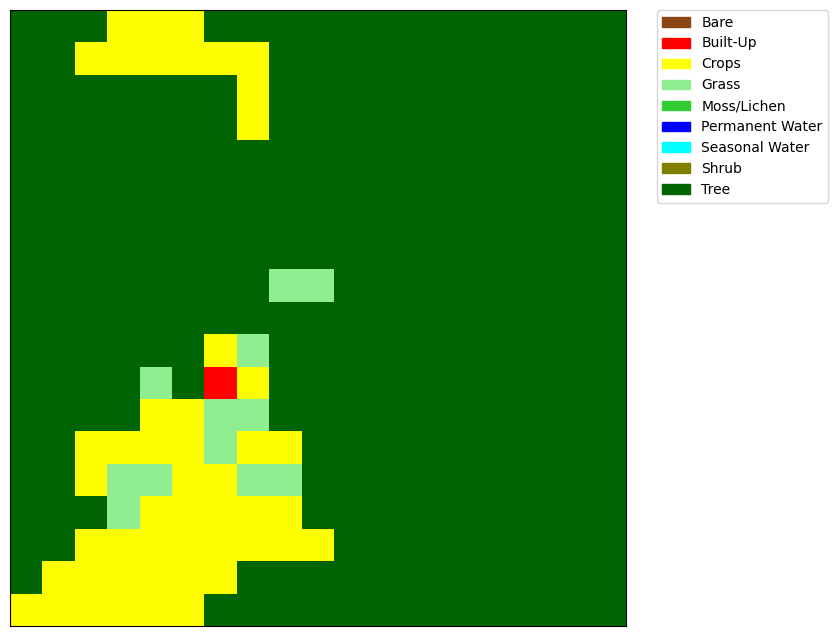

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


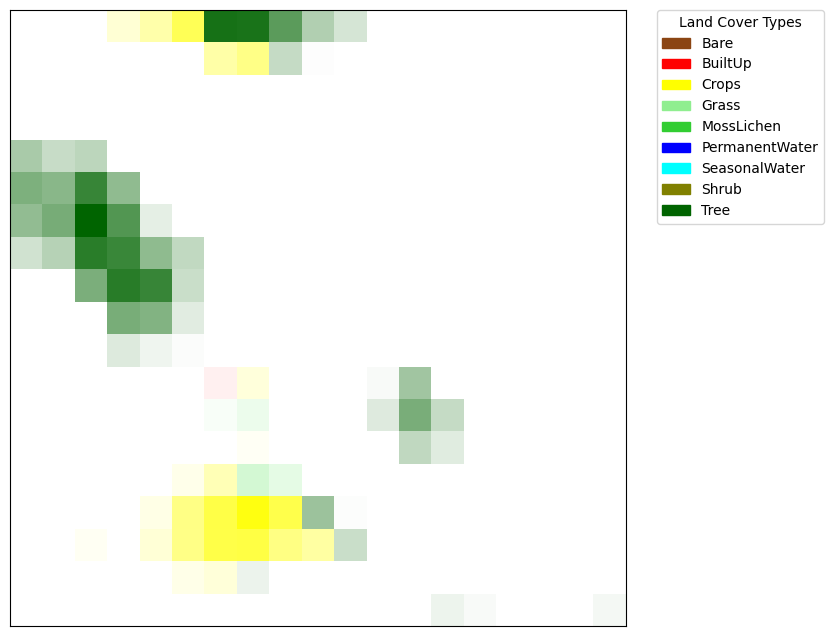

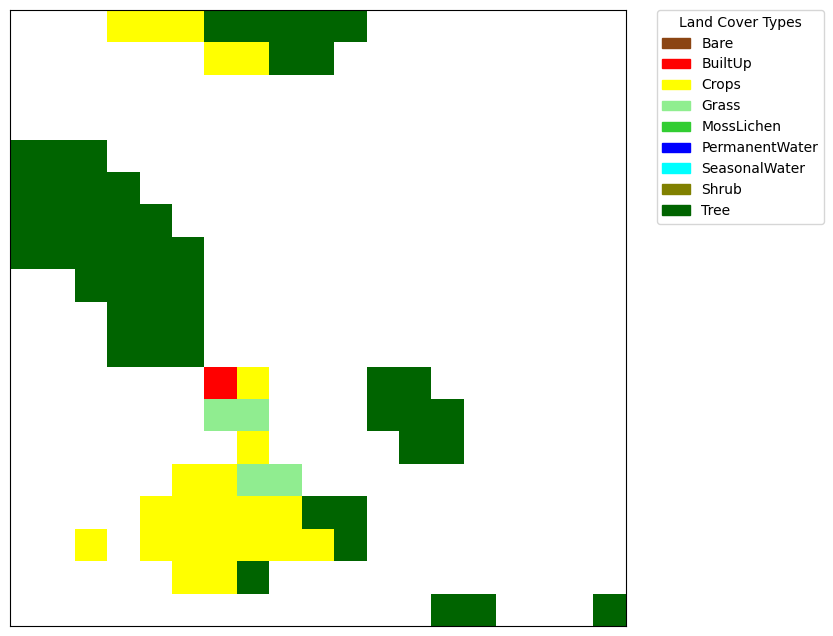

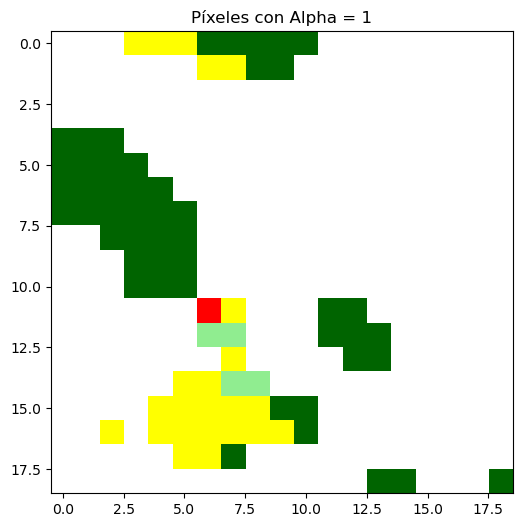

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.171997
4     0   4              1        0.335509
..   ..  ..            ...             ...
356  18  14              5        0.029607
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              6        0.043803

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   139
1     1   0       Tree   139
2     2   0       Tree   139
3     3   0      Crops   139
4     4   0      Crops   139
..   ..  ..        ...   ...
356  14  18       Tree   139
357  15  18       Tree   139
358  16  18       Tree   139
359  17  18       Tree   139
360  18  18       Tree   139

[361 rows x 4 columns]
140


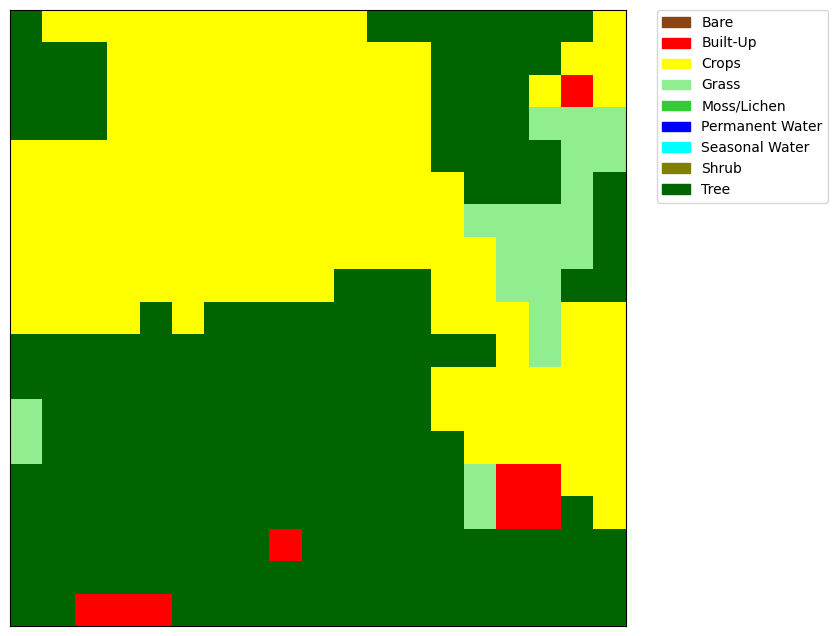

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


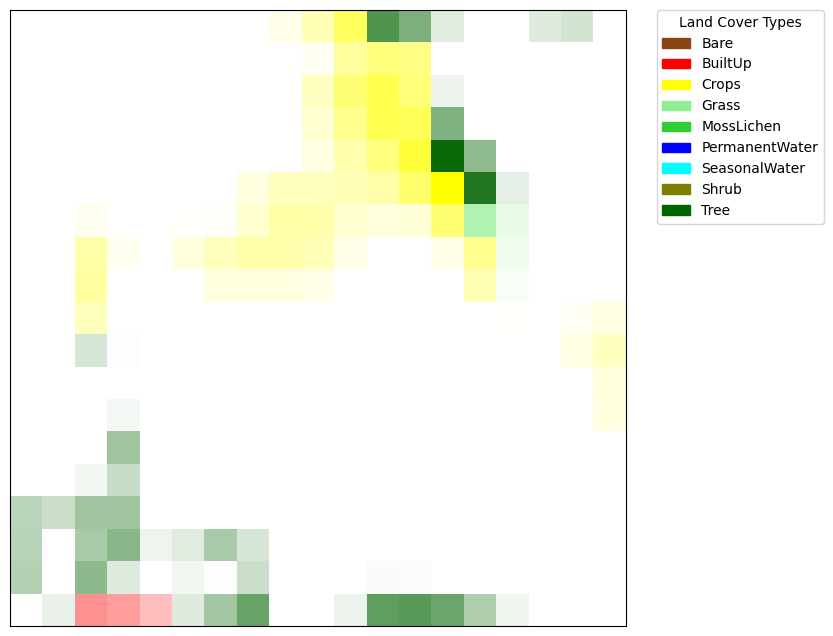

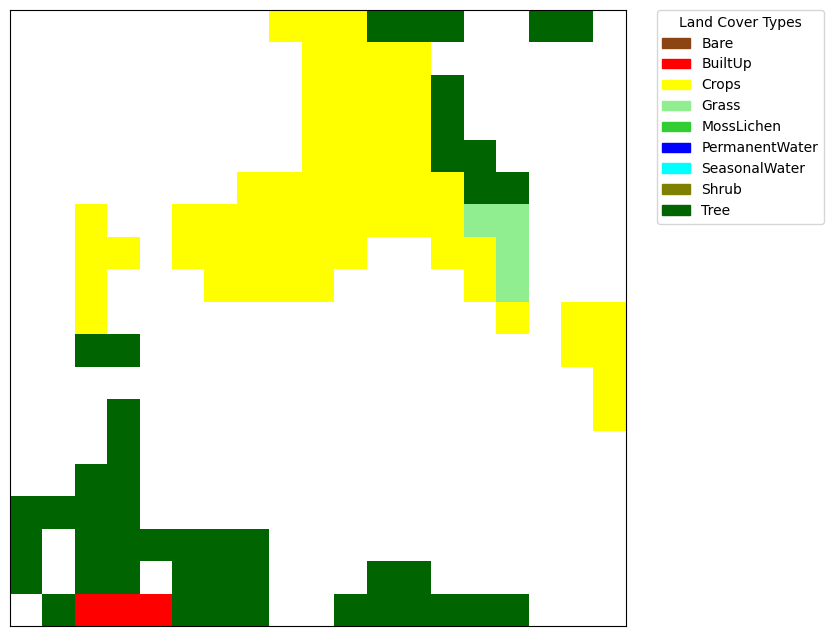

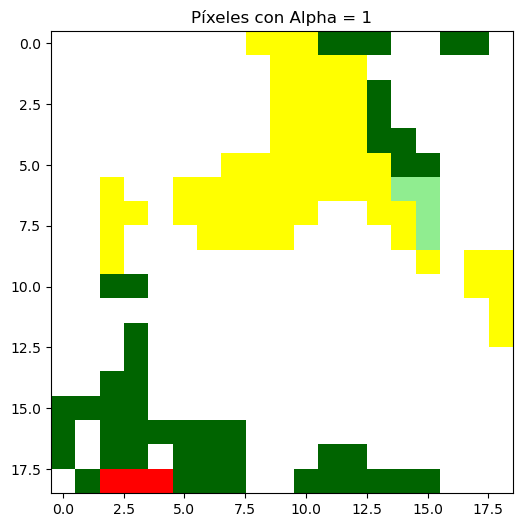

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              6        0.321727
357  18  15              6        0.060060
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   140
1     1   0      Crops   140
2     2   0      Crops   140
3     3   0      Crops   140
4     4   0      Crops   140
..   ..  ..        ...   ...
356  14  18       Tree   140
357  15  18       Tree   140
358  16  18       Tree   140
359  17  18       Tree   140
360  18  18       Tree   140

[361 rows x 4 columns]
141


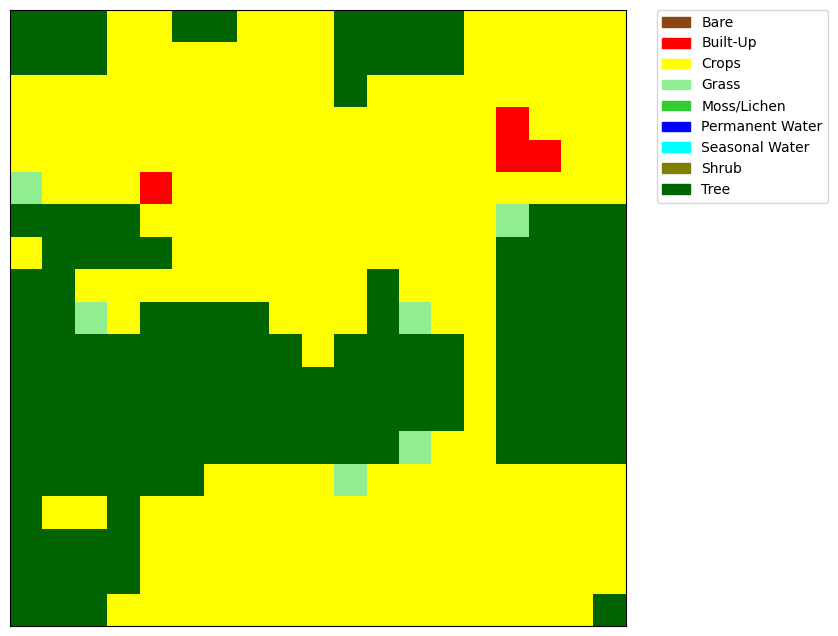

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


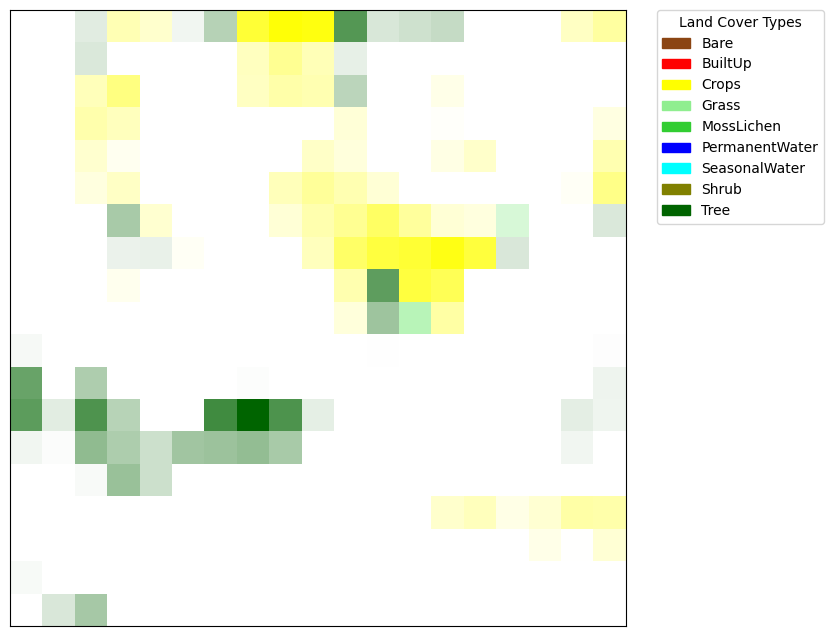

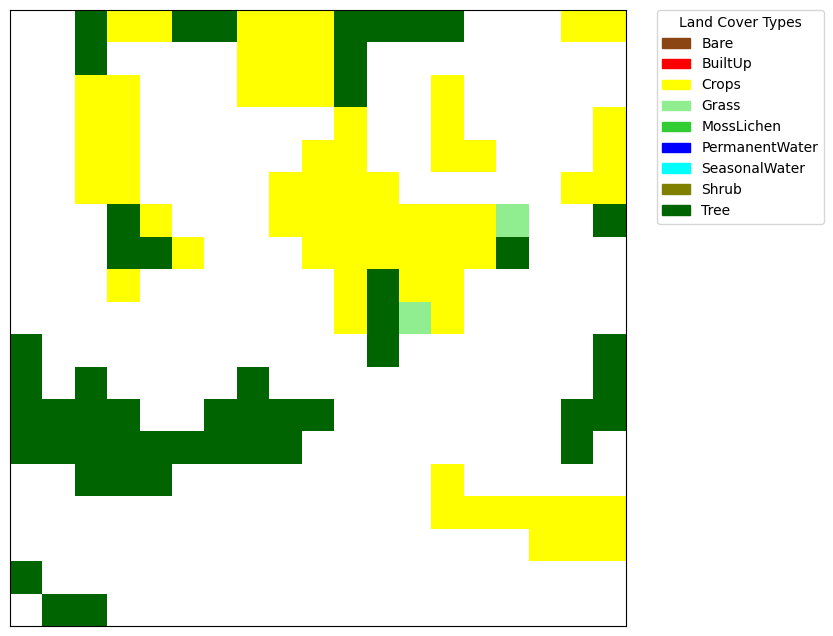

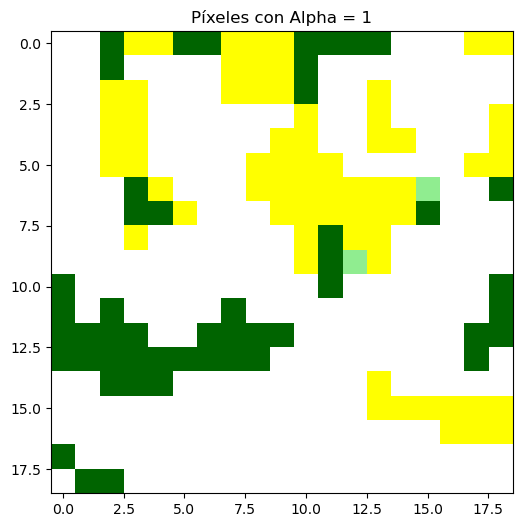

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.120391
3     0   3              1        0.297394
4     0   4              1        0.196083
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   141
1     1   0       Tree   141
2     2   0       Tree   141
3     3   0      Crops   141
4     4   0      Crops   141
..   ..  ..        ...   ...
356  14  18      Crops   141
357  15  18      Crops   141
358  16  18      Crops   141
359  17  18      Crops   141
360  18  18       Tree   141

[361 rows x 4 columns]
142


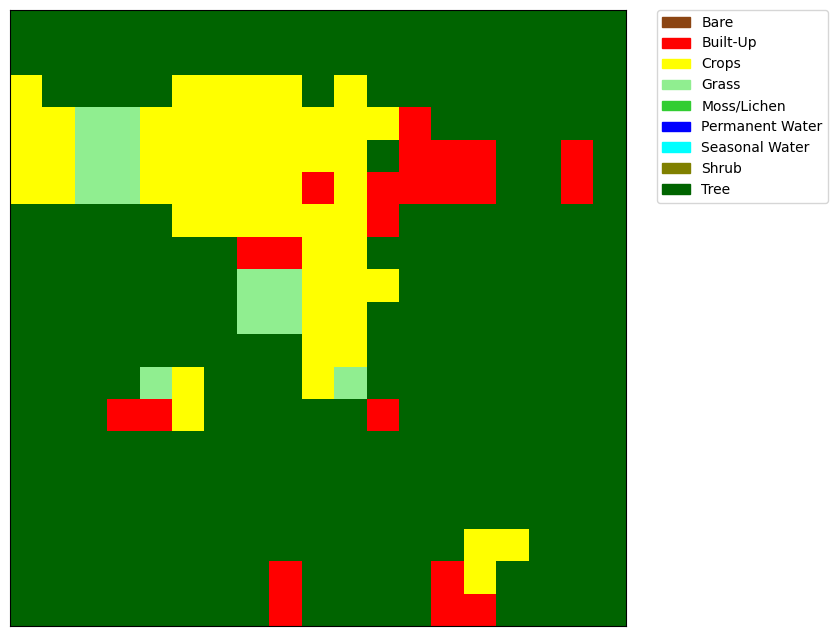

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


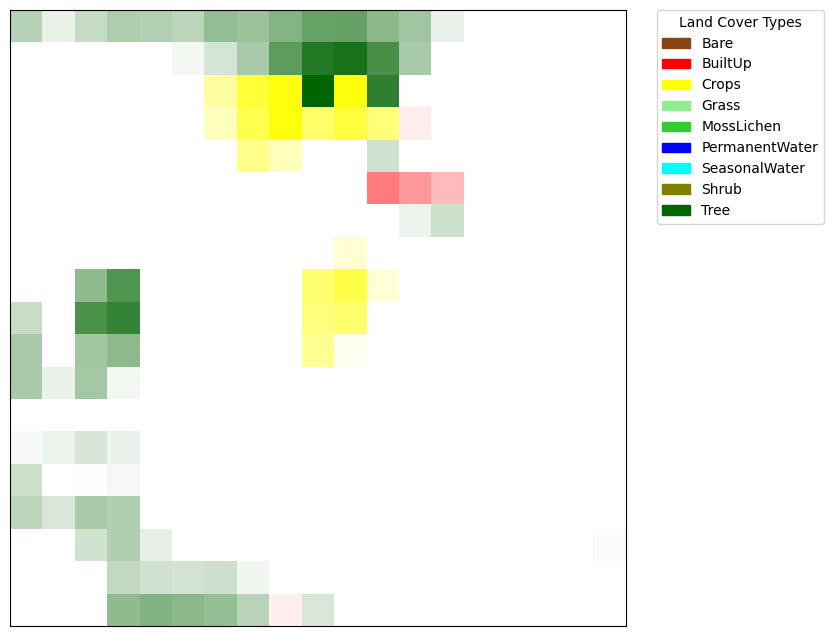

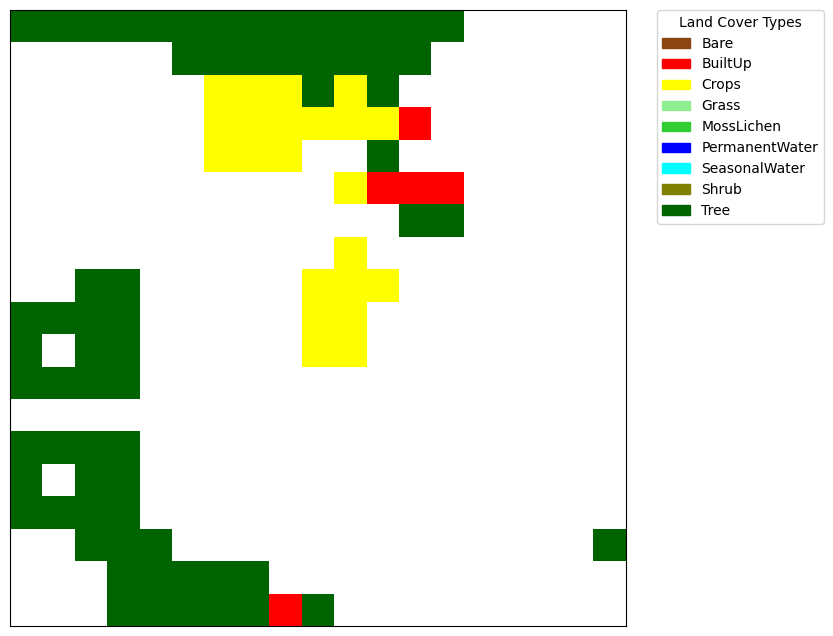

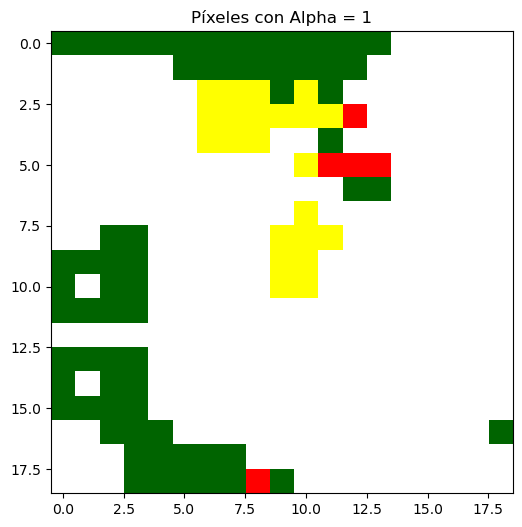

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.288573
1     0   1              1        0.089469
2     0   2              1        0.227318
3     0   3              1        0.322114
4     0   4              1        0.307774
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   142
1     1   0       Tree   142
2     2   0       Tree   142
3     3   0       Tree   142
4     4   0       Tree   142
..   ..  ..        ...   ...
356  14  18   Built-Up   142
357  15  18       Tree   142
358  16  18       Tree   142
359  17  18       Tree   142
360  18  18       Tree   142

[361 rows x 4 columns]
143


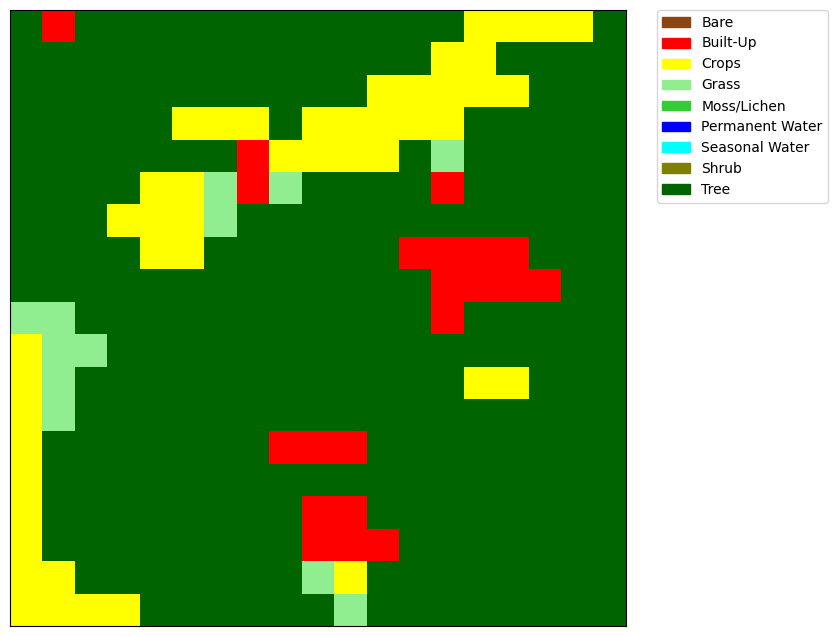

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


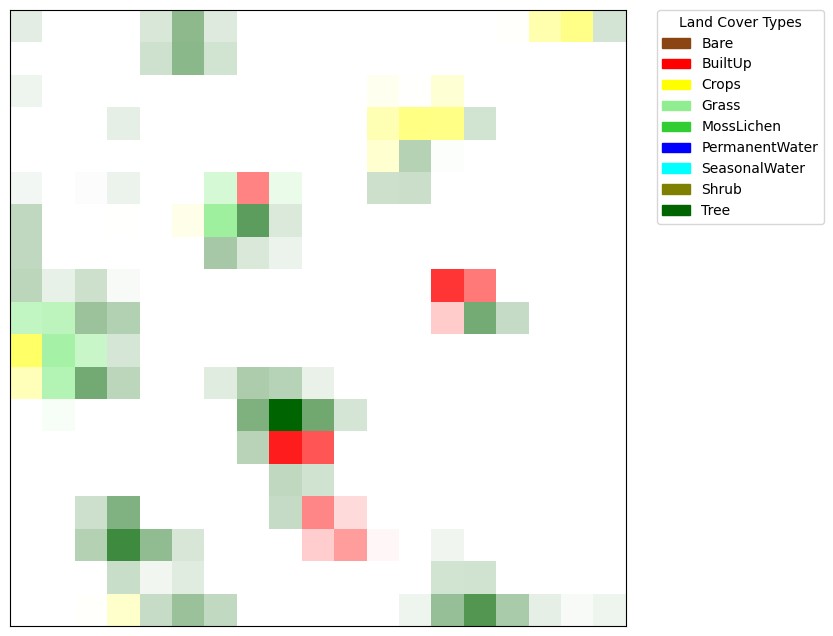

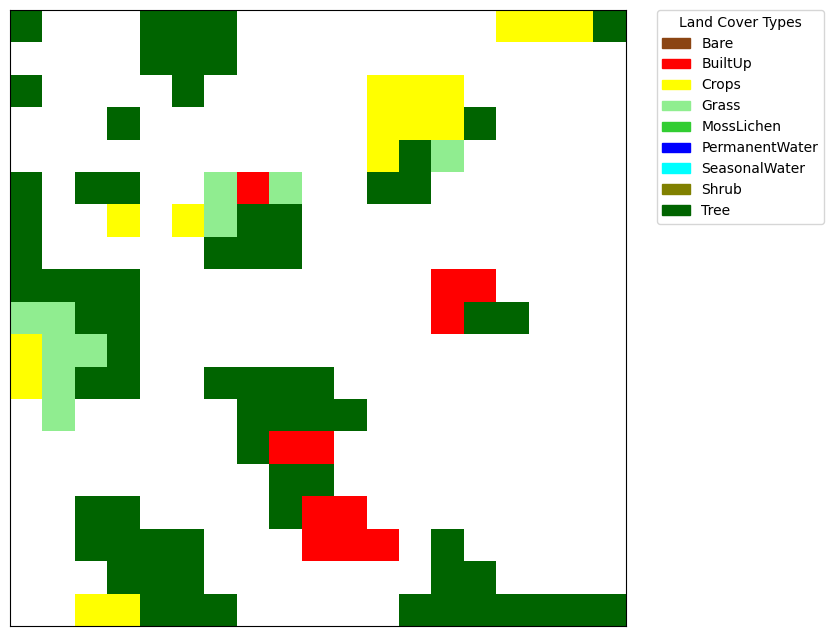

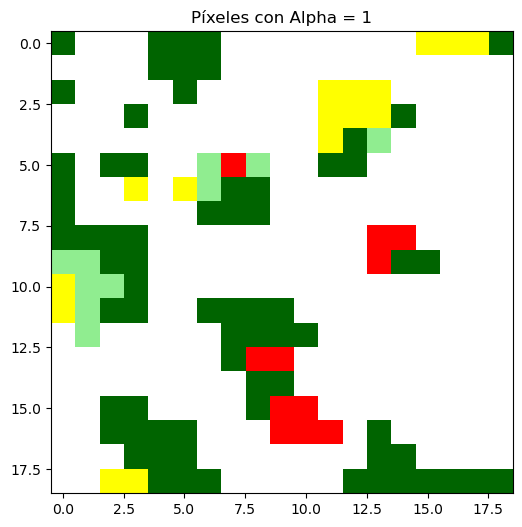

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.112047
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              2        0.154288
..   ..  ..            ...             ...
356  18  14             13        0.680814
357  18  15             13        0.337173
358  18  16             13        0.104089
359  18  17             13        0.034691
360  18  18             13        0.068479

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   143
1     1   0   Built-Up   143
2     2   0       Tree   143
3     3   0       Tree   143
4     4   0       Tree   143
..   ..  ..        ...   ...
356  14  18       Tree   143
357  15  18       Tree   143
358  16  18       Tree   143
359  17  18       Tree   143
360  18  18       Tree   143

[361 rows x 4 columns]
144


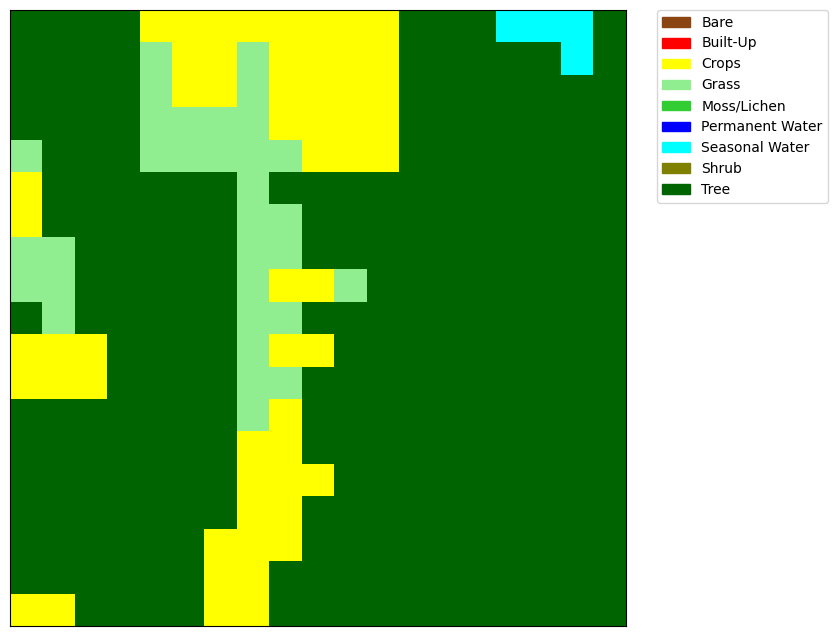

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


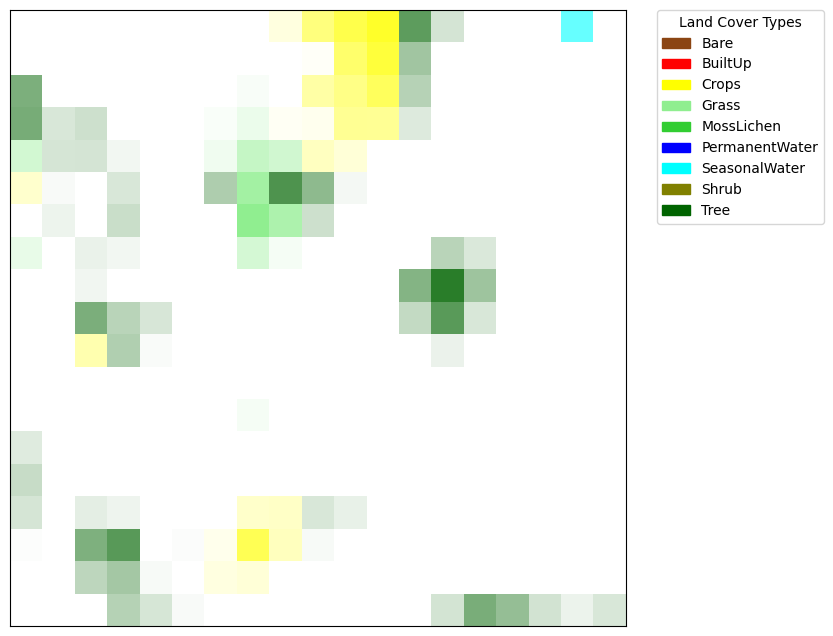

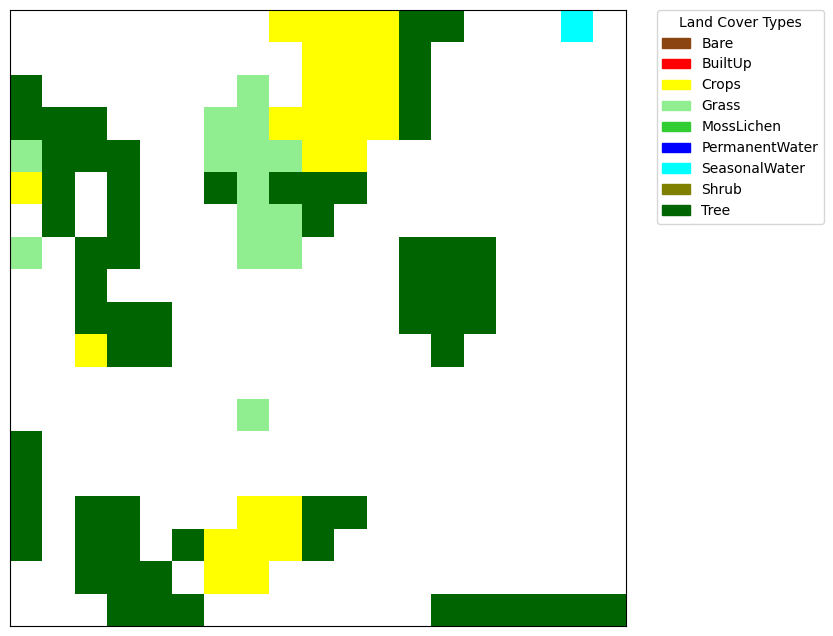

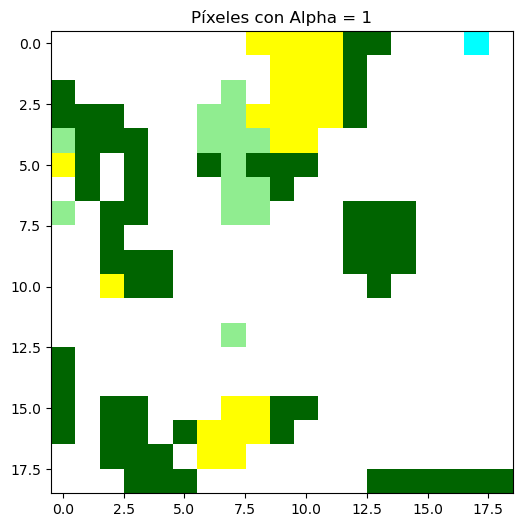

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              8        0.525589
357  18  15              8        0.419106
358  18  16              8        0.178338
359  18  17              8        0.076441
360  18  18              8        0.154211

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   144
1     1   0       Tree   144
2     2   0       Tree   144
3     3   0       Tree   144
4     4   0      Crops   144
..   ..  ..        ...   ...
356  14  18       Tree   144
357  15  18       Tree   144
358  16  18       Tree   144
359  17  18       Tree   144
360  18  18       Tree   144

[361 rows x 4 columns]
145


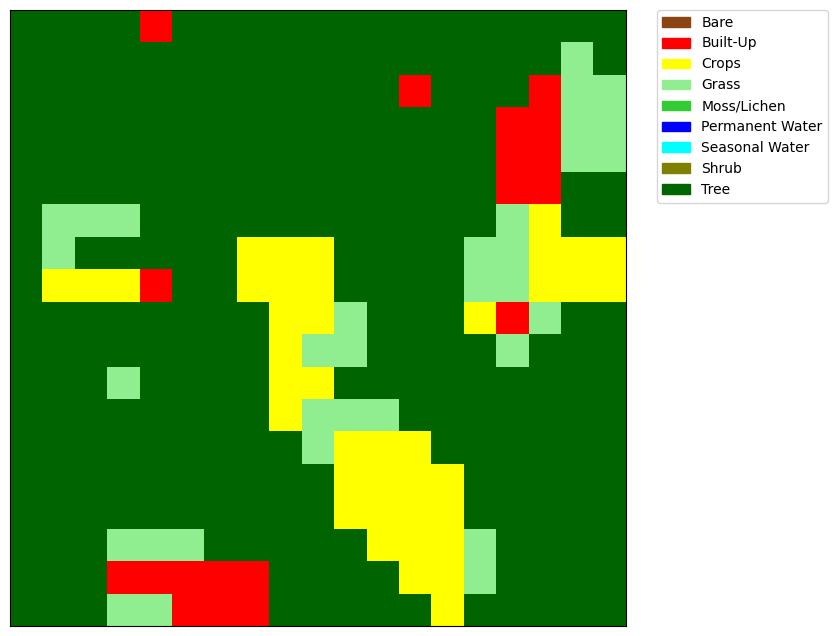

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


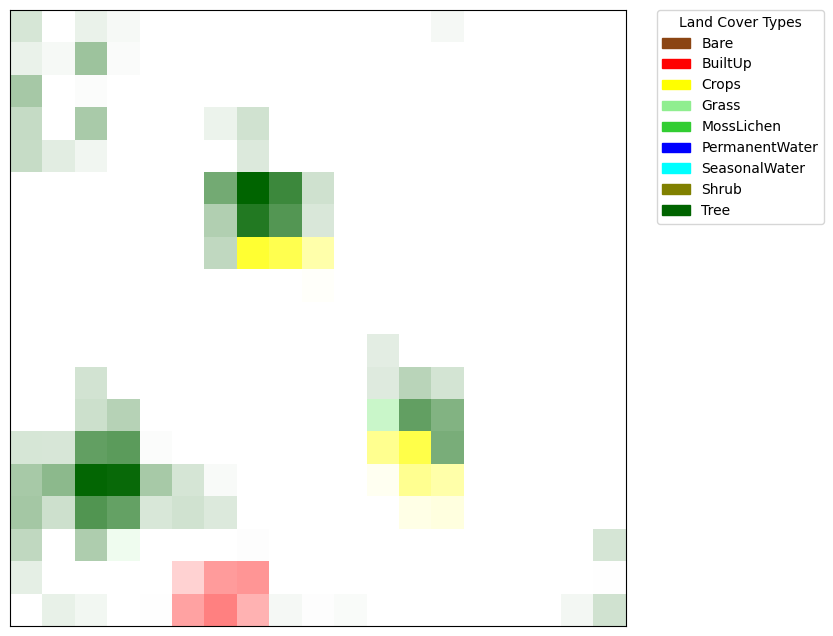

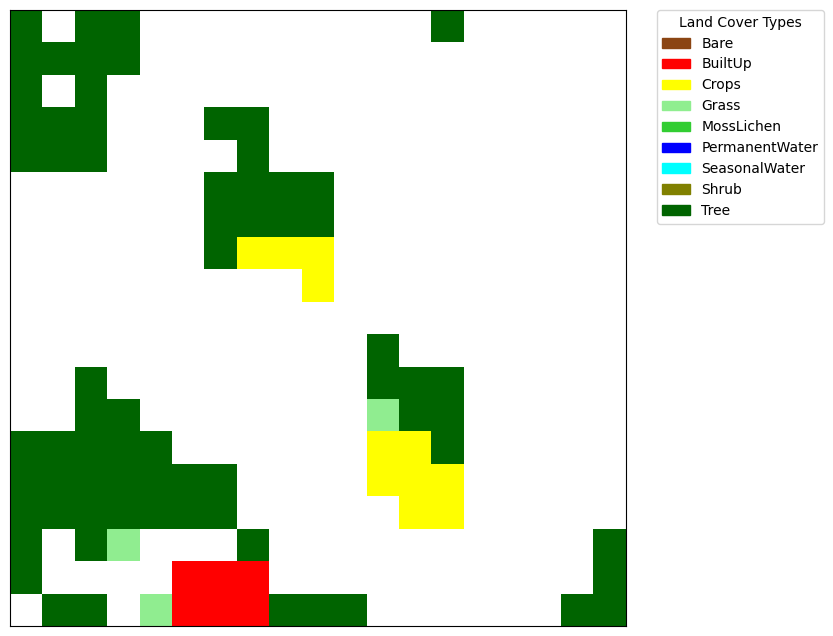

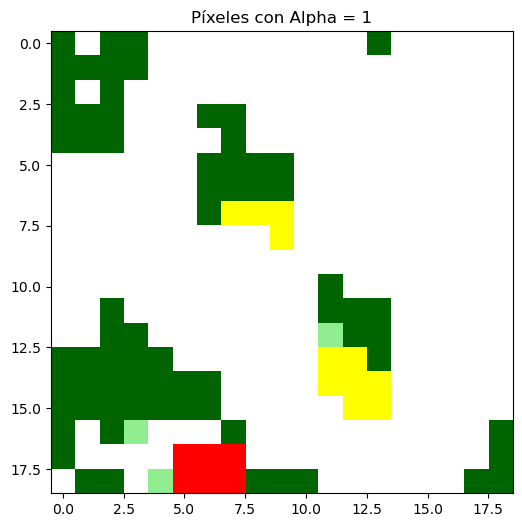

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.160875
1     0   1              0        0.000000
2     0   2              1        0.083526
3     0   3              1        0.036859
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              6        0.049864
360  18  18              6        0.187975

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   145
1     1   0       Tree   145
2     2   0       Tree   145
3     3   0       Tree   145
4     4   0   Built-Up   145
..   ..  ..        ...   ...
356  14  18       Tree   145
357  15  18       Tree   145
358  16  18       Tree   145
359  17  18       Tree   145
360  18  18       Tree   145

[361 rows x 4 columns]
146


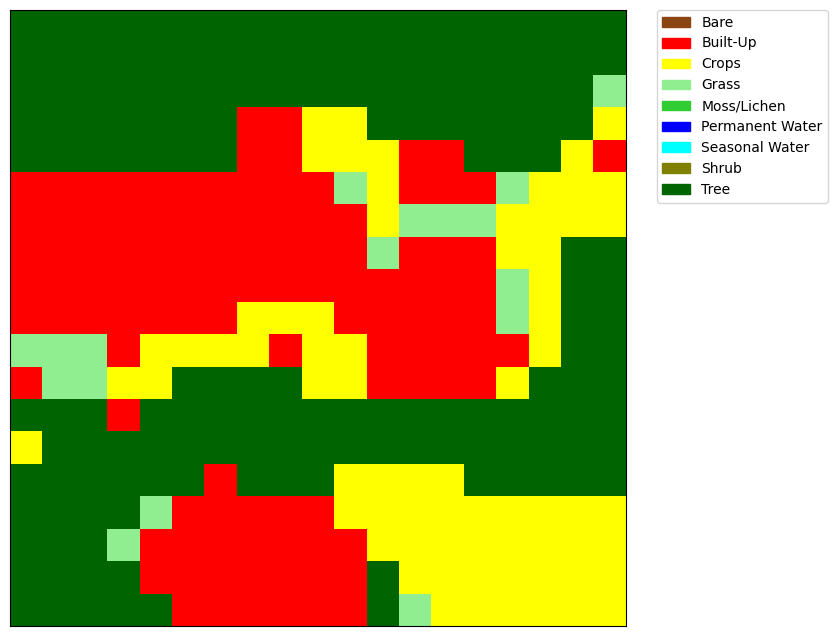

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


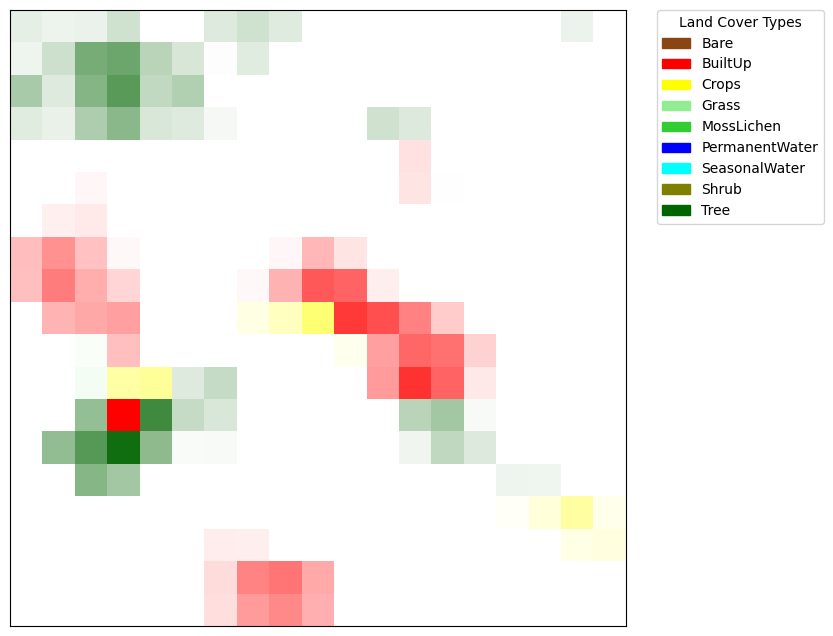

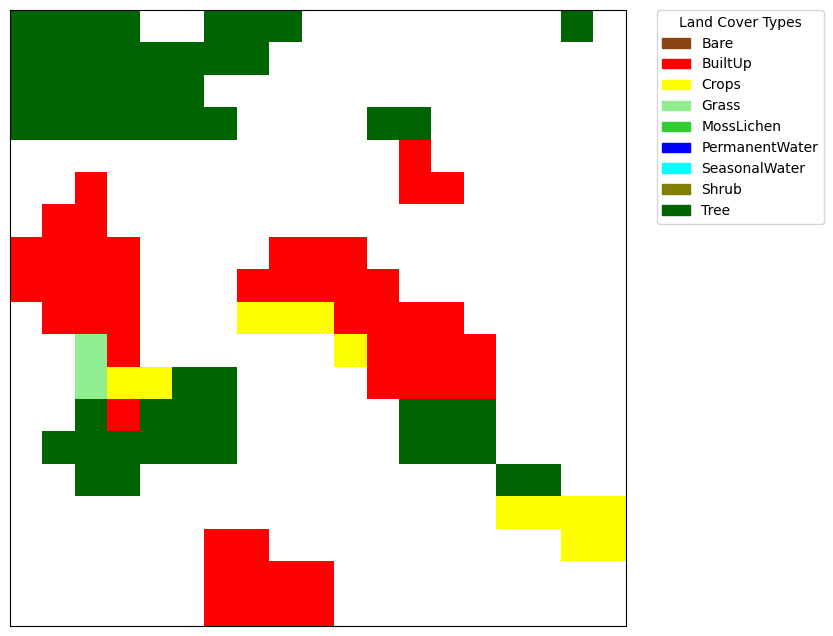

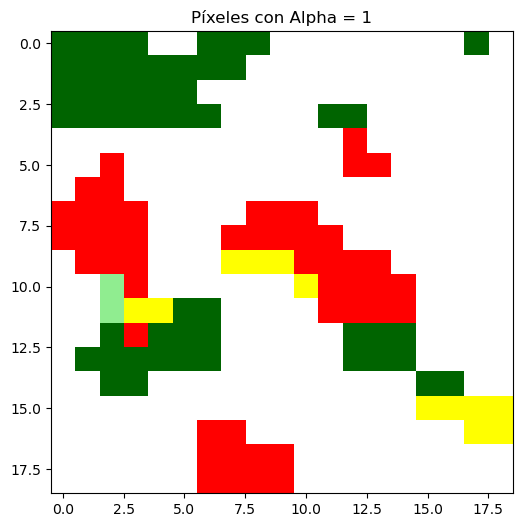

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.104643
1     0   1              1        0.073671
2     0   2              1        0.080091
3     0   3              1        0.189854
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   146
1     1   0       Tree   146
2     2   0       Tree   146
3     3   0       Tree   146
4     4   0       Tree   146
..   ..  ..        ...   ...
356  14  18      Crops   146
357  15  18      Crops   146
358  16  18      Crops   146
359  17  18      Crops   146
360  18  18      Crops   146

[361 rows x 4 columns]
147


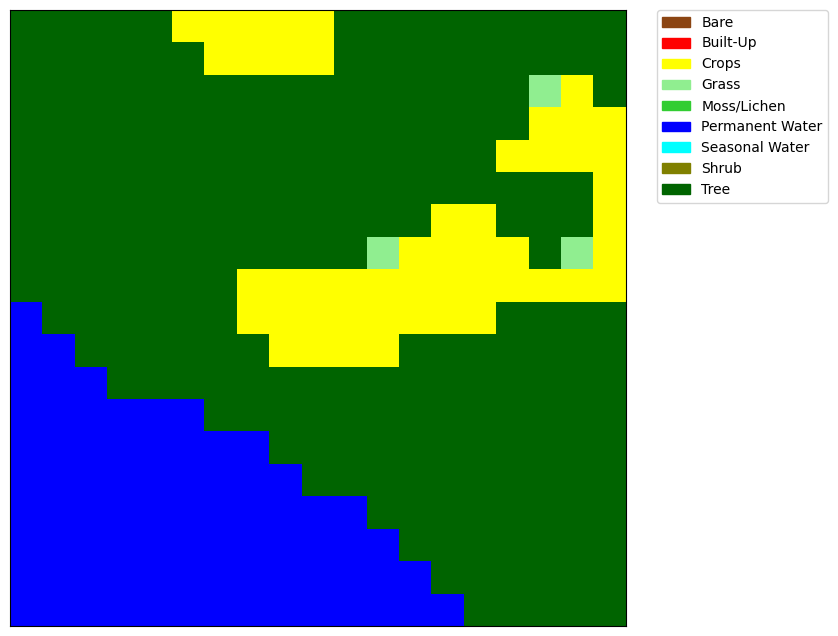

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


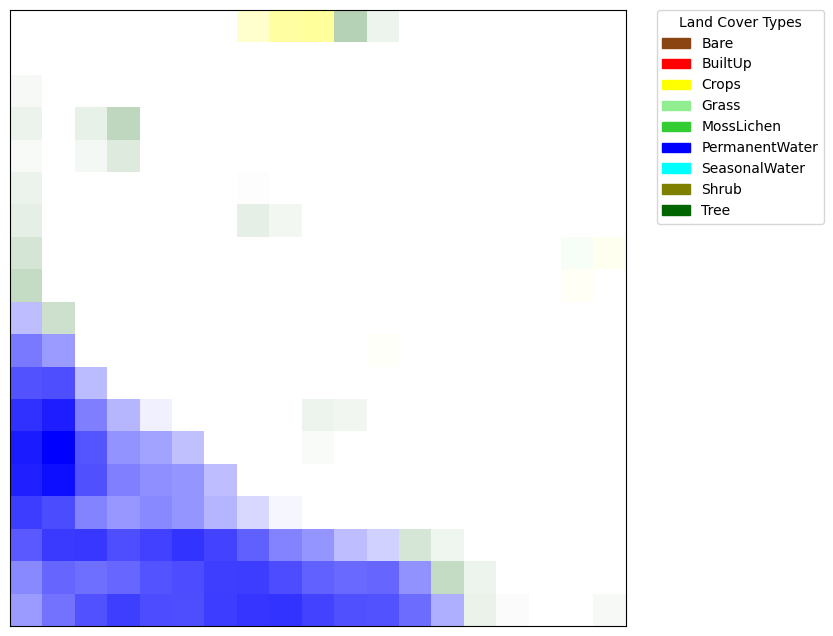

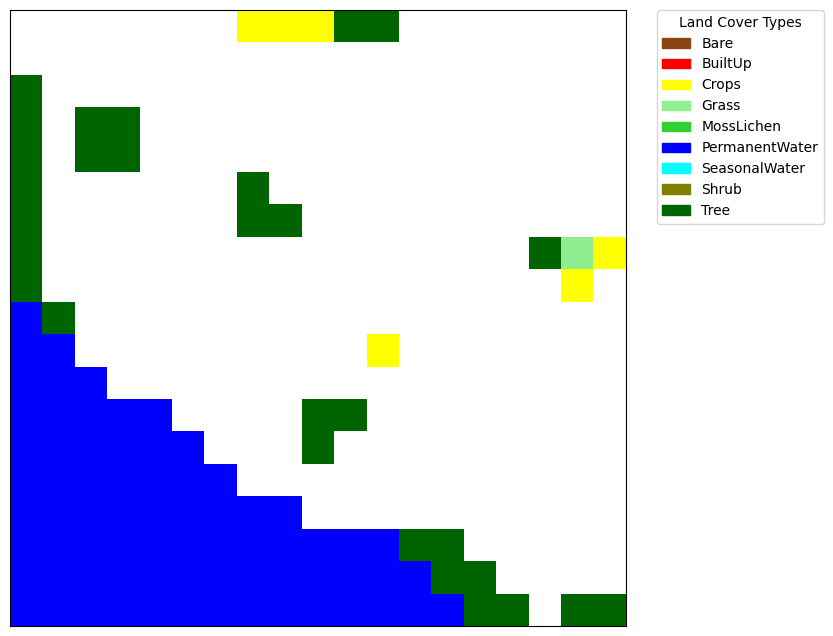

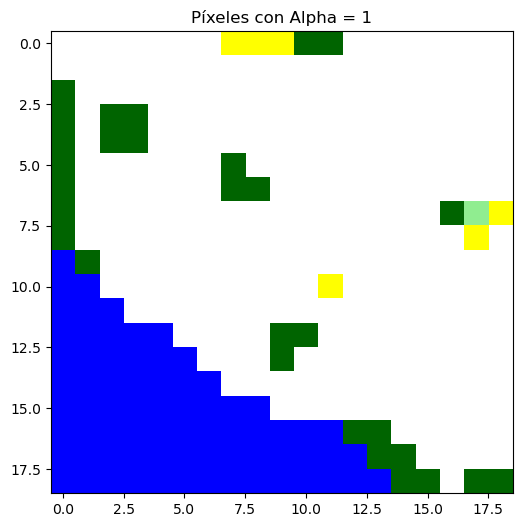

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              2        0.085354
357  18  15              2        0.021540
358  18  16              0        0.000000
359  18  17              8        0.000011
360  18  18              8        0.039086

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   147
1     1   0       Tree   147
2     2   0       Tree   147
3     3   0       Tree   147
4     4   0       Tree   147
..   ..  ..        ...   ...
356  14  18       Tree   147
357  15  18       Tree   147
358  16  18       Tree   147
359  17  18       Tree   147
360  18  18       Tree   147

[361 rows x 4 columns]
148


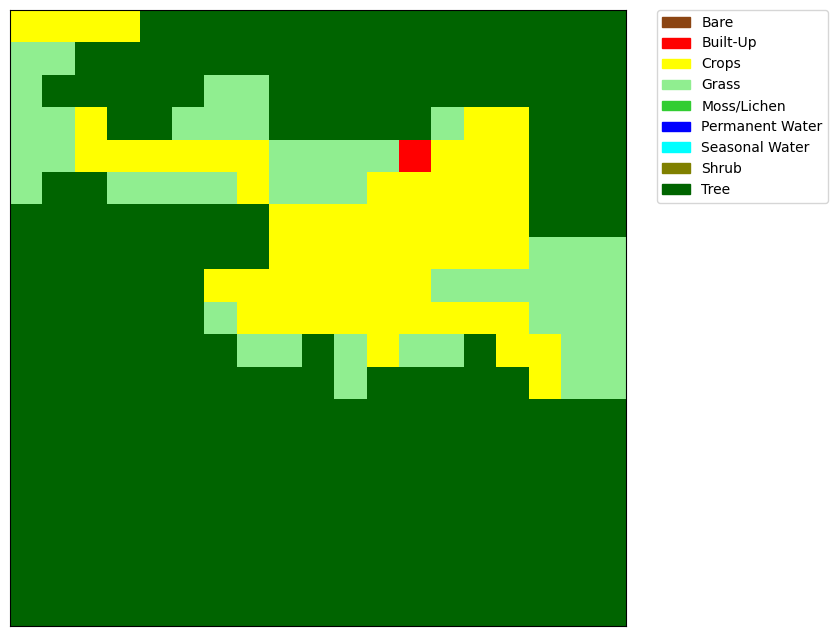

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


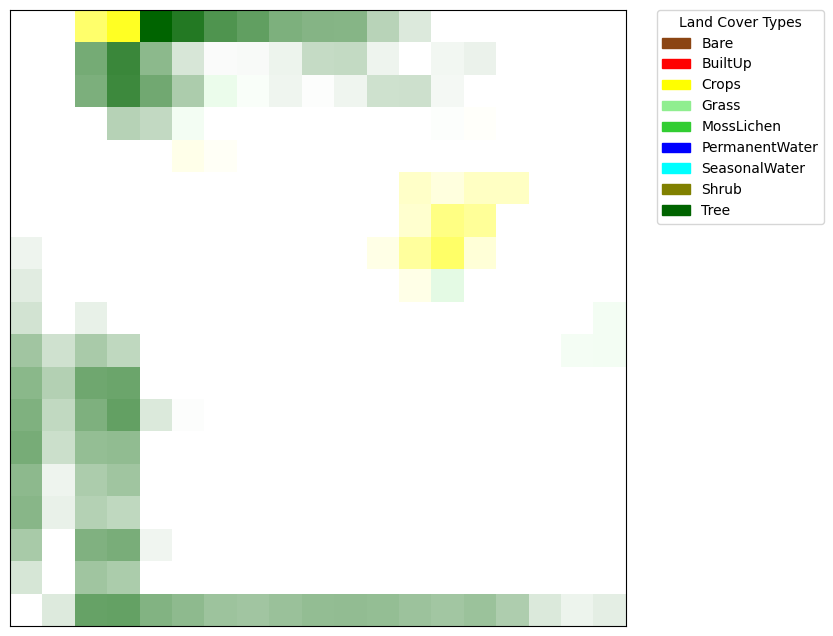

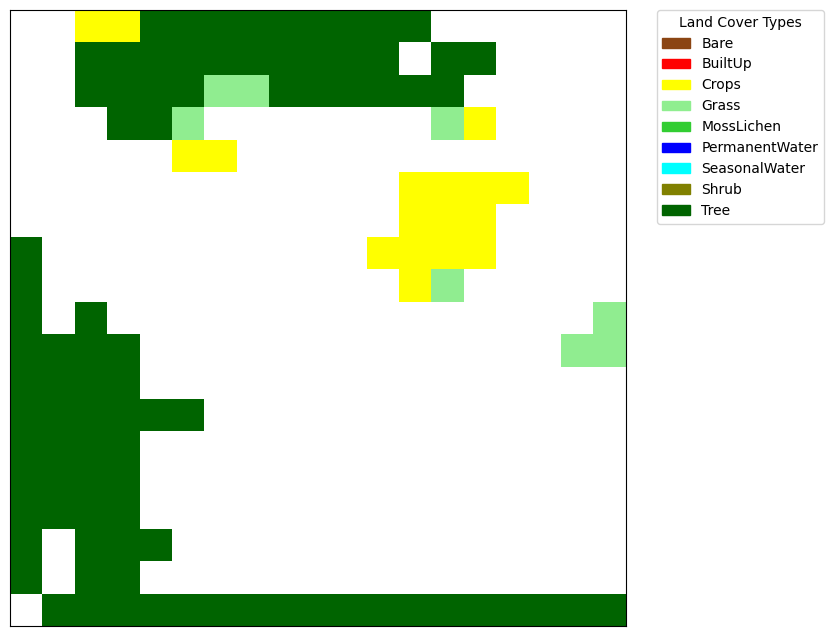

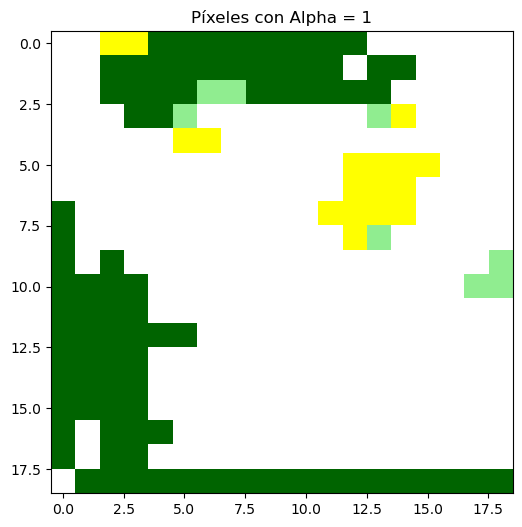

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.581740
3     0   3              1        0.865089
4     0   4              1        1.000000
..   ..  ..            ...             ...
356  18  14              3        0.394927
357  18  15              3        0.319914
358  18  16              3        0.144112
359  18  17              3        0.071405
360  18  18              3        0.106174

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   148
1     1   0      Crops   148
2     2   0      Crops   148
3     3   0      Crops   148
4     4   0       Tree   148
..   ..  ..        ...   ...
356  14  18       Tree   148
357  15  18       Tree   148
358  16  18       Tree   148
359  17  18       Tree   148
360  18  18       Tree   148

[361 rows x 4 columns]
149


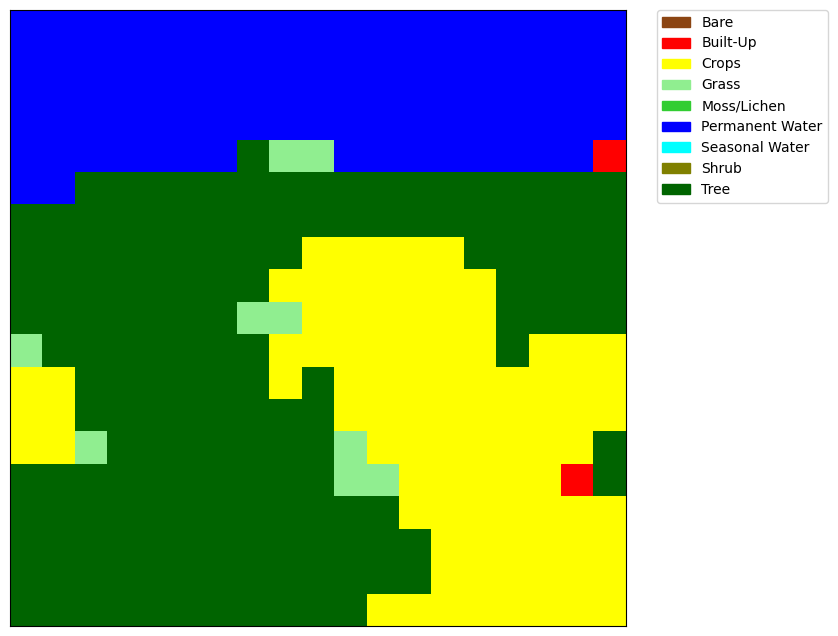

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


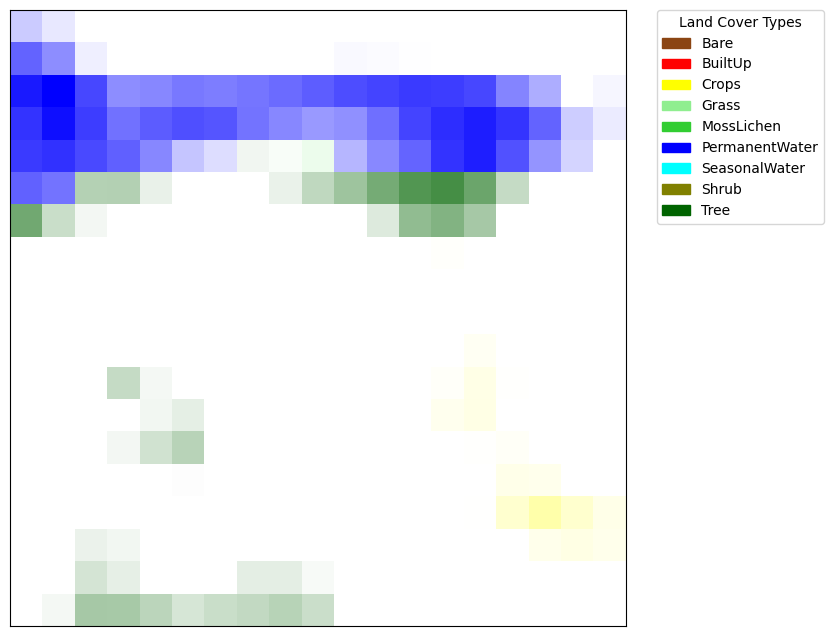

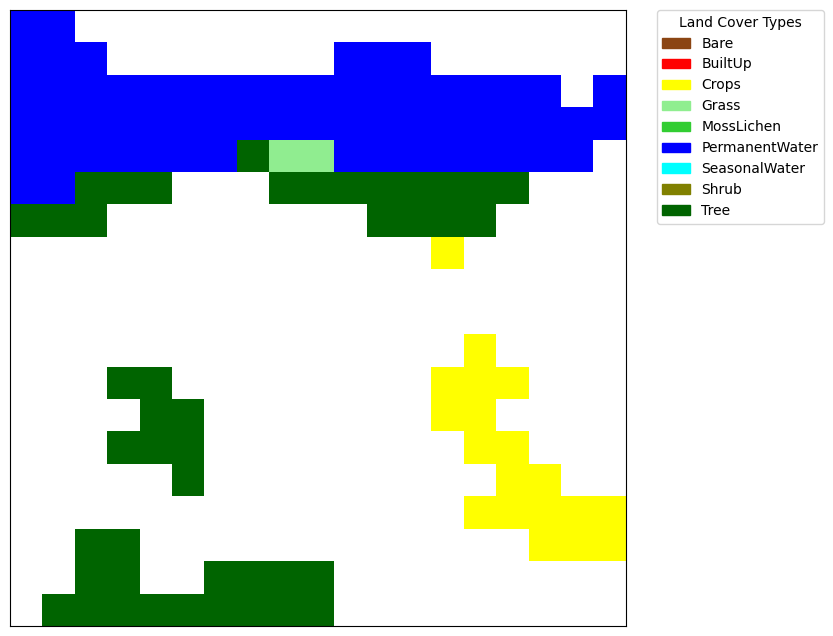

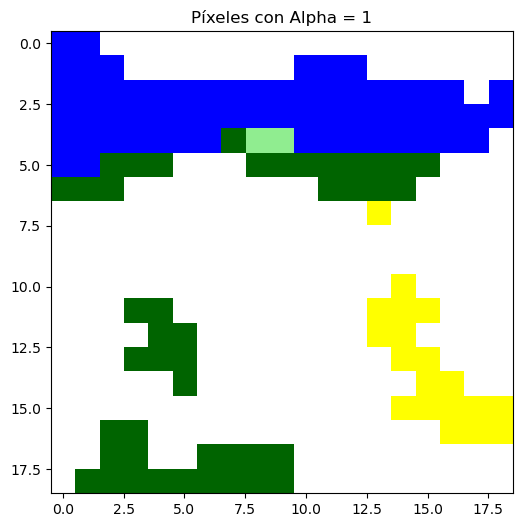

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.205090
1     0   1              1        0.090483
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y       land_cover  site
0     0   0  Permanent Water   149
1     1   0  Permanent Water   149
2     2   0  Permanent Water   149
3     3   0  Permanent Water   149
4     4   0  Permanent Water   149
..   ..  ..              ...   ...
356  14  18            Crops   149
357  15  18            Crops   149
358  16  18            Crops   149
359  17  18            Crops   1

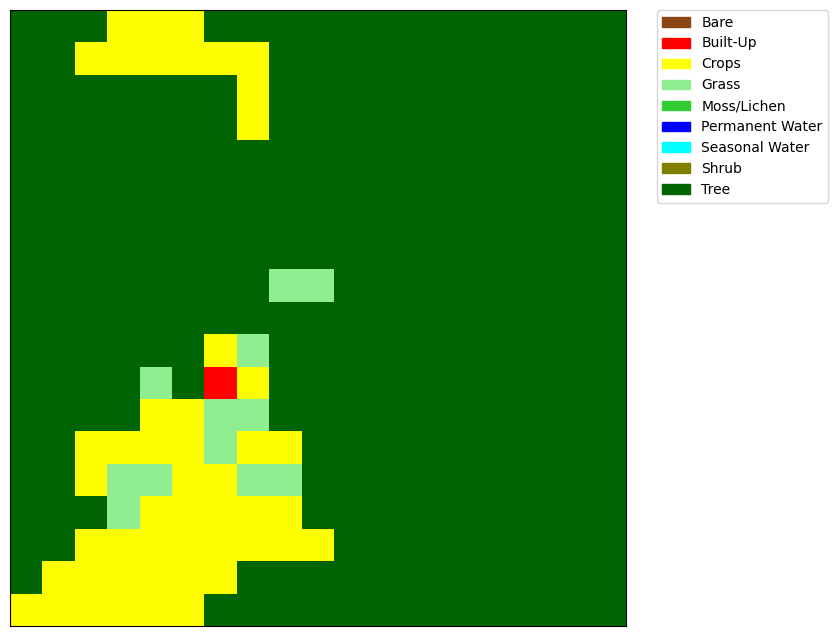

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


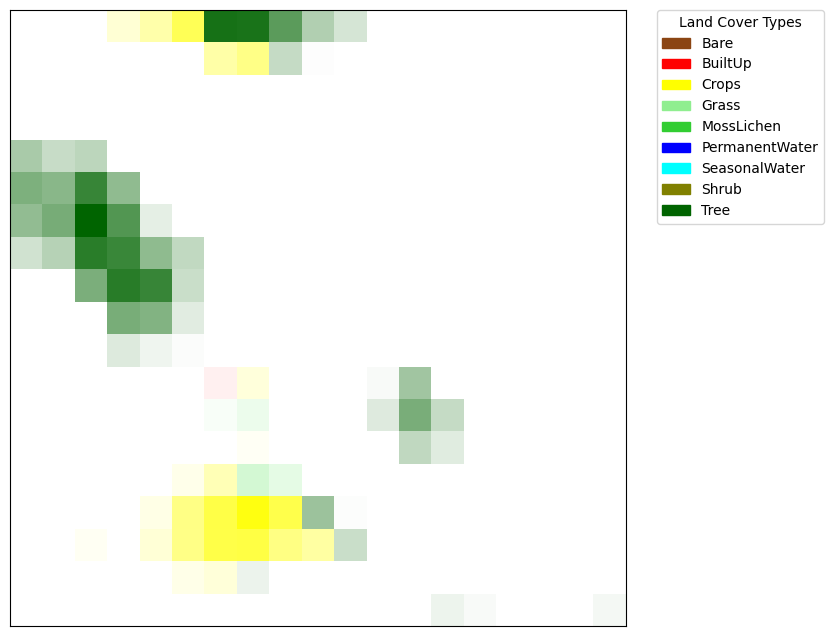

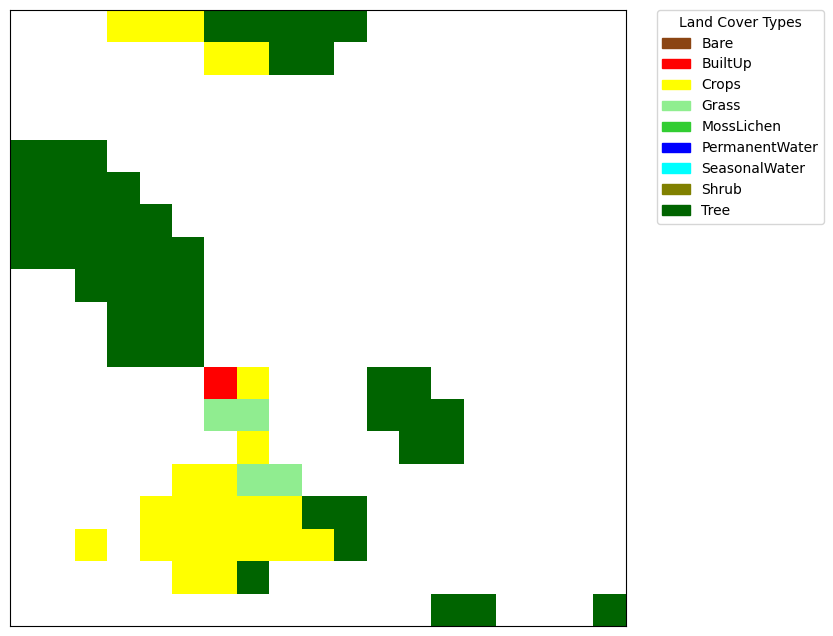

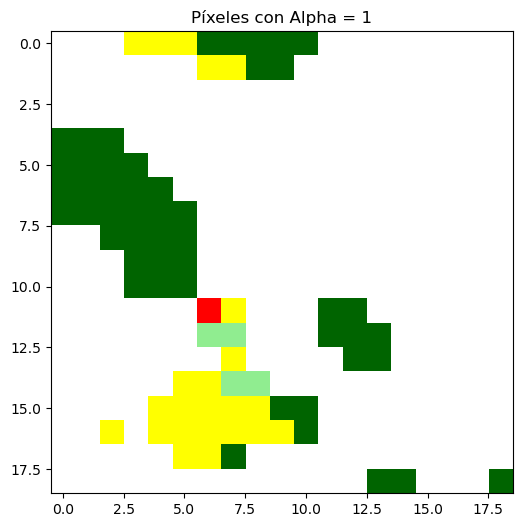

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.171997
4     0   4              1        0.335509
..   ..  ..            ...             ...
356  18  14              5        0.029607
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              6        0.043803

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   150
1     1   0       Tree   150
2     2   0       Tree   150
3     3   0      Crops   150
4     4   0      Crops   150
..   ..  ..        ...   ...
356  14  18       Tree   150
357  15  18       Tree   150
358  16  18       Tree   150
359  17  18       Tree   150
360  18  18       Tree   150

[361 rows x 4 columns]
151


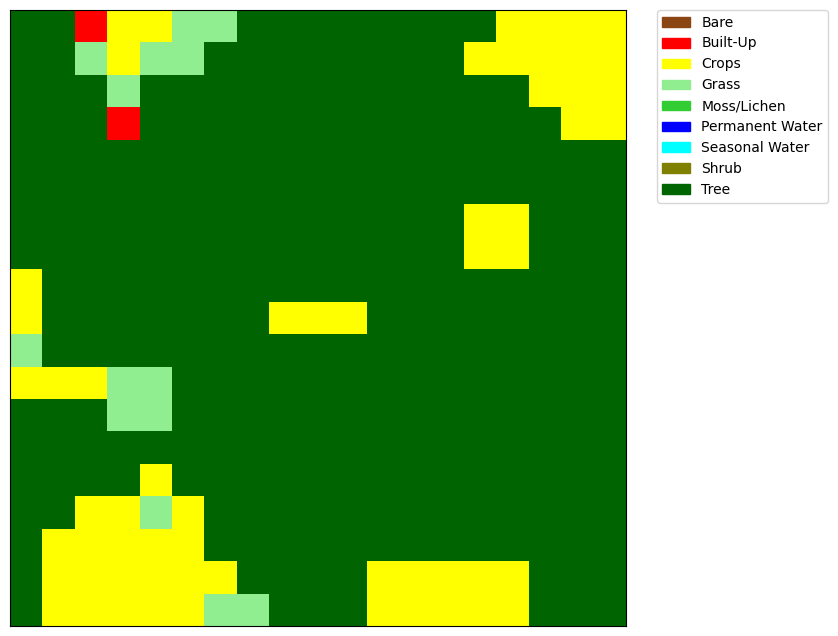

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


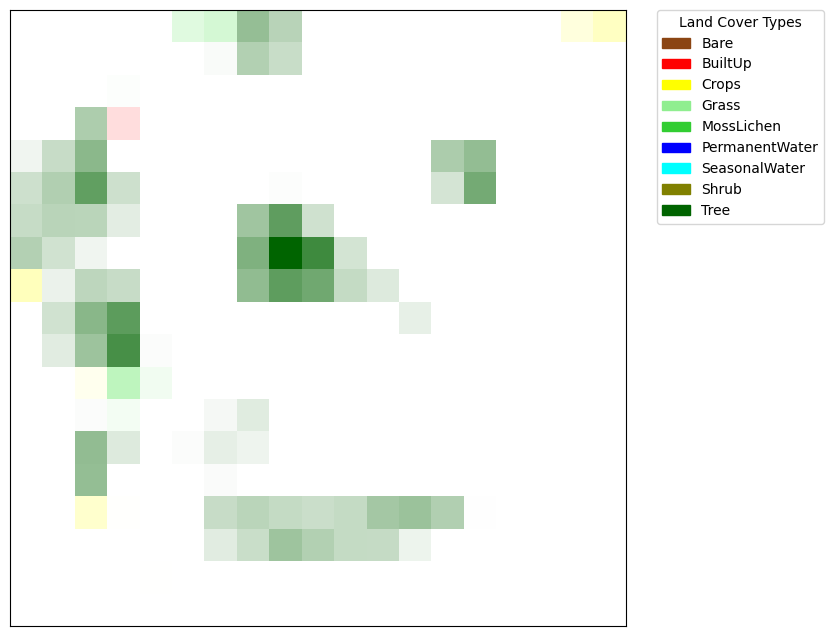

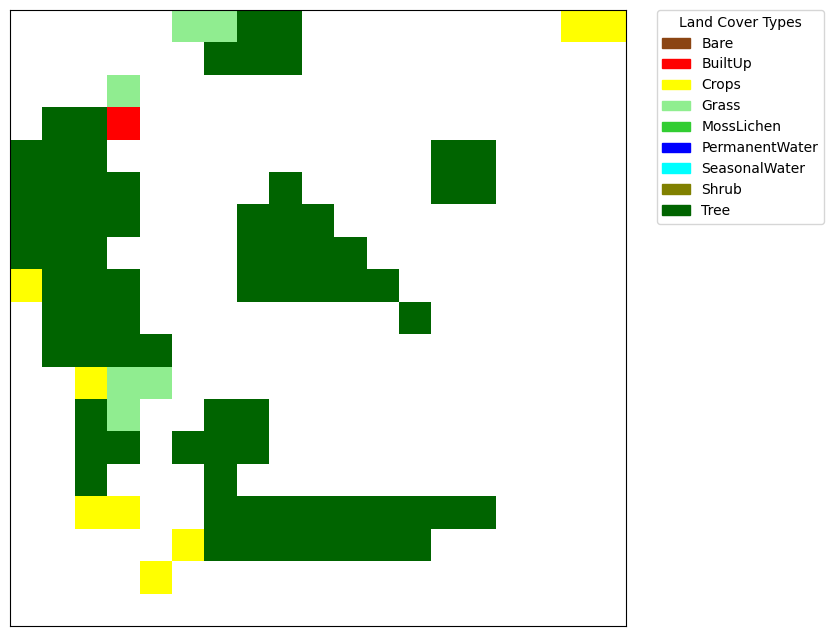

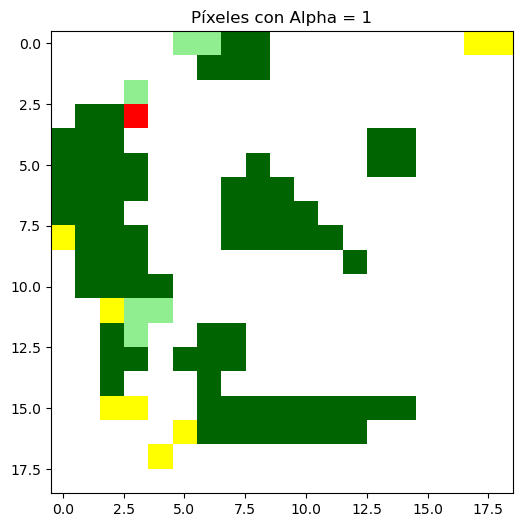

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   151
1     1   0       Tree   151
2     2   0   Built-Up   151
3     3   0      Crops   151
4     4   0      Crops   151
..   ..  ..        ...   ...
356  14  18      Crops   151
357  15  18      Crops   151
358  16  18       Tree   151
359  17  18       Tree   151
360  18  18       Tree   151

[361 rows x 4 columns]
152


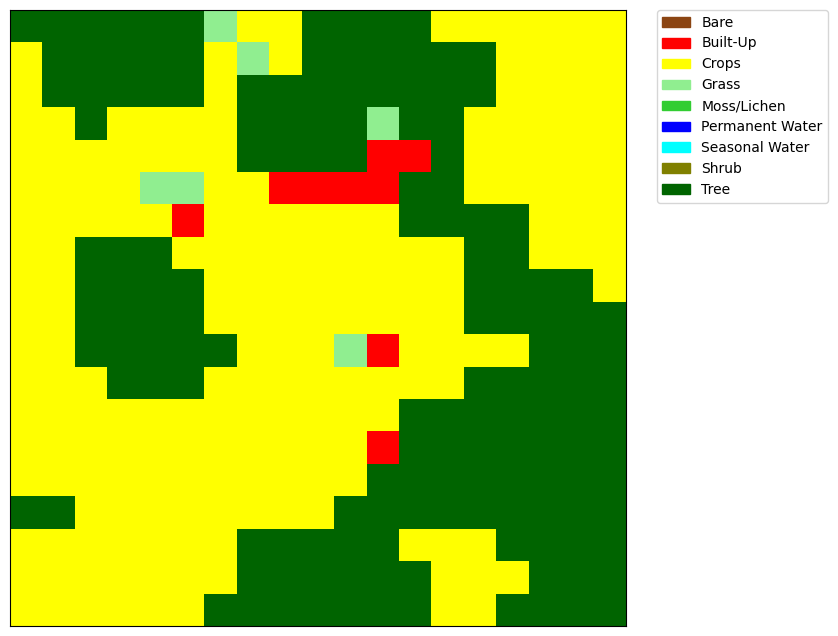

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


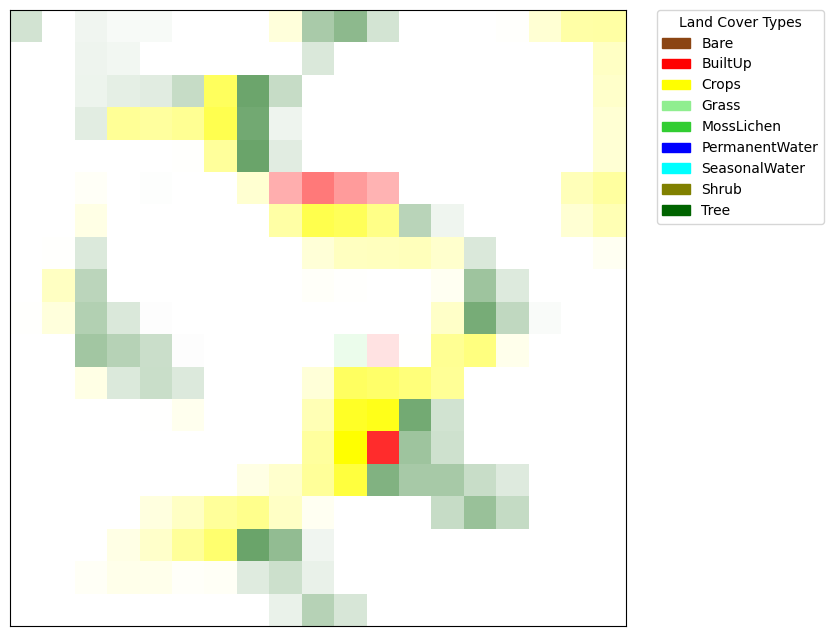

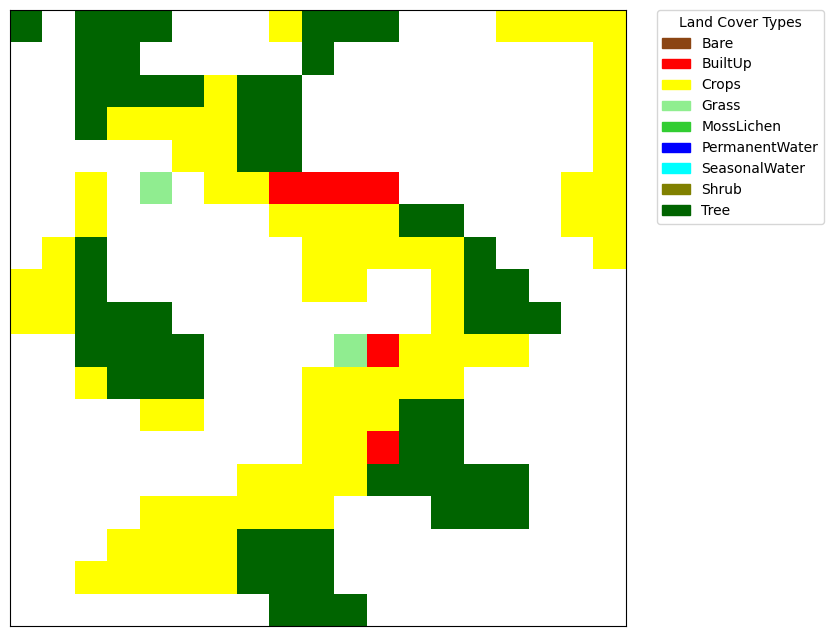

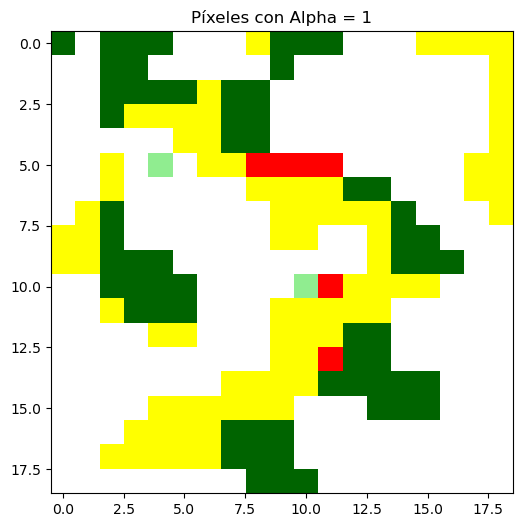

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.179912
1     0   1              0        0.000000
2     0   2              2        0.062628
3     0   3              2        0.031979
4     0   4              2        0.034343
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   152
1     1   0       Tree   152
2     2   0       Tree   152
3     3   0       Tree   152
4     4   0       Tree   152
..   ..  ..        ...   ...
356  14  18      Crops   152
357  15  18       Tree   152
358  16  18       Tree   152
359  17  18       Tree   152
360  18  18       Tree   152

[361 rows x 4 columns]
153


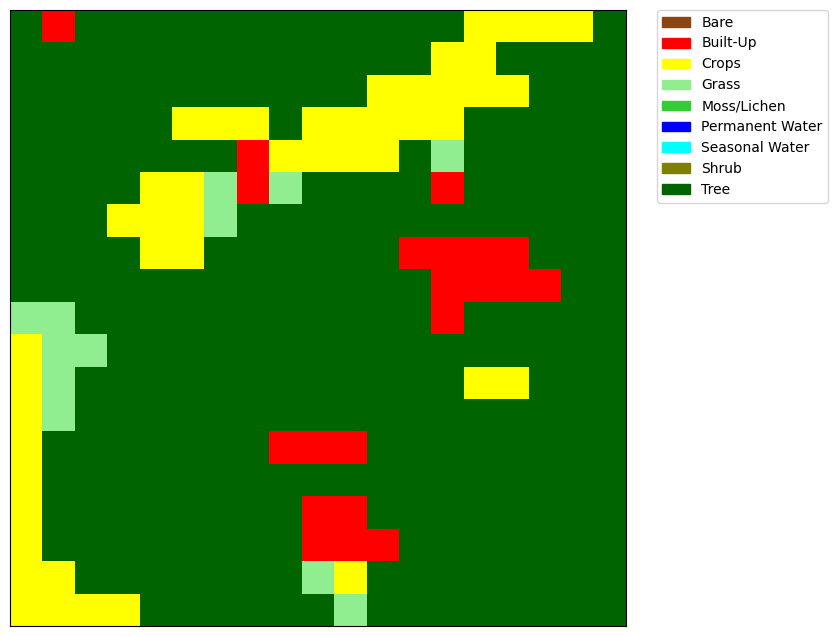

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


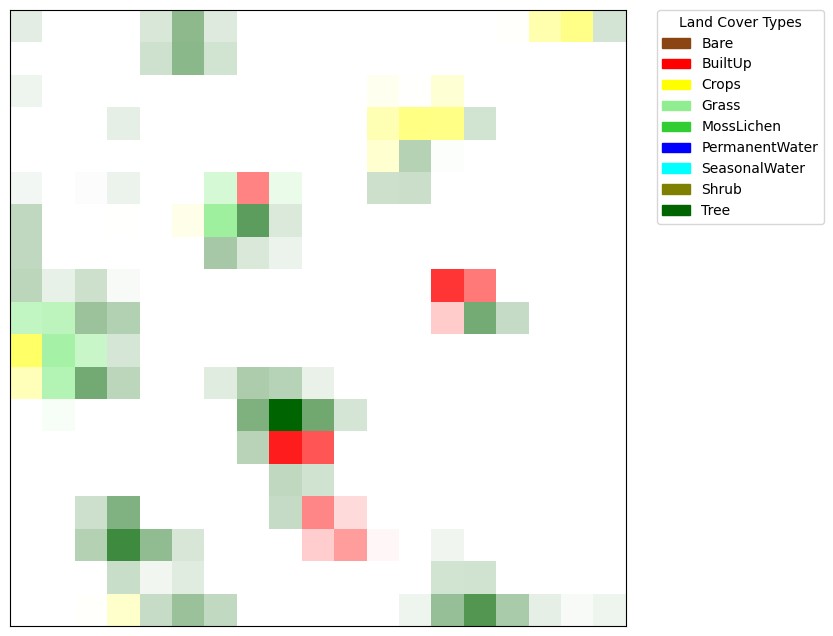

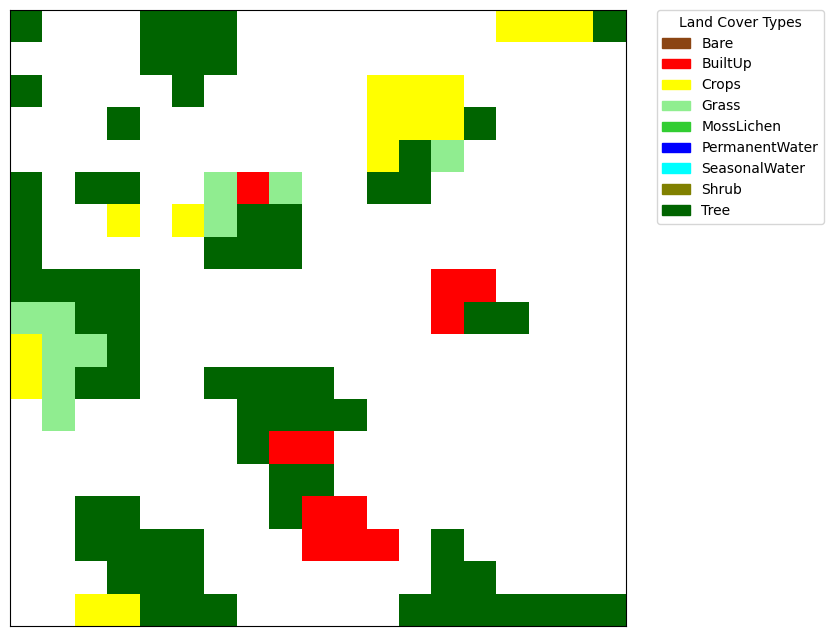

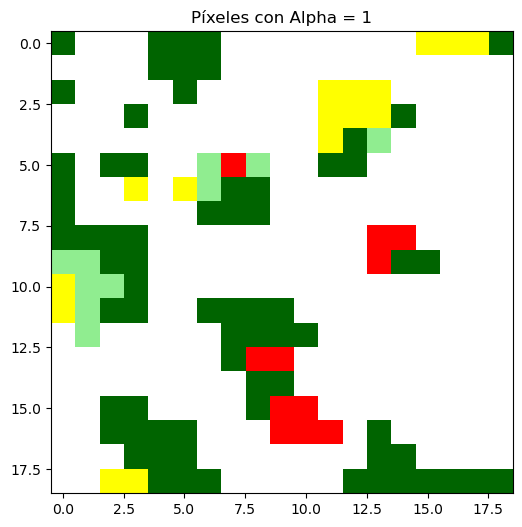

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.112047
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              2        0.154288
..   ..  ..            ...             ...
356  18  14             13        0.680814
357  18  15             13        0.337173
358  18  16             13        0.104089
359  18  17             13        0.034691
360  18  18             13        0.068479

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   153
1     1   0   Built-Up   153
2     2   0       Tree   153
3     3   0       Tree   153
4     4   0       Tree   153
..   ..  ..        ...   ...
356  14  18       Tree   153
357  15  18       Tree   153
358  16  18       Tree   153
359  17  18       Tree   153
360  18  18       Tree   153

[361 rows x 4 columns]
154


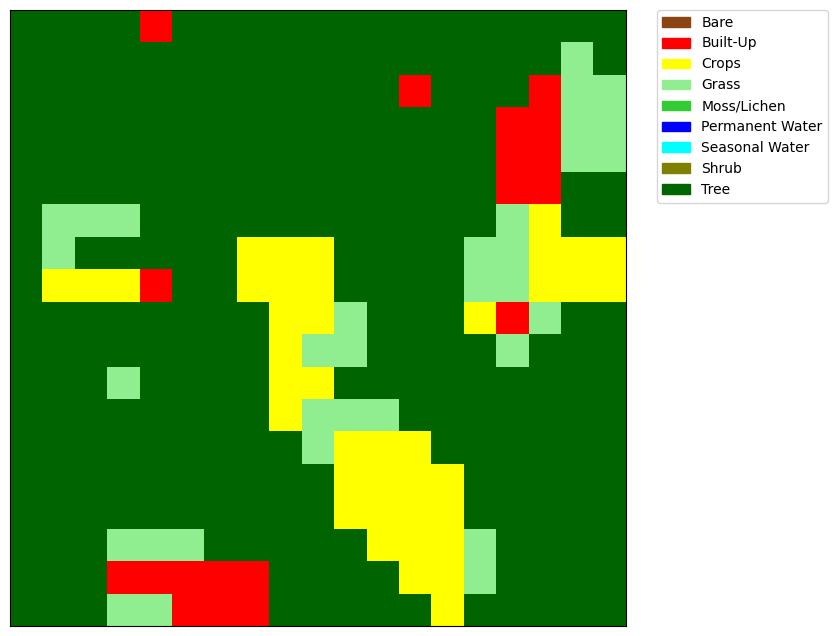

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


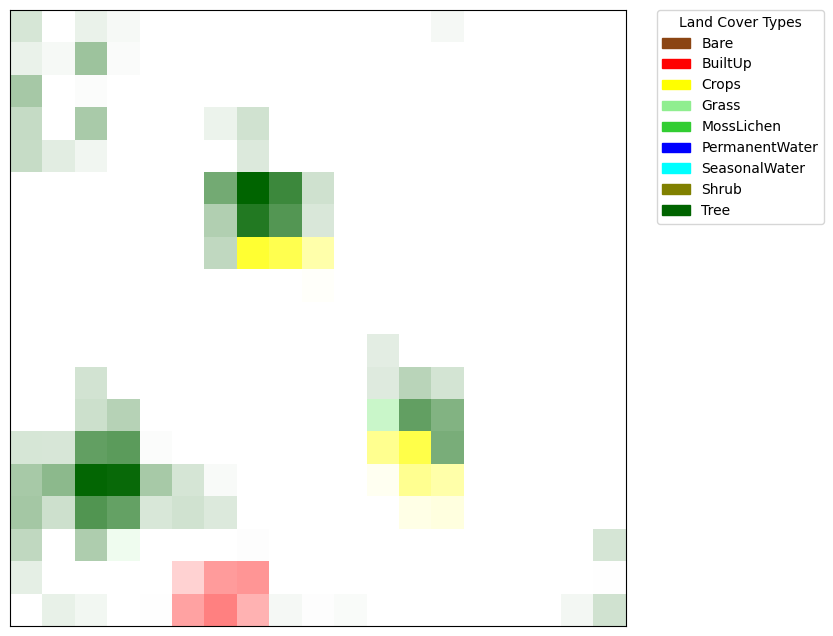

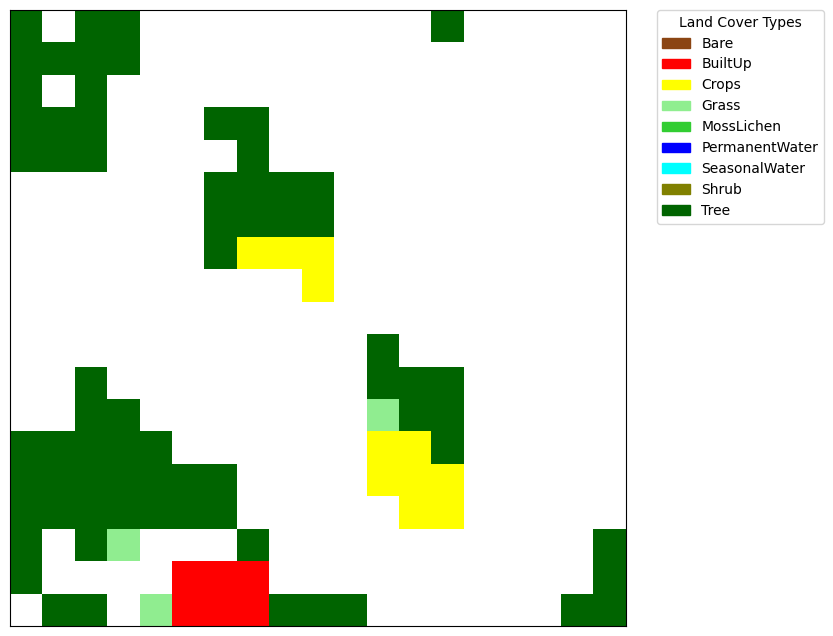

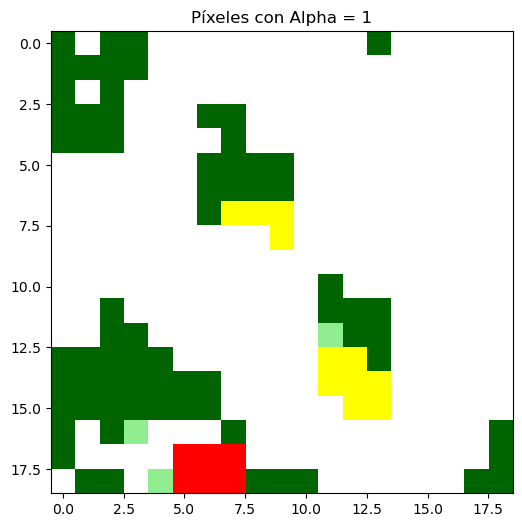

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.160875
1     0   1              0        0.000000
2     0   2              1        0.083526
3     0   3              1        0.036859
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              6        0.049864
360  18  18              6        0.187975

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   154
1     1   0       Tree   154
2     2   0       Tree   154
3     3   0       Tree   154
4     4   0   Built-Up   154
..   ..  ..        ...   ...
356  14  18       Tree   154
357  15  18       Tree   154
358  16  18       Tree   154
359  17  18       Tree   154
360  18  18       Tree   154

[361 rows x 4 columns]
155


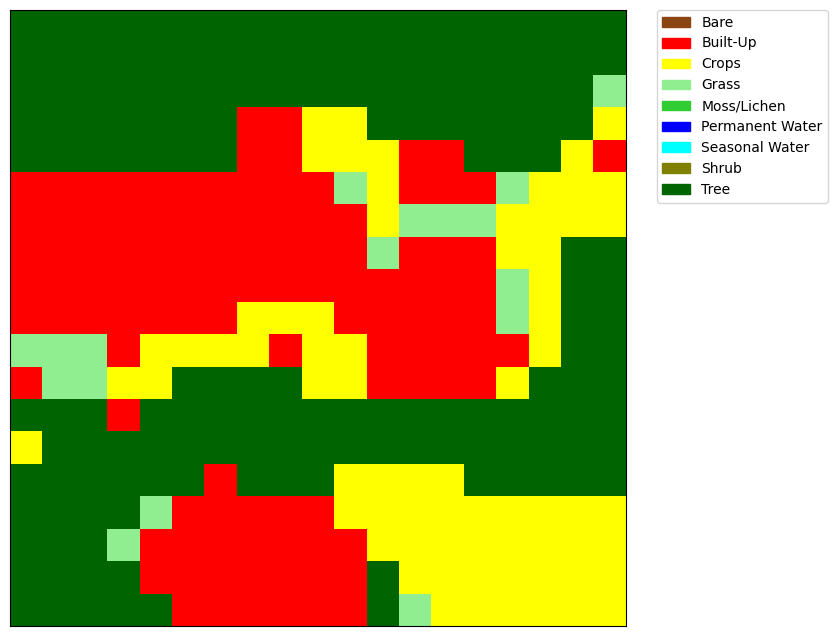

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


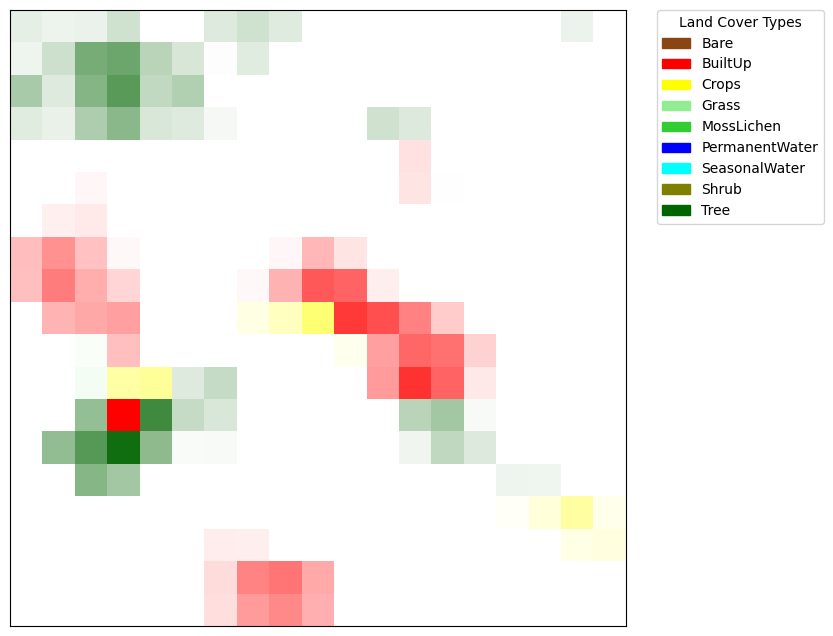

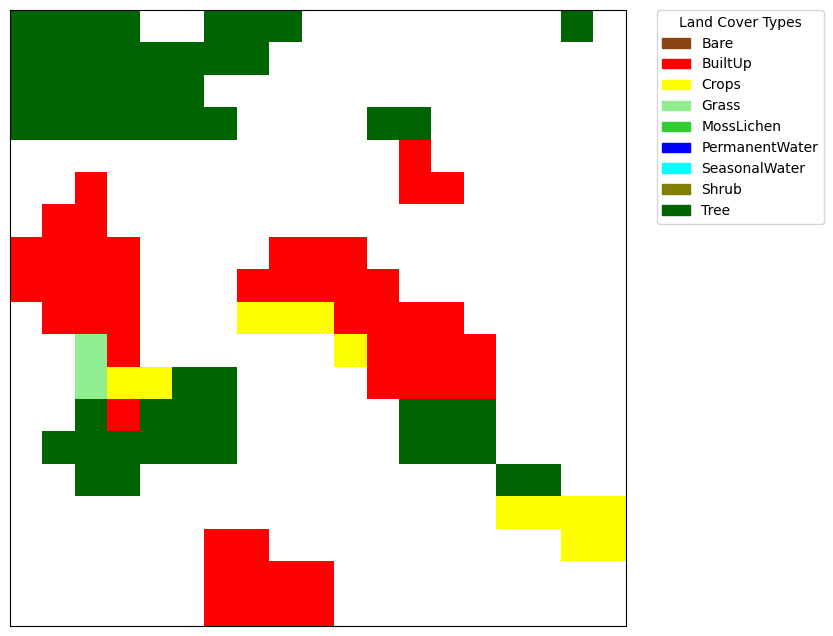

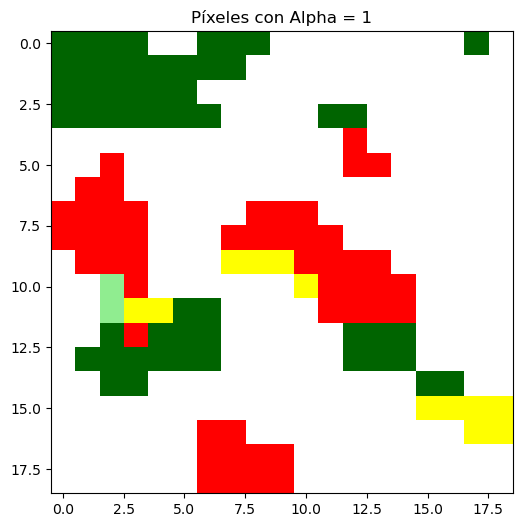

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.104643
1     0   1              1        0.073671
2     0   2              1        0.080091
3     0   3              1        0.189854
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   155
1     1   0       Tree   155
2     2   0       Tree   155
3     3   0       Tree   155
4     4   0       Tree   155
..   ..  ..        ...   ...
356  14  18      Crops   155
357  15  18      Crops   155
358  16  18      Crops   155
359  17  18      Crops   155
360  18  18      Crops   155

[361 rows x 4 columns]
156


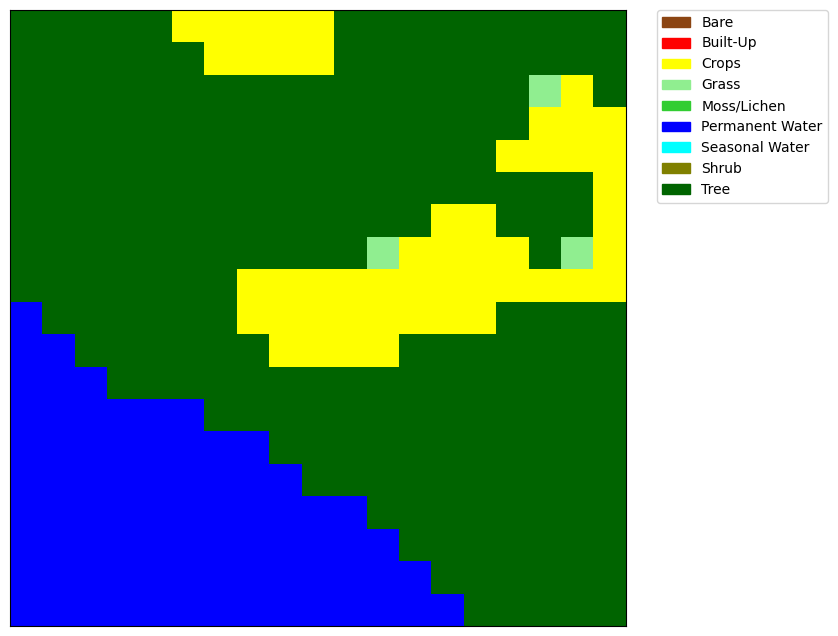

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


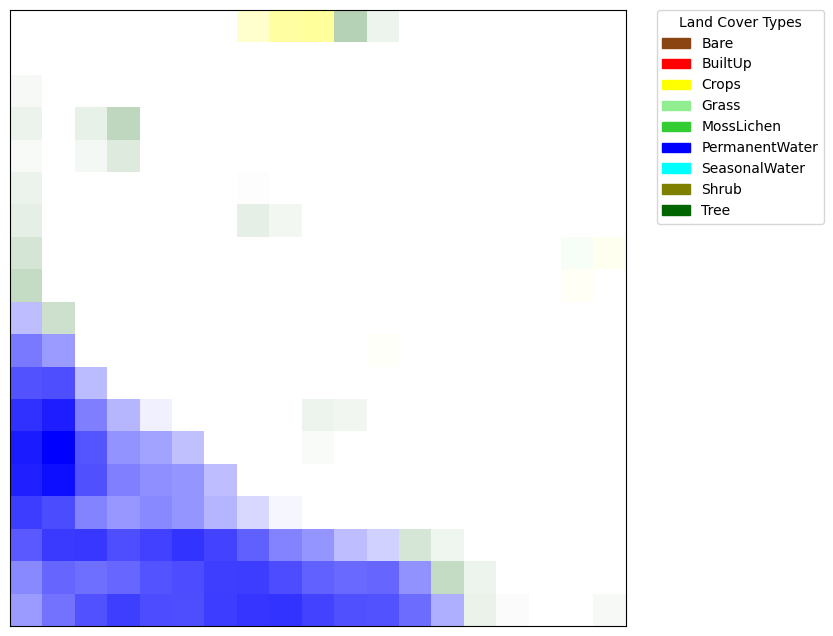

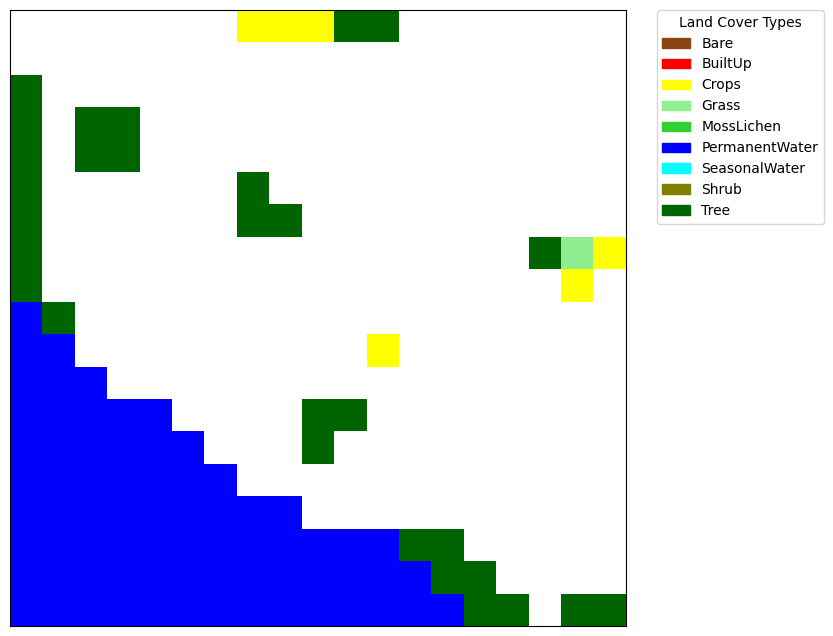

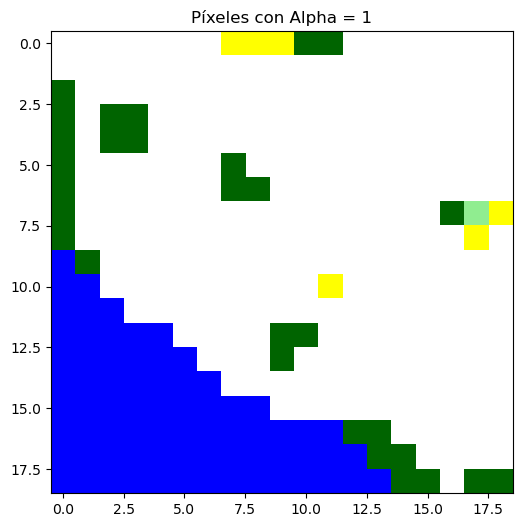

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              2        0.085354
357  18  15              2        0.021540
358  18  16              0        0.000000
359  18  17              8        0.000011
360  18  18              8        0.039086

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   156
1     1   0       Tree   156
2     2   0       Tree   156
3     3   0       Tree   156
4     4   0       Tree   156
..   ..  ..        ...   ...
356  14  18       Tree   156
357  15  18       Tree   156
358  16  18       Tree   156
359  17  18       Tree   156
360  18  18       Tree   156

[361 rows x 4 columns]
157


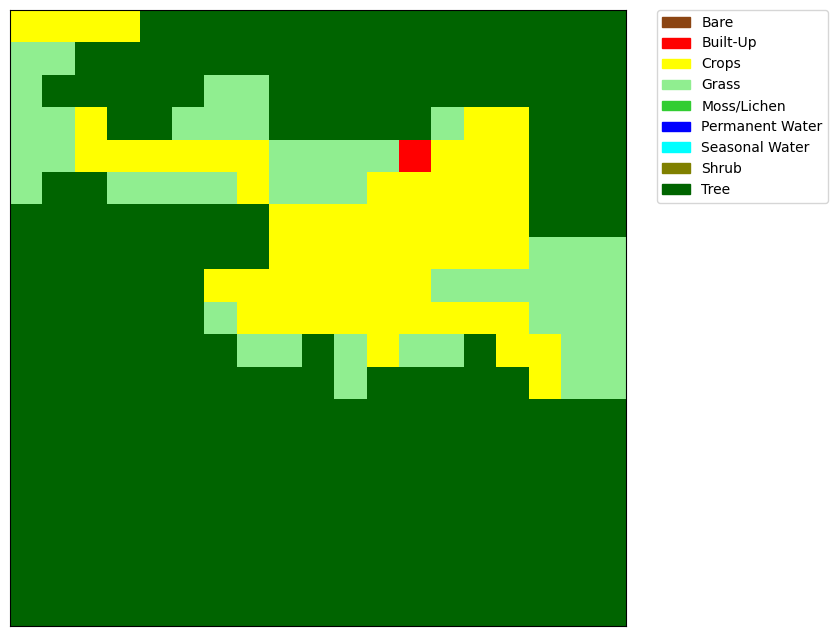

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


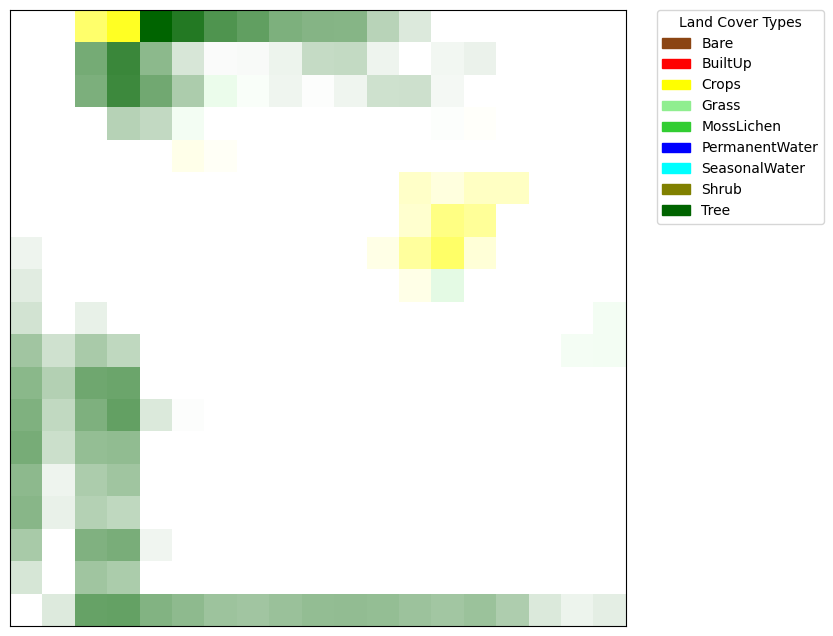

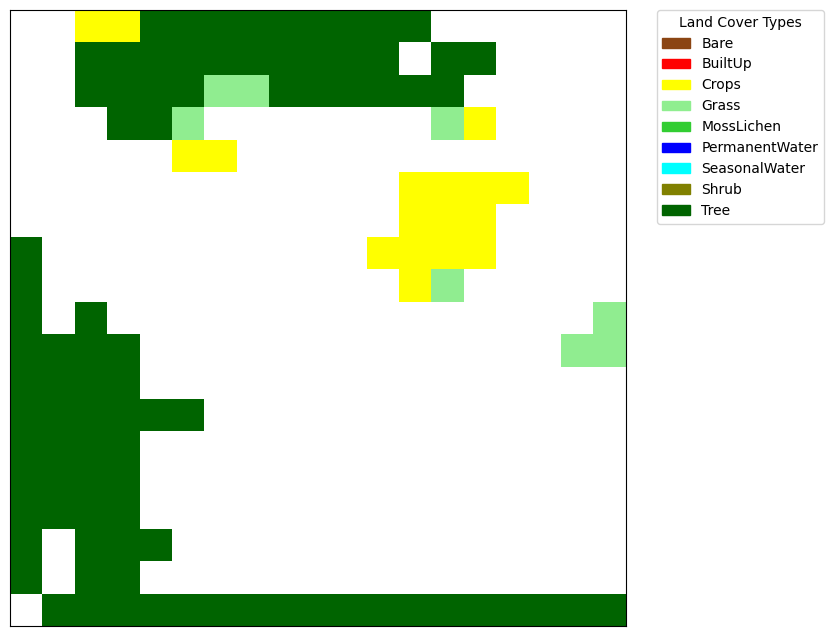

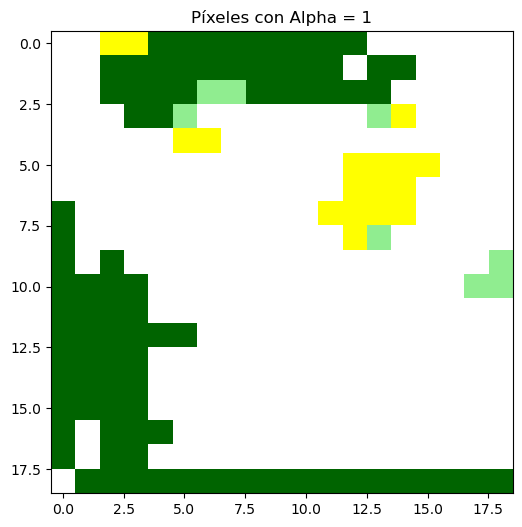

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.581740
3     0   3              1        0.865089
4     0   4              1        1.000000
..   ..  ..            ...             ...
356  18  14              3        0.394927
357  18  15              3        0.319914
358  18  16              3        0.144112
359  18  17              3        0.071405
360  18  18              3        0.106174

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   157
1     1   0      Crops   157
2     2   0      Crops   157
3     3   0      Crops   157
4     4   0       Tree   157
..   ..  ..        ...   ...
356  14  18       Tree   157
357  15  18       Tree   157
358  16  18       Tree   157
359  17  18       Tree   157
360  18  18       Tree   157

[361 rows x 4 columns]
158


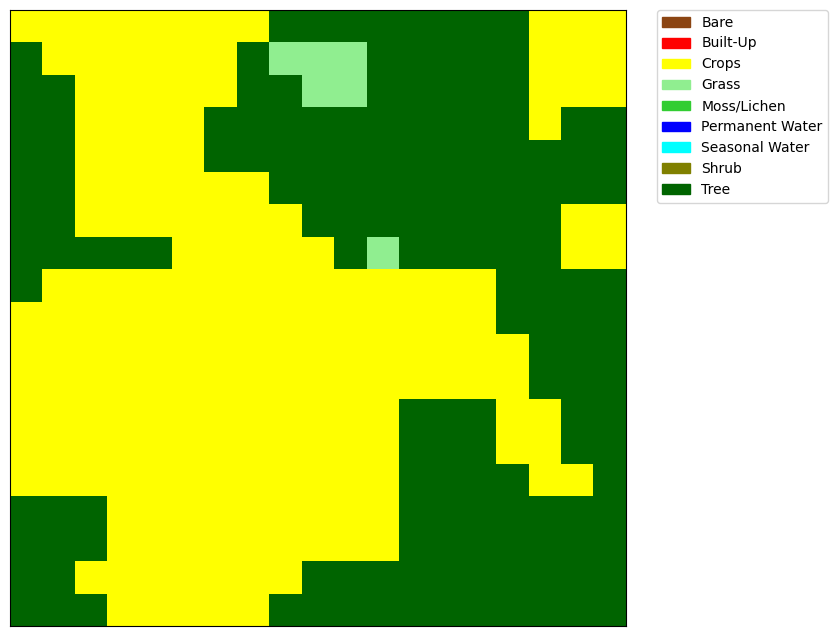

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


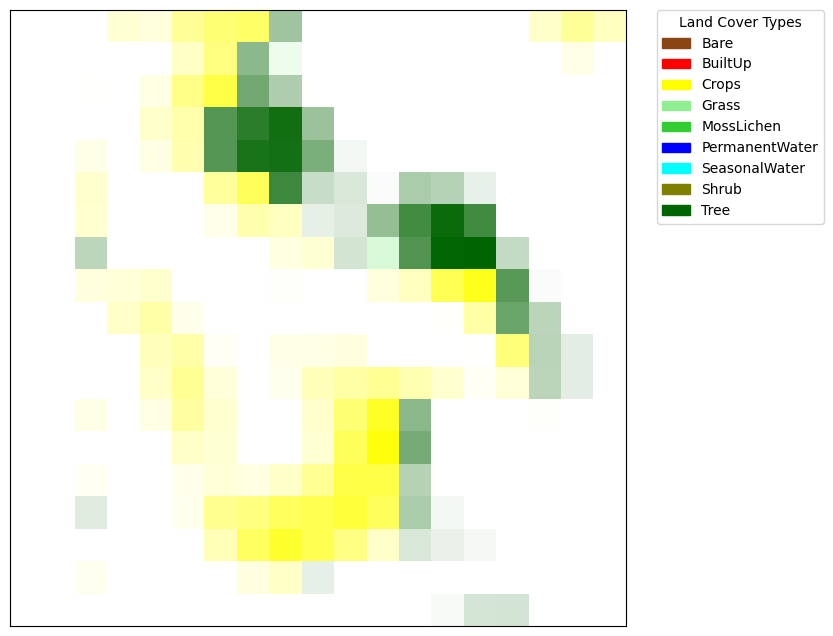

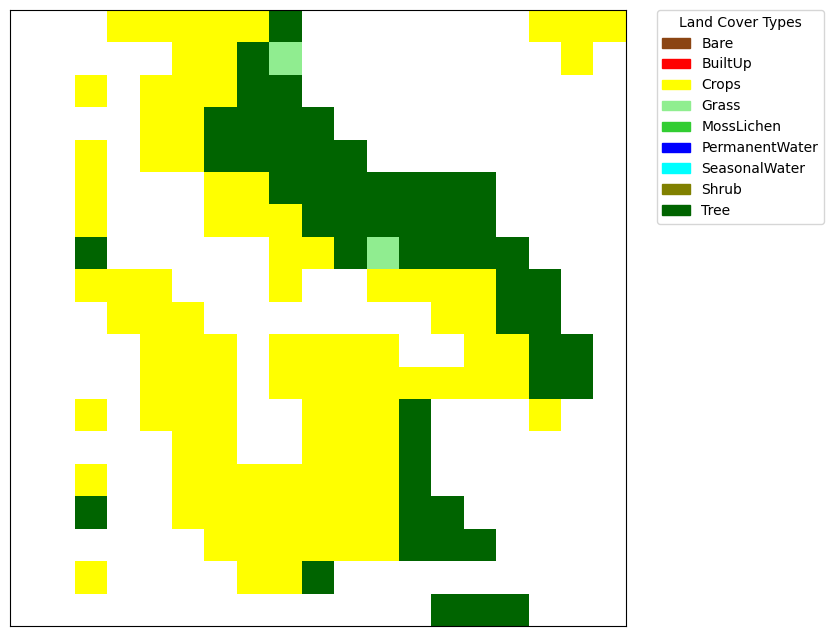

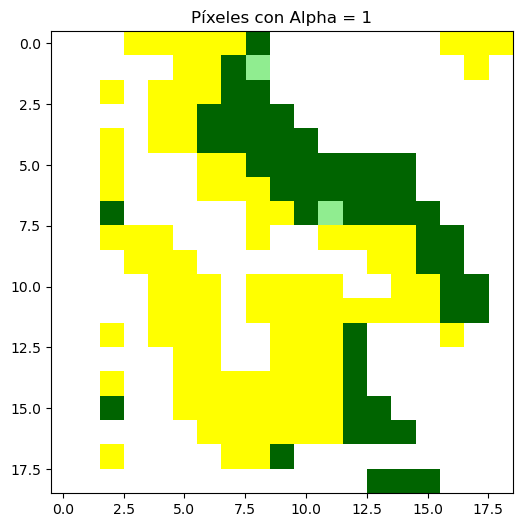

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.175120
4     0   4              1        0.141178
..   ..  ..            ...             ...
356  18  14              7        0.166486
357  18  15              7        0.169623
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   158
1     1   0      Crops   158
2     2   0      Crops   158
3     3   0      Crops   158
4     4   0      Crops   158
..   ..  ..        ...   ...
356  14  18       Tree   158
357  15  18       Tree   158
358  16  18       Tree   158
359  17  18       Tree   158
360  18  18       Tree   158

[361 rows x 4 columns]
159


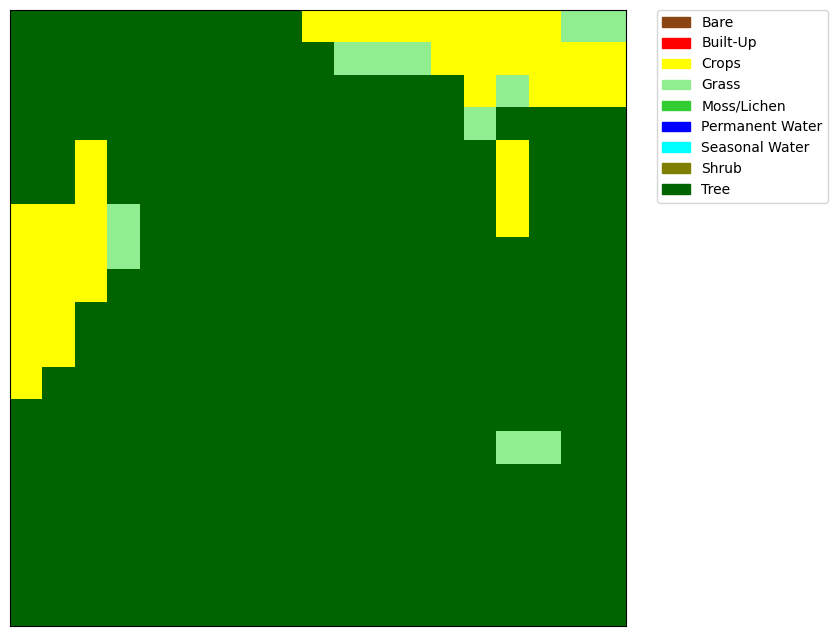

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


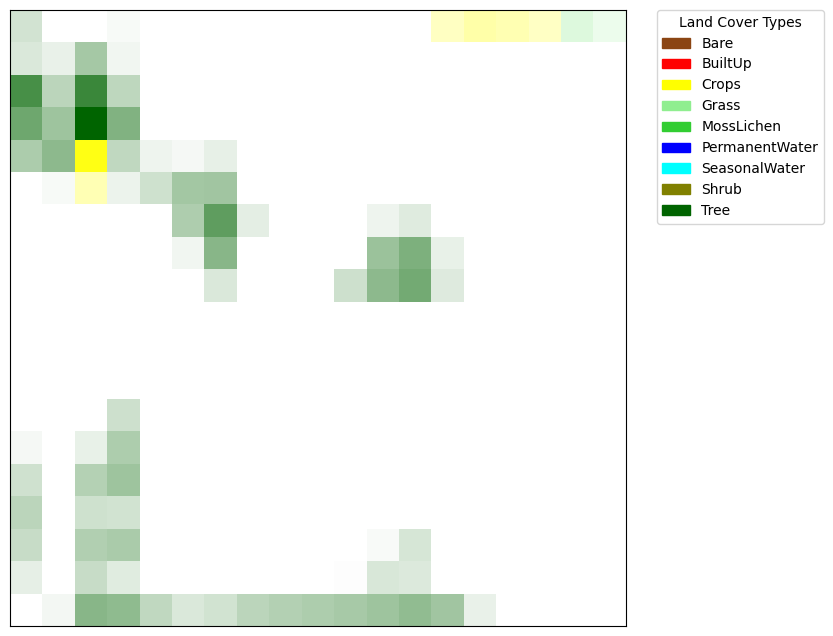

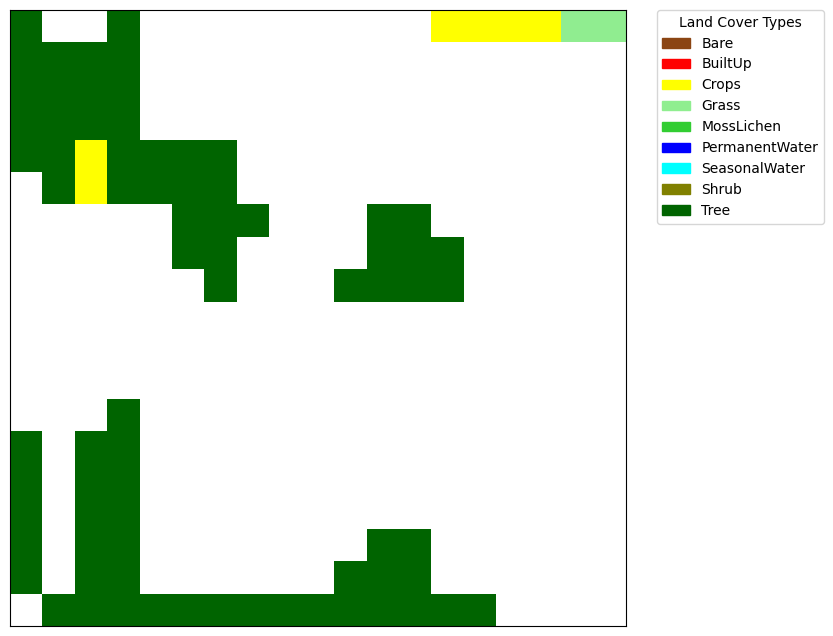

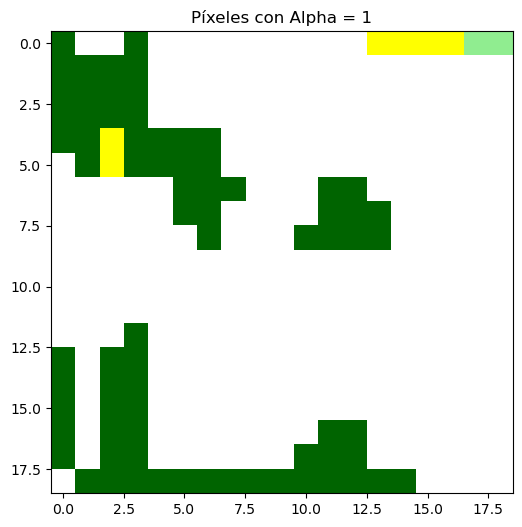

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.177083
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.033050
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              4        0.089425
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   159
1     1   0       Tree   159
2     2   0       Tree   159
3     3   0       Tree   159
4     4   0       Tree   159
..   ..  ..        ...   ...
356  14  18       Tree   159
357  15  18       Tree   159
358  16  18       Tree   159
359  17  18       Tree   159
360  18  18       Tree   159

[361 rows x 4 columns]
160


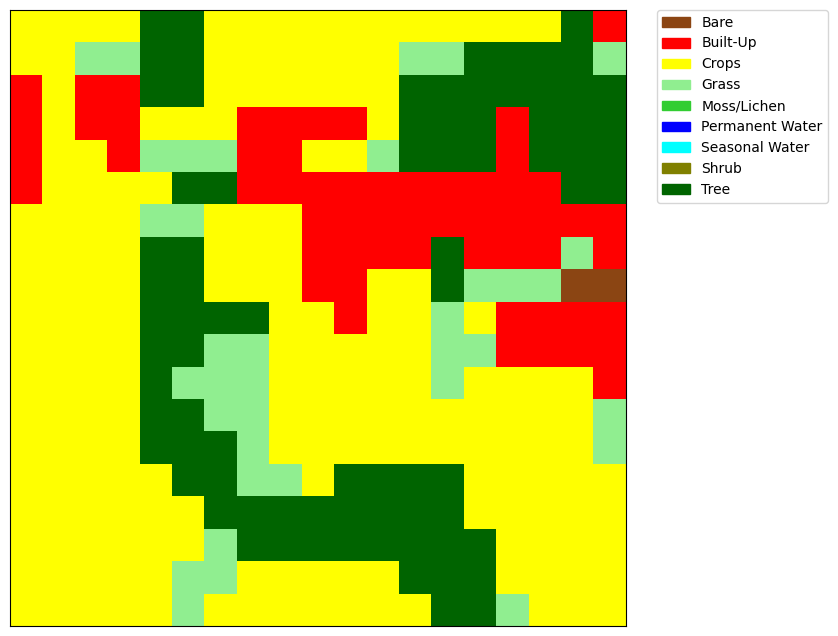

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


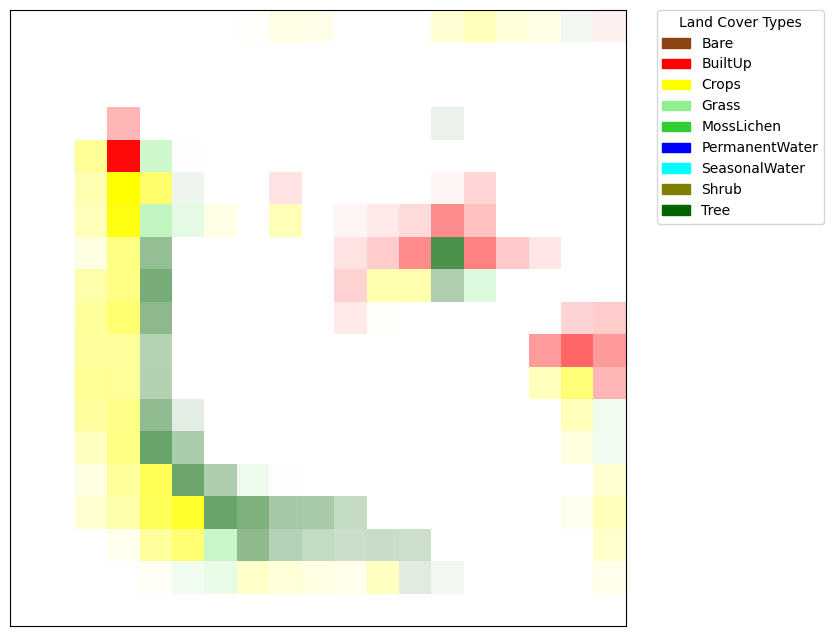

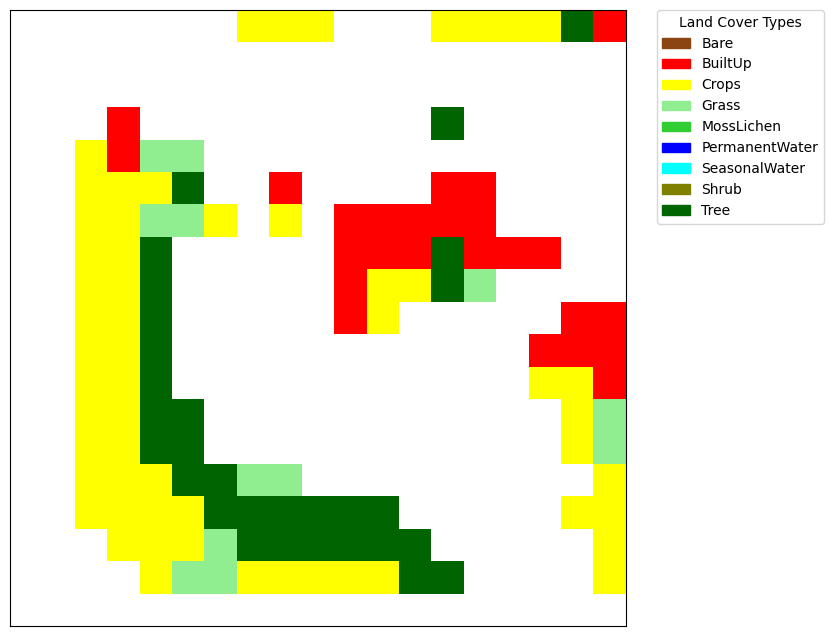

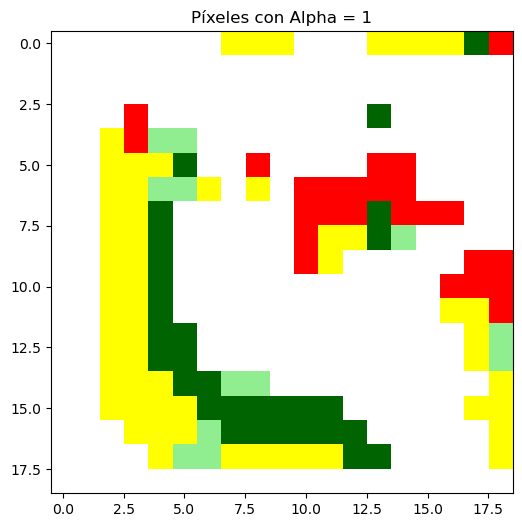

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0             0.0
1     0   1              0             0.0
2     0   2              0             0.0
3     0   3              0             0.0
4     0   4              0             0.0
..   ..  ..            ...             ...
356  18  14              0             0.0
357  18  15              0             0.0
358  18  16              0             0.0
359  18  17              0             0.0
360  18  18              0             0.0

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   160
1     1   0      Crops   160
2     2   0      Crops   160
3     3   0      Crops   160
4     4   0       Tree   160
..   ..  ..        ...   ...
356  14  18       Tree   160
357  15  18      Grass   160
358  16  18      Crops   160
359  17  18      Crops   160
360  18  18      Crops   160

[361 rows x 4 columns]
161


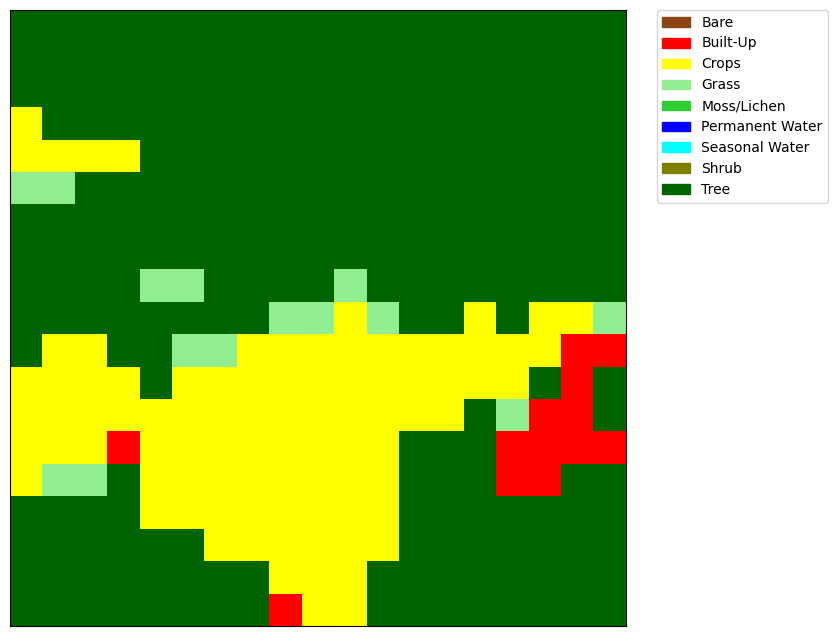

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


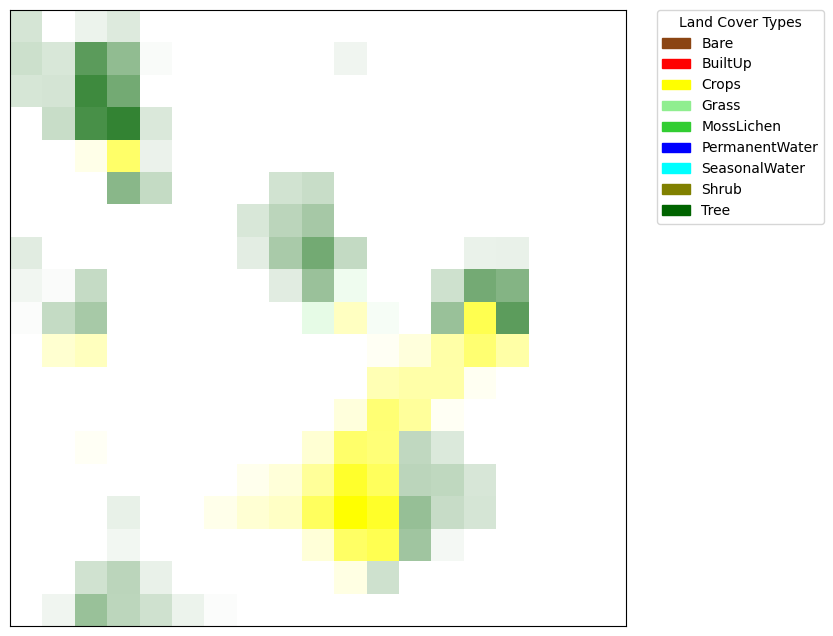

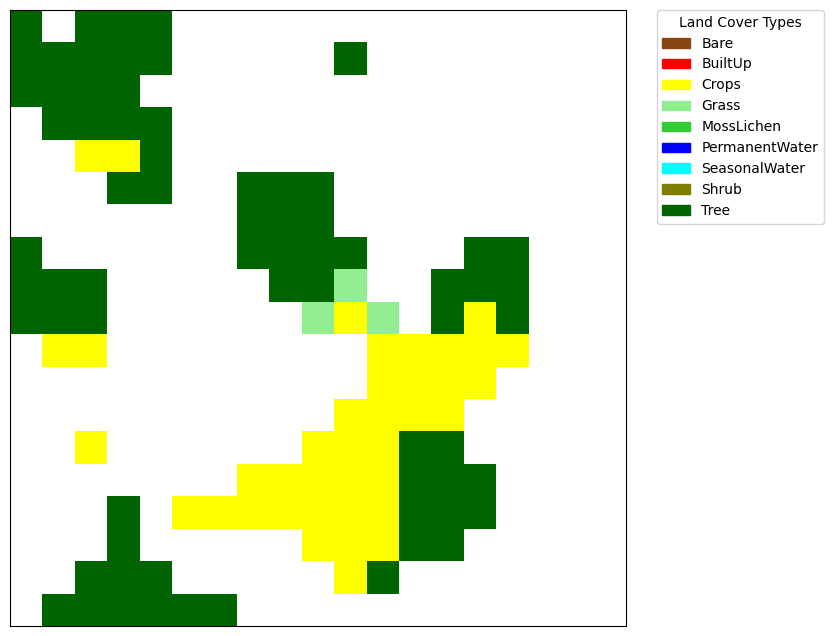

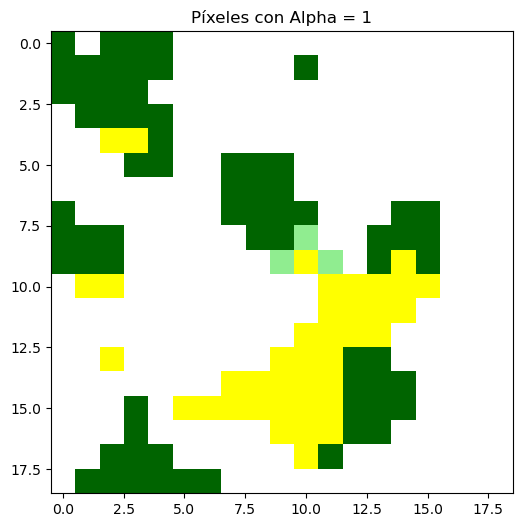

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.164888
1     0   1              0        0.000000
2     0   2              1        0.076168
3     0   3              1        0.134622
4     0   4              1        0.003273
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   161
1     1   0       Tree   161
2     2   0       Tree   161
3     3   0       Tree   161
4     4   0       Tree   161
..   ..  ..        ...   ...
356  14  18       Tree   161
357  15  18       Tree   161
358  16  18       Tree   161
359  17  18       Tree   161
360  18  18       Tree   161

[361 rows x 4 columns]
162


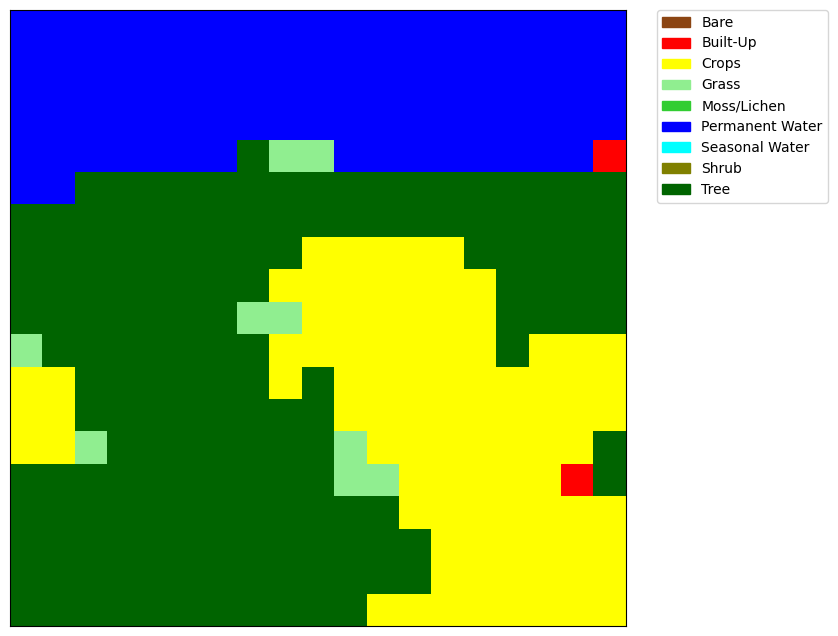

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


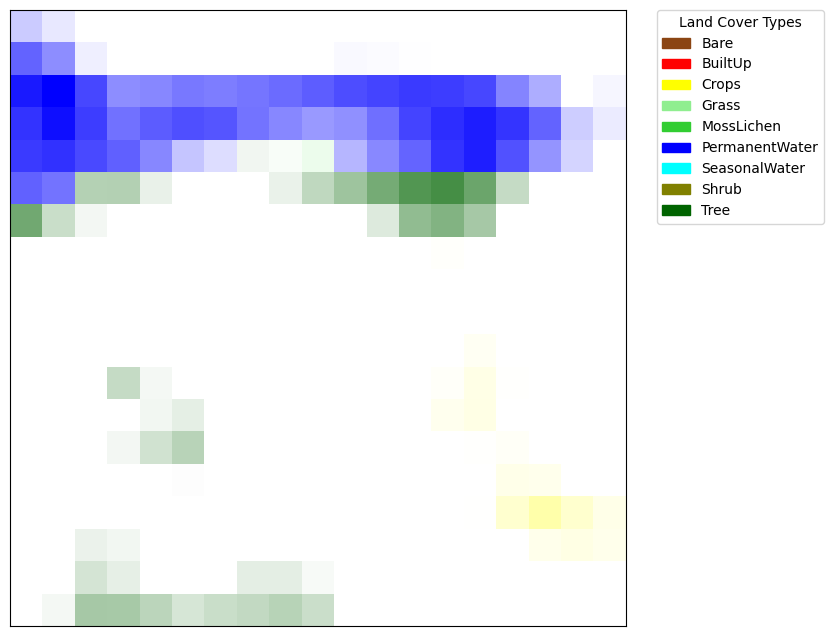

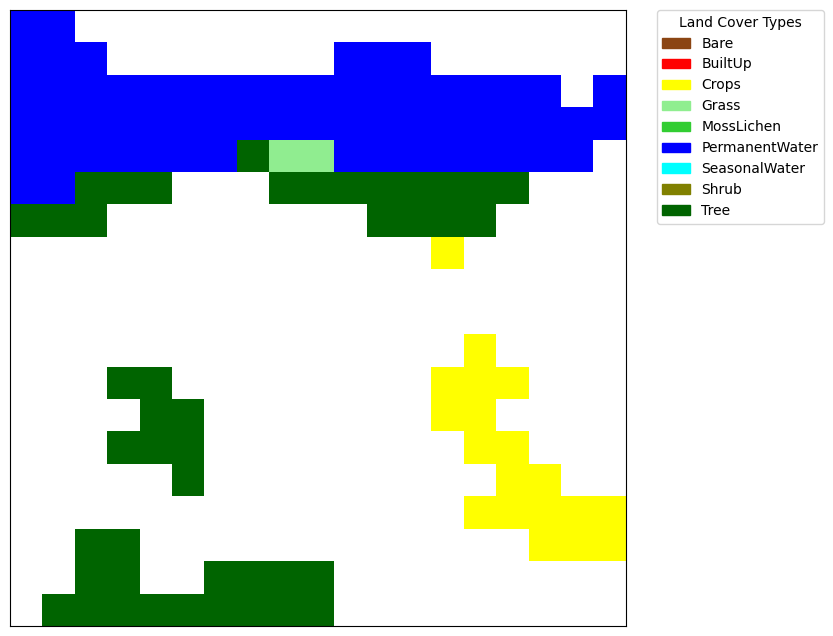

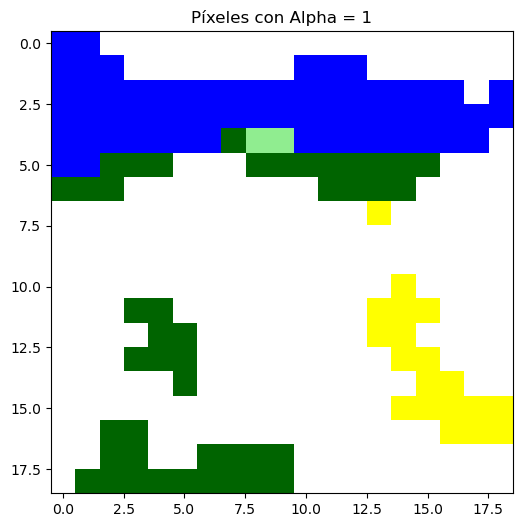

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.205090
1     0   1              1        0.090483
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y       land_cover  site
0     0   0  Permanent Water   162
1     1   0  Permanent Water   162
2     2   0  Permanent Water   162
3     3   0  Permanent Water   162
4     4   0  Permanent Water   162
..   ..  ..              ...   ...
356  14  18            Crops   162
357  15  18            Crops   162
358  16  18            Crops   162
359  17  18            Crops   1

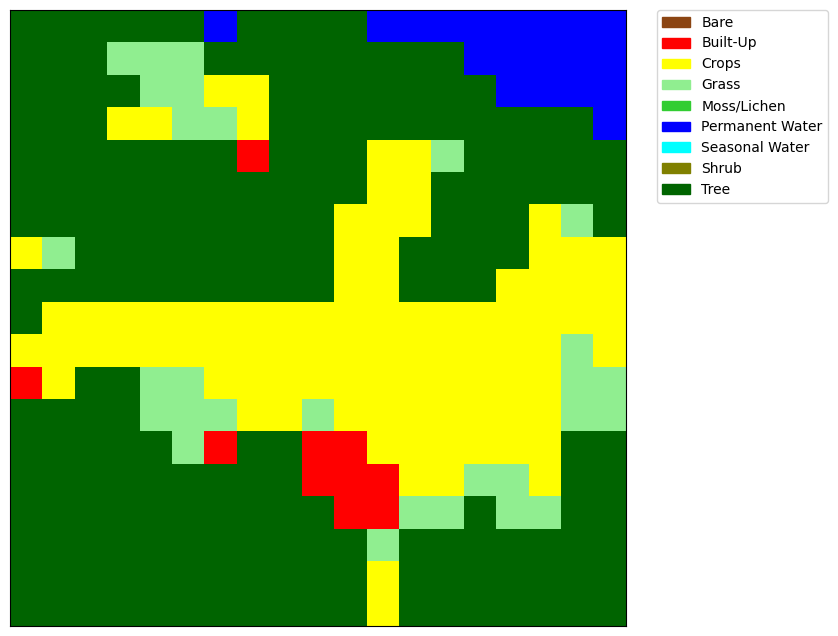

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


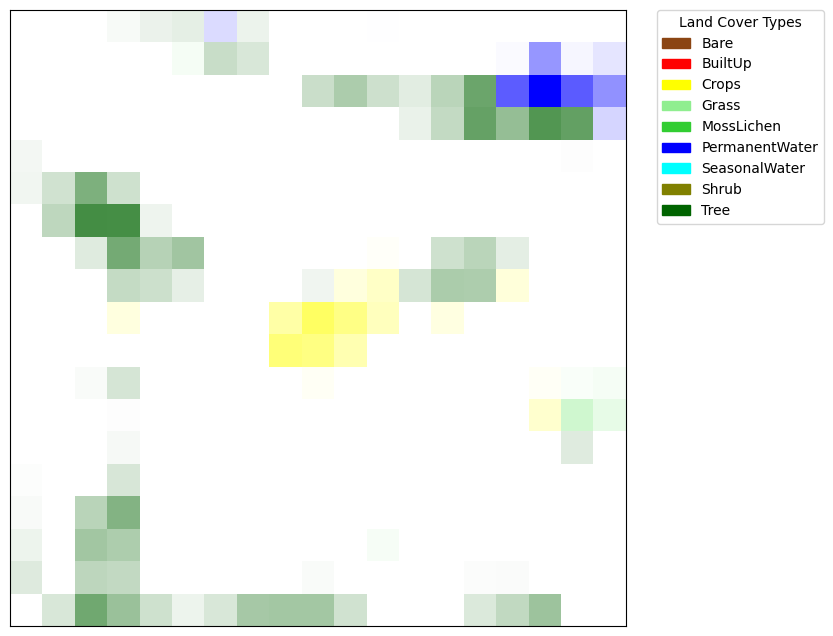

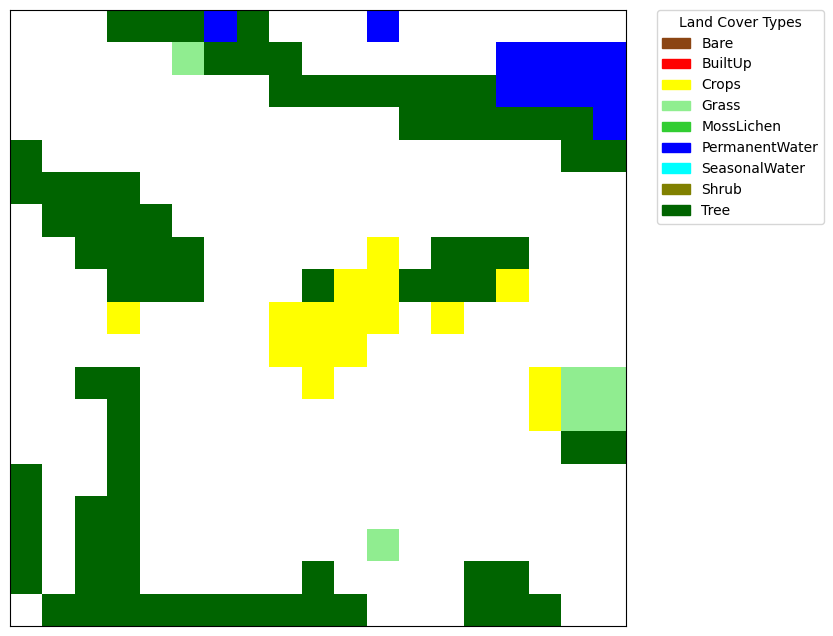

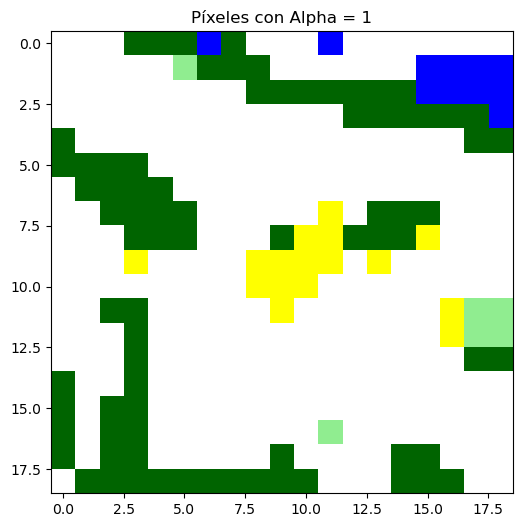

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.033389
4     0   4              1        0.080763
..   ..  ..            ...             ...
356  18  14              8        0.143781
357  18  15              8        0.246502
358  18  16              8        0.385839
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   163
1     1   0       Tree   163
2     2   0       Tree   163
3     3   0       Tree   163
4     4   0       Tree   163
..   ..  ..        ...   ...
356  14  18       Tree   163
357  15  18       Tree   163
358  16  18       Tree   163
359  17  18       Tree   163
360  18  18       Tree   163

[361 rows x 4 columns]
164


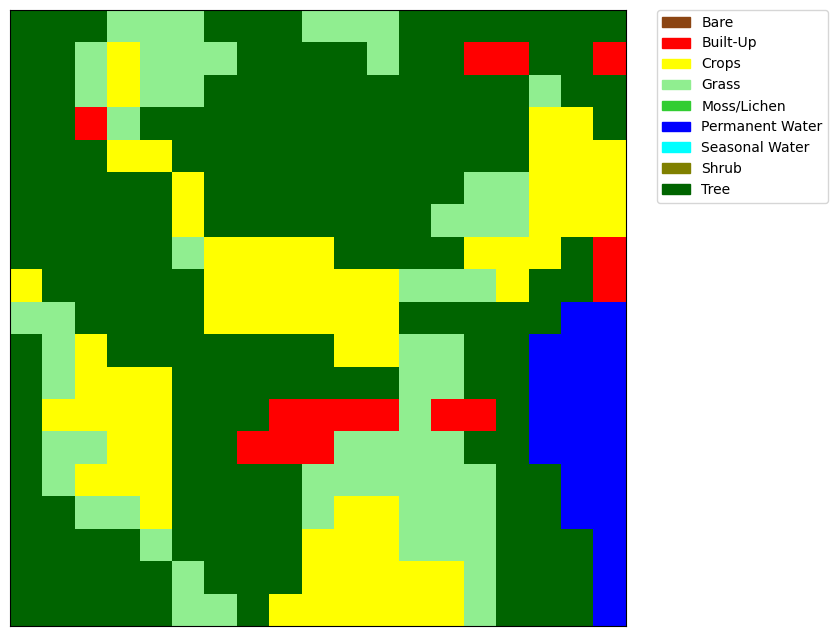

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


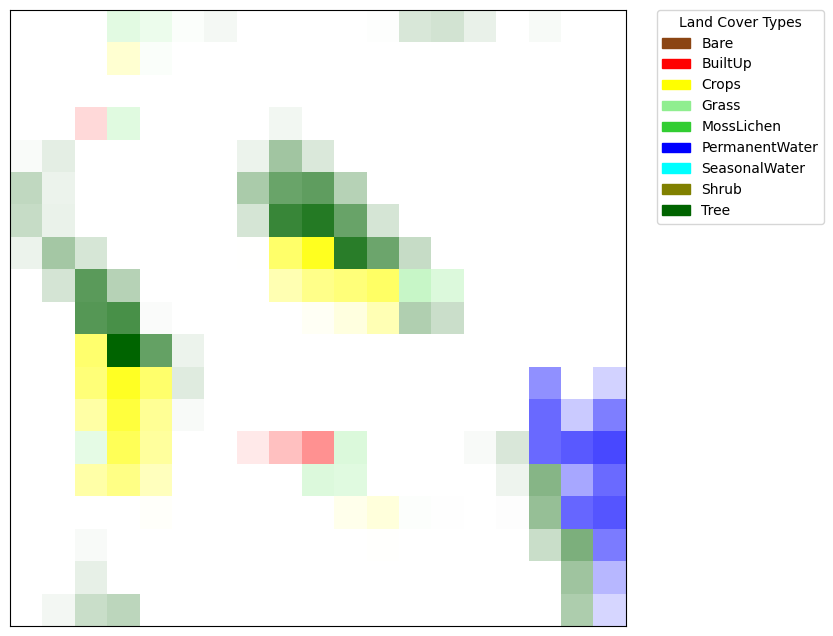

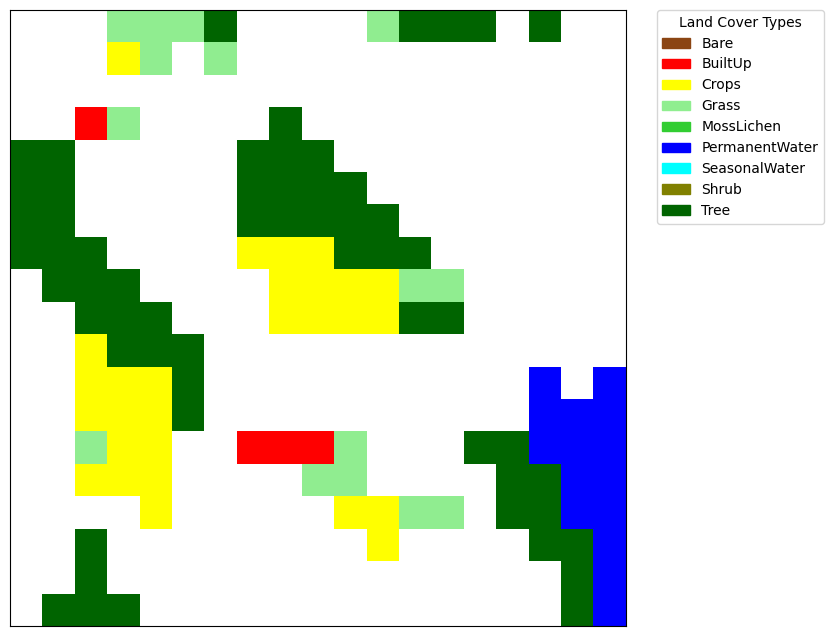

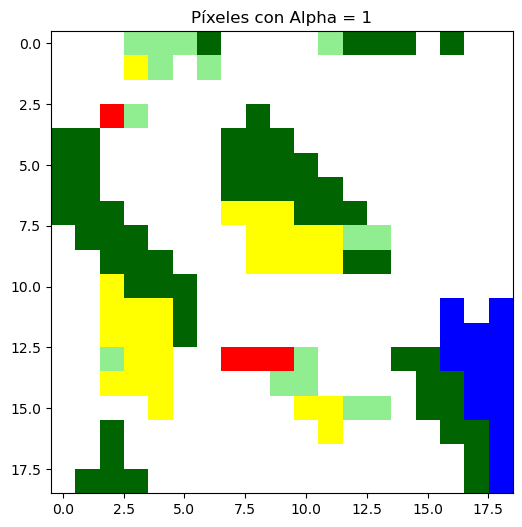

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              1        0.258710
4     0   4              1        0.172323
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              6        0.322699
360  18  18              6        0.162267

[361 rows x 4 columns]
      x   y       land_cover  site
0     0   0             Tree   164
1     1   0             Tree   164
2     2   0             Tree   164
3     3   0            Grass   164
4     4   0            Grass   164
..   ..  ..              ...   ...
356  14  18            Grass   164
357  15  18             Tree   164
358  16  18             Tree   164
359  17  18             Tree   1

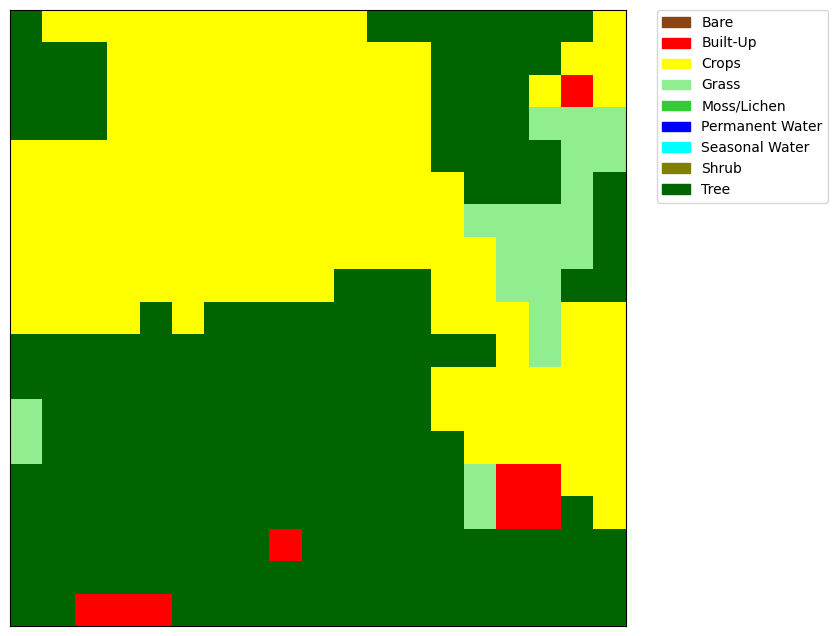

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


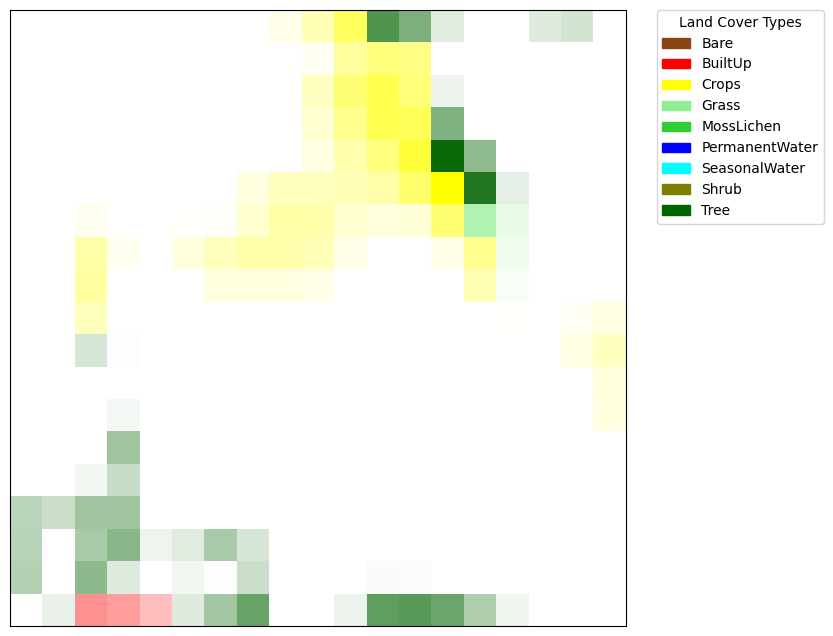

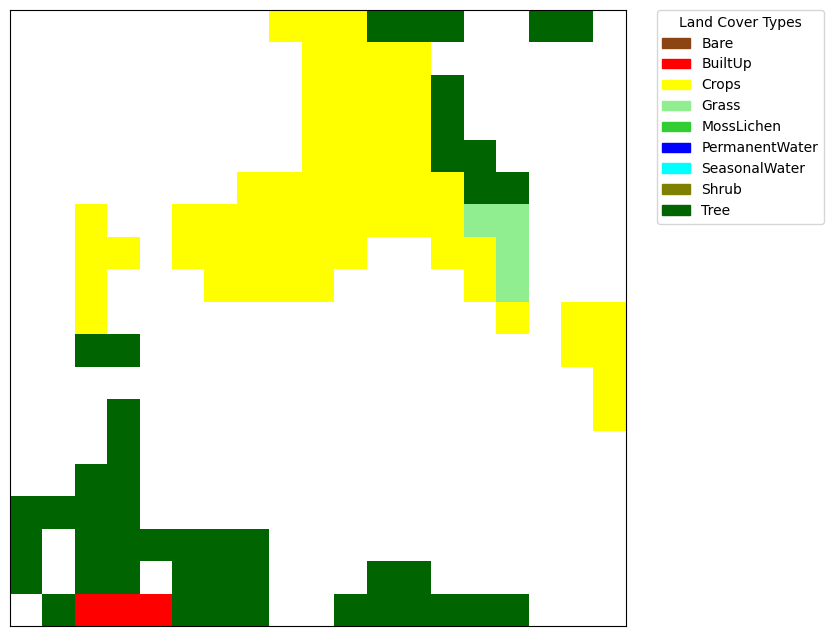

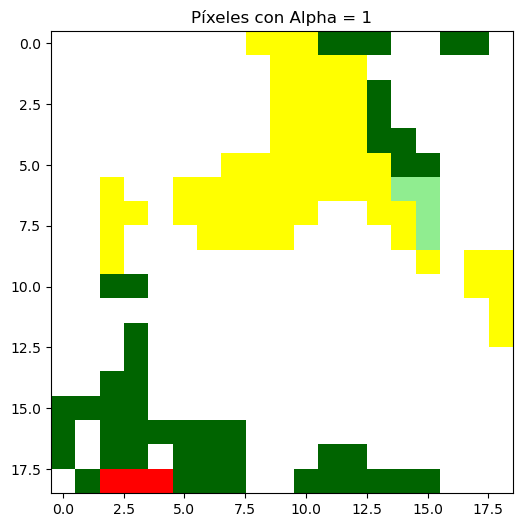

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              6        0.321727
357  18  15              6        0.060060
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   165
1     1   0      Crops   165
2     2   0      Crops   165
3     3   0      Crops   165
4     4   0      Crops   165
..   ..  ..        ...   ...
356  14  18       Tree   165
357  15  18       Tree   165
358  16  18       Tree   165
359  17  18       Tree   165
360  18  18       Tree   165

[361 rows x 4 columns]
166


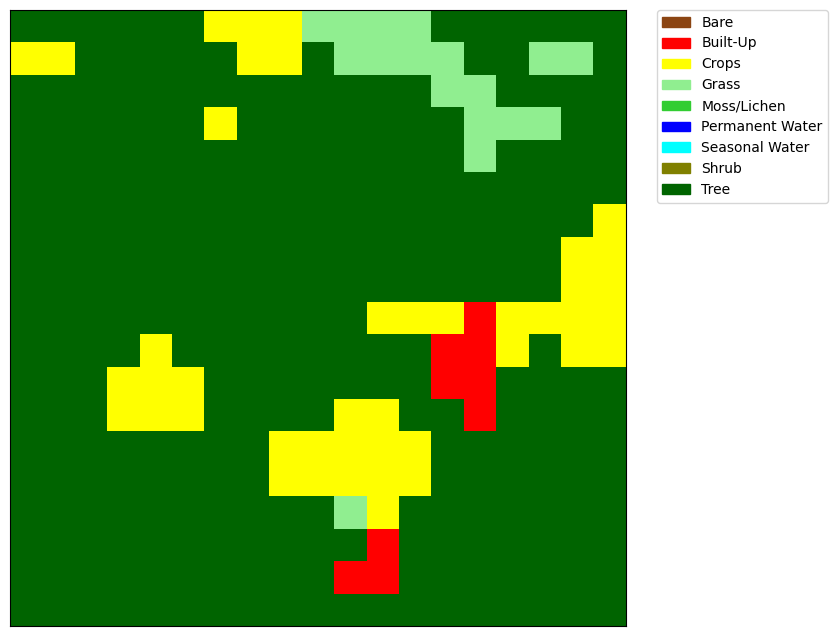

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


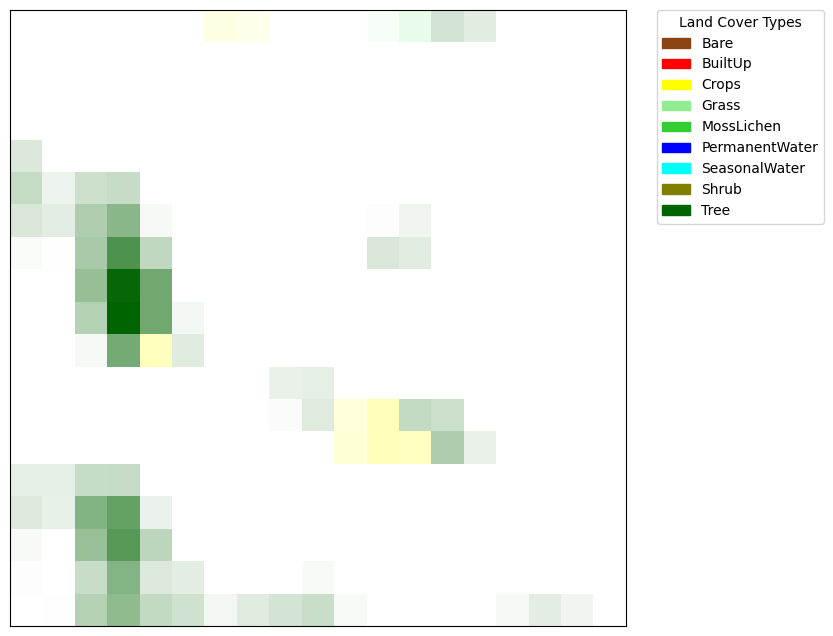

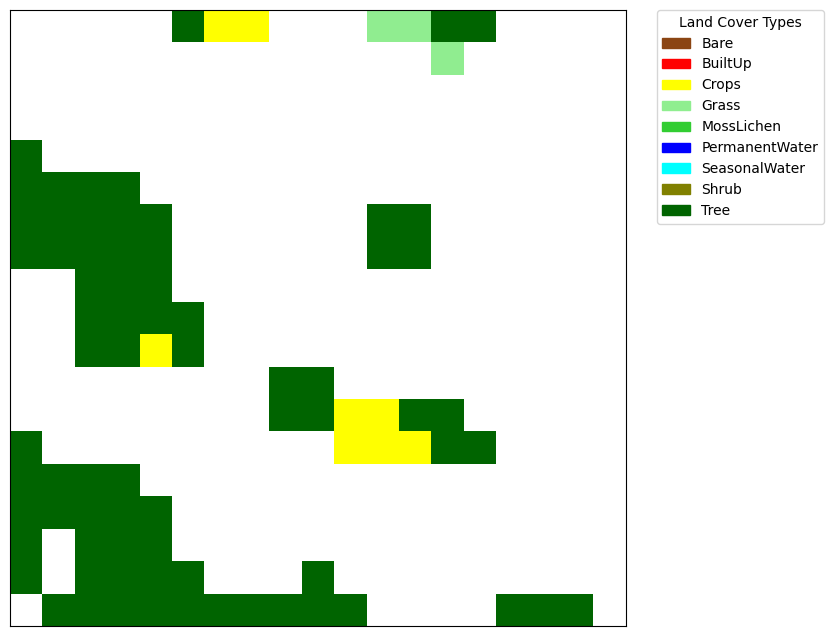

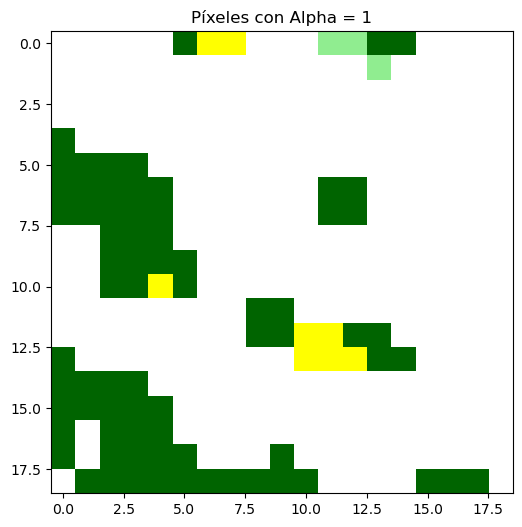

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              7        0.036144
358  18  16              7        0.109867
359  18  17              7        0.061486
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   166
1     1   0       Tree   166
2     2   0       Tree   166
3     3   0       Tree   166
4     4   0       Tree   166
..   ..  ..        ...   ...
356  14  18       Tree   166
357  15  18       Tree   166
358  16  18       Tree   166
359  17  18       Tree   166
360  18  18       Tree   166

[361 rows x 4 columns]
167


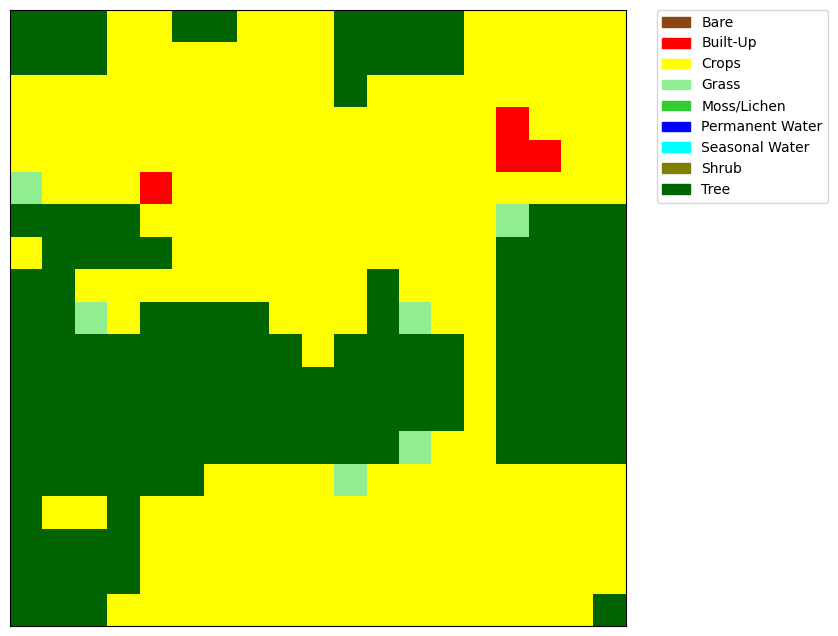

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


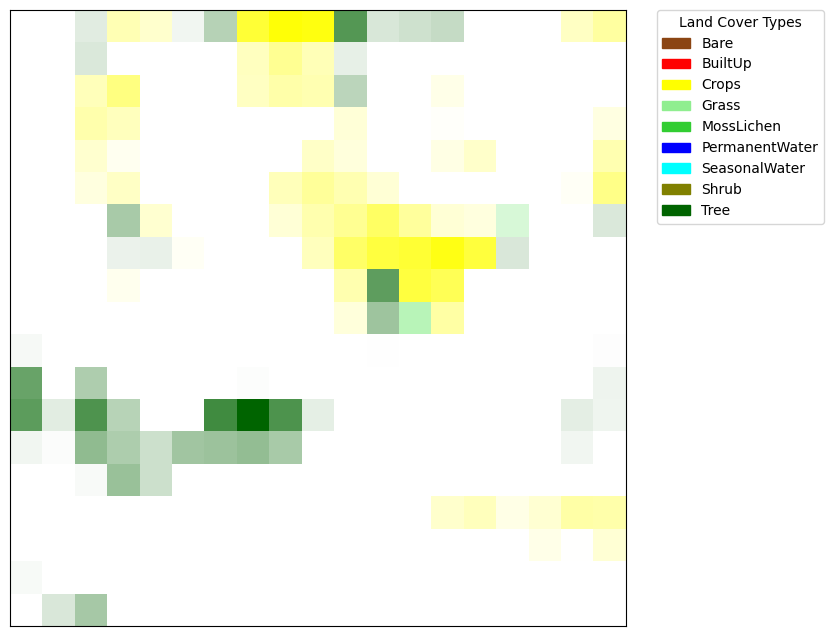

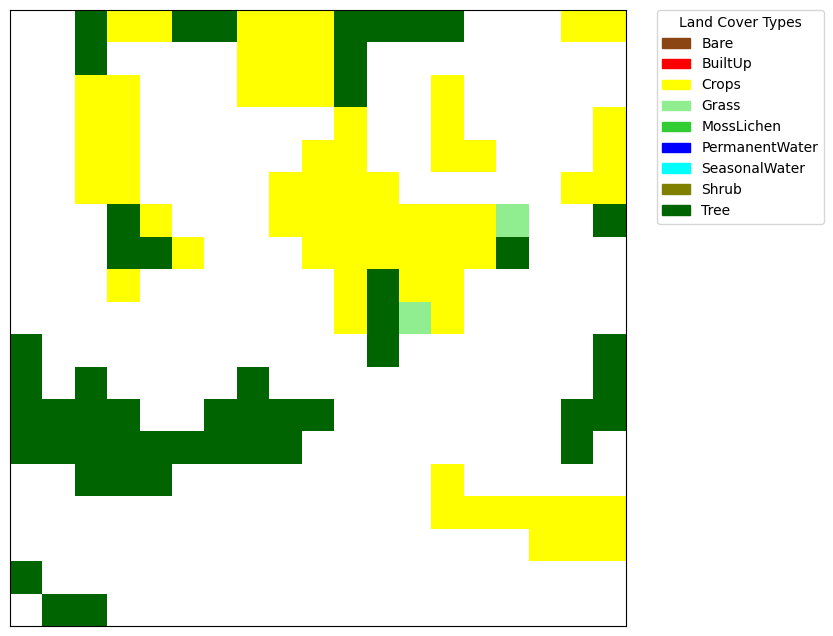

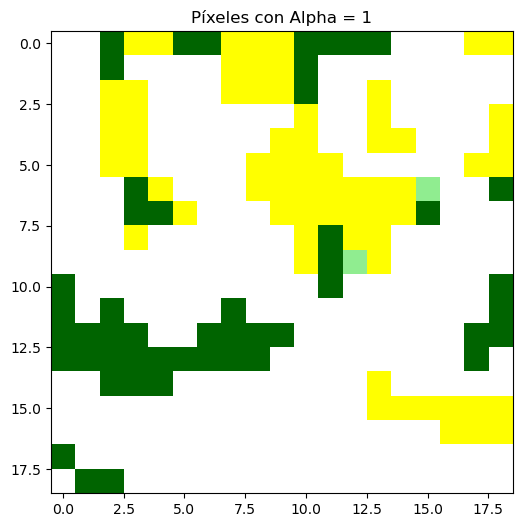

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              1        0.120391
3     0   3              1        0.297394
4     0   4              1        0.196083
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   167
1     1   0       Tree   167
2     2   0       Tree   167
3     3   0      Crops   167
4     4   0      Crops   167
..   ..  ..        ...   ...
356  14  18      Crops   167
357  15  18      Crops   167
358  16  18      Crops   167
359  17  18      Crops   167
360  18  18       Tree   167

[361 rows x 4 columns]
168


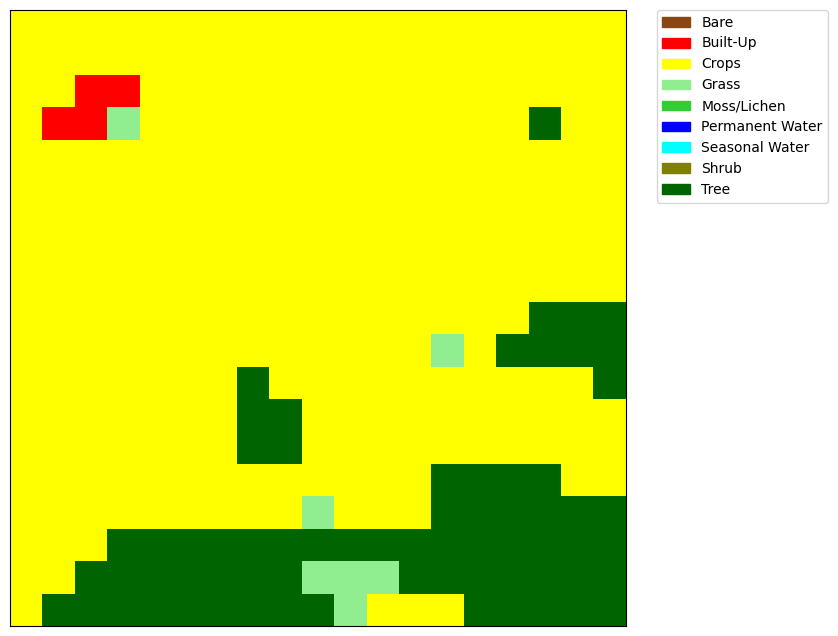

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


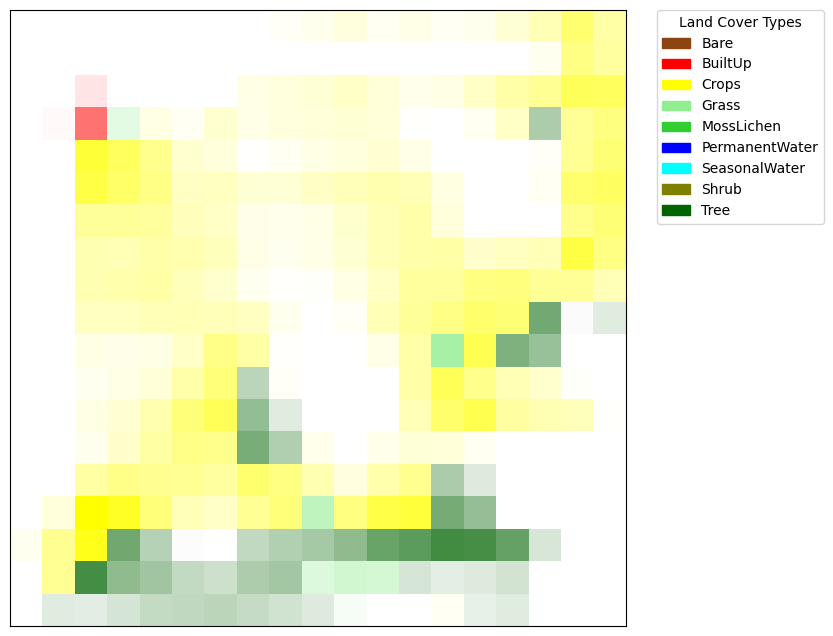

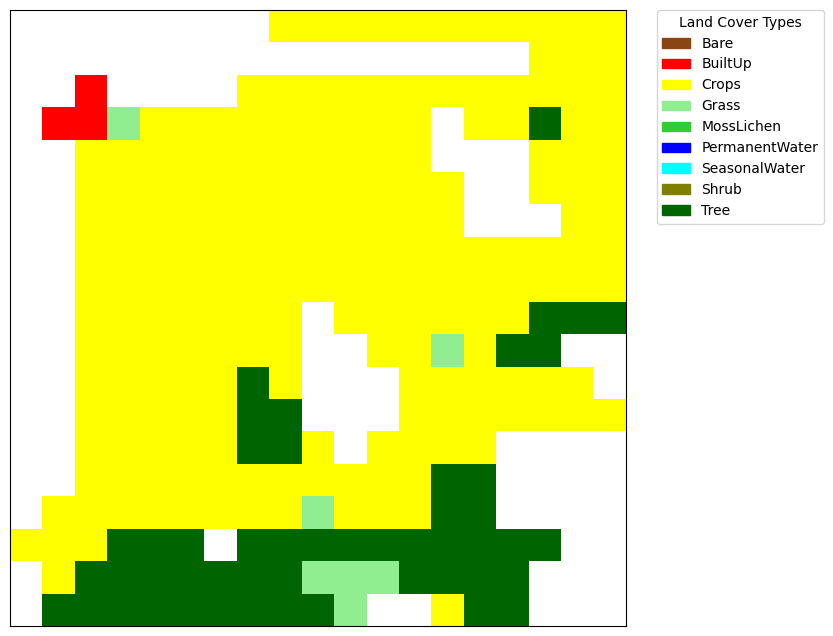

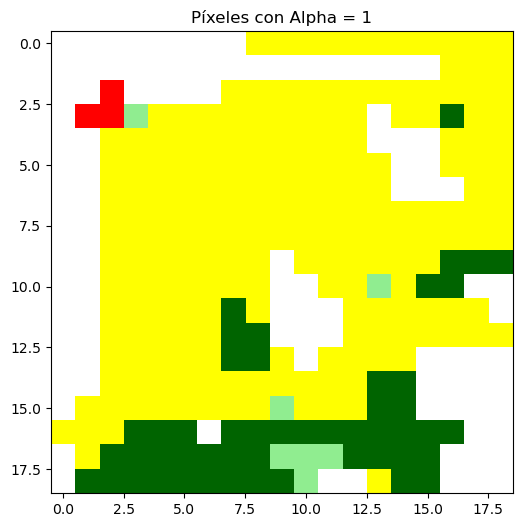

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              0        0.000000
1     0   1              0        0.000000
2     0   2              0        0.000000
3     0   3              0        0.000000
4     0   4              0        0.000000
..   ..  ..            ...             ...
356  18  14              1        0.093158
357  18  15              1        0.124841
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0      Crops   168
1     1   0      Crops   168
2     2   0      Crops   168
3     3   0      Crops   168
4     4   0      Crops   168
..   ..  ..        ...   ...
356  14  18       Tree   168
357  15  18       Tree   168
358  16  18       Tree   168
359  17  18       Tree   168
360  18  18       Tree   168

[361 rows x 4 columns]
169


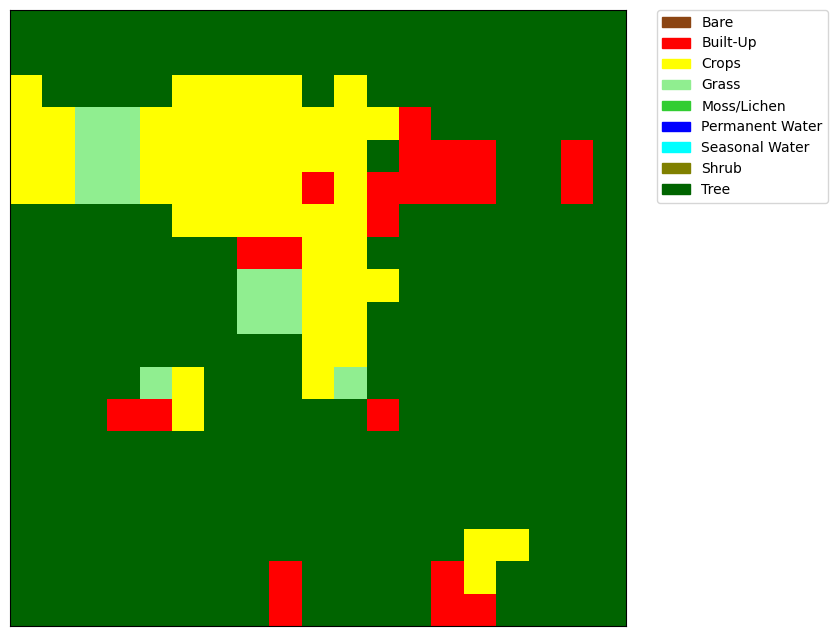

C:\Users\alfon\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


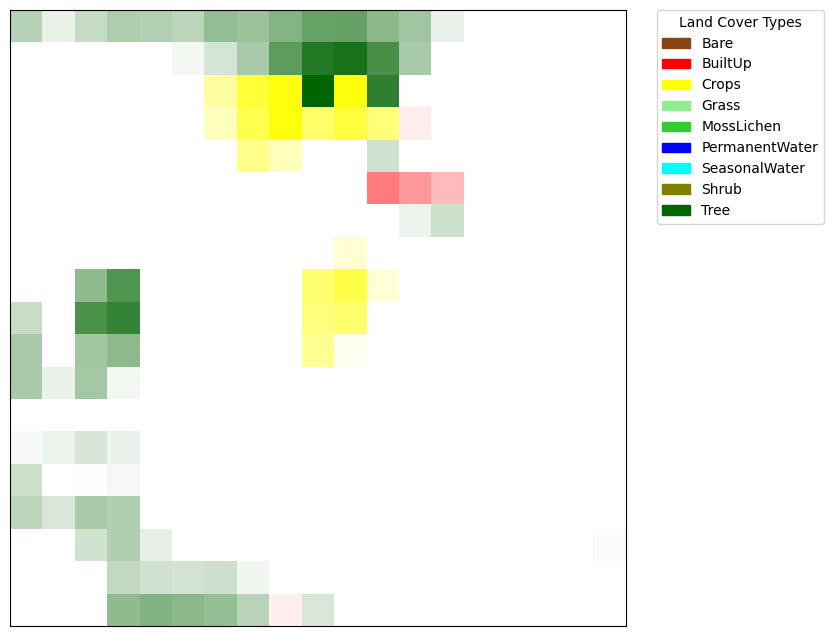

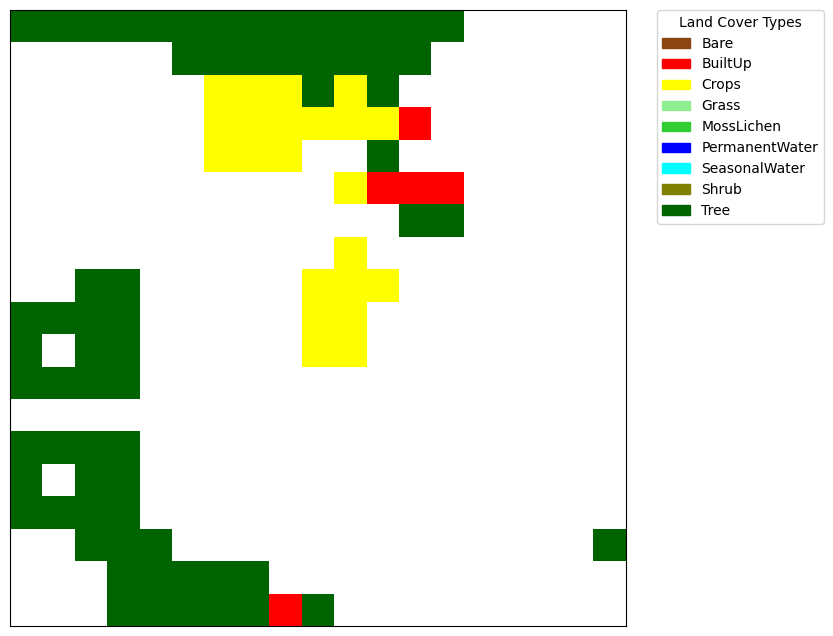

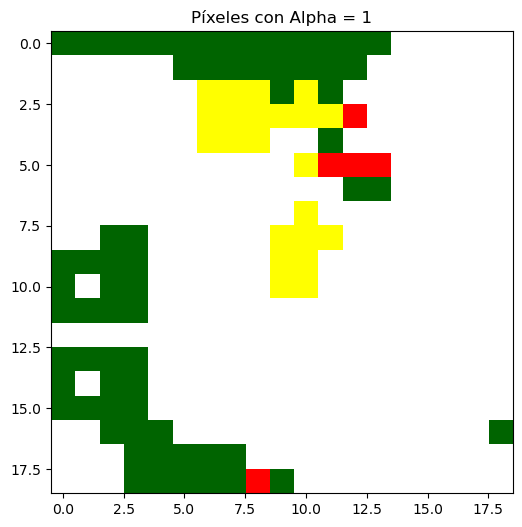

Error al convertir etiquetas a RGB: 'str' object has no attribute 'label2rgb'
      x   y  cluster_label  grad_cam_value
0     0   0              1        0.288573
1     0   1              1        0.089469
2     0   2              1        0.227318
3     0   3              1        0.322114
4     0   4              1        0.307774
..   ..  ..            ...             ...
356  18  14              0        0.000000
357  18  15              0        0.000000
358  18  16              0        0.000000
359  18  17              0        0.000000
360  18  18              0        0.000000

[361 rows x 4 columns]
      x   y land_cover  site
0     0   0       Tree   169
1     1   0       Tree   169
2     2   0       Tree   169
3     3   0       Tree   169
4     4   0       Tree   169
..   ..  ..        ...   ...
356  14  18   Built-Up   169
357  15  18       Tree   169
358  16  18       Tree   169
359  17  18       Tree   169
360  18  18       Tree   169

[361 rows x 4 columns]
        x 

In [7]:
# Recorrer todos los elementos de la primera dimensión de test_tensor
for input_tensor_number in range(test_tensor.shape[0]):
   
    print(input_tensor_number)

    input_tensor_raw = test_tensor[input_tensor_number].unsqueeze(0) #9

    
    # Convertir el tensor de entrada a float para manipularla con la CNN
    input_tensor = input_tensor_raw.float()
    
    # Supongamos que input_tensor es de la forma [1, 9, height, width]
    input_tensor_squeeze = input_tensor.squeeze(0)  # Remover la dimensión del batch

    # Definir la paleta de colores según los tipos de cobertura terrestre
    color_map = {
        0: 'saddlebrown',   # Bare
        1: 'red',           # BuiltUp
        2: 'yellow',        # Crops
        3: 'lightgreen',    # Grass
        4: 'limegreen',     # MossLichen
        5: 'blue',          # PermanentWater
        6: 'cyan',          # SeasonalWater
        7: 'olive',         # Shrub
        8: 'darkgreen'      # Tree
    }

    # Determinar la capa dominante para cada píxel
    dominant_layer_indices = np.argmax(input_tensor_squeeze, axis=0)

    # Crear una imagen RGB vacía
    dominant_image = np.zeros((*dominant_layer_indices.shape, 3), dtype=np.uint8)

    # Mapear cada índice a su color correspondiente en la imagen RGB
    for index, color in color_map.items():
        # Encuentra dónde el índice dominante es igual al índice de la capa actual
        mask = dominant_layer_indices == index
        dominant_image[mask] = np.array(to_rgb(color)) * 255  # Convertir color a RGB y ajustar a escala de 0-255

    # Definir la paleta de colores según los tipos de cobertura terrestre
    color_map = {
        0: 'saddlebrown',   # Bare
        1: 'red',           # BuiltUp
        2: 'yellow',        # Crops
        3: 'lightgreen',    # Grass
        4: 'limegreen',     # MossLichen
        5: 'blue',          # PermanentWater
        6: 'cyan',          # SeasonalWater
        7: 'olive',         # Shrub
        8: 'darkgreen'      # Tree
    }

    # Etiquetas para la leyenda basadas en los nombres de las categorías
    labels = {
        0: "Bare",
        1: "Built-Up",
        2: "Crops",
        3: "Grass",
        4: "Moss/Lichen",
        5: "Permanent Water",
        6: "Seasonal Water",
        7: "Shrub",
        8: "Tree"
    }

    # Crear una figura y un eje
    fig, ax = plt.subplots(figsize=(10, 8))

    # Asumiendo que 'dominant_layer_indices' y 'dominant_image' ya están definidos
    ax.imshow(dominant_image)
    ax.axis('on')  # Ocultar los ejes

    # Crear una lista de parches para la leyenda
    patches = [mpatches.Patch(color=to_rgb(color), label=labels[idx]) for idx, color in color_map.items()]

    # Añadir la leyenda al gráfico
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

    # Ocultar las etiquetas de los ejes
    ax.xaxis.set_ticks([])  # Oculta las etiquetas y marcas del eje x
    ax.yaxis.set_ticks([])  # Oculta las etiquetas y marcas del eje y

    # Mostrar el gráfico
    plt.show()
    
    class GradCAM:
        def __init__(self, model, layer):
            self.model = model
            self.layer = layer
            self.gradient = None
            self.activation = None

            self.hook_handles = []
            self.hook_handles.append(layer.register_forward_hook(self.save_activation))
            self.hook_handles.append(layer.register_backward_hook(self.save_gradient))

        def save_activation(self, module, input, output):
            self.activation = output.detach()

        def save_gradient(self, module, grad_input, grad_output):
            self.gradient = grad_output[0].detach()

        def __call__(self, x, index=None):
            # Set a fixed seed for reproducibility
            if seed is not None:
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                random.seed(seed)

            # Clear previous gradients and activations
            self.gradient = None
            self.activation = None

            output = self.model(x)
            if index is None:
                index = torch.argmax(output)

            self.model.zero_grad()
            output.backward(torch.ones_like(output), retain_graph=True)  # Simplificado

            pooled_gradients = torch.mean(self.gradient, dim=[0, 2, 3])
            for i in range(pooled_gradients.size(0)):
                self.activation[:, i, :, :] *= pooled_gradients[i]

            heatmap = torch.mean(self.activation, dim=1).squeeze()
            heatmap = F.relu(heatmap)
            heatmap /= torch.max(heatmap)

            return heatmap

        def release(self):
            for handle in self.hook_handles:
                handle.remove()
    
    ###############################################################
    ###############################################################

    # Uso de GradCAM en el modelo con la capa conv6
    grad_cam = GradCAM(model, model.conv6)
    # Establecer una semilla fija para garantizar la reproducibilidad
    seed = 42
    # Obtención del mapa de calor
    heatmap = grad_cam(input_tensor)
    grad_cam.release()

    # Asumiendo que 'dominant_image' y 'heatmap' están definidos
    # Asegurarse de que el heatmap está normalizado
    normalized_heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())

    # Crear una imagen RGBA para `dominant_image` donde el canal alfa se ajusta según el heatmap
    dominant_rgba_image = np.zeros((*dominant_image.shape[:2], 4), dtype=np.float32)  # Crear imagen RGBA

    for i in range(3):  # Copiar los canales RGB
        dominant_rgba_image[..., i] = dominant_image[..., i] / 255.0  # Normalizar y copiar
    dominant_rgba_image[..., 3] = normalized_heatmap  # Ajustar el canal alfa usando el heatmap

    # Configurar la visualización
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.imshow(dominant_rgba_image)  # Mostrar la imagen RGBA
    ax.axis('on')  # Mostrar los ejes


    # Definir la paleta de colores y las etiquetas para la leyenda de `dominant_image`
    color_map = {
        "Bare": 'saddlebrown',
        "BuiltUp": 'red',
        "Crops": 'yellow',
        "Grass": 'lightgreen',
        "MossLichen": 'limegreen',
        "PermanentWater": 'blue',
        "SeasonalWater": 'cyan',
        "Shrub": 'olive',
        "Tree": 'darkgreen'
    }
    patches = [mpatches.Patch(color=to_rgb(color), label=label) for label, color in color_map.items()]

    # Ocultar las etiquetas de los ejes
    ax.xaxis.set_ticks([])  # Oculta las etiquetas y marcas del eje x
    ax.yaxis.set_ticks([])  # Oculta las etiquetas y marcas del eje y

    # Añadir la leyenda para la cobertura de suelo
    legend = ax.legend(handles=patches, loc='upper left', title="Land Cover Types", bbox_to_anchor=(1.05, 1), borderaxespad=0.)

    plt.show()

    # Asumiendo que 'dominant_image' y 'heatmap' están definidos
    # Asegurarse de que el heatmap está normalizado
    normalized_heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())

    # Crear una imagen RGBA para `dominant_image` donde el canal alfa se ajusta según el heatmap
    dominant_rgba_image = np.zeros((*dominant_image.shape[:2], 4), dtype=np.float32)  # Crear imagen RGBA

    for i in range(3):  # Copiar los canales RGB
        dominant_rgba_image[..., i] = np.around(dominant_image[..., i] / 255.0, 7)  # Normalizar y copiar

    ########################################################
    # Ajustar el canal alfa usando el heatmap con el umbral
    threshold = 0.0
    #######################################################


    alpha_channel = np.where(normalized_heatmap > threshold, 1.0, 0) #normalized_heatmap, 0)
    dominant_rgba_image[..., 3] = alpha_channel  # Aplicar el canal alfa modificado

    # Configurar la visualización
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.imshow(dominant_rgba_image)  # Mostrar la imagen RGBA
    ax.axis('on')  # Mostrar los ejes

    # Definir la paleta de colores y las etiquetas para la leyenda de `dominant_image`
    color_map = {
        "Bare": 'saddlebrown',
        "BuiltUp": 'red',
        "Crops": 'yellow',
        "Grass": 'lightgreen',
        "MossLichen": 'limegreen',
        "PermanentWater": 'blue',
        "SeasonalWater": 'cyan',
        "Shrub": 'olive',
        "Tree": 'darkgreen'
    }
    patches = [mpatches.Patch(color=to_rgb(color), label=label) for label, color in color_map.items()]

    # Ocultar las etiquetas de los ejes
    ax.xaxis.set_ticks([])  # Oculta las etiquetas y marcas del eje x
    ax.yaxis.set_ticks([])  # Oculta las etiquetas y marcas del eje y

    # Añadir la leyenda para la cobertura de suelo
    legend = ax.legend(handles=patches, loc='upper left', title="Land Cover Types", bbox_to_anchor=(1.05, 1), borderaxespad=0.)

    plt.show()

    # Asumiendo que `dominant_rgba_image` es tu imagen RGBA original
    alpha_mask = dominant_rgba_image[..., 3] == 1

    # Crear una imagen de salida que será una copia de la imagen original
    output_image = np.zeros_like(dominant_rgba_image)

    # Copiar solo los píxeles donde el alfa es 1
    output_image[alpha_mask] = dominant_rgba_image[alpha_mask]

    # Visualizar la imagen resultante, que ahora resaltará los píxeles con alfa = 1
    plt.figure(figsize=(10, 6))
    plt.imshow(output_image)
    plt.title("Píxeles con Alpha = 1")
    plt.axis('on')  # Ocultar los ejes para una visualización limpia
    plt.show()

    # Convertir la imagen RGB (ignorando el alfa) a una imagen binaria donde hay píxeles no negros
    binary_image = np.any(output_image[..., :3] > 0, axis=-1)  # True donde hay color

    # Aplicar etiquetado de componentes conectadas sobre la imagen binaria
    labeled_image = measure.label(binary_image, connectivity=2)  # Conexiones diagonales incluidas
    # Asegúrate de que output_image solo contenga canales RGB
    if output_image.shape[-1] == 4:  # Si todavía incluye el canal alfa
        output_image = output_image[..., :3]  # Tomar solo los tres primeros canales (RGB)

    try:
        image_labeled = color.label2rgb(labeled_image, output_image, kind='overlay', bg_label=0)
        plt.figure(figsize=(10, 6))
        plt.imshow(image_labeled)
        plt.title("Componentes Conectadas")
        plt.axis('off')
        plt.show()
    except Exception as e:
        print("Error al convertir etiquetas a RGB:", e)


    # Preparar los datos para el DataFrame
    data = {
        'x': [],
        'y': [],
        'cluster_label': [],
        'grad_cam_value': []
    }

    # Iterar sobre cada píxel en la imagen etiquetada
    for (x, y), label in np.ndenumerate(labeled_image):
        data['x'].append(x)
        data['y'].append(y)
        data['cluster_label'].append(label)
        # Extraer el valor del tensor usando .item() y añadirlo al DataFrame
        data['grad_cam_value'].append(heatmap[x, y].item())

    # Crear el DataFrame
    df = pd.DataFrame(data)

    # Mostrar el DataFrame
    print(df)

    ##############################
    # Extract pixel's land cover from dominant image
    
    # Mapeo de nombres de colores a RGB (valores de ejemplo, ajustar según sea necesario)
    rgb_color_map = {
        'saddlebrown': [139, 69, 19],
        'red': [255, 0, 0],
        'yellow': [255, 255, 0],
        'lightgreen': [144, 238, 144],
        'limegreen': [50, 205, 50],
        'blue': [0, 0, 255],
        'cyan': [0, 255, 255],
        'olive': [128, 128, 0],
        'darkgreen': [0, 100, 0]
    }

    # Invierte el color_map para obtener un mapeo de RGB a ID
    rgb_to_id = {tuple(value): key for key, value in rgb_color_map.items()}


    id_to_color = {
        0: 'saddlebrown',   # Bare
        1: 'red',           # BuiltUp
        2: 'yellow',        # Crops
        3: 'lightgreen',    # Grass
        4: 'limegreen',     # MossLichen
        5: 'blue',          # PermanentWater
        6: 'cyan',          # SeasonalWater
        7: 'olive',         # Shrub
        8: 'darkgreen'      # Tree
    }
    
    def map_pixels_to_ids(image):
        # Asignar un ID por defecto para píxeles no mapeados
        id_image = np.full((image.shape[0], image.shape[1]), -1, dtype=int)

        # Convertir la imagen a una lista de tuplas para búsqueda eficiente
        flattened_image = [tuple(pixel) for pixel in image.reshape(-1, image.shape[2])]

        # Mapear cada pixel utilizando el diccionario, con un ID por defecto si no se encuentra
        id_flat = [rgb_to_id.get(pixel, -1) for pixel in flattened_image]

        # Reconstruir la imagen de IDs
        id_image = np.array(id_flat).reshape(image.shape[0], image.shape[1])

        return id_image

    # Aplicar la función a la imagen
    color_matrix = map_pixels_to_ids(dominant_image)

    # Mapeo directo de ID a nombre de color
    id_to_color = {
        0: 'saddlebrown',   # Bare
        1: 'red',           # BuiltUp
        2: 'yellow',        # Crops
        3: 'lightgreen',    # Grass
        4: 'limegreen',     # MossLichen
        5: 'blue',          # PermanentWater
        6: 'cyan',          # SeasonalWater
        7: 'olive',         # Shrub
        8: 'darkgreen'      # Tree
    }

    # Etiquetas para cada ID
    labels = {
        0: "Bare",
        1: "Built-Up",
        2: "Crops",
        3: "Grass",
        4: "Moss/Lichen",
        5: "Permanent Water",
        6: "Seasonal Water",
        7: "Shrub",
        8: "Tree"
    }

    # Crear un diccionario para mapear de color a etiqueta de cobertura terrestre
    color_to_label = {color: labels[id] for id, color in id_to_color.items()}
    # Convertir los nombres de colores en etiquetas de cobertura terrestre
    label_matrix = [[color_to_label.get(color, 'Unknown') for color in row] for row in color_matrix]
    
    # Crear una lista para almacenar los diccionarios
    data_landcover = []

    # Iterar sobre cada fila y cada columna en la matriz
    for y, row in enumerate(label_matrix):
        for x, label in enumerate(row):
            # Crear un diccionario para cada celda y añadirlo a la lista
            data_landcover.append({
                'x': x,
                'y': y,
                'land_cover': label,
                'site': input_tensor_number
            })

    # Crear un DataFrame desde la lista de diccionarios
    df_landcover = pd.DataFrame(data_landcover)
    
    
    # Mostrar el DataFrame
    print(df_landcover)

    # Asumiendo que df y df_landcover ya están definidos como en tu descripción
    # Realizar el left join
    df_merged = pd.merge(df_landcover, df, on=['x', 'y'], how='left')
    
    
    
    # Añadir el DataFrame al DataFrame de resultados totales
    result_df = pd.concat([result_df, df_merged], ignore_index=True)

# Mostrar el DataFrame de resultados totales
print(result_df)

In [8]:
# Guardar el DataFrame en un archivo CSV
result_df.to_csv('../Data/df_features_visualization.csv', index=False)